In [78]:
%load_ext pycodestyle_magic
%flake8_on
%load_ext autoreload

The pycodestyle_magic extension is already loaded. To reload it, use:
  %reload_ext pycodestyle_magic
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [79]:
%autoreload 2

In [92]:
"""Python code to classify X-ray sources by color.

Functionalities needed.

1. Line, step, scatter and histogram and kde plots
2. Plot net counts, bg/net and S/N ratio
3. Process detectors seperately and combine colors only optional
4. Cross-match 4XMM and CSC sources.
5. Compare with Hailey et al. sources.
"""


import copy
import os
import glob2
import warnings
import xspec
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from scipy.ndimage import median_filter


# Plot functions
def set_plotparams(plottype):
    """Set plot parameters."""
    if plottype == 'notebook':
        plt.rcParams["figure.figsize"] = (20, 15)
        plt.rcParams["axes.titlesize"] = 24
        plt.rcParams["axes.labelsize"] = 24
        plt.rcParams["lines.linewidth"] = 3
        plt.rcParams["lines.markersize"] = 15
        plt.rcParams["xtick.labelsize"] = 20
        plt.rcParams["ytick.labelsize"] = 20
        plt.rcParams["legend.fontsize"] = 20
        plt.rcParams['xtick.major.size'] = 16
        plt.rcParams['xtick.minor.size'] = 8
        plt.rcParams['ytick.major.size'] = 16
        plt.rcParams['ytick.minor.size'] = 8
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'inout'
        plt.rcParams['ytick.direction'] = 'inout'
    elif plottype == 'presentation':
        plt.rcParams["figure.figsize"] = (8, 6)
        plt.rcParams["axes.titlesize"] = 16
        plt.rcParams["axes.labelsize"] = 16
        plt.rcParams["lines.linewidth"] = 3
        plt.rcParams["lines.markersize"] = 5
        plt.rcParams["xtick.labelsize"] = 14
        plt.rcParams["ytick.labelsize"] = 14
        plt.rcParams["legend.fontsize"] = 14
        plt.rcParams['xtick.major.size'] = 8
        plt.rcParams['xtick.minor.size'] = 4
        plt.rcParams['ytick.major.size'] = 8
        plt.rcParams['ytick.minor.size'] = 4
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'inout'
        plt.rcParams['ytick.direction'] = 'inout'
    elif plottype == 'paper1':
        plt.rcParams["figure.figsize"] = (4, 3)
        plt.rcParams["axes.titlesize"] = 14
        plt.rcParams["axes.labelsize"] = 12
        plt.rcParams["lines.linewidth"] = 2
        plt.rcParams["lines.markersize"] = 2
        plt.rcParams["xtick.labelsize"] = 10
        plt.rcParams["ytick.labelsize"] = 10
        plt.rcParams["legend.fontsize"] = 10
        plt.rcParams['xtick.major.size'] = 6
        plt.rcParams['xtick.minor.size'] = 3
        plt.rcParams['ytick.major.size'] = 6
        plt.rcParams['ytick.minor.size'] = 3
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'in'
        plt.rcParams['ytick.direction'] = 'in'
    elif plottype == 'paper2':
        plt.rcParams["figure.figsize"] = (8, 6)
        plt.rcParams["axes.titlesize"] = 20
        plt.rcParams["axes.labelsize"] = 12
        plt.rcParams["lines.linewidth"] = 2
        plt.rcParams["lines.markersize"] = 2
        plt.rcParams["xtick.labelsize"] = 10
        plt.rcParams["ytick.labelsize"] = 10
        plt.rcParams["legend.fontsize"] = 15
        plt.rcParams['xtick.major.size'] = 6
        plt.rcParams['xtick.minor.size'] = 3
        plt.rcParams['ytick.major.size'] = 6
        plt.rcParams['ytick.minor.size'] = 3
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'in'
        plt.rcParams['ytick.direction'] = 'in'


def plotline_scatter(xdatas, ydatas,
                     pl_types=None, axs=None, xlabel=None,
                     ylabel=None, pl_labels=None, styles=None, colors=None,
                     yscale='linear', title=None, ylim=None, figsize=None,
                     cmap='coolwarm_r', zdatas=None, zdata_label=None,
                     plot_cbar=True, cbar_ax=None, highlight=False):
    """Plot line, step and scatter plots."""
    if zdatas is None:
        zdatas = [None]*len(ydatas)
    if pl_types is None:
        pl_types = ['line']*len(ydatas)
    if axs is None:
        fig, axs = plt.subplots(figsize=figsize)
    if pl_labels is None:
        pl_labels = [None]*len(ydatas)
    if styles is None:
        styles = ['-']*len(ydatas)
    if colors is None:
        if len(ydatas) <= 4:
            colors = ['#004488', '#ddaa33', '#bb5566', '#000000']
        elif len(ydatas) <= 9:
            colors = ['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      'b57de9', 'ff9468', '9cee81', '00d2ff']
        else:
            warnings.warn('Too many plot elements. Colors will be repeated.')
            colors = (['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      '#b57de9', '#ff9468', '#9cee81', '#00d2ff'] *
                      (int(len(ydatas/9)+1)))

    axs.set_title(title)
    if ylim is not None:
        axs.set_ylim(ylim[0], ylim[1])
    axs.set_xlabel(xlabel)
    axs.set_xscale('log')
    axs.set_yscale(yscale)
    axs.set_ylabel(ylabel)
    for i, pl_type in enumerate(pl_types):
        if pl_type == 'line':
            axs.plot(xdatas[i], ydatas[i], linestyle=styles[i],
                     label=pl_labels[i], color=colors[i])
        elif pl_type == 'scatter':
            if styles[i] == '-':
                styles[i] = '.'
            if zdatas[i] is not None:
                
                sc_plot = axs.scatter(
                    xdatas[i], ydatas[i], c=zdatas[i], marker=styles[i],
                    label=pl_labels[i], cmap=cmap,
                    norm=Normalize(-3, 15, True))
                if plot_cbar and cbar_ax is None:
                    cbar = plt.colorbar(mappable=sc_plot, ax=axs,
                                        label=zdata_label)
                elif plot_cbar:
                    cbar = plt.colorbar(mappable=sc_plot, cax=cbar_ax,
                                        label=zdata_label)
            else:
                plt.rcParams["lines.markersize"] = 4
                if highlight:
                    if i > 0:
                        plt.rcParams["lines.markersize"] = 16
                print(plt.rcParams["lines.markersize"])
                axs.scatter(xdatas[i], ydatas[i], marker=styles[i],
                            label=pl_labels[i], color=colors[i])
        elif pl_type == 'step':
            ydatas[i] = np.append(ydatas[i], ydatas[i].copy()[-1])
            axs.step(xdatas[i], ydatas[i], where='post', linestyle=styles[i],
                     label=pl_labels[i], color=colors[i])
        else:
            print(pl_types)
            raise ValueError("pl_type can only be 'line' or 'scatter'. Got " +
                             pl_type)
    axs.legend()
    return axs


def plothist(data_arr, data2=None, axs=None, bins=None, xlabel=None,
             ylabel=None, pl_labels=None, pl_type=None, cbar_label=None,
             colors=None):
    """Plot 1D and 2D histograms."""
    if axs is None:
        fig, axs = plt.subplots()
    if pl_type is None:
        pl_type = 'withoutkde'
    if pl_labels is None and isinstance(data_arr[0], (list, np.ndarray)):
        pl_labels = [None]*len(data_arr)
    if colors is None:
        if len(data_arr) <= 4:
            colors = ['#004488', '#ddaa33', '#bb5566', '#000000']
        elif len(data_arr) <= 9:
            colors = ['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      'b57de9', 'ff9468', '9cee81', '00d2ff']
        else:
            warnings.warn('Too many plot elements. Colors will be repeated.')
            colors = (['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      '#b57de9', '#ff9468', '#9cee81', '#00d2ff'] *
                      (int(len(data_arr/9)+1)))
    if colors is None and data2 is not None:
        colors = 'plasma_r'
    axs.set_xlabel(xlabel)
    if data2 is None:
        if pl_type == 'withkde':
            if ylabel is None:
                ylabel = 'Density per bin'
            axs.set_ylabel(ylabel)
            axs.hist(data_arr, bins=bins, density=True, label=pl_labels,
                     color=colors[:len(data_arr)])[:-1]
            if not isinstance(data_arr[0], (list, np.ndarray)):
                data_arr = [data_arr]
            for i, data in enumerate(data_arr):
                if pl_labels[i] is not None:
                    sns.kdeplot(x=data, label=pl_labels[i]+'_kde', ax=axs,
                                color=colors[i])
                else:
                    sns.kdeplot(x=data, ax=axs)
            axs.legend()
        else:
            if ylabel is None:
                ylabel = '# per bin'
            axs.set_ylabel(ylabel)
            axs.hist(data_arr, bins=bins, label=pl_labels,
                     color=colors[:len(data_arr)])[:-1]
            axs.legend()
    else:
        # 2D hist
        axs.set_ylabel(ylabel)
        if bins is None:
            bins = 10
        if pl_type == 'withkde':
            histplot = axs.hist2d(data_arr, data2, bins=bins, density=True,
                                  cmap=colors)[-1]
            sns.kdeplot(x=data_arr, y=data2, ax=axs)
            cbar = plt.colorbar(mappable=histplot, ax=axs, color='k')
            if cbar_label is None:
                cbar_label = 'Density per bin'
            cbar.set_label(cbar_label)
        else:
            histplot = axs.hist2d(data_arr, data2)[-1]
            cbar = plt.colorbar(mappable=histplot, ax=axs)
            if cbar_label is None:
                cbar_label = '# per bin'
            cbar.set_label(cbar_label)
    return axs


def plot_subplots(numrows, numcols, xdatas_arr, ydatas_arr, title=None,
                  subp_types_arr=None, pl_types_arr=None, xlabel_arr=None,
                  ylabel_arr=None, pl_labels_arr=None, styles_arr=None,
                  bins_arr=None, cbar_labels=None, yscale_arr=None,
                  ylim_arr=None, colors_arr=None, zdatas_arr=None,
                  zdata_labels=None, common_cbar=False):
    """Plot subplots"""
    if subp_types_arr is None:
        subp_types_arr = [['linescatter']*numcols]*numrows
    if pl_types_arr is None:
        pl_types_arr = [[None]*numcols]*numrows
    if pl_labels_arr is None:
        pl_labels_arr = [[None]*numcols]*numrows
    if xlabel_arr is None:
        xlabel_arr = [[None]*numcols]*numrows
    if ylabel_arr is None:
        ylabel_arr = [[None]*numcols]*numrows
    if styles_arr is None:
        styles_arr = [[None]*numcols]*numrows
    if bins_arr is None:
        bins_arr = [[None]*numcols]*numrows
    if cbar_labels is None:
        cbar_labels = [[None]*numcols]*numrows
    if yscale_arr is None:
        yscale_arr = [['linear']*numcols]*numrows
    if ylim_arr is None:
        ylim_arr = [[None]*numcols]*numrows
    if colors_arr is None:
        colors_arr = [[None]*numcols]*numrows
    if zdatas_arr is None:
        zdatas_arr = [[None]*numcols]*numrows
    if zdata_labels is None:
        zdata_labels = [[None]*numcols]*numrows

    # Checking if all the arrays are 2D
    if not isinstance(subp_types_arr[0], list):
        subp_types_arr = list(map(list, zip(*[subp_types_arr])))
    if not isinstance(pl_labels_arr[0], list):
        pl_labels_arr = list(map(list, zip(*[pl_labels_arr])))
    if not isinstance(xlabel_arr[0], list):
        xlabel_arr = list(map(list, zip(*[xlabel_arr])))
    if not isinstance(ylabel_arr[0], list):
        ylabel_arr = list(map(list, zip(*[ylabel_arr])))

    # Calling the figure and axes
    fig, axes = plt.subplots(numrows, numcols)
    fig.suptitle(title)
    if numrows > 1 or numcols > 1:
        axes = axes.reshape(numrows, numcols)
    else:
        axes = [[axes]]
    plt.rcParams["legend.fontsize"] = (
        float(plt.rcParams["legend.fontsize"]) - 4*(numcols-1))
    print(plt.rcParams["legend.fontsize"])
    if numrows == 1 and numcols == 1:
        initial_figsize = plt.rcParams["figure.figsize"]
        plt.rcParams["figure.figsize"] = (12, 9)
    if common_cbar:
        fig.subplots_adjust(right=0.9)
        cbar_ax = fig.add_axes([0.95, 0.07, 0.02, 0.9])
    else:
        cbar_ax = None
    for i in range(numrows):
        for j in range(numcols):
            if subp_types_arr[i][j] == 'linescatter':
                plotline_scatter(
                    xdatas_arr[i][j], ydatas_arr[i][j], pl_types_arr[i][j],
                    axs=axes[i][j], xlabel=xlabel_arr[i][j],
                    ylabel=ylabel_arr[i][j], pl_labels=pl_labels_arr[i][j],
                    styles=styles_arr[i][j], yscale=yscale_arr[i][j],
                    ylim=ylim_arr[i][j], colors=colors_arr[i][j],
                    zdatas=zdatas_arr[i][j], zdata_label=zdata_labels[i][j],
                    cbar_ax=cbar_ax, plot_cbar=True)
            elif subp_types_arr[i][j] == 'hist':
                plothist(xdatas_arr[i][j], ydatas_arr[i][j], axs=axes[i][j],
                         bins=bins_arr[i][j], xlabel=xlabel_arr[i][j],
                         ylabel=ylabel_arr[i][j],
                         pl_labels=pl_labels_arr[i][j],
                         pl_type=pl_types_arr[i][j],
                         cbar_label=cbar_labels[i][j], colors=colors_arr[i][j])
            else:
                print('subplot type can be linescatter or hist')
    if cbar_ax is None:
        plt.tight_layout()
    else:
        plt.tight_layout(rect=[0, 0, 0.95, 1.0])
        pass
    plt.rcParams["legend.fontsize"] = (
        float(plt.rcParams["legend.fontsize"]) + 4*(numcols-1))
    if numrows == 1 and numcols == 1:
        plt.rcParams["figure.figsize"] = initial_figsize
    return fig, axes


def filter_specs(net_counts, bg_counts, min_netcounts=None, maxbg_ratio=None,
                 det_mask=None):
    """Filter specs."""
    bgratio = bg_counts/net_counts
    filter_mask = det_mask.copy()
    if det_mask is None:
        det_mask = np.ones(len(net_counts), dtype=bool)
    if min_netcounts is not None:
        filter_mask[net_counts < min_netcounts] = False
    if maxbg_ratio is not None:
        filter_mask[bgratio > maxbg_ratio] = False
    return filter_mask


def load_sim_xmmspec(folder, background=False, numsim=20000, basename=None):
    """Load simulated XMM MOS and PN spectra."""
    if basename is None:
        basename = ''
    pn_specs = np.zeros((numsim, 4096), dtype=np.float64)
    pn_bgspecs = np.zeros((numsim, 4096), dtype=np.float64)
    mos_specs = np.zeros((numsim, 2400), dtype=np.float64)
    mos_bgspecs = np.zeros((numsim, 2400), dtype=np.float64)
    pn_mask = np.zeros(numsim, dtype=bool)
    mos_mask = np.zeros(numsim, dtype=bool)
    for i in range(numsim):
        pnfile = folder + basename + str(i) + '_PN.fak'
        mosfile = folder + basename + str(i) + '_MOS.fak'
        if os.path.isfile(pnfile):
            pn_mask[i] = True
            spec_data = fits.open(pnfile)
            pn_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = pnfile[:-4] + '_bkg.fak'
                bgspec_data = fits.open(bgfile)
                pn_bgspecs[i] = bgspec_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bgspec_data[1].header['backscal'])
        if os.path.isfile(mosfile):
            mos_mask[i] = True
            spec_data = fits.open(mosfile)
            mos_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = mosfile[:-4] + '_bkg.fak'
                bgspec_data = fits.open(bgfile)
                mos_bgspecs[i] = bgspec_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bgspec_data[1].header['backscal'])
    return ([pn_mask, mos_mask], [pn_specs, mos_specs],
            [pn_bgspecs, mos_bgspecs])


def load_xmmspec_observed(folder, background=False):
    """Load Observed XMM spec."""
    pn_specfiles = glob2.glob(folder + '*PN_combined_src_grp.ds')
    print('# PN files init:', len(pn_specfiles))
    mos_specfiles = glob2.glob(folder + '*MOS_combined_src_grp.ds')
    print('# MOS files init:', len(mos_specfiles))
    num_combined = len(glob2.glob(folder + '*PN_MOS_combined_src.png'))
    num_sources = len(pn_specfiles) + len(mos_specfiles) - num_combined
    print(num_combined)
    print(num_sources)
    pn_specs = np.zeros((num_sources, 4096), dtype=float)
    pn_mask = np.zeros(num_sources, dtype=bool)
    mos_specs = np.zeros((num_sources, 2400), dtype=float)
    mos_mask = np.zeros(num_sources, dtype=bool)
    pn_bgspecs = np.zeros((num_sources, 4096), dtype=float)
    mos_bgspecs = np.zeros((num_sources, 2400), dtype=float)
    source_nums = np.zeros(num_sources, dtype=object)
    for i in range(num_sources):
        if i < len(pn_specfiles):
            pn_mask[i] = True
            source_nums[i] = pn_specfiles[i].split('/')[-1].split('_')[0]
            spec_data = fits.open(pn_specfiles[i])
            pn_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = pn_specfiles[i][:-10] + 'bkg_grp.ds'
                bg_data = fits.open(bgfile)
                pn_bgspecs[i] = bg_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bg_data[1].header['backscal'])
            if os.path.isfile(folder + source_nums[i] +
                              '_MOS_combined_src_grp.ds'):
                mosfile = folder + source_nums[i] + '_MOS_combined_src_grp.ds'
                spec_data = fits.open(mosfile)
                mos_mask[i] = True
                mos_specfiles.remove(mosfile)
                mos_specs[i] = spec_data[1].data['counts']
                if background:
                    bgfile = mosfile[:-10] + 'bkg_grp.ds'
                    bg_data = fits.open(bgfile)
                    mos_bgspecs[i] = bg_data[1].data['counts']*(
                        spec_data[1].header['backscal'] /
                        bg_data[1].header['backscal'])
        else:
            mos_mask[i] = True
            source_nums[i] = (
                mos_specfiles[i-len(pn_bgspecs)].split('/')[-1].split('_')[0])
            spec_data = fits.open(mos_specfiles[i-len(pn_bgspecs)])
            mos_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = mosfile[:-10] + 'bkg_grp.ds'
                bg_data = fits.open(bgfile)
                mos_bgspecs[i] = bg_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bg_data[1].header['backscal'])
    return (source_nums, [pn_mask, pn_specs, pn_bgspecs],
            [mos_mask, mos_specs, mos_bgspecs])


def load_chandraspec_sim(folder, background=False, num_sim=10000,
                         basename=None):
    """Load Chandra simulate spectra."""
    if basename is None:
        basename = ''
    specs = np.zeros((num_sim, 1024), dtype=float)
    bg_specs = np.zeros((num_sim, 1024), dtype=float)
    for i in range(num_sim):
        spec_file = folder + basename + str(i) + '.fak'
        spec_data = fits.open(spec_file)
        specs[i] = spec_data[1].data['counts']
        if background:
            bgspec_file = folder + basename + str(i) + '_bkg.fak'
            bg_data = fits.open(bgspec_file)
            bg_specs[i] = bg_data[1].data['counts'] * (
                spec_data[1].header['backscal']/bg_data[1].header['backscal'])
    return specs, bg_specs


def load_chandraspec_obs(folder, background=True):
    spec_files = glob2.glob(folder + '/*/*_combined_src.pi')
    spec_names = np.zeros(len(spec_files), dtype=object)
    specs = np.zeros((len(spec_files), 1024), dtype=float)
    bgspecs = np.zeros((len(spec_files), 1024), dtype=float)
    for i, spec_file in enumerate(spec_files):
        spec_file_base = os.path.basename(spec_file)
        spec_names[i] = spec_file_base.split('_')[0]
        spec_data = fits.open(spec_file)
        specs[i] = spec_data[1].data['counts']
        if background:
            bg_file = spec_file[:-6] + 'bkg.pi'
            bg_data = fits.open(bg_file)
            bgspecs[i] = bg_data[1].data['counts'] * (
                spec_data[1].header['backscal']/bg_data[1].header['backscal'])
    return spec_names, specs, bgspecs


def get_counts_enrange(spec, en_range, ebin_channels, floor_counts=None):
    """Get counts in the given energy range."""
    elow_index = np.where(ebin_channels >= en_range[0])[0][0]
    ehigh_index = np.where(ebin_channels <= en_range[1])[0][-1]
    if len(spec.shape) == 1:
        counts_enrange = np.sum(spec[elow_index:ehigh_index])
    else:
        counts_enrange = np.sum(spec[:, elow_index:ehigh_index], axis=1)
    if floor_counts is not None:
        if len(spec.shape) == 1:
            if counts_enrange < floor_counts:
                counts_enrange = floor_counts
        else:
            counts_enrange[counts_enrange < floor_counts] = floor_counts
    return counts_enrange, elow_index, ehigh_index


def get_counts_enrange2(spec, en_range, ebin_channels, floor_counts=None):
    """Another method to get counts"""
    en_mask = np.logical_and(ebin_channels >= en_range[0],
                             ebin_channels <= en_range[1])
    elow_index = np.where(en_mask)[0][0]
    ehigh_index = np.where(en_mask)[0][-1]
    if len(spec.shape) == 1:
        counts_enrange = np.sum(spec[en_mask])
    else:
        counts_enrange = np.sum(spec[:, en_mask], axis=1)
    if floor_counts is not None:
        if len(spec.shape) == 1:
            if counts_enrange < floor_counts:
                floor_counts = 0
        else:
            counts_enrange[counts_enrange < floor_counts] = 0
    return counts_enrange, elow_index, ehigh_index


def get_summary_det(src_spec, bg_spec, ebins, en_range=None,
                    det_mask=None, src_sig=None):
    """Get summary of the spectra for given detector."""
    if en_range is None:
        en_range = [0.2, 10.0]
    net_spec = src_spec - bg_spec
    net_counts, en_lowindex, en_highindex = get_counts_enrange(
        net_spec, en_range, ebins)
    if det_mask is None:
        det_mask = np.ones(len(src_spec), dtype=bool)
    det_mask[net_counts < 1] = False
    net_spec = net_spec[:, en_lowindex:en_highindex]
    bg_counts = get_counts_enrange(bg_spec, en_range, ebins)[0]
    norm_spec = (net_spec.transpose()/net_counts).transpose()
    bg_counts[bg_counts/net_counts < 1.0E-6] = 1.0E-6
    if src_sig is not None:
        det_mask[net_counts < src_sig*bg_counts**0.5] = False
    return (norm_spec, net_counts, bg_counts, det_mask, en_lowindex,
            en_highindex)


def join_lists_3d(list1_2d, list2_2d, list3_2d=None):
    """Join 2 lists along another dimention."""
    joined_list = []
    for i, row in enumerate(list1_2d):
        if list3_2d is None:
            joined_list.append([row, list2_2d[i]])
        else:
            joined_list.append([row, list2_2d[i], list3_2d[i]])
    return joined_list


def join_string_lists(list1_1d, list2_1d):
    """Outer product like addition of 2 strings"""
    joined_list = []
    join_list_row = None
    for string2 in list2_1d:
        for string1 in list1_1d:
            if join_list_row is None:
                join_list_row = [string1 + ' [' + string2 + ']']
            else:
                join_list_row.append(string1 + ' [' + string2 + ']')
        joined_list.append(copy.copy(join_list_row))
        join_list_row = None
    return joined_list


def plot_spec_summary(sim_src_spec_arr, sim_bg_spec_arr, obs_src_spec_arr,
                      obs_bg_spec_arr, ebins_arr, det_names=None, e_range=None,
                      plot=True, det_mask_sim_arr=None, det_mask_obs_arr=None):
    """Plot spec summary.

    1. Mean normalized spectra (also add error fn.)
    2. Net count, Net count/Bg counts, signal-to-noise ratio plots for
       each det.
    """
    norm_specs = []
    netcounts = []
    bgcounts = []
    ebins_lowhigh_indices = []
    if plot:
        ebins_refined = []
        norm_specs_forplot = []
        netcounts_forplot = []
        bg_net_ratio_forplot = []
        s_to_n_ratio_forplot = []
    if det_mask_sim_arr is None:
        det_mask_sim_arr = [None]*len(sim_src_spec_arr)
    if det_mask_obs_arr is None:
        det_mask_obs_arr = [None]*len(obs_src_spec_arr)
    if det_names is None:
        det_names = ['']*len(sim_src_spec_arr)

    for i, sim_src_specs in enumerate(sim_src_spec_arr):
        (sim_norm_spec, sim_netcounts, sim_bgcounts, sim_detmask,
         en_lowindex, en_highindex) = get_summary_det(
            sim_src_specs, sim_bg_spec_arr[i], ebins_arr[i], e_range,
            copy.copy(det_mask_sim_arr[i]), 3.0)
        (obs_norm_spec, obs_netcounts, obs_bgcounts,
         obs_detmask) = get_summary_det(
            obs_src_spec_arr[i], obs_bg_spec_arr[i], ebins_arr[i], e_range,
            copy.copy(det_mask_obs_arr[i]), 3.0)[:4]
        norm_specs.append([sim_norm_spec, obs_norm_spec])
        netcounts.append([sim_netcounts, obs_netcounts])
        bgcounts.append([sim_bgcounts, obs_bgcounts])
        ebins_lowhigh_indices.append([en_lowindex, en_highindex])
        det_mask_sim_arr[i] = sim_detmask
        det_mask_obs_arr[i] = obs_detmask
        if plot:
            ebins_refined.append(ebins_arr[i][en_lowindex:en_highindex])
            filter_size = int(0.2/(ebins_arr[i][en_lowindex+1] -
                                   ebins_arr[i][en_lowindex]))
            norm_specs_forplot.append([
                median_filter(np.mean(sim_norm_spec[sim_detmask], axis=0),
                              size=filter_size),
                median_filter(np.mean(obs_norm_spec[obs_detmask], axis=0),
                              size=filter_size)])
            netcounts_forplot.append([np.log10(sim_netcounts[sim_detmask]),
                                      np.log10(obs_netcounts[obs_detmask])])
            bg_net_ratio_forplot.append([
                np.log10((sim_bgcounts/sim_netcounts)[sim_detmask]),
                np.log10((obs_bgcounts/obs_netcounts)[obs_detmask])])
            s_to_n_ratio_forplot.append([
                np.log10((sim_netcounts /
                         (sim_netcounts+sim_bgcounts)**0.5)[sim_detmask]),
                np.log10((obs_netcounts /
                         (obs_netcounts+obs_bgcounts)**0.5)[obs_detmask])]
            )

    if plot is False:
        return (norm_specs, netcounts, bgcounts, ebins_lowhigh_indices,
                det_mask_sim_arr, det_mask_obs_arr)

    for i, norm_spec_sim_obs in enumerate(norm_specs_forplot):
        plotline_scatter([ebins_refined[i], ebins_refined[i]],
                         norm_spec_sim_obs, xlabel='Energy (keV)',
                         ylabel='Smoothed mean normalized spectra',
                         pl_labels=['Sim. ' + det_names[i] + ' spectra',
                                    'Obs. ' + det_names[i] + ' spectra'],
                         figsize=(12, 9))

    hist1D_joined_list = join_lists_3d(netcounts_forplot,
                                       bg_net_ratio_forplot,
                                       s_to_n_ratio_forplot)
    plot_subplots(
        len(norm_specs_forplot), 3, hist1D_joined_list,
        [[None]*3]*len(norm_specs_forplot),
        xlabel_arr=join_string_lists(
            ['log (Net counts)', 'log (Bg counts/Net counts)',
             'Signal-to-Noise Ratio'], det_names),
        ylabel_arr=[['# density per bin']*3]*len(norm_specs_forplot),
        subp_types_arr=[['hist']*3]*3,
        pl_types_arr=[['withkde']*3]*3,
        pl_labels_arr=[
            [['Simulated MSPs', 'Observed sources']]*3]*len(norm_specs_forplot)
    )

    return (norm_specs, netcounts, bgcounts, ebins_lowhigh_indices,
            det_mask_sim_arr, det_mask_obs_arr)


def get_enbins_centres(resp_file):
    """Get Energy bins and centres."""
    response = fits.open(resp_file)
    energy_bins = response[2].data
    emin = energy_bins['E_MIN']
    emax = energy_bins['E_MAX']
    e_centres = 0.5*(emin + emax)
    return np.append(emin, emax[-1]), e_centres


def get_line_cont_counts(src_spec, bg_spec, ebins, net_spec=None,
                         range_fe=None, cont1_range=None, cont2_range=None):
    """Get line and continuum counts"""
    if net_spec is None:
        net_spec = src_spec - bg_spec
    if range_fe is None:
        range_fe = [6.2, 7.2]
    if cont1_range is None:
        cont1_range = [5.8, 6.2]
    if cont2_range is None:
        cont2_range = [7.2, 7.6]
    sim_fe_net = get_counts_enrange(net_spec, range_fe, ebins,
                                    floor_counts=None)[0]
    sim_fe_src = get_counts_enrange(src_spec, range_fe, ebins,
                                    floor_counts=None)[0]
    sim_fe_bg = get_counts_enrange(bg_spec, range_fe, ebins,
                                   floor_counts=None)[0]

    sim_cont1_net = get_counts_enrange(net_spec, cont1_range, ebins,
                                       floor_counts=0)[0]
    sim_cont1_src = get_counts_enrange(src_spec, cont1_range, ebins,
                                       floor_counts=0)[0]
    sim_cont1_bg = get_counts_enrange(bg_spec, cont1_range, ebins,
                                      floor_counts=0)[0]

    sim_cont2_net = get_counts_enrange(net_spec, cont2_range, ebins,
                                       floor_counts=0)[0]
    sim_cont2_src = get_counts_enrange(src_spec, cont2_range, ebins,
                                       floor_counts=0)[0]
    sim_cont2_bg = get_counts_enrange(bg_spec, cont2_range, ebins,
                                      floor_counts=0)[0]
    return ([sim_fe_net, sim_fe_src, sim_fe_bg],
            [sim_cont1_net, sim_cont1_src, sim_cont1_bg],
            [sim_cont2_net, sim_cont2_src, sim_cont2_bg])


def get_colors_basic(counts_line_net, counts_cont1_net, counts_cont2_net,
                     mask=None):
    """Get colors."""
    if mask is None:
        mask = np.ones(len(counts_line_net), dtype=bool)
    colors = counts_line_net/(counts_cont1_net + counts_cont2_net)
    colors[~mask] = np.nan
    return colors


def get_colors_binned(colors, src_prop, srcprop_bins, mask=None):
    """Get expected color for given bins."""
    mean_colors = np.zeros(len(srcprop_bins)-1)
    median_colors = np.zeros(len(srcprop_bins)-1)
    colors_std = np.zeros(len(srcprop_bins)-1)
    for i, bin_edge in enumerate(srcprop_bins[:-1]):
        mean_colors[i], median_colors[i], colors_std[i] = get_colors_perbin(
            colors, src_prop, [bin_edge, srcprop_bins[i+1]])
    return mean_colors, colors_std, median_colors


def get_colors_perbin(colors, src_prop, bin_edges):
    """Get expected color for each bin"""
    mask = np.where(np.logical_and(np.logical_and(src_prop >= bin_edges[0],
                                                  src_prop < bin_edges[1]),
                                   np.isfinite(colors)))
    bin_colors = colors[mask]
    # return np.mean(bin_colors), np.median(bin_colors), np.std(bin_colors)
    return sigma_clipped_stats(bin_colors, sigma=5)


def bin_colors_withprop(colors, prop_list, prop_listnames, obs_colors,
                        obs_props, prop_binslist=None, plot=True, plot_det=''):
    """Bin colors with properties."""
    mean_colors_withprop = []
    median_colors_withprop = []
    std_colors_withprop = []
    if prop_binslist is None:
        prop_binslist = []
        no_given_bins = True
    else:
        no_given_bins = False
    for i in range(len(prop_list)):
        print('Calaculating mean and standard deviation in colors vs. ' +
              prop_listnames[i])
        if no_given_bins:
            prop_bins = 10**np.linspace(
                np.log10(max(0.00001, np.min(prop_list[i]))),
                np.log10(min(1.0E+5, np.max(prop_list[i]))), 21)
            prop_binslist.append(prop_bins)
        mean_colors, colors_std, median_colors = get_colors_binned(
            colors, prop_list[i], prop_binslist[i])
        mean_colors_withprop.append(mean_colors)
        std_colors_withprop.append(colors_std)
        median_colors_withprop.append(median_colors)
        if plot:
            plot_subplots(
                1, 2, [[[prop_list[i], get_bincenters(prop_binslist[i]),
                        get_bincenters(prop_binslist[i])],
                       [obs_props[i], get_bincenters(prop_binslist[i]),
                        get_bincenters(prop_binslist[i])]]],
                [[[colors, mean_colors + 2*colors_std,
                  mean_colors - 2*colors_std],
                 [obs_colors, mean_colors + 2*colors_std,
                  mean_colors - 2*colors_std]]],
                subp_types_arr=[['linescatter', 'linescatter']],
                pl_types_arr=[[['scatter', 'step', 'step'],
                              ['scatter', 'step', 'step']]],
                xlabel_arr=[[prop_listnames[i], prop_listnames[i]]],
                ylabel_arr=[['Simulated source colors',
                            'Observed source colors']],
                pl_labels_arr=[[['Colors', 'Mean + 2.0std', 'Mean - 2.0std'],
                                ['Colors', 'Mean + 2.0std', 'Mean - 2.0std']]],
                title='Color vs ' + prop_listnames[i] + ' for ' + plot_det,
                ylim_arr=[[(0, 5), (0, 5)], [(0, 5), (0, 5)]])
    return (prop_binslist, mean_colors_withprop, std_colors_withprop,
            median_colors_withprop)


def load_alldata(response_paths, sim_spec_paths, obs_spec_paths, range_fe=None,
                 range_cont1=None, range_cont2=None, en_range=None,
                 both_sims=False, sim_basename='msp_highNH_',
                 obs_basename='ip_'):
    """Main function to process the entire dataset."""
    det_enbins_arr = []
    det_ecenters_arr = []
    sim_srcspec_arr = []
    sim_bgspec_arr = []
    sim_mask_arr = []
    obs_srcspec_arr = []
    obs_bgspec_arr = []
    obs_mask_arr = []
    obs_src_nums = []
    det_names = ['PN', 'MOS', 'ACIS']
    if range_fe is None:
        range_fe = [6.2, 7.2]
    if range_cont1 is None:
        range_fe = [5.8, 6.2]
    if range_cont2 is None:
        range_fe = [7.2, 7.6]
    if en_range is None:
        en_range = [2, 10]
    for i, response in enumerate(response_paths):
        # Load energy bins
        det_ebins, det_ecenters = get_enbins_centres(response)
        det_enbins_arr.append(det_ebins)
        det_ecenters_arr.append(det_ecenters)
        # Load spectra
        if i == 0:
            ([sim1_mask, sim2_mask], [sim1_specs, sim2_specs],
             [sim1_bgs, sim2_bgs]) = load_sim_xmmspec(
                sim_spec_paths[i], background=True, basename=sim_basename)
            if both_sims:
                ([obs1_mask, obs2_mask], [obs1_specs, obs2_specs],
                 [obs1_bgs, obs2_bgs]) = load_sim_xmmspec(
                    obs_spec_paths[i], background=True, basename=obs_basename)
                source_nums = np.arange(len(obs1_mask))
            else:
                (source_nums, [obs1_mask, obs1_specs, obs1_bgs],
                 [obs2_mask, obs2_specs, obs2_bgs]) = load_xmmspec_observed(
                    obs_spec_paths[i], background=True)
            sim_srcspec_arr.append(sim1_specs)
            sim_srcspec_arr.append(sim2_specs)
            sim_bgspec_arr.append(sim1_bgs)
            sim_bgspec_arr.append(sim2_bgs)
            sim_mask_arr.append(sim1_mask)
            sim_mask_arr.append(sim2_mask)
            obs_srcspec_arr.append(obs1_specs)
            obs_srcspec_arr.append(obs2_specs)
            obs_bgspec_arr.append(obs1_bgs)
            obs_bgspec_arr.append(obs2_bgs)
            obs_mask_arr.append(obs1_mask)
            obs_mask_arr.append(obs2_mask)
            obs_src_nums.append(source_nums)
        elif i == 2:
            sim_specs, sim_bgs = load_chandraspec_sim(
                sim_spec_paths[i], background=True, num_sim=10000,
                basename=sim_basename)
            if both_sims:
                obs_specs, obs_bgs = load_chandraspec_sim(
                    obs_spec_paths[i], background=True, num_sim=10000,
                    basename=obs_basename)
                src_names = np.arange(len(obs_specs))
            else:
                src_names, obs_specs, obs_bgs = load_chandraspec_obs(
                    obs_spec_paths[i])
            sim_mask = np.ones(len(sim_specs), dtype=bool)
            obs_mask = np.ones(len(obs_specs), dtype=bool)
            sim_srcspec_arr.append(sim_specs)
            sim_bgspec_arr.append(sim_bgs)
            sim_mask_arr.append(sim_mask)
            obs_srcspec_arr.append(obs_specs)
            obs_bgspec_arr.append(obs_bgs)
            obs_mask_arr.append(obs_mask)
            obs_src_nums.append(src_names)
        else:
            pass
    # Plot spec summary
    (norm_specs, netcounts, bgcounts, ebins_lowhigh_indices, det_mask_sim,
     det_mask_obs) = plot_spec_summary(
        sim_srcspec_arr, sim_bgspec_arr, obs_srcspec_arr, obs_bgspec_arr,
        det_enbins_arr, det_names, en_range, True, sim_mask_arr, obs_mask_arr)
    spec_summary = {'ebins': [det_enbins_arr, det_ecenters_arr],
                    'elowhigh': ebins_lowhigh_indices,
                    'specs': [sim_srcspec_arr, sim_bgspec_arr, obs_srcspec_arr,
                              obs_bgspec_arr],
                    'spec_masks': [det_mask_sim, det_mask_obs],
                    'src_nums': obs_src_nums,
                    'norm_specs': norm_specs,
                    'counts': [netcounts, bgcounts]}
    return spec_summary


def getcolor_prop_singledet(det_ebins, det_srcspecs, det_bgspecs,
                            det_netcounts, det_bgcounts, det_obs_srcspecs,
                            det_obs_bgspecs, det_obsnetcounts, det_obsbgcounts,
                            range_fe=None, netcounts_lowhigh=None,
                            bgratio_lowhigh=None, snr_lowhigh=None,
                            det_name=None, plot=False):
    """Process single detector.

    Values may include nan. Will have to be masked later for plotting. Else
    submit already masked values
    """
    print(len(det_srcspecs), len(det_bgspecs), len(det_bgcounts), len(det_netcounts))
    print(len(det_obs_srcspecs), len(det_obs_bgspecs), len(det_obsbgcounts), len(det_obsnetcounts))
    bg_net_ratio = det_bgcounts/det_netcounts
    obs_bgnet_ratio = det_obsbgcounts/det_obsnetcounts
    sim_snr = det_netcounts/(det_netcounts + det_bgcounts)**0.5
    obs_snr = det_obsnetcounts/(det_obsnetcounts + det_obsbgcounts)**0.5
    ([fe_net, fe_src, fe_bg], [cont1_net, cont1_src, cont1_bg],
     [cont2_net, cont2_src, cont2_bg]) = get_line_cont_counts(
        det_srcspecs, det_bgspecs, det_ebins, range_fe=range_fe)
    ([obs_fe_net, obs_fe_src, obs_fe_bg],
     [obs_cont1_net, obs_cont1_src, obs_cont1_bg],
     [obs_cont2_net, obs_cont2_src, obs_cont2_bg]) = get_line_cont_counts(
        det_obs_srcspecs, det_obs_bgspecs, det_ebins, range_fe=range_fe)
    det_colors = get_colors_basic(fe_net, cont1_net, cont2_net)
    obs_det_colors = get_colors_basic(obs_fe_net, obs_cont1_net, obs_cont2_net)
    if netcounts_lowhigh is None:
        netcount_bins = 10**(np.linspace(1, 5, 21))
    else:
        netcount_bins = 10**(np.linspace(np.log10(netcounts_lowhigh[0]),
                                         np.log10(netcounts_lowhigh[1]), 21))
    if bgratio_lowhigh is None:
        bg_net_ratio_bins = 10**(np.linspace(-2, 1, 21))
    else:
        bg_net_ratio_bins = 10**(np.linspace(np.log10(bgratio_lowhigh[0]),
                                             np.log10(bgratio_lowhigh[1]), 21))
    if snr_lowhigh is None:
        snr_bins = 10**(np.linspace(0, 3, 21))
    else:
        snr_bins = 10**(np.linspace(np.log10(snr_lowhigh[0]),
                                    np.log10(snr_lowhigh[1]), 21))
    (mean_colors_withprop, std_colors_withprop,
     median_colors_withprop) = bin_colors_withprop(
        det_colors, [det_netcounts, bg_net_ratio, sim_snr],
        ['Net counts', 'Bg/net ratio', 'Signal-to-Noise Ratio'],
        obs_det_colors, [det_obsnetcounts, obs_bgnet_ratio, obs_snr],
        [netcount_bins, bg_net_ratio_bins, snr_bins], plot=plot,
        plot_det=det_name)[1:]
    sim_colors_dict = {'prop_list': [det_netcounts, bg_net_ratio, sim_snr],
                       'prop_bins': [netcount_bins, bg_net_ratio_bins,
                                     snr_bins],
                       'fe_cont_counts': [fe_net, cont1_net, cont2_net],
                       'fe_cont_bgcounts': [fe_bg, cont1_bg, cont2_bg],
                       'colors': det_colors,
                       'color_stat': [mean_colors_withprop,
                                      median_colors_withprop,
                                      std_colors_withprop]}
    obs_colors_dict = {'prop_list': [det_obsnetcounts, obs_bgnet_ratio,
                                     obs_snr],
                       'fe_cont_counts': [obs_fe_net, obs_cont1_net,
                                          obs_cont2_net],
                       'fe_cont_bgcounts': [obs_fe_bg, obs_cont1_bg,
                                            obs_cont2_bg],
                       'colors': obs_det_colors}
    return sim_colors_dict, obs_colors_dict


def get_bincenters(bins):
    """Get center of bins."""
    return bins


def getcolor_prop_alldet(spec_summary, compare_det=False,
                         int_args=None, candidate_args=None,
                         delta_cstat=None):
    """Get colors in all detectors and plot relevant figure."""
    if delta_cstat is None:
        delta_cstat = [None]*3

    ebins_arr = spec_summary['ebins'][0]
    specs = spec_summary['specs']
    spec_masks = spec_summary['spec_masks']
    counts = spec_summary['counts']
    det_names = ['PN', 'MOS', 'ACIS']
    sim_colors_dict_arr = []
    obs_colors_dict_arr = []
    prop_names = ['Net counts', 'Bg/net ratio', 'Signal-to-Noise Ratio']
    plot_det = not compare_det
    for i, ebins in enumerate(ebins_arr):
        sim_colors_dict, obs_colors_dict = getcolor_prop_singledet(
            ebins, specs[0][i][spec_masks[0][i]],
            specs[1][i][spec_masks[0][i]], counts[0][i][0][spec_masks[0][i]],
            counts[1][i][0][spec_masks[0][i]], specs[2][i][spec_masks[1][i]],
            specs[3][i][spec_masks[1][i]], counts[0][i][1][spec_masks[1][i]],
            counts[1][i][1][spec_masks[1][i]], det_name=det_names[i],
            plot=plot_det)
        sim_colors_dict_arr.append(sim_colors_dict)
        obs_colors_dict_arr.append(obs_colors_dict)
    if compare_det:
        for i in range(3):
            int_mask = [np.zeros(len(obs_colors_dict_arr[0]['colors']),
                                 dtype=bool),
                        np.zeros(len(obs_colors_dict_arr[1]['colors']),
                                 dtype=bool),
                        np.zeros(len(obs_colors_dict_arr[2]['colors']),
                                 dtype=bool)]

            if int_args is not None:
                int_mask[0][int_args[0]] = True
                int_mask[1][int_args[1]] = True
                int_mask[2][int_args[2]] = True
                cand_mask = [np.zeros(len(int_args[0]), dtype=bool),
                             np.zeros(len(int_args[1]), dtype=bool),
                             np.zeros(len(int_args[2]), dtype=bool)]
            
            not_int_prop = [
                obs_colors_dict_arr[0]['prop_list'][i][~int_mask[0]],
                obs_colors_dict_arr[1]['prop_list'][i][~int_mask[1]],
                obs_colors_dict_arr[2]['prop_list'][i][~int_mask[2]]]
            not_int_colors = [
                obs_colors_dict_arr[0]['colors'][~int_mask[0]],
                obs_colors_dict_arr[1]['colors'][~int_mask[1]],
                obs_colors_dict_arr[2]['colors'][~int_mask[2]]]

            if candidate_args is not None:
                int_mask[0][int_args[0][candidate_args[0]]] = False
                int_mask[1][int_args[1][candidate_args[1]]] = False
                int_mask[2][int_args[2][candidate_args[2]]] = False
                cand_mask[0][candidate_args[0]] = True
                cand_mask[1][candidate_args[1]] = True
                cand_mask[2][candidate_args[2]] = True

            int_prop = [
                obs_colors_dict_arr[0]['prop_list'][i][int_mask[0]],
                obs_colors_dict_arr[1]['prop_list'][i][int_mask[1]],
                obs_colors_dict_arr[2]['prop_list'][i][int_mask[2]]]
            int_colors = [obs_colors_dict_arr[0]['colors'][int_mask[0]],
                          obs_colors_dict_arr[1]['colors'][int_mask[1]],
                          obs_colors_dict_arr[2]['colors'][int_mask[2]]]
            if candidate_args is None:
                delta_cstat_int = [None, None, None]
                delta_cstat_cand = [None, None, None]
                cand_prop = [None, None, None]
                cand_colors = [None, None, None]
            else:
                delta_cstat_int = [delta_cstat[0][~cand_mask[0]],
                                   delta_cstat[1][~cand_mask[1]],
                                   delta_cstat[2][~cand_mask[2]]]
                delta_cstat_cand = [delta_cstat[0][cand_mask[0]],
                                    delta_cstat[1][cand_mask[1]],
                                    delta_cstat[2][cand_mask[2]]]
                cand_prop = [
                    obs_colors_dict_arr[0]['prop_list'][i][
                        int_args[0][cand_mask[0]]],
                    obs_colors_dict_arr[1]['prop_list'][i][
                        int_args[1][cand_mask[1]]],
                    obs_colors_dict_arr[2]['prop_list'][i][
                        int_args[2][cand_mask[2]]]]
                cand_colors = [
                    obs_colors_dict_arr[0]['colors'][int_args[0][cand_mask[0]]],
                    obs_colors_dict_arr[1]['colors'][int_args[1][cand_mask[1]]],
                    obs_colors_dict_arr[2]['colors'][int_args[2][cand_mask[2]]]]

            plot_subplots(
                3, 2,
                [[[
                    sim_colors_dict_arr[0]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i])], [
                    not_int_prop[0], int_prop[0], cand_prop[0],
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i])]],
                 [[
                    sim_colors_dict_arr[1]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i])], [
                    not_int_prop[1], int_prop[1], cand_prop[1],
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i])]],
                 [[
                    sim_colors_dict_arr[2]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i])], [
                    not_int_prop[2], int_prop[2], cand_prop[2],
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i])]]],
                [[[
                    sim_colors_dict_arr[0]['colors'],
                    (sim_colors_dict_arr[0]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[0]['color_stat'][2][i]),
                    (sim_colors_dict_arr[0]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[0]['color_stat'][2][i])], [
                    not_int_colors[0], int_colors[0], cand_colors[0],
                    (sim_colors_dict_arr[0]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[0]['color_stat'][2][i]),
                    (sim_colors_dict_arr[0]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[0]['color_stat'][2][i])]],
                 [[
                    sim_colors_dict_arr[1]['colors'],
                    (sim_colors_dict_arr[1]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[1]['color_stat'][2][i]),
                    (sim_colors_dict_arr[1]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[1]['color_stat'][2][i])], [
                    not_int_colors[1], int_colors[1], cand_colors[1],
                    (sim_colors_dict_arr[1]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[1]['color_stat'][2][i]),
                    (sim_colors_dict_arr[1]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[1]['color_stat'][2][i])]],
                 [[
                    sim_colors_dict_arr[2]['colors'],
                    (sim_colors_dict_arr[2]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[2]['color_stat'][2][i]),
                    (sim_colors_dict_arr[2]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[2]['color_stat'][2][i])], [
                    not_int_colors[2], int_colors[2], cand_colors[2],
                    (sim_colors_dict_arr[2]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[2]['color_stat'][2][i]),
                    (sim_colors_dict_arr[2]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[2]['color_stat'][2][i])]]],
                zdatas_arr = [[None, [None, delta_cstat_int[0],
                                      delta_cstat_cand[0], None, None]],
                              [None, [None, delta_cstat_int[1],
                                      delta_cstat_cand[1], None, None]],
                              [None, [None, delta_cstat_int[2],
                                      delta_cstat_cand[2], None, None]]],
                subp_types_arr=[['linescatter']*2]*3,
                pl_types_arr=[[['scatter', 'step', 'step'],
                               ['scatter', 'scatter', 'scatter',
                                'step', 'step']]]*3,
                xlabel_arr=join_string_lists(
                    ['Simulated ' + prop_names[i],
                     'Observed ' + prop_names[i]], det_names),
                ylabel_arr=[['Simulated source colors',
                             'Observed source colors']]*3,
                pl_labels_arr=[[['Sources', r'Mean + 2.0$\sigma$',
                                 r'Mean - 2.0$\sigma$'],
                                ['Sources', None, ' Candidate sources',
                                 r'Mean + 2.0$\sigma$',
                                 r'Mean - 2.0$\sigma$']]]*3,
                ylim_arr=[[(0, 5)]*2]*3, common_cbar=True,
                styles_arr=[[['.', '-', '-'], ['.', '.', '*', '-', '-']]]*3,
                colors_arr=[[['#3b4cc0ff', 'k', 'k'],
                             ['#3b4cc0ff', '#3b4cc0ff', '#3b4cc0ff',
                              'k', 'k']]]*3,
                zdata_labels=[[None, r'$\Delta$C-Statistics'],
                              [None, r'$\Delta$C-Statistics'],
                              [None, r'$\Delta$C-Statistics']])
    return sim_colors_dict_arr, obs_colors_dict_arr


def process_singledet1(det_ebins, det_srcspecs, det_bgspecs, det_mask,
                       det_name, det_obs_ebins=None, det_obs_srcspecs=None,
                       det_obs_bgspecs=None, det_obsmask=None, range_fe=None):
    """Process single detector data."""
    ([netcounts, obs_netcounts],
     [bgcounts, obs_bgcounts], lowindex, highindex) = plot_spec_summary(
        det_srcspecs, det_bgspecs, det_obs_srcspecs, det_obs_bgspecs,
        det_ebins, en_range=[2.0, 10.0], det_mask_sim=det_mask,
        det_mask_obs=det_obsmask)
    ([netcounts_aroundfe, obs_netcounts_aroundfe],
     [bgcounts_aroundfe, obs_bgcounts_aroundfe], aroundfe_lowindex,
     aroundfe_highindex) = plot_spec_summary(
        det_srcspecs, det_bgspecs, det_obs_srcspecs, det_obs_bgspecs,
        det_ebins, en_range=[5.8, 7.6], det_mask_sim=det_mask,
        det_mask_obs=det_obsmask, det=det_name)
    bg_net_ratio = bgcounts/netcounts
    obs_bg_netratio = obs_bgcounts/obs_netcounts
    bg_net_ratio_aroundfe = bgcounts_aroundfe/netcounts_aroundfe
    obs_bg_netratio_aroundfe = obs_bgcounts_aroundfe/obs_netcounts_aroundfe
    ([fe_net, fe_src, fe_bg], [cont1_net, cont1_src, cont1_bg],
     [cont2_net, cont2_src, cont2_bg]) = get_line_cont_counts(
        det_srcspecs, det_bgspecs, det_ebins, range_fe=range_fe)
    ([obs_fe_net, obs_fe_src, obs_fe_bg],
     [obs_cont1_net, obs_cont1_src, obs_cont1_bg],
     [obs_cont2_net, obs_cont2_src, obs_cont2_bg]) = get_line_cont_counts(
        det_obs_srcspecs, det_obs_bgspecs, det_obs_ebins, range_fe=range_fe)
    det_colors = get_colors_basic(fe_net, cont1_net, cont2_net, mask=det_mask)
    obs_det_colors = get_colors_basic(obs_fe_net, obs_cont1_net, obs_cont2_net)
    netcount_bins = 10**(np.linspace(1, 5, 21))
    netcount_aroundfe_bins = 10**(np.linspace(0, 4, 21))
    bg_net_ratio_bins = 10**(np.linspace(-2, 1, 21))
    bg_net_ratio_aroundfe_bins = 10**(np.linspace(-2, 1, 21))
    (mean_colors_withprop, std_colors_withprop,
     median_colors_withprop) = bin_colors_withprop(
        det_colors, [netcounts, netcounts_aroundfe, bg_net_ratio,
                     bg_net_ratio_aroundfe],
        ['Net counts (2-10 keV)', 'Net counts (5.8-7.6 keV)',
         'Bg/net ratio (2-10 keV)', 'Bg/net ratio (5.8-7.6 keV)'],
        obs_det_colors, [obs_netcounts, obs_netcounts_aroundfe,
                         obs_bg_netratio, obs_bg_netratio_aroundfe],
        [netcount_bins, netcount_aroundfe_bins, bg_net_ratio_bins,
         bg_net_ratio_aroundfe_bins], plot=True, plot_det=det_name)[1:]
    sim_det_dict = {'counts_2_10': [netcounts, bgcounts],
                    'counts_aroundfe': [netcounts_aroundfe, bgcounts],
                    'lowhigh_indices': [lowindex, highindex,
                                        aroundfe_lowindex, aroundfe_highindex],
                    'fe_cont_netcounts': [fe_net, cont1_net, cont2_net],
                    'fe_cont_bgcounts': [fe_bg, cont1_bg, cont2_bg],
                    'fe_cont_srccounts': [fe_src, cont1_src, cont2_src],
                    'prop_bins': [netcount_bins, netcount_aroundfe_bins,
                                  bg_net_ratio_bins,
                                  bg_net_ratio_aroundfe_bins],
                    'mean_std_colors_withprop': [
                        mean_colors_withprop, std_colors_withprop,
                        median_colors_withprop]}
    obs_det_dict = {'counts_2_10': [obs_netcounts, obs_bgcounts],
                    'counts_aroundfe': [obs_netcounts_aroundfe,
                                        obs_bgcounts_aroundfe],
                    'lowhigh_indices': [lowindex, highindex,
                                        aroundfe_lowindex, aroundfe_highindex],
                    'fe_cont_netcounts': [obs_fe_net, obs_cont1_net,
                                          obs_cont2_net],
                    'fe_cont_bgcounts': [obs_fe_bg, obs_cont1_bg,
                                         obs_cont2_bg],
                    'fe_cont_srccounts': [obs_fe_src, obs_cont1_src,
                                          obs_cont2_src]}
    return sim_det_dict, obs_det_dict


def combine_pn_mos_prop(pn_prop, mos_prop, pn_mask, mos_mask):
    """Combine PN and MOS properties."""
    combined_prop = np.zeros_like(pn_prop)
    combined_prop[np.logical_and(
        pn_mask, ~mos_mask)] = pn_prop[np.logical_and(pn_mask, ~mos_mask)]
    combined_prop[np.logical_and(
        ~pn_mask, mos_mask)] = mos_prop[np.logical_and(~pn_mask, mos_mask)]
    combined_prop[np.logical_and(
        pn_mask, mos_mask)] = (pn_prop + mos_prop)[
            np.logical_and(pn_mask, mos_mask)]
    return combined_prop


def combine_wantedprops(pn_dict, mos_dict, pn_mask, mos_mask):
    """Combine the counts from PN and MOS detectors."""
    net_counts = combine_pn_mos_prop(
        pn_dict['counts_2_10'][0], mos_dict['counts_2_10'][0], pn_mask,
        mos_mask)
    bg_counts = combine_pn_mos_prop(
        pn_dict['counts_2_10'][1], mos_dict['counts_2_10'][1], pn_mask,
        mos_mask)
    net_counts_aroundfe = combine_pn_mos_prop(
        pn_dict['counts_aroundfe'][0], mos_dict['counts_aroundfe'][0], pn_mask,
        mos_mask)
    bg_counts_aroundfe = combine_pn_mos_prop(
        pn_dict['counts_aroundfe'][1], mos_dict['counts_aroundfe'][1], pn_mask,
        mos_mask)
    combined_fe_net = combine_pn_mos_prop(
        pn_dict['fe_cont_netcounts'][0], mos_dict['fe_cont_netcounts'][0],
        pn_mask, mos_mask)
    combined_cont1_net = combine_pn_mos_prop(
        pn_dict['fe_cont_netcounts'][1], mos_dict['fe_cont_netcounts'][1],
        pn_mask, mos_mask)
    combined_cont2_net = combine_pn_mos_prop(
        pn_dict['fe_cont_netcounts'][2], mos_dict['fe_cont_netcounts'][2],
        pn_mask, mos_mask)
    combined_colors = get_colors_basic(combined_fe_net, combined_cont1_net,
                                       combined_cont2_net)
    return (net_counts, bg_counts/net_counts, net_counts_aroundfe,
            bg_counts_aroundfe/net_counts_aroundfe, combined_colors)


143:1: W293 blank line contains whitespace
152:21: F841 local variable 'cbar' is assigned to but never used
890:80: E501 line too long (85 > 79 characters)
891:80: E501 line too long (99 > 79 characters)
993:1: W293 blank line contains whitespace
1038:80: E501 line too long (80 > 79 characters)
1039:80: E501 line too long (80 > 79 characters)
1040:80: E501 line too long (80 > 79 characters)
1098:27: E251 unexpected spaces around keyword / parameter equals
1098:29: E251 unexpected spaces around keyword / parameter equals


In [4]:
[[None]]*3

[[None], [None], [None]]

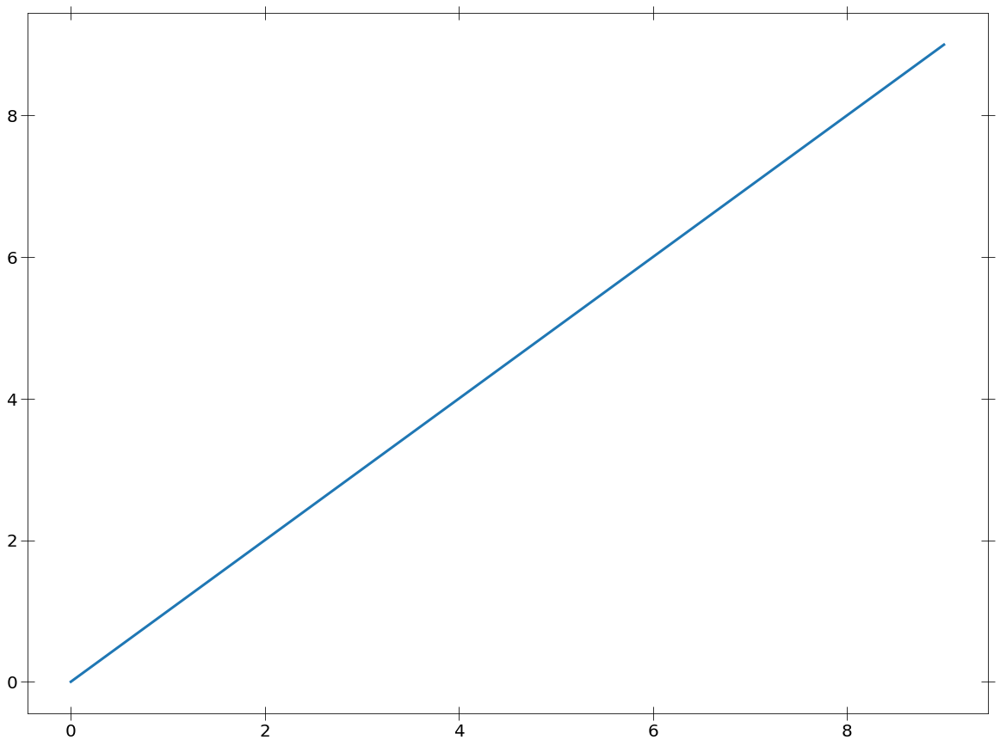

In [81]:
set_plotparams('notebook')
plt.plot(np.arange(10))

# Loading Data

In [82]:
chandra_response_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_obs_hard07/2CXOJ174334.1-291117/2CXOJ174334.1-291117_combined_src.rmf'
pn_response_path = '/Volumes/Pavan_Work_SSD/Backup/GalacticBulge_Xrayclassify/XMM_responses/PN/epn_bu23_dY9.rmf.gz'
mos_response_path = '/Volumes/Pavan_Work_SSD/Backup/GalacticBulge_Xrayclassify/XMM_responses/MOS_5eV/m1_e10_im_p0_c.rmf'
chandra_sim_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_simspecs/'
chandra_sim_cvs = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_twice_ew_chandra/sim_ips_highnh_twice_ew_chandra/'
xmm_sim_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_pn_mos_simspecs_1/'
xmm_sim_cvs = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_xu2016_twice_ew/'
xmm_sim_cvs2 = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_craig/'
xmm_sim_path2 = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_pn_mos_simspecs_2/'
chandra_sim_cvs2 = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_craig_chandra/'
chandra_obs_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_obs_hard07/'
xmm_obs_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_combined_goodobs2/'

1:80: E501 line too long (159 > 79 characters)
2:80: E501 line too long (115 > 79 characters)
3:80: E501 line too long (120 > 79 characters)
4:80: E501 line too long (94 > 79 characters)
5:80: E501 line too long (140 > 79 characters)
6:80: E501 line too long (95 > 79 characters)
7:80: E501 line too long (103 > 79 characters)
8:80: E501 line too long (94 > 79 characters)
9:80: E501 line too long (96 > 79 characters)
10:80: E501 line too long (106 > 79 characters)
11:80: E501 line too long (96 > 79 characters)


## MSP simulations vs. observed sources

# PN files init: 638
# MOS files init: 322
244
716


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:532: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:533: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:619: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:620: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:623: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:623: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:625: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ip

12.0


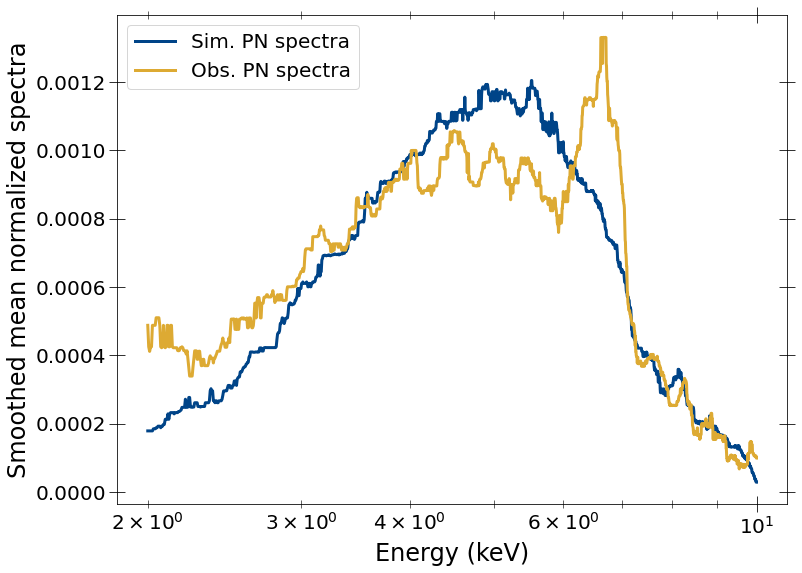

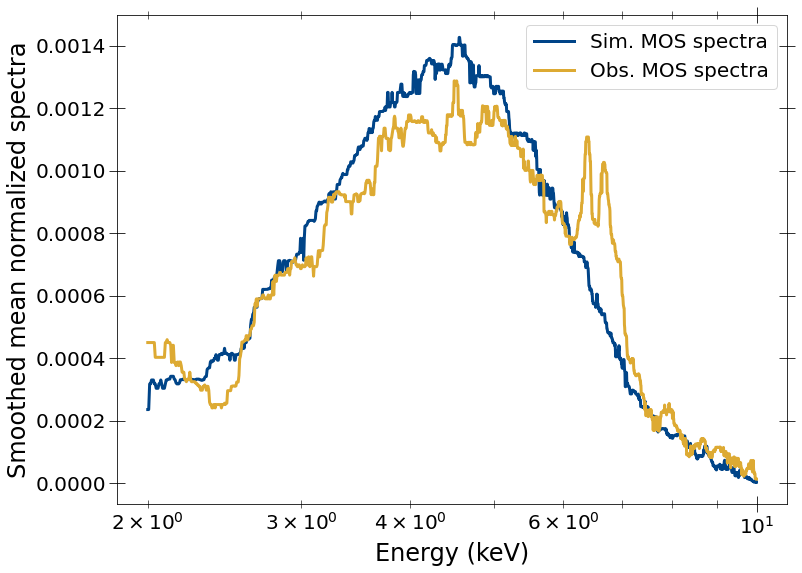

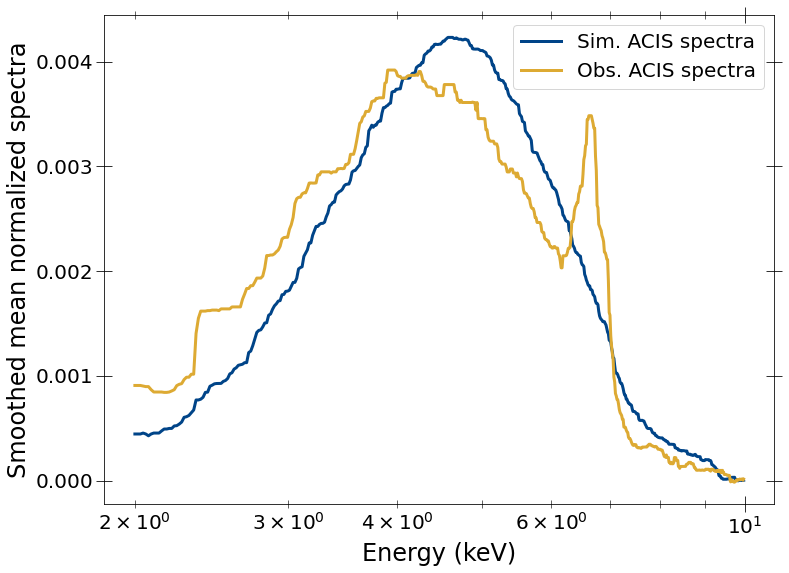

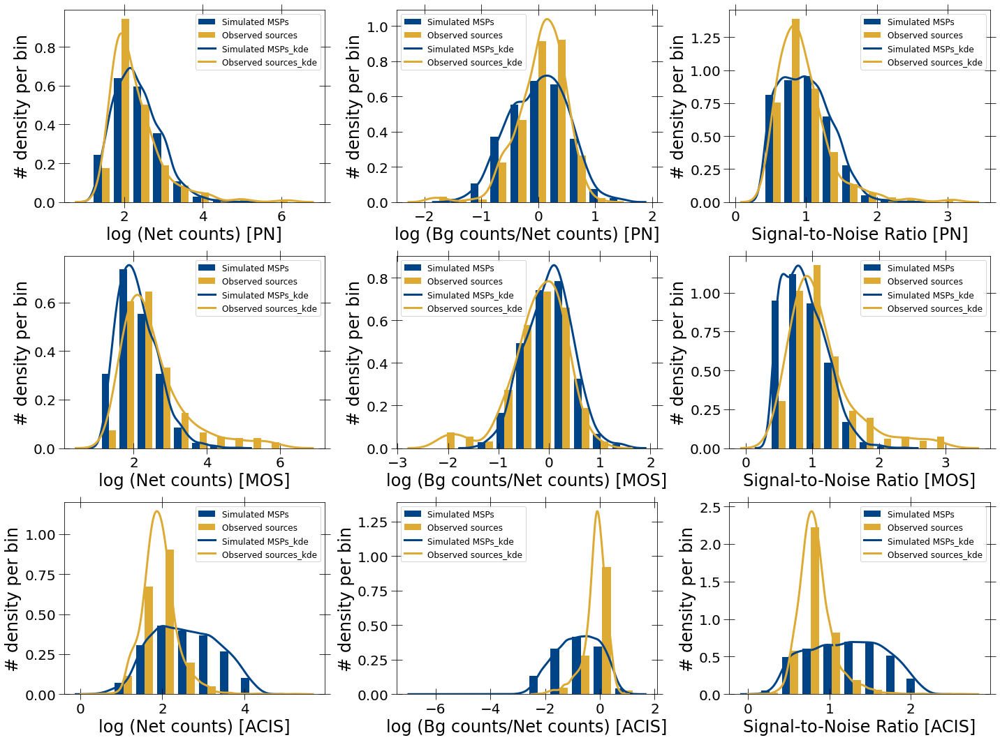

In [93]:
spec_summary_msps = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_path, xmm_sim_path, chandra_sim_path],
     [xmm_obs_path, xmm_obs_path, chandra_obs_path], en_range=[2, 10])

In [8]:
len(spec_summary_msps['specs'][0][2])

10000

## MSP vs. IP simulations

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:530: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:531: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:617: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:618: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:621: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:621: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:623: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ip

7.0


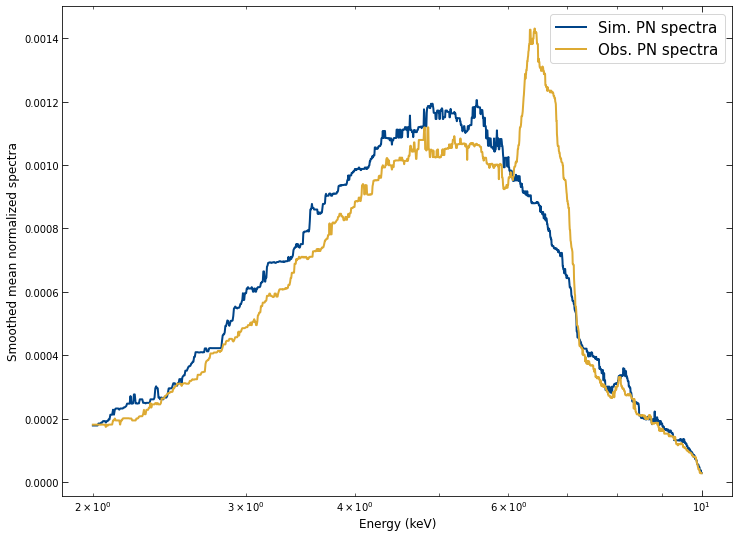

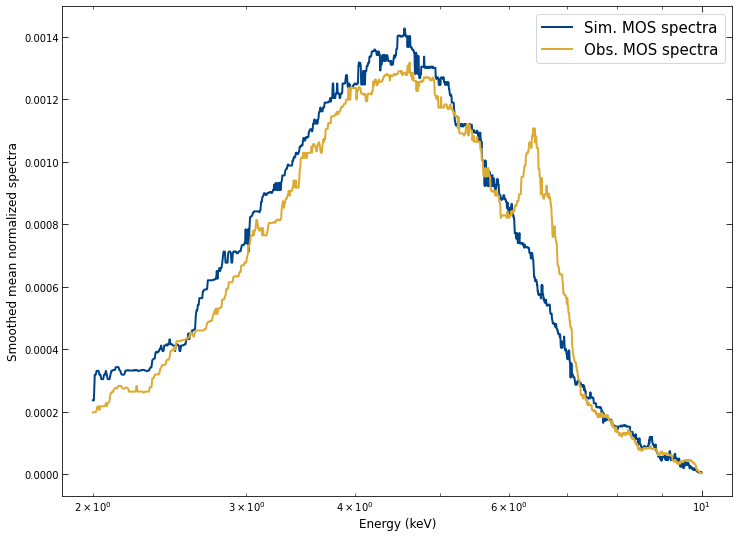

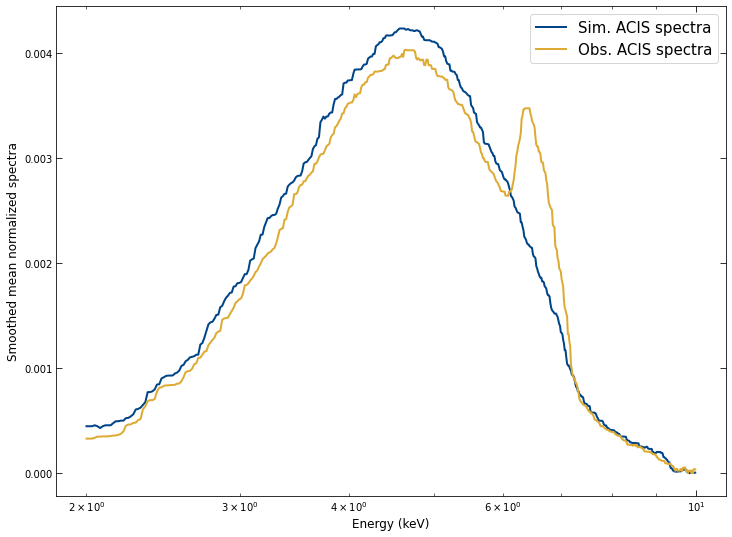

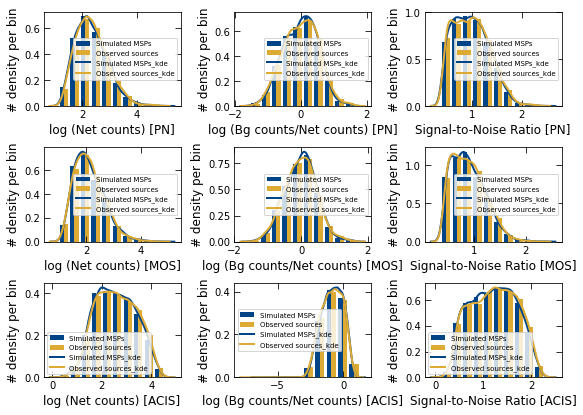

In [367]:
spec_summary_msp_cvs = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_path, xmm_sim_path, chandra_sim_path],
     [xmm_sim_cvs, xmm_sim_cvs, chandra_sim_cvs], en_range=[2, 10],
     both_sims=True)

## IP simulations vs observed sources

# PN files init: 853
# PN files init: 853


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:530: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:531: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:617: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:618: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:621: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:621: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:623: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ip

6.0


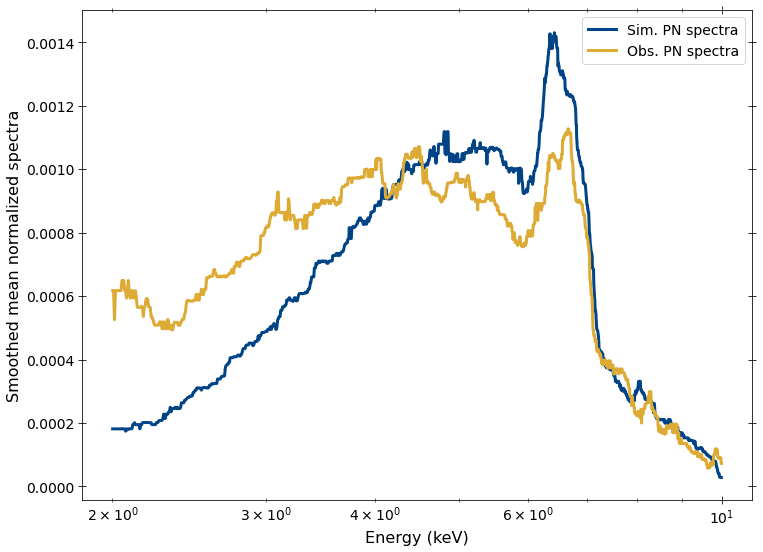

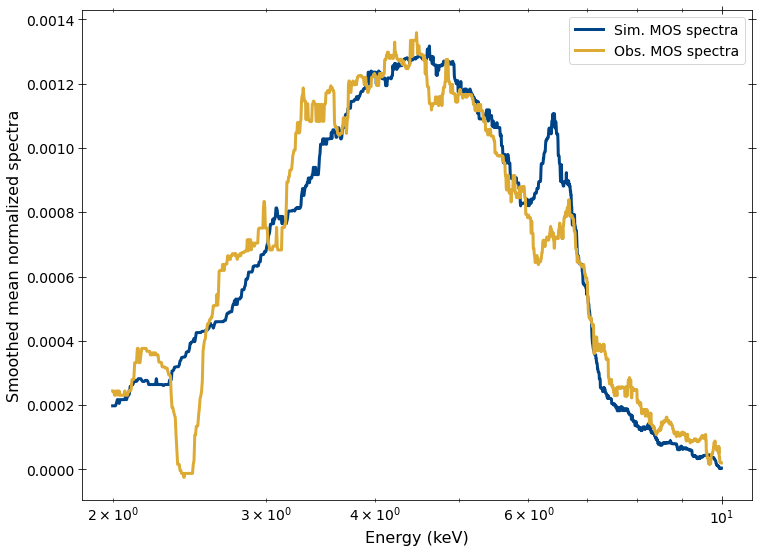

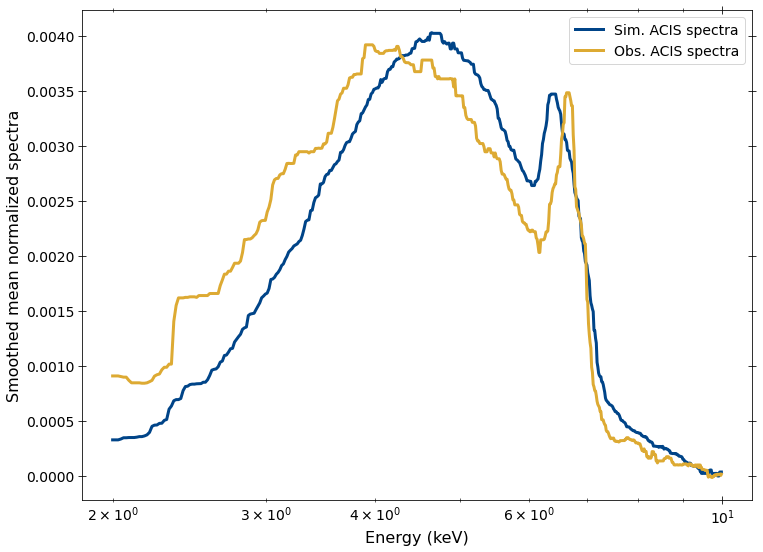

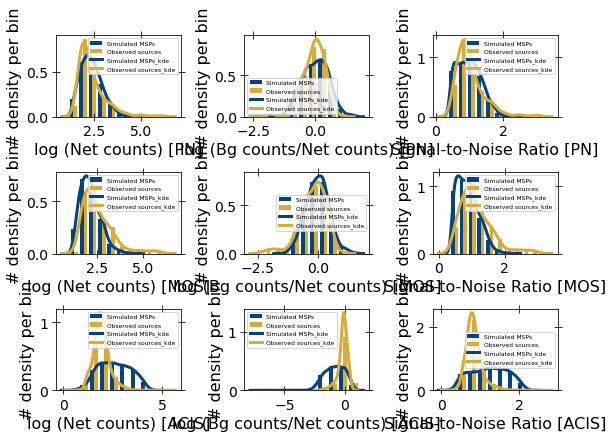

In [593]:
spec_summary_cvs = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_cvs, xmm_sim_cvs, chandra_sim_cvs],
     [xmm_obs_path, xmm_obs_path, chandra_obs_path], en_range=[2, 10],
     both_sims=False, sim_basename='ip_')

# Comparing colors

## Simulated MSPs vs observed_sources

In [231]:
len(obs_color_dict_arr[0]['colors'])

741

In [311]:
len(delta_cstat1)

178

2772 2772 2772 2772
741 741 741 741
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
1937 1937 1937 1937
445 445 445 445


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:704: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:704: RuntimeWarning: divide by zero encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
7873 7873 7873 7873
2670 2670 2670 2670
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:704: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:704: RuntimeWarning: invalid value encountered in true_divide


16.0


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:323: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


16.0
16.0


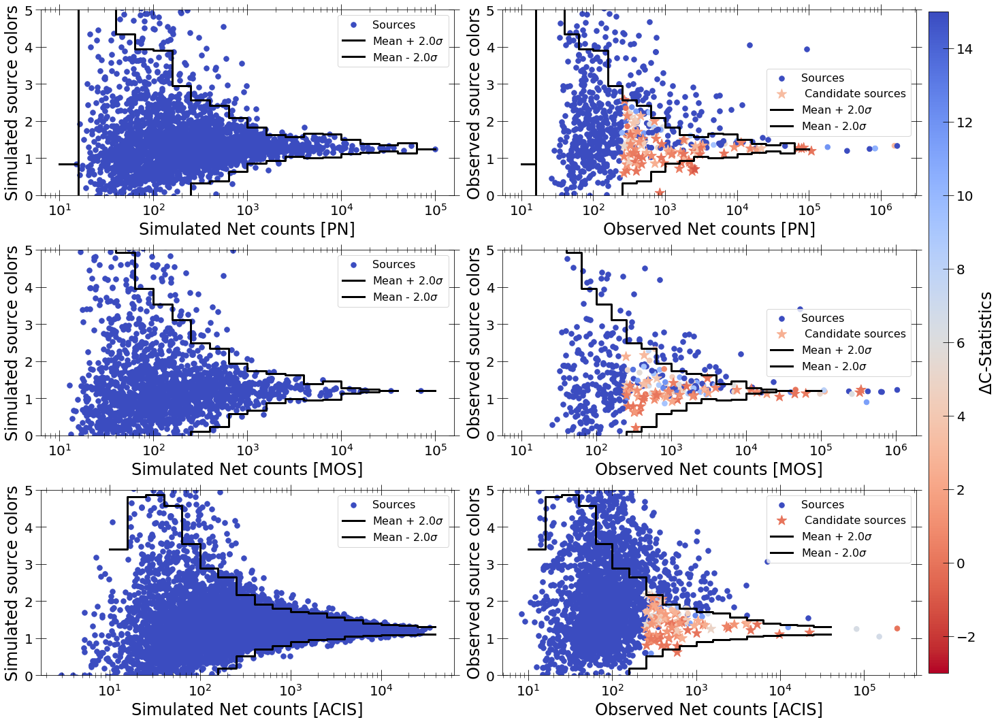

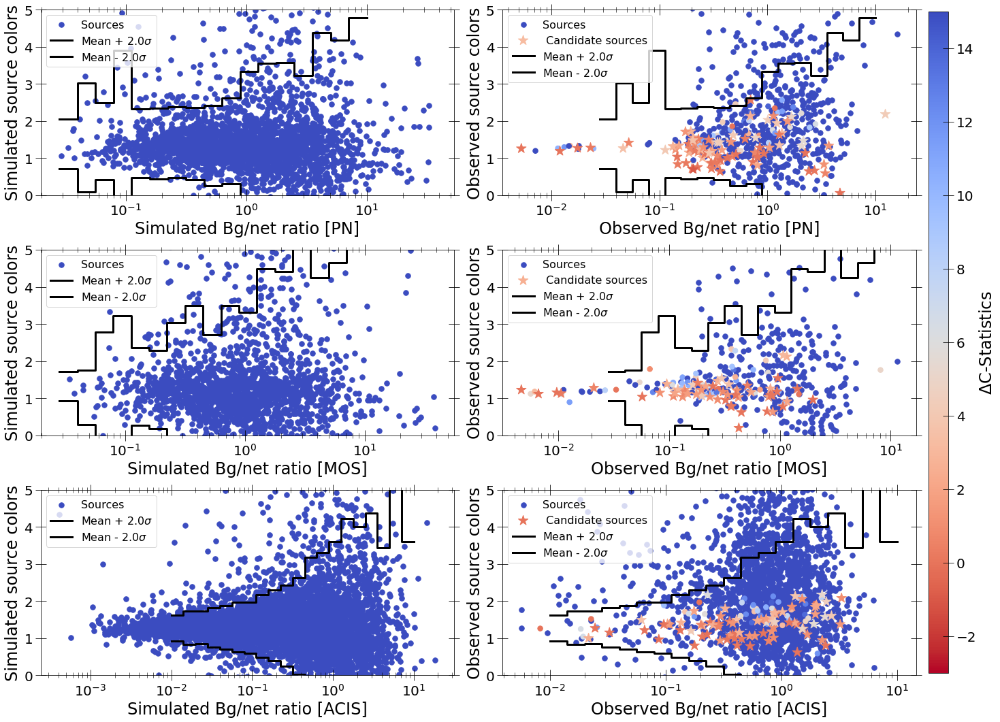

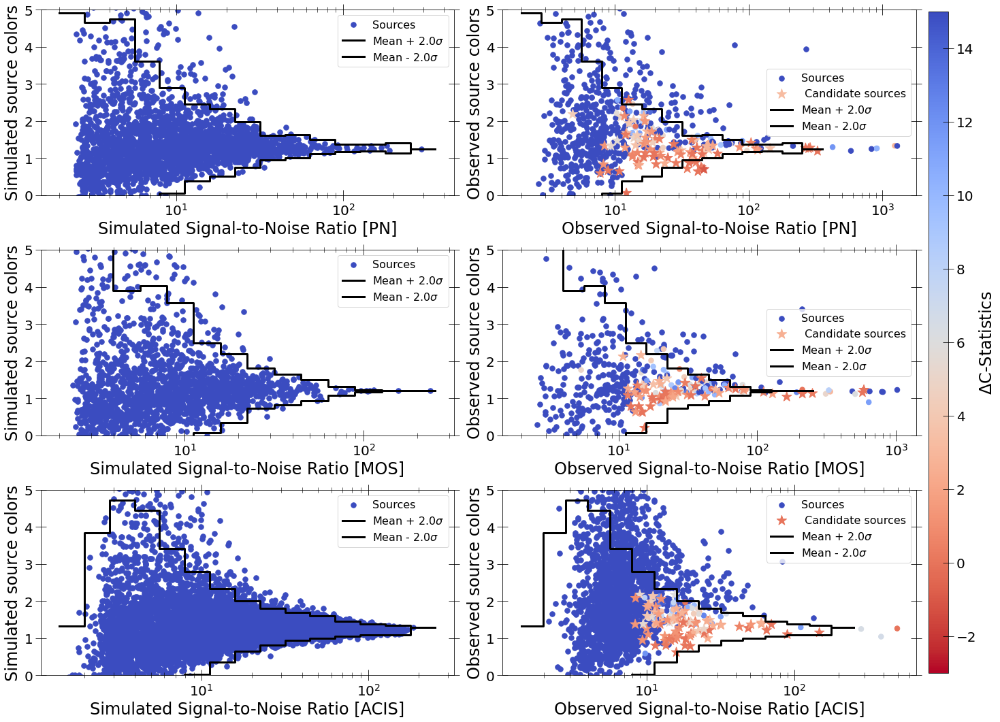

In [335]:
delta_cstat1 = (np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
                np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float))
delta_cstat2 = (np.array(mos_fit_stats_table_pl)[:, 1].astype(float) -
                np.array(mos_fit_stats_table_pl_g2)[:, 1].astype(float))
delta_cstat3 = (np.array(acis_fit_stats_table_pl)[:, 1].astype(float) -
                np.array(acis_fit_stats_table_pl_g2)[:, 1].astype(float))
sim_msps_color_dict_arr, obs_color_dict_arr = getcolor_prop_alldet(
    spec_summary_msps, compare_det=True, int_args=interested_msp_args_alldet,
    delta_cstat=[delta_cstat1, delta_cstat2, delta_cstat3],
    candidate_args=[candidadate_msps_pn_args,
                    candidadate_msps_mos_args,
                    candidadate_msps_acis_args])

2772 2772 2772 2772
546 546 546 546
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:711: RuntimeWarning: divide by zero encountered in true_divide


1937 1937 1937 1937
250 250 250 250
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:711: RuntimeWarning: divide by zero encountered in true_divide


7873 7873 7873 7873
2670 2670 2670 2670
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:711: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:711: RuntimeWarning: invalid value encountered in true_divide


16.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:328: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


16.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
16.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0


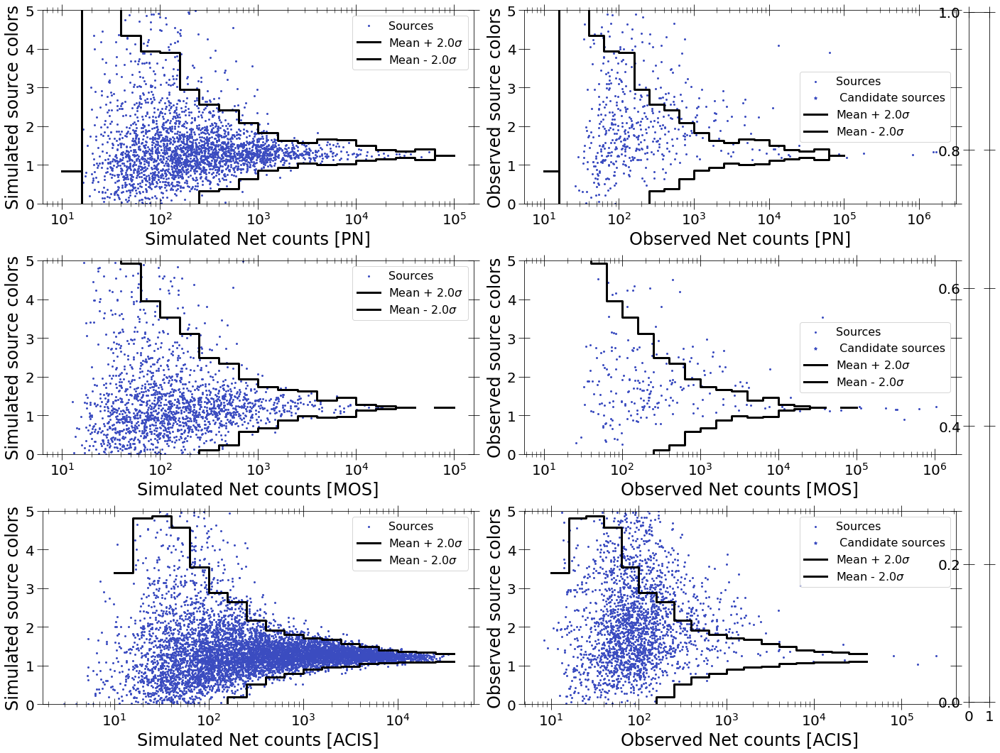

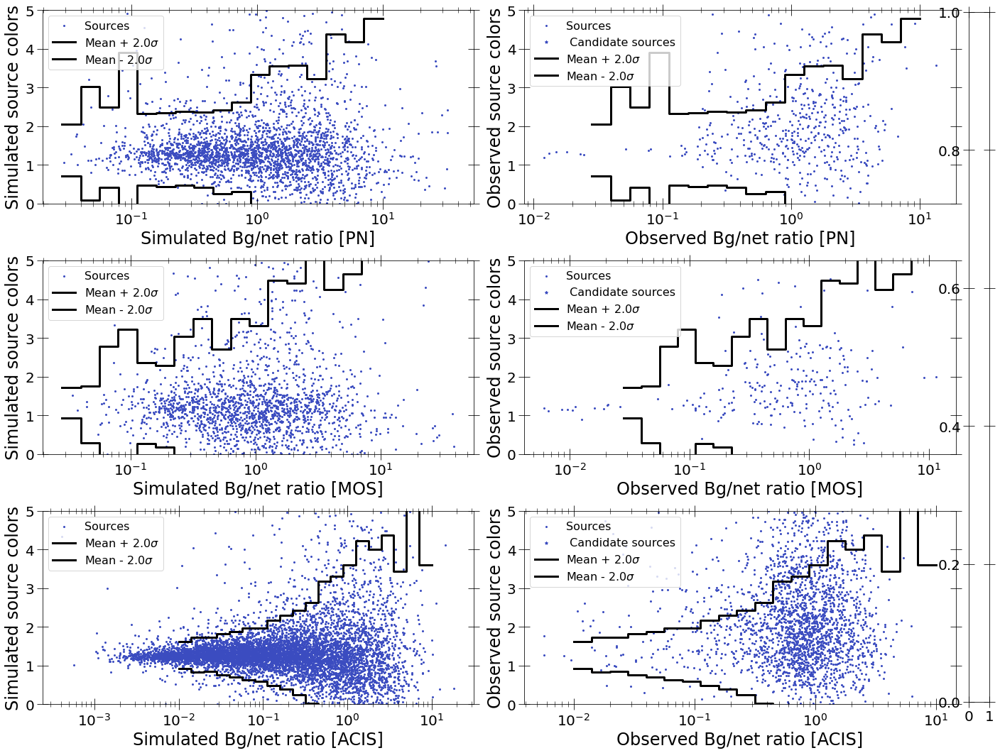

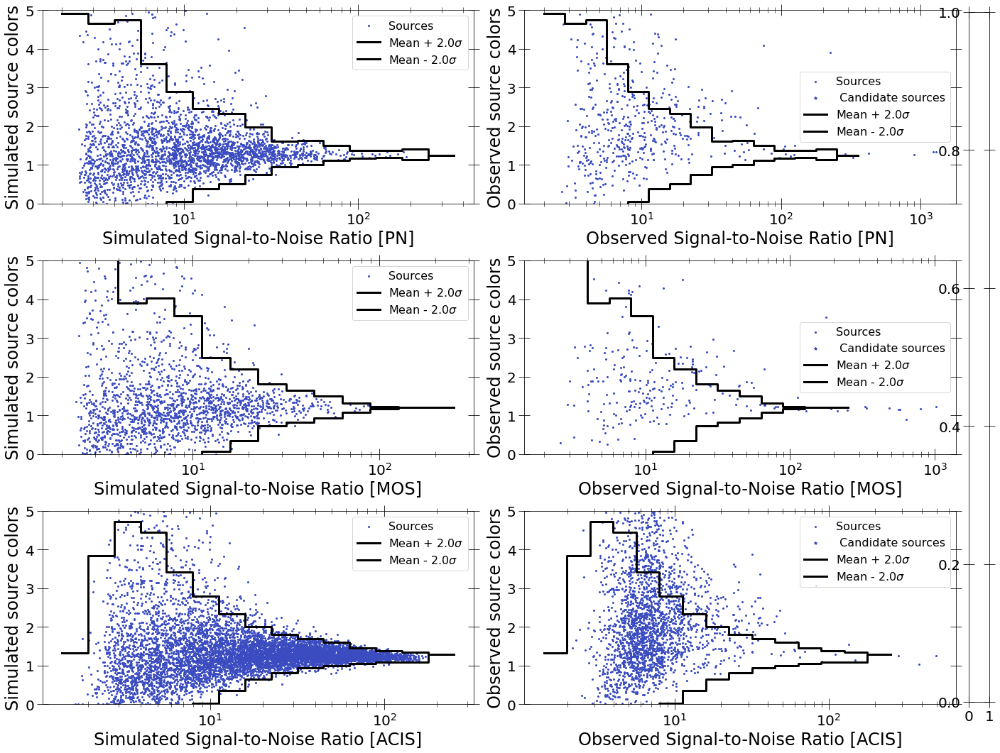

In [94]:
sim_msps_color_dict_arr, obs_color_dict_arr = getcolor_prop_alldet(
    spec_summary_msps, compare_det=True)

6

## Simulated MSPs vs. CVs

2772 2772 2772 2772
4419 4419 4419 4419


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:709: RuntimeWarning: divide by zero encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
1937 1937 1937 1937
3625 3625 3625 3625
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:709: RuntimeWarning: divide by zero encountered in true_divide


7873 7873 7873 7873
8132 8132 8132 8132


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:709: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:709: RuntimeWarning: invalid value encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
11.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:328: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


11.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
11.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0


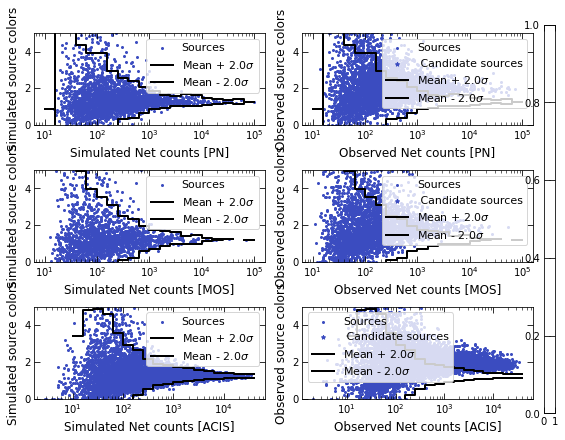

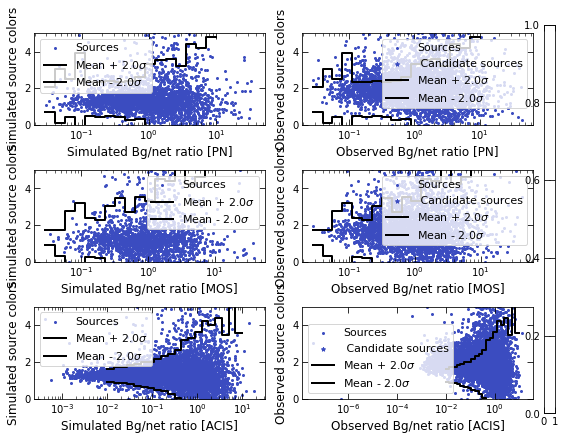

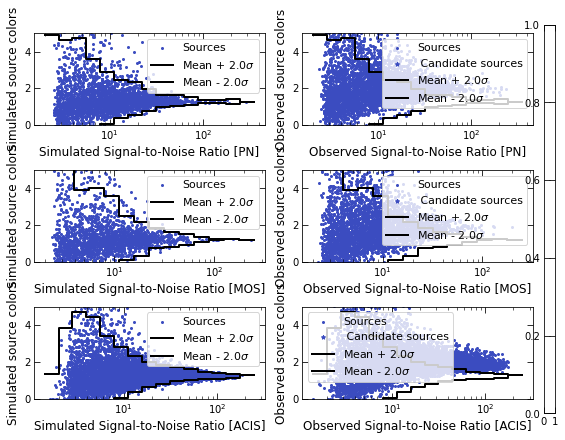

In [374]:
sim_msps2_color_dict_arr, sim_ips_color_dict_arr = getcolor_prop_alldet(
    spec_summary_msp_cvs, compare_det=True)

## Simulated CVs vs observed sources

In [373]:
test = getcolor_prop_alldet(spec_summary_cvs, compare_det=False)

NameError: name 'spec_summary_cvs' is not defined

# MSP analysis

## Getting sources consistent with MSP colors

In [95]:
def get_candidate_src_nums_det(obs_src_nums, obs_det_mask, sim_color_dict,
                               obs_color_dict, min_counts, min_counts2=None):
    """Get src nums of quiescent sources for given detector"""
    #print(min_counts2)
    obs_netcounts = obs_color_dict['prop_list'][0]
    netcount_bins = sim_color_dict['prop_bins'][0]
    obs_colors = obs_color_dict['colors']
    color_median = sim_color_dict['color_stat'][0][0]
    color_std = sim_color_dict['color_stat'][2][0]
    print(netcount_bins)
    print(color_median)
    print(color_std)
    interested_args = None
    for i, lower_bin in enumerate(netcount_bins):
        if lower_bin < min_counts:
            continue
        if i == len(netcount_bins) - 1:
            upper_bin = np.max(obs_netcounts) + 10
            if not np.isnan(color_median[-1]):
                median_color = color_median[-1]
            if not np.isnan(color_std[-1]):
                std_color = color_std[-1]
            std_color = max(std_color, 0.05)
        else:
            upper_bin = netcount_bins[i+1]
            if not np.isnan(color_median[i]):
                median_color = color_median[i]
            if not np.isnan(color_std[i]):
                std_color = color_std[i]
            std_color = max(std_color, 0.05)
        if min_counts2 is not None:
            if lower_bin < min_counts2 and min_counts2 < upper_bin:
                if ((min_counts2 - lower_bin) > (upper_bin - min_counts2)):
                    lower_bin = min_counts2
                    median_color = color_median[i+1]
                    std_color = color_std[i+1]
                else:
                    lower_bin = min_counts2
        #print(min_counts2)
        print(lower_bin, median_color, std_color)
        if (np.isnan(median_color) or np.isnan(std_color) or std_color==0):
            print('HELLO')
            int_args = np.where(np.logical_and(
                obs_netcounts >= lower_bin, obs_netcounts < upper_bin))
        else:
        
            int_args = np.where(np.logical_and(
                np.logical_and(obs_netcounts >= lower_bin,
                               obs_netcounts < upper_bin),
                obs_colors < median_color + 2*std_color))[0]
        '''
        int_args = np.where(np.logical_and(
                np.logical_and(obs_netcounts >= lower_bin,
                               obs_netcounts < upper_bin),
                obs_colors < median_color + 2*std_color))[0]
        '''
        print(len(int_args))
        if interested_args is None:
            interested_args = int_args.copy()
        else:
            interested_args = np.append(interested_args.copy(), int_args)
    return interested_args, obs_src_nums[obs_det_mask][interested_args]


def get_candidate_src_nums_alldet(spec_summary, sim_color_dict_arr,
                                  obs_color_dict_arr, min_count_arr=None,
                                  min_counts2=None):
    """Get source nums for all detectors."""
    interested_args_alldet = []
    interested_sources_alldet = []
    if min_count_arr is None:
        min_count_arr = [700, 700, 250]
    for i, obs_color_dict in enumerate(obs_color_dict_arr):
        if i > 0:
            interested_args, interested_srcs = get_candidate_src_nums_det(
                spec_summary['src_nums'][i-1], spec_summary['spec_masks'][1][i],
                sim_color_dict_arr[i], obs_color_dict, min_count_arr[i],
                min_counts2)
        else:
            interested_args, interested_srcs = get_candidate_src_nums_det(
                spec_summary['src_nums'][i], spec_summary['spec_masks'][1][i],
                sim_color_dict_arr[i], obs_color_dict, min_count_arr[i],
                min_counts2)
        interested_args_alldet.append(interested_args)
        interested_sources_alldet.append(interested_srcs)
    return interested_args_alldet, interested_sources_alldet


4:5: E265 block comment should start with '# '
39:9: E265 block comment should start with '# '
41:71: E225 missing whitespace around operator
46:1: W293 blank line contains whitespace
76:80: E501 line too long (80 > 79 characters)


In [130]:
(interested_msp_args_alldet,
 interested_msp_srcs_alldet) = get_candidate_src_nums_alldet(
    spec_summary_msps, sim_msps_color_dict_arr, obs_color_dict_arr,
    min_count_arr=[150, 150, 150], min_counts2=250)

[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[0.8405164  2.03621255 1.63305682 1.56743663 1.5736705  1.66320801
 1.4331601  1.44713313 1.39609846 1.36984926 1.35086023 1.27893642
 1.31590127 1.33564778 1.334838   1.30071855 1.27144028 1.27383281
 1.26917868 1.24506393]
[0.         2.58517276 1.72972337 1.38681819 1.18129716 1.11575665
 0.75540094 0.56022382 0.51077116 0.36126324 0.24291962 0.17375792
 0.13254254 0.16428213 0.15864827 0.09633923 0.05725364 0.0421451
 0.0654287  0.        ]
250 1.4471331268500243 0.5602238243386048
0
251.18864315095823 1.4471331268500243 0.5602238243386048
32
398.1071705534973 1.396098460383752 0.5107711552472425
21
630.957344480193 1.3698492577015142 0.36126323889561407
13
1000.0 1

In [131]:
print('Interested PN sources: ', len(interested_msp_srcs_alldet[0]))
print('Interested MOS sources: ', len(interested_msp_srcs_alldet[1]))
print('Interested ACIS sources: ', len(interested_msp_srcs_alldet[2]))

Interested PN sources:  95
Interested MOS sources:  63
Interested ACIS sources:  130


In [33]:
def mark_interested_srcs(sim_color_dict, obs_color_dict, src_nums, obs_mask,
                         interested_srcs, prop_num=0):
    props = obs_color_dict['prop_list'][prop_num]
    colors = obs_color_dict['colors']
    interested_args = np.where(np.isin(src_nums[obs_mask], interested_srcs))
    print(len(interested_args[0]), len(interested_srcs))
    # print(len(np.unique(interested_srcs)))
    # print(interested_args)
    # print(src_nums[obs_mask][interested_args])
    # print(props[interested_args])
    # print(colors[interested_args])
    prop_bins = sim_color_dict['prop_bins'][prop_num]
    mean_color = sim_color_dict['color_stat'][0][prop_num]
    std_color = sim_color_dict['color_stat'][2][prop_num]
    print(props[interested_args])
    print(colors[interested_args])
    plotline_scatter([props, props[interested_args], prop_bins, prop_bins],
                     [colors, colors[interested_args], mean_color + 2*std_color,
                      mean_color - 2*std_color],
                     pl_types=['scatter', 'scatter', 'step', 'step'],
                     xlabel='Net counts', ylabel='Colors',
                     pl_labels=['Observed ACIS sources',
                                'Hailey et al. (2018) sources',
                                r'Mean + 2$\sigma$', r'Mean - 2$\sigma$'],
                     colors=['#004488', '#ddaa33', '#000000', '#000000'],
                     styles=['.', '*', '--', '--'],
                     ylim=(0, 5), highlight=True)
    return (colors[interested_args], props[interested_args])

18:80: E501 line too long (80 > 79 characters)


In [420]:
delta_cstat = np.array(pn_fit_stats_table_pl)[:, 1].astype(float) - np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float)

In [33]:
interested_msp_srcs_alldet[0][174]

'205056701010004'

In [67]:
from matplotlib.colors import Normalize

In [68]:
interested_msp_xm

array(['200305401010008', '200305401010017', '200305401015015',
       '201113501010117', '201113501010148', '201129702010029',
       '201129704010023', '201129704010026', '201129704010031',
       '201129704010049', '201129704010056', '201129707010033',
       '201129708010014', '201129712010002', '201129719010007',
       '201129721010136', '201529201015014', '202039301010054',
       '202039301010071', '204003401010008', '204003401010013',
       '205049406010031', '205100104010002', '205110002015026',
       '205110012010036', '205110012015035', '206946401010003',
       '206946404010062', '206946404010202', '206946409010022',
       '206946410010178', '206946416010014', '207242102010114',
       '208016803010003', '208024101010012', '208251401010016',
       '208441011010009', '208441011010032', '208441011010036',
       '208441011010211', '208624701010022', '208860108010001',
       '208860204010001', '208860207010007', '208938111010034',
       '201113501015161', '2011297010100

In [254]:
spec_summary_msps['counts'][0][0][1][spec_summary_msps['spec_masks'][1][0]][interested_msp_args_alldet[0]]

array([3.51929452e+02, 2.85294758e+02, 2.89900690e+02, 3.28559219e+02,
       3.11964577e+02, 3.25306748e+02, 3.44820290e+02, 2.57981436e+02,
       2.67528644e+02, 2.68595336e+02, 2.94651765e+02, 3.40981312e+02,
       2.84365253e+02, 3.19667720e+02, 2.77346210e+02, 3.28184955e+02,
       3.77918079e+02, 3.41211238e+02, 3.81976687e+02, 2.92579328e+02,
       2.92735265e+02, 2.51352123e+02, 3.87265165e+02, 2.75203084e+02,
       3.47382202e+02, 3.63066904e+02, 3.31093640e+02, 3.63586896e+02,
       2.96801156e+02, 3.14961326e+02, 3.30170412e+02, 2.71873909e+02,
       3.27073676e+02, 3.83059949e+02, 3.16385603e+02, 2.84663999e+02,
       3.59522758e+02, 2.97865164e+02, 3.93890922e+02, 3.13971935e+02,
       2.68533579e+02, 3.30838478e+02, 2.98679980e+02, 3.95459403e+02,
       3.82664952e+02, 4.55196441e+02, 5.96645536e+02, 4.85332639e+02,
       4.08206137e+02, 5.56503317e+02, 4.16713717e+02, 5.68590748e+02,
       4.40901747e+02, 4.88542554e+02, 4.05197362e+02, 5.13713407e+02,
      

In [266]:
interested_msp_

array(['200305401010008', '200305401010017', '200305401015015',
       '201113501010117', '201113501010148', '201129702010029',
       '201129704010023', '201129704010026', '201129704010031',
       '201129704010049', '201129704010056', '201129707010033',
       '201129708010014', '201129712010002', '201129719010007',
       '201129721010136', '201529201015014', '202039301010054',
       '202039301010071', '204003401010008', '204003401010013',
       '205049406010031', '205100104010002', '205110002015026',
       '205110012010036', '205110012015035', '206946401010003',
       '206946404010062', '206946404010202', '206946409010022',
       '206946410010178', '206946416010014', '207242102010114',
       '208016803010003', '208024101010012', '208251401010016',
       '208441011010009', '208441011010032', '208441011010036',
       '208441011010211', '208624701010022', '208860108010001',
       '208860204010001', '208860207010007', '208938111010034',
       '201113501015161', '2011297010100

In [268]:
(np.array(pn_fit_stats_table_pl)[-3, 1].astype(float) -
 np.array(pn_fit_stats_table_pl_g2)[-3, 1].astype(float))

0.00027632400269794744

(0.0, 5.0)

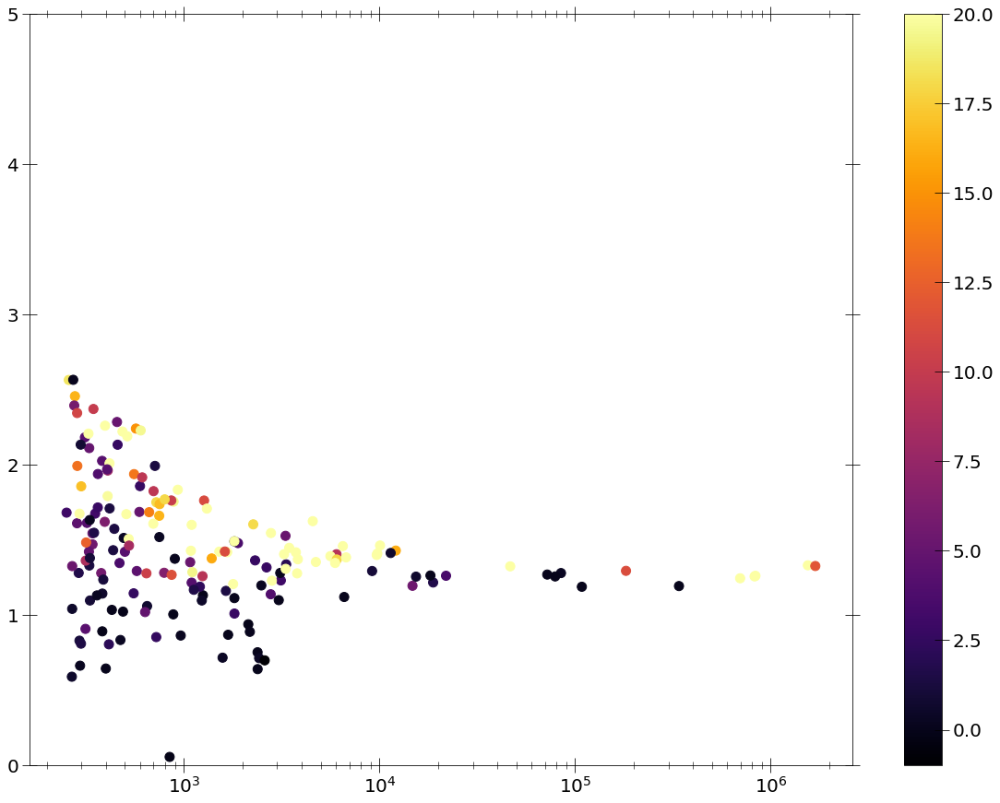

5:13: E131 continuation line unaligned for hanging indent
7:12: E131 continuation line unaligned for hanging indent


In [124]:
plt.scatter(
    spec_summary_msps['counts'][0][0][1][
        spec_summary_msps['spec_masks'][1][0]][interested_msp_args_alldet[0]],
    obs_color_dict_arr[0]['colors'][interested_msp_args_alldet[0]],
            c=(np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
               np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float)),
           cmap='inferno', norm=Normalize(-1, 20, True))
plt.colorbar()
plt.xscale('log')
plt.ylim(0, 5)

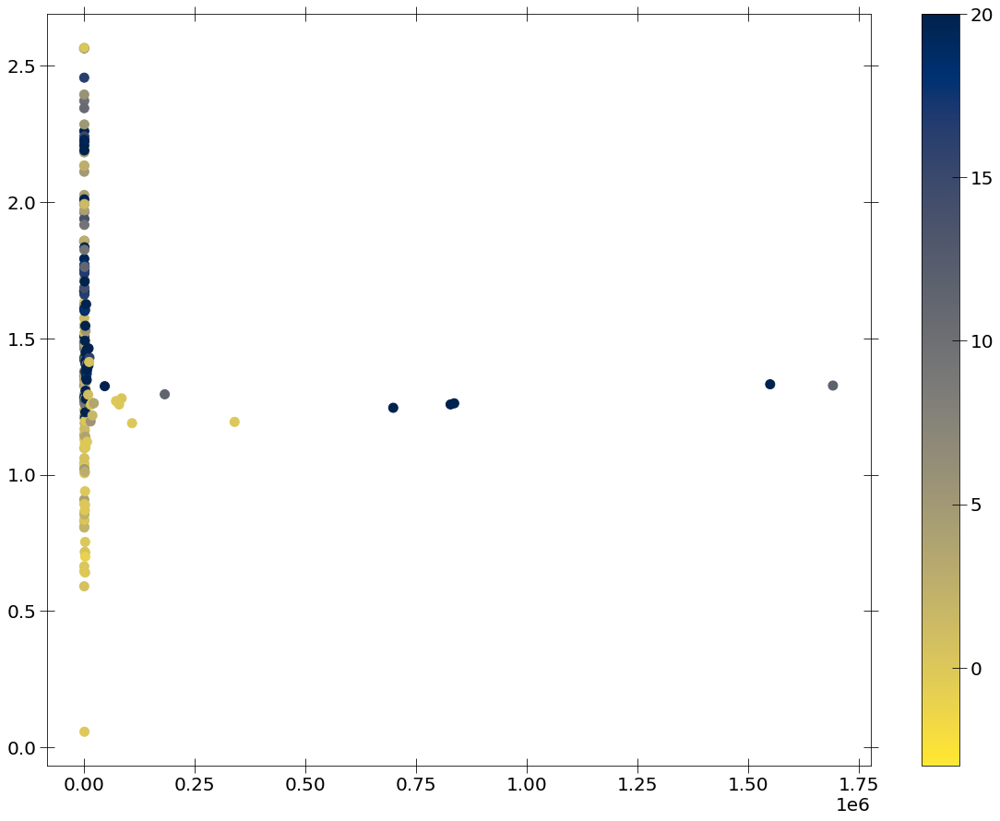

8:17: E128 continuation line under-indented for visual indent
9:17: E128 continuation line under-indented for visual indent


In [255]:
fig, axs = plt.subplots()
xdatas = spec_summary_msps['counts'][0][0][1][spec_summary_msps[
            'spec_masks'][1][0]][interested_msp_args_alldet[0]]
ydatas = obs_color_dict_arr[0]['colors'][interested_msp_args_alldet[0]]
zdatas = (np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
          np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float))
scatter_plot = axs.scatter(xdatas, ydatas, c=zdatas,
                marker='o', label=['Data'], cmap='cividis_r',
                norm=Normalize(-3, 20, True))
plt.colorbar(mappable=scatter_plot, ax=axs)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


16.0


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:322: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:38: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


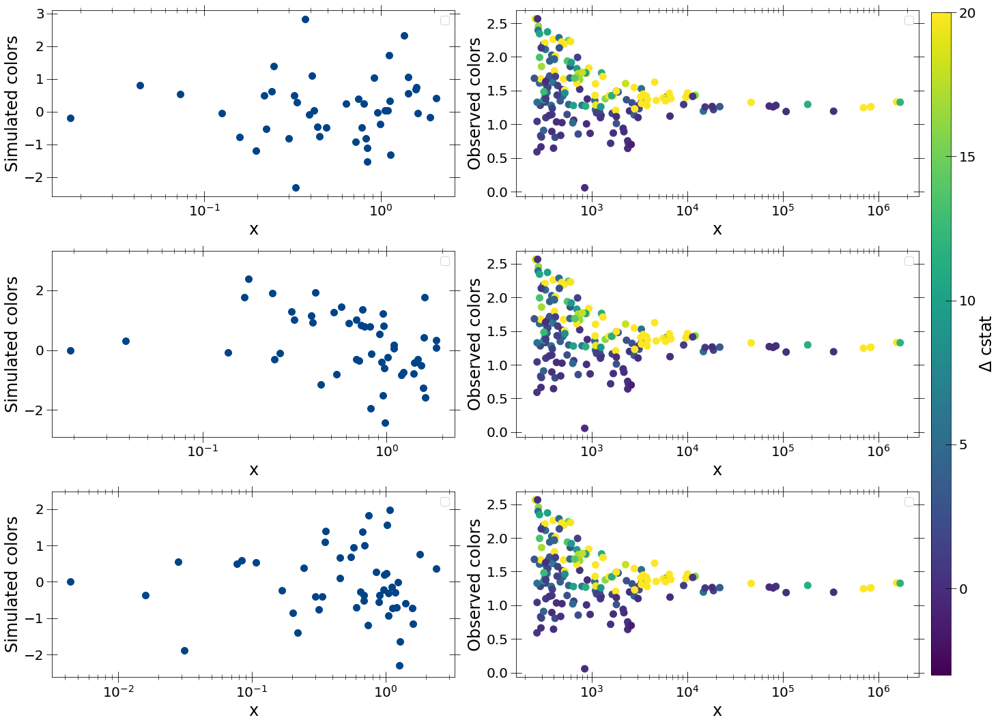

2:9: E231 missing whitespace after ','
26:9: E122 continuation line missing indentation or outdented
27:9: E122 continuation line missing indentation or outdented
29:9: E122 continuation line missing indentation or outdented
30:9: E122 continuation line missing indentation or outdented


In [214]:
plot_subplots(
    3, 2,[[[np.random.normal(size=100)],
           [spec_summary_msps['counts'][0][0][1][spec_summary_msps[
                'spec_masks'][1][0]][interested_msp_args_alldet[0]]]],
          [[np.random.normal(size=100)],
           [spec_summary_msps['counts'][0][0][1][spec_summary_msps[
                'spec_masks'][1][0]][interested_msp_args_alldet[0]]]],
          [[np.random.normal(size=100)],
           [spec_summary_msps['counts'][0][0][1][spec_summary_msps[
                'spec_masks'][1][0]][interested_msp_args_alldet[0]]]]],
    [[[np.random.normal(size=100)],
      [obs_color_dict_arr[0]['colors'][interested_msp_args_alldet[0]]]],
     [[np.random.normal(size=100)],
      [obs_color_dict_arr[0]['colors'][interested_msp_args_alldet[0]]]],
     [[np.random.normal(size=100)],
      [obs_color_dict_arr[0]['colors'][interested_msp_args_alldet[0]]]]],
    subp_types_arr=[['linescatter', 'linescatter'],
                    ['linescatter', 'linescatter'],
                    ['linescatter', 'linescatter']],
    pl_types_arr=[[['scatter'], ['scatter']], [['scatter'], ['scatter']],
                  [['scatter'], ['scatter']]],
    zdatas_arr=[[None, [(
        np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
        np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float))]],
                [None, [(
        np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
        np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float))]],
                [None, [(
        np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
        np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float))]]],
    zdata_labels=[[None, r'$\Delta$ cstat'], [None, r'$\Delta$ cstat'],
                  [None, r'$\Delta$ cstat']], common_cbar=True,
    xlabel_arr=[['x', 'x'], ['x', 'x'], ['x', 'x']],
    ylabel_arr=[['Simulated colors', 'Observed colors'],
                ['Simulated colors', 'Observed colors'],
                ['Simulated colors', 'Observed colors']]
)
plt.tight_layout(rect=[0.0, 0.0, 0.95, 1.0])

In [126]:
def mark_delta_cstat(sim_color_dict, props, colors, prop_num=0,
                     color_param=None):
    # print(len(interested_args[0]), len(interested_srcs))
    # print(len(np.unique(interested_srcs)))
    # print(interested_args)
    # print(src_nums[obs_mask][interested_args])
    # print(props[interested_args])
    # print(colors[interested_args])
    prop_bins = sim_color_dict['prop_bins'][prop_num]
    mean_color = sim_color_dict['color_stat'][0][prop_num]
    std_color = sim_color_dict['color_stat'][2][prop_num]
    plotline_scatter([props, prop_bins, prop_bins],
                     [colors, mean_color + 2*std_color,
                      mean_color - 2*std_color],
                     zdatas=[color_param, None, None],
                     pl_types=['scatter', 'step', 'step'],
                     xlabel='Net counts', ylabel='Colors',
                     pl_labels=['Colors',
                                r'Mean + 2$\sigma$', r'Mean + 2$\sigma$'],
                     ylim=(0, 5),
                     zdata_label=r'$\Delta$C-statistics')

In [239]:
np.where(interested_msp_srcs_alldet[0][174]

'201129721010005'

In [339]:
np.where(spec_summary_msps['src_nums'][1] == '2CXOJ17')

2697

In [448]:
set_plotparams('presentation')

1 1
[152123.07704477]
[1.0429432]
4.0
16.0


(array([1.0429432]), array([152123.07704477]))

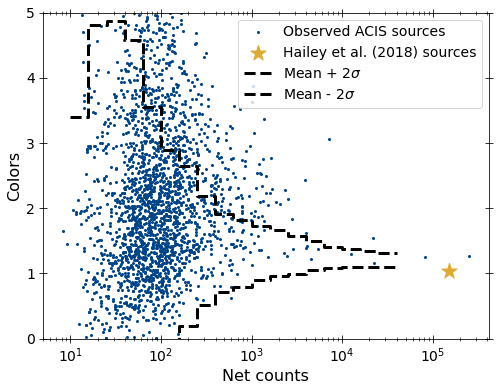

In [668]:
mark_interested_srcs(
    sim_msps_color_dict_arr[2], obs_color_dict_arr[2],
    spec_summary_msps['src_nums'][1], spec_summary_msps['spec_masks'][1][2],
    ['2CXOJ174540.1-290029'])

In [ ]:
xmm_pl_fit_stats_table[:, 0][weird_srcs1]

38 42
[8.27433431e+05 3.25306748e+02 1.54909836e+06 9.30937683e+02
 1.58863119e+03 5.24215041e+02 2.47289002e+03 3.56404949e+02
 1.05083512e+03 4.55965172e+03 2.59580285e+03 1.98101933e+02
 6.98008071e+05 8.35669597e+05 3.82526060e+03 5.08046670e+02
 1.78589661e+03 1.66598236e+03 6.74794931e+03 5.61131847e+03
 4.72983720e+03 1.08634255e+03 6.49716743e+03 1.00667403e+04
 9.68052303e+03 3.31413939e+03 3.25223342e+03 1.51720675e+03
 3.45522010e+03 6.05058663e+03 1.10508604e+03 3.73787906e+03
 3.79266367e+03 5.93338721e+03 1.09611666e+03 2.81807943e+03
 1.81259416e+03 4.66010844e+04]
[1.25816899 2.20772806 1.33206013 1.83450376 1.84562065 3.38796813
 2.22111364 3.0056922  2.23607656 1.62550968 2.04234601 4.39430507
 1.24581514 1.26220922 1.37215936 1.67237243 1.20736846 1.41955054
 1.38468375 1.39302028 1.35421002 1.42889376 1.45959562 1.46371773
 1.40068623 1.30840135 1.40603889 1.42288466 1.44822347 1.370727
 1.28638249 1.41840981 1.27849658 1.34776386 1.6010584  1.2296128
 1.49219828 1.

(array([1.17020014, 5.93675537, 1.22208857, 2.92056194, 2.0155456 ,
        1.85484361, 1.70349927, 1.68774837, 2.32453631, 1.8480306 ,
        1.75956427, 1.76957264, 1.18305523, 1.16507283, 1.91196454,
        1.37794762, 1.39973939, 1.57019436, 1.40288384, 1.2673458 ,
        1.27398871, 1.58870831, 1.78469096, 1.35623192, 1.28816163,
        1.35976955, 1.11021475]),
 array([6.38461849e+05, 6.82667546e+01, 1.05063324e+06, 2.90929209e+02,
        5.15890819e+02, 4.69409693e+02, 6.08050646e+02, 3.79518144e+02,
        6.10406008e+02, 3.89799013e+03, 2.63325148e+02, 3.11323684e+02,
        4.26681773e+05, 6.57727498e+05, 4.43315778e+02, 3.59173456e+03,
        8.55982008e+02, 1.04125962e+03, 1.96869145e+03, 7.88675786e+02,
        4.60635406e+03, 5.37071969e+03, 8.10809761e+02, 4.98708915e+03,
        1.21886573e+04, 6.80034171e+03, 2.60338004e+05]))

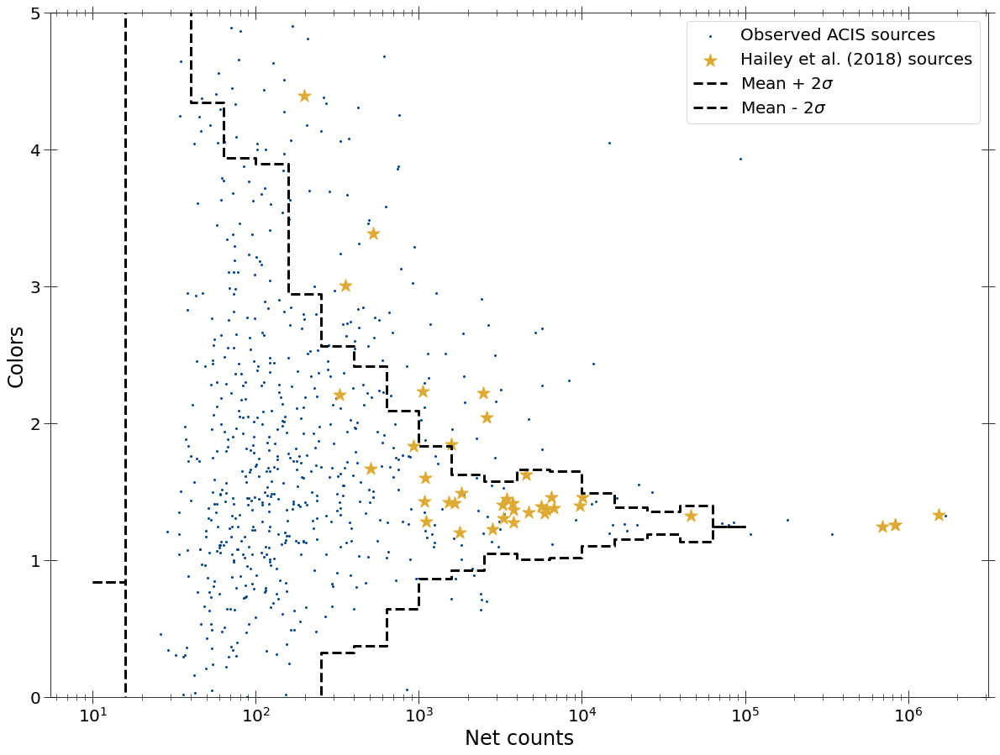

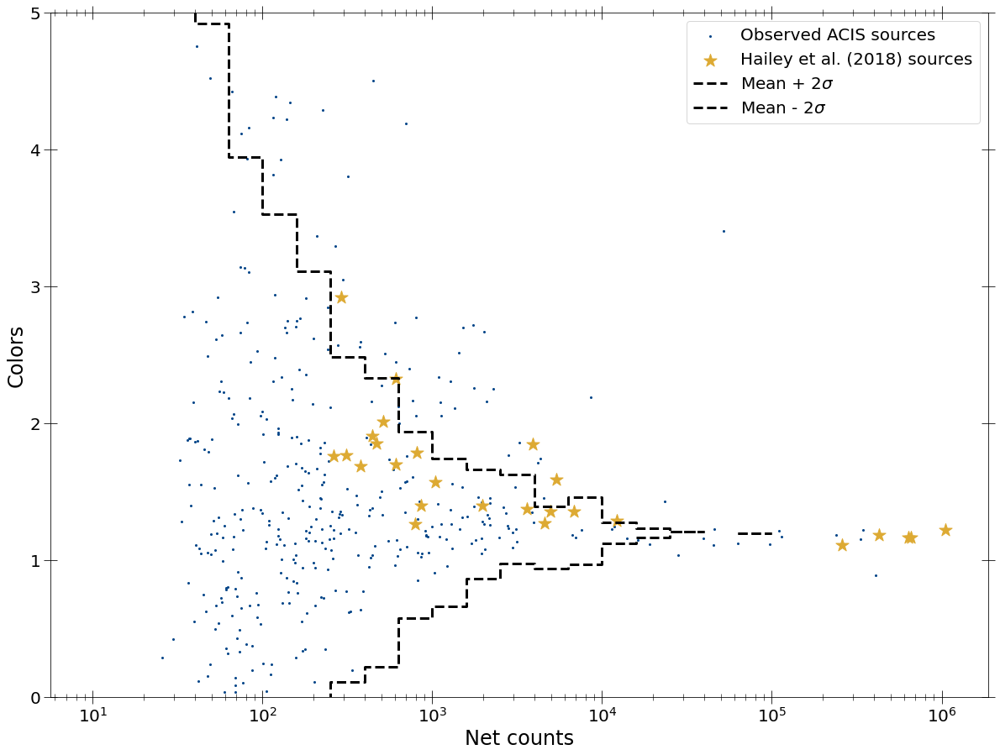

In [149]:
mark_interested_srcs(
    sim_msps_color_dict_arr[0], obs_color_dict_arr[0],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][0],
    xmm_pl_fit_stats_table[:, 0][weird_srcs1])
mark_interested_srcs(
    sim_msps_color_dict_arr[1], obs_color_dict_arr[1],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][1],
    xmm_pl_fit_stats_table[:, 0][weird_srcs1])

5 5
[ 159.66586281  677.92326981 1127.33959596  309.98665049  276.70697482]
[3.73690051 1.42771088 2.3166538  1.41798004 3.0309139 ]
4.0
16.0


(array([3.73690051, 1.42771088, 2.3166538 , 1.41798004, 3.0309139 ]),
 array([ 159.66586281,  677.92326981, 1127.33959596,  309.98665049,
         276.70697482]))

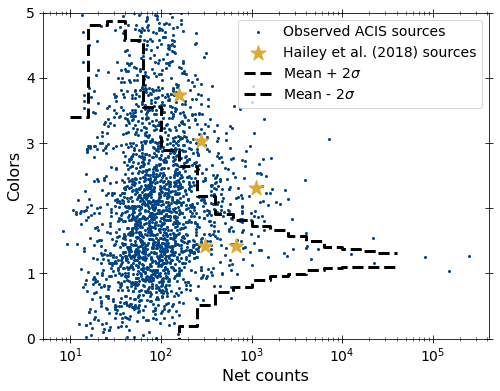

In [453]:
mark_interested_srcs(
    sim_msps_color_dict_arr[2], obs_color_dict_arr[2],
    spec_summary_msps['src_nums'][1], spec_summary_msps['spec_masks'][1][2],
    ['2CXOJ174540.4-290036', '2CXOJ174539.4-290041', '2CXOJ174539.4-290046',
     '2CXOJ174540.3-290049', '2CXOJ174539.2-290049'])

95 95
[3.51929452e+02 2.85294758e+02 2.89900690e+02 1.09565166e+03
 7.49243170e+02 3.12644354e+02 4.55196441e+02 8.27433431e+05
 4.52261804e+02 7.92697065e+02 9.16992095e+03 4.85332639e+02
 3.25306748e+02 4.08206137e+02 1.54909836e+06 9.30937683e+02
 1.30509508e+03 7.50783940e+02 3.44820290e+02 2.57981436e+02
 8.85897224e+02 2.68595336e+02 2.94651765e+02 8.47174487e+04
 5.90666948e+03 1.05790469e+03 1.19903534e+04 7.22966675e+02
 7.48358480e+02 5.56503317e+02 2.65755643e+02 3.51924611e+02
 3.40981312e+02 4.40901747e+02 7.51555764e+02 4.88542554e+02
 1.19954051e+03 2.84365253e+02 4.05197362e+02 1.69089265e+06
 5.13713407e+02 1.31105171e+03 3.19667720e+02 6.01445394e+02
 4.68829381e+02 3.13135268e+03 2.77346210e+02 4.07644559e+02
 3.33391841e+03 1.47485721e+04 5.07611064e+03 7.39442740e+03
 7.81971454e+02 2.83556651e+03 6.12303724e+02 7.11537338e+02
 3.28184955e+02 1.33545956e+04 3.77918079e+02 1.88093804e+04
 3.41211238e+02 3.81976687e+02 3.30856684e+03 1.82196024e+04
 4.13804105e+02 3.

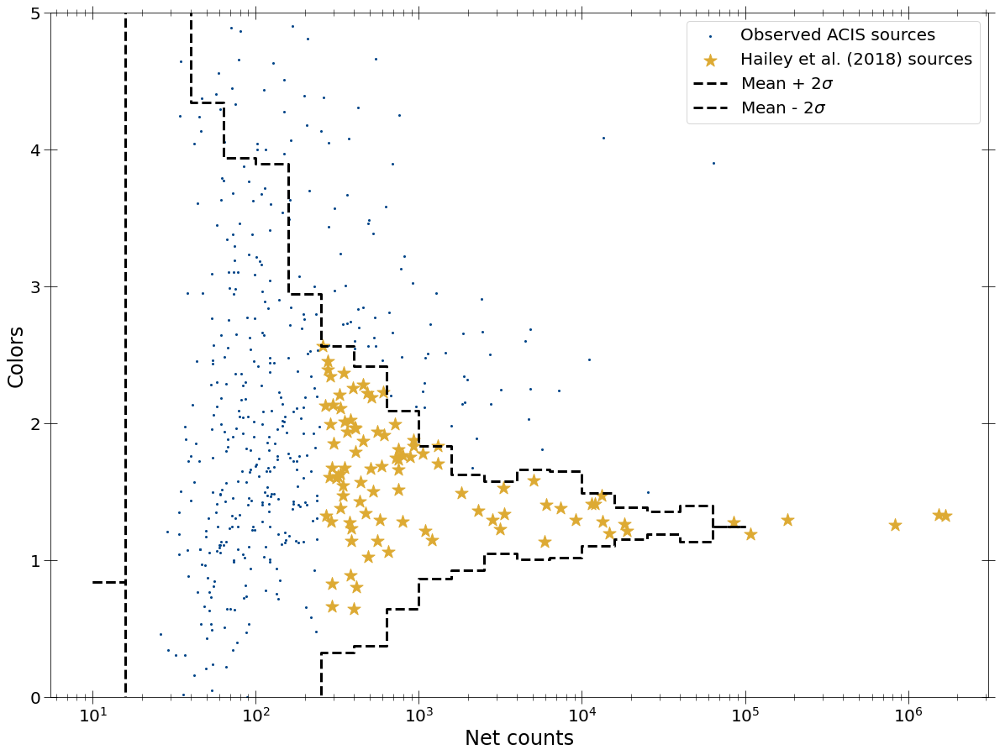

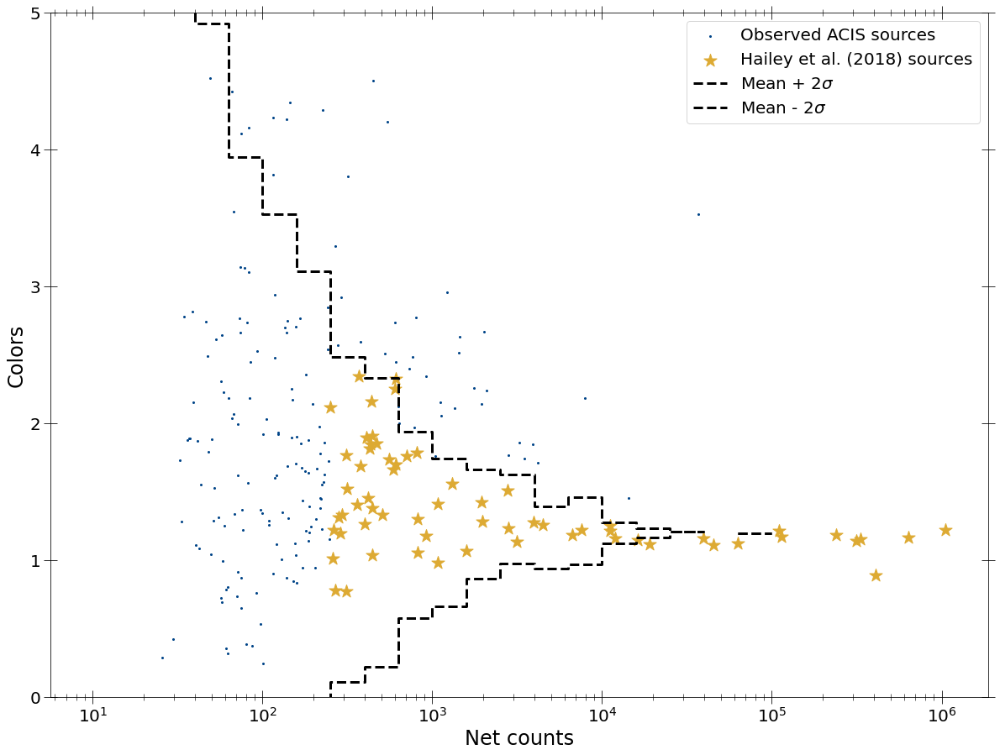

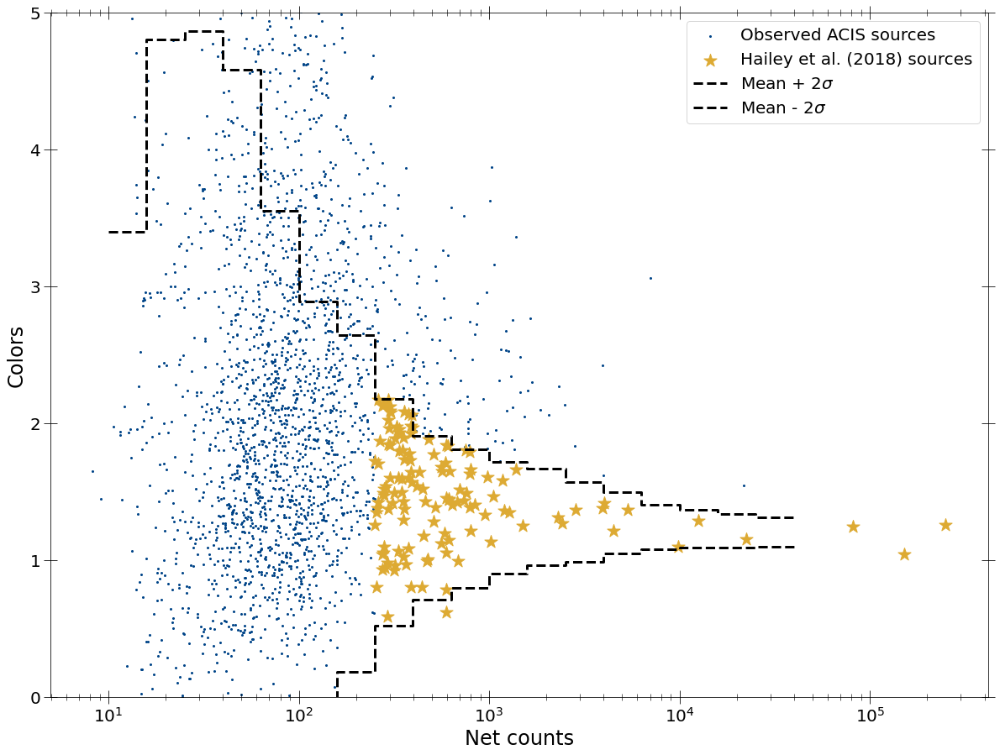

In [98]:
interested_msp_colors_pn, interested_msp_netcounts_pn = mark_interested_srcs(
    sim_msps_color_dict_arr[0], obs_color_dict_arr[0],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][0],
    interested_msp_srcs_alldet[0])
interested_msp_colors_mos, interested_msp_netcounts_mos = mark_interested_srcs(
    sim_msps_color_dict_arr[1], obs_color_dict_arr[1],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][1],
    interested_msp_srcs_alldet[1])
(interested_msp_colors_acis,
 interested_msp_netcounts_acis) = mark_interested_srcs(
    sim_msps_color_dict_arr[2], obs_color_dict_arr[2],
    spec_summary_msps['src_nums'][1], spec_summary_msps['spec_masks'][1][2],
    interested_msp_srcs_alldet[2])

In [142]:
interested_msps_xmm = np.array(
    list(set(interested_msp_srcs_alldet[0]) |
         set(interested_msp_srcs_alldet[1])))

In [151]:
np.sort(interested_msps_xmm)

array(['200305401010008', '200305401010017', '200305401015015',
       '201032613010001', '201032613010002', '201113501010117',
       '201113501015161', '201113503010004', '201129701010015',
       '201129701010027', '201129702010002', '201129702010014',
       '201129702010029', '201129702010049', '201129704010001',
       '201129704010010', '201129704010011', '201129704010012',
       '201129704010019', '201129704010023', '201129704010026',
       '201129704010027', '201129704010040', '201129704010049',
       '201129704010056', '201129705010002', '201129705010011',
       '201129705010014', '201129705010038', '201129705010043',
       '201129706010014', '201129707010002', '201129707010006',
       '201129707010012', '201129707010013', '201129707010014',
       '201129707010015', '201129707010020', '201129707010033',
       '201129707010046', '201129707010048', '201129707010057',
       '201129707010063', '201129708010014', '201129708010018',
       '201129708010036', '2011297090100

In [178]:
arr_to_str(np.array(interested_msps_xmm).astype(str), telescope='XMM')

'201129702010014; 206946401010004; 201032613010001; 202026708010061; 208042503010002; 206946405010002; 201129704010027; 207901804015015; 208860207010007; 207234103010048; 206556701010012; 207234105010051; 201129704010031; 202026707015146; 207234103010029; 205100104010001; 207483912010001; 201129704010056; 201129705010002; 201113501010148; 207234103015058; 201129709010018; 207234103010052; 207901804010036; 202026705010003; 207234103010028; 207234105010047; 201129704010023; 205049406010006; 201129702010029; 201129708010018; 202039301010054; 201129721010133; 204003401010013; 201129707010006; 207234104010053; 208016804010054; 201113501010206; 208024101010012; 207234103010053; 201129708010036; 201129721010009; 201529201010060; 207234104010131; 208624702010008; 201129701010015; 208016813010003; 207901804010045; 205110002015026; 207234104010059; 206586001010073; 201129705010043; 206946404010202; 201129707010012; 206735502010052; 202026707015110; 202026707010240; 207901804010019; 2003054010150

## Spectral analysis to check for lines

In [101]:
xspec.Xset.version

('2.0.4', '12.11.1')

In [102]:
def fit_src_pl(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder +
                                 str(source_num) + '_PN_combined_grp1*')
        spec_mosfile = glob2.glob(src_folder +
                                  str(source_num) + '_MOS_combined_grp1*')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        os.chdir(src_folder + '/' + source_num)
        spec_file = str(source_num) + '_combined_src_grp1.pi'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')

    model = xspec.Model('tbabs*pegpwrlw')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 10, 10]
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.perform()
    xspec.Fit.error('2.706 1')
    xspec.Fit.error('2.706 2')
    xspec.Fit.error('2.706 5')
    xspec.Fit.perform()
    # print('Calculating goodness')
    # goodness = xspec.Fit.goodness(1000)
    # print('Finished calculating goodness')
    goodness = 50.0
    print('Model params for ' + source_num +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0])
    print('Fit stats for ' + source_num + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    if telescope == 'Chandra':
        os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).TBabs.nH.error[0],
             xspec.AllModels(1).TBabs.nH.error[1],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.error[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.error[1],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).pegpwrlw.norm.error[0],
             xspec.AllModels(1).pegpwrlw.norm.error[1]])

52:80: E501 line too long (80 > 79 characters)


In [103]:
def fit_src_pl_gauss(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder +
                                 str(source_num) + '_PN_combined_grp1*')
        spec_mosfile = glob2.glob(src_folder +
                                  str(source_num) + '_MOS_combined_grp1*')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        os.chdir(src_folder + '/' + source_num)
        spec_file = str(source_num) + '_combined_src_grp1.pi'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 10, 10]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.7, 0.0001, 6.1, 6.1, 7.3, 7.3'
    model.gaussian.Sigma.values = '0.1 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 6')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 6')
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    # goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_pos_low = xspec.AllModels(1).gaussian.LineE.error[0]
    line_pos_high = xspec.AllModels(1).gaussian.LineE.error[1]
    line_norm_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm_high = xspec.AllModels(1).gaussian.norm.error[1]
    print('Model params for ' + source_num +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_pos:', xspec.AllModels(1).gaussian.LineE.values[0],
          line_pos_low, line_pos_high,
          ' Fe_norm:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm_low, line_norm_high)
    print('Fit stats for ' + source_num + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.LineE.values[0], line_pos_low,
             line_pos_high,
             xspec.AllModels(1).gaussian.norm.values[0], line_norm_low,
             line_norm_high])


27:1: W293 blank line contains whitespace
36:1: W293 blank line contains whitespace
67:80: E501 line too long (80 > 79 characters)


In [104]:
def fit_src_pl_gauss2(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder +
                                 str(source_num) + '_PN_combined_grp1*')
        spec_mosfile = glob2.glob(src_folder +
                                  str(source_num) + '_MOS_combined_grp1*')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        os.chdir(src_folder + '/' + source_num)
        spec_file = str(source_num) + '_combined_src_grp1.pi'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss+gauss+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.4 0'
    model.gaussian.Sigma.values = '0.0 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_4.LineE.values = '6.7 0'
    model.gaussian_4.Sigma.values = '0.0 0'
    model.gaussian_4.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_5.LineE.values = '7.0 0'
    model.gaussian_5.Sigma.values = '0.0 0'
    model.gaussian_5.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 11')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 14')
    # xspec.Fit.error('2.706 8')
    # goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_norm1_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm1_high = xspec.AllModels(1).gaussian.norm.error[1]
    line_norm2_low = xspec.AllModels(1).gaussian_4.norm.error[0]
    line_norm2_high = xspec.AllModels(1).gaussian_4.norm.error[1]
    line_norm3_low = xspec.AllModels(1).gaussian_5.norm.error[0]
    line_norm3_high = xspec.AllModels(1).gaussian_5.norm.error[1]
    xspec.Fit.perform()
    print('Model params for ' + source_num +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_norms:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm1_low, line_norm1_high,
          xspec.AllModels(1).gaussian_4.norm.values[0], line_norm2_low,
          line_norm2_high, xspec.AllModels(1).gaussian_5.norm.values[0],
          line_norm3_low, line_norm3_high)
    print('Fit stats for ' + source_num + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.norm.values[0],
             xspec.AllModels(1).gaussian_4.norm.values[0],
             xspec.AllModels(1).gaussian_5.norm.values[0], line_norm1_low,
             line_norm1_high, line_norm2_low, line_norm2_high, line_norm3_low,
             line_norm3_high])


27:1: W293 blank line contains whitespace
42:1: W293 blank line contains whitespace
76:80: E501 line too long (80 > 79 characters)


In [107]:
np.where(interested_msp_srcs_alldet[1] == '206946404010062')

(array([], dtype=int64),)

In [108]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_combined_goodobs/')
xspec.AllData.clear()
fit_src_pl(interested_msp_srcs_alldet[1][], src_folder='./')

Model params for 206556701010043: NH =  0.1000000000000056  Gamma:  0.9667793601576897  norm:  0.033337441399740354
Fit stats for 206556701010043:  320.69824010597995 -5.681413246685478 50.0 448




(['206556701010043', 320.69824010597995, -5.681413246685478, 50.0, 448],
 ['206556701010043',
  0.1000000000000056,
  0.0,
  7.704276567472862,
  0.9667793601576897,
  0.37894746045124905,
  3.0429137015272145,
  0.033337441399740354,
  0.02065111760798323,
  0.05440169835583382])

1:80: E501 line too long (90 > 79 characters)


In [113]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_obs_hard07/')
xspec.AllData.clear()
fit_src_pl(interested_msp_srcs_alldet[2][-1], src_folder='./', telescope='Chandra')

Model params for 2CXOJ174621.1-284343: NH =  23.855978309748885  Gamma:  0.8033917107726718  norm:  188.16904496763905
Fit stats for 2CXOJ174621.1-284343:  10556.325781206078 -11.348492012503105 50.0 546




(['2CXOJ174621.1-284343', 10556.325781206078, -11.348492012503105, 50.0, 546],
 ['2CXOJ174621.1-284343',
  23.855978309748885,
  23.708109465576882,
  24.169081449405244,
  0.8033917107726718,
  0.7751607103108464,
  0.8334387875646728,
  188.16904496763905,
  186.85329442538486,
  189.56112318480425])

1:80: E501 line too long (87 > 79 characters)


In [109]:
pn_fit_stats_table_pl = []
pn_model_params_table_pl = []

for source_num in interested_msp_srcs_alldet[0]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num)
    pn_fit_stats_table_pl.append(fit_stats)
    pn_model_params_table_pl.append(model_params)

200305401010008
Model params for 200305401010008: NH =  9.344266850740842  Gamma:  0.19410776418555548  norm:  0.17774265248212534
Fit stats for 200305401010008:  502.2244488199891 -7.2470573524284605 50.0 633


200305401010017
Model params for 200305401010017: NH =  18.940898825031958  Gamma:  1.5812179425340092e-06  norm:  0.1574956868319943
Fit stats for 200305401010017:  462.2932653779947 -6.731047035872305 50.0 479


200305401015015
Model params for 200305401015015: NH =  5.699741015035504  Gamma:  0.5907400423749906  norm:  0.18491706635106686
Fit stats for 200305401015015:  502.534912686133 -7.749811635856098 50.0 642


201113501010117
Model params for 201113501010117: NH =  12.026505285275489  Gamma:  1.2626293608827292e-06  norm:  0.15075617068904842
Fit stats for 201113501010117:  919.0031813474097 -6.432216099340522 50.0 1148


201129702010029
Model params for 201129702010029: NH =  9.13744491881735  Gamma:  1.6774055253705132e-06  norm:  0.0895773021507274
Fit stats for 201

Model params for 201129708010018: NH =  25.288861990710828  Gamma:  0.6835314563373946  norm:  0.4759158681424192
Fit stats for 201129708010018:  713.6553039983397 -6.105247070277062 50.0 841


201129709010024
Model params for 201129709010024: NH =  13.926797840134054  Gamma:  0.0  norm:  0.22982749464366772
Fit stats for 201129709010024:  811.3265093875457 -6.1959058609831175 50.0 903


201129715010041
Model params for 201129715010041: NH =  45.93584848733848  Gamma:  0.8375490568407341  norm:  0.20787467924340983
Fit stats for 201129715010041:  1076.9762453036049 -7.290713183172445 50.0 1269


201129715010042
Model params for 201129715010042: NH =  30.06968390555543  Gamma:  1.2506635335816074  norm:  0.16336063784048913
Fit stats for 201129715010042:  821.9804406619246 -5.6422834536431745 50.0 984


201129719010009
Model params for 201129719010009: NH =  57.16612166210601  Gamma:  0.09555973259713901  norm:  2.001436772732363
Fit stats for 201129719010009:  646.4999372983576 -7.9833

Model params for 201129721010009: NH =  13.57789263441691  Gamma:  3.0329628208982466  norm:  0.8091020064081339
Fit stats for 201129721010009:  2692.350604095517 -7.317401401742485 50.0 2552


205100104010001
Model params for 205100104010001: NH =  29.02103472344791  Gamma:  1.0695628549299756  norm:  17.429524088677613
Fit stats for 205100104010001:  2529.2467586977687 -9.650682502918762 50.0 2697


201129702010002
Model params for 201129702010002: NH =  22.999787096052852  Gamma:  1.807058105064231  norm:  3.188112295242353
Fit stats for 201129702010002:  2973.9724665524027 -7.046178633202411 50.0 2981


201129721010044
Model params for 201129721010044: NH =  14.130945720140897  Gamma:  0.9331952660334958  norm:  0.28275958782208827
Fit stats for 201129721010044:  2437.3068566669435 -7.47067227174628 50.0 2485


201129706010014
Model params for 201129706010014: NH =  12.84561195098783  Gamma:  1.1121084260986314  norm:  0.42289799109459364
Fit stats for 201129706010014:  3633.461279

In [110]:
pn_fit_stats_table_pl_g = []
pn_model_params_table_pl_g = []
pn_fit_stats_table_pl_g2 = []
pn_model_params_table_pl_g2 = []

for source_num in interested_msp_srcs_alldet[0]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num)
    pn_fit_stats_table_pl_g.append(fit_stats)
    pn_model_params_table_pl_g.append(model_params)
    pn_fit_stats_table_pl_g2.append(fit_stats2)
    pn_model_params_table_pl_g2.append(model_params2)

200305401010008
Model params for 200305401010008: NH =  9.410836668716426  Gamma:  0.31316429628305037  norm:  0.1682937324065252  Fe_pos: 6.679061382304389 0.0 0.0  Fe_norm: 4.914938239077425e-07 0.0 1.1220576072478822e-06
Fit stats for 200305401010008:  499.9877717445126 -7.381164157317857 50.0 631


Model params for 200305401010008: NH =  9.946547867151342  Gamma:  0.3908724547127917  norm:  0.16758792040410508  Fe_norms: 2.9399486915566293e-12 0.0 3.785411496372471e-07 4.063090036987953e-07 0.0 9.137043201791979e-07 2.391594001222694e-07 0.0 7.733016261669386e-07
Fit stats for 200305401010008:  499.0322629449573 -7.437809985037863 50.0 630


200305401010017
Model params for 200305401010017: NH =  14.52312604998171  Gamma:  9.021123871804771e-05  norm:  0.13152636114870503  Fe_pos: 6.750578916219702 6.666456797029645 6.833324050885356  Fe_norm: 8.014779734442652e-07 4.046797157526311e-07 1.2765232316456662e-06
Fit stats for 200305401010017:  451.1779236122285 -6.625687125008758 50.0

Model params for 201129708010014: NH =  16.70960319522358  Gamma:  0.5851432970081414  norm:  0.16967804932798672  Fe_pos: 6.836662558147445 6.679457521825525 6.986823901608457  Fe_norm: 6.871431518406152e-07 1.607727919888413e-07 1.3163189980876977e-06
Fit stats for 201129708010014:  340.1381086536079 -8.63850747792008 50.0 432


Model params for 201129708010014: NH =  16.649303163001903  Gamma:  0.5922799273654946  norm:  0.16840894296828526  Fe_norms: 6.386273010166568e-08 0.0 4.44602154595646e-07 3.537844368350946e-07 0.0 8.160853595447322e-07 3.2932501879720844e-07 0.0 8.042735227017263e-07
Fit stats for 201129708010014:  340.81311338074676 -8.653094510543122 50.0 431


201129712010002
Model params for 201129712010002: NH =  3.321072971397203  Gamma:  1.2988314471647782  norm:  0.17432004931492534  Fe_pos: 6.685384348519703 6.4216230864349875 6.944851969021225  Fe_norm: 6.870056586135963e-07 7.010319075017865e-08 1.4467541885019446e-06
Fit stats for 201129712010002:  313.371601208

Model params for 206946404010202: NH =  9.362386756772885  Gamma:  0.6237015354048747  norm:  0.09701410462504871  Fe_pos: 6.838422449711284 0.0 0.0  Fe_norm: 1.551395758033551e-07 0.0 4.7362419207303143e-07
Fit stats for 206946404010202:  613.4582025486358 -6.11131714253127 50.0 722


Model params for 206946404010202: NH =  9.461087787703079  Gamma:  0.6537729493943205  norm:  0.09627893375533972  Fe_norms: 2.8448751206827667e-08 0.0 2.3947559506121113e-07 8.813175327255959e-08 0.0 3.3047482685958947e-07 9.081606091988931e-08 0.0 3.4154776389456687e-07
Fit stats for 206946404010202:  613.3991077606897 -6.109443034295222 50.0 721


206946410010178
Model params for 206946410010178: NH =  7.854207589562675  Gamma:  0.894576061850593  norm:  0.08132735340201148  Fe_pos: 7.032296750322455 0.0 0.0  Fe_norm: 1.4333999116361332e-08 0.0 3.266199508037429e-07
Fit stats for 206946410010178:  518.9586949372285 -8.325896684315683 50.0 674


Model params for 206946410010178: NH =  8.007020669600154

Model params for 201129707010014: NH =  10.808505563923575  Gamma:  0.2529513814517355  norm:  0.11331760686192284  Fe_pos: 6.933573413649826 6.831954551041776 7.030727666844398  Fe_norm: 4.4262420453290366e-07 1.885610742657304e-07 7.275145935040961e-07
Fit stats for 201129707010014:  583.1293659673497 -6.911735644699948 50.0 748


Model params for 201129707010014: NH =  10.125351286222866  Gamma:  0.24613622575001193  norm:  0.10810871416620851  Fe_norms: 2.1023262580645154e-07 2.5249498182520297e-08 4.210608782154849e-07 9.386885852414863e-08 0.0 3.03447099120371e-07 3.7724416401725075e-07 1.7140194927340248e-07 6.145242681354676e-07
Fit stats for 201129707010014:  578.4127871202612 -6.93141020675734 50.0 747


201129707010046
Model params for 201129707010046: NH =  24.15740222486238  Gamma:  0.54479554417014  norm:  0.1331138900943  Fe_pos: 6.255727663314718 6.110785713569243 6.404469720589271  Fe_norm: 4.0040936617211916e-07 1.0483667967207808e-07 7.317299005974898e-07
Fit stats f

Model params for 206556701010012: NH =  9.977470724587201  Gamma:  0.4156702384356325  norm:  0.13365134050476252  Fe_pos: 6.664569714183259 6.610154264013206 6.721045919539632  Fe_norm: 9.879737143004975e-07 6.498645114268046e-07 1.3653524065862406e-06
Fit stats for 206556701010012:  1158.4382948149878 -6.724140754982233 50.0 1499


Model params for 206556701010012: NH =  9.90394805105122  Gamma:  0.3956497748211419  norm:  0.13430216115046825  Fe_norms: 1.2757044236155965e-07 0.0 3.6683266080498435e-07 8.12745460284784e-07 5.308032192160254e-07 1.1308715841016697e-06 2.4566418367169613e-09 0.0 2.581896490916394e-07
Fit stats for 206556701010012:  1156.9314342482644 -6.716930749108728 50.0 1498


208016803010001
Model params for 208016803010001: NH =  5.477438247722109  Gamma:  0.7910695804625593  norm:  0.6112963494070606  Fe_pos: 6.47529835813703 6.35485643721511 6.611925243433143  Fe_norm: 1.348419485181248e-06 3.689821193491286e-07 2.4614583841749452e-06
Fit stats for 208016803010

Model params for 201129707010012: NH =  33.16665251208183  Gamma:  0.9105603990136181  norm:  0.25841105635333433  Fe_norms: 6.508555073461231e-07 3.4730110986252263e-07 9.935770733121976e-07 2.7538304626376273e-07 0.0 5.881563893530353e-07 3.0718020664915804e-07 2.7199460513749972e-08 6.234728393483581e-07
Fit stats for 201129707010012:  833.7929512309568 -8.633386161700951 50.0 1047


201129707010048
Model params for 201129707010048: NH =  11.630548191331917  Gamma:  0.3954691466389309  norm:  0.14666601800364973  Fe_pos: 6.711572941861391 6.607835611696069 6.8064469892729065  Fe_norm: 5.737816614209956e-07 2.886360309880887e-07 8.854790967317879e-07
Fit stats for 201129707010048:  757.4306542762299 -9.545416555825076 50.0 965


Model params for 201129707010048: NH =  11.219033926541751  Gamma:  0.390215501102711  norm:  0.14261183113769835  Fe_norms: 2.8907987125992805e-07 9.504960157127314e-08 5.092244172036156e-07 4.2912535989667186e-07 2.0370289135081427e-07 6.833498363333161e-07

Model params for 208441011010002: NH =  11.606760789491226  Gamma:  1.0370088132328832  norm:  4.266580064448276  Fe_pos: 6.434395553798581 6.360122519004746 6.5111003119531015  Fe_norm: 1.0440422191082333e-05 6.385879120862674e-06 1.4653055632998256e-05
Fit stats for 208441011010002:  1426.2510382512392 -6.7193525800146325 50.0 1623


Model params for 208441011010002: NH =  11.806368411013382  Gamma:  1.085567544629857  norm:  4.246581151539036  Fe_norms: 7.314885307715923e-06 4.282940622181431e-06 1.0646434807056477e-05 3.430296072998499e-06 6.236798356391798e-07 6.569051265562414e-06 2.9534978105657825e-06 0.0 6.281314925039318e-06
Fit stats for 208441011010002:  1425.3039494959967 -6.7314962635024385 50.0 1622


208860107010001
Model params for 208860107010001: NH =  13.953729790578471  Gamma:  1.8601476735342088  norm:  3.731111658341462  Fe_pos: 6.501197716518862 6.338086796117543 6.640640022827582  Fe_norm: 2.9968117364864024e-06 7.979780064124028e-07 5.324325701194428e-06
Fit s

Model params for 201129721010003: NH =  12.211822390902206  Gamma:  1.4453845516990516  norm:  1.5171133759611515  Fe_pos: 6.481631662820745 6.353582542380544 6.627968609440513  Fe_norm: 6.005871199755195e-07 1.8348983101322492e-07 1.0280321005139679e-06
Fit stats for 201129721010003:  6055.169085363786 -4.498525331722795 50.0 3103


Model params for 201129721010003: NH =  12.209310028271897  Gamma:  1.4445713730321499  norm:  1.517278729770509  Fe_norms: 4.0825177223700537e-07 1.0119156735239031e-07 7.272915080731829e-07 1.7699367970000317e-07 0.0 5.131160071306973e-07 8.447718372173616e-17 0.0 2.3729129245821272e-07
Fit stats for 201129721010003:  6055.410545732114 -4.498579843825509 50.0 3102


201442201010001
Model params for 201442201010001: NH =  12.592923168890417  Gamma:  1.9319519146228563  norm:  5.909369035912018  Fe_pos: 6.75324847531919 0.0 0.0  Fe_norm: 4.952829924396466e-07 0.0 1.9856370432943477e-06
Fit stats for 201442201010001:  2973.722996403034 -8.373973639544092 50

In [111]:
mos_fit_stats_table_pl = []
mos_model_params_table_pl = []

for source_num in interested_msp_srcs_alldet[1]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num)
    mos_fit_stats_table_pl.append(fit_stats)
    mos_model_params_table_pl.append(model_params)

206556701010043
Model params for 206556701010043: NH =  0.1000000000000056  Gamma:  0.9667793601576897  norm:  0.033337441399740354
Fit stats for 206556701010043:  320.69824010597995 -5.681413246685478 50.0 448


201129704010012
Model params for 201129704010012: NH =  110.3143901977443  Gamma:  2.367579273774067  norm:  0.9002050633214838
Fit stats for 201129704010012:  1333.2128726385076 -5.894537744400775 50.0 1625


201129705010043
Model params for 201129705010043: NH =  34.69654351140442  Gamma:  1.740127533145777  norm:  0.6107133354696577
Fit stats for 201129705010043:  1031.4045621391333 -5.763405917320883 50.0 1284


201129707010015
Model params for 201129707010015: NH =  36.13815470800494  Gamma:  1.2453581465582617  norm:  0.37355858168678246
Fit stats for 201129707010015:  690.9966596640304 -4.975366394197228 50.0 752


201129708010018
Model params for 201129708010018: NH =  25.288861990710828  Gamma:  0.6835314563373946  norm:  0.4759158681424192
Fit stats for 2011297080100

Model params for 208860107010001: NH =  13.811211130607296  Gamma:  1.8107303128986991  norm:  3.744627228241707
Fit stats for 208860107010001:  1713.359260452791 -8.897809808935442 50.0 2044


201129705010011
Model params for 201129705010011: NH =  7.611611220015798  Gamma:  1.2456149380464072  norm:  0.47196006360061943
Fit stats for 201129705010011:  3101.939263138889 -5.647962958699698 50.0 2881


201129719010003
Model params for 201129719010003: NH =  9.123261728824223  Gamma:  0.8970204313879763  norm:  2.347628588545309
Fit stats for 201129719010003:  2226.899495054594 -9.319730388232715 50.0 2428


201129719010010
Model params for 201129719010010: NH =  13.44304905229863  Gamma:  2.467372430385458  norm:  1.569325315959615
Fit stats for 201129719010010:  2199.9548261971527 -8.7680539092346 50.0 2328


208441011010001
Model params for 208441011010001: NH =  22.211999008231253  Gamma:  1.0225867704118263  norm:  16.397987696426885
Fit stats for 208441011010001:  2720.549995396927

In [112]:
mos_fit_stats_table_pl_g = []
mos_model_params_table_pl_g = []
mos_fit_stats_table_pl_g2 = []
mos_model_params_table_pl_g2 = []

for source_num in interested_msp_srcs_alldet[1]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num)
    mos_fit_stats_table_pl_g.append(fit_stats)
    mos_model_params_table_pl_g.append(model_params)
    mos_fit_stats_table_pl_g2.append(fit_stats2)
    mos_model_params_table_pl_g2.append(model_params2)

206556701010043
Model params for 206556701010043: NH =  0.1  Gamma:  1.2617939113972458  norm:  0.027650143219477948  Fe_pos: 6.4445473726969045 6.217669686012193 6.694955051108191  Fe_norm: 4.62964503865472e-07 1.8737942822974002e-08 1.0239672684288125e-06
Fit stats for 206556701010043:  317.7382366536512 -5.7849819273089675 50.0 446


Model params for 206556701010043: NH =  0.1  Gamma:  1.2416793955394927  norm:  0.027963468217106  Fe_norms: 2.8371056716499094e-07 0.0 7.340219593652709e-07 2.4123170083782753e-08 0.0 4.4994481668696057e-07 2.1364999622954444e-07 0.0 7.266981144282322e-07
Fit stats for 206556701010043:  318.18621537500064 -5.945385461075362 50.0 445


201129704010012
Model params for 201129704010012: NH =  67.40202981962098  Gamma:  1.568126394758115  norm:  0.31608320825999153  Fe_pos: 6.710438407025625 6.631827740879939 6.789493648256835  Fe_norm: 1.3884174903446258e-06 8.669829219476835e-07 2.08430656572099e-06
Fit stats for 201129704010012:  1316.4386796909466 -5.9

Model params for 204003401010007: NH =  5.3713442984749875  Gamma:  0.8148623838385775  norm:  0.09727863008807476  Fe_norms: 5.27891979428968e-17 0.0 6.137460808672664e-08 1.424923389080774e-15 0.0 1.7240443275140485e-07 8.994342811694043e-18 0.0 2.1506342076519936e-07
Fit stats for 204003401010007:  1141.666614139399 -8.152960883059716 50.0 1384


208016813010003
Model params for 208016813010003: NH =  6.951152694332541  Gamma:  1.8606012578069824  norm:  0.2498195847448299  Fe_pos: 6.922400232207302 6.681621493453794 0.0  Fe_norm: 3.8879611945578424e-07 0.0 9.172382262747876e-07
Fit stats for 208016813010003:  607.318719084682 -5.654514873657285 50.0 761


Model params for 208016813010003: NH =  6.9252681405134435  Gamma:  1.8467065434727923  norm:  0.2504475939112918  Fe_norms: 3.507820249069174e-08 0.0 4.2636647493549627e-07 4.60828457080729e-23 0.8224962005991274 0.0 2.6313954919845465e-07 0.0 7.160066686078557e-07
Fit stats for 208016813010003:  608.3058280307713 -5.654245607839

Model params for 207641904010001: NH =  9.540034746817156  Gamma:  0.3044938259502609  norm:  1.0346869353004073  Fe_pos: 6.557142711404645 6.472810526752202 6.63882086278553  Fe_norm: 3.467960978589582e-06 1.968427422592936e-06 5.1216810909170015e-06
Fit stats for 207641904010001:  987.5318187837731 -8.93913378721954 50.0 1185


Model params for 207641904010001: NH =  9.558047604905312  Gamma:  0.3153748105373002  norm:  1.0295333948424221  Fe_norms: 1.7307208002873827e-06 7.097717497692809e-07 2.8948976419644176e-06 2.0711829638673663e-06 9.370793490284699e-07 3.365463693901993e-06 2.1333903397363685e-11 0.0 1.1210991211907756e-06
Fit stats for 207641904010001:  986.1711766309087 -8.931692930330895 50.0 1184


208016803010001
Model params for 208016803010001: NH =  5.477438247722109  Gamma:  0.7910695804625593  norm:  0.6112963494070606  Fe_pos: 6.47529835813703 6.35485643721511 6.611925243433143  Fe_norm: 1.348419485181248e-06 3.689821193491286e-07 2.4614583841749452e-06
Fit stats f

Model params for 201129710010001: NH =  6.929951350892006  Gamma:  0.8907447170959657  norm:  1.6982632829259399  Fe_pos: 6.655421295613885 6.555028129065131 6.758507480473378  Fe_norm: 4.485813088615452e-06 2.6830322748296696e-06 6.438375638165007e-06
Fit stats for 201129710010001:  1458.0890138953523 -7.634079372564194 50.0 1746


Model params for 201129710010001: NH =  7.294801762422188  Gamma:  1.0008070099507997  norm:  1.659583142214082  Fe_norms: 2.275810250680876e-06 1.033112306891777e-06 3.6535749018958224e-06 3.222159962896809e-06 1.8355943409202446e-06 4.752154868348375e-06 2.6011040795774864e-06 1.215351822391448e-06 4.142709424185531e-06
Fit stats for 201129710010001:  1444.101270085253 -7.6368898591870105 50.0 1745


201129721010057
Model params for 201129721010057: NH =  15.278638685694682  Gamma:  3.2166168115030924  norm:  0.10043241849329915  Fe_pos: 6.100002108403847 0.0 0.0  Fe_norm: 3.4454040508520754e-08 0.0 1.7791596382075752e-07
Fit stats for 201129721010057:  2

Model params for 201129706010014: NH =  13.004686231517256  Gamma:  1.1677334873202225  norm:  0.41818142051866014  Fe_pos: 6.36789217033741 6.293645592251858 6.441219586755398  Fe_norm: 3.7394644445906915e-07 2.2269512254655692e-07 5.29053153516321e-07
Fit stats for 201129706010014:  3616.3891878146833 -5.788207090905921 50.0 3168


Model params for 201129706010014: NH =  13.028523835672509  Gamma:  1.1657285613841097  norm:  0.4193863288221858  Fe_norms: 2.760774521875141e-07 1.5171453567539529e-07 4.0072806483514953e-07 4.8490209121164274e-14 0.0 5.815841410950052e-08 6.415184595758714e-08 0.0 1.966995187288751e-07
Fit stats for 201129706010014:  3618.3966077913115 -5.790103571676543 50.0 3167


201129721010014
Model params for 201129721010014: NH =  57.071952145186714  Gamma:  1.3855122913920488  norm:  1.136664045698682  Fe_pos: 7.29999999947286 6.933238401983186 0.0  Fe_norm: 1.1689470169740519e-07 0.0 3.6381965855205644e-07
Fit stats for 201129721010014:  3913.618756312463 -6.75

Model params for 201529201010002: NH =  6.69009687278186  Gamma:  1.5299411296950014  norm:  96.39671584938617  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.0458620571311813e-19 0.8224962005991274 0.0
Fit stats for 201529201010002:  1895.2471639804214 -12.326827716785534 50.0 1594


Model params for 201529201010002: NH =  6.6917593039528604  Gamma:  1.5301826489033044  norm:  96.40486651919183  Fe_norms: 1.6083758540996112e-20 0.8224962005991274 0.0 9.862736969067848e-21 0.8224962005991274 0.0 4.710494077226144e-21 0.8224962005991274 0.0
Fit stats for 201529201010002:  1895.2475565691818 -12.328640305402162 50.0 1593


206946405010002
Model params for 206946405010002: NH =  28.433293767994073  Gamma:  1.176503862828758  norm:  272.5991589049202  Fe_pos: 6.570209307371645 6.244053502790891 6.70626727771539  Fe_norm: 4.665298640557968e-05 1.5872039309432818e-05 7.795412970513848e-05
Fit stats for 206946405010002:  1620.276308869459 -12.187357649251437 50.0 1593


Model params for 206946405010002: NH 

In [114]:
acis_fit_stats_table_pl = []
acis_model_params_table_pl = []

for source_num in interested_msp_srcs_alldet[2]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num, src_folder='.', telescope='Chandra')
    acis_fit_stats_table_pl.append(fit_stats)
    acis_model_params_table_pl.append(model_params)

2CXOJ174454.1-285841
Model params for 2CXOJ174454.1-285841: NH =  8.296611124691674  Gamma:  0.5544722436927508  norm:  0.5907146270662572
Fit stats for 2CXOJ174454.1-285841:  194.79721722750287 -9.582790212665058 50.0 244


2CXOJ174508.6-285652
Model params for 2CXOJ174508.6-285652: NH =  26.527858789840458  Gamma:  1.7874020954159324  norm:  0.04434379347879459
Fit stats for 2CXOJ174508.6-285652:  303.0851279703122 -5.976507296253907 50.0 352


2CXOJ174508.7-290325
Model params for 2CXOJ174508.7-290325: NH =  9.625715918498774  Gamma:  1.0483346327578453  norm:  0.018877648010863314
Fit stats for 2CXOJ174508.7-290325:  354.78258701503967 -8.214593416818017 50.0 386


2CXOJ174512.3-285901
Model params for 2CXOJ174512.3-285901: NH =  3.1643613895027713  Gamma:  1.9826273875842662e-05  norm:  0.017510524662329635
Fit stats for 2CXOJ174512.3-285901:  342.06412199928405 -8.350823506034928 50.0 364


2CXOJ174513.0-290229
Model params for 2CXOJ174513.0-290229: NH =  51.224982018227585  Gamm

Model params for 2CXOJ174542.3-285606: NH =  116.89830844674228  Gamma:  0.45941724758525326  norm:  0.20897910084974505
Fit stats for 2CXOJ174542.3-285606:  221.01823435827424 -6.9955568059078885 50.0 301


2CXOJ174543.2-290146
Model params for 2CXOJ174543.2-290146: NH =  19.238310602853012  Gamma:  0.20763572831150193  norm:  0.025604444536269148
Fit stats for 2CXOJ174543.2-290146:  187.42501408978052 -8.807035922675105 50.0 287


2CXOJ174544.2-285918
Model params for 2CXOJ174544.2-285918: NH =  28.869397993212644  Gamma:  2.0873214111179643  norm:  0.07403898416550714
Fit stats for 2CXOJ174544.2-285918:  199.46431570246492 -9.903757572432777 50.0 255


2CXOJ174546.2-285426
Model params for 2CXOJ174546.2-285426: NH =  25.995758257944814  Gamma:  1.7121571604252237  norm:  0.05502590701411452
Fit stats for 2CXOJ174546.2-285426:  336.09249732575427 -7.263706587277904 50.0 337


2CXOJ174546.6-290328
Model params for 2CXOJ174546.6-290328: NH =  23.65911385677999  Gamma:  0.60929427707519

Model params for 2CXOJ174538.1-290047: NH =  39.38240692941962  Gamma:  1.560664475437099  norm:  0.06732096910919147
Fit stats for 2CXOJ174538.1-290047:  264.9772283236659 -9.394535405740138 50.0 307


2CXOJ174538.8-290027
Model params for 2CXOJ174538.8-290027: NH =  27.92830026957567  Gamma:  1.390994962684148  norm:  0.03458513142677155
Fit stats for 2CXOJ174538.8-290027:  289.5519473807085 -8.323558007357724 50.0 364


2CXOJ174538.8-290056
Model params for 2CXOJ174538.8-290056: NH =  43.70876606731095  Gamma:  2.1246255617027336  norm:  0.06976485019055946
Fit stats for 2CXOJ174538.8-290056:  283.011651687275 -7.872500868962006 50.0 330


2CXOJ174540.2-290042
Model params for 2CXOJ174540.2-290042: NH =  30.912383013864893  Gamma:  1.6550659656338378  norm:  0.07131423273575373
Fit stats for 2CXOJ174540.2-290042:  292.9335153528708 -9.151170813244518 50.0 337


2CXOJ174540.3-290005
Model params for 2CXOJ174540.3-290005: NH =  21.23385144794941  Gamma:  1.7901819319251295  norm:  0.0

Model params for 2CXOJ174539.8-285901: NH =  14.577083294503675  Gamma:  0.8089810917909377  norm:  0.04503311732113138
Fit stats for 2CXOJ174539.8-285901:  398.465229539206 -8.929981354305799 50.0 393


2CXOJ174544.4-285935
Model params for 2CXOJ174544.4-285935: NH =  19.181784914816497  Gamma:  2.030905433538738  norm:  0.10226708908155557
Fit stats for 2CXOJ174544.4-285935:  373.49415585550776 -9.557314366543588 50.0 384


2CXOJ174546.2-285906
Model params for 2CXOJ174546.2-285906: NH =  8.110742489410821  Gamma:  0.31481541706085575  norm:  0.06286290112496144
Fit stats for 2CXOJ174546.2-285906:  437.24961401474786 -9.089596970638683 50.0 406


2CXOJ174548.1-285347
Model params for 2CXOJ174548.1-285347: NH =  20.39970614572691  Gamma:  0.836545622436772  norm:  0.08196159827128717
Fit stats for 2CXOJ174548.1-285347:  387.50441314647935 -9.913228675270297 50.0 458


2CXOJ174555.5-285633
Model params for 2CXOJ174555.5-285633: NH =  15.517513171722753  Gamma:  1.6155755708163926  norm

6:80: E501 line too long (89 > 79 characters)


Model params for 2CXOJ174621.1-284343: NH =  23.855978309748885  Gamma:  0.8033917107726718  norm:  188.16904496763905
Fit stats for 2CXOJ174621.1-284343:  10556.325781206078 -11.348492012503105 50.0 546




In [115]:
acis_fit_stats_table_pl_g = []
acis_model_params_table_pl_g = []
acis_fit_stats_table_pl_g2 = []
acis_model_params_table_pl_g2 = []

for source_num in interested_msp_srcs_alldet[2]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num, src_folder='.', telescope='Chandra')
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num, src_folder='.', telescope='Chandra')
    acis_fit_stats_table_pl_g.append(fit_stats)
    acis_model_params_table_pl_g.append(model_params)
    acis_fit_stats_table_pl_g2.append(fit_stats2)
    acis_model_params_table_pl_g2.append(model_params2)

2CXOJ174454.1-285841
Model params for 2CXOJ174454.1-285841: NH =  9.045448360842125  Gamma:  0.8069325978735286  norm:  0.5477265919936185  Fe_pos: 6.100000000000045 0.0 6.206404441382697  Fe_norm: 2.1622748166826215e-06 5.52345654005377e-07 4.08090410565461e-06
Fit stats for 2CXOJ174454.1-285841:  189.60047214175762 -9.65158525022509 50.0 242


Model params for 2CXOJ174454.1-285841: NH =  8.335552656082944  Gamma:  0.5628379036450993  norm:  0.5900319173550523  Fe_norms: 7.145269521637188e-09 0.0 1.4916723309772448e-06 2.1651654384087556e-12 0.0 1.6177079600434022e-06 1.4055627705224735e-07 0.0 1.9955587688566548e-06
Fit stats for 2CXOJ174454.1-285841:  194.77758289852255 -9.566554234986361 50.0 241


2CXOJ174508.6-285652
Model params for 2CXOJ174508.6-285652: NH =  30.944861961008574  Gamma:  2.4342420811536813  norm:  0.05278590615539276  Fe_pos: 6.696177171927565 0.0 0.0  Fe_norm: 1.2534404630493887e-07 0.0 3.8390378070037114e-07
Fit stats for 2CXOJ174508.6-285652:  301.94718889508

Model params for 2CXOJ174527.8-290210: NH =  26.07196217549636  Gamma:  3.512078386197147  norm:  0.03941885079215746  Fe_norms: 5.701057901509514e-17 0.0 3.000396969106838e-08 8.114851418229579e-08 1.723483160120865e-08 1.5779918758844958e-07 2.0643323832387445e-08 0.0 9.433823011451967e-08
Fit stats for 2CXOJ174527.8-290210:  260.2800536072075 -8.656919077419422 50.0 284


2CXOJ174528.5-285605
Model params for 2CXOJ174528.5-285605: NH =  15.080987968100033  Gamma:  4.047036336748357  norm:  0.02206152548485894  Fe_pos: 6.679431505965736 6.571298115952647 6.792800891491958  Fe_norm: 1.1146883605381528e-07 4.214648762074503e-08 1.9740287406271453e-07
Fit stats for 2CXOJ174528.5-285605:  262.84777012874395 -7.4362239653052535 50.0 261


Model params for 2CXOJ174528.5-285605: NH =  13.91432681614766  Gamma:  3.748108321687461  norm:  0.019469177678712445  Fe_norms: 2.1941784514447503e-19 0.0 3.2410179358236675e-08 9.16784245408408e-08 2.8887462282712236e-08 1.6430943393305854e-07 7.79882

Model params for 2CXOJ174538.5-290136: NH =  21.47758279183308  Gamma:  1.7446888034197459  norm:  0.020082453130231975  Fe_pos: 6.680216235288014 0.0 0.0  Fe_norm: 3.905356573492279e-08 0.0 1.1393518324306489e-07
Fit stats for 2CXOJ174538.5-290136:  192.05849636211332 -8.376423589131287 50.0 217


Model params for 2CXOJ174538.5-290136: NH =  21.920835390246275  Gamma:  1.8189630034785995  norm:  0.02034217000690441  Fe_norms: 2.353294822810155e-24 0.0 2.707665646336249e-08 2.4752675733082755e-08 0.0 8.858076542448834e-08 2.5316129181027214e-08 0.0 8.915071409753176e-08
Fit stats for 2CXOJ174538.5-290136:  191.72041958803908 -8.276055768448192 50.0 216


2CXOJ174538.7-290133
Model params for 2CXOJ174538.7-290133: NH =  17.11712434708645  Gamma:  1.3188851420233967  norm:  0.02741999787188465  Fe_pos: 6.1000000000364185 0.0 6.279043116704864  Fe_norm: 8.637882928401087e-08 8.091783335245566e-09 1.8045377804091267e-07
Fit stats for 2CXOJ174538.7-290133:  151.89315492194348 -8.73379327817

Model params for 2CXOJ174540.6-290001: NH =  36.48370741370552  Gamma:  2.445858074734564  norm:  0.0680391633548509  Fe_norms: 2.9531070934431195e-19 0.0 3.9174726908752556e-08 1.6837947760775052e-07 4.5835421946510434e-08 3.078247228162538e-07 1.293742676522033e-18 0.0 5.876293766182156e-08
Fit stats for 2CXOJ174540.6-290001:  241.8362746067657 -8.754725974045838 50.0 247


2CXOJ174541.5-290020
Model params for 2CXOJ174541.5-290020: NH =  23.26937897296667  Gamma:  2.458370022368223  norm:  0.08108369816844924  Fe_pos: 6.316417643642809 6.131779770534994 6.515292848758643  Fe_norm: 2.602783305661044e-07 4.707373456793443e-08 5.279998928017039e-07
Fit stats for 2CXOJ174541.5-290020:  168.90603541995782 -9.032429256478379 50.0 221


Model params for 2CXOJ174541.5-290020: NH =  23.427855226052824  Gamma:  2.4605175057475566  norm:  0.08207513499250206  Fe_norms: 2.002750803257209e-07 1.6001469194697874e-08 4.400565422186979e-07 5.7737920623344356e-08 0.0 2.829078321835856e-07 1.82741472

Model params for 2CXOJ174557.6-285648: NH =  14.739002326627034  Gamma:  0.5513721354294122  norm:  0.023109610064369585  Fe_pos: 6.665447821195678 6.527830127308052 6.794629316033934  Fe_norm: 1.720453518310092e-07 4.970622789257829e-08 3.2713121693817047e-07
Fit stats for 2CXOJ174557.6-285648:  360.34683715913894 -6.540421783344325 50.0 370


Model params for 2CXOJ174557.6-285648: NH =  16.93645762540979  Gamma:  0.9999380409806644  norm:  0.022120721196117958  Fe_norms: 6.00404732230833e-08 0.0 1.7037516176814585e-07 1.679301887051781e-07 6.481868044043542e-08 3.023144911244091e-07 8.104692937356006e-08 0.0 2.0355042194046376e-07
Fit stats for 2CXOJ174557.6-285648:  355.44959207544673 -6.411926673625001 50.0 369


2CXOJ174557.9-285740
Model params for 2CXOJ174557.9-285740: NH =  12.603968897988509  Gamma:  0.5445217750200112  norm:  0.024036470526204844  Fe_pos: 6.746348295698359 6.658569976730734 6.836726291132314  Fe_norm: 2.947480764932485e-07 1.5787239356325269e-07 4.64570704920

Model params for 2CXOJ174606.3-290532: NH =  5.41165886820658  Gamma:  0.00040688830991331387  norm:  0.02552909732018849  Fe_norms: 3.79395766260714e-08 0.0 1.339547527668947e-07 5.12007059886476e-08 0.0 1.7690259983501716e-07 1.8037787204292693e-07 4.9161478016162804e-08 3.462613532177567e-07
Fit stats for 2CXOJ174606.3-290532:  315.17464266885713 -7.838308539328252 50.0 404


2CXOJ174606.8-285705
Model params for 2CXOJ174606.8-285705: NH =  2.8210239477465855  Gamma:  0.9759232347075989  norm:  0.014555044725434648  Fe_pos: 6.386114150157493 6.236481327870368 6.560922449772991  Fe_norm: 1.0750315278425145e-07 1.2857389000378269e-08 2.2074229814734337e-07
Fit stats for 2CXOJ174606.8-285705:  368.3969153711966 -7.730532689436776 50.0 403


Model params for 2CXOJ174606.8-285705: NH =  2.84147583178156  Gamma:  0.9804406104084199  norm:  0.01456076208260832  Fe_norms: 1.0401680870292403e-07 1.564273708081302e-08 2.05215145363617e-07 1.503855830452515e-08 0.0 1.0472924186055888e-07 1.320

Model params for 2CXOJ174519.3-290441: NH =  19.221418328665017  Gamma:  0.554963631226997  norm:  0.04314714420013871  Fe_pos: 6.781384506102352 6.666493969511331 6.891075538232497  Fe_norm: 2.1839895904414877e-07 9.629010587301254e-08 3.6381880805573673e-07
Fit stats for 2CXOJ174519.3-290441:  304.4200860025273 -9.070135505005984 50.0 388


Model params for 2CXOJ174519.3-290441: NH =  20.16497429166524  Gamma:  0.7403261961800106  norm:  0.042199953712937756  Fe_norms: 4.726225048453138e-08 0.0 1.3146192943802657e-07 1.5809580272975145e-07 6.529924620884447e-08 2.7032811885441025e-07 9.940483743663062e-08 4.497730889784637e-09 2.1620166145875369e-07
Fit stats for 2CXOJ174519.3-290441:  301.8233563426536 -9.280443238097963 50.0 387


2CXOJ174530.0-285943
Model params for 2CXOJ174530.0-285943: NH =  31.128597048306446  Gamma:  2.7504413795611793  norm:  0.07551369120458992  Fe_pos: 7.2999999929827455 0.0 0.0  Fe_norm: 5.090811627206348e-08 0.0 2.3473768730254696e-07
Fit stats for 2CXOJ

Model params for 2CXOJ174541.6-285933: NH =  27.852216806053303  Gamma:  1.8978892102535339  norm:  0.04897864262440225  Fe_pos: 7.137368029569731 0.0 0.0  Fe_norm: 4.108419698168614e-08 0.0 1.769077052842323e-07
Fit stats for 2CXOJ174541.6-285933:  276.76665653483985 -9.203613147395947 50.0 308


Model params for 2CXOJ174541.6-285933: NH =  26.56758010529853  Gamma:  1.7242320147192427  norm:  0.047029192053759335  Fe_norms: 2.8624686046654524e-21 0.0 5.8117073907841976e-08 1.4093762612259311e-22 0.0 4.9510677465893815e-08 1.379507520021696e-09 0.0 9.512893745853098e-08
Fit stats for 2CXOJ174541.6-285933:  277.2018109945774 -9.207546904684703 50.0 307


2CXOJ174541.7-285854
Model params for 2CXOJ174541.7-285854: NH =  22.08644168618598  Gamma:  2.0203932975114447  norm:  0.036419268273447984  Fe_pos: 6.621784473418777 0.0 0.0  Fe_norm: 6.10701316249439e-08 0.0 1.4769405673661423e-07
Fit stats for 2CXOJ174541.7-285854:  299.75037947140765 -9.405157817499203 50.0 343


Model params for 

Model params for 2CXOJ174613.9-285924: NH =  17.45306270513218  Gamma:  1.911712277624333  norm:  0.03256365110691123  Fe_pos: 6.396875530394516 0.0 0.0  Fe_norm: 9.123387118201036e-08 0.0 2.5286485478881143e-07
Fit stats for 2CXOJ174613.9-285924:  402.75794905030557 -8.127833730358086 50.0 425


Model params for 2CXOJ174613.9-285924: NH =  18.140878596557158  Gamma:  2.028302993829517  norm:  0.03335149548201186  Fe_norms: 7.202731631874962e-08 0.0 2.062561786636178e-07 5.254614061158491e-08 0.0 1.9429177593025865e-07 7.626638825112848e-16 0.0 1.0452762012576783e-07
Fit stats for 2CXOJ174613.9-285924:  402.42646870029205 -8.256022583422338 50.0 424


2CXOJ174615.6-285836
Model params for 2CXOJ174615.6-285836: NH =  28.764796358321032  Gamma:  2.2801719902180224  norm:  0.0649492112190968  Fe_pos: 7.3 0.0 0.0  Fe_norm: 2.0537223827246708e-07 0.0 6.870749887172862e-07
Fit stats for 2CXOJ174615.6-285836:  402.04794675449153 -7.915982786763141 50.0 444


Model params for 2CXOJ174615.6-285

Model params for 2CXOJ174540.8-290149: NH =  29.333486724259952  Gamma:  1.3402619904613466  norm:  0.06119142458244046  Fe_pos: 7.242138346023295 7.085705158440144 0.0  Fe_norm: 2.1929074037574285e-07 5.445288243763285e-08 4.3579037930158763e-07
Fit stats for 2CXOJ174540.8-290149:  299.2979204007419 -10.056137847927758 50.0 359


Model params for 2CXOJ174540.8-290149: NH =  26.413359368483377  Gamma:  1.0420594881678447  norm:  0.057400016131230205  Fe_norms: 3.070891346649904e-08 0.0 1.2029472737557766e-07 1.3681910634826263e-11 0.0 9.228945864225435e-08 6.008232971423811e-08 0.0 1.7674353104796338e-07
Fit stats for 2CXOJ174540.8-290149:  303.2714086900376 -9.818609033267979 50.0 358


2CXOJ174543.4-285900
Model params for 2CXOJ174543.4-285900: NH =  33.034092711369226  Gamma:  2.558737559689952  norm:  0.21419006576972416  Fe_pos: 6.354320061043968 6.176586407330266 6.505650137536313  Fe_norm: 2.9471227406517803e-07 5.8904556973144044e-08 5.648914191143916e-07
Fit stats for 2CXOJ174

Model params for 2CXOJ174610.5-285550: NH =  38.7233427236202  Gamma:  1.8224244506012346  norm:  0.21497159423334183  Fe_norms: 3.1181072286824195e-18 0.0 2.0071798843927147e-07 2.8693258442640924e-07 7.094073233123912e-08 5.352511822595268e-07 3.270178072915324e-20 0.0 1.7277558742267965e-07
Fit stats for 2CXOJ174610.5-285550:  467.27431162358005 -8.83060196827874 50.0 508


2CXOJ174502.3-285449
Model params for 2CXOJ174502.3-285449: NH =  9.54939412928008  Gamma:  0.381827548139347  norm:  9.261991072339258  Fe_pos: 7.299999999991339 0.0 0.0  Fe_norm: 5.286768870099556e-06 0.0 2.046518874845063e-05
Fit stats for 2CXOJ174502.3-285449:  560.4918741746342 -8.481543468858094 50.0 463


Model params for 2CXOJ174502.3-285449: NH =  9.373779459963421  Gamma:  0.3467710465277213  norm:  9.310343745385962  Fe_norms: 4.082310485072069e-21 0.0 3.995749234895443e-06 4.880398154778476e-22 0.8224962005991274 0.0 1.1852663017418676e-21 0.8224962005991274 0.0
Fit stats for 2CXOJ174502.3-285449:  56

Model params for 2CXOJ174540.1-290029: NH =  25.667692027170517  Gamma:  4.208420906849438  norm:  11.163874181740452  Fe_norms: 3.7532779552490044e-22 0.8224962005991274 0.0 6.826987129570288e-22 0.8224962005991274 0.0 4.844266419272362e-22 0.8224962005991274 0.0
Fit stats for 2CXOJ174540.1-290029:  3346.1682289646883 -10.286226902653063 50.0 543


2CXOJ174621.1-284343
Model params for 2CXOJ174621.1-284343: NH =  23.850715531446  Gamma:  0.8025360405244718  norm:  188.16769224118136  Fe_pos: 6.1 0.0 0.0  Fe_norm: 3.5525954701318493e-19 0.8224962005991274 0.0
Fit stats for 2CXOJ174621.1-284343:  10556.317817828529 -11.349118309765055 50.0 544


Model params for 2CXOJ174621.1-284343: NH =  23.868295853569933  Gamma:  0.804696811300635  norm:  188.20905678918572  Fe_norms: 2.725792543918703e-20 0.8224962005991274 0.0 5.696101013950305e-20 0.8224962005991274 0.0 2.3482752525030747e-20 0.8224962005991274 0.0
Fit stats for 2CXOJ174621.1-284343:  10556.31653875959 -11.346623712742907 50.0 54

8:80: E501 line too long (95 > 79 characters)
9:80: E501 line too long (98 > 79 characters)


In [116]:
def get_candidates(interested_srcs, fit_stats_pl, fit_stats_pl_g1,
                   fit_stats_pl_g3, model_params_pl_g1,
                   model_params_pl_g3, min_dof=None, goodness=False):
    """Get candidate source names and args."""
    cstat_vals_pl = np.array(fit_stats_pl)[:, 1].astype(float)
    cstat_vals_pl_g1 = np.array(fit_stats_pl_g1)[:, 1].astype(float)
    cstat_vals_pl_g3 = np.array(fit_stats_pl_g3)[:, 1].astype(float)
    dof_pl = np.array(fit_stats_pl)[:, -1].astype(float)
    delta_cstat_g3_cond = (cstat_vals_pl < cstat_vals_pl_g3 + 6)
    delta_cstat_g1_cond = (cstat_vals_pl < cstat_vals_pl_g1 + 4)
    delta_cstat_cond = np.logical_and(delta_cstat_g1_cond, delta_cstat_g3_cond)
    model_g2_arr = np.array(model_params_pl_g3)
    model_g1_arr = np.array(model_params_pl_g1)
    noline_g3_cond = np.logical_and(np.logical_and(
        np.logical_or(
            model_g2_arr[:, 7].astype(float) == 0,
            model_g2_arr[:, 7].astype(float) >= model_g2_arr[:, 4].astype(float
                                                                          )),
        np.logical_or(
            model_g2_arr[:, 9].astype(float) == 0,
            model_g2_arr[:, 9].astype(float) >= model_g2_arr[:, 5].astype(float
                                                                          ))),
        np.logical_or(
            model_g2_arr[:, 11].astype(float) == 0,
            model_g2_arr[:, 11].astype(float) >= model_g2_arr[:, 6].astype(
                float)))
    noline_g1_cond = np.logical_or(np.logical_or(
        np.logical_or(
            model_g1_arr[:, -2].astype(float) == 0,
            model_g1_arr[:, -2].astype(float) >= model_g1_arr[:, -3].astype(
                float)),
        model_g1_arr[:, 4].astype(float) <= 6.2),
                                   model_g1_arr[:, 4].astype(float) >= 7.2
                                        )
    noline_cond = np.logical_and(noline_g1_cond, noline_g3_cond)
    cstat_cond = (cstat_vals_pl/dof_pl <= 100.0)
    if min_dof is None:
        mindof_cond = np.ones_like(cstat_cond)
    else:
        mindof_cond = (dof_pl >= min_dof)

    if goodness:
        goodness_vals = np.array(fit_stats_pl)[:, -2].astype(float)
        goodness_cond = (goodness_vals < 95.0)
    else:
        goodness_cond = np.ones_like(cstat_cond)

    candidate_args = np.where(np.logical_and(np.logical_and(
        np.logical_or(delta_cstat_cond, noline_cond),
        np.logical_and(cstat_cond, mindof_cond)), goodness_cond))[0]
    return candidate_args, interested_srcs[candidate_args]

1:1: E302 expected 2 blank lines, found 0


In [117]:
def get_badcandidates(interested_srcs, fit_stats_pl, fit_stats_pl_g1,
                   fit_stats_pl_g3, model_params_pl_g1,
                   model_params_pl_g3, min_dof=None, goodness=False):
    """Get candidate source names and args."""
    cstat_vals_pl = np.array(fit_stats_pl)[:, 1].astype(float)
    cstat_vals_pl_g1 = np.array(fit_stats_pl_g1)[:, 1].astype(float)
    cstat_vals_pl_g3 = np.array(fit_stats_pl_g3)[:, 1].astype(float)
    dof_pl = np.array(fit_stats_pl)[:, -1].astype(float)
    delta_cstat_g3_cond = (cstat_vals_pl < cstat_vals_pl_g3 + 6)
    delta_cstat_g1_cond = (cstat_vals_pl < cstat_vals_pl_g1 + 4)
    delta_cstat_cond = np.logical_and(delta_cstat_g1_cond, delta_cstat_g3_cond)
    model_g2_arr = np.array(model_params_pl_g3)
    model_g1_arr = np.array(model_params_pl_g1)
    noline_g3_cond = np.logical_and(np.logical_and(
        np.logical_or(
            model_g2_arr[:, 7].astype(float) == 0,
            model_g2_arr[:, 7].astype(float) >= model_g2_arr[:, 4].astype(float
                                                                          )),
        np.logical_or(
            model_g2_arr[:, 9].astype(float) == 0,
            model_g2_arr[:, 9].astype(float) >= model_g2_arr[:, 5].astype(float
                                                                          ))),
        np.logical_or(
            model_g2_arr[:, 11].astype(float) == 0,
            model_g2_arr[:, 11].astype(float) >= model_g2_arr[:, 6].astype(
                float)))
    noline_g1_cond = np.logical_or(np.logical_or(
        np.logical_or(
            model_g1_arr[:, -2].astype(float) == 0,
            model_g1_arr[:, -2].astype(float) >= model_g1_arr[:, -3].astype(
                float)),
        model_g1_arr[:, 4].astype(float) <= 6.2),
                                   model_g1_arr[:, 4].astype(float) >= 7.2
                                        )
    noline_cond = np.logical_and(noline_g1_cond, noline_g3_cond)
    cstat_cond = (cstat_vals_pl/dof_pl >= 100.0)
    if min_dof is None:
        mindof_cond = np.ones_like(cstat_cond)
    else:
        mindof_cond = (dof_pl >= min_dof)

    if goodness:
        goodness_vals = np.array(fit_stats_pl)[:, -2].astype(float)
        goodness_cond = (goodness_vals < 95.0)
    else:
        goodness_cond = np.ones_like(cstat_cond)

    candidate_args = np.where(np.logical_and(np.logical_and(
        np.logical_or(delta_cstat_cond, noline_cond),
        np.logical_and(cstat_cond, mindof_cond)), goodness_cond))[0]
    return candidate_args, interested_srcs[candidate_args]

1:1: E302 expected 2 blank lines, found 0
2:20: E128 continuation line under-indented for visual indent
3:20: E128 continuation line under-indented for visual indent


In [132]:
candidadate_msps_pn_args, candidate_msps_pn = get_candidates(
    interested_msp_srcs_alldet[0], pn_fit_stats_table_pl,
    pn_fit_stats_table_pl_g, pn_fit_stats_table_pl_g2,
    pn_model_params_table_pl_g, pn_model_params_table_pl_g2)
candidadate_msps_mos_args, candidate_msps_mos = get_candidates(
    interested_msp_srcs_alldet[1], mos_fit_stats_table_pl,
    mos_fit_stats_table_pl_g, mos_fit_stats_table_pl_g2,
    mos_model_params_table_pl_g, mos_model_params_table_pl_g2)
candidadate_msps_acis_args, candidate_msps_acis = get_candidates(
    interested_msp_srcs_alldet[2], acis_fit_stats_table_pl,
    acis_fit_stats_table_pl_g, acis_fit_stats_table_pl_g2,
    acis_model_params_table_pl_g, acis_model_params_table_pl_g2)

In [133]:
candidadate_msps_acis_args

array([  0,   1,   3,   8,   9,  14,  15,  16,  17,  22,  23,  24,  26,
        27,  31,  32,  33,  36,  38,  39,  42,  43,  44,  45,  48,  52,
        53,  54,  56,  58,  59,  60,  61,  62,  63,  64,  65,  67,  70,
        72,  73,  74,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,
        86,  87,  91,  92,  93,  94,  95,  99, 101, 102, 103, 104, 105,
       110, 112, 114, 115, 116, 117, 119, 120, 121, 122, 123, 124, 125,
       126, 127, 128, 129])

#### Checking the candidates with no evidence of lines but bad power-law fit

In [55]:
badcandidadate_msps_pn_args, badcandidate_msps_pn = get_badcandidates(
    interested_msp_srcs_alldet[0], pn_fit_stats_table_pl,
    pn_fit_stats_table_pl_g, pn_fit_stats_table_pl_g2,
    pn_model_params_table_pl_g, pn_model_params_table_pl_g2)
badcandidadate_msps_mos_args, badcandidate_msps_mos = get_badcandidates(
    interested_msp_srcs_alldet[1], mos_fit_stats_table_pl,
    mos_fit_stats_table_pl_g, mos_fit_stats_table_pl_g2,
    mos_model_params_table_pl_g, mos_model_params_table_pl_g2)
badcandidadate_msps_acis_args, badcandidate_msps_acis = get_badcandidates(
    interested_msp_srcs_alldet[2], acis_fit_stats_table_pl,
    acis_fit_stats_table_pl_g, acis_fit_stats_table_pl_g2,
    acis_model_params_table_pl_g, acis_model_params_table_pl_g2)

In [789]:
print(badcandidate_msps_pn)
print(badcandidate_msps_mos)
print(badcandidate_msps_acis)

['203032102010002' '208016804010003']
['201129707010045' '203032102010002' '208016804010003' '207483912010001']
['2CXOJ174538.0-290022' '2CXOJ174535.6-290133' '2CXOJ174540.1-290029'
 '2CXOJ174621.1-284343']


In [56]:
print(len(badcandidate_msps_pn))
print(len(badcandidate_msps_mos))
print(len(badcandidate_msps_acis))

0
0
0


In [45]:
print(badcandidate_msps_pn)
print(badcandidate_msps_mos)
print(badcandidate_msps_acis)

['201113501010148' '208624701010022' '207234103010010' '201129705010011'
 '202026705010003' '203032102010002' '201129705010002' '201129709010002'
 '201129718010002' '205110012010001' '208016804010003']
['201129709010018' '207234103010010' '201129707010045' '201129705010011'
 '201129721010014' '202026705010003' '203032102010002' '201129705010002'
 '205110012010001' '208016804010003' '204105804010001' '207483912010001'
 '208042503010002']
['2CXOJ174607.2-285655' '2CXOJ174613.5-285757' '2CXOJ174538.8-290041'
 '2CXOJ174502.3-285449' '2CXOJ174540.0-290005' '2CXOJ174540.9-290014'
 '2CXOJ174535.5-290124' '2CXOJ174545.5-285828' '2CXOJ174539.8-290020'
 '2CXOJ174538.0-290022' '2CXOJ174554.4-285454' '2CXOJ174535.6-290133'
 '2CXOJ174540.1-290029' '2CXOJ174621.1-284343']


1 1
[12494.95472814]
[1.29316705]
4.0
16.0


(array([1.29316705]), array([12494.95472814]))

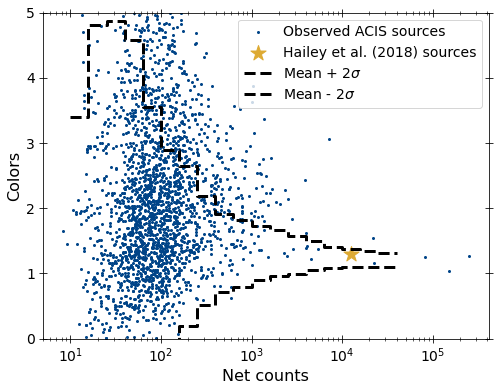

In [857]:
mark_interested_srcs(
    sim_msps_color_dict_arr[2], obs_color_dict_arr[2],
    spec_summary_msps['src_nums'][1], spec_summary_msps['spec_masks'][1][2],
    [badcandidate_msps_acis[9]])

In [61]:
mark_interested_srcs(
    sim_msps_color_dict_arr[0], obs_color_dict_arr[0],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][0],
    badcandidate_msps_pn)
mark_interested_srcs(
    sim_msps_color_dict_arr[1], obs_color_dict_arr[1],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][1],
    badcandidate_msps_mos)
mark_interested_srcs(
    sim_msps_color_dict_arr[2], obs_color_dict_arr[2],
    spec_summary_msps['src_nums'][1], spec_summary_msps['spec_masks'][1][2],
    badcandidate_msps_acis)

NameError: name 'badcandidate_msps_pn' is not defined

In [136]:
fit_stats_arr = [[pn_fit_stats_table_pl, pn_fit_stats_table_pl_g,
                  pn_fit_stats_table_pl_g2],
                 [mos_fit_stats_table_pl, mos_fit_stats_table_pl_g,
                  mos_fit_stats_table_pl_g2],
                 [acis_fit_stats_table_pl, acis_fit_stats_table_pl_g,
                  acis_fit_stats_table_pl_g2]]

model_params_arr = [[pn_model_params_table_pl, pn_model_params_table_pl_g,
                     pn_model_params_table_pl_g2],
                    [mos_model_params_table_pl, mos_model_params_table_pl_g,
                     mos_model_params_table_pl_g2],
                    [acis_model_params_table_pl, acis_model_params_table_pl_g,
                     acis_model_params_table_pl_g2]]

det_names = ['PN', 'MOS', 'ACIS']
model_names = ['PL', 'PL_Gauss', 'PL_Gauss3']

for i in range(3):
    for j in range(3):
        fits_file_name = ('Fit_stats_goodobs_' + det_names[i] + '_' + model_names[j] +
                          '.txt')
        model_file_name = ('Model_params_goodobs_' + det_names[i] + '_' + model_names[j] +
                          '.txt')
        print(fits_file_name, model_file_name)
        np.savetxt(fits_file_name, fit_stats_arr[i][j], fmt='%s')
        np.savetxt(model_file_name, model_params_arr[i][j], fmt='%s')

Fit_stats_goodobs_PN_PL.txt Model_params_goodobs_PN_PL.txt
Fit_stats_goodobs_PN_PL_Gauss.txt Model_params_goodobs_PN_PL_Gauss.txt
Fit_stats_goodobs_PN_PL_Gauss3.txt Model_params_goodobs_PN_PL_Gauss3.txt
Fit_stats_goodobs_MOS_PL.txt Model_params_goodobs_MOS_PL.txt
Fit_stats_goodobs_MOS_PL_Gauss.txt Model_params_goodobs_MOS_PL_Gauss.txt
Fit_stats_goodobs_MOS_PL_Gauss3.txt Model_params_goodobs_MOS_PL_Gauss3.txt
Fit_stats_goodobs_ACIS_PL.txt Model_params_goodobs_ACIS_PL.txt
Fit_stats_goodobs_ACIS_PL_Gauss.txt Model_params_goodobs_ACIS_PL_Gauss.txt
Fit_stats_goodobs_ACIS_PL_Gauss3.txt Model_params_goodobs_ACIS_PL_Gauss3.txt


20:80: E501 line too long (86 > 79 characters)
22:80: E501 line too long (90 > 79 characters)
23:27: E128 continuation line under-indented for visual indent


In [62]:
os.chdir('/Volumes/')

In [135]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/')

In [134]:
print('Candidate MSPs PN: ', len(candidate_msps_pn))
print('Candidate MSPs MOS: ', len(candidate_msps_mos))
print('Candidate MSPs ACIS: ', len(candidate_msps_acis))

Candidate MSPs PN:  42
Candidate MSPs MOS:  28
Candidate MSPs ACIS:  82


In [137]:
np.savetxt('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/PN_candidates.txt', candidate_msps_pn, fmt='%s')
np.savetxt('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/MOS_candidates.txt', candidate_msps_mos, fmt='%s')
np.savetxt('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/ACIS_candidates.txt', candidate_msps_acis, fmt='%s')

1:80: E501 line too long (116 > 79 characters)
2:80: E501 line too long (118 > 79 characters)


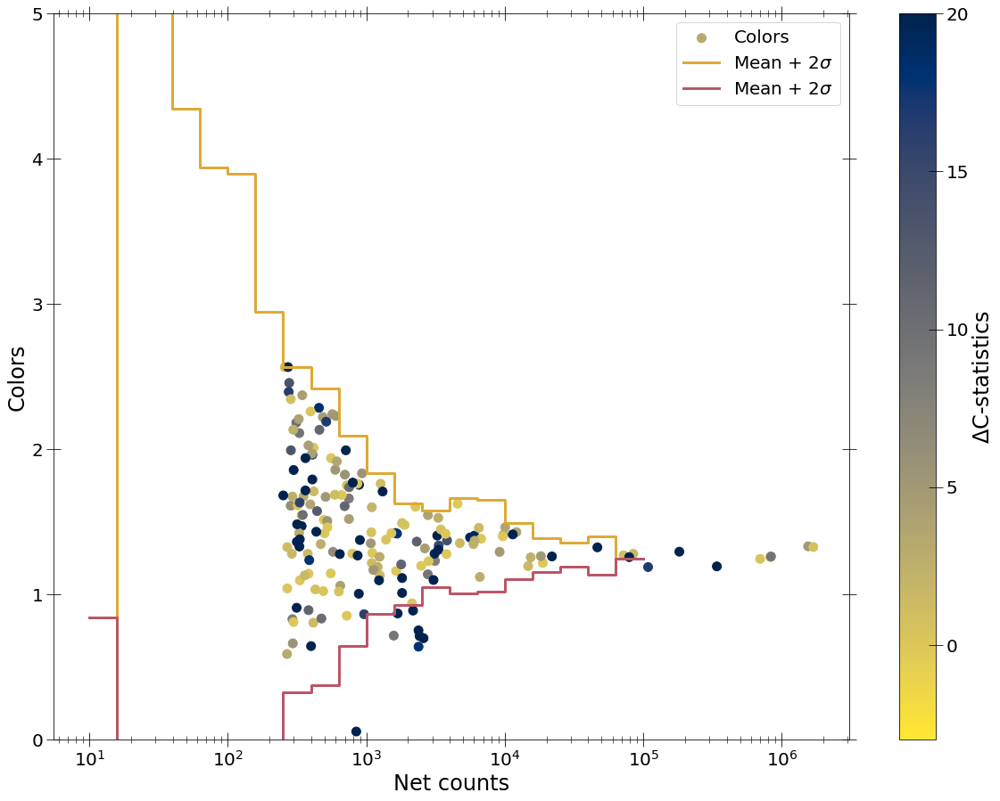

3:19: E127 continuation line over-indented for visual indent


In [127]:
mark_delta_cstat(sim_msps_color_dict_arr[0],
                 interested_msp_netcounts_pn, interested_msp_colors_pn,
                  color_param=(
                      np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
                      np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float)))

In [63]:
np.savetxt("Candidate_PN_sources2.txt", candidate_msps_pn, fmt='%s')
np.savetxt("Candidate_MOS_sources2.txt", candidate_msps_mos, fmt='%s')
np.savetxt("Candidate_ACIS_sources2.txt", candidate_msps_acis, fmt='%s')

32 45
[   351.92945247    289.90069035   1095.65166318    749.24316979
    312.64435376   9169.92094638    217.65001052    268.59533598
    294.65176547  84717.44865388   5906.66947885    340.98131215
    488.54255387   1199.5405138     319.66772022    468.82938122
   3131.35267644   3333.91840967    781.9714536    2835.56651361
    711.53733848    328.18495497  13354.595606    18809.38042347
    341.21123846    381.97668665  18219.60240603    413.8041048
    398.9688382     292.5793281     387.26516544 108294.73356779]
[ 1.67581269  1.28112422  1.21663543  1.51989179  1.60187246  1.29404339
  0.58535117  1.3266276   0.66431771  1.28037626  1.13547261  1.54478757
  1.02407813  1.14781944  1.61401294  1.34720766  1.23135082  1.33815723
 -0.05260787  1.29847956  1.99319728  2.11166137  1.28097346  1.21773187
  1.47134072  2.02655352  1.2643068   0.80649643  0.64536441  0.83077869
  1.23684998  1.18929367]
4.0
16.0
26 58
[8.18785839e+02 1.07674668e+03 7.60166342e+03 6.30830001e+04
 2.7766

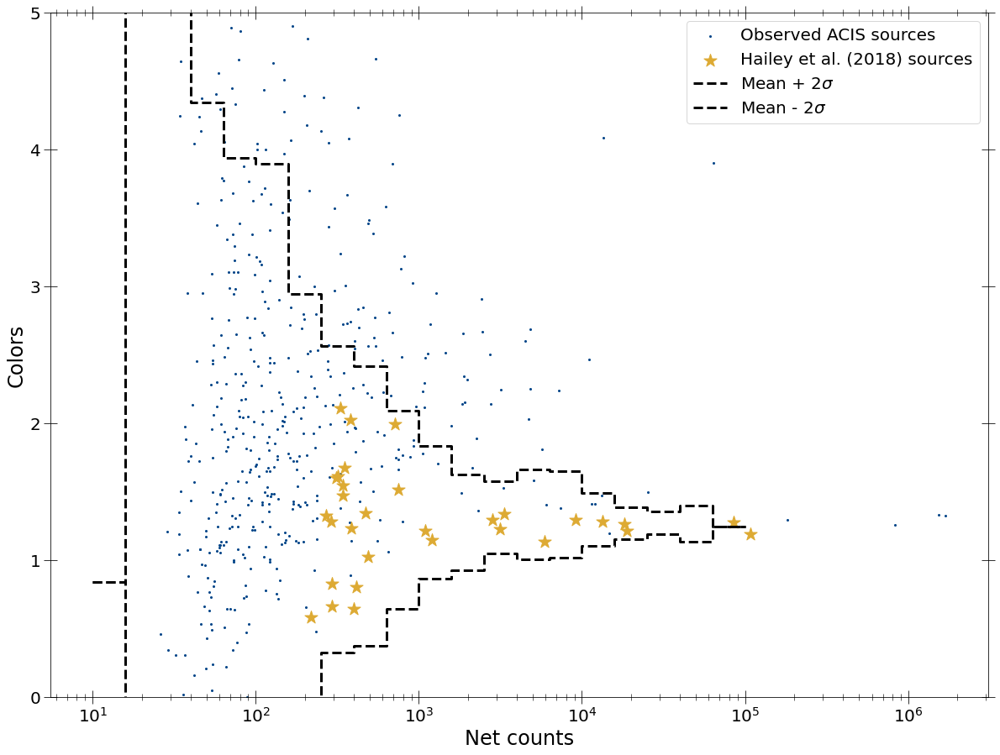

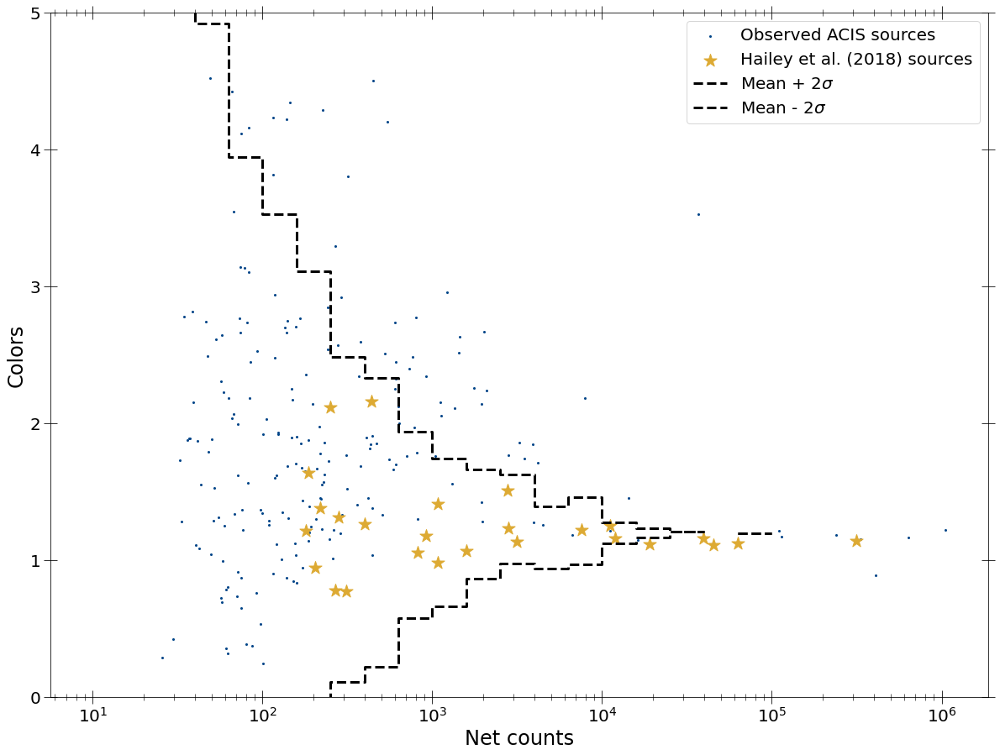

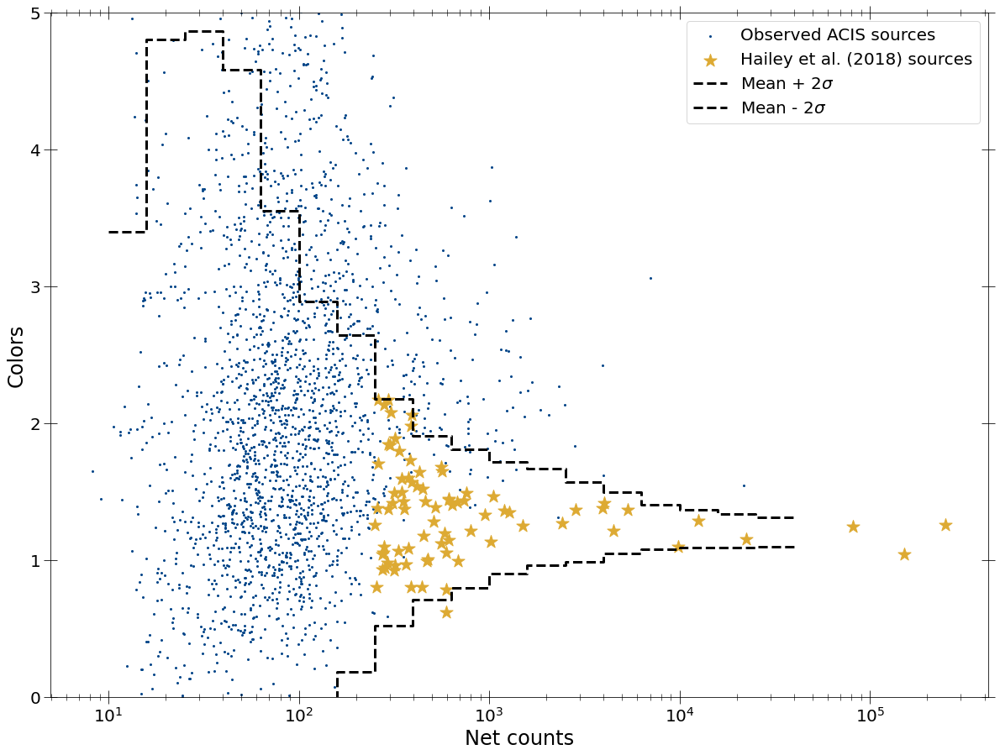

In [122]:
candidate_msp_colors_pn, candidate_msp_netcounts_pn = mark_interested_srcs(
    sim_msps_color_dict_arr[0], obs_color_dict_arr[0],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][0],
    candidate_msps_pn)
candidate_msp_colors_mos, candidate_msp_netcounts_mos = mark_interested_srcs(
    sim_msps_color_dict_arr[1], obs_color_dict_arr[1],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][1],
    candidate_msps_mos)
candidate_msp_colors_acis, candidate_msp_netcounts_acis = mark_interested_srcs(
    sim_msps_color_dict_arr[2], obs_color_dict_arr[2],
    spec_summary_msps['src_nums'][1], spec_summary_msps['spec_masks'][1][2],
    candidate_msps_acis)

(array([[26., 34., 10.,  7.,  1.,  0.,  1.,  0.,  0.,  0.],
        [ 0.,  1., 12., 19.,  7.,  8.,  4.,  0.,  2.,  3.],
        [ 0.,  2., 21., 15., 17., 19.,  5.,  0.,  4.,  1.]]),
 array([31.83728314, 32.33700378, 32.83672443, 33.33644508, 33.83616573,
        34.33588637, 34.83560702, 35.33532767, 35.83504831, 36.33476896,
        36.83448961]),
 <a list of 3 BarContainer objects>)

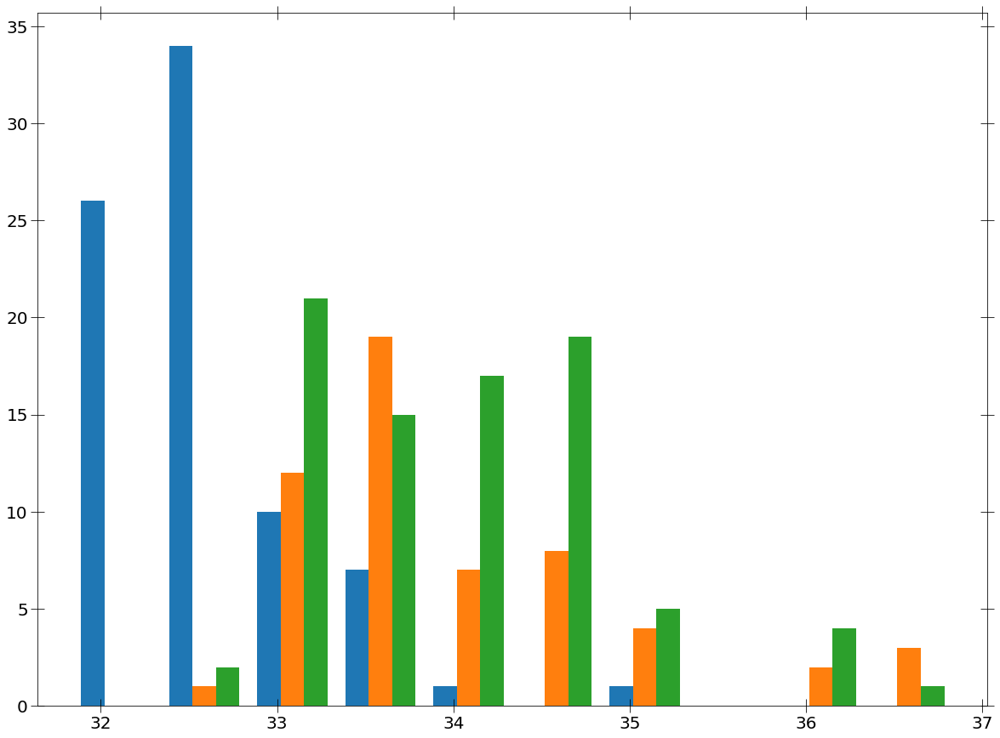

2:80: E501 line too long (97 > 79 characters)
4:5: E122 continuation line missing indentation or outdented
4:80: E501 line too long (95 > 79 characters)
6:5: E122 continuation line missing indentation or outdented


In [40]:
plt.hist([np.log10(np.array(
    acis_model_params_table_pl)[candidadate_msps_acis_args, -1].astype(float)*1.0E-12*7.659E+45),
          np.log10(np.array(
    mos_model_params_table_pl)[candidadate_msps_mos_args, -1].astype(float)*1.0E-12*7.659E+45),
          np.log10(np.array(
    pn_model_params_table_pl)[candidadate_msps_pn_args, -1].astype(float)*1.0E-12*7.659E+45)])

In [41]:
np.array(pn_model_params_table_pl)[:, -1]

array(['0.17775347039666198', '0.15741084535160457', '0.184916221634929',
       '0.15827113901941042', '0.2236002475847295', '0.08951046394205044',
       '0.14265592957726886', '0.1626556505674507', '0.151691544568419',
       '0.05853568131439508', '0.14208766163194325', '0.1483015342871929',
       '0.17915506454714364', '0.18059561287992698', '0.4972249272113047',
       '0.09935349974589852', '0.2892301045437417', '0.09958650593606125',
       '0.14983870965833504', '0.10191032244884844',
       '0.09547917849789156', '1.514468706406689', '2.386640098946292',
       '0.0695866798415962', '2.434338843992567', '2.653754452026149',
       '0.8073668171107404', '0.17373774483165227', '0.09894761001028098',
       '0.8797420859841123', '0.08134202489723485', '0.32472292336168684',
       '0.8776335127640109', '0.3198136926262305', '0.33445479886038176',
       '0.13148582008628226', '0.3577683026935588', '1.042938236836493',
       '0.42383678514598094', '0.8444880167700237', '0.71371

In [138]:
candidate_msps_xmm = np.array(
    list(set(candidate_msps_pn) | set(candidate_msps_mos)))

In [271]:
candidate_msps_xmm2 = np.array(
    list(set(candidate_msps_pn2) | set(candidate_msps_mos2)))

In [409]:
len(set(interested_msp_srcs_alldet[0]) &
         set(interested_msp_srcs_alldet[1]))

63

In [139]:
print('Candidate XMM sources: ', len(candidate_msps_xmm))

Candidate XMM sources:  50


In [ ]:
cando

In [126]:
print('Candidate XMM sources: ', len(candidate_msps_acis))

Candidate XMM sources:  82


In [71]:
def arr_to_str(arr, delimiter=';', telescope='Chandra'):
    """Convert array to a string."""
    string = ''
    for elm in arr:
        if telescope == 'Chandra':
            string += '2CXO J' + elm.split('J')[1] + delimiter + ' '
        else:
            string += elm + delimiter + ' '
    return string[:-2]

In [81]:
print(pn_fit_stats_table_pl[165])
print(pn_fit_stats_table_pl_g[165])
print(pn_model_params_table_pl_g2[165])

['207901804010003', 1235.5077482061804, -11.752061357752408, 50.0, 1339]
['207901804010003', 1221.5023602591075, -11.829463122524714, 50.0, 1337]
['207901804010003', 22.57936557017966, 5.0, 94.06476805856985, 8.158533789967393e-21, 4.148413598151495e-06, 1.008391242920101e-07, 0.8224962005991274, 0.0, 5.176706758261817e-07, 7.887873183904472e-06, 0.0, 3.336197748012629e-06]


In [140]:
arr_to_str(np.sort(np.array(candidate_msps_xmm)).astype(str), telescope='XMM', delimiter='    ')

'200305401010008     200305401015015     201032613010001     201032613010002     201113501010117     201129701010015     201129702010002     201129704010049     201129704010056     201129705010002     201129705010011     201129707010033     201129707010057     201129707010063     201129708010036     201129709010018     201129712010002     201129715010017     201129715010042     201129719010003     201129719010010     201129721010014     201129721010057     201129721010060     201129721010133     201129721010136     201442201010001     201529201010002     202026705010003     202039301010054     202039301010071     203032102010002     204003401010003     204003401010007     204003401010008     205100104010002     205110012010001     206556701010043     206946402010009     206946404010062     206946404010202     206946410010178     207483912010001     208016803010003     208016813010003     208042503010002     208441011010001     208860108010001     208861209010009     208938111010034   '

# IP analysis

## Selection of IPs within MSP colors

In [376]:
(interested_cv_args_alldet,
 interested_cv_srcs_alldet) = get_candidate_src_nums_alldet(
    spec_summary_msp_cvs, sim_msps2_color_dict_arr, sim_ips_color_dict_arr,
    min_count_arr=[150, 150, 150], min_counts2=250)

[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[0.8405164  2.03621255 1.63305682 1.56743663 1.5736705  1.66320801
 1.4331601  1.44713313 1.39609846 1.36984926 1.35086023 1.27893642
 1.31590127 1.33564778 1.334838   1.30071855 1.27144028 1.27383281
 1.26917868 1.24506393]
[0.         2.58517276 1.72972337 1.38681819 1.18129716 1.11575665
 0.75540094 0.56022382 0.51077116 0.36126324 0.24291962 0.17375792
 0.13254254 0.16428213 0.15864827 0.09633923 0.05725364 0.0421451
 0.0654287  0.        ]
250 1.4471331268500243 0.5602238243386048
5
251.18864315095823 1.4471331268500243 0.5602238243386048
386
398.1071705534973 1.396098460383752 0.5107711552472425
325
630.957344480193 1.3698492577015142 0.36126323889561407
197
1000.

In [377]:
print('Interested PN sources: ', len(interested_cv_srcs_alldet[0]))
print('Interested MOS sources: ', len(interested_cv_srcs_alldet[1]))
print('Interested ACIS sources: ', len(interested_cv_srcs_alldet[2]))

Interested PN sources:  1007
Interested MOS sources:  599
Interested ACIS sources:  1069


1007 1007
[ 742.16756027 1140.40696692  598.11461962 ... 2060.08718738  444.78832951
  507.86883473]
[1.72806709 1.7427761  1.92439835 ... 1.61641106 1.7086652  1.68467659]
4.0
16.0
599 599
[ 963.48723286  505.22205431  776.96285626  272.32216231  299.66566957
  367.25482241  301.85964009  309.78958522  337.92023011  336.83374244
  319.77891428  391.55933887  628.20966923  293.97338087  251.75678703
  428.73489306  698.09606283  777.13671863  821.72023123  488.30827899
  488.13031548  339.31901824  356.60046264  754.92459609  831.35925697
  262.66448452  327.68121778 1396.88569934  339.00655733 1176.35210111
 1295.34868958  305.34551062  969.14001827  388.58952421  733.92487197
  322.49420273  275.03775469  692.38585829  412.79413922  362.4829205
  330.30810451  295.98345495  279.73877783  359.4422947   260.67648151
  722.99957619 1611.57047622  324.62655619 1096.44012163  303.92022681
  603.7798263   323.23981953  368.48565582  771.47411065  867.02909088
  343.51611225  336.48986485  

4.0
16.0
1069 1069
[1381.07745387  268.72962923 1061.76725662 ...  635.79133902  365.60649545
  357.49253702]
[1.53627297 1.56644953 1.59874723 ... 1.33118851 1.83935761 1.94369355]
4.0
16.0


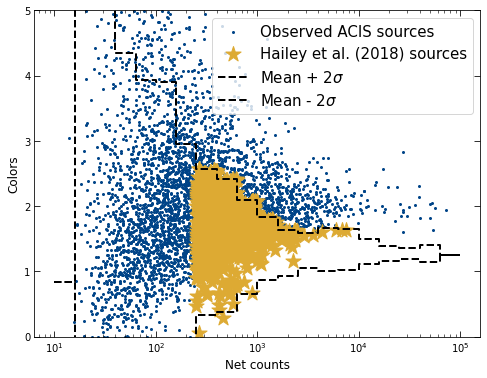

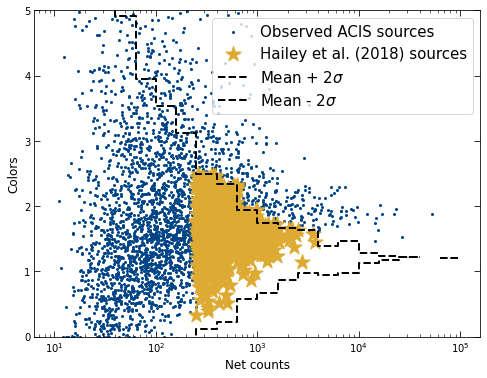

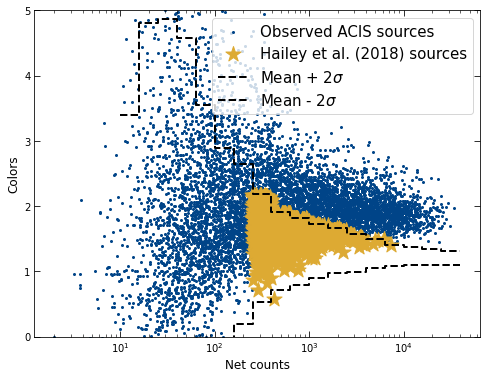

In [378]:
interested_cv_colors_pn, interested_cv_netcounts_pn = mark_interested_srcs(
    sim_msps_color_dict_arr[0], sim_ips_color_dict_arr[0],
    spec_summary_msp_cvs['src_nums'][0],
    spec_summary_msp_cvs['spec_masks'][1][0], interested_cv_srcs_alldet[0])
interested_cv_colors_mos, interested_cv_netcounts_mos = mark_interested_srcs(
    sim_msps_color_dict_arr[1], sim_ips_color_dict_arr[1],
    spec_summary_msp_cvs['src_nums'][0],
    spec_summary_msp_cvs['spec_masks'][1][1], interested_cv_srcs_alldet[1])
interested_cv_colors_acis, interested_cv_netcounts_acis = mark_interested_srcs(
    sim_msps_color_dict_arr[2], sim_ips_color_dict_arr[2],
    spec_summary_msp_cvs['src_nums'][1],
    spec_summary_msp_cvs['spec_masks'][1][2], interested_cv_srcs_alldet[2])

## Spectral analysis

In [379]:
def fit_src_pl_sim(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'ip_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'ip_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'ip_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')

    model = xspec.Model('tbabs*pegpwrlw')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.perform()
    xspec.Fit.error('2.706 2')
    xspec.Fit.perform()
    print('Calculating goodness')
    #goodness = xspec.Fit.goodness(1000)
    print('Finished calculating goodness')
    goodness = 50.0
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0])
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    if telescope == 'Chandra':
        os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0]])

In [380]:
def fit_src_pl_gauss_sim(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'ip_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'ip_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'ip_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.7, 0.0001, 6.1, 6.1, 7.3, 7.3'
    model.gaussian.Sigma.values = '0.1 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 6')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    #xspec.Fit.error('2.706 6')
    #xspec.Fit.error('2.706 8')
    #goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_pos_low = xspec.AllModels(1).gaussian.LineE.error[0]
    line_pos_high = xspec.AllModels(1).gaussian.LineE.error[1]
    line_norm_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm_high = xspec.AllModels(1).gaussian.norm.error[1]
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_pos:', xspec.AllModels(1).gaussian.LineE.values[0],
          line_pos_low, line_pos_high,
          ' Fe_norm:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm_low, line_norm_high)
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.LineE.values[0], line_pos_low,
             line_pos_high,
             xspec.AllModels(1).gaussian.norm.values[0], line_norm_low,
             line_norm_high])


In [381]:
def fit_src_pl_gauss2_sim(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'ip_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'ip_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'ip_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss+gauss+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.4 0'
    model.gaussian.Sigma.values = '0.0 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_4.LineE.values = '6.7 0'
    model.gaussian_4.Sigma.values = '0.0 0'
    model.gaussian_4.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_5.LineE.values = '7.0 0'
    model.gaussian_5.Sigma.values = '0.0 0'
    model.gaussian_5.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 11')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 14')
    # xspec.Fit.error('2.706 8')
    #goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_norm1_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm1_high = xspec.AllModels(1).gaussian.norm.error[1]
    line_norm2_low = xspec.AllModels(1).gaussian_4.norm.error[0]
    line_norm2_high = xspec.AllModels(1).gaussian_4.norm.error[1]
    line_norm3_low = xspec.AllModels(1).gaussian_5.norm.error[0]
    line_norm3_high = xspec.AllModels(1).gaussian_5.norm.error[1]
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_norms:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm1_low, line_norm1_high,
          xspec.AllModels(1).gaussian_4.norm.values[0], line_norm2_low,
          line_norm2_high, xspec.AllModels(1).gaussian_5.norm.values[0],
          line_norm3_low, line_norm3_high)
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.norm.values[0],
             xspec.AllModels(1).gaussian_4.norm.values[0],
             xspec.AllModels(1).gaussian_5.norm.values[0], line_norm1_low,
             line_norm1_high, line_norm2_low, line_norm2_high, line_norm3_low,
             line_norm3_high])


In [382]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_xu2016_twice_ew/')
xspec.AllData.clear()
fit_src_pl_sim(interested_cv_srcs_alldet[0][1], src_folder='./')

Calculating goodness
Finished calculating goodness
Model params for 2314: NH =  16.218350742551607  Gamma:  1.4792808377612598  norm:  0.16866262943222152
Fit stats for 2314:  444.68566791248804 -7.262602283733768 50.0 422




([2314, 444.68566791248804, -7.262602283733768, 50.0, 422],
 [2314, 16.218350742551607, 1.4792808377612598, 0.16866262943222152])

In [383]:
pn_fit_stats_table_pl_cv = []
pn_model_params_table_pl_cv = []

for i, source_num in enumerate(interested_cv_srcs_alldet[0]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_sim(source_num)
    pn_fit_stats_table_pl_cv.append(fit_stats)
    pn_model_params_table_pl_cv.append(model_params)

0 1053
Calculating goodness
Finished calculating goodness
Model params for 1053: NH =  8.426546254042645  Gamma:  0.696878257660201  norm:  0.2640615137489303
Fit stats for 1053:  696.6533400656168 -6.6991863447334214 50.0 677


1 2314
Calculating goodness
Finished calculating goodness
Model params for 2314: NH =  16.218350742551607  Gamma:  1.4792808377612598  norm:  0.16866262943222152
Fit stats for 2314:  444.68566791248804 -7.262602283733768 50.0 422


2 4975
Calculating goodness
Finished calculating goodness
Model params for 4975: NH =  34.80810676735122  Gamma:  1.6547868183831644  norm:  0.7970294500612315
Fit stats for 4975:  500.56838353896495 -8.296106645940524 50.0 521


3 7000
Calculating goodness
Finished calculating goodness
Model params for 7000: NH =  8.797211481452258  Gamma:  0.7033262442551201  norm:  0.5995788353080425
Fit stats for 7000:  708.1936702003406 -8.805952877998777 50.0 562


4 7651
Calculating goodness
Finished calculating goodness
Model params for 7651:

Calculating goodness
Finished calculating goodness
Model params for 1048: NH =  63.234459296106515  Gamma:  2.4319962064451  norm:  1.670677227474241
Fit stats for 1048:  297.13202130714353 -7.721066393583697 50.0 260


37 1052
Calculating goodness
Finished calculating goodness
Model params for 1052: NH =  13.419429574722395  Gamma:  0.526985985643462  norm:  0.053655150048805486
Fit stats for 1052:  1967.3660155096763 -6.093275983695817 50.0 1929


38 1060
Calculating goodness
Finished calculating goodness
Model params for 1060: NH =  14.60705302620761  Gamma:  1.6242850324074298  norm:  0.143729353508781
Fit stats for 1060:  453.0430827884086 -7.176507815076671 50.0 430


39 1061
Calculating goodness
Finished calculating goodness
Model params for 1061: NH =  112.02886859079645  Gamma:  2.690908025786786  norm:  4.118738971902681
Fit stats for 1061:  386.84683764365667 -7.37712344375649 50.0 349


40 1140
Calculating goodness
Finished calculating goodness
Model params for 1140: NH =  

Calculating goodness
Finished calculating goodness
Model params for 1768: NH =  7.235001552692238  Gamma:  1.2810731694431843  norm:  0.04965768998512834
Fit stats for 1768:  889.0002247404252 -5.70283819511564 50.0 868


73 1787
Calculating goodness
Finished calculating goodness
Model params for 1787: NH =  66.41604263862243  Gamma:  1.738233638619359  norm:  0.4542079063105526
Fit stats for 1787:  927.8180560558279 -6.674091521385323 50.0 899


74 1788
Calculating goodness
Finished calculating goodness
Model params for 1788: NH =  113.23690512713483  Gamma:  2.6885436180878424  norm:  2.66461535671636
Fit stats for 1788:  346.9270320009002 -7.400533516057995 50.0 361


75 1789
Calculating goodness
Finished calculating goodness
Model params for 1789: NH =  101.8038545686193  Gamma:  3.241822788378039  norm:  1.2054049403492524
Fit stats for 1789:  588.5186373017841 -5.568243559600939 50.0 525


76 1821
Calculating goodness
Finished calculating goodness
Model params for 1821: NH =  10.

Calculating goodness
Finished calculating goodness
Model params for 2808: NH =  26.012888480887394  Gamma:  0.9611417175413239  norm:  0.4663001766979685
Fit stats for 2808:  2551.0495107436427 -8.513815270774716 50.0 2503


109 2825
Calculating goodness
Finished calculating goodness
Model params for 2825: NH =  17.601035247550126  Gamma:  1.4880542834283745  norm:  0.5490340812349971
Fit stats for 2825:  312.53685690022655 -7.677427352397851 50.0 278


110 2870
Calculating goodness
Finished calculating goodness
Model params for 2870: NH =  11.78723653456791  Gamma:  1.7336490317110462  norm:  0.24729807791851266
Fit stats for 2870:  903.2265696338656 -8.068036292159693 50.0 980


111 2878
Calculating goodness
Finished calculating goodness
Model params for 2878: NH =  7.873524815495642  Gamma:  0.9057126092951877  norm:  0.19865390651313158
Fit stats for 2878:  555.2911470441036 -7.169619966533473 50.0 444


112 2938
Calculating goodness
Finished calculating goodness
Model params for 2

Calculating goodness
Finished calculating goodness
Model params for 3871: NH =  48.879535403151664  Gamma:  1.691587797186619  norm:  1.0464941111035517
Fit stats for 3871:  699.2046454027793 -7.014801899318316 50.0 771


145 3887
Calculating goodness
Finished calculating goodness
Model params for 3887: NH =  9.016820050919439  Gamma:  0.8036454060172652  norm:  0.7615746528119489
Fit stats for 3887:  282.14528914689834 -9.00555085145577 50.0 238


146 3912
Calculating goodness
Finished calculating goodness
Model params for 3912: NH =  171.81691398696952  Gamma:  4.644058631787016  norm:  10.05614492782404
Fit stats for 3912:  2330.988225854069 -5.189953441601986 50.0 2526


147 3947
Calculating goodness
Finished calculating goodness
Model params for 3947: NH =  19.925081515996155  Gamma:  1.088045424990063  norm:  0.6744749700146958
Fit stats for 3947:  1570.485271668173 -8.944524562637834 50.0 1474


148 3963
Calculating goodness
Finished calculating goodness
Model params for 3963: N

Calculating goodness
Finished calculating goodness
Model params for 4842: NH =  9.01748661022264  Gamma:  1.3531778021330212  norm:  1.1308677690822602
Fit stats for 4842:  1433.5415196736715 -8.119582449128172 50.0 1345


181 4860
Calculating goodness
Finished calculating goodness
Model params for 4860: NH =  54.850312737395576  Gamma:  1.9668751630163346  norm:  0.3763613893439727
Fit stats for 4860:  1181.3888187694154 -5.676011920939934 50.0 1030


182 4888
Calculating goodness
Finished calculating goodness
Model params for 4888: NH =  5.075846903378484  Gamma:  0.8072665957759753  norm:  0.6468479456415275
Fit stats for 4888:  445.76338987451385 -7.581891533848545 50.0 407


183 4890
Calculating goodness
Finished calculating goodness
Model params for 4890: NH =  9.94177416091691  Gamma:  1.1884787371629852  norm:  0.11548194585211721
Fit stats for 4890:  1671.0935710826975 -8.821794456346597 50.0 1514


184 4991
Calculating goodness
Finished calculating goodness
Model params for 4

Calculating goodness
Finished calculating goodness
Model params for 5844: NH =  35.05125281401117  Gamma:  0.6572997524340946  norm:  0.16980531543799676
Fit stats for 5844:  645.0099445870201 -6.60765970982643 50.0 614


217 5847
Calculating goodness
Finished calculating goodness
Model params for 5847: NH =  37.03543341895497  Gamma:  1.328153659106616  norm:  0.49685836339578776
Fit stats for 5847:  1118.8481540714251 -6.957385789312953 50.0 1844


218 5866
Calculating goodness
Finished calculating goodness
Model params for 5866: NH =  23.88072949749297  Gamma:  0.8277622387437077  norm:  0.4776426169152872
Fit stats for 5866:  1787.1757740201485 -7.499804274082603 50.0 1743


219 5883
Calculating goodness
Finished calculating goodness
Model params for 5883: NH =  19.734732014926678  Gamma:  0.9686474865775546  norm:  0.847656391474808
Fit stats for 5883:  1037.1361630262206 -8.383340842089554 50.0 1070


220 5900
Calculating goodness
Finished calculating goodness
Model params for 59

Calculating goodness
Finished calculating goodness
Model params for 6621: NH =  76.22413036562914  Gamma:  2.158277532640498  norm:  2.5035432505189927
Fit stats for 6621:  406.86551395407173 -8.864220676338375 50.0 405


253 6626
Calculating goodness
Finished calculating goodness
Model params for 6626: NH =  13.74481640346739  Gamma:  1.243642673954048  norm:  0.5753121790282478
Fit stats for 6626:  201.00109335286868 -7.427140808099561 50.0 197


254 6647
Calculating goodness
Finished calculating goodness
Model params for 6647: NH =  39.196664781937955  Gamma:  1.7697124297391595  norm:  1.2405758136783642
Fit stats for 6647:  571.3298832663327 -8.690901028345753 50.0 568


255 6696
Calculating goodness
Finished calculating goodness
Model params for 6696: NH =  108.41747695889465  Gamma:  3.022688072534364  norm:  4.828370522954527
Fit stats for 6696:  309.9940348201065 -6.886230322231424 50.0 309


256 6718
Calculating goodness
Finished calculating goodness
Model params for 6718: NH

Calculating goodness
Finished calculating goodness
Model params for 7321: NH =  5.7264184702083485  Gamma:  0.6551512572880527  norm:  0.09225242168742315
Fit stats for 7321:  1099.195768695314 -8.142014553386863 50.0 982


289 7323
Calculating goodness
Finished calculating goodness
Model params for 7323: NH =  31.43585940673319  Gamma:  1.7276221615347607  norm:  0.2233764054091767
Fit stats for 7323:  844.2273435058546 -7.641881937521163 50.0 822


290 7344
Calculating goodness
Finished calculating goodness
Model params for 7344: NH =  8.388466564927954  Gamma:  1.3838528851284722  norm:  0.41139095542949383
Fit stats for 7344:  1015.9979269135016 -8.424951682981071 50.0 1306


291 7347
Calculating goodness
Finished calculating goodness
Model params for 7347: NH =  28.113174256583882  Gamma:  2.031171023461107  norm:  0.5468113002766901
Fit stats for 7347:  369.1382276726779 -8.77041226793518 50.0 362


292 7387
Calculating goodness
Finished calculating goodness
Model params for 7387

Calculating goodness
Finished calculating goodness
Model params for 8346: NH =  11.86672823229719  Gamma:  1.4988412440542485  norm:  0.5777124626296194
Fit stats for 8346:  476.24964939920716 -8.96560189019566 50.0 430


325 8374
Calculating goodness
Finished calculating goodness
Model params for 8374: NH =  55.2415987761617  Gamma:  0.9840941837180642  norm:  0.34216842373324186
Fit stats for 8374:  627.7250999039051 -6.2486025779660554 50.0 663


326 8411
Calculating goodness
Finished calculating goodness
Model params for 8411: NH =  33.586963428532414  Gamma:  1.344509005898159  norm:  0.7566936098426484
Fit stats for 8411:  632.495226642745 -6.191582207499772 50.0 801


327 8428
Calculating goodness
Finished calculating goodness
Model params for 8428: NH =  5.871499389302978  Gamma:  0.8666714066659396  norm:  0.34096403276966136
Fit stats for 8428:  135.36779101366886 -7.531517682957254 50.0 133


328 8435
Calculating goodness
Finished calculating goodness
Model params for 8435: 

Calculating goodness
Finished calculating goodness
Model params for 9103: NH =  114.00593115831411  Gamma:  2.2410086194735355  norm:  1.4012294931368616
Fit stats for 9103:  882.3926265972789 -6.728120207477378 50.0 778


361 9119
Calculating goodness
Finished calculating goodness
Model params for 9119: NH =  85.06493260026939  Gamma:  2.6852594435958457  norm:  0.8081240940384877
Fit stats for 9119:  1457.7619040915672 -6.57309160028586 50.0 1384


362 9190
Calculating goodness
Finished calculating goodness
Model params for 9190: NH =  69.66877535665759  Gamma:  1.6584145391580094  norm:  0.9962406810905534
Fit stats for 9190:  219.3575469729127 -7.5439178599794285 50.0 191


363 9194
Calculating goodness
Finished calculating goodness
Model params for 9194: NH =  11.619155990661769  Gamma:  1.0841601349066532  norm:  0.08212719002881948
Fit stats for 9194:  839.5579991554217 -7.621014768712469 50.0 757


364 9206
Calculating goodness
Finished calculating goodness
Model params for 920

Calculating goodness
Finished calculating goodness
Model params for 177: NH =  24.113199152196696  Gamma:  1.4758693376644882  norm:  1.342328885162563
Fit stats for 177:  347.53784990625934 -9.716725369007275 50.0 282


397 178
Calculating goodness
Finished calculating goodness
Model params for 178: NH =  6.709844375142932  Gamma:  1.1059358333743043  norm:  0.4412807859210018
Fit stats for 178:  1105.5864602987585 -8.948204273809203 50.0 1067


398 199
Calculating goodness
Finished calculating goodness
Model params for 199: NH =  12.722016274980971  Gamma:  1.1722891816012615  norm:  0.1477064138545295
Fit stats for 199:  1721.7466179879516 -8.5624122601786 50.0 1830


399 205
Calculating goodness
Finished calculating goodness
Model params for 205: NH =  18.976884753085475  Gamma:  1.3584710922138614  norm:  0.571590045794026
Fit stats for 205:  1531.947623096253 -8.54616075293002 50.0 1331


400 264
Calculating goodness
Finished calculating goodness
Model params for 264: NH =  8.758

Calculating goodness
Finished calculating goodness
Model params for 991: NH =  5.044846935694701  Gamma:  0.7756469600194834  norm:  0.12661607359957286
Fit stats for 991:  1028.4749575608337 -8.857726722791824 50.0 948


433 1016
Calculating goodness
Finished calculating goodness
Model params for 1016: NH =  9.728639501225185  Gamma:  1.2938361757817032  norm:  0.42535567086061826
Fit stats for 1016:  434.45078526036497 -7.85323440962915 50.0 409


434 1037
Calculating goodness
Finished calculating goodness
Model params for 1037: NH =  7.418337591097801  Gamma:  1.0969796120216635  norm:  0.09424815726326376
Fit stats for 1037:  988.9707883428159 -6.453344907154017 50.0 892


435 1038
Calculating goodness
Finished calculating goodness
Model params for 1038: NH =  13.167567966507605  Gamma:  1.2654569847491643  norm:  0.8152973163532954
Fit stats for 1038:  358.06734203712574 -8.758217426402547 50.0 344


436 1087
Calculating goodness
Finished calculating goodness
Model params for 1087

Calculating goodness
Finished calculating goodness
Model params for 2163: NH =  46.052277432069744  Gamma:  1.659547811389937  norm:  0.22603753778074395
Fit stats for 2163:  2274.0865155990577 -5.768268751231038 50.0 1990


469 2267
Calculating goodness
Finished calculating goodness
Model params for 2267: NH =  8.826459099260946  Gamma:  1.645848324328655  norm:  0.3348025507761392
Fit stats for 2267:  1722.2532042777418 -7.625839725672311 50.0 1645


470 2270
Calculating goodness
Finished calculating goodness
Model params for 2270: NH =  12.026181222714118  Gamma:  1.8049136882881673  norm:  0.9559428601211036
Fit stats for 2270:  893.7533740477584 -7.841281085035408 50.0 984


471 2278
Calculating goodness
Finished calculating goodness
Model params for 2278: NH =  77.79969072438422  Gamma:  1.8696895171965093  norm:  1.5830619186100132
Fit stats for 2278:  443.21419277207093 -7.731492421600391 50.0 411


472 2303
Calculating goodness
Finished calculating goodness
Model params for 23

Calculating goodness
Finished calculating goodness
Model params for 3427: NH =  31.366206084319682  Gamma:  1.28503365291877  norm:  0.43007648864419734
Fit stats for 3427:  833.8066467555749 -7.941933803469982 50.0 743


505 3447
Calculating goodness
Finished calculating goodness
Model params for 3447: NH =  43.21438284297912  Gamma:  1.8067885249217341  norm:  0.9377222468242731
Fit stats for 3447:  1655.6986109049865 -6.666334727071356 50.0 1520


506 3490
Calculating goodness
Finished calculating goodness
Model params for 3490: NH =  20.047740363336626  Gamma:  1.064526211907483e-06  norm:  0.11678428506708886
Fit stats for 3490:  3143.8774166048197 -7.500637710892752 50.0 2763


507 3697
Calculating goodness
Finished calculating goodness
Model params for 3697: NH =  19.200824761945384  Gamma:  0.849273679555205  norm:  0.34748713547121063
Fit stats for 3697:  1405.648169478065 -9.036108768646747 50.0 1219


508 3723
Calculating goodness
Finished calculating goodness
Model params f

Calculating goodness
Finished calculating goodness
Model params for 4608: NH =  9.16661611068849  Gamma:  0.4708519735762377  norm:  0.4538894025532449
Fit stats for 4608:  992.3884465485178 -7.228031749018572 50.0 879


541 4627
Calculating goodness
Finished calculating goodness
Model params for 4627: NH =  22.308070881146282  Gamma:  1.3570669367670625  norm:  0.07437481615219682
Fit stats for 4627:  2102.990779639622 -7.7521517643711375 50.0 1810


542 4645
Calculating goodness
Finished calculating goodness
Model params for 4645: NH =  15.847249473541222  Gamma:  1.2058775110356108  norm:  0.17775897131986604
Fit stats for 4645:  737.652781546774 -7.255593142142477 50.0 685


543 4701
Calculating goodness
Finished calculating goodness
Model params for 4701: NH =  16.612076026428888  Gamma:  0.234730315882427  norm:  0.046124927168194156
Fit stats for 4701:  2068.5854996868543 -4.9955395425652664 50.0 1960


544 4734
Calculating goodness
Finished calculating goodness
Model params for

Calculating goodness
Finished calculating goodness
Model params for 5683: NH =  33.77721711927463  Gamma:  1.3025819220521566  norm:  0.38823660709977437
Fit stats for 5683:  685.9149302884517 -7.603084085106662 50.0 647


577 5763
Calculating goodness
Finished calculating goodness
Model params for 5763: NH =  52.964750445144766  Gamma:  1.8495215440951025  norm:  0.8837138771742031
Fit stats for 5763:  556.6804033911745 -7.752707629308486 50.0 582


578 5838
Calculating goodness
Finished calculating goodness
Model params for 5838: NH =  46.05324855983152  Gamma:  2.2578625452598042  norm:  1.8737029299962216
Fit stats for 5838:  1465.8327866254065 -7.476614226089854 50.0 1338


579 5854
Calculating goodness
Finished calculating goodness
Model params for 5854: NH =  8.878461339192686  Gamma:  1.0253359644917428  norm:  0.6231109823786115
Fit stats for 5854:  195.47826136851262 -6.92982774692501 50.0 177


580 5859
Calculating goodness
Finished calculating goodness
Model params for 5859

Calculating goodness
Finished calculating goodness
Model params for 7014: NH =  27.209277765288622  Gamma:  1.3349820989621495  norm:  0.7297181100716997
Fit stats for 7014:  2310.468024334135 -8.575584340081813 50.0 1842


613 7069
Calculating goodness
Finished calculating goodness
Model params for 7069: NH =  60.220206010742295  Gamma:  2.178154756399165  norm:  0.2552202350284992
Fit stats for 7069:  2025.5555825306192 -6.450399507769838 50.0 1964


614 7215
Calculating goodness
Finished calculating goodness
Model params for 7215: NH =  71.76522681739972  Gamma:  1.6718104212435436  norm:  0.42889818319915946
Fit stats for 7215:  1206.0104940355936 -7.422633331830804 50.0 1018


615 7245
Calculating goodness
Finished calculating goodness
Model params for 7245: NH =  14.245930897539091  Gamma:  1.2255328687818592  norm:  1.133069807232951
Fit stats for 7245:  261.4303844912673 -8.038869570992645 50.0 235


616 7250
Calculating goodness
Finished calculating goodness
Model params for 7

Calculating goodness
Finished calculating goodness
Model params for 8076: NH =  11.960953380312366  Gamma:  1.1813525857658187  norm:  1.2467190852527155
Fit stats for 8076:  259.33672550763583 -9.69883996065892 50.0 265


649 8080
Calculating goodness
Finished calculating goodness
Model params for 8080: NH =  47.724867804773055  Gamma:  0.6133456815256197  norm:  0.4851778838453398
Fit stats for 8080:  423.1722280297943 -8.157324663377938 50.0 402


650 8088
Calculating goodness
Finished calculating goodness
Model params for 8088: NH =  118.79711078945643  Gamma:  3.3508376007282226  norm:  1.0661042923902744
Fit stats for 8088:  1842.3656427188391 -6.658028044444589 50.0 1654


651 8124
Calculating goodness
Finished calculating goodness
Model params for 8124: NH =  12.582849292981214  Gamma:  0.7328931313932874  norm:  0.19103252915328217
Fit stats for 8124:  626.7737239407561 -7.877004313257143 50.0 512


652 8138
Calculating goodness
Finished calculating goodness
Model params for 8

Calculating goodness
Finished calculating goodness
Model params for 9053: NH =  80.46396680754812  Gamma:  2.1016772295265755  norm:  0.8856954327200239
Fit stats for 9053:  995.1715326141667 -6.944843129453287 50.0 881


685 9070
Calculating goodness
Finished calculating goodness
Model params for 9070: NH =  106.33845084613378  Gamma:  1.3171176361742334  norm:  0.09336903632970416
Fit stats for 9070:  1945.707592318705 -6.96553768962594 50.0 1841


686 9077
Calculating goodness
Finished calculating goodness
Model params for 9077: NH =  76.2969715654434  Gamma:  2.653279087564664  norm:  3.5039769772558773
Fit stats for 9077:  800.0447398844202 -7.486873673442498 50.0 817


687 9094
Calculating goodness
Finished calculating goodness
Model params for 9094: NH =  15.051259528264664  Gamma:  0.8909279331347678  norm:  0.9880935425509436
Fit stats for 9094:  316.2644406004984 -8.925170614625745 50.0 272


688 9124
Calculating goodness
Finished calculating goodness
Model params for 9124: N

Calculating goodness
Finished calculating goodness
Model params for 169: NH =  17.020212375511118  Gamma:  0.9999638044690533  norm:  0.6040361063757455
Fit stats for 169:  478.34622503204673 -10.023941223925071 50.0 452


721 210
Calculating goodness
Finished calculating goodness
Model params for 210: NH =  7.389789535414094  Gamma:  0.9944321537890928  norm:  0.11510952280443623
Fit stats for 210:  847.5747319120017 -8.628907569854606 50.0 828


722 237
Calculating goodness
Finished calculating goodness
Model params for 237: NH =  25.62749312130709  Gamma:  1.2057740414138252  norm:  0.3600645549217286
Fit stats for 237:  529.168090756707 -8.189356468806762 50.0 489


723 344
Calculating goodness
Finished calculating goodness
Model params for 344: NH =  20.93277858382955  Gamma:  1.2479246464604488  norm:  0.3696175343304843
Fit stats for 344:  1664.4467766446287 -8.513023437863998 50.0 1514


724 373
Calculating goodness
Finished calculating goodness
Model params for 373: NH =  43.3

Calculating goodness
Finished calculating goodness
Model params for 2099: NH =  8.183104475307665  Gamma:  1.3393423792496775  norm:  0.7223954609484261
Fit stats for 2099:  1595.966601497501 -7.454483378262158 50.0 1510


757 2143
Calculating goodness
Finished calculating goodness
Model params for 2143: NH =  7.838748509707722  Gamma:  1.202849594651241  norm:  0.583481247748911
Fit stats for 2143:  1079.0705533219282 -8.36181284586401 50.0 965


758 2147
Calculating goodness
Finished calculating goodness
Model params for 2147: NH =  16.510074411319223  Gamma:  1.179034839176301  norm:  0.40120716969029646
Fit stats for 2147:  881.8374471116463 -9.276853118684249 50.0 846


759 2179
Calculating goodness
Finished calculating goodness
Model params for 2179: NH =  19.53355742498773  Gamma:  0.9628595888570214  norm:  0.22233458063397743
Fit stats for 2179:  1032.2963488142002 -8.797678489104836 50.0 1058


760 2201
Calculating goodness
Finished calculating goodness
Model params for 2201:

Calculating goodness
Finished calculating goodness
Model params for 3641: NH =  34.365765160288646  Gamma:  1.2317717911145225  norm:  1.2128257215232932
Fit stats for 3641:  431.9683276566508 -7.546859795964615 50.0 380


793 3676
Calculating goodness
Finished calculating goodness
Model params for 3676: NH =  24.748959930704345  Gamma:  1.0785500714375755  norm:  0.4628266621699938
Fit stats for 3676:  761.1096048348746 -7.990355355923356 50.0 684


794 3716
Calculating goodness
Finished calculating goodness
Model params for 3716: NH =  51.680435355524125  Gamma:  1.872092565890634  norm:  0.9856091278280047
Fit stats for 3716:  530.0466160151309 -7.644343489209242 50.0 477


795 3729
Calculating goodness
Finished calculating goodness
Model params for 3729: NH =  9.024651590638339  Gamma:  0.6690003420524796  norm:  0.0708911745526196
Fit stats for 3729:  1514.8084435984833 -7.894458760542439 50.0 1392


796 3746
Calculating goodness
Finished calculating goodness
Model params for 3746

Calculating goodness
Finished calculating goodness
Model params for 5441: NH =  8.410350142909364  Gamma:  0.8978690655848529  norm:  0.9320876693921574
Fit stats for 5441:  247.61170413585347 -8.310499077911826 50.0 189


829 5472
Calculating goodness
Finished calculating goodness
Model params for 5472: NH =  40.53329822194189  Gamma:  1.622762467915697  norm:  1.5737834703430507
Fit stats for 5472:  343.8162353569038 -9.352739449946412 50.0 358


830 5562
Calculating goodness
Finished calculating goodness
Model params for 5562: NH =  16.83239859275387  Gamma:  0.4845728043197107  norm:  0.20589441244330636
Fit stats for 5562:  928.6303617266838 -8.634621669211638 50.0 849


831 5569
Calculating goodness
Finished calculating goodness
Model params for 5569: NH =  34.50171987256929  Gamma:  1.3198502520186481  norm:  0.5862749034418153
Fit stats for 5569:  475.6637625509221 -8.478194667675293 50.0 422


832 5649
Calculating goodness
Finished calculating goodness
Model params for 5649: N

Calculating goodness
Finished calculating goodness
Model params for 7545: NH =  8.578860728975592  Gamma:  0.8002261303649327  norm:  0.366086771470004
Fit stats for 7545:  622.8198515620388 -8.942896660938366 50.0 546


865 7554
Calculating goodness
Finished calculating goodness
Model params for 7554: NH =  25.43078956453183  Gamma:  1.3303104437045614  norm:  0.3711830091497735
Fit stats for 7554:  1664.6002818271168 -7.58067871731326 50.0 1819


866 7564
Calculating goodness
Finished calculating goodness
Model params for 7564: NH =  54.009212183411094  Gamma:  2.2331387684592108  norm:  0.6392985377533581
Fit stats for 7564:  914.2806851884823 -9.855903414554726 50.0 845


867 7577
Calculating goodness
Finished calculating goodness
Model params for 7577: NH =  10.612868685660658  Gamma:  0.8758428290422074  norm:  0.6753495090725775
Fit stats for 7577:  1966.5325798139777 -9.758208720189499 50.0 1852


868 7599
Calculating goodness
Finished calculating goodness
Model params for 7599

Calculating goodness
Finished calculating goodness
Model params for 9510: NH =  21.875301332614406  Gamma:  1.8017445290974528  norm:  1.1343425230511122
Fit stats for 9510:  839.5995233795738 -10.18677090796608 50.0 764


901 9524
Calculating goodness
Finished calculating goodness
Model params for 9524: NH =  8.743242855157709  Gamma:  1.22509092679254  norm:  0.26611273585470413
Fit stats for 9524:  997.8064029203865 -8.461234780069603 50.0 974


902 9630
Calculating goodness
Finished calculating goodness
Model params for 9630: NH =  13.733828064913808  Gamma:  1.894912430804477  norm:  0.1629206749889215
Fit stats for 9630:  942.4242288233344 -8.657337709695879 50.0 843


903 9701
Calculating goodness
Finished calculating goodness
Model params for 9701: NH =  21.77360314505607  Gamma:  1.3078417390796004  norm:  0.4524195400691838
Fit stats for 9701:  525.503508590921 -8.641696453520332 50.0 536


904 9702
Calculating goodness
Finished calculating goodness
Model params for 9702: NH 

Calculating goodness
Finished calculating goodness
Model params for 3896: NH =  13.688235667690108  Gamma:  1.4654445205738709  norm:  0.7570657506690275
Fit stats for 3896:  596.3163371529793 -9.917499339463893 50.0 536


937 4057
Calculating goodness
Finished calculating goodness
Model params for 4057: NH =  6.214213837600553  Gamma:  0.6600232336535625  norm:  0.7635000790566331
Fit stats for 4057:  608.9181935450684 -9.845562939606623 50.0 547


938 4454
Calculating goodness
Finished calculating goodness
Model params for 4454: NH =  14.861536788923344  Gamma:  1.580360104827384  norm:  0.516443124048786
Fit stats for 4454:  1162.1893528544492 -8.331139844850162 50.0 1175


939 4490
Calculating goodness
Finished calculating goodness
Model params for 4490: NH =  30.385141552713247  Gamma:  2.3322951315159006  norm:  0.06141469959635769
Fit stats for 4490:  1733.4689668921426 -7.43161644418488 50.0 1737


940 4517
Calculating goodness
Finished calculating goodness
Model params for 451

Calculating goodness
Finished calculating goodness
Model params for 8069: NH =  11.429437542176478  Gamma:  1.1629956391023741  norm:  0.8167008021972689
Fit stats for 8069:  600.6523062645222 -8.326524281368526 50.0 609


973 8170
Calculating goodness
Finished calculating goodness
Model params for 8170: NH =  23.490287815821937  Gamma:  1.358611305363415  norm:  0.815178826578253
Fit stats for 8170:  504.9574126158334 -9.291374037862717 50.0 470


974 8702
Calculating goodness
Finished calculating goodness
Model params for 8702: NH =  17.992800597764013  Gamma:  1.297961665454451  norm:  0.984349157263144
Fit stats for 8702:  745.7397520957801 -9.10935064633396 50.0 653


975 8930
Calculating goodness
Finished calculating goodness
Model params for 8930: NH =  22.126788155403695  Gamma:  1.1065265715452577  norm:  1.3744399549361814
Fit stats for 8930:  514.9306586434463 -7.811653242490499 50.0 456


976 9032
Calculating goodness
Finished calculating goodness
Model params for 9032: NH 

In [384]:
pn_fit_stats_table_pl_g_cv = []
pn_model_params_table_pl_g_cv = []
pn_fit_stats_table_pl_g2_cv = []
pn_model_params_table_pl_g2_cv = []

for i, source_num in enumerate(interested_cv_srcs_alldet[0]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_gauss_sim(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2_sim(source_num)
    pn_fit_stats_table_pl_g_cv.append(fit_stats)
    pn_model_params_table_pl_g_cv.append(model_params)
    pn_fit_stats_table_pl_g2_cv.append(fit_stats2)
    pn_model_params_table_pl_g2_cv.append(model_params2)

0 1053
Model params for 1053: NH =  9.811168428861913  Gamma:  1.0501000456626801  norm:  0.24950874919886892  Fe_pos: 6.7784708557357405 6.630253008619856 6.988629005769366  Fe_norm: 1.3473730644574096e-06 1.791283875500442e-07 2.7299883888784294e-06
Fit stats for 1053:  692.9709810958097 -6.76328874458939 50.0 675


Model params for 1053: NH =  10.402172954907005  Gamma:  1.2118795638373556  norm:  0.24370757390218326  Fe_norms: 5.733873393392406e-07 0.0 1.4988846308617257e-06 9.134434109143545e-07 7.264660061829838e-08 1.956320926422974e-06 4.198417450727566e-07 0.0 1.474227917524855e-06
Fit stats for 1053:  691.2689788332068 -6.824621174336479 50.0 674


1 2314
Model params for 2314: NH =  16.21637720664635  Gamma:  1.4790032335432328  norm:  0.16865356250630376  Fe_pos: 7.292731161149722 0.0 0.0  Fe_norm: 1.3350515659601537e-23 0.8224962005991274 0.0
Fit stats for 2314:  444.6856308849407 -7.262810733924271 50.0 420


Model params for 2314: NH =  17.43633406429455  Gamma:  1.75566

Model params for 396: NH =  21.63501455669121  Gamma:  2.124579569884203  norm:  0.12579436681144965  Fe_norms: 8.971155758441141e-08 0.0 4.116390000210528e-07 2.854869539352992e-07 0.0 6.667011004904768e-07 1.2390857610154351e-08 0.0 3.48936859040082e-07
Fit stats for 396:  631.9589583137599 -7.447943382094722 50.0 586


13 429
Model params for 429: NH =  14.68017332016604  Gamma:  1.693930050525763  norm:  0.16438689867909698  Fe_pos: 7.001914586383031 6.850275898418991 7.1494824932226075  Fe_norm: 6.600025044788027e-07 1.684237078709939e-07 1.2655876691888636e-06
Fit stats for 429:  262.96037455881935 -7.1817309199440675 50.0 274


Model params for 429: NH =  15.106598220523646  Gamma:  1.8561648303362832  norm:  0.1619317732132823  Fe_norms: 3.4114011997195056e-07 3.280153596094981e-08 7.415877791146661e-07 1.2325168735637567e-07 0.0 5.134910101078314e-07 5.536841865316647e-07 1.346023861489341e-07 1.0855447687501182e-06
Fit stats for 429:  260.41904938793084 -7.22221310724706 50.0

Model params for 756: NH =  6.7481506247768035  Gamma:  1.0402337336521539  norm:  0.6558589788195022  Fe_pos: 6.1000000094820015 0.0 6.280916576682666  Fe_norm: 1.9289018305415195e-06 3.0107927839211354e-07 3.937645579226191e-06
Fit stats for 756:  305.53936981582365 -6.636302089481134 50.0 316


Model params for 756: NH =  6.494246239015974  Gamma:  0.9315954148495573  norm:  0.6798946165358337  Fe_norms: 5.987750472891994e-07 0.0 2.244094871320947e-06 2.7537857603787147e-14 0.0 1.2994681511540937e-06 7.63776251490697e-08 0.0 1.6980299795263781e-06
Fit stats for 756:  308.94534457306656 -6.600099157841449 50.0 315


26 795
Model params for 795: NH =  92.32328930597731  Gamma:  2.4351923949968484  norm:  1.6310172495664335  Fe_pos: 6.435038578875654 6.336182955453673 6.5360930422994965  Fe_norm: 3.3605594106068762e-06 1.5821167010031209e-06 5.633390414820649e-06
Fit stats for 795:  459.6196051330927 -7.333436610349927 50.0 429


Model params for 795: NH =  89.24913214722207  Gamma:  2

Model params for 1060: NH =  15.512771133972446  Gamma:  1.972317155470848  norm:  0.1395503464001897  Fe_pos: 6.392941937708147 6.288701833522618 6.504153455708548  Fe_norm: 6.986628450336603e-07 2.8740686616315217e-07 1.1884060634010345e-06
Fit stats for 1060:  444.2566309762022 -7.467711617829055 50.0 428


Model params for 1060: NH =  15.869321656924708  Gamma:  2.0164812401268355  norm:  0.14193842510540047  Fe_norms: 5.741513618365283e-07 2.3067176455518868e-07 9.942632664772238e-07 7.946013745050272e-08 0.0 4.169434865663186e-07 7.93494340906223e-08 0.0 4.5143207709122225e-07
Fit stats for 1060:  444.21841230009125 -7.40250770913667 50.0 427


39 1061
Model params for 1061: NH =  99.90593855203186  Gamma:  2.5672736864001133  norm:  2.9907304232728418  Fe_pos: 6.827448292139319 6.680479251216275 7.007280312760121  Fe_norm: 4.267217991912821e-06 1.5325136006355584e-06 7.48856395390344e-06
Fit stats for 1061:  380.3320415662898 -7.615684911349857 50.0 347


Model params for 1061: 

Model params for 1345: NH =  22.651158149518164  Gamma:  2.4026235573011725  norm:  0.6016772362089765  Fe_norms: 1.7914687769498097e-06 7.497541315023991e-07 3.10557362000438e-06 2.126343709747193e-06 1.0405984240978016e-06 3.4999528077135337e-06 3.984508158989525e-07 0.0 1.4821582776211546e-06
Fit stats for 1345:  268.17753333409274 -8.584615029721418 50.0 312


51 1350
Model params for 1350: NH =  4.83728080695211  Gamma:  0.6908192925001432  norm:  0.26634275764880927  Fe_pos: 6.850741937006647 6.701591472984033 6.996529088932961  Fe_norm: 1.0624677784975425e-06 2.5751505243503436e-07 2.0135085038700565e-06
Fit stats for 1350:  599.7423149502943 -8.114630877219982 50.0 587


Model params for 1350: NH =  4.923907688686054  Gamma:  0.7271645853960774  norm:  0.2628141811100583  Fe_norms: 2.7914093350945495e-07 0.0 9.095177605709669e-07 4.5735916888826144e-07 0.0 1.159452312305816e-06 5.177843362177294e-07 0.0 1.3128655820277423e-06
Fit stats for 1350:  600.9649690230999 -8.1474522377

Model params for 1570: NH =  27.639649299884837  Gamma:  1.9118291255730355  norm:  0.6131452248881077  Fe_pos: 6.720627882540587 6.5789320098133635 6.858217713284637  Fe_norm: 1.9347647381498595e-06 6.379205881636425e-07 3.5431724833711928e-06
Fit stats for 1570:  434.46965854974286 -7.881055030789363 50.0 476


Model params for 1570: NH =  27.671469196960413  Gamma:  1.9850594719734151  norm:  0.6083172292820535  Fe_norms: 4.960839143480737e-07 0.0 1.5340798116759458e-06 1.5190424185532401e-06 5.006266923154192e-07 2.8266972493894124e-06 4.996096013009363e-07 0.0 1.6169699342989179e-06
Fit stats for 1570:  433.30222772886543 -7.856324345614409 50.0 475


64 1574
Model params for 1574: NH =  7.221805510224303  Gamma:  0.3670268455128893  norm:  0.14419766618816812  Fe_pos: 6.778959816346506 6.6360306159501095 6.921035554679238  Fe_norm: 6.464266125812128e-07 1.7367039136571027e-07 1.1911486360513441e-06
Fit stats for 1574:  675.5740297234787 -8.100217156470137 50.0 645


Model params 

Model params for 1789: NH =  52.07819715318994  Gamma:  2.1223008200632982  norm:  0.2586059446644952  Fe_norms: 3.394552691975963e-07 0.0 9.36885014536294e-07 1.2929034089321767e-06 7.267026719536467e-07 2.2984319742464803e-06 1.386363366378332e-07 0.0 6.551196167766389e-07
Fit stats for 1789:  571.4662874441146 -6.541675297076462 50.0 522


76 1821
Model params for 1821: NH =  12.146527673541275  Gamma:  1.4796139796045298  norm:  0.090939588076181  Fe_pos: 6.690152239251151 6.579974597886525 6.793254101776062  Fe_norm: 4.2534269416386525e-07 1.3598964514801273e-07 7.675510513648413e-07
Fit stats for 1821:  631.0547269509477 -6.816349195218108 50.0 614


Model params for 1821: NH =  11.555696342265081  Gamma:  1.359778438191648  norm:  0.09063179424490095  Fe_norms: 7.936559579465821e-14 0.0 1.4230204129737703e-07 3.7034934826689076e-07 1.3620691813481492e-07 6.50592887479687e-07 6.258318872030589e-17 0.0 1.8865812104906116e-07
Fit stats for 1821:  629.949964033204 -6.876701301771837

Model params for 2151: NH =  7.5142568164920664  Gamma:  1.0706933131520824  norm:  0.1255091230927878  Fe_pos: 6.322152688203127 6.167524813922557 6.457035878117201  Fe_norm: 3.9261415764873286e-07 1.4184874688650317e-08 8.285686694483525e-07
Fit stats for 2151:  981.4164251515996 -6.9945526082310705 50.0 925


Model params for 2151: NH =  8.212803518673995  Gamma:  1.216970312813184  norm:  0.12527819960196568  Fe_norms: 3.5000701274435536e-07 1.9080518201636255e-08 7.43096613310907e-07 1.7320816424259488e-13 0.0 2.723545029531613e-07 3.46007375774848e-07 3.302480996396017e-08 7.269993381895026e-07
Fit stats for 2151:  978.3416079616934 -7.010060703744855 50.0 924


89 2200
Model params for 2200: NH =  60.50733532497263  Gamma:  2.85715583173892  norm:  0.3154265969001992  Fe_pos: 6.488081790263543 6.4028267636868295 6.57963481177982  Fe_norm: 1.0850879935464722e-06 5.338711397540389e-07 1.8536388378699288e-06
Fit stats for 2200:  674.0410777740376 -6.018356217860165 50.0 722


Model

Model params for 2517: NH =  18.59485625972733  Gamma:  1.9653696494784219  norm:  0.09285458489220128  Fe_norms: 1.094255512222532e-07 0.0 3.268556281943983e-07 1.4078191389385822e-07 0.0 3.8572165691018017e-07 2.1268312688492508e-07 4.295016069377271e-09 4.708813795221165e-07
Fit stats for 2517:  718.9389755056994 -7.202005551795021 50.0 695


101 2568
Model params for 2568: NH =  26.58155335810238  Gamma:  1.8317029917476197  norm:  0.12410339868652655  Fe_pos: 7.299998640560176 7.093639286184606 0.0  Fe_norm: 4.935895036137743e-07 2.4109815132271328e-08 1.271441117080789e-06
Fit stats for 2568:  1215.2431910214427 -8.140386554099676 50.0 1180


Model params for 2568: NH =  21.97767296493218  Gamma:  1.3429702958191374  norm:  0.10910062623592279  Fe_norms: 1.3901046498892565e-16 0.0 2.0146484831223817e-07 8.988180077252936e-08 0.0 4.0478578186125506e-07 2.819922842903932e-17 0.0 2.0839034195655597e-07
Fit stats for 2568:  1217.9839940464444 -8.028452706221957 50.0 1179


102 2599
M

Model params for 2958: NH =  80.58834656466021  Gamma:  2.848246633803744  norm:  1.5430937887413843  Fe_pos: 6.527983446715666 0.0 0.0  Fe_norm: 1.2556941267813688e-06 0.0 3.2080613655692656e-06
Fit stats for 2958:  1306.7641691418526 -7.783001930015422 50.0 1396


Model params for 2958: NH =  81.7764905733854  Gamma:  2.871322293379152  norm:  1.6038052768331386  Fe_norms: 7.736828507179044e-07 0.0 2.459221531284336e-06 2.7446648887492957e-07 0.0 1.9048740771538437e-06 1.84460185241612e-22 0.8224962005991274 0.0
Fit stats for 2958:  1307.3037411042906 -7.784726146020386 50.0 1395


114 3002
Model params for 3002: NH =  12.889804471703705  Gamma:  1.1773028225808124  norm:  0.25363874633765415  Fe_pos: 6.756103125571172 6.493374333273769 6.921238659137392  Fe_norm: 1.0005177386621417e-06 3.7071475629666943e-07 1.7385050019775304e-06
Fit stats for 3002:  233.7722176709322 -8.303366363002404 50.0 252


Model params for 3002: NH =  12.95183347961166  Gamma:  1.2369082196512613  norm:  0.

Model params for 3367: NH =  19.29688588760308  Gamma:  0.07976518623824069  norm:  0.11891747884855625  Fe_norms: 2.8996783218014063e-07 0.0 8.565450122147277e-07 7.174834137234224e-07 1.8029226052585423e-07 1.4442668077807309e-06 1.1455211394958287e-15 0.0 5.776288231455364e-07
Fit stats for 3367:  2907.50958089717 -4.489732211447917 50.0 2465


126 3370
Model params for 3370: NH =  10.721976648650093  Gamma:  2.0802591726605053  norm:  0.09005718790174648  Fe_pos: 6.7000289235588655 6.5961969861691605 6.79421104941665  Fe_norm: 5.143229213978596e-07 1.6645908546932278e-07 9.350545729105369e-07
Fit stats for 3370:  885.140070466527 -5.954355533856851 50.0 814


Model params for 3370: NH =  10.13515564340842  Gamma:  1.9537832330426994  norm:  0.08853179097248864  Fe_norms: 2.7848769583279598e-14 0.0 1.1141884594571674e-07 4.504723432481653e-07 1.606102353604695e-07 7.975986638161181e-07 4.6922378721051815e-17 0.0 1.5510520028482382e-07
Fit stats for 3370:  884.2188959769325 -5.928461

Model params for 3747: NH =  10.571138946863417  Gamma:  1.9955119465452382  norm:  0.6187748528903203  Fe_pos: 6.497001775595066 6.409313739341242 6.597553659264523  Fe_norm: 3.584287429745677e-06 1.8337656049845565e-06 5.6400161647995466e-06
Fit stats for 3747:  150.3582353849111 -9.83481253980346 50.0 162


Model params for 3747: NH =  10.742358617553828  Gamma:  2.0427512876701903  norm:  0.6198959494258851  Fe_norms: 2.701352754748281e-06 1.1677582463153586e-06 4.508226931888559e-06 1.129875259981179e-06 0.0 2.7661436540760816e-06 8.365721482420789e-08 0.0 1.5682101351916362e-06
Fit stats for 3747:  152.09783455270411 -9.841785474498666 50.0 161


139 3809
Model params for 3809: NH =  13.683800690021277  Gamma:  1.5023596996586037  norm:  0.46690146646860686  Fe_pos: 6.889631871259618 6.78276261604778 6.99046280392769  Fe_norm: 1.7630048454201449e-06 6.424022822440262e-07 3.1226862844267174e-06
Fit stats for 3809:  233.69019498121673 -8.75858117652203 50.0 241


Model params for 3

Model params for 4045: NH =  29.911029035098505  Gamma:  2.4378017397044704  norm:  0.6524782184540991  Fe_norms: 1.541262990947282e-06 6.468863171323803e-07 2.6127264462422997e-06 4.7609125884430924e-07 0.0 1.3783095947020729e-06 5.539222313796974e-15 0.0 5.990812065576428e-07
Fit stats for 4045:  351.2858266841282 -8.186049294732365 50.0 301


151 4078
Model params for 4078: NH =  7.737725253703782  Gamma:  0.0004397892634105491  norm:  0.16657023409511942  Fe_pos: 6.4565024356992575 6.3573567491961205 6.558428069350825  Fe_norm: 1.315157505940842e-06 5.517057906064946e-07 2.2213957886095346e-06
Fit stats for 4078:  629.9418482513809 -6.995766528945601 50.0 558


Model params for 4078: NH =  8.15638386930118  Gamma:  1.4444068142561314e-06  norm:  0.17110163184755053  Fe_norms: 8.901195552554237e-07 2.708621937730531e-07 1.633803011126889e-06 1.547291691244785e-08 0.0 6.743868720239621e-07 2.7416392653355094e-07 0.0 9.65316576697266e-07
Fit stats for 4078:  632.1732143167247 -6.96797

Model params for 4394: NH =  66.07853915331988  Gamma:  1.909470842547227  norm:  1.6234859553937402  Fe_pos: 6.838995074311585 6.749844066526506 6.922854115584065  Fe_norm: 4.277579684051607e-06 2.6107701649240116e-06 6.130303716334672e-06
Fit stats for 4394:  453.4662528983029 -9.268315521427972 50.0 417


Model params for 4394: NH =  62.208476383868096  Gamma:  1.852542125180712  norm:  1.4269927587755662  Fe_norms: 1.444011597266105e-06 2.919816530040784e-07 2.719527160617583e-06 2.5645833388516966e-06 1.333650791914064e-06 3.957435345983392e-06 2.352911245466311e-06 1.1699255834493395e-06 3.7154243321006417e-06
Fit stats for 4394:  448.2819055809098 -9.675767400666686 50.0 416


164 4400
Model params for 4400: NH =  46.74428028248254  Gamma:  2.210948424627404  norm:  1.0617408239968376  Fe_pos: 6.983834828151755 6.864667801470184 7.10420968098266  Fe_norm: 3.4907966272523953e-06 1.690193737836208e-06 5.7077249541316316e-06
Fit stats for 4400:  541.1193059166944 -8.765912007462209

Model params for 4596: NH =  6.457574498064526  Gamma:  0.7411576177399813  norm:  0.23909425819516814  Fe_norms: 1.7457709294165535e-07 0.0 6.656495651906784e-07 3.5997054109905427e-07 0.0 9.011182768949492e-07 7.247808696362929e-11 0.0 5.283871265933909e-07
Fit stats for 4596:  907.6236482257284 -9.54533555086451 50.0 866


176 4600
Model params for 4600: NH =  56.736037148906384  Gamma:  1.2877454859607596  norm:  0.19031546060747678  Fe_pos: 6.505735733096927 6.369130893767239 6.652113138686824  Fe_norm: 8.45878045544771e-07 3.823966153953757e-07 1.4407461536212127e-06
Fit stats for 4600:  1261.4283749010258 -7.596726448313465 50.0 1133


Model params for 4600: NH =  50.488054084085306  Gamma:  1.1842736584986526  norm:  0.15881861668906522  Fe_norms: 5.709427742417993e-07 2.4927092837194025e-07 1.0046502542231503e-06 4.833327899117438e-07 1.7331128994709308e-07 8.763081222916955e-07 9.149835144114877e-08 0.0 3.899096288120615e-07
Fit stats for 4600:  1256.794986402663 -7.859349414

Model params for 5054: NH =  10.450757434938726  Gamma:  1.6309254802649136  norm:  0.04215322043870245  Fe_pos: 6.241104603593546 0.0 6.770552301796773  Fe_norm: 3.01593742930675e-07 4.172591339829219e-08 6.188362954405751e-07
Fit stats for 5054:  2065.9825740759184 -6.01002772186495 50.0 1778


Model params for 5054: NH =  10.566925023692262  Gamma:  1.591246772875597  norm:  0.043384162512776776  Fe_norms: 1.7115603321358445e-07 0.0 4.139005335550397e-07 4.494878918506524e-08 0.0 3.0240022548423664e-07 8.323522707811226e-08 0.0 3.415297722573429e-07
Fit stats for 5054:  2067.525166359305 -5.727073141132337 50.0 1777


189 5111
Model params for 5111: NH =  7.79547584487048  Gamma:  1.0895734410609805  norm:  0.3851122026353117  Fe_pos: 6.432252950055359 6.307117744271814 6.557817702649249  Fe_norm: 1.6543423918865552e-06 6.252418253160578e-07 2.880088980941197e-06
Fit stats for 5111:  337.2719415516839 -8.282523468159255 50.0 306


Model params for 5111: NH =  7.759807224508614  Gamm

Model params for 5491: NH =  35.606236926798346  Gamma:  1.5974090678181174  norm:  0.9485951312537554  Fe_norms: 6.728697233746524e-07 0.0 2.368895275294726e-06 2.529186013110357e-06 8.317605351567046e-07 4.565756614574127e-06 3.697181525266658e-17 0.0 7.94065716797491e-07
Fit stats for 5491:  448.0768785232264 -7.221280503808915 50.0 437


201 5504
Model params for 5504: NH =  7.235136720676412  Gamma:  1.155851151720572  norm:  0.20687316961017502  Fe_pos: 6.467653532872764 6.297770551922892 6.645435588381425  Fe_norm: 7.390138800759476e-07 2.0102196481056322e-07 1.383417835726896e-06
Fit stats for 5504:  176.0172201773467 -9.19321348704603 50.0 193


Model params for 5504: NH =  7.3369271617873  Gamma:  1.1857732770357543  norm:  0.20591771195592404  Fe_norms: 5.651085501610777e-07 1.2771748907461432e-07 1.101916823297349e-06 2.739004025943678e-07 0.0 7.826808596202396e-07 5.252614355585322e-15 0.0 3.9356404785288796e-07
Fit stats for 5504:  175.50158638142645 -9.273341164187112 50

Model params for 5831: NH =  15.38928042800773  Gamma:  0.987858706326613  norm:  0.6715382824018319  Fe_pos: 6.479385395499869 6.3820570802052 6.592000408948158  Fe_norm: 2.507666938276523e-06 1.0031855416834596e-06 4.233625425585124e-06
Fit stats for 5831:  285.7194047919256 -9.585851415765992 50.0 291


Model params for 5831: NH =  15.952879039755441  Gamma:  1.1243658759526678  norm:  0.6621824044823225  Fe_norms: 1.9871514389585783e-06 7.361510765259037e-07 3.4811860855320214e-06 7.594507171191016e-07 0.0 2.1521356104766643e-06 1.0877923113519633e-06 0.0 2.5653518506342715e-06
Fit stats for 5831:  283.5886131954254 -9.582265972144086 50.0 290


214 5836
Model params for 5836: NH =  23.078412476964058  Gamma:  1.0922987353640865  norm:  0.28215395245165303  Fe_pos: 6.434577820689235 6.353774668725932 6.517986067361628  Fe_norm: 1.090591609338019e-06 4.607532620764753e-07 1.8211982044314475e-06
Fit stats for 5836:  1851.947973310071 -7.93665735453306 50.0 1848


Model params for 583

Model params for 6022: NH =  25.533746359098213  Gamma:  1.4737375692510115  norm:  0.5953815215949253  Fe_norms: 1.0792720959531137e-06 3.0060216105884585e-07 1.986339504607215e-06 6.233389482937026e-07 0.0 1.4831784496697474e-06 2.571644308625081e-07 0.0 1.1134802496430526e-06
Fit stats for 6022:  393.8345583556063 -9.468792347195285 50.0 363


226 6032
Model params for 6032: NH =  9.42626432790344  Gamma:  1.0083222293700644  norm:  0.06548082996956946  Fe_pos: 6.30849614927519 0.0 0.0  Fe_norm: 1.4326968657437872e-07 0.0 4.5855198486848314e-07
Fit stats for 6032:  1504.391831798238 -6.8204848660089 50.0 1735


Model params for 6032: NH =  9.633248823648572  Gamma:  0.9959816548054775  norm:  0.06708531871064329  Fe_norms: 7.929401251690598e-08 0.0 3.355600433539719e-07 1.629096272801788e-18 0.0 1.4973437944020592e-07 1.569415858870931e-22 0.0 2.601264601534486e-07
Fit stats for 6032:  1504.7729395539757 -6.795375030691436 50.0 1734


227 6043
Model params for 6043: NH =  69.2687120

Model params for 6279: NH =  40.775730085271185  Gamma:  1.7210012956157648  norm:  0.5363573633457496  Fe_pos: 6.503221833690185 6.3967749662587385 6.6199456622313075  Fe_norm: 2.1866643755863562e-06 1.086368078592524e-06 3.4929292520574634e-06
Fit stats for 6279:  718.5534199310623 -9.109717007253256 50.0 744


Model params for 6279: NH =  39.763764637696504  Gamma:  1.7257716810264998  norm:  0.516530513156855  Fe_norms: 1.4774620946171088e-06 5.94791497910553e-07 2.547724535932046e-06 9.757987705971229e-07 1.371492272512252e-07 1.9885180704860256e-06 8.075092731660606e-08 0.0 9.19071138807151e-07
Fit stats for 6279:  718.5991709454596 -9.062679700164832 50.0 743


239 6309
Model params for 6309: NH =  36.94811202754614  Gamma:  1.4529168196636548  norm:  0.6549526294934505  Fe_pos: 6.5516579903903125 6.483316898709533 6.623742325839682  Fe_norm: 5.395515114587386e-06 3.6633791778109177e-06 7.476192844090669e-06
Fit stats for 6309:  215.46529808247539 -8.91090783682988 50.0 244


Mo

Model params for 6586: NH =  57.783549353624714  Gamma:  1.9351534211545534  norm:  1.0652344245028642  Fe_norms: 3.783479448665509e-06 2.5746304870723316e-06 5.267408976135346e-06 1.4706346137426878e-06 4.511400827571523e-07 2.6257498842869195e-06 1.398466524323032e-06 4.2958885730082376e-07 2.496929154191203e-06
Fit stats for 6586:  1816.577135577315 -8.384995823610087 50.0 1737


251 6611
Model params for 6611: NH =  39.13641614100925  Gamma:  2.1071347641928586  norm:  0.8164347322365848  Fe_pos: 6.461946287788783 6.350454740379942 6.5889406400013355  Fe_norm: 2.6539045803844752e-06 1.2219063759234159e-06 4.3580680805551455e-06
Fit stats for 6611:  339.7755883821299 -8.331241718719228 50.0 307


Model params for 6611: NH =  40.250476612154884  Gamma:  2.457429482392762  norm:  0.8616171120646634  Fe_norms: 2.256484953040196e-06 1.1079681824457818e-06 3.7110782107257313e-06 1.3959317888105031e-06 3.764035244733478e-07 2.691137170222634e-06 1.3137787864580076e-06 3.180729248951616e-0

Model params for 6860: NH =  55.85321434311305  Gamma:  1.9183649347718035  norm:  0.5484782490238884  Fe_pos: 6.801161875986206 0.0 0.0  Fe_norm: 6.544564609004767e-07 0.0 1.5726794445931807e-06
Fit stats for 6860:  582.7834904246578 -7.929577296541441 50.0 590


Model params for 6860: NH =  53.74102943179708  Gamma:  1.9138173905534535  norm:  0.512111769826352  Fe_norms: 2.9638054019665676e-07 0.0 9.696874658569358e-07 4.56840731097288e-07 0.0 1.1455367856958628e-06 3.6874285964440525e-07 0.0 1.0257191616331568e-06
Fit stats for 6860:  581.7067829650604 -8.003739726902584 50.0 589


264 6866
Model params for 6866: NH =  11.105431903738852  Gamma:  1.3897740945972772  norm:  1.0798639686635516  Fe_pos: 6.3873864987656175 6.295909220252857 6.501317019339657  Fe_norm: 2.282783417596408e-06 1.1803713534497742e-06 3.4702065768451872e-06
Fit stats for 6866:  709.1884640832666 -10.01841592110981 50.0 676


Model params for 6866: NH =  11.56600598439363  Gamma:  1.502727642795418  norm:  1.

Model params for 7151: NH =  4.053945444418288  Gamma:  0.32958797135148665  norm:  0.09726460235218498  Fe_norms: 6.699241459477592e-08 0.0 3.8779087772495206e-07 1.3440836737428613e-07 0.0 4.877882552906325e-07 8.648786486193853e-08 0.0 4.678245401329906e-07
Fit stats for 7151:  1485.0011413480302 -6.092635446079728 50.0 1582


276 7158
Model params for 7158: NH =  6.204156189245918  Gamma:  0.6101947517259244  norm:  0.3110575572198772  Fe_pos: 6.4815445669208716 6.3833364441480915 6.583431827059324  Fe_norm: 1.1788709809086758e-06 3.86578635020031e-07 2.088853148477416e-06
Fit stats for 7158:  590.1863069639268 -8.290360730137749 50.0 530


Model params for 7158: NH =  6.361589998109067  Gamma:  0.6401230997590418  norm:  0.3104856176240698  Fe_norms: 9.105986675949371e-07 2.570081835360832e-07 1.6767855182954895e-06 8.049014044339312e-09 0.0 6.817059811459629e-07 4.2074897202159604e-07 0.0 1.2298424065388048e-06
Fit stats for 7158:  590.3819548960266 -8.288508893720328 50.0 529




Model params for 7321: NH =  6.09824676094835  Gamma:  0.8215295295418251  norm:  0.08697643997566921  Fe_pos: 6.566765770515092 6.227912645600522 7.257552927503685  Fe_norm: 3.497653004616453e-07 1.3766202795822643e-08 7.346952089943304e-07
Fit stats for 7321:  1096.2263901520298 -8.554419815259234 50.0 980


Model params for 7321: NH =  6.779294961064145  Gamma:  1.023640205926858  norm:  0.08344979083059942  Fe_norms: 2.475986500286084e-07 1.1328268205404484e-09 5.373538346275256e-07 2.720962715717264e-07 8.523342379880433e-09 5.811236658454168e-07 1.49449712269325e-07 0.0 4.697530515660722e-07
Fit stats for 7321:  1093.4050658121423 -8.706711304025772 50.0 979


289 7323
Model params for 7323: NH =  31.23091655965702  Gamma:  1.9037184905966518  norm:  0.21653755659128715  Fe_pos: 6.544665266637515 6.2327944522858285 6.716253394146092  Fe_norm: 6.012540168774502e-07 2.181102358638772e-07 1.038268546406074e-06
Fit stats for 7323:  837.0081059749123 -7.768806913798771 50.0 820


Mode

Model params for 7758: NH =  28.911045073729063  Gamma:  1.1263695473935247  norm:  0.7731140477325987  Fe_norms: 2.1971865143494436e-12 0.0 1.3448380398913557e-06 1.7063018007440937e-06 0.0 3.857051542119254e-06 2.8858922825084344e-06 9.236182832493939e-07 5.34463022201571e-06
Fit stats for 7758:  590.5855665782565 -6.739700099757572 50.0 547


301 7830
Model params for 7830: NH =  183.32718098298977  Gamma:  4.999999999999928  norm:  0.6072659753852104  Fe_pos: 6.779150855387067 0.0 0.0  Fe_norm: 2.594082670165469e-06 0.0 0.0002697592802678004
Fit stats for 7830:  433.78666851291 -1.4379616670244197 50.0 1928


Model params for 7830: NH =  169.9981199008631  Gamma:  4.999999999999755  norm:  0.03690074776098835  Fe_norms: 1.7490282980258108e-06 0.0 0.0002357595447460411 1.5686495795912087e-06 0.0 0.00021547589958975682 1.52934293251182e-20 0.0 5.4008244766362135e-05
Fit stats for 7830:  433.81183463426584 -1.3495415421501264 50.0 1927


302 7841
Model params for 7841: NH =  12.216417

Model params for 8103: NH =  23.01938945775554  Gamma:  1.8207748485125685  norm:  0.8238173862850552  Fe_pos: 6.656990963493227 6.497056731777194 6.830288123332433  Fe_norm: 2.7162644697919927e-06 1.4153477793864357e-06 4.193741975650103e-06
Fit stats for 8103:  454.2975393509423 -8.221911307493666 50.0 410


Model params for 8103: NH =  24.62704806066923  Gamma:  2.1720041302149915  norm:  0.8587773162245755  Fe_norms: 1.6566607372710755e-06 6.631492902461136e-07 2.8050395891571917e-06 1.943803799502466e-06 9.453680518742419e-07 3.1137054628559836e-06 1.8214744525132356e-06 6.553363934193564e-07 3.1725299288138164e-06
Fit stats for 8103:  444.41757572955305 -8.262034988198463 50.0 409


314 8118
Model params for 8118: NH =  29.621300193293077  Gamma:  1.5095178844532842  norm:  0.24337286188294036  Fe_pos: 6.4876229785416895 6.42197131331481 6.553344962575873  Fe_norm: 1.0589402353716864e-06 6.224016108474815e-07 1.5615423533034496e-06
Fit stats for 8118:  1153.3752619468644 -9.70202

Model params for 8374: NH =  28.242489120861336  Gamma:  0.343965363374863  norm:  0.1771352187164908  Fe_norms: 8.356225123280599e-07 4.081867616816531e-07 1.4236626942449823e-06 1.1404091544769352e-07 0.0 5.450228951047243e-07 5.547189236758295e-07 1.2225917690273157e-07 1.1051393371924445e-06
Fit stats for 8374:  614.2864169054981 -6.953347971156173 50.0 660


326 8411
Model params for 8411: NH =  29.99403301829151  Gamma:  1.283919354085906  norm:  0.656843784228943  Fe_pos: 6.432409918658569 6.280976953702095 6.682447333541053  Fe_norm: 1.8016125683026592e-06 3.776958096732965e-07 3.4713232334740903e-06
Fit stats for 8411:  628.0735827686949 -6.269552529759104 50.0 799


Model params for 8411: NH =  30.095999843804496  Gamma:  1.3945244636158358  norm:  0.6467253223935748  Fe_norms: 1.8673704912950903e-06 5.201434614378727e-07 3.410868944185939e-06 2.9577179155385694e-11 0.0 1.3976770877167383e-06 9.15075306346983e-07 0.0 2.2548743848439832e-06
Fit stats for 8411:  625.62677502384

Model params for 8652: NH =  38.26803306659452  Gamma:  1.384618468997969  norm:  1.2223350608110644  Fe_pos: 6.488407561495491 6.428274777411392 6.541422772700845  Fe_norm: 5.615590732717841e-06 4.02278193630096e-06 7.336257862259028e-06
Fit stats for 8652:  1931.7417287301462 -9.101412737858116 50.0 1649


Model params for 8652: NH =  38.18295517883232  Gamma:  1.560490510226042  norm:  1.1854712591258867  Fe_norms: 3.98434835312025e-06 2.7849414080662376e-06 5.329701947206027e-06 2.505861659599055e-06 1.3746447502742416e-06 3.782546891120877e-06 2.173709188765141e-06 1.0944568139061054e-06 3.4123091075686933e-06
Fit stats for 8652:  1915.5287462892738 -9.191765942266764 50.0 1648


339 8725
Model params for 8725: NH =  8.973911471247176  Gamma:  1.4716016349434884  norm:  0.1364829151500656  Fe_pos: 6.922329099185172 0.0 0.0  Fe_norm: 2.5902771840855363e-07 0.0 8.127354273426838e-07
Fit stats for 8725:  511.2564138025047 -7.175668601037824 50.0 479


Model params for 8725: NH =  8.8

Model params for 8924: NH =  5.8528773438653525  Gamma:  1.1319092071847194  norm:  0.4648307165525339  Fe_norms: 8.645139271227638e-07 2.4722067622572886e-07 1.5842076517042684e-06 2.5747403220104043e-13 0.0 6.669575987825461e-07 1.6301616362327113e-07 0.0 9.057592491609452e-07
Fit stats for 8924:  438.82178768548954 -9.087621271784684 50.0 415


351 8946
Model params for 8946: NH =  67.64925418118625  Gamma:  1.3154636024664932  norm:  1.2771226140158727  Fe_pos: 7.3 6.15946340679432 0.0  Fe_norm: 2.7483933828369144e-06 0.0 8.588636903376323e-06
Fit stats for 8946:  869.3945599752017 -7.568429689328553 50.0 871


Model params for 8946: NH =  57.03665903404662  Gamma:  0.8512022198568517  norm:  1.0208072302439783  Fe_norms: 4.877010736475397e-07 0.0 2.3810770294747187e-06 3.462825804243207e-07 0.0 2.1532313813555355e-06 5.783225915582848e-08 0.0 1.8983312794240736e-06
Fit stats for 8946:  871.0739774249112 -7.369761680805918 50.0 870


352 8965
Model params for 8965: NH =  20.6234410

Model params for 9194: NH =  14.482173651301972  Gamma:  1.6852603947272318  norm:  0.08233864036443576  Fe_pos: 6.864724401660224 6.739818897250494 6.990597246816403  Fe_norm: 5.860531780994936e-07 2.2703115767265327e-07 1.0354334335714575e-06
Fit stats for 9194:  831.3499347610449 -7.894503592903932 50.0 755


Model params for 9194: NH =  15.319393004998819  Gamma:  1.8493228218105404  norm:  0.08362470394562184  Fe_norms: 6.521052277031413e-08 0.0 3.2917394746010004e-07 3.249704771927686e-07 5.6162474886699946e-08 6.668261548083688e-07 3.581405864328045e-07 9.607982912379732e-08 6.982166252722358e-07
Fit stats for 9194:  830.4094856997895 -7.8409775091297105 50.0 754


364 9206
Model params for 9206: NH =  49.98713738047034  Gamma:  1.8676079877677596  norm:  0.9986334568767743  Fe_pos: 6.476519976696497 6.273366779722837 6.9106387288424616  Fe_norm: 2.5253874753514437e-06 6.404330163975657e-07 4.690862203051618e-06
Fit stats for 9206:  764.6384470874423 -7.659605769344271 50.0 817


Model params for 9602: NH =  28.58331189394872  Gamma:  1.4828470099097046  norm:  0.4397478622662427  Fe_norms: 1.2489215597033454e-06 7.388955372586132e-07 1.8322707531061882e-06 4.018584554667381e-07 0.0 9.171918218781923e-07 2.852037183447012e-07 0.0 7.968554377049481e-07
Fit stats for 9602:  498.314208678255 -8.76975063069059 50.0 453


376 9606
Model params for 9606: NH =  13.521898353202015  Gamma:  1.1931312951960762  norm:  0.6137343467781793  Fe_pos: 6.863225358162622 6.28592145135632 7.053859902295155  Fe_norm: 1.2657730405884042e-06 4.4747073752045494e-07 2.165091753211659e-06
Fit stats for 9606:  1177.1884168890522 -8.509168635127946 50.0 1082


Model params for 9606: NH =  14.043013198647316  Gamma:  1.3428672831157542  norm:  0.6018269911602434  Fe_norms: 9.486086991096342e-07 3.790362080718549e-07 1.583819077785588e-06 8.587324300873361e-07 2.717378176393165e-07 1.5203304840581297e-06 9.47619347210494e-07 3.064701722280915e-07 1.676968937259461e-06
Fit stats for 9606:  

Model params for 9913: NH =  40.00413894315514  Gamma:  2.5741388846793805  norm:  0.22173810601904675  Fe_pos: 6.724718318559211 6.598774431087922 6.8473792181891975  Fe_norm: 5.525279568293976e-07 1.6912166490700523e-07 1.0488213666623444e-06
Fit stats for 9913:  1373.3852764146784 -6.998051866474355 50.0 1419


Model params for 9913: NH =  39.99270844567985  Gamma:  2.816091202698715  norm:  0.22749847370488777  Fe_norms: 2.869746143362865e-07 0.0 6.64203480362956e-07 5.096600183514824e-07 1.9709760907084954e-07 9.349380465273969e-07 1.3990426819394315e-07 0.0 4.890380938991361e-07
Fit stats for 9913:  1369.099827213614 -7.329281491943122 50.0 1418


389 9931
Model params for 9931: NH =  12.07623208163633  Gamma:  1.6826105507051696  norm:  0.11799690314105729  Fe_pos: 6.539205887388291 6.261059635351163 6.789958524219328  Fe_norm: 4.167107546883641e-07 5.190694819955105e-08 8.550811641749313e-07
Fit stats for 9931:  557.9797640647241 -7.291965515476422 50.0 620


Model params for 9

Model params for 264: NH =  10.171364860924085  Gamma:  1.2791278909761081  norm:  0.4100881428205983  Fe_norms: 1.1463027344677342e-06 4.1398921663182446e-07 2.001066200223714e-06 1.4659138041757165e-06 6.881340738843397e-07 2.376331944261133e-06 7.05627658513479e-07 0.0 1.6095478444817334e-06
Fit stats for 264:  455.8354574246835 -7.700473959714379 50.0 451


401 265
Model params for 265: NH =  62.6712243540814  Gamma:  2.1555084406480827  norm:  0.6817964008962661  Fe_pos: 6.55027593038671 6.351840498448534 6.771535236850204  Fe_norm: 1.8403651048988248e-06 7.028909184820684e-07 3.250074162893743e-06
Fit stats for 265:  571.1556524268665 -8.182384848948553 50.0 585


Model params for 265: NH =  54.41523560337485  Gamma:  2.031671913779157  norm:  0.5270602387552243  Fe_norms: 1.4273145582790099e-06 6.423021064455227e-07 2.4991807745778646e-06 1.3054386806389796e-06 5.586146844131247e-07 2.2899736937051196e-06 1.5066412995621613e-07 0.0 9.233566787486024e-07
Fit stats for 265:  562.4

Model params for 680: NH =  52.381308100132514  Gamma:  1.5204790745557384  norm:  0.32184040624783816  Fe_pos: 6.4342736735668975 6.323670462517753 6.586374538775867  Fe_norm: 8.618333993157183e-07 2.555388642146087e-07 1.5866264010762594e-06
Fit stats for 680:  1195.8567446559546 -7.870500223772587 50.0 1207


Model params for 680: NH =  48.63267180790976  Gamma:  1.5923300823011413  norm:  0.2868953043170628  Fe_norms: 8.424717976548059e-07 3.638318160151546e-07 1.4586231179891606e-06 4.5123467819947946e-07 0.0 9.8947970629701e-07 2.0115649129609068e-07 0.0 7.060034214704147e-07
Fit stats for 680:  1190.8779479033522 -7.685256420947557 50.0 1206


414 687
Model params for 687: NH =  13.778777483103376  Gamma:  0.971793691152468  norm:  0.6099068919803167  Fe_pos: 6.4511471417240935 6.252868044202728 6.737111519329719  Fe_norm: 1.5371354972670417e-06 3.825155727460428e-07 2.8436764092955512e-06
Fit stats for 687:  447.95957500747534 -8.450015973426668 50.0 389


Model params for 687:

Model params for 871: NH =  12.463311526894966  Gamma:  1.3247702506157712  norm:  0.1894994743678183  Fe_norms: 1.084131864669211e-07 0.0 4.34050950569354e-07 1.1297463140459908e-07 0.0 4.5481363117814233e-07 2.750525110741591e-07 0.0 6.687647254218124e-07
Fit stats for 871:  854.6637253943392 -8.04601471691108 50.0 780


426 892
Model params for 892: NH =  7.8251224198557985  Gamma:  1.14492503349067  norm:  0.3822712688291554  Fe_pos: 6.6286020406538855 6.5050167807523644 6.739129194230804  Fe_norm: 1.5972943239301798e-06 6.901340679813108e-07 2.636271850564653e-06
Fit stats for 892:  191.64084902194543 -8.475726833037237 50.0 165


Model params for 892: NH =  7.818890392287112  Gamma:  1.1542433820322973  norm:  0.3799150906548647  Fe_norms: 5.827165178497597e-07 0.0 1.5982876387382526e-06 1.1605764833920357e-06 3.9357787399884393e-07 2.0526295466488254e-06 8.589083277947657e-13 0.0 5.677455126494847e-07
Fit stats for 892:  192.81951998618996 -8.433076797152188 50.0 164


427 908
M

Model params for 1150: NH =  28.823232201594642  Gamma:  2.006179182807116  norm:  0.19649066325222922  Fe_pos: 7.093397042062249 6.9501412865049925 7.212602521041031  Fe_norm: 5.750449749612554e-07 1.1965235808741064e-07 1.2079696064314326e-06
Fit stats for 1150:  1078.4389945595303 -7.658618906507649 50.0 968


Model params for 1150: NH =  26.248732994472835  Gamma:  1.7008511875749568  norm:  0.17996041113702835  Fe_norms: 9.77518987690558e-24 0.0 2.494923582439416e-07 7.165391863079118e-23 0.0 9.580077338018081e-08 3.0362582828425614e-07 3.433211359048928e-10 6.796526400874182e-07
Fit stats for 1150:  1080.1115897146838 -7.603682107477922 50.0 967


439 1163
Model params for 1163: NH =  15.21238181899328  Gamma:  0.9417723118109046  norm:  1.0238929852066883  Fe_pos: 6.347738357301285 0.0 6.739966835139004  Fe_norm: 1.5741618607785156e-06 7.337893423951279e-08 3.271306543216439e-06
Fit stats for 1163:  311.9644827203706 -9.610879583798873 50.0 315


Model params for 1163: NH =  15.

Model params for 1565: NH =  8.549433286726313  Gamma:  2.456536671537964e-07  norm:  0.03664313140397993  Fe_norms: 3.316492720546902e-23 0.0 2.0436578915554735e-07 1.5816544709999022e-07 0.0 1.4505675678153386e-06 9.206335930548264e-25 0.8224962005991274 0.0
Fit stats for 1565:  1664.2073417406689 -4.6920880086375965 50.0 1800


451 1594
Model params for 1594: NH =  90.50287667531052  Gamma:  2.3285009999854216  norm:  1.5466885626288576  Fe_pos: 6.579696301559472 6.426313522627503 6.785458268442227  Fe_norm: 1.974390987262264e-06 5.726457684859983e-07 3.4423550465541315e-06
Fit stats for 1594:  742.1662433065823 -7.365651374725653 50.0 731


Model params for 1594: NH =  87.1514149118752  Gamma:  2.2850206062124476  norm:  1.4100562350218506  Fe_norms: 9.654833803710984e-07 0.0 2.0967466426117536e-06 1.0912278984149276e-06 4.4077204602323465e-08 2.197782404211132e-06 5.911469197647616e-07 0.0 1.5472131214368007e-06
Fit stats for 1594:  742.6431761425905 -7.374139785574792 50.0 730




Model params for 1961: NH =  16.479909974624814  Gamma:  1.6955479782253482  norm:  0.6538473332497967  Fe_pos: 6.73957646882431 6.6505508165802105 6.8325122330502  Fe_norm: 2.3811721500991534e-06 1.1385207468264044e-06 3.7951795721803262e-06
Fit stats for 1961:  1774.5958728766525 -8.54195068839752 50.0 1729


Model params for 1961: NH =  16.618119734262198  Gamma:  1.7667282003526361  norm:  0.646683128256884  Fe_norms: 8.663844154041696e-07 0.0 1.8813508862370754e-06 2.057400027422571e-06 9.860941446324872e-07 3.2926136644447135e-06 3.391193580201802e-07 0.0 1.3825378838100462e-06
Fit stats for 1961:  1771.2828897468917 -8.510984246358127 50.0 1728


464 1965
Model params for 1965: NH =  6.760867505042842  Gamma:  1.2656730447934947  norm:  0.1639584037243602  Fe_pos: 6.3889348009120015 6.319055306687565 6.456991790501283  Fe_norm: 1.0568423881877199e-06 5.914757271312377e-07 1.5932066843195338e-06
Fit stats for 1965:  507.3682739571408 -9.412420177210937 50.0 523


Model params for

Model params for 2414: NH =  7.112732791085195  Gamma:  1.2400663691580285  norm:  0.6508951455684089  Fe_norms: 2.5751020901283076e-06 1.3332739350574407e-06 4.010283345727126e-06 1.2156899199199737e-06 1.1049859172287307e-07 2.5434927572435497e-06 9.286534015524908e-07 0.0 2.49986235159867e-06
Fit stats for 2414:  227.6295412901496 -8.990280580801942 50.0 169


476 2475
Model params for 2475: NH =  9.085570317220105  Gamma:  1.7256515926498797  norm:  0.2426900504603087  Fe_pos: 6.380413980896032 6.272267146796847 6.486931596838809  Fe_norm: 1.1157196012250086e-06 5.330277664202294e-07 1.7748022665211856e-06
Fit stats for 2475:  443.443754611346 -7.953178686101617 50.0 415


Model params for 2475: NH =  9.67294908343537  Gamma:  1.855915687641897  norm:  0.24563333336940035  Fe_norms: 9.642983339795513e-07 4.652053736166997e-07 1.5394790217306691e-06 3.1184642326333086e-14 0.0 3.4035027340172114e-07 5.272028065124418e-07 2.345119217550517e-08 1.1143103414985274e-06
Fit stats for 2475

Model params for 2749: NH =  28.597707310822635  Gamma:  1.1786703625314823  norm:  0.7037526132788037  Fe_pos: 6.644832247121356 6.601748558387736 6.690532379863355  Fe_norm: 5.089916535404063e-06 3.932593510615521e-06 6.368619338737262e-06
Fit stats for 2749:  713.6921300944309 -8.26536441273972 50.0 683


Model params for 2749: NH =  29.008392725022834  Gamma:  1.3017737273386352  norm:  0.6960411358758226  Fe_norms: 1.6233359763725497e-06 8.996470773441056e-07 2.43530480974377e-06 3.6417741752366797e-06 2.7015188420080322e-06 4.692424313838861e-06 8.707429492301542e-07 1.421691716671786e-07 1.7075089614416952e-06
Fit stats for 2749:  714.0728829434418 -8.284939330849733 50.0 682


489 2844
Model params for 2844: NH =  16.015468867036002  Gamma:  1.4181968569500156  norm:  0.5692476945420205  Fe_pos: 6.969526124978802 6.905748447445534 7.034491954592591  Fe_norm: 1.8770034097918186e-06 1.1773956579233986e-06 2.6385842691306434e-06
Fit stats for 2844:  1969.5957068876533 -9.123268224

Model params for 3128: NH =  33.05464833894704  Gamma:  1.917622578644799  norm:  0.1589315065836893  Fe_pos: 6.564918076736789 6.45925943615793 6.662900712836118  Fe_norm: 7.066204256233795e-07 4.0197874014708715e-07 1.0623848392590213e-06
Fit stats for 3128:  1573.6882083506111 -8.588834049764127 50.0 1444


Model params for 3128: NH =  32.830085340755616  Gamma:  1.966443491241921  norm:  0.15679060197957487  Fe_norms: 3.726620003770051e-07 1.4889161362876662e-07 6.369714133288238e-07 4.468799405679426e-07 2.2256880800577285e-07 7.132084957936364e-07 1.1071329047597353e-08 0.0 2.3028208233722783e-07
Fit stats for 3128:  1571.0913086275887 -8.63312364717129 50.0 1443


501 3256
Model params for 3256: NH =  13.86146095727257  Gamma:  1.4727193034108936  norm:  0.361969094938099  Fe_pos: 6.337812668919502 0.0 0.0  Fe_norm: 4.549016734060613e-07 0.0 1.2247116443519047e-06
Fit stats for 3256:  225.3818983147518 -8.91238565755446 50.0 238


Model params for 3256: NH =  13.963095716261954 

Model params for 3864: NH =  31.46506023243265  Gamma:  1.5048500933134235  norm:  0.8781242588703927  Fe_norms: 2.491487917157669e-07 0.0 1.3117391941516949e-06 2.7617631445019187e-07 0.0 1.3844476237648884e-06 1.6261646823043933e-06 5.805463755438739e-07 2.8391954346517665e-06
Fit stats for 3864:  287.4827605185098 -10.000425819874186 50.0 293


513 3895
Model params for 3895: NH =  26.16405723559657  Gamma:  1.040524880424248  norm:  0.22959542406382097  Fe_pos: 6.3744890650908115 6.26920405124897 6.493997376665457  Fe_norm: 7.413666562028411e-07 3.6051494513272496e-07 1.155893269456634e-06
Fit stats for 3895:  1286.7288939473278 -9.262348225580988 50.0 1199


Model params for 3895: NH =  26.315570888049507  Gamma:  1.1721863412508104  norm:  0.22440447740109665  Fe_norms: 5.350213657205534e-07 2.2945550598193035e-07 8.779990022672471e-07 3.18866473856625e-07 4.053700162627429e-08 6.345468669964883e-07 3.9406442856211705e-07 1.038170541065633e-07 7.271078946592843e-07
Fit stats for 

Model params for 4181: NH =  20.18626590549485  Gamma:  1.7291558371673044  norm:  0.5996558412481965  Fe_norms: 1.5984287933424598e-06 8.691585659307586e-07 2.4236966341999985e-06 1.002368884676109e-06 3.139236019813778e-07 1.7914583302841393e-06 1.7261156202638937e-07 0.0 8.967322292424161e-07
Fit stats for 4181:  1916.1700794662788 -7.760897559503303 50.0 1943


525 4200
Model params for 4200: NH =  65.03775184658878  Gamma:  1.7345109794737583  norm:  0.5468590006273211  Fe_pos: 6.427371095629784 6.338217661840027 6.520258737234927  Fe_norm: 1.4452307216307995e-06 6.291430322998476e-07 2.3927084081431185e-06
Fit stats for 4200:  611.5486105006839 -8.033171610012102 50.0 574


Model params for 4200: NH =  58.30827745655811  Gamma:  1.6714268433745862  norm:  0.45478114418016297  Fe_norms: 1.2986531069720947e-06 6.668517302960156e-07 2.0902204779414873e-06 8.36437127963568e-08 0.0 6.748649064487765e-07 8.763043468090163e-07 3.077963656958388e-07 1.5551893646040538e-06
Fit stats for 4

Model params for 4506: NH =  17.074840643925413  Gamma:  1.6229626508971737  norm:  0.776438716711747  Fe_norms: 3.225508646282185e-06 1.8980642934876109e-06 4.742289925653039e-06 1.01685639226115e-06 0.0 2.2984963021626185e-06 7.543413829230049e-07 0.0 2.02759824207708e-06
Fit stats for 4506:  1055.2999002552858 -8.189998493168293 50.0 1051


537 4531
Model params for 4531: NH =  24.545056407226536  Gamma:  0.49572234747865085  norm:  0.4098857816318626  Fe_pos: 6.449446440980352 6.387646611415027 6.512398662455271  Fe_norm: 2.8557725670514208e-06 1.857058938451586e-06 4.0114108064018314e-06
Fit stats for 4531:  355.51344406634144 -9.049343661934756 50.0 319


Model params for 4531: NH =  24.41243638787182  Gamma:  0.5781737555798391  norm:  0.3965610246100246  Fe_norms: 2.2253665330237707e-06 1.3873867716736136e-06 3.2162932583513665e-06 7.841130340175034e-07 9.044472219678326e-08 1.609219286958276e-06 5.249356886943231e-07 0.0 1.3263537377099846e-06
Fit stats for 4531:  355.11666118

Model params for 4927: NH =  29.116358201526953  Gamma:  1.3602357961714209  norm:  1.1571899228365952  Fe_pos: 6.437754042649138 6.383841790211114 6.493165853011471  Fe_norm: 6.200919402294835e-06 4.450984419772055e-06 8.138268201547008e-06
Fit stats for 4927:  378.8212846459113 -9.368042597736995 50.0 359


Model params for 4927: NH =  29.43861012725208  Gamma:  1.3836386584455933  norm:  1.1713808802070131  Fe_norms: 4.419745748043539e-06 2.932116847618511e-06 6.0610522260142314e-06 1.69610760220477e-06 4.1929044515312293e-07 3.1125767821989735e-06 2.0833036604496243e-14 0.0 5.29095182746923e-07
Fit stats for 4927:  383.8568314648975 -9.38861689218348 50.0 358


550 4949
Model params for 4949: NH =  49.509366728876806  Gamma:  2.0069610582487143  norm:  0.8724607169342612  Fe_pos: 6.3867603784718625 6.301589294365113 6.484317503600929  Fe_norm: 2.1251980227476677e-06 1.265491703406824e-06 3.0698743716755786e-06
Fit stats for 4949:  677.2972645784025 -8.930703059829929 50.0 670


Mod

Model params for 5286: NH =  8.902276765661355  Gamma:  1.2141234497792754  norm:  0.8272335192047159  Fe_pos: 6.508515077839037 6.427775677038453 6.585000538125748  Fe_norm: 6.3658131946177414e-06 4.078606380967379e-06 8.948223703826574e-06
Fit stats for 5286:  2038.3301271929818 -7.736912333774623 50.0 1959


Model params for 5286: NH =  8.753371912371556  Gamma:  1.1623760783015176  norm:  0.8357326419196278  Fe_norms: 3.31750396216237e-06 1.6805310822674154e-06 5.190099406990217e-06 2.4519861845756777e-06 7.730910587767546e-07 4.383325718308635e-06 4.481060918497196e-16 0.0 8.038569539890181e-07
Fit stats for 5286:  2045.164912397408 -7.690126237424562 50.0 1958


562 5314
Model params for 5314: NH =  12.671656305293265  Gamma:  1.3414816130005398  norm:  0.9827741255163855  Fe_pos: 6.901519681177644 6.72395442112075 7.052175318040034  Fe_norm: 2.1520856602299963e-06 4.3162768555853985e-07 4.1769575400787035e-06
Fit stats for 5314:  284.3513942181975 -9.053989022419724 50.0 265


M

Model params for 5572: NH =  45.52777275419133  Gamma:  4.620793259212475  norm:  5.014376683259467  Fe_norms: 2.869321112028724e-06 5.043951051718284e-07 5.515434331903644e-06 1.4930318234977111e-06 0.0 4.2165999378444915e-06 2.934218568920105e-06 4.5945547828291797e-07 5.746876053843762e-06
Fit stats for 5572:  3058.139585845751 -6.8947666624985215 50.0 2899


574 5621
Model params for 5621: NH =  46.67099603247247  Gamma:  1.62739346360007  norm:  0.9744493824538613  Fe_pos: 7.295696760732551 6.85468153384736 0.0  Fe_norm: 2.2683343580421313e-06 3.417489197460909e-07 4.861181694281268e-06
Fit stats for 5621:  351.3152588986791 -8.142838180742116 50.0 378


Model params for 5621: NH =  39.43558001211665  Gamma:  1.2988045347706834  norm:  0.7783145138271841  Fe_norms: 1.4421509841163478e-06 4.036665127906298e-07 2.670244321090574e-06 5.483279421465548e-08 0.0 1.0658623093816527e-06 8.401345987435363e-07 0.0 2.0197810093643323e-06
Fit stats for 5621:  348.4412436446228 -8.495175295087

Model params for 6180: NH =  16.64162916901532  Gamma:  1.4556170735400575  norm:  0.17356477262620287  Fe_pos: 6.408358179646367 6.278891099656358 6.862293010072793  Fe_norm: 6.826871845137448e-07 2.78878912214031e-07 1.138303202460013e-06
Fit stats for 6180:  1466.9640414252776 -8.183708533922504 50.0 1614


Model params for 6180: NH =  17.28869197170348  Gamma:  1.7065169235821238  norm:  0.16970913891410533  Fe_norms: 5.970660486122053e-07 2.651357412186912e-07 9.822319044417357e-07 4.5975593679998107e-07 1.2667661509625838e-07 8.472007855235946e-07 4.045921979598096e-07 7.330185092047445e-08 7.97032942843186e-07
Fit stats for 6180:  1457.2846897185173 -8.92926711452651 50.0 1613


587 6278
Model params for 6278: NH =  7.4490692010095865  Gamma:  0.3327669728642372  norm:  0.17124551172007066  Fe_pos: 6.77439748030523 6.603641498100971 6.932957268713797  Fe_norm: 6.814260054085329e-07 1.8834715674004021e-07 1.2372779441820221e-06
Fit stats for 6278:  941.6309789308416 -8.5081581686

Model params for 6593: NH =  21.522458490594573  Gamma:  1.8491506287758797  norm:  1.1051737650456277  Fe_norms: 1.5472354357384773e-06 6.256835222228537e-07 2.5868523484967544e-06 1.404095089916167e-06 4.964494298631962e-07 2.4448524309852726e-06 7.604747850679588e-07 0.0 1.7841829783711598e-06
Fit stats for 6593:  394.99181750869127 -9.021872267169526 50.0 368


599 6602
Model params for 6602: NH =  12.606683845694944  Gamma:  1.323809760011363  norm:  0.9123581518908503  Fe_pos: 6.515373467087905 6.348751713562492 6.661048312183478  Fe_norm: 2.5181997847126172e-06 1.0210623612969033e-06 4.1881320504960324e-06
Fit stats for 6602:  189.57095131611794 -9.593409208250248 50.0 163


Model params for 6602: NH =  12.948329565758256  Gamma:  1.4000211889011513  norm:  0.9111779869638307  Fe_norms: 1.3158844499390474e-06 2.4348051419999053e-07 2.5724976544223324e-06 1.2869957665407746e-06 2.3923358879111485e-08 2.7127087926219352e-06 7.991278525058909e-07 0.0 2.3286444202375057e-06
Fit stat

Model params for 6977: NH =  12.788655914433718  Gamma:  1.5594204943921202  norm:  0.1444236987266706  Fe_pos: 6.408370805804134 6.320778453957268 6.4981488791326525  Fe_norm: 8.775606118917702e-07 4.580780490465511e-07 1.3605169775525027e-06
Fit stats for 6977:  826.3130100842118 -9.348771065169005 50.0 806


Model params for 6977: NH =  13.278929432747164  Gamma:  1.6565218074054193  norm:  0.1456699635576497  Fe_norms: 6.809942124494201e-07 3.354590293294909e-07 1.086385579932393e-06 2.8655404783192077e-07 0.0 6.419377008453434e-07 6.704536679812142e-08 0.0 4.134477833936396e-07
Fit stats for 6977:  825.7428977328527 -9.448920011947074 50.0 805


612 7014
Model params for 7014: NH =  26.199696231916743  Gamma:  1.4382798454490842  norm:  0.6802623752126895  Fe_pos: 6.616409373403103 6.577768940640315 6.65090388097502  Fe_norm: 2.3505021569809717e-06 2.0635217178330126e-06 2.6427210619792677e-06
Fit stats for 7014:  2090.187281965297 -10.480611183285513 50.0 1840


Model params for 

Model params for 7400: NH =  19.43323876240366  Gamma:  0.8745627118817407  norm:  0.21445925765285193  Fe_norms: 5.88783429474907e-07 4.0096482487479894e-07 7.90156324307167e-07 2.6842828787708473e-07 7.702670539233818e-08 4.7413775951555614e-07 1.8927751093747442e-07 0.0 4.105593590164227e-07
Fit stats for 7400:  2360.614980603207 -9.651370383592209 50.0 2192


624 7420
Model params for 7420: NH =  15.410065503934884  Gamma:  1.2813866814282833  norm:  0.7444435402109634  Fe_pos: 6.322860616651018 6.17438308249318 6.508614666501458  Fe_norm: 2.348058655811949e-06 1.016056396597271e-06 3.833301463129796e-06
Fit stats for 7420:  620.8299415062432 -9.619905193081735 50.0 585


Model params for 7420: NH =  16.232113614975052  Gamma:  1.4232572952004132  norm:  0.7523669967223765  Fe_norms: 1.5056654002236124e-06 4.490735213778854e-07 2.727314562835423e-06 1.3438678275128785e-06 3.10132735907883e-07 2.557770767269483e-06 4.5546521586302005e-07 0.0 1.6064062178344551e-06
Fit stats for 7420

Model params for 7818: NH =  31.84734791677651  Gamma:  2.265358719280171  norm:  0.6271524809456613  Fe_pos: 6.378362937580871 6.221547671463767 6.588267715034017  Fe_norm: 1.6948475357986288e-06 6.862085811995643e-07 2.846299451605614e-06
Fit stats for 7818:  483.2155110569869 -8.000880082280323 50.0 410


Model params for 7818: NH =  31.452952996302297  Gamma:  2.4448474481525437  norm:  0.6184426827056116  Fe_norms: 1.374167385546068e-06 5.44917233299251e-07 2.353692608459447e-06 7.565636191185453e-07 2.4261352147737807e-08 1.6283133804562399e-06 1.0986482373687203e-06 3.719165800381777e-07 1.977522303966057e-06
Fit stats for 7818:  475.0568101027253 -8.283544220962268 50.0 409


637 7833
Model params for 7833: NH =  29.265805212762455  Gamma:  1.6912008367638314  norm:  0.5908818395520107  Fe_pos: 6.4412637525395695 6.368609033171057 6.513052744123255  Fe_norm: 2.4962209764039345e-06 1.6169772917901511e-06 3.4746339751060056e-06
Fit stats for 7833:  842.6991304740031 -8.9131420805

Model params for 8076: NH =  13.192612781007961  Gamma:  1.517711696841648  norm:  1.2072222813553033  Fe_norms: 2.440656959417913e-06 9.296306927811034e-07 4.162655392503077e-06 2.7784475054329742e-06 1.3178743848653424e-06 4.472394184038515e-06 7.296177324030341e-07 0.0 2.8436358285232996e-06
Fit stats for 8076:  241.38096710329717 -9.720053706657206 50.0 262


649 8080
Model params for 8080: NH =  37.571310949623765  Gamma:  0.31083876903325697  norm:  0.3762473721256695  Fe_pos: 6.450221827791482 6.356368650704162 6.5442260219694335  Fe_norm: 1.308242125490873e-06 6.236426207082336e-07 2.078654322324302e-06
Fit stats for 8080:  413.09806238169267 -8.186365001919295 50.0 400


Model params for 8080: NH =  36.7213330432814  Gamma:  0.2982013979027479  norm:  0.3672817965933657  Fe_norms: 1.0214502767160924e-06 4.869041883633908e-07 1.651417359056314e-06 4.065896884579419e-07 0.0 9.586144429808835e-07 4.002743764930331e-08 0.0 5.646961868185718e-07
Fit stats for 8080:  411.53680220022

Model params for 8359: NH =  40.693579188816905  Gamma:  2.3631763198115157  norm:  0.03244474471023021  Fe_pos: 6.779827186050874 6.634362465381811 6.92102278080546  Fe_norm: 1.376535965722379e-07 4.435614123636638e-09 3.6398845123227026e-07
Fit stats for 8359:  2624.787955293598 -5.663101736336936 50.0 2640


Model params for 8359: NH =  36.38780164286068  Gamma:  1.812688890381717  norm:  0.026974849771895126  Fe_norms: 6.144574506041027e-15 0.0 5.831293685457055e-08 8.52558151819936e-08 0.0 2.574770356444201e-07 5.74690951298109e-17 0.0 5.879470509651223e-08
Fit stats for 8359:  2626.112514450659 -5.409111900143961 50.0 2639


662 8369
Model params for 8369: NH =  13.110857969370574  Gamma:  0.8285354698881522  norm:  0.6509495541819444  Fe_pos: 6.629236637038931 0.0 6.966416499500491  Fe_norm: 2.610921510918131e-06 8.204680752636802e-07 4.619504629549956e-06
Fit stats for 8369:  234.26714465722847 -8.124094470851762 50.0 221


Model params for 8369: NH =  13.14770016500964  Gamma:

Model params for 8570: NH =  14.090885014454269  Gamma:  1.1818404295596712  norm:  0.3489277376777938  Fe_norms: 7.437292456208227e-07 2.4789714702292083e-07 1.3198665643850676e-06 5.844835477566471e-07 7.01616665591805e-08 1.1850688012739022e-06 1.9565196460762204e-07 0.0 7.623542781026595e-07
Fit stats for 8570:  784.5965067125586 -7.6510877424989525 50.0 746


674 8588
Model params for 8588: NH =  15.66693771102608  Gamma:  0.9917798888576451  norm:  0.35392293815654874  Fe_pos: 6.899790171781039 6.4243493033983725 7.037981896020943  Fe_norm: 1.0666402395683746e-06 3.014077028299342e-07 1.9401048066240093e-06
Fit stats for 8588:  665.9949218754864 -8.42694345962221 50.0 606


Model params for 8588: NH =  16.1609895265217  Gamma:  1.14271038134181  norm:  0.34553793428810264  Fe_norms: 4.0052744019834e-07 0.0 1.0006343902717271e-06 5.428367090336795e-07 0.0 1.191691561414066e-06 8.613509159313474e-07 2.3129003786351746e-07 1.605202853911692e-06
Fit stats for 8588:  663.0097785292952

Model params for 9077: NH =  63.29118989858112  Gamma:  2.274089588479768  norm:  2.196878763003651  Fe_pos: 6.331666314244672 6.2358989049525615 6.430465035702034  Fe_norm: 5.6494599884838294e-06 2.8134724886817726e-06 8.959287849043321e-06
Fit stats for 9077:  789.279633081552 -7.919765894070506 50.0 815


Model params for 9077: NH =  62.655435294644214  Gamma:  2.34980275831754  norm:  2.198896265590612  Fe_norms: 3.7781919528436644e-06 1.4785100061858314e-06 6.479391348960862e-06 1.9226884496316377e-06 0.0 4.201550327516129e-06 7.466705080823972e-07 0.0 2.8153810721381097e-06
Fit stats for 9077:  791.1141182835356 -7.839454261016205 50.0 814


687 9094
Model params for 9094: NH =  15.019161827275795  Gamma:  0.9994604328115966  norm:  0.9411457566923226  Fe_pos: 6.54342131535686 6.386870141606627 6.74387688477416  Fe_norm: 2.6106884204405276e-06 1.0148964787105875e-06 4.414865588314645e-06
Fit stats for 9094:  308.2291705344365 -9.70874965453015 50.0 270


Model params for 9094: NH

Model params for 9477: NH =  16.824596347942713  Gamma:  1.4999480290760117  norm:  0.12702632698279764  Fe_norms: 1.1608358741855418e-07 0.0 4.2640979878146294e-07 5.557112301904696e-08 0.0 4.030118756333626e-07 9.63603010291305e-09 0.0 3.1042991191018365e-07
Fit stats for 9477:  1071.5673641229025 -7.635942889139167 50.0 979


699 9486
Model params for 9486: NH =  113.74547025732076  Gamma:  2.486841761231777  norm:  2.378779520844632  Fe_pos: 6.555190948898948 6.371893781738893 6.7210250480928355  Fe_norm: 2.8732881669969257e-06 5.279838580073721e-07 5.4823668751148225e-06
Fit stats for 9486:  2147.4090953446926 -7.952889696400068 50.0 1856


Model params for 9486: NH =  108.62377828273638  Gamma:  2.388906836561367  norm:  2.0683437462098277  Fe_norms: 1.788852000392852e-06 3.878922876516176e-08 3.8033479927520176e-06 1.6930754821242705e-06 1.4147834538306975e-07 3.4140627966809766e-06 1.755760220817735e-07 0.0 1.5224058426171305e-06
Fit stats for 9486:  2146.3376094626806 -7.97703

Model params for 9959: NH =  3.2650745634595415  Gamma:  0.1902660604920138  norm:  0.05434264809885829  Fe_pos: 6.963634769050424 6.850333243791061 7.092863660151554  Fe_norm: 5.751323688942092e-07 2.5293280232379325e-07 9.299433821935653e-07
Fit stats for 9959:  3088.876230566758 -5.781033257203109 50.0 2890


Model params for 9959: NH =  3.597208578683371  Gamma:  0.19463030269980347  norm:  0.05642629197961311  Fe_norms: 3.394233353213493e-15 0.0 1.0782609877871359e-07 5.760269573157765e-15 0.0 3.142142167158154e-07 4.112851307540815e-07 1.532797965687597e-07 6.910151287508624e-07
Fit stats for 9959:  3090.8950499152024 -5.880515143458476 50.0 2889


712 9962
Model params for 9962: NH =  40.460822899751285  Gamma:  1.598016323475721  norm:  0.5072292977849268  Fe_pos: 6.393911335978285 6.321078229281211 6.469676974023993  Fe_norm: 2.118979736708536e-06 1.2185694587540927e-06 3.1528512393254273e-06
Fit stats for 9962:  1502.761272576966 -8.923249663870081 50.0 1368


Model params fo

Model params for 344: NH =  22.36202817649793  Gamma:  1.6386970593144266  norm:  0.36249575661651007  Fe_norms: 8.433299045444801e-07 4.586850820901519e-07 1.2732305068191065e-06 2.720166525479285e-07 0.0 6.789074805761711e-07 6.2127211242112e-07 2.153915769694729e-07 1.079389124099297e-06
Fit stats for 344:  1643.9966297169735 -8.550880352134861 50.0 1511


724 373
Model params for 373: NH =  38.5399132760196  Gamma:  1.8662764971559513  norm:  0.6584766730311719  Fe_pos: 6.445700353675177 6.33502334801537 6.563273552840135  Fe_norm: 1.6363375711638606e-06 8.850111266897055e-07 2.4578540146796703e-06
Fit stats for 373:  720.1861886287869 -9.036562947334193 50.0 735


Model params for 373: NH =  38.162644893284  Gamma:  1.9125755544570022  norm:  0.6482111862793758  Fe_norms: 1.1313392655758552e-06 5.44044892676902e-07 1.7912346537948512e-06 6.473871716235579e-07 1.2067065962021705e-07 1.243260519171849e-06 3.667785244327649e-07 0.0 9.096199180514367e-07
Fit stats for 373:  719.098548

Model params for 681: NH =  13.465753300650048  Gamma:  1.7953542125361002  norm:  1.0692092677334206  Fe_norms: 2.3537126789892786e-06 1.1669093182553475e-06 3.726377496750223e-06 1.5318350386308491e-06 4.2294230898382364e-07 2.8474333502240827e-06 2.118261371583215e-06 8.045718039098959e-07 3.666208117722771e-06
Fit stats for 681:  995.8858631335916 -9.223100203996779 50.0 859


736 793
Model params for 793: NH =  10.380231997287765  Gamma:  1.7487221660814924  norm:  0.7451039629199127  Fe_pos: 6.45354212289618 6.334788357852361 6.609622875713504  Fe_norm: 1.5671412576301578e-06 3.9120163940502985e-07 2.8940280074635915e-06
Fit stats for 793:  406.3761329074949 -9.376909048623961 50.0 379


Model params for 793: NH =  10.594328927693061  Gamma:  1.7996842553268289  norm:  0.7471130587416553  Fe_norms: 1.245471531859651e-06 2.570313055255238e-07 2.3754757559176448e-06 3.108872637719712e-07 0.0 1.2789714184846418e-06 5.397009368671894e-07 0.0 1.5609602213037875e-06
Fit stats for 793: 

Model params for 1678: NH =  16.00221839179873  Gamma:  1.99005569037745  norm:  0.5329441099076484  Fe_pos: 6.241692964931763 0.0 6.766943129934107  Fe_norm: 9.442876822203846e-07 1.9457886736875103e-07 1.7911432901989327e-06
Fit stats for 1678:  1576.9111216662504 -8.48085574618077 50.0 1459


Model params for 1678: NH =  16.442935873735912  Gamma:  2.0699720276405977  norm:  0.5427443765158947  Fe_norms: 5.661045790322147e-07 2.1478884527271954e-08 1.210679837990748e-06 5.719451322720139e-07 0.0 1.2579640306873361e-06 1.4476309485821032e-07 0.0 8.160056101695219e-07
Fit stats for 1678:  1576.1533309019965 -8.564820189226946 50.0 1458


749 1711
Model params for 1711: NH =  7.946660340679351  Gamma:  1.1781385410709528  norm:  0.3700079248277229  Fe_pos: 6.341525410547227 0.0 0.0  Fe_norm: 5.637066932993592e-07 0.0 1.2853516263891444e-06
Fit stats for 1711:  460.10968562466644 -9.210832074597008 50.0 414


Model params for 1711: NH =  8.426540166177242  Gamma:  1.2965756621629234  no

Model params for 2201: NH =  11.723420104368355  Gamma:  1.6478356981887698  norm:  1.0912315430769155  Fe_norms: 2.507184017750515e-06 1.2054744558962256e-06 3.9889609968926565e-06 7.346171496747119e-07 0.0 2.079512435558581e-06 1.1692930623166266e-06 0.0 2.621047022045593e-06
Fit stats for 2201:  364.69465024627385 -8.931287454406792 50.0 338


761 2340
Model params for 2340: NH =  5.860287320957267  Gamma:  0.9327927527963552  norm:  0.5040682618724127  Fe_pos: 6.502229857331863 6.3228565386411555 6.642239052002939  Fe_norm: 1.705095002325563e-06 8.970121833887125e-07 2.6002911692730957e-06
Fit stats for 2340:  496.084558049343 -9.203265679873669 50.0 472


Model params for 2340: NH =  6.157281183738626  Gamma:  1.0201650387277017  norm:  0.4956899427384226  Fe_norms: 1.0733845303862605e-06 4.330094276068016e-07 1.7992507624904234e-06 8.684081224990792e-07 2.3718528904623427e-07 1.5912517486810575e-06 6.508727679010508e-07 2.8297182756397514e-08 1.3762929805348592e-06
Fit stats for 

Model params for 2702: NH =  20.69626952541349  Gamma:  1.4421965137345363  norm:  0.9335891407900747  Fe_norms: 6.290058018360727e-07 0.0 1.4276731829585332e-06 1.2054319497410322e-06 4.361343876700024e-07 2.0702204141652102e-06 1.2252804665625159e-06 3.9281591566081413e-07 2.1672921608473895e-06
Fit stats for 2702:  2096.04115401975 -9.475584785695355 50.0 1970


773 2732
Model params for 2732: NH =  7.449516169777808  Gamma:  1.2065416359845342  norm:  0.7867073345979494  Fe_pos: 6.371465839064769 6.315149470727733 6.425099637830191  Fe_norm: 4.381539700622018e-06 3.0744414570912954e-06 5.807938266309534e-06
Fit stats for 2732:  393.243598549254 -9.812207079503478 50.0 338


Model params for 2732: NH =  7.971446142155347  Gamma:  1.331246194308033  norm:  0.782705367608339  Fe_norms: 3.5245517060320073e-06 2.4147080766075263e-06 4.760451331177281e-06 1.0770896026656358e-06 1.2719554899562357e-07 2.182417480849466e-06 1.1710294089416678e-06 1.196241678701908e-07 2.38003090316133e-06


Model params for 3317: NH =  10.630183252698258  Gamma:  1.5529126045453425  norm:  0.31830787620661677  Fe_norms: 1.999792677436194e-07 0.0 6.284740368544156e-07 2.1786941776423128e-07 0.0 6.68534914410991e-07 3.071790031325705e-07 0.0 8.185377315656495e-07
Fit stats for 3317:  542.8360749401088 -9.11059316436769 50.0 566


785 3329
Model params for 3329: NH =  30.973407555220614  Gamma:  1.3039514905863763  norm:  1.2535882430893492  Fe_pos: 6.508699618450672 6.39318954885917 6.64062824697163  Fe_norm: 3.325154275513808e-06 1.8277919590066258e-06 4.970050340557592e-06
Fit stats for 3329:  735.8050644812713 -8.535980705484162 50.0 669


Model params for 3329: NH =  30.9609206003116  Gamma:  1.3351454355988852  norm:  1.2445392425921855  Fe_norms: 2.059144581625414e-06 9.93592796461345e-07 3.2730392759282203e-06 1.864638375547993e-06 7.734003206961094e-07 3.1113424690848316e-06 2.9435032747476717e-08 0.0 1.0859105976268542e-06
Fit stats for 3329:  732.1387735147706 -8.540109687668355 5

Model params for 3781: NH =  10.51885105385564  Gamma:  1.4384423634239265  norm:  0.6496058469091818  Fe_pos: 6.5985146663075716 6.48339937831917 6.72674159921689  Fe_norm: 1.8292574273184044e-06 6.162996759121686e-07 3.2056797523225996e-06
Fit stats for 3781:  419.76026881519186 -9.369711193988607 50.0 397


Model params for 3781: NH =  10.698394111054379  Gamma:  1.4790573735162418  norm:  0.6497452829361631  Fe_norms: 4.887246384726519e-07 0.0 1.5288743915315143e-06 1.1241027070242825e-06 2.0832183001003022e-07 2.2078245037189322e-06 5.862900484121374e-07 0.0 1.6451746241955314e-06
Fit stats for 3781:  420.6519669198489 -9.346951552802304 50.0 396


798 3801
Model params for 3801: NH =  8.919991562884045  Gamma:  0.9066927311551893  norm:  0.3692442470571843  Fe_pos: 6.637703720163161 6.5226999179278256 6.792412818191956  Fe_norm: 1.4554209926640512e-06 7.829285475194085e-07 2.2014098356598467e-06
Fit stats for 3801:  863.9528400212017 -9.60602181268692 50.0 760


Model params for 

Model params for 4460: NH =  9.445158051888814  Gamma:  1.491135388224995  norm:  0.6497106631851384  Fe_norms: 5.762132643637961e-07 0.0 1.3898645084852296e-06 8.597993366696857e-07 9.911173566801543e-08 1.7648234592674042e-06 1.7419111746583393e-06 7.647984816608748e-07 2.892327480702361e-06
Fit stats for 4460:  534.6717444448888 -9.441980293808895 50.0 512


810 4515
Model params for 4515: NH =  31.530345164390006  Gamma:  1.8282421787550993  norm:  1.3706746408513941  Fe_pos: 6.562731535450678 6.439230693765899 6.723788218819823  Fe_norm: 3.0984089048350245e-06 1.289374729818469e-06 5.132387661820109e-06
Fit stats for 4515:  247.03741062394352 -9.892661137925362 50.0 261


Model params for 4515: NH =  32.3393274392045  Gamma:  1.9994145169345776  norm:  1.399158429059081  Fe_norms: 1.8105614307376928e-06 4.0569118976519824e-07 3.441708285278303e-06 1.5120242654984722e-06 1.154106195239719e-07 3.1566958468369636e-06 1.8036420575437405e-06 3.029971597415918e-07 3.585941228675609e-06


Model params for 4942: NH =  20.358275818159562  Gamma:  1.7684828956097955  norm:  0.2578274511364487  Fe_norms: 3.2777787524093366e-07 1.7388181290789737e-08 6.87912784658694e-07 2.7630962429428868e-08 0.0 3.758320102510732e-07 3.475348109584753e-07 3.3547867437048326e-08 7.174977968933838e-07
Fit stats for 4942:  934.3299494243206 -8.843212868783072 50.0 860


822 5168
Model params for 5168: NH =  12.783367760833999  Gamma:  2.056414330235609  norm:  0.5209364866276996  Fe_pos: 6.4796962934759605 6.37939580111934 6.61314945127057  Fe_norm: 3.4322744141345384e-06 2.043088289583118e-06 4.956863261536917e-06
Fit stats for 5168:  1750.5511682771648 -7.676643642629808 50.0 1727


Model params for 5168: NH =  14.42634032487066  Gamma:  2.4121291904271827  norm:  0.5516977174495297  Fe_norms: 2.4197612297684084e-06 1.3451621628088155e-06 3.657549020056204e-06 2.29498494132826e-06 1.0559115181892367e-06 3.6489956082135763e-06 6.856269840799937e-07 0.0 1.8757192039095482e-06
Fit stats for 51

Model params for 5754: NH =  12.240290210734443  Gamma:  1.6093076911370905  norm:  0.5120908261445994  Fe_norms: 8.21729300414253e-07 1.467046621644959e-07 1.6087506740488562e-06 1.1879711747975348e-06 4.193180675957488e-07 2.0827100447350594e-06 4.6976523727055374e-07 0.0 1.2552808606168372e-06
Fit stats for 5754:  522.4119397370924 -8.191076790051916 50.0 494


834 5783
Model params for 5783: NH =  17.908350920223608  Gamma:  2.0197555944524725  norm:  1.0521908834483082  Fe_pos: 6.562773845414425 6.433759160904643 6.697078873720811  Fe_norm: 2.8701720409706437e-06 1.239166505114197e-06 4.710362811767048e-06
Fit stats for 5783:  1024.3153698250742 -7.756489018438142 50.0 916


Model params for 5783: NH =  18.807772455885573  Gamma:  2.204077634469005  norm:  1.0831820127465936  Fe_norms: 1.6269003885649966e-06 4.096470197384908e-07 3.043230258331711e-06 1.8204276348837409e-06 6.216862100675571e-07 3.2284152632044385e-06 1.1535377754294724e-06 0.0 2.5940301223390913e-06
Fit stats for

Model params for 6405: NH =  11.888964397042912  Gamma:  1.2736022543733194  norm:  0.5740348175172219  Fe_pos: 6.571993156292844 6.431726694711499 6.724794633731992  Fe_norm: 1.8248845601877402e-06 9.826932290914836e-07 2.7633120009431824e-06
Fit stats for 6405:  330.085148610748 -8.380781016414124 50.0 279


Model params for 6405: NH =  12.6250292511445  Gamma:  1.4540328420542066  norm:  0.5688685808102301  Fe_norms: 1.1799480463979343e-06 4.301353835074652e-07 2.0436128355021464e-06 7.764752014593131e-07 1.8412465403912173e-07 1.474871472125441e-06 1.198116154781243e-06 4.532558457264777e-07 2.0463194644426015e-06
Fit stats for 6405:  327.5382553456011 -8.406308599592103 50.0 278


847 6446
Model params for 6446: NH =  7.752217172728831  Gamma:  0.9149171057758161  norm:  0.32514604617133197  Fe_pos: 6.399071884220189 6.3064343720352065 6.495815101608496  Fe_norm: 1.2075139615789995e-06 6.157494740996583e-07 1.8634150813674037e-06
Fit stats for 6446:  873.7611258824326 -9.919932674

Model params for 7106: NH =  40.47216327308512  Gamma:  1.5592560867903689  norm:  1.4218625232369921  Fe_pos: 6.79689561563569 6.556163773524562 6.971214726259483  Fe_norm: 2.04467468256082e-06 8.433153945236984e-07 3.353148023546287e-06
Fit stats for 7106:  525.4023367828399 -10.105820199582602 50.0 500


Model params for 7106: NH =  39.89288479728483  Gamma:  1.6064379725320546  norm:  1.376885146442658  Fe_norms: 1.2470714579770218e-06 4.0273104610735247e-07 2.1802941646197995e-06 1.2415798782517595e-06 3.392508896928733e-07 2.244334581582334e-06 1.2225656425585151e-06 3.014190661406061e-07 2.258306859857206e-06
Fit stats for 7106:  519.6562807357384 -10.36538368376519 50.0 499


859 7258
Model params for 7258: NH =  11.367977282992058  Gamma:  1.2622495487764072  norm:  0.8492086859240137  Fe_pos: 6.663518269306704 6.612881934372772 6.717328076613809  Fe_norm: 5.281328714818258e-06 3.8035652061226695e-06 6.911278195091984e-06
Fit stats for 7258:  1491.4738896882236 -7.748925672352

Model params for 7859: NH =  25.51285301668624  Gamma:  2.2530808016425143  norm:  0.2630812251273702  Fe_pos: 6.375592939196247 6.2521723749287785 6.544225434967873  Fe_norm: 6.651487189362529e-07 2.3535699967233127e-07 1.148332592143812e-06
Fit stats for 7859:  1504.2852198622777 -7.846218336157472 50.0 1375


Model params for 7859: NH =  27.118042065569373  Gamma:  2.4942049497229495  norm:  0.28402289778583356  Fe_norms: 4.879620127926555e-07 1.2778233910244992e-07 9.051856943532114e-07 2.8854963983164494e-07 0.0 6.738021486532186e-07 2.643617895624844e-07 0.0 6.507171823115326e-07
Fit stats for 7859:  1503.2541596370802 -7.99225808558279 50.0 1374


871 7874
Model params for 7874: NH =  9.712976066612143  Gamma:  1.1360665227287419  norm:  0.40055703519807734  Fe_pos: 6.515434078255012 6.340046677715105 6.810706176371657  Fe_norm: 1.6178673005808236e-06 8.275941416548192e-07 2.485422059585922e-06
Fit stats for 7874:  416.1371362972384 -9.526314906797431 50.0 400


Model params for

Model params for 8449: NH =  15.213806339921428  Gamma:  1.4832207849271433  norm:  0.6268838972008942  Fe_pos: 6.646719383170881 6.559951887778893 6.743799945794736  Fe_norm: 2.969131970846507e-06 2.1033329204138644e-06 3.909575541884719e-06
Fit stats for 8449:  1605.9229837885825 -10.967833758002214 50.0 1395


Model params for 8449: NH =  15.929110973880716  Gamma:  1.6658245928809914  norm:  0.62370650560939  Fe_norms: 1.5939358554238615e-06 1.01211291113291e-06 2.2426032553416965e-06 1.962115324211506e-06 1.3205503764002145e-06 2.6787949957454053e-06 9.273467986445722e-07 3.5268761323034213e-07 1.5879271612904887e-06
Fit stats for 8449:  1587.1398112431993 -11.486938742410342 50.0 1394


883 8612
Model params for 8612: NH =  10.552823385372719  Gamma:  1.1190499360185813  norm:  0.010162501422376954  Fe_pos: 6.411692420489315 6.277941923141277 6.534349625708188  Fe_norm: 1.777624760135798e-07 7.112436719226196e-08 4.6732360345889643e-07
Fit stats for 8612:  1789.7679005139871 -5.8

Model params for 8982: NH =  67.2736681571458  Gamma:  2.4828760934758005  norm:  0.16999118863424253  Fe_pos: 6.677516527549709 6.621339074273046 6.7359463250927245  Fe_norm: 8.591001642082285e-07 5.174819711878256e-07 1.538959311243463e-06
Fit stats for 8982:  1658.3819964451375 -8.26922550150477 50.0 1648


Model params for 8982: NH =  69.52597291195785  Gamma:  2.3509280461065276  norm:  0.17663325829604865  Fe_norms: 9.687716836533893e-08 0.0 3.3676331755966285e-07 5.768224935307033e-07 3.3799134451013277e-07 9.746109028204062e-07 1.0222271669462487e-21 0.0 9.182095121723362e-08
Fit stats for 8982:  1664.0645985807507 -8.103967394865553 50.0 1647


895 9097
Model params for 9097: NH =  39.50221464282964  Gamma:  1.6256684107733719  norm:  1.0764493361007736  Fe_pos: 6.544763337384862 6.477722677295957 6.611119441792253  Fe_norm: 3.136028428848245e-06 2.28946727092568e-06 4.030484974375663e-06
Fit stats for 9097:  1492.1885600106928 -9.39994416936806 50.0 1395


Model params for 90

Model params for 9746: NH =  33.54210770377046  Gamma:  1.699408471919849  norm:  0.34997150253906556  Fe_norms: 1.8142950952280554e-07 0.0 5.808379491558021e-07 2.990588550605398e-07 0.0 7.393353056074593e-07 2.710142695972198e-07 0.0 7.004568729119321e-07
Fit stats for 9746:  749.0151239680991 -8.376605964993214 50.0 730


907 9756
Model params for 9756: NH =  23.23654529265855  Gamma:  1.6154818142303002  norm:  0.6259235008714668  Fe_pos: 6.506905816040054 6.414513489221025 6.604899702761618  Fe_norm: 2.3616262799862425e-06 1.3955759641818595e-06 3.4311548815836696e-06
Fit stats for 9756:  1209.2763766587866 -8.53656893355642 50.0 1460


Model params for 9756: NH =  23.775650230871797  Gamma:  1.8118528853846583  norm:  0.6215220199165772  Fe_norms: 1.7134997560637443e-06 9.121352888066234e-07 2.6156459860711657e-06 1.1560438588790323e-06 3.907938066415268e-07 2.034941860770226e-06 1.235552361360441e-06 4.787802193488206e-07 2.114793066230524e-06
Fit stats for 9756:  1200.959048177

Model params for 552: NH =  21.861783203387503  Gamma:  0.8947241874829647  norm:  0.03132694087706795  Fe_pos: 6.517496530608316 6.371285543939285 6.6875084228122  Fe_norm: 1.5281439831934063e-07 2.399384941336823e-08 2.937296329687425e-07
Fit stats for 552:  1782.4546485611595 -6.881895842398578 50.0 1850


Model params for 552: NH =  21.90763037809302  Gamma:  0.9303993984251493  norm:  0.031258746385425036  Fe_norms: 8.068122939817348e-08 0.0 1.8490299786416373e-07 4.035159382311974e-08 0.0 1.6205791497122443e-07 3.8098094171121545e-08 0.0 1.3918246950592192e-07
Fit stats for 552:  1783.7685717456316 -6.846503906849369 50.0 1849


920 745
Model params for 745: NH =  20.395377317931533  Gamma:  0.9908160222066578  norm:  1.0505123177486504  Fe_pos: 6.43274766772134 6.35395344323468 6.5122664137536574  Fe_norm: 3.951896213428475e-06 2.6729362175420145e-06 5.322276166165894e-06
Fit stats for 745:  622.6987107303577 -8.732982750324792 50.0 521


Model params for 745: NH =  20.819629483

Model params for 2969: NH =  24.16625076991476  Gamma:  1.5017218571461695  norm:  0.378618738479925  Fe_pos: 6.632385367169758 6.499397702542403 6.9767732908139415  Fe_norm: 7.342287795946624e-07 3.120378956643789e-07 1.1935482563125588e-06
Fit stats for 2969:  800.4781208258131 -9.17028650290927 50.0 736


Model params for 2969: NH =  24.482718398344538  Gamma:  1.5978225752251325  norm:  0.3772745575152761  Fe_norms: 2.531618068097204e-07 0.0 5.924122545133763e-07 4.678800853389785e-07 1.3665765320356882e-07 8.386100402379475e-07 5.017846825888945e-07 1.6770314413174043e-07 8.793031330530683e-07
Fit stats for 2969:  796.5421884259085 -9.191892352438813 50.0 735


932 3169
Model params for 3169: NH =  8.709436662105919  Gamma:  1.1436364809893922  norm:  0.4384405779164548  Fe_pos: 6.674177326707495 6.463627897651439 6.825023934459256  Fe_norm: 1.3171481901596805e-06 6.304945342790829e-07 2.0736883291264473e-06
Fit stats for 3169:  645.456698733236 -8.3223730004552 50.0 571


Model p

Model params for 4812: NH =  53.23804208710016  Gamma:  1.598493748178923  norm:  0.9247229319856942  Fe_norms: 7.119816012535497e-07 0.0 1.5205230296777768e-06 1.2395565757336526e-06 4.590998898988811e-07 2.0938109170813265e-06 1.2580681182182487e-06 4.809293518210004e-07 2.123562376998293e-06
Fit stats for 4812:  968.4473716416685 -8.524477146978414 50.0 907


944 5010
Model params for 5010: NH =  17.394723961378418  Gamma:  1.502554414339205  norm:  1.245849810984452  Fe_pos: 6.476630764777689 6.38282913770206 6.576638923648214  Fe_norm: 3.527269625738334e-06 1.8987185615221778e-06 5.325807939736222e-06
Fit stats for 5010:  325.38161648278384 -8.549951867875977 50.0 344


Model params for 5010: NH =  17.735507554290887  Gamma:  1.5782578106057708  norm:  1.2475590892399733  Fe_norms: 2.475077050894556e-06 1.1850218149555896e-06 3.936965525643214e-06 1.3169516636740832e-06 1.1706845957169064e-07 2.714099942556517e-06 8.571362672402629e-07 0.0 2.245932494887851e-06
Fit stats for 5010:

Model params for 5929: NH =  10.037680727406949  Gamma:  1.2442467814124472  norm:  0.6481076371635819  Fe_norms: 2.503692015945441e-13 0.0 3.7028744974323353e-07 1.1709949318067923e-06 5.003081428317016e-07 1.935296334326492e-06 4.944146984922512e-07 0.0 1.2824326981210071e-06
Fit stats for 5929:  546.5220631211637 -10.045624526989986 50.0 533


956 6164
Model params for 6164: NH =  66.93724422949245  Gamma:  2.246144215790083  norm:  0.10837368652450037  Fe_pos: 7.20134006796763 7.049420581486629 0.0  Fe_norm: 3.529300939236001e-07 1.2948696384182782e-07 8.630837826339024e-07
Fit stats for 6164:  1758.01403215811 -6.309167965272008 50.0 1765


Model params for 6164: NH =  48.70184735547861  Gamma:  1.5684308997031153  norm:  0.0647225441124298  Fe_norms: 1.6958585580093492e-08 0.0 1.263975669415003e-07 1.0315893739949527e-07 0.0 2.1527488347631386e-07 1.0365568475403198e-07 8.957507907208634e-09 2.0694170621092898e-07
Fit stats for 6164:  1761.587397055734 -5.885857558531441 50.0 176

Model params for 7029: NH =  11.940482792317676  Gamma:  1.6715895418444464  norm:  0.9205289409200305  Fe_norms: 1.8961443432440899e-06 1.3832415762803694e-06 2.441852042476943e-06 1.4652472645689737e-06 9.370603040310302e-07 2.0309505622563924e-06 8.88221964759983e-07 3.9549471436902944e-07 1.4234881233155617e-06
Fit stats for 7029:  2329.390791456474 -10.354706243281314 50.0 2100


968 7243
Model params for 7243: NH =  23.07648452761016  Gamma:  1.4142623826843828  norm:  0.5418691840252718  Fe_pos: 6.495840696509375 6.3622020627073095 6.641062110763511  Fe_norm: 6.811057918186134e-07 1.6491933599665205e-07 1.2429985351148357e-06
Fit stats for 7243:  714.1042978950913 -8.62872972229864 50.0 644


Model params for 7243: NH =  23.394241360421773  Gamma:  1.4658586437861985  norm:  0.5445234001985166  Fe_norms: 4.362528381725259e-07 4.233562288746103e-08 8.757471684461928e-07 1.0517519022249822e-07 0.0 5.417713300081241e-07 3.9856831092234404e-07 0.0 8.688473056095709e-07
Fit stats for

Model params for 9619: NH =  10.678484964629343  Gamma:  1.5627345540010815  norm:  0.5175265628365757  Fe_norms: 1.3425166319325987e-06 8.247959263158232e-07 1.924863573670208e-06 8.666122437061642e-07 3.5839038806058657e-07 1.4465846380695804e-06 1.15318963084123e-06 6.119403776694197e-07 1.771569299391933e-06
Fit stats for 9619:  763.7977440125921 -8.456930607261452 50.0 672


980 173
Model params for 173: NH =  20.106897609756576  Gamma:  1.2395606110449244  norm:  0.21701020643099272  Fe_pos: 6.734605085722105 6.613411836745247 6.848972251757186  Fe_norm: 4.2395990610078307e-07 1.536660065952235e-07 7.161506156972516e-07
Fit stats for 173:  1456.7570257867158 -9.97163706009865 50.0 1355


Model params for 173: NH =  19.897285680194912  Gamma:  1.29926331416042  norm:  0.21075499126863406  Fe_norms: 2.6908869583073546e-07 7.233531722716318e-08 4.841464111508825e-07 3.665722688455658e-07 1.5332558152128856e-07 6.000730448533465e-07 1.2533526479491047e-07 0.0 3.4113257503095197e-07
F

Model params for 5140: NH =  9.563933447095508  Gamma:  1.292869168956032  norm:  0.9550686146193514  Fe_pos: 6.470274365443733 6.398786548680096 6.542906307587535  Fe_norm: 2.1380155823907605e-06 1.4752059256098858e-06 2.8329431165052015e-06
Fit stats for 5140:  606.0107622911426 -10.787903588650916 50.0 603


Model params for 5140: NH =  9.88735457978927  Gamma:  1.383225435729054  norm:  0.9463348647693379  Fe_norms: 1.5764413524163823e-06 1.0546382680435798e-06 2.1347639626200038e-06 1.0654862960414759e-06 5.562015877488432e-07 1.6149815891707805e-06 9.159341505171402e-07 4.0407135348982023e-07 1.471753945291165e-06
Fit stats for 5140:  591.5824319747634 -10.757455182908007 50.0 602


1005 2090
Model params for 2090: NH =  31.557129112186935  Gamma:  1.452687550042018  norm:  0.37097632140684533  Fe_pos: 6.7759831646530175 6.681353413221167 6.908416976470262  Fe_norm: 5.696285434546036e-07 3.60916030826414e-07 7.855842219321201e-07
Fit stats for 2090:  2000.0976210280007 -10.292821

In [385]:
mos_fit_stats_table_pl_cv = []
mos_model_params_table_pl_cv = []

for i, source_num in enumerate(interested_cv_srcs_alldet[1]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_sim(source_num)
    mos_fit_stats_table_pl_cv.append(fit_stats)
    mos_model_params_table_pl_cv.append(model_params)

0 928
Calculating goodness
Finished calculating goodness
Model params for 928: NH =  23.461859854513676  Gamma:  1.5793997370808606  norm:  0.6296643498926641
Fit stats for 928:  649.0831685551987 -8.453089983224512 50.0 590


1 1782
Calculating goodness
Finished calculating goodness
Model params for 1782: NH =  37.499389542574626  Gamma:  1.9557627492082752  norm:  0.10676096059457862
Fit stats for 1782:  2069.6182486698 -6.331036711664839 50.0 1847


2 4514
Calculating goodness
Finished calculating goodness
Model params for 4514: NH =  14.578343649065193  Gamma:  1.0546598073178115  norm:  0.9471370701157468
Fit stats for 4514:  364.7056023024463 -9.365623471120813 50.0 350


3 4991
Calculating goodness
Finished calculating goodness
Model params for 4991: NH =  14.835927500090955  Gamma:  1.4675514699284116  norm:  0.5763008766661198
Fit stats for 4991:  510.09246148741477 -8.200346287121986 50.0 501


4 65
Calculating goodness
Finished calculating goodness
Model params for 65: NH = 

Calculating goodness
Finished calculating goodness
Model params for 891: NH =  22.907611073818597  Gamma:  1.4957405588963577  norm:  1.0817113495476876
Fit stats for 891:  291.1989091454506 -8.606836628842233 50.0 277


37 984
Calculating goodness
Finished calculating goodness
Model params for 984: NH =  22.01219847491783  Gamma:  1.3212608236318888  norm:  1.2007314361671886
Fit stats for 984:  575.498188903454 -9.000506169381627 50.0 467


38 991
Calculating goodness
Finished calculating goodness
Model params for 991: NH =  5.044846935694701  Gamma:  0.7756469600194834  norm:  0.12661607359957286
Fit stats for 991:  1028.4749575608337 -8.857726722791824 50.0 948


39 1112
Calculating goodness
Finished calculating goodness
Model params for 1112: NH =  22.370470579185213  Gamma:  1.227959148033278  norm:  0.9476474073795632
Fit stats for 1112:  1250.596271483011 -9.630945493716853 50.0 1096


40 1162
Calculating goodness
Finished calculating goodness
Model params for 1162: NH =  28.76

Calculating goodness
Finished calculating goodness
Model params for 2621: NH =  16.66190917565772  Gamma:  1.0060763079556407  norm:  1.016476180079151
Fit stats for 2621:  219.84715490770782 -7.191383915959381 50.0 207


73 2628
Calculating goodness
Finished calculating goodness
Model params for 2628: NH =  20.600723536457835  Gamma:  1.3546585076697057  norm:  0.731787876357048
Fit stats for 2628:  738.9539105512217 -7.307892928270765 50.0 663


74 2631
Calculating goodness
Finished calculating goodness
Model params for 2631: NH =  12.525974454021425  Gamma:  0.5555367609812446  norm:  0.14797020043757084
Fit stats for 2631:  1326.860355541767 -7.2200197946995734 50.0 1364


75 2686
Calculating goodness
Finished calculating goodness
Model params for 2686: NH =  16.95283894359844  Gamma:  0.9902733239298185  norm:  1.011164447791092
Fit stats for 2686:  385.21418957457274 -8.255099151469992 50.0 332


76 2754
Calculating goodness
Finished calculating goodness
Model params for 2754: NH

Calculating goodness
Finished calculating goodness
Model params for 4380: NH =  4.464999286718714  Gamma:  0.624217258028097  norm:  0.9864771821669386
Fit stats for 4380:  508.2926984442359 -8.645688586727333 50.0 463


109 4412
Calculating goodness
Finished calculating goodness
Model params for 4412: NH =  26.291115902404393  Gamma:  1.0010932112549333  norm:  0.40616592081456987
Fit stats for 4412:  457.25166442278135 -6.578305108946219 50.0 457


110 4588
Calculating goodness
Finished calculating goodness
Model params for 4588: NH =  21.13050506289524  Gamma:  0.8247697036949305  norm:  0.7420900125320528
Fit stats for 4588:  1986.8458135061228 -8.13175980210346 50.0 1970


111 4739
Calculating goodness
Finished calculating goodness
Model params for 4739: NH =  25.574684286505654  Gamma:  1.1728907983530668  norm:  0.6440566006064402
Fit stats for 4739:  1591.1385996611057 -8.16313046725627 50.0 1386


112 4822
Calculating goodness
Finished calculating goodness
Model params for 482

Calculating goodness
Finished calculating goodness
Model params for 6182: NH =  5.289007381719752  Gamma:  0.44725645215832355  norm:  0.3100441117260662
Fit stats for 6182:  682.9056160836985 -8.101890070081254 50.0 646


145 6190
Calculating goodness
Finished calculating goodness
Model params for 6190: NH =  9.78282588137389  Gamma:  1.253704739644877  norm:  0.9798176877375897
Fit stats for 6190:  3274.522199546516 -8.818981343618258 50.0 1795


146 6204
Calculating goodness
Finished calculating goodness
Model params for 6204: NH =  18.45264992336051  Gamma:  1.2911990444651376  norm:  0.6786240641396896
Fit stats for 6204:  1674.986196961264 -8.774868047142306 50.0 1608


147 6231
Calculating goodness
Finished calculating goodness
Model params for 6231: NH =  13.157659763373914  Gamma:  1.5165037677717792  norm:  0.11085509328603048
Fit stats for 6231:  628.5808991157875 -7.76281968325085 50.0 630


148 6310
Calculating goodness
Finished calculating goodness
Model params for 6310: 

Calculating goodness
Finished calculating goodness
Model params for 7597: NH =  47.39946579648629  Gamma:  1.5484023777692806  norm:  0.6400948770637446
Fit stats for 7597:  850.0365639400196 -7.663152461553926 50.0 715


181 7599
Calculating goodness
Finished calculating goodness
Model params for 7599: NH =  20.434812248807187  Gamma:  1.0502968632179486  norm:  0.25046549307865135
Fit stats for 7599:  1725.9478807539967 -8.215648176382091 50.0 1570


182 7651
Calculating goodness
Finished calculating goodness
Model params for 7651: NH =  8.320369366037625  Gamma:  1.1693405086931339  norm:  0.9268173641099172
Fit stats for 7651:  322.7767336553428 -8.499440406357675 50.0 318


183 7751
Calculating goodness
Finished calculating goodness
Model params for 7751: NH =  14.071032454727725  Gamma:  0.7792234403496417  norm:  0.22213698655118377
Fit stats for 7751:  663.1906889714714 -7.859715094200526 50.0 637


184 7782
Calculating goodness
Finished calculating goodness
Model params for 77

Calculating goodness
Finished calculating goodness
Model params for 8705: NH =  15.314124372847033  Gamma:  1.4433076088953671  norm:  1.0046890973372686
Fit stats for 8705:  207.2294419830761 -8.674397666127943 50.0 201


217 8717
Calculating goodness
Finished calculating goodness
Model params for 8717: NH =  55.15061010748584  Gamma:  2.584389384016431  norm:  0.3255042572162777
Fit stats for 8717:  2679.8733617474722 -5.035532845221468 50.0 2440


218 8723
Calculating goodness
Finished calculating goodness
Model params for 8723: NH =  25.10418320312544  Gamma:  2.4774016648387893  norm:  0.2971681870065423
Fit stats for 8723:  1324.7375383269866 -6.925226713763249 50.0 1423


219 8760
Calculating goodness
Finished calculating goodness
Model params for 8760: NH =  16.06105160511958  Gamma:  1.1985578803174675  norm:  0.7648898953545037
Fit stats for 8760:  796.533939072656 -8.427185393478965 50.0 659


220 8801
Calculating goodness
Finished calculating goodness
Model params for 8801:

Calculating goodness
Finished calculating goodness
Model params for 29: NH =  158.67616347328106  Gamma:  4.999817411890463  norm:  1.7626792727575982
Fit stats for 29:  3490.7955612479627 -5.467448628966283 50.0 3179


253 177
Calculating goodness
Finished calculating goodness
Model params for 177: NH =  24.113199152196696  Gamma:  1.4758693376644882  norm:  1.342328885162563
Fit stats for 177:  347.53784990625934 -9.716725369007275 50.0 282


254 317
Calculating goodness
Finished calculating goodness
Model params for 317: NH =  37.459212830909074  Gamma:  1.7983453845646489  norm:  1.0227209933433647
Fit stats for 317:  1010.4589595277025 -8.840663210948422 50.0 905


255 352
Calculating goodness
Finished calculating goodness
Model params for 352: NH =  17.788534298307187  Gamma:  0.9772089192084317  norm:  0.8614412569142554
Fit stats for 352:  311.1223719527819 -9.52313410183128 50.0 290


256 355
Calculating goodness
Finished calculating goodness
Model params for 355: NH =  40.556

Calculating goodness
Finished calculating goodness
Model params for 2345: NH =  22.567462317837336  Gamma:  1.2942072978794055  norm:  1.1871579803718089
Fit stats for 2345:  2598.9209700933616 -7.908354725336423 50.0 1702


289 2355
Calculating goodness
Finished calculating goodness
Model params for 2355: NH =  9.31662989191851  Gamma:  0.7680733895325105  norm:  0.5009653167854509
Fit stats for 2355:  700.672449507322 -7.451842118378193 50.0 757


290 2409
Calculating goodness
Finished calculating goodness
Model params for 2409: NH =  57.01818595063334  Gamma:  1.2956309440119533  norm:  0.7968152122958566
Fit stats for 2409:  833.2307313806679 -7.808410943794326 50.0 669


291 2494
Calculating goodness
Finished calculating goodness
Model params for 2494: NH =  47.06239305883508  Gamma:  1.2585283365482656  norm:  0.8199700218352444
Fit stats for 2494:  366.5154346641701 -8.221298546997673 50.0 297


292 2523
Calculating goodness
Finished calculating goodness
Model params for 2523: N

Calculating goodness
Finished calculating goodness
Model params for 3761: NH =  99.29448365633364  Gamma:  3.0946620611866775  norm:  0.5051915604354953
Fit stats for 3761:  1784.1286225334964 -6.661460047926573 50.0 1639


325 3780
Calculating goodness
Finished calculating goodness
Model params for 3780: NH =  16.461996238795532  Gamma:  1.1410252648587709  norm:  0.7438370007620474
Fit stats for 3780:  892.8479356692064 -8.88350048864874 50.0 750


326 3819
Calculating goodness
Finished calculating goodness
Model params for 3819: NH =  43.02162815543298  Gamma:  0.5950808854816367  norm:  0.151136730708462
Fit stats for 3819:  1931.6466968650072 -4.897406380464797 50.0 1882


327 3852
Calculating goodness
Finished calculating goodness
Model params for 3852: NH =  37.55400000535211  Gamma:  2.060149229340422  norm:  0.48018181168944424
Fit stats for 3852:  763.2431707172325 -8.66766883956675 50.0 691


328 3873
Calculating goodness
Finished calculating goodness
Model params for 3873: 

Calculating goodness
Finished calculating goodness
Model params for 5572: NH =  38.469996457675926  Gamma:  3.6582595292548583  norm:  2.7320905464395464
Fit stats for 5572:  3066.251041472041 -6.927874317742469 50.0 2902


361 5580
Calculating goodness
Finished calculating goodness
Model params for 5580: NH =  33.68562439725187  Gamma:  1.5036527042150238  norm:  0.2847333264967541
Fit stats for 5580:  1182.4566209358024 -5.756593371077815 50.0 1054


362 5777
Calculating goodness
Finished calculating goodness
Model params for 5777: NH =  8.628381733741456  Gamma:  1.4266867777038443  norm:  0.18235812169551005
Fit stats for 5777:  924.6127063735521 -7.911756045764983 50.0 826


363 5838
Calculating goodness
Finished calculating goodness
Model params for 5838: NH =  46.05324855983152  Gamma:  2.2578625452598042  norm:  1.8737029299962216
Fit stats for 5838:  1465.8327866254065 -7.476614226089854 50.0 1338


364 5859
Calculating goodness
Finished calculating goodness
Model params for 5

Calculating goodness
Finished calculating goodness
Model params for 7791: NH =  9.33582624026293  Gamma:  1.110479117989493  norm:  1.1723656523929575
Fit stats for 7791:  691.9055409860007 -8.950122550883465 50.0 590


397 7795
Calculating goodness
Finished calculating goodness
Model params for 7795: NH =  12.943192002087313  Gamma:  1.0014231934487088  norm:  0.4748753037630685
Fit stats for 7795:  429.2259176800784 -8.900041453661723 50.0 426


398 7897
Calculating goodness
Finished calculating goodness
Model params for 7897: NH =  12.067080526852788  Gamma:  0.8678605686266498  norm:  0.159966317138786
Fit stats for 7897:  757.252403362599 -8.600791257997836 50.0 722


399 7912
Calculating goodness
Finished calculating goodness
Model params for 7912: NH =  67.25662058204335  Gamma:  2.5397004686057225  norm:  0.48756489181436286
Fit stats for 7912:  3355.5268795656475 -7.611717739442296 50.0 3075


400 7985
Calculating goodness
Finished calculating goodness
Model params for 7985: N

Calculating goodness
Finished calculating goodness
Model params for 9717: NH =  36.40957869417312  Gamma:  1.3392009366153328  norm:  0.701725221292891
Fit stats for 9717:  1603.7306154531116 -7.540139609073616 50.0 1542


433 9867
Calculating goodness
Finished calculating goodness
Model params for 9867: NH =  36.173029547711074  Gamma:  1.1791099731946215  norm:  0.8764360742641146
Fit stats for 9867:  1244.7080229893268 -8.1589013294272 50.0 1152


434 9996
Calculating goodness
Finished calculating goodness
Model params for 9996: NH =  17.278887488015247  Gamma:  1.0777581700089722  norm:  1.1210422352757905
Fit stats for 9996:  1030.337866094166 -9.217141090778163 50.0 906


435 4
Calculating goodness
Finished calculating goodness
Model params for 4: NH =  11.620922970293591  Gamma:  0.727643765389173  norm:  0.8104914816968776
Fit stats for 4:  623.4372777446952 -9.30656980577281 50.0 566


436 30
Calculating goodness
Finished calculating goodness
Model params for 30: NH =  9.24189

Calculating goodness
Finished calculating goodness
Model params for 2297: NH =  10.14795745473651  Gamma:  1.0846210542449821  norm:  0.5852024660718281
Fit stats for 2297:  1757.0090914216185 -8.908620950682453 50.0 1590


469 2348
Calculating goodness
Finished calculating goodness
Model params for 2348: NH =  22.838934359521364  Gamma:  1.1315808405604137  norm:  0.14927809407097825
Fit stats for 2348:  1574.314170103362 -7.9905246017319635 50.0 1384


470 2354
Calculating goodness
Finished calculating goodness
Model params for 2354: NH =  49.35414163130161  Gamma:  1.8653909613155812  norm:  0.05394714413423397
Fit stats for 2354:  1778.336726901167 -5.410479254153813 50.0 1664


471 2412
Calculating goodness
Finished calculating goodness
Model params for 2412: NH =  39.175710396977514  Gamma:  1.3372629574464112  norm:  0.6241003213351475
Fit stats for 2412:  1134.20588509333 -7.8182179484461605 50.0 1055


472 2424
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 5024: NH =  94.85868087627223  Gamma:  1.6618168696043856  norm:  0.955224100702244
Fit stats for 5024:  1590.1358445514027 -7.742759225713457 50.0 1357


505 5091
Calculating goodness
Finished calculating goodness
Model params for 5091: NH =  7.531815653840209  Gamma:  0.7509482761036187  norm:  1.1371928343456976
Fit stats for 5091:  1379.9248848284644 -8.50763868136579 50.0 1374


506 5185
Calculating goodness
Finished calculating goodness
Model params for 5185: NH =  8.051877987843591  Gamma:  1.3836296947281068  norm:  1.2242835570129773
Fit stats for 5185:  3056.966857412548 -10.610412022145109 50.0 2604


507 5197
Calculating goodness
Finished calculating goodness
Model params for 5197: NH =  18.204849473031945  Gamma:  0.8748860579884369  norm:  0.16405470406903977
Fit stats for 5197:  1491.627208439747 -7.6920656870780055 50.0 1382


508 5266
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 8887: NH =  32.49557807753918  Gamma:  0.7791706858522461  norm:  1.083498459300226
Fit stats for 8887:  441.75061645347876 -8.884599218923698 50.0 372


541 8924
Calculating goodness
Finished calculating goodness
Model params for 8924: NH =  5.502302684670577  Gamma:  1.022711344062903  norm:  0.47520984703599645
Fit stats for 8924:  444.5503804916156 -9.000651250588918 50.0 418


542 9272
Calculating goodness
Finished calculating goodness
Model params for 9272: NH =  7.162482110388735  Gamma:  0.9428679783998086  norm:  1.0319819397821872
Fit stats for 9272:  198.962112197979 -9.044481766043223 50.0 188


543 9399
Calculating goodness
Finished calculating goodness
Model params for 9399: NH =  7.860464109669394  Gamma:  1.0613082392953848  norm:  0.07732545194759237
Fit stats for 9399:  2332.9972602271905 -7.0647711853905575 50.0 2227


544 9454
Calculating goodness
Finished calculating goodness
Model params for 9454:

Calculating goodness
Finished calculating goodness
Model params for 6930: NH =  110.11962454819941  Gamma:  4.99999974925119  norm:  17.673445995589436
Fit stats for 6930:  3218.7398511252695 -5.709662557275656 50.0 3160


577 7128
Calculating goodness
Finished calculating goodness
Model params for 7128: NH =  15.726209078631983  Gamma:  0.804304892936711  norm:  0.5853055513781483
Fit stats for 7128:  1242.988672719283 -9.355684441410373 50.0 1025


578 7853
Calculating goodness
Finished calculating goodness
Model params for 7853: NH =  10.497058271105486  Gamma:  1.714541534747703  norm:  0.07980780649000684
Fit stats for 7853:  2283.8004081896293 -8.730075244843235 50.0 2243


579 7956
Calculating goodness
Finished calculating goodness
Model params for 7956: NH =  9.335771242972081  Gamma:  1.4279171667906791  norm:  0.6582946012166483
Fit stats for 7956:  408.63336049194487 -9.219384431209466 50.0 377


580 8242
Calculating goodness
Finished calculating goodness
Model params for 82

In [386]:
mos_fit_stats_table_pl_g_cv = []
mos_model_params_table_pl_g_cv = []
mos_fit_stats_table_pl_g2_cv = []
mos_model_params_table_pl_g2_cv = []

for i, source_num in enumerate(interested_cv_srcs_alldet[1]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_gauss_sim(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2_sim(source_num)
    mos_fit_stats_table_pl_g_cv.append(fit_stats)
    mos_model_params_table_pl_g_cv.append(model_params)
    mos_fit_stats_table_pl_g2_cv.append(fit_stats2)
    mos_model_params_table_pl_g2_cv.append(model_params2)

0 928
Model params for 928: NH =  23.40756801653701  Gamma:  1.7742170871385787  norm:  0.6008129268418477  Fe_pos: 6.410402728942729 6.3073942308902655 6.58609269988655  Fe_norm: 2.094091946139284e-06 1.2672803990656826e-06 2.997920450088076e-06
Fit stats for 928:  629.1271486085063 -9.017060503841538 50.0 588


Model params for 928: NH =  24.769876676169613  Gamma:  2.0168746600054  norm:  0.6256983354123308  Fe_norms: 1.3677536578336055e-06 7.043639545374632e-07 2.1143153822062148e-06 1.0916679592944922e-06 4.3789366343849695e-07 1.8341195938246338e-06 8.954025198604511e-07 2.804834053780655e-07 1.6020699183998148e-06
Fit stats for 928:  623.112668678094 -9.584186940206758 50.0 587


1 1782
Model params for 1782: NH =  60.08305244395361  Gamma:  4.999979288565702  norm:  0.5473583585950166  Fe_pos: 6.397856213130736 6.304434529662447 6.49138574349769  Fe_norm: 1.0954543522288536e-06 3.6827261122676226e-07 1.8430090461300746e-06
Fit stats for 1782:  2062.869562776008 -6.1118003308502

Model params for 169: NH =  17.3459323020703  Gamma:  1.1683296076213763  norm:  0.5791521473027924  Fe_norms: 9.63975018991142e-07 3.416104341588498e-07 1.6756380281189145e-06 7.567447176303075e-07 1.3830054166597867e-07 1.4750625616032267e-06 1.26676884909666e-07 0.0 8.213704177144766e-07
Fit stats for 169:  469.48811499260745 -10.096718504356389 50.0 449


13 187
Model params for 187: NH =  49.14553850401537  Gamma:  2.03922624973195  norm:  1.0731954301813846  Fe_pos: 6.334222987224092 6.117798937131866 6.59933391469438  Fe_norm: 2.2780973044615586e-06 1.9941607889744478e-07 4.868261379060851e-06
Fit stats for 187:  268.68364043986287 -7.160620532664352 50.0 211


Model params for 187: NH =  51.830377925525234  Gamma:  2.238115901332916  norm:  1.1949772675036647  Fe_norms: 1.3977844260563245e-06 0.0 3.494103959429449e-06 5.2539184273811296e-15 0.0 1.3870126591143754e-06 1.2502690585854079e-06 0.0 3.675370763353707e-06
Fit stats for 187:  268.9441907372574 -7.129397963856803 50.0 2

Model params for 695: NH =  12.715427847433402  Gamma:  1.6282420235483728  norm:  0.09578512828507958  Fe_pos: 6.981849427101363 6.107353215628872 0.0  Fe_norm: 2.6448892416645047e-07 0.0 6.079737672881226e-07
Fit stats for 695:  1351.770815027996 -6.711742170347876 50.0 1247


Model params for 695: NH =  12.002326087771587  Gamma:  1.4811783273213321  norm:  0.09508280253825539  Fe_norms: 8.366659322399299e-10 0.0 2.1073812578224959e-07 7.585554246000723e-15 0.0 2.3506640012306292e-07 1.2163403180999375e-07 0.0 3.9113109125674074e-07
Fit stats for 695:  1353.2083299544993 -6.711999129321783 50.0 1246


26 700
Model params for 700: NH =  9.894313636419637  Gamma:  1.399775794308948  norm:  0.3832654252235906  Fe_pos: 6.531847372318291 6.455125993417567 6.609997381802044  Fe_norm: 1.2509009672711867e-06 8.184962731234449e-07 1.7067434922633204e-06
Fit stats for 700:  1808.326105930934 -9.908816707641716 50.0 1638


Model params for 700: NH =  10.396544201118727  Gamma:  1.5236627145046

Model params for 984: NH =  22.43917410034421  Gamma:  1.5895211722361595  norm:  1.1454634298760642  Fe_norms: 1.942076471786615e-06 1.07079553475518e-06 2.90784642436575e-06 1.5828749160131387e-06 7.117573431792543e-07 2.560388666944133e-06 1.789189259307723e-06 8.849314127555303e-07 2.8083264114536417e-06
Fit stats for 984:  542.8909497742726 -9.869923612940486 50.0 464


38 991
Model params for 991: NH =  5.132051700988475  Gamma:  0.8700962337146542  norm:  0.12032883059844521  Fe_pos: 6.2943924284573205 6.1466645446071535 6.446139361715784  Fe_norm: 4.3335518205881495e-07 1.8372555012293362e-07 7.095031755895818e-07
Fit stats for 991:  1019.5984743920862 -9.454688534610236 50.0 946


Model params for 991: NH =  5.234818636210804  Gamma:  0.8784515390559501  norm:  0.12133956894765151  Fe_norms: 3.022508697328578e-07 9.779214238698857e-08 5.342305379944001e-07 9.275535424080239e-08 0.0 3.0390504445079183e-07 1.4989207766098756e-08 0.0 2.206793552167463e-07
Fit stats for 991:  1021

Model params for 1602: NH =  23.275941486704824  Gamma:  1.3944228196814403  norm:  1.0163797526952367  Fe_pos: 6.408465133459705 6.362969327819438 6.448237287827653  Fe_norm: 4.88504792485945e-06 3.896207944974527e-06 5.930766740773019e-06
Fit stats for 1602:  654.825188019074 -10.717181535039273 50.0 613


Model params for 1602: NH =  23.689547078759357  Gamma:  1.475797005431698  norm:  1.0210493736794193  Fe_norms: 3.5252380396421778e-06 2.731653236557006e-06 4.383161493575993e-06 1.8251437396031642e-06 1.1253514876680453e-06 2.5892378957537764e-06 4.186278285462517e-07 0.0 1.0709208604578817e-06
Fit stats for 1602:  652.470633427792 -10.839039491144167 50.0 612


51 1604
Model params for 1604: NH =  29.275387320397645  Gamma:  2.1420497170199844  norm:  0.589902232715679  Fe_pos: 6.458491666167459 6.33004818853378 6.61137667837994  Fe_norm: 1.5502563584303312e-06 6.932217165843496e-07 2.520719495070531e-06
Fit stats for 1604:  438.01288025818303 -8.96464031798547 50.0 434


Model 

Model params for 2062: NH =  17.07243662008932  Gamma:  1.3680934870098804  norm:  0.4579427761132172  Fe_norms: 2.6008353414358293e-12 0.0 6.574627963367008e-07 4.7026740500093883e-07 0.0 1.6229173885140407e-06 1.5169513521675168e-06 3.3947977581776256e-07 2.9898660253301953e-06
Fit stats for 2062:  1659.1314438528282 -6.160137771015146 50.0 1601


63 2143
Model params for 2143: NH =  8.3176869106421  Gamma:  1.3722020789184792  norm:  0.5636357200379992  Fe_pos: 6.435455727381263 6.347399743373379 6.525028510881012  Fe_norm: 1.945360457916941e-06 9.45104220825344e-07 3.0628209478701624e-06
Fit stats for 2143:  1067.5403663815991 -8.47535939609157 50.0 963


Model params for 2143: NH =  8.347161779892751  Gamma:  1.3732204229180358  norm:  0.5653830283159057  Fe_norms: 1.4100266848412467e-06 6.161015260195651e-07 2.3221151365301126e-06 2.632319079583291e-07 0.0 1.088607156349353e-06 2.3582206913860108e-07 0.0 1.0618216069961783e-06
Fit stats for 2143:  1069.0718614806913 -8.4787313097

Model params for 2686: NH =  17.162117730614057  Gamma:  1.0752463295282866  norm:  0.9920357220580646  Fe_pos: 6.725216493510954 0.0 0.0  Fe_norm: 1.7117961454621405e-06 1.8798794117820803e-08 3.6615319808611894e-06
Fit stats for 2686:  382.4095255069791 -8.30852773317815 50.0 330


Model params for 2686: NH =  17.08353692291135  Gamma:  1.0700152413912414  norm:  0.9882898381662941  Fe_norms: 5.792273001944882e-07 0.0 1.922684592352459e-06 1.1568555846674759e-06 0.0 2.6892244194456446e-06 2.0497802906909504e-08 0.0 1.5036777430456141e-06
Fit stats for 2686:  382.503986700488 -8.297034772795882 50.0 329


76 2754
Model params for 2754: NH =  49.880267764068215  Gamma:  1.0888683771819747  norm:  1.0109594487385354  Fe_pos: 6.472388135125265 6.397190501052789 6.551607643936906  Fe_norm: 4.519067420237712e-06 2.4439686909310577e-06 6.9546754556320425e-06
Fit stats for 2754:  340.62406036914234 -8.725574918677754 50.0 299


Model params for 2754: NH =  50.2238471804387  Gamma:  1.1340523

Model params for 3261: NH =  31.936784107435223  Gamma:  1.9666011950323952  norm:  0.6863548715959268  Fe_norms: 1.4206997146832911e-06 4.971908393791668e-07 2.5504694522912075e-06 1.3575040092916588e-06 3.767489706151222e-07 2.560373832614651e-06 1.832565910788337e-06 7.19674499092409e-07 3.2036975437640673e-06
Fit stats for 3261:  275.2365280736291 -8.883675286750561 50.0 301


88 3295
Model params for 3295: NH =  12.941484821912649  Gamma:  1.3076172342322847  norm:  0.3425573487704282  Fe_pos: 6.485986160475177 6.408103493303239 6.572135567888444  Fe_norm: 1.4159339476124896e-06 6.34164520608115e-07 2.3185251144969163e-06
Fit stats for 3295:  181.81845286939668 -8.318581649489873 50.0 186


Model params for 3295: NH =  13.600043640152093  Gamma:  1.4189104963637114  norm:  0.3455934570753083  Fe_norms: 1.114142342074564e-06 3.7730011488531753e-07 1.9693008320746486e-06 1.914309416055993e-13 0.0 6.699621209432646e-07 6.364191917740268e-07 0.0 1.4973250414428883e-06
Fit stats for 32

Model params for 3895: NH =  26.16405723559657  Gamma:  1.040524880424248  norm:  0.22959542406382097  Fe_pos: 6.3744890650908115 6.26920405124897 6.493997376665457  Fe_norm: 7.413666562028411e-07 3.6051494513272496e-07 1.155893269456634e-06
Fit stats for 3895:  1286.7288939473278 -9.262348225580988 50.0 1199


Model params for 3895: NH =  26.315570888049507  Gamma:  1.1721863412508104  norm:  0.22440447740109665  Fe_norms: 5.350213657205534e-07 2.2945550598193035e-07 8.779990022672471e-07 3.18866473856625e-07 4.053700162627429e-08 6.345468669964883e-07 3.9406442856211705e-07 1.038170541065633e-07 7.271078946592843e-07
Fit stats for 3895:  1281.9452078639029 -9.238521390636333 50.0 1198


101 3896
Model params for 3896: NH =  14.273394478821704  Gamma:  1.6384547277383523  norm:  0.7472464192057255  Fe_pos: 6.540684382540065 6.430870958536056 6.65512463036785  Fe_norm: 1.8482294333256641e-06 9.159596159846388e-07 2.873908060563015e-06
Fit stats for 3896:  584.460376880408 -10.514385525

Model params for 4822: NH =  28.145588196577833  Gamma:  4.236781576248109  norm:  1.279881553706885  Fe_norms: 3.9686073835111494e-06 2.3016333133941915e-06 6.130562271301955e-06 4.516579438809061e-07 0.0 2.0597450975027856e-06 5.816572038202679e-08 0.0 1.357424101450546e-06
Fit stats for 4822:  658.1780750428817 -8.34564562833039 50.0 664


113 4928
Model params for 4928: NH =  11.067326112257184  Gamma:  1.561974136231854  norm:  0.29712528810633543  Fe_pos: 6.578030535971578 6.402406095026265 6.9065636221682825  Fe_norm: 1.5153156764282942e-06 3.7657613094042123e-07 2.8308351013024787e-06
Fit stats for 4928:  906.7043302918362 -6.321567387659167 50.0 888


Model params for 4928: NH =  12.05340348452923  Gamma:  1.7898084872434248  norm:  0.2990806368515239  Fe_norms: 8.261431129971961e-07 1.5824435136669652e-08 1.8053880940239468e-06 1.0016377467082534e-06 8.824086994692003e-08 2.084042030307057e-06 5.558857278541876e-07 0.0 1.6503491353277214e-06
Fit stats for 4928:  905.164702189

Model params for 5420: NH =  38.27771574993491  Gamma:  8.546772216814303e-07  norm:  0.3446441969023668  Fe_pos: 6.601289058452254 6.1649467870898125 6.922825711926258  Fe_norm: 1.2956951432879724e-06 3.854151061252751e-07 2.291288770226823e-06
Fit stats for 5420:  965.9701483389543 -8.623983071364178 50.0 901


Model params for 5420: NH =  65.87724576569597  Gamma:  1.6404015446250058  norm:  0.5943261798201698  Fe_norms: 7.734714761548707e-07 0.0 1.927813531822909e-06 9.964418057030653e-07 2.496885906883496e-08 2.1769548688914707e-06 9.85825400785923e-07 9.016550957742028e-08 2.1032208426269344e-06
Fit stats for 5420:  957.9877921013574 -8.290541566186251 50.0 900


126 5482
Model params for 5482: NH =  12.607171001643634  Gamma:  0.969089050122967  norm:  0.4242116639981025  Fe_pos: 6.557416855072956 6.45275284079103 6.66470985186522  Fe_norm: 2.171185714644212e-06 1.2479529269905064e-06 3.202290160600019e-06
Fit stats for 5482:  208.46282427618183 -8.411734195403216 50.0 184


Mod

Model params for 5929: NH =  9.981441360941044  Gamma:  1.2349583252455505  norm:  0.6473971971056252  Fe_pos: 6.737722073378862 6.6370530096623925 6.844102285553331  Fe_norm: 1.6190096995059584e-06 7.058867874567026e-07 2.6264093792299184e-06
Fit stats for 5929:  547.1159155506522 -10.027605933897188 50.0 534


Model params for 5929: NH =  10.037680727406949  Gamma:  1.2442467814124472  norm:  0.6481076371635819  Fe_norms: 2.503692015945441e-13 0.0 3.7028744974323353e-07 1.1709949318067923e-06 5.003081428317016e-07 1.935296334326492e-06 4.944146984922512e-07 0.0 1.2824326981210071e-06
Fit stats for 5929:  546.5220631211637 -10.045624526989986 50.0 533


138 6022
Model params for 6022: NH =  25.346876801712085  Gamma:  1.4314783232772303  norm:  0.595107172926594  Fe_pos: 6.481386235904819 6.348209498825918 6.6200145327379865  Fe_norm: 1.6524884984971612e-06 6.660927473701944e-07 2.7677552434366365e-06
Fit stats for 6022:  392.94676162561495 -9.454667800204216 50.0 364


Model params f

Model params for 6363: NH =  10.133362680648458  Gamma:  1.4559067807021793  norm:  0.4126617155097133  Fe_pos: 6.742436019457513 6.634306391172675 6.853208308911516  Fe_norm: 1.4053935606996639e-06 7.393163124506017e-07 2.1476326676600653e-06
Fit stats for 6363:  503.88953502561276 -8.715594354214018 50.0 469


Model params for 6363: NH =  10.548868712143028  Gamma:  1.5736517976989146  norm:  0.4089568719256134  Fe_norms: 5.10693961592152e-07 6.661434056622533e-08 1.022896763002675e-06 1.0254244350166836e-06 4.965221816679559e-07 1.6309660796658863e-06 5.560176905944921e-07 6.274109673652686e-08 1.1405806641398802e-06
Fit stats for 6363:  499.97555611108913 -8.811658169252091 50.0 468


150 6392
Model params for 6392: NH =  10.679187188196657  Gamma:  1.298033015998711  norm:  0.5788008052261455  Fe_pos: 6.713000400142086 6.69026402036467 6.7327078937491835  Fe_norm: 4.833394913784126e-06 4.284585900337684e-06 5.401658676763255e-06
Fit stats for 6392:  1180.6353460848134 -10.83371415

Model params for 6795: NH =  25.482788378788705  Gamma:  0.855919672904055  norm:  0.8614549454502896  Fe_pos: 6.384247436907847 6.288653032470914 6.496205412780373  Fe_norm: 2.284151369198069e-06 1.1319342318415864e-06 3.536219751568913e-06
Fit stats for 6795:  364.21867094885584 -8.449867147839518 50.0 330


Model params for 6795: NH =  25.64432733513828  Gamma:  1.0139079685929964  norm:  0.830318626737885  Fe_norms: 1.8871580424671829e-06 9.475158265250449e-07 2.9418253524038933e-06 1.0855784500648726e-06 1.8324706037428642e-07 2.108863132873066e-06 1.5493248607404462e-06 5.621869892275342e-07 2.6777414169927286e-06
Fit stats for 6795:  355.1262265520985 -8.761687943968294 50.0 329


162 6841
Model params for 6841: NH =  55.67989120111757  Gamma:  2.271242038065832  norm:  2.0333020865262177  Fe_pos: 6.972969858813916 6.911937130904653 7.039817089685292  Fe_norm: 7.084929822613581e-06 4.198733292866323e-06 1.0567124560390482e-05
Fit stats for 6841:  767.0610752151856 -9.03136730699

Model params for 7243: NH =  23.07648452761016  Gamma:  1.4142623826843828  norm:  0.5418691840252718  Fe_pos: 6.495840696509375 6.3622020627073095 6.641062110763511  Fe_norm: 6.811057918186134e-07 1.6491933599665205e-07 1.2429985351148357e-06
Fit stats for 7243:  714.1042978950913 -8.62872972229864 50.0 644


Model params for 7243: NH =  23.394241360421773  Gamma:  1.4658586437861985  norm:  0.5445234001985166  Fe_norms: 4.362528381725259e-07 4.233562288746103e-08 8.757471684461928e-07 1.0517519022249822e-07 0.0 5.417713300081241e-07 3.9856831092234404e-07 0.0 8.688473056095709e-07
Fit stats for 7243:  713.539030696843 -8.58901357956836 50.0 643


174 7323
Model params for 7323: NH =  31.23091655965702  Gamma:  1.9037184905966518  norm:  0.21653755659128715  Fe_pos: 6.544665266637515 6.2327944522858285 6.716253394146092  Fe_norm: 6.012540168774502e-07 2.181102358638772e-07 1.038268546406074e-06
Fit stats for 7323:  837.0081059749123 -7.768806913798771 50.0 820


Model params for 7323:

Model params for 7787: NH =  12.21760054976603  Gamma:  1.813880612763036  norm:  0.4266559973236277  Fe_norms: 8.385538240630514e-07 1.2544976042511385e-07 1.7157642536065683e-06 1.7904745090978487e-08 0.0 7.721519214390114e-07 7.77862325335593e-08 0.0 9.091250373742682e-07
Fit stats for 7787:  301.980391068896 -7.323821563434591 50.0 317


186 7790
Model params for 7790: NH =  17.312640496592426  Gamma:  0.87870775682178  norm:  1.1140936292988879  Fe_pos: 6.462548858868725 6.359223313579233 6.7493163528229365  Fe_norm: 2.3695663814371203e-06 1.055060320061682e-06 3.7803709507491605e-06
Fit stats for 7790:  659.8183772229712 -9.421631690212877 50.0 592


Model params for 7790: NH =  17.45383285419038  Gamma:  0.9558093216264818  norm:  1.091286280024343  Fe_norms: 1.977363416737353e-06 9.899907792509123e-07 3.0833694466687993e-06 1.7141384156683003e-06 7.203106158269191e-07 2.836056463243151e-06 2.4349079535439503e-07 0.0 1.3146008560784442e-06
Fit stats for 7790:  649.781127747302 -

Model params for 8347: NH =  12.71734285776441  Gamma:  1.2432840379428787  norm:  0.6366872904709621  Fe_pos: 6.392860592391894 6.297881568317532 6.498722710920798  Fe_norm: 3.7129415395820633e-06 2.412601352762647e-06 5.150538176564144e-06
Fit stats for 8347:  470.87647076894643 -8.120029391937033 50.0 423


Model params for 8347: NH =  13.037278264137584  Gamma:  1.310264044091473  norm:  0.6371491951820568  Fe_norms: 2.48734545490391e-06 1.4293409144716965e-06 3.68773645495033e-06 1.6026743259369024e-06 6.428330406038674e-07 2.7144145595209072e-06 1.462874400345226e-07 0.0 1.0944243736053434e-06
Fit stats for 8347:  471.22582085838945 -8.035588256616526 50.0 422


199 8351
Model params for 8351: NH =  39.08250740322677  Gamma:  1.953064825276481  norm:  0.07763111036609194  Fe_pos: 6.311131163314949 6.163952444489927 6.658413389021762  Fe_norm: 2.8174581129141183e-07 5.6413116317416135e-08 6.219398643544315e-07
Fit stats for 8351:  2531.3384652131026 -7.137703168494986 50.0 2400




Model params for 8594: NH =  23.842763909663557  Gamma:  1.6976143851202938  norm:  0.4698411080275143  Fe_norms: 3.709039898750574e-07 0.0 1.3635339311659908e-06 1.768059342366504e-06 7.634485760605531e-07 3.0227251280585854e-06 4.705895428318873e-07 0.0 1.6041705408850176e-06
Fit stats for 8594:  1342.8850523979281 -8.54923902607262 50.0 1316


211 8607
Model params for 8607: NH =  16.974815687567617  Gamma:  1.9636272058590352  norm:  0.2997528133460349  Fe_pos: 6.903857894069479 6.520972014043474 7.093537437656425  Fe_norm: 1.0841389732281207e-06 2.589953707742797e-07 2.0674986751807933e-06
Fit stats for 8607:  1181.457782981918 -8.117963207288872 50.0 1194


Model params for 8607: NH =  17.646441463165193  Gamma:  2.1218279670504425  norm:  0.30405003802991815  Fe_norms: 3.580228125859575e-07 0.0 1.0465099274446148e-06 2.411043099557784e-07 0.0 1.1776132941558106e-06 9.430045886547086e-07 1.0795861743878814e-07 1.9159882501007883e-06
Fit stats for 8607:  1180.2636295354541 -8.2056

Model params for 8836: NH =  74.98714366513975  Gamma:  2.1435932094070496  norm:  0.9743005968498006  Fe_pos: 6.4636689060308035 6.423878590578987 6.501084767711697  Fe_norm: 1.8045231102882023e-06 1.4345528412063528e-06 2.183736844540692e-06
Fit stats for 8836:  1882.5903743545625 -9.771461179679319 50.0 1820


Model params for 8836: NH =  67.45775401411456  Gamma:  2.0115687074128608  norm:  0.7914780393569367  Fe_norms: 1.3395924395185754e-06 1.0676035260212875e-06 1.6232277801607416e-06 6.246279927718767e-07 3.5510542445171254e-07 8.949903809256846e-07 6.964230200640712e-07 4.6864118501230633e-07 9.285434719324122e-07
Fit stats for 8836:  1862.5297029125377 -10.434101800622882 50.0 1819


224 8920
Model params for 8920: NH =  69.3443311787965  Gamma:  1.1480430202088807  norm:  0.43944964637121436  Fe_pos: 6.78561976081025 6.715407340916732 6.85770248777844  Fe_norm: 2.9112331387539113e-06 1.7541668143719059e-06 4.549919265490279e-06
Fit stats for 8920:  721.9596883801527 -6.19071

Model params for 9279: NH =  28.481444712521938  Gamma:  0.7927886841690616  norm:  0.6671125388051382  Fe_norms: 9.702845393155553e-07 0.0 2.5305356130657243e-06 0.0 0.0 1.1420276301333542e-06 1.1358631834424493e-06 0.0 2.869275388330015e-06
Fit stats for 9279:  533.646632586278 -8.223598093146443 50.0 504


236 9290
Model params for 9290: NH =  14.248229560533288  Gamma:  2.1785009343890027  norm:  0.24826142079003802  Fe_pos: 7.013699342557332 0.0 0.0  Fe_norm: 5.947136950738763e-07 0.0 1.4177740915258244e-06
Fit stats for 9290:  407.2817266531055 -7.424605605076632 50.0 384


Model params for 9290: NH =  14.84832366261652  Gamma:  2.3294580955253568  norm:  0.252913614306513  Fe_norms: 1.6825022833844585e-07 0.0 7.370676658990267e-07 2.630342056965292e-07 0.0 8.775547307674538e-07 5.250723554006387e-07 0.0 1.2168808406985016e-06
Fit stats for 9290:  406.0804948877376 -7.4392461955888916 50.0 383


237 9291
Model params for 9291: NH =  14.230534336700327  Gamma:  1.5782725180372712 

Model params for 9821: NH =  18.845024384953884  Gamma:  1.9489494723612641  norm:  0.59393084718166  Fe_norms: 3.2429843353040346e-06 1.666463869953219e-06 5.093356142966596e-06 4.6583517635715337e-07 0.0 1.9615407223329533e-06 6.702133659426791e-07 0.0 2.1416345685044267e-06
Fit stats for 9821:  1498.6430937474663 -7.721587768804299 50.0 1417


249 9895
Model params for 9895: NH =  7.691926453409474  Gamma:  0.24090912914363904  norm:  0.08402128492612768  Fe_pos: 6.151519840587247 0.0 0.0  Fe_norm: 4.276877212495224e-08 0.0 4.2042202275024956e-07
Fit stats for 9895:  1819.6439621841762 -6.1853280894174745 50.0 1698


Model params for 9895: NH =  7.707402915500695  Gamma:  0.1919488240278223  norm:  0.08654974276077554  Fe_norms: 1.299222147127497e-18 0.0 2.2339633822633057e-07 3.289420645287191e-17 0.0 2.7331541990355653e-07 2.3346513410086585e-18 0.0 3.0240761499480377e-07
Fit stats for 9895:  1819.7238879593672 -6.151264310859666 50.0 1697


250 9962
Model params for 9962: NH =  4

Model params for 1164: NH =  21.900856429017868  Gamma:  1.5882618920821872  norm:  1.1630328387555269  Fe_pos: 6.770223905174703 6.700167358702914 6.853122565914789  Fe_norm: 5.904849667026854e-06 4.127960273384245e-06 7.860643164409361e-06
Fit stats for 1164:  222.75075645320464 -8.217812249478134 50.0 187


Model params for 1164: NH =  23.019775398570918  Gamma:  1.8136554035701509  norm:  1.1826007046743228  Fe_norms: 1.161101073256703e-06 0.0 2.5448888115735753e-06 3.946450891232803e-06 2.5095426300269184e-06 5.550290004293237e-06 3.263796110386741e-06 1.910191826518236e-06 4.805065992410786e-06
Fit stats for 1164:  215.3748206547795 -8.274768269392371 50.0 186


262 1212
Model params for 1212: NH =  15.34301029470812  Gamma:  1.8340979143833345  norm:  0.38157116432963767  Fe_pos: 6.77190598089129 0.0 0.0  Fe_norm: 1.2376131382172735e-06 0.0 3.446885234434209e-06
Fit stats for 1212:  3018.5127519987527 -6.609910649194178 50.0 2915


Model params for 1212: NH =  15.406104402461706

Model params for 1862: NH =  9.537708265561733  Gamma:  1.4829293824758132  norm:  1.1893866478727932  Fe_pos: 6.4680639974824015 6.398675118501595 6.533577225663867  Fe_norm: 3.938757212416393e-06 2.562551760015716e-06 5.410591996595252e-06
Fit stats for 1862:  611.7402073869855 -10.458066380130042 50.0 519


Model params for 1862: NH =  10.373035096843287  Gamma:  1.7114032013705733  norm:  1.1774363390619345  Fe_norms: 3.3928568690939413e-06 2.262410696229299e-06 4.639641724360534e-06 1.6102160422665666e-06 5.865542499649283e-07 2.7668899062366413e-06 3.166581647152076e-06 1.941651766010771e-06 4.5361684686718295e-06
Fit stats for 1862:  583.7768183075663 -11.401964162863662 50.0 518


275 1885
Model params for 1885: NH =  14.622268303974028  Gamma:  0.9053895616751668  norm:  0.24285703670163547  Fe_pos: 6.247591372426276 6.161346876807472 6.329425379651324  Fe_norm: 1.2241246673733006e-06 6.336691658373798e-07 1.8941259513231511e-06
Fit stats for 1885:  521.0391354484686 -8.127146

Model params for 2267: NH =  9.500773470579873  Gamma:  1.8696988197304838  norm:  0.32814546082191026  Fe_norms: 1.069840170192905e-06 4.9125114172602e-07 1.7325438074277768e-06 3.233858915105971e-16 0.0 4.433606891692052e-07 2.431195318612603e-07 0.0 8.498934075066215e-07
Fit stats for 2267:  1711.4793970892742 -7.579138810319695 50.0 1642


287 2290
Model params for 2290: NH =  10.91603040093808  Gamma:  2.0585902553760542  norm:  0.1812962951388247  Fe_pos: 6.470885784579364 6.33355756762654 6.611683793982384  Fe_norm: 9.67425679175846e-07 2.1613766043758607e-07 1.8575662375852568e-06
Fit stats for 2290:  1165.9244854006786 -8.00285462390272 50.0 1108


Model params for 2290: NH =  12.573719721550663  Gamma:  2.4311069928709834  norm:  0.19277722309414386  Fe_norms: 7.537888289555164e-07 1.730406008845264e-07 1.459896589367173e-06 1.2879538254547508e-07 0.0 8.242718552943325e-07 8.814917382652649e-07 1.602037255253973e-07 1.7600573557519466e-06
Fit stats for 2290:  1162.30164262408

Model params for 2683: NH =  30.29121983852989  Gamma:  1.656718874008203  norm:  0.5292511976487932  Fe_norms: 8.382903947902779e-07 4.3958609004011594e-07 1.277200127077875e-06 1.9075408903117677e-06 1.4265337046552934e-06 2.436360077381912e-06 7.222456188103947e-07 3.1712708740486947e-07 1.1739816125648188e-06
Fit stats for 2683:  983.293358867177 -10.804173057950864 50.0 900


299 2689
Model params for 2689: NH =  10.259821114616862  Gamma:  1.8964756756523122  norm:  0.11437511111274613  Fe_pos: 6.445528059551485 6.310259385019385 6.576924284619452  Fe_norm: 6.080590646658747e-07 1.5502772630149163e-07 1.139958919066566e-06
Fit stats for 2689:  1115.7734311519796 -9.00978717122244 50.0 986


Model params for 2689: NH =  9.542775128935043  Gamma:  1.7214361663768125  norm:  0.11363488218030575  Fe_norms: 3.9793679361892003e-07 4.606405787950859e-08 8.23583212359063e-07 3.245192689210042e-17 0.0 3.445475771804018e-07 8.986967387358127e-16 0.0 2.4665441956141163e-07
Fit stats for 268

Model params for 3221: NH =  5.263412002975374  Gamma:  2.6846548332806752e-06  norm:  0.021863974619549174  Fe_pos: 6.445964385045781 0.0 0.0  Fe_norm: 6.666034357397638e-08 0.0 2.0499742972346663e-07
Fit stats for 3221:  1834.0051201350107 -6.70715268273013 50.0 1683


Model params for 3221: NH =  4.006417405486472  Gamma:  1.3698148972709372e-07  norm:  0.019938135484355746  Fe_norms: 7.80802120899222e-08 0.0 1.845539744794054e-07 2.1862723974955956e-08 0.0 1.3508350138418374e-07 9.739256051600899e-08 0.0 2.2042266223164396e-07
Fit stats for 3221:  1831.1404003476935 -7.038800001689277 50.0 1682


312 3237
Model params for 3237: NH =  85.88887522019205  Gamma:  2.5027799863225098  norm:  2.4129111980557827  Fe_pos: 6.692433583062545 6.5398102081778005 6.821118802075734  Fe_norm: 2.5440063674702215e-06 1.4856901676799528e-06 3.5883902710154103e-06
Fit stats for 3237:  2297.6929647626316 -9.359548953587055 50.0 2053


Model params for 3237: NH =  75.79849291482832  Gamma:  2.277110261

Model params for 3755: NH =  64.78543658655654  Gamma:  1.768018301775893  norm:  1.3078304516229662  Fe_pos: 6.696442361336685 6.631102264631052 6.7656245970870685  Fe_norm: 4.094488718153693e-06 2.7203093849169887e-06 5.637514278985675e-06
Fit stats for 3755:  488.2548545554573 -9.91144389599072 50.0 470


Model params for 3755: NH =  62.78078674809022  Gamma:  1.766191714607671  norm:  1.225733683670956  Fe_norms: 1.2994898717593487e-06 3.7740267023317496e-07 2.326246592249177e-06 2.9145019986605905e-06 1.8780046611759653e-06 4.109926131806188e-06 1.0422486565846277e-06 1.4652052371265245e-07 2.0637496831427337e-06
Fit stats for 3755:  485.77651612080354 -10.175278398635545 50.0 469


324 3761
Model params for 3761: NH =  112.39383930861368  Gamma:  4.0443840197489145  norm:  1.042365797933631  Fe_pos: 7.201442451088279 7.073414695803767 0.0  Fe_norm: 1.089404853088726e-06 2.635630936259876e-07 2.814650354159584e-06
Fit stats for 3761:  1779.6322603149135 -6.773225855003855 50.0 163

Model params for 4314: NH =  12.012733276623194  Gamma:  1.6059303719055995  norm:  1.1983499551066072  Fe_pos: 6.788333425440364 6.725468726616476 6.850745207434611  Fe_norm: 2.9130624941069936e-06 1.8619917554274568e-06 4.057629102444108e-06
Fit stats for 4314:  776.9641073467945 -10.384579466448178 50.0 758


Model params for 4314: NH =  12.049499124680576  Gamma:  1.6273813081857675  norm:  1.1919762436973251  Fe_norms: 9.717443104715675e-07 2.2366625925577523e-07 1.7892757453062333e-06 1.7902898479630042e-06 9.765514298284973e-07 2.680616876613547e-06 8.0843369150862e-07 4.792940350509584e-08 1.6565992499044098e-06
Fit stats for 4314:  779.916945337104 -10.45894976706403 50.0 757


336 4344
Model params for 4344: NH =  7.815906859229691  Gamma:  0.5666693769106818  norm:  0.06607266345933527  Fe_pos: 6.719344968295078 6.623358947376167 6.814527572537312  Fe_norm: 5.717896542761825e-07 2.3260708365617898e-07 9.635342986914454e-07
Fit stats for 4344:  1483.874496579805 -7.7937653557

Model params for 4857: NH =  12.818113097814361  Gamma:  1.5145326291507357  norm:  0.5846645814591627  Fe_norms: 2.1036615905446842e-08 0.0 7.787115207817598e-07 2.289417009536879e-06 1.4217890869982619e-06 3.287112489353184e-06 1.4054669625559267e-07 0.0 8.514147738696141e-07
Fit stats for 4857:  308.3403115806928 -8.219187827014206 50.0 269


348 4882
Model params for 4882: NH =  9.211732733692582  Gamma:  1.413357515545584  norm:  1.1373831254993116  Fe_pos: 6.520471964103441 6.465742643571182 6.5739808458513105  Fe_norm: 3.7286586412496818e-06 2.867813769109697e-06 4.633010701081087e-06
Fit stats for 4882:  986.626828804045 -10.441546441942595 50.0 872


Model params for 4882: NH =  9.538663170547157  Gamma:  1.5039858101574761  norm:  1.1298919799989562  Fe_norms: 2.2813554982631833e-06 1.6349418412602757e-06 2.972235841216158e-06 1.8514602748201618e-06 1.1881965971508273e-06 2.5634860491695097e-06 1.286770468749491e-06 6.540065242079489e-07 1.973120146253212e-06
Fit stats for 48

Model params for 5572: NH =  43.73644571319826  Gamma:  4.313064732906096  norm:  4.1683642192757056  Fe_pos: 6.876461421821581 6.762606123508436 6.990405744968006  Fe_norm: 4.935460825286093e-06 1.824899729615122e-06 8.58324262370517e-06
Fit stats for 5572:  3059.003199075213 -6.875127322735194 50.0 2900


Model params for 5572: NH =  45.52777275419133  Gamma:  4.620793259212475  norm:  5.014376683259467  Fe_norms: 2.869321112028724e-06 5.043951051718284e-07 5.515434331903644e-06 1.4930318234977111e-06 0.0 4.2165999378444915e-06 2.934218568920105e-06 4.5945547828291797e-07 5.746876053843762e-06
Fit stats for 5572:  3058.139585845751 -6.8947666624985215 50.0 2899


361 5580
Model params for 5580: NH =  30.982312427014815  Gamma:  1.6622778990381637  norm:  0.25041674998031804  Fe_pos: 6.5721317646309885 6.4854402473999535 6.664627750069515  Fe_norm: 1.230523347055953e-06 7.047232388184148e-07 1.848640722488398e-06
Fit stats for 5580:  1165.1806394387227 -5.85483867555271 50.0 1052


Mo

Model params for 6360: NH =  12.980907842058615  Gamma:  1.3501232133188295  norm:  1.0385696000368732  Fe_pos: 6.741523980127797 6.674958256076838 6.799813555149099  Fe_norm: 4.661881444420457e-06 3.3866669097291097e-06 6.026606385675523e-06
Fit stats for 6360:  273.1038345963242 -10.953577582642387 50.0 251


Model params for 6360: NH =  13.439304507619761  Gamma:  1.4680026414559846  norm:  1.0307330582359595  Fe_norms: 9.271477386408686e-07 1.1886497571285556e-07 1.831536707558191e-06 3.4714442940344606e-06 2.4370238377728647e-06 4.600703514167548e-06 1.9824527128438672e-06 9.883496437497875e-07 3.0865282084803548e-06
Fit stats for 6360:  265.465547256696 -11.076635516954912 50.0 250


373 6495
Model params for 6495: NH =  15.09978805449067  Gamma:  1.683668177305383  norm:  0.30345260885862413  Fe_pos: 6.873125297846858 6.795837681172098 6.946394861965184  Fe_norm: 1.6339841901718022e-06 9.0949240683086e-07 2.455765306037339e-06
Fit stats for 6495:  350.9186593535125 -8.7669824739

Model params for 7385: NH =  21.09441588262293  Gamma:  1.7057774387089522  norm:  1.0402975925238254  Fe_norms: 2.5336316357376825e-06 7.058986408511549e-07 4.806089285835855e-06 2.1278313758816133e-06 2.6549456737377163e-07 4.499462998762444e-06 1.7250121974583072e-06 0.0 4.224024492886013e-06
Fit stats for 7385:  275.0590503149857 -9.336481904480157 50.0 262


385 7410
Model params for 7410: NH =  6.439471812089482  Gamma:  0.8679345790300675  norm:  0.07757752121568603  Fe_pos: 6.570998241399603 0.0 0.0  Fe_norm: 2.0168777784057041e-07 0.0 6.958182868169125e-07
Fit stats for 7410:  1450.0399466361318 -8.029357887506068 50.0 1432


Model params for 7410: NH =  5.743737330682332  Gamma:  0.6833470304107798  norm:  0.08042168966023883  Fe_norms: 2.466868585814959e-16 0.0 2.8852070759816023e-07 9.00920791286444e-16 0.0 3.8189221142787987e-07 4.423910537333198e-08 0.0 4.822256562252808e-07
Fit stats for 7410:  1450.724175161829 -7.883377852852781 50.0 1431


386 7503
Model params for 75

Model params for 7791: NH =  10.067227500636246  Gamma:  1.3777002944983066  norm:  1.1086729291717625  Fe_norms: 2.241548479485133e-06 1.5764614580372786e-06 2.9572383096438033e-06 1.8018217208877029e-06 1.1419774294993657e-06 2.5171463281365463e-06 2.053174485861494e-06 1.3668068549850894e-06 2.7987400997666337e-06
Fit stats for 7791:  611.6945028355877 -10.229218788362173 50.0 587


397 7795
Model params for 7795: NH =  13.15110858411049  Gamma:  1.1271178841924905  norm:  0.45620694434402836  Fe_pos: 6.404902774468261 6.300008072236366 6.520267267554898  Fe_norm: 1.3424933943106174e-06 4.4809705374990315e-07 2.403123676123305e-06
Fit stats for 7795:  422.7421830128593 -8.933034221593495 50.0 424


Model params for 7795: NH =  13.307990891564407  Gamma:  1.1576166767980431  norm:  0.4560426928284931  Fe_norms: 1.2218645287722302e-06 4.7035366854880275e-07 2.1099840191223123e-06 1.4781043104729408e-07 0.0 9.491699060583335e-07 1.4820626186995365e-07 0.0 1.0311060245624913e-06
Fit sta

Model params for 8571: NH =  9.743843074631569  Gamma:  1.1802035207576351  norm:  0.26036011989321  Fe_pos: 6.712771213223827 0.0 0.0  Fe_norm: 4.6340031048890386e-07 0.0 1.1660124917165003e-06
Fit stats for 8571:  834.2961656690809 -9.430669625665233 50.0 810


Model params for 8571: NH =  9.972928461661544  Gamma:  1.2264391687628147  norm:  0.2602661023847788  Fe_norms: 1.4724596315745116e-14 0.0 3.925661875946803e-07 5.185862671370634e-07 3.022961367621266e-08 1.1067220710638587e-06 1.0756071504621946e-07 0.0 7.143928510951213e-07
Fit stats for 8571:  832.751516008113 -9.400410348564316 50.0 809


410 8606
Model params for 8606: NH =  15.901819541156595  Gamma:  1.3420719771538692  norm:  0.6228053416588767  Fe_pos: 6.8583354064067015 6.679703381578969 6.989874172884462  Fe_norm: 2.4039506724161604e-06 1.032601248620047e-06 3.966689002540808e-06
Fit stats for 8606:  933.9636392390228 -7.857639449346209 50.0 837


Model params for 8606: NH =  16.123645023397405  Gamma:  1.408656526

Model params for 9271: NH =  9.850057838340884  Gamma:  1.2038511586134464  norm:  0.3392082819719705  Fe_norms: 3.316171538532203e-14 0.0 3.591534865158838e-07 8.02362882404495e-07 1.8640303959750036e-07 1.544400877439093e-06 4.062233292103892e-19 0.0 5.175286685502243e-07
Fit stats for 9271:  1399.1792608828378 -8.21443932052389 50.0 1337


422 9403
Model params for 9403: NH =  29.32761469484101  Gamma:  1.6441070214112847  norm:  1.2517068427045817  Fe_pos: 6.505015790861459 6.466269084565079 6.534047443644361  Fe_norm: 4.6506428511699365e-06 3.982223618129495e-06 5.334208223732701e-06
Fit stats for 9403:  3476.4576042657554 -9.637139411832074 50.0 3142


Model params for 9403: NH =  29.06191614424974  Gamma:  1.7095456601793915  norm:  1.2239145243666547  Fe_norms: 3.099152456084904e-06 2.592804789105428e-06 3.6298053920084073e-06 2.448198359923008e-06 1.9542265804859726e-06 2.9668865111402985e-06 7.510364252686522e-07 3.2677889040392245e-07 1.2009619527420782e-06
Fit stats for 940

Model params for 9867: NH =  33.77710221249484  Gamma:  1.3283919590087325  norm:  0.7759924829568665  Fe_norms: 4.616685165074015e-07 0.0 1.0576674861504467e-06 1.2801176642115843e-06 6.562194766154137e-07 1.960440504418553e-06 1.7814676852915797e-06 1.1125735495803355e-06 2.517957863635055e-06
Fit stats for 9867:  1211.39951944235 -8.56605664320948 50.0 1149


434 9996
Model params for 9996: NH =  17.0690519438499  Gamma:  1.1772736512012618  norm:  1.0640178614292293  Fe_pos: 6.53067068495902 6.458071796572956 6.602192094109432  Fe_norm: 3.2149734684212215e-06 2.351008015249826e-06 4.123570723637065e-06
Fit stats for 9996:  986.3550578356405 -10.717408422120913 50.0 904


Model params for 9996: NH =  17.633447546960646  Gamma:  1.3454926449995208  norm:  1.0428255542332105  Fe_norms: 2.2313471979969465e-06 1.5551214523811795e-06 2.954364757927156e-06 1.8291498569508519e-06 1.155263086495911e-06 2.5534861756013546e-06 1.972245799669281e-06 1.2759374392816877e-06 2.724349099948881e-06

Model params for 838: NH =  9.204188547656438  Gamma:  1.1699357781122708  norm:  1.034672632572323  Fe_pos: 6.6005289155356 6.4902332533644085 6.6966245132694135  Fe_norm: 4.193008075684081e-06 3.1566451715154043e-06 5.298487340451961e-06
Fit stats for 838:  959.910313737908 -9.408361209521587 50.0 932


Model params for 838: NH =  9.658923153966127  Gamma:  1.3044015259645878  norm:  1.014583504819367  Fe_norms: 2.4016170260137666e-06 1.6631505634381229e-06 3.2051261552787612e-06 2.5980480333309743e-06 1.8200337855162058e-06 3.4471337624795865e-06 1.6105605625729451e-06 8.85546232947497e-07 2.415486512091519e-06
Fit stats for 838:  936.9311001433905 -9.674527238374083 50.0 931


447 864
Model params for 864: NH =  45.30811993089674  Gamma:  1.8608280512715212  norm:  0.7562587837468256  Fe_pos: 6.423853644013149 6.275457161550962 6.694592220488246  Fe_norm: 1.5384579037886303e-06 6.274651321344443e-07 2.5390409804102707e-06
Fit stats for 864:  1859.2564775725677 -8.546925816684578 50

Model params for 1402: NH =  101.51673352777603  Gamma:  1.969311901594886  norm:  0.4926688427827975  Fe_norms: 1.3931510782976902e-06 7.962709446896533e-07 2.475710398651511e-06 3.340876496814243e-07 0.0 9.484993890193704e-07 4.089225168955584e-07 0.0 9.728162963401454e-07
Fit stats for 1402:  2007.813748129327 -7.205993542157032 50.0 1885


459 1502
Model params for 1502: NH =  9.331970290835615  Gamma:  1.2530467192296986  norm:  0.8503731764824239  Fe_pos: 6.743217417956597 6.599211606832376 6.890102032050186  Fe_norm: 2.317246529686579e-06 9.968252355587314e-07 3.782942330219723e-06
Fit stats for 1502:  1967.68780238931 -9.546135873114016 50.0 1845


Model params for 1502: NH =  9.546516799171929  Gamma:  1.3134091436751898  norm:  0.8441120461287571  Fe_norms: 7.065605424756656e-07 0.0 1.6702076187023663e-06 1.5359104329326533e-06 5.234099681692432e-07 2.691202694878948e-06 8.457831458606975e-07 0.0 1.9921556741766548e-06
Fit stats for 1502:  1967.099709122788 -9.60856790913067 

Model params for 2412: NH =  35.960382444009525  Gamma:  1.4086824849744461  norm:  0.5443341935495379  Fe_pos: 6.55454538719024 6.471219135299408 6.638310171592455  Fe_norm: 2.077178585934397e-06 1.222180997282486e-06 3.0380777917514955e-06
Fit stats for 2412:  1116.220277230688 -7.823227857424692 50.0 1053


Model params for 2412: NH =  36.14622017473522  Gamma:  1.4887761921462739  norm:  0.5421296246145609  Fe_norms: 1.0390822508220085e-06 4.1596080825546667e-07 1.7514251638871948e-06 1.1241603863155965e-06 4.7335372375357127e-07 1.8716240186958427e-06 4.2329457472090566e-07 0.0 1.1003628039846732e-06
Fit stats for 2412:  1117.8068636296957 -7.795868380427966 50.0 1052


472 2424
Model params for 2424: NH =  18.151546297483133  Gamma:  1.1118761485677118  norm:  0.8158351059974733  Fe_pos: 6.654727770251291 6.368875900214905 6.786207880001366  Fe_norm: 2.5860055878081486e-06 1.2201551249046562e-06 4.101400589336673e-06
Fit stats for 2424:  259.434617014045 -9.257178728123233 50.0 2

Model params for 3448: NH =  14.907070327016907  Gamma:  1.4183459955780313  norm:  0.36622512106367255  Fe_pos: 6.8122445321635805 6.680545735495235 6.947049739995171  Fe_norm: 6.923194341649995e-07 2.548646315645255e-07 1.1734409876978198e-06
Fit stats for 3448:  1172.3098760178914 -8.904382454658233 50.0 1034


Model params for 3448: NH =  15.03995727757437  Gamma:  1.4524960404991702  norm:  0.36549348964948386  Fe_norms: 9.000337784472415e-08 0.0 4.0833440093931134e-07 4.137940793723988e-07 9.68973715280149e-08 7.725846041118295e-07 3.5044840054245794e-07 3.435612710492841e-08 7.138174455430778e-07
Fit stats for 3448:  1171.744517216347 -8.913543285266828 50.0 1033


484 3629
Model params for 3629: NH =  25.083665603563723  Gamma:  1.3720055383103986  norm:  0.5991438650055955  Fe_pos: 6.85525948295965 6.725583456251567 7.0243727540093674  Fe_norm: 2.031300773186795e-06 8.64954617056034e-07 3.3681851784508236e-06
Fit stats for 3629:  535.5129063418815 -7.96985104988589 50.0 539




Model params for 4630: NH =  23.432886476061405  Gamma:  1.4309792242951942  norm:  0.6040962751868472  Fe_norms: 1.214403968231082e-06 6.175876840737095e-07 1.883742879868164e-06 2.2604435792019887e-07 0.0 8.232660843265225e-07 1.0859776138032465e-06 4.6171409192718867e-07 1.8028623802765987e-06
Fit stats for 4630:  754.3471335224406 -9.068023763491457 50.0 712


496 4684
Model params for 4684: NH =  27.770568731403902  Gamma:  1.8812338713726386  norm:  0.5499610320761252  Fe_pos: 6.708662640537853 6.611468914232377 6.802545458776717  Fe_norm: 1.5345367955569992e-06 7.903256616814162e-07 2.3757923677502685e-06
Fit stats for 4684:  721.1291874823962 -8.85013217617369 50.0 643


Model params for 4684: NH =  27.927799794655392  Gamma:  1.9945490589943096  norm:  0.5451932138236596  Fe_norms: 8.410631512720503e-07 3.0491836212801044e-07 1.4648560018480872e-06 1.2059274363829383e-06 6.142219284546582e-07 1.8936551544908703e-06 3.5382628952938725e-07 0.0 9.519422209812591e-07
Fit stats for

Model params for 5266: NH =  14.278995923340673  Gamma:  1.079585309219433  norm:  0.5546927966098666  Fe_pos: 6.466229868799662 6.390340820700698 6.539850015547094  Fe_norm: 1.8822759816661888e-06 1.1961099505272708e-06 2.623495331948604e-06
Fit stats for 5266:  1643.7114161684406 -8.4641010783319 50.0 1450


Model params for 5266: NH =  14.635764055520415  Gamma:  1.1581600397989114  norm:  0.5521659853356423  Fe_norms: 1.2920034315332821e-06 7.838832235377694e-07 1.8565212956220002e-06 7.781428121603106e-07 2.826871077292349e-07 1.3348673631852834e-06 4.2592411473109445e-07 0.0 9.697407882783077e-07
Fit stats for 5266:  1639.8571894498295 -8.499762527710901 50.0 1449


509 5384
Model params for 5384: NH =  10.898677726482164  Gamma:  1.4944780500453962  norm:  0.5252038170218857  Fe_pos: 6.554733194355764 6.450375507540062 6.666359271382192  Fe_norm: 1.3213766101213513e-06 5.987945207582857e-07 2.1165349317392355e-06
Fit stats for 5384:  721.011655373865 -10.313975981831145 50.0 633

Model params for 6915: NH =  10.0729120196776  Gamma:  1.551749507595215  norm:  1.0519208157288997  Fe_pos: 6.679863183426855 6.509572635214022 6.819602555605067  Fe_norm: 4.346366262842234e-06 2.56275807324154e-06 6.313454717269462e-06
Fit stats for 6915:  517.9152400985116 -9.486082338748682 50.0 521


Model params for 6915: NH =  10.335641536733291  Gamma:  1.6261516880397369  norm:  1.0466533744997273  Fe_norms: 2.030994840295413e-06 8.039810064683842e-07 3.4229292456325375e-06 2.508277657636508e-06 1.1713376058676676e-06 4.031621440631246e-06 1.0956319465107698e-06 0.0 2.5290099661719017e-06
Fit stats for 6915:  517.2093793158773 -9.47747541554433 50.0 520


521 7021
Model params for 7021: NH =  8.457803320326432  Gamma:  1.1724263642656756  norm:  0.9062756173586752  Fe_pos: 6.464878455161453 6.399557072590282 6.531081308362215  Fe_norm: 4.443985097981972e-06 3.1204953784489723e-06 5.885339299991258e-06
Fit stats for 7021:  480.3729770309483 -10.094357702562252 50.0 406


Model 

Model params for 8076: NH =  12.753543309788974  Gamma:  1.4076429571698574  norm:  1.2132545185741521  Fe_pos: 6.592131373200029 6.474636390999582 6.703796424652186  Fe_norm: 4.192624060497494e-06 2.2829340223801015e-06 6.330338630093358e-06
Fit stats for 8076:  244.0374163818953 -9.761499507243276 50.0 263


Model params for 8076: NH =  13.192612781007961  Gamma:  1.517711696841648  norm:  1.2072222813553033  Fe_norms: 2.440656959417913e-06 9.296306927811034e-07 4.162655392503077e-06 2.7784475054329742e-06 1.3178743848653424e-06 4.472394184038515e-06 7.296177324030341e-07 0.0 2.8436358285232996e-06
Fit stats for 8076:  241.38096710329717 -9.720053706657206 50.0 262


533 8138
Model params for 8138: NH =  28.433200679825287  Gamma:  1.351619592954032  norm:  0.7852217988930215  Fe_pos: 6.798705468074341 6.695364542056566 6.892734640880962  Fe_norm: 1.6011383496846096e-06 6.295191154875272e-07 2.68190095871577e-06
Fit stats for 8138:  729.0670094290601 -8.479896883951339 50.0 662


Mod

Model params for 9454: NH =  10.646997717635736  Gamma:  1.465024517994365  norm:  0.4694667533150872  Fe_norms: 1.0665614716069357e-06 4.4123745310045496e-07 1.7747459861543672e-06 1.213586301818678e-07 0.0 7.422974277876618e-07 1.0847083959428426e-06 4.0164714741542247e-07 1.8710668672654512e-06
Fit stats for 9454:  581.5241574869004 -10.427641711087825 50.0 544


545 9771
Model params for 9771: NH =  15.545099519455128  Gamma:  1.4662221725273195  norm:  1.2408726171591256  Fe_pos: 6.622805197438727 6.558786819438063 6.687474099666064  Fe_norm: 4.738749439751715e-06 3.7783078307602194e-06 5.748702026446028e-06
Fit stats for 9771:  583.8807742541601 -10.259170954287923 50.0 570


Model params for 9771: NH =  15.90278759772261  Gamma:  1.6025218562309989  norm:  1.2177181118427722  Fe_norms: 2.766381284463107e-06 2.0445394736978052e-06 3.5354555607461285e-06 3.083963692130061e-06 2.334407458918493e-06 3.885096334382315e-06 1.9399153934874417e-06 1.2315325438397192e-06 2.70422886310075

Model params for 2471: NH =  19.380392119877055  Gamma:  1.2988706809283355  norm:  0.31597357525210573  Fe_norms: 1.7828774829808908e-07 0.0 5.72424214844818e-07 3.3315403080027037e-07 0.0 8.026993241683043e-07 2.8252165345323476e-07 0.0 7.252501348364213e-07
Fit stats for 2471:  1824.5207556759087 -8.888990758514538 50.0 1704


557 2473
Model params for 2473: NH =  13.028961703570797  Gamma:  1.7612015907220526  norm:  0.32185239883723615  Fe_pos: 6.437150428920954 0.0 0.0  Fe_norm: 3.3725576794079625e-07 0.0 7.828616571204157e-07
Fit stats for 2473:  938.1001966850404 -8.140100692926971 50.0 801


Model params for 2473: NH =  13.144270600264715  Gamma:  1.7896390678235823  norm:  0.3221422889299105  Fe_norms: 2.5629044983654373e-07 0.0 6.156023469913444e-07 2.144029543902226e-07 0.0 5.786258238560412e-07 3.8398928184633396e-16 0.0 2.7514493090052726e-07
Fit stats for 2473:  937.0794771868068 -8.121670094837933 50.0 800


558 2545
Model params for 2545: NH =  15.254396786214365  Gamm

Model params for 5410: NH =  24.562085969613587  Gamma:  2.631108749519701  norm:  1.1999606087052632  Fe_norms: 3.842808585285904e-06 2.218365482742643e-06 5.712327529555751e-06 3.0105768365118055e-06 1.383037861169901e-06 4.884247321400587e-06 6.875938721720488e-07 0.0 2.554251308134301e-06
Fit stats for 5410:  1902.2879879784298 -9.424398042705883 50.0 1670


569 5775
Model params for 5775: NH =  23.589081389981366  Gamma:  1.0799117744479163  norm:  0.32383733802009684  Fe_pos: 6.43522017715637 6.33749120632855 6.554259732589096  Fe_norm: 1.0321514359474476e-06 5.513912752500634e-07 1.5625972266602e-06
Fit stats for 5775:  1054.233389392227 -8.646670724333756 50.0 988


Model params for 5775: NH =  24.06240431325939  Gamma:  1.180418204402771  norm:  0.3227313914386396  Fe_norms: 7.350130593203975e-07 3.5844862355184955e-07 1.1601389083440066e-06 5.223032358521969e-07 1.5831809703440874e-07 9.367706375029321e-07 1.5377833241942615e-07 0.0 5.587446154735846e-07
Fit stats for 5775:  

Model params for 8242: NH =  60.112327572759966  Gamma:  1.633572529990852  norm:  1.3225763466926614  Fe_norms: 3.92915402354858e-16 0.0 7.254431532095103e-07 1.5525553972170101e-06 6.919252991584989e-07 2.521217838991163e-06 1.1797260111296538e-06 3.6969078872453226e-07 2.109834538928983e-06
Fit stats for 8242:  1761.8730939190732 -8.160848481487399 50.0 1693


581 8805
Model params for 8805: NH =  16.185260567831207  Gamma:  1.8914307801285093  norm:  0.7637178941425361  Fe_pos: 6.737447493986885 6.58078386187648 6.890019474309601  Fe_norm: 1.603419508563264e-06 6.613958834958221e-07 2.657990257125585e-06
Fit stats for 8805:  945.786541447128 -8.790076895651142 50.0 826


Model params for 8805: NH =  16.617583239164066  Gamma:  1.9879883546247468  norm:  0.7706294481803556  Fe_norms: 5.752413837104584e-07 0.0 1.3262215795553573e-06 1.107269668693237e-06 3.705021897955395e-07 1.952259873802417e-06 6.692170101652545e-07 0.0 1.4989420836484313e-06
Fit stats for 8805:  944.3526944017392

Model params for 6629: NH =  19.96292828287131  Gamma:  0.9951590158430736  norm:  0.6289979481547775  Fe_norms: 7.179924923399052e-07 3.151537569117037e-07 1.1521794267796649e-06 9.373810721327443e-07 4.911539902182637e-07 1.4185443320166693e-06 1.3177293278512724e-06 8.264964052432438e-07 1.848973033316328e-06
Fit stats for 6629:  1585.4097408685648 -10.469973193768741 50.0 1450


593 6866
Model params for 6866: NH =  11.105431903738852  Gamma:  1.3897740945972772  norm:  1.0798639686635516  Fe_pos: 6.3873864987656175 6.295909220252857 6.501317019339657  Fe_norm: 2.282783417596408e-06 1.1803713534497742e-06 3.4702065768451872e-06
Fit stats for 6866:  709.1884640832666 -10.01841592110981 50.0 676


Model params for 6866: NH =  11.56600598439363  Gamma:  1.502727642795418  norm:  1.0761439328819522  Fe_norms: 1.8054032396051414e-06 9.382600257363443e-07 2.7708949289392742e-06 1.4977552814120624e-06 6.378822560026214e-07 2.4680126319549997e-06 6.541585198149456e-07 0.0 1.627104213243808

In [387]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_twice_ew_chandra/sim_ips_highnh_twice_ew_chandra')
xspec.AllData.clear()
fit_src_pl_sim(interested_cv_srcs_alldet[2][-1], src_folder='.', telescope='Chandra')

Calculating goodness
Finished calculating goodness
Model params for 4743: NH =  8.867425258280925  Gamma:  1.2422640830684086  norm:  0.6080750090323337
Fit stats for 4743:  509.72810315173996 -11.450380939317874 50.0 546




([4743, 509.72810315173996, -11.450380939317874, 50.0, 546],
 [4743, 8.867425258280925, 1.2422640830684086, 0.6080750090323337])

In [388]:
acis_fit_stats_table_pl_cv = []
acis_model_params_table_pl_cv = []

for i, source_num in enumerate(interested_cv_srcs_alldet[2]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_sim(source_num, src_folder='.',
                                             telescope='Chandra')
    acis_fit_stats_table_pl_cv.append(fit_stats)
    acis_model_params_table_pl_cv.append(model_params)

0 1879
Calculating goodness
Finished calculating goodness
Model params for 1879: NH =  127.25528852033236  Gamma:  3.4328552160719696  norm:  0.9497655167464016
Fit stats for 1879:  501.46701468358367 -6.931671459498846 50.0 546


1 3192
Calculating goodness
Finished calculating goodness
Model params for 3192: NH =  39.87523565217873  Gamma:  1.6744144617538372  norm:  0.03377977109126881
Fit stats for 3192:  460.6668309974523 -8.499669748214401 50.0 546


2 3913
Calculating goodness
Finished calculating goodness
Model params for 3913: NH =  60.11316407100988  Gamma:  0.41324930704725416  norm:  0.0925404662804653
Fit stats for 3913:  545.8425051644261 -8.57488105439122 50.0 546


3 8789
Calculating goodness
Finished calculating goodness
Model params for 8789: NH =  15.82474810803401  Gamma:  0.4573507343391856  norm:  0.02200504546507459
Fit stats for 8789:  495.5396635930833 -8.374022660079449 50.0 546


4 32
Calculating goodness
Finished calculating goodness
Model params for 32: NH 

Calculating goodness
Finished calculating goodness
Model params for 789: NH =  53.338171686100836  Gamma:  1.1470919697967854  norm:  0.798132082080234
Fit stats for 789:  434.1048815483424 -7.273864821488746 50.0 546


37 804
Calculating goodness
Finished calculating goodness
Model params for 804: NH =  11.620081722732085  Gamma:  1.4354969943064064  norm:  0.013365090845375667
Fit stats for 804:  507.9928590884662 -7.793783835987924 50.0 546


38 822
Calculating goodness
Finished calculating goodness
Model params for 822: NH =  10.58778889358804  Gamma:  0.3385735932867214  norm:  0.20387629079075192
Fit stats for 822:  459.726478877315 -7.734880141327479 50.0 546


39 903
Calculating goodness
Finished calculating goodness
Model params for 903: NH =  23.09918740843573  Gamma:  2.005621975342132  norm:  0.057693558882039385
Fit stats for 903:  593.1751953288423 -7.370005514826539 50.0 546


40 905
Calculating goodness
Finished calculating goodness
Model params for 905: NH =  52.020504

Calculating goodness
Finished calculating goodness
Model params for 1983: NH =  37.909554367382256  Gamma:  1.73816964992137  norm:  0.1177174494286719
Fit stats for 1983:  499.22303562995586 -7.323153479366784 50.0 546


73 2006
Calculating goodness
Finished calculating goodness
Model params for 2006: NH =  11.694141173937817  Gamma:  0.7829234111314691  norm:  0.02154362987457493
Fit stats for 2006:  492.0614117059851 -9.200485155138843 50.0 546


74 2010
Calculating goodness
Finished calculating goodness
Model params for 2010: NH =  37.147233797554165  Gamma:  0.5886359578652759  norm:  0.048758614921412924
Fit stats for 2010:  485.431134441426 -7.285816071466355 50.0 546


75 2062
Calculating goodness
Finished calculating goodness
Model params for 2062: NH =  20.363182823127193  Gamma:  1.1869451698014686  norm:  0.6280483265937375
Fit stats for 2062:  451.42859151589505 -9.442233125597811 50.0 546


76 2074
Calculating goodness
Finished calculating goodness
Model params for 2074: 

Calculating goodness
Finished calculating goodness
Model params for 2739: NH =  3.516442844178533  Gamma:  0.4888812701335351  norm:  0.0225973777074799
Fit stats for 2739:  500.7109265051159 -8.398520072368687 50.0 546


109 2766
Calculating goodness
Finished calculating goodness
Model params for 2766: NH =  18.205689368214735  Gamma:  2.591624829221262  norm:  0.05864011001250384
Fit stats for 2766:  444.7505233217233 -8.708997362835895 50.0 546


110 2780
Calculating goodness
Finished calculating goodness
Model params for 2780: NH =  35.86382231399394  Gamma:  0.3325924710932407  norm:  0.029252357842947274
Fit stats for 2780:  546.9324882283245 -6.577390594824624 50.0 546


111 2802
Calculating goodness
Finished calculating goodness
Model params for 2802: NH =  23.849129605349848  Gamma:  1.7730956028874898  norm:  0.04760347927939403
Fit stats for 2802:  479.0762897923268 -8.959538160884108 50.0 546


112 2815
Calculating goodness
Finished calculating goodness
Model params for 281

Calculating goodness
Finished calculating goodness
Model params for 3608: NH =  91.02327156341616  Gamma:  3.068343331557054  norm:  0.26066343883938503
Fit stats for 3608:  506.57264433425416 -7.034640070130273 50.0 546


145 3627
Calculating goodness
Finished calculating goodness
Model params for 3627: NH =  10.406587401833791  Gamma:  0.29114015425132644  norm:  0.03273021049157904
Fit stats for 3627:  515.8644785631736 -7.04539164828478 50.0 546


146 3635
Calculating goodness
Finished calculating goodness
Model params for 3635: NH =  12.598820620780653  Gamma:  0.019049790813013355  norm:  0.026965605961381686
Fit stats for 3635:  519.6913752517748 -7.777542458194113 50.0 546


147 3654
Calculating goodness
Finished calculating goodness
Model params for 3654: NH =  18.186240928533635  Gamma:  0.6879806005653051  norm:  0.039568947447827706
Fit stats for 3654:  475.94184423327215 -9.157094284795862 50.0 546


148 3659
Calculating goodness
Finished calculating goodness
Model params 

Calculating goodness
Finished calculating goodness
Model params for 4714: NH =  23.171674788202985  Gamma:  2.2589939716956878e-06  norm:  0.0418651313930104
Fit stats for 4714:  641.3189634342299 -7.872393513979753 50.0 546


181 4718
Calculating goodness
Finished calculating goodness
Model params for 4718: NH =  13.384435971813136  Gamma:  0.8463720481168936  norm:  0.2787854618615196
Fit stats for 4718:  467.975945724194 -9.015835488560171 50.0 546


182 4731
Calculating goodness
Finished calculating goodness
Model params for 4731: NH =  41.41239901393077  Gamma:  0.613522025814424  norm:  0.12482056027068769
Fit stats for 4731:  482.34175612294695 -8.019976450268013 50.0 546


183 4732
Calculating goodness
Finished calculating goodness
Model params for 4732: NH =  18.228288066659626  Gamma:  1.1454174481253854  norm:  0.04258809288850407
Fit stats for 4732:  475.69766028614276 -8.901169959393403 50.0 546


184 4819
Calculating goodness
Finished calculating goodness
Model params for

Calculating goodness
Finished calculating goodness
Model params for 5591: NH =  18.186733425135312  Gamma:  0.8321284837526118  norm:  0.0345419928683581
Fit stats for 5591:  621.7893031852749 -7.041941296550343 50.0 546


217 5599
Calculating goodness
Finished calculating goodness
Model params for 5599: NH =  18.693000911244535  Gamma:  1.3417675182341389  norm:  0.038882453027544665
Fit stats for 5599:  504.568986447738 -8.43477134405956 50.0 546


218 5603
Calculating goodness
Finished calculating goodness
Model params for 5603: NH =  9.030843712710235  Gamma:  1.382329729445591  norm:  0.023162303742018386
Fit stats for 5603:  468.21133058043176 -9.455314402063607 50.0 546


219 5641
Calculating goodness
Finished calculating goodness
Model params for 5641: NH =  21.310838648015128  Gamma:  1.05047577224934  norm:  0.047893938376348345
Fit stats for 5641:  436.13625628293715 -8.465135814843464 50.0 546


220 5646
Calculating goodness
Finished calculating goodness
Model params for 56

Calculating goodness
Finished calculating goodness
Model params for 6603: NH =  33.337207375761025  Gamma:  1.1744752808495775  norm:  0.1894431673826529
Fit stats for 6603:  464.61138559494697 -8.061080244423854 50.0 546


253 6638
Calculating goodness
Finished calculating goodness
Model params for 6638: NH =  70.58930348820881  Gamma:  1.1622533312527736  norm:  1.021941489444926
Fit stats for 6638:  427.7566983032968 -7.886829695227065 50.0 546


254 6648
Calculating goodness
Finished calculating goodness
Model params for 6648: NH =  45.937013645064226  Gamma:  0.860526494085371  norm:  0.12603379580105709
Fit stats for 6648:  440.44730406112245 -6.950087980357129 50.0 546


255 6676
Calculating goodness
Finished calculating goodness
Model params for 6676: NH =  14.182285192764496  Gamma:  1.0620178648198952  norm:  0.03649393572640359
Fit stats for 6676:  477.76821792523265 -8.42233693076208 50.0 546


256 6703
Calculating goodness
Finished calculating goodness
Model params for 670

Calculating goodness
Finished calculating goodness
Model params for 7238: NH =  105.59994367634133  Gamma:  2.433949826540547  norm:  0.727747495057318
Fit stats for 7238:  409.9943579086994 -8.268882740219077 50.0 546


289 7244
Calculating goodness
Finished calculating goodness
Model params for 7244: NH =  12.723907699533655  Gamma:  1.4694708739037845  norm:  0.04159596396787412
Fit stats for 7244:  500.6274880010212 -9.397942784835003 50.0 546


290 7267
Calculating goodness
Finished calculating goodness
Model params for 7267: NH =  88.04836979125955  Gamma:  2.4501501313961396  norm:  2.94693686576024
Fit stats for 7267:  433.33458407044117 -8.250289533932651 50.0 546


291 7284
Calculating goodness
Finished calculating goodness
Model params for 7284: NH =  12.14379887226576  Gamma:  1.2332312229691695  norm:  0.016245654590751717
Fit stats for 7284:  494.7446368340268 -8.320941280932026 50.0 546


292 7293
Calculating goodness
Finished calculating goodness
Model params for 7293: 

Calculating goodness
Finished calculating goodness
Model params for 8254: NH =  4.200045197587256  Gamma:  0.3728834667067357  norm:  0.02259109780518742
Fit stats for 8254:  535.736191832406 -8.41003408065116 50.0 546


325 8286
Calculating goodness
Finished calculating goodness
Model params for 8286: NH =  17.935481283744448  Gamma:  0.9859177956443456  norm:  0.018754263318291668
Fit stats for 8286:  456.2663966194491 -8.717161358499503 50.0 546


326 8293
Calculating goodness
Finished calculating goodness
Model params for 8293: NH =  15.320314892270876  Gamma:  0.6494291421927014  norm:  0.03034201316432107
Fit stats for 8293:  513.2459375762481 -7.731197493096429 50.0 546


327 8295
Calculating goodness
Finished calculating goodness
Model params for 8295: NH =  25.49475341328829  Gamma:  4.1882699493350425e-06  norm:  0.12523605973602422
Fit stats for 8295:  452.2802963592638 -7.464868015366243 50.0 546


328 8308
Calculating goodness
Finished calculating goodness
Model params for

Calculating goodness
Finished calculating goodness
Model params for 9013: NH =  22.5086850689725  Gamma:  0.903145054928079  norm:  0.037475301895923754
Fit stats for 9013:  463.45958418630846 -8.54834975129146 50.0 546


361 9022
Calculating goodness
Finished calculating goodness
Model params for 9022: NH =  29.642802864206637  Gamma:  0.9873821101338155  norm:  0.030455561193464292
Fit stats for 9022:  500.5259211169807 -7.428626609770194 50.0 546


362 9052
Calculating goodness
Finished calculating goodness
Model params for 9052: NH =  10.123871126372833  Gamma:  1.1579081206564135  norm:  0.018143370776894256
Fit stats for 9052:  516.8975886030645 -8.281578041863087 50.0 546


363 9098
Calculating goodness
Finished calculating goodness
Model params for 9098: NH =  8.76189173396718  Gamma:  0.2888153070516716  norm:  0.02780886356613902
Fit stats for 9098:  445.19906748927866 -8.115617262662532 50.0 546


364 9102
Calculating goodness
Finished calculating goodness
Model params for 9

Calculating goodness
Finished calculating goodness
Model params for 9901: NH =  47.62830438189154  Gamma:  2.786945143451115  norm:  0.4621369629910011
Fit stats for 9901:  439.48058698782444 -8.495733634197393 50.0 546


397 9915
Calculating goodness
Finished calculating goodness
Model params for 9915: NH =  40.650434405011445  Gamma:  1.8561051261228525  norm:  0.6971088870016252
Fit stats for 9915:  481.2379753674888 -7.889723262664506 50.0 546


398 9934
Calculating goodness
Finished calculating goodness
Model params for 9934: NH =  11.37319861954015  Gamma:  0.9343532375001118  norm:  0.039799103846633974
Fit stats for 9934:  463.23174990508346 -8.804212096304486 50.0 546


399 9964
Calculating goodness
Finished calculating goodness
Model params for 9964: NH =  12.111546719463615  Gamma:  1.376332658444837  norm:  0.45057537946553083
Fit stats for 9964:  425.3599007060624 -8.548540319910597 50.0 546


400 9974
Calculating goodness
Finished calculating goodness
Model params for 997

Calculating goodness
Finished calculating goodness
Model params for 1080: NH =  16.195852673124005  Gamma:  1.1742422781540376  norm:  0.05436617754891008
Fit stats for 1080:  529.0056382520338 -8.561315488254593 50.0 546


433 1173
Calculating goodness
Finished calculating goodness
Model params for 1173: NH =  9.152412533280685  Gamma:  1.1318583271242195  norm:  0.3559309809276331
Fit stats for 1173:  522.7939568213393 -9.625129404664582 50.0 546


434 1192
Calculating goodness
Finished calculating goodness
Model params for 1192: NH =  12.723172086993253  Gamma:  0.7691693659012323  norm:  0.054120110191493084
Fit stats for 1192:  561.8654959295798 -9.031050549634664 50.0 546


435 1254
Calculating goodness
Finished calculating goodness
Model params for 1254: NH =  27.16050944294947  Gamma:  1.2457829122757453  norm:  0.060488681692348265
Fit stats for 1254:  460.0045008855338 -8.536516160186498 50.0 546


436 1271
Calculating goodness
Finished calculating goodness
Model params for 1

Calculating goodness
Finished calculating goodness
Model params for 2471: NH =  16.723610453086483  Gamma:  1.2840903422458916  norm:  0.33678122461198245
Fit stats for 2471:  469.3046249080806 -8.786524622230527 50.0 546


469 2489
Calculating goodness
Finished calculating goodness
Model params for 2489: NH =  37.69467692224269  Gamma:  1.1798346864763147  norm:  0.10761422535140111
Fit stats for 2489:  447.7102620081658 -8.944368615807718 50.0 546


470 2543
Calculating goodness
Finished calculating goodness
Model params for 2543: NH =  3.796959897614381  Gamma:  0.3060526428566357  norm:  0.02319800849304301
Fit stats for 2543:  584.5638264312057 -9.099365051703195 50.0 546


471 2553
Calculating goodness
Finished calculating goodness
Model params for 2553: NH =  13.636823208894773  Gamma:  1.605255116647652  norm:  0.15692152160248968
Fit stats for 2553:  490.64620795225807 -9.14696236765153 50.0 546


472 2566
Calculating goodness
Finished calculating goodness
Model params for 256

Calculating goodness
Finished calculating goodness
Model params for 3751: NH =  10.929615871445609  Gamma:  1.0599192111706706  norm:  0.1032846807650182
Fit stats for 3751:  484.36786784381826 -8.714749070843078 50.0 546


505 3821
Calculating goodness
Finished calculating goodness
Model params for 3821: NH =  21.941577891224565  Gamma:  1.2058410971785487  norm:  0.06363035158658498
Fit stats for 3821:  461.841677463123 -8.31421918834895 50.0 546


506 3863
Calculating goodness
Finished calculating goodness
Model params for 3863: NH =  72.10593500157492  Gamma:  2.102693617229086  norm:  0.9554814683993585
Fit stats for 3863:  497.69620905146394 -7.585131666708637 50.0 546


507 3889
Calculating goodness
Finished calculating goodness
Model params for 3889: NH =  10.135248141088045  Gamma:  0.8461858660718108  norm:  0.06831316117766256
Fit stats for 3889:  494.5009959276923 -8.802049109633664 50.0 546


508 3917
Calculating goodness
Finished calculating goodness
Model params for 3917

Calculating goodness
Finished calculating goodness
Model params for 5507: NH =  57.23291835802858  Gamma:  1.7486282051651492  norm:  0.22544254005635578
Fit stats for 5507:  607.1888142871235 -8.43421448626131 50.0 546


541 5519
Calculating goodness
Finished calculating goodness
Model params for 5519: NH =  5.962088707774084  Gamma:  0.5248871205005866  norm:  0.04956276636387633
Fit stats for 5519:  504.62833021818005 -9.344446359215748 50.0 546


542 5566
Calculating goodness
Finished calculating goodness
Model params for 5566: NH =  17.5883286102426  Gamma:  1.3655758179149378  norm:  0.040894807615638795
Fit stats for 5566:  520.1780451619645 -8.767589260326163 50.0 546


543 5601
Calculating goodness
Finished calculating goodness
Model params for 5601: NH =  50.11690093035134  Gamma:  1.1925580041065005  norm:  0.3073681814088088
Fit stats for 5601:  477.4693336018052 -8.300672104897297 50.0 546


544 5618
Calculating goodness
Finished calculating goodness
Model params for 5618:

Calculating goodness
Finished calculating goodness
Model params for 6401: NH =  20.65647160277245  Gamma:  1.1695858202048957  norm:  0.0524139693154963
Fit stats for 6401:  479.4910976637415 -8.759766701194234 50.0 546


577 6432
Calculating goodness
Finished calculating goodness
Model params for 6432: NH =  15.808550120404758  Gamma:  1.130325849190646  norm:  0.05295589070041139
Fit stats for 6432:  532.4015455087825 -8.441568973548401 50.0 546


578 6449
Calculating goodness
Finished calculating goodness
Model params for 6449: NH =  7.923879497286106  Gamma:  1.4387224215432914  norm:  0.06585674971351056
Fit stats for 6449:  439.9756524164607 -9.546282647931575 50.0 546


579 6494
Calculating goodness
Finished calculating goodness
Model params for 6494: NH =  17.318289094679457  Gamma:  0.5380141158991337  norm:  0.07817372019548792
Fit stats for 6494:  501.2826789315478 -8.369863001114188 50.0 546


580 6588
Calculating goodness
Finished calculating goodness
Model params for 6588

Calculating goodness
Finished calculating goodness
Model params for 8044: NH =  25.83912214179125  Gamma:  1.336282446694344  norm:  0.5782472864556027
Fit stats for 8044:  480.68380050100603 -8.72299024688566 50.0 546


613 8062
Calculating goodness
Finished calculating goodness
Model params for 8062: NH =  18.802117989384758  Gamma:  1.7244919455617937  norm:  0.05858936633196784
Fit stats for 8062:  490.8525463563829 -9.063114726180526 50.0 546


614 8071
Calculating goodness
Finished calculating goodness
Model params for 8071: NH =  9.34586079891954  Gamma:  0.8822539174321561  norm:  0.03991102414921674
Fit stats for 8071:  511.2666873442073 -8.411896204514477 50.0 546


615 8180
Calculating goodness
Finished calculating goodness
Model params for 8180: NH =  13.039037678245634  Gamma:  1.4293106365437953  norm:  0.03877733153495346
Fit stats for 8180:  534.7507844758762 -9.145852572129757 50.0 546


616 8181
Calculating goodness
Finished calculating goodness
Model params for 8181:

Calculating goodness
Finished calculating goodness
Model params for 9597: NH =  13.239394049970068  Gamma:  0.9367788313504262  norm:  0.05467064521703821
Fit stats for 9597:  500.9680617012193 -8.369775328111606 50.0 546


649 9650
Calculating goodness
Finished calculating goodness
Model params for 9650: NH =  18.612647925490297  Gamma:  0.6354328279017794  norm:  0.04830580807312981
Fit stats for 9650:  556.7827092247068 -7.942171313646089 50.0 546


650 9685
Calculating goodness
Finished calculating goodness
Model params for 9685: NH =  20.54496211698061  Gamma:  0.9515989164387767  norm:  0.06345918941249452
Fit stats for 9685:  512.8738678924635 -9.214032639664076 50.0 546


651 9710
Calculating goodness
Finished calculating goodness
Model params for 9710: NH =  4.4973596828974385  Gamma:  0.5459338593403136  norm:  0.04446340921007271
Fit stats for 9710:  558.2106179892345 -9.126034487293419 50.0 546


652 9810
Calculating goodness
Finished calculating goodness
Model params for 9

Calculating goodness
Finished calculating goodness
Model params for 1570: NH =  20.451168479798472  Gamma:  1.5798431887954356  norm:  0.5665426647841996
Fit stats for 1570:  518.8023343810479 -7.86522473865693 50.0 546


685 1609
Calculating goodness
Finished calculating goodness
Model params for 1609: NH =  8.068193746582162  Gamma:  1.0655798265681706  norm:  0.04775193619394798
Fit stats for 1609:  561.8210884788766 -8.719389369636309 50.0 546


686 1615
Calculating goodness
Finished calculating goodness
Model params for 1615: NH =  9.917342856092196  Gamma:  0.35335473902040904  norm:  0.09251877902461322
Fit stats for 1615:  591.3416165300841 -9.263071957265604 50.0 546


687 1620
Calculating goodness
Finished calculating goodness
Model params for 1620: NH =  13.494250636849479  Gamma:  2.1757893739423175  norm:  0.03619685537717102
Fit stats for 1620:  531.6987826912156 -9.452123045370287 50.0 546


688 1660
Calculating goodness
Finished calculating goodness
Model params for 166

Calculating goodness
Finished calculating goodness
Model params for 3527: NH =  15.134114307262763  Gamma:  2.142167308470061  norm:  0.04844690479332009
Fit stats for 3527:  536.6556519163773 -9.61409998806971 50.0 546


721 3632
Calculating goodness
Finished calculating goodness
Model params for 3632: NH =  23.601509153167317  Gamma:  1.571217376468124  norm:  0.0756772240768876
Fit stats for 3632:  496.29219809788844 -9.691110963922275 50.0 546


722 3651
Calculating goodness
Finished calculating goodness
Model params for 3651: NH =  21.402349761709836  Gamma:  1.4385232400527548  norm:  0.13592471190455335
Fit stats for 3651:  495.87610316220236 -8.282922224728589 50.0 546


723 3683
Calculating goodness
Finished calculating goodness
Model params for 3683: NH =  11.17503608196981  Gamma:  1.5106603820755282  norm:  0.06116319138369081
Fit stats for 3683:  487.8705189089521 -9.98810628550315 50.0 546


724 3826
Calculating goodness
Finished calculating goodness
Model params for 3826

Calculating goodness
Finished calculating goodness
Model params for 5207: NH =  18.776083860749367  Gamma:  1.3483454535886739  norm:  0.10790972436570692
Fit stats for 5207:  557.7836085599257 -9.86144793911304 50.0 546


757 5236
Calculating goodness
Finished calculating goodness
Model params for 5236: NH =  40.166612271512214  Gamma:  1.0928078139525232  norm:  0.16743252847936782
Fit stats for 5236:  539.295332739963 -8.779868957166503 50.0 546


758 5241
Calculating goodness
Finished calculating goodness
Model params for 5241: NH =  83.14957526571554  Gamma:  1.669455362192072  norm:  0.4038576816589445
Fit stats for 5241:  568.2605038246705 -7.032742163210123 50.0 546


759 5299
Calculating goodness
Finished calculating goodness
Model params for 5299: NH =  34.87201754633535  Gamma:  0.8977199618309277  norm:  0.09839708784979004
Fit stats for 5299:  567.7131840524263 -8.27909916405435 50.0 546


760 5333
Calculating goodness
Finished calculating goodness
Model params for 5333: N

Calculating goodness
Finished calculating goodness
Model params for 6526: NH =  12.1771355852212  Gamma:  0.9017356864854411  norm:  0.6252843104909925
Fit stats for 6526:  534.650546229945 -9.35441878435823 50.0 546


793 6540
Calculating goodness
Finished calculating goodness
Model params for 6540: NH =  11.464710258740487  Gamma:  1.0835256608204669  norm:  1.196502004057776
Fit stats for 6540:  548.7805672438325 -8.723512016653812 50.0 546


794 6561
Calculating goodness
Finished calculating goodness
Model params for 6561: NH =  14.585763413828738  Gamma:  1.0586398431637989  norm:  0.06016869716590745
Fit stats for 6561:  532.8275310039722 -8.885865105028556 50.0 546


795 6577
Calculating goodness
Finished calculating goodness
Model params for 6577: NH =  23.972720248199423  Gamma:  1.0653823859375349  norm:  0.12825652952611616
Fit stats for 6577:  505.2931066460674 -8.381543953794495 50.0 546


796 6772
Calculating goodness
Finished calculating goodness
Model params for 6772: N

Calculating goodness
Finished calculating goodness
Model params for 9177: NH =  10.593767258429738  Gamma:  0.7850896974616017  norm:  0.08572531736933801
Fit stats for 9177:  547.2283039520838 -8.614740377343136 50.0 546


829 9220
Calculating goodness
Finished calculating goodness
Model params for 9220: NH =  5.612066033970676  Gamma:  0.5441175453932806  norm:  0.07754559780409744
Fit stats for 9220:  539.1408617276969 -10.087589839342499 50.0 546


830 9286
Calculating goodness
Finished calculating goodness
Model params for 9286: NH =  48.508367651518014  Gamma:  1.750001039194885  norm:  0.10397047928472969
Fit stats for 9286:  564.371146666107 -9.146279649608822 50.0 546


831 9329
Calculating goodness
Finished calculating goodness
Model params for 9329: NH =  22.605283938430652  Gamma:  1.4841290461772336e-06  norm:  0.10525619317462971
Fit stats for 9329:  594.4814123535879 -7.844824527049097 50.0 546


832 9358
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 2030: NH =  40.17343553227816  Gamma:  1.2109758475539738  norm:  0.09022829005525916
Fit stats for 2030:  506.6263810353725 -9.212031450734834 50.0 546


865 2043
Calculating goodness
Finished calculating goodness
Model params for 2043: NH =  34.998990554683104  Gamma:  1.2019007129783952  norm:  0.19836911877107483
Fit stats for 2043:  598.1499091373455 -9.732845332098352 50.0 546


866 2090
Calculating goodness
Finished calculating goodness
Model params for 2090: NH =  25.798389365154073  Gamma:  1.2526191496492551  norm:  0.3611623223115813
Fit stats for 2090:  462.6836121933584 -8.703055120187626 50.0 546


867 2164
Calculating goodness
Finished calculating goodness
Model params for 2164: NH =  17.662133952660554  Gamma:  0.9812050659645303  norm:  0.15267024605387305
Fit stats for 2164:  540.6289525932086 -10.014552291824304 50.0 546


868 2237
Calculating goodness
Finished calculating goodness
Model params for 2

Calculating goodness
Finished calculating goodness
Model params for 4613: NH =  10.749769372020294  Gamma:  1.4972217996583854  norm:  0.16313201208555997
Fit stats for 4613:  549.001291053258 -9.153586126215234 50.0 546


901 4645
Calculating goodness
Finished calculating goodness
Model params for 4645: NH =  14.62934581151596  Gamma:  0.9823716997048256  norm:  0.16228035628157128
Fit stats for 4645:  538.2387128012188 -9.53628661285813 50.0 546


902 4655
Calculating goodness
Finished calculating goodness
Model params for 4655: NH =  10.1376954024534  Gamma:  0.4679097890391553  norm:  0.12490490459933092
Fit stats for 4655:  608.1355348801885 -10.660705684225665 50.0 546


903 4763
Calculating goodness
Finished calculating goodness
Model params for 4763: NH =  11.270303210694111  Gamma:  1.1007786238054214  norm:  0.3947410979376744
Fit stats for 4763:  532.6427667974793 -9.164754337328686 50.0 546


904 4776
Calculating goodness
Finished calculating goodness
Model params for 4776:

Calculating goodness
Finished calculating goodness
Model params for 7456: NH =  16.793021484758466  Gamma:  0.9365796084636014  norm:  0.11410767592126393
Fit stats for 7456:  520.4699456326359 -9.260088107769999 50.0 546


937 7513
Calculating goodness
Finished calculating goodness
Model params for 7513: NH =  14.670643491289654  Gamma:  0.932496190286488  norm:  0.1702049860085037
Fit stats for 7513:  529.9909494554154 -9.540107177869846 50.0 546


938 7576
Calculating goodness
Finished calculating goodness
Model params for 7576: NH =  22.668871632229017  Gamma:  1.4518837665973965  norm:  0.12768817136609312
Fit stats for 7576:  487.3988003815763 -10.091556175302738 50.0 546


939 7599
Calculating goodness
Finished calculating goodness
Model params for 7599: NH =  20.04829241314342  Gamma:  1.1139496055261613  norm:  0.23486828532563728
Fit stats for 7599:  520.237012122447 -9.017554582219494 50.0 546


940 7634
Calculating goodness
Finished calculating goodness
Model params for 763

Calculating goodness
Finished calculating goodness
Model params for 911: NH =  10.247146658897444  Gamma:  0.8145800129719968  norm:  0.3020188445895289
Fit stats for 911:  514.4821413374054 -8.97637996219738 50.0 546


973 967
Calculating goodness
Finished calculating goodness
Model params for 967: NH =  72.54367899400488  Gamma:  2.069913938958432  norm:  0.7675701830412339
Fit stats for 967:  539.4176653212468 -8.668130765299956 50.0 546


974 1053
Calculating goodness
Finished calculating goodness
Model params for 1053: NH =  9.110449117212033  Gamma:  1.1487778853243398  norm:  0.25157287609152906
Fit stats for 1053:  540.7261699306732 -9.729557767893207 50.0 546


975 1251
Calculating goodness
Finished calculating goodness
Model params for 1251: NH =  11.414181820746977  Gamma:  1.2885694972923838  norm:  0.132467253148013
Fit stats for 1251:  517.7995693972072 -9.99305209109157 50.0 546


976 1629
Calculating goodness
Finished calculating goodness
Model params for 1629: NH =  11

Calculating goodness
Finished calculating goodness
Model params for 4880: NH =  24.02104880224394  Gamma:  1.199059680386879  norm:  0.6517367004640757
Fit stats for 4880:  551.2778360004835 -8.65772227253705 50.0 546


1009 5312
Calculating goodness
Finished calculating goodness
Model params for 5312: NH =  6.975479625159317  Gamma:  0.9494110545762887  norm:  0.19384026746471983
Fit stats for 5312:  613.2120174076175 -8.934654779992018 50.0 546


1010 5387
Calculating goodness
Finished calculating goodness
Model params for 5387: NH =  10.996232775519035  Gamma:  0.9579101718211387  norm:  0.15439907477147663
Fit stats for 5387:  519.7988123208467 -9.359514313330951 50.0 546


1011 5396
Calculating goodness
Finished calculating goodness
Model params for 5396: NH =  6.1690740448861865  Gamma:  0.8634931718830515  norm:  0.10873274048653311
Fit stats for 5396:  630.4809236599688 -9.888876730926336 50.0 546


1012 5474
Calculating goodness
Finished calculating goodness
Model params for 5

Calculating goodness
Finished calculating goodness
Model params for 1352: NH =  11.449079329925562  Gamma:  0.8672485534261078  norm:  0.36620579050291896
Fit stats for 1352:  521.8629884989621 -10.109324351311354 50.0 546


1045 1639
Calculating goodness
Finished calculating goodness
Model params for 1639: NH =  53.258239569128925  Gamma:  1.0929924668454527  norm:  0.8134923453516981
Fit stats for 1639:  629.1691732774667 -8.499945053588256 50.0 546


1046 1981
Calculating goodness
Finished calculating goodness
Model params for 1981: NH =  21.03862218687373  Gamma:  0.936832345015258  norm:  0.45745805336429485
Fit stats for 1981:  588.8956681764082 -10.479924357245219 50.0 546


1047 2061
Calculating goodness
Finished calculating goodness
Model params for 2061: NH =  20.532421014747644  Gamma:  1.1504417252729955  norm:  0.2825767268357151
Fit stats for 2061:  523.1601268986955 -9.984686464881477 50.0 546


1048 2184
Calculating goodness
Finished calculating goodness
Model params fo

In [389]:
acis_fit_stats_table_pl_g_sim = []
acis_model_params_table_pl_g_sim = []
acis_fit_stats_table_pl_g2_sim = []
acis_model_params_table_pl_g2_sim = []

for i, source_num in enumerate(interested_cv_srcs_alldet[2]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_gauss_sim(source_num, src_folder='.', telescope='Chandra')
    fit_stats2, model_params2 = fit_src_pl_gauss2_sim(source_num, src_folder='.', telescope='Chandra')
    acis_fit_stats_table_pl_g_sim.append(fit_stats)
    acis_model_params_table_pl_g_sim.append(model_params)
    acis_fit_stats_table_pl_g2_sim.append(fit_stats2)
    acis_model_params_table_pl_g2_sim.append(model_params2)

0 1879
Model params for 1879: NH =  104.85178777196445  Gamma:  3.534629536221105  norm:  0.5963734259302319  Fe_pos: 6.816373728022659 6.7224302438926165 6.915139000240416  Fe_norm: 1.4568980337054352e-06 7.456332049942744e-07 2.6493364365121545e-06
Fit stats for 1879:  487.764967384681 -8.362232174610805 50.0 544


Model params for 1879: NH =  102.16350490984881  Gamma:  3.547567319821607  norm:  0.5569704592774869  Fe_norms: 1.745730132518164e-07 0.0 7.167711297440198e-07 9.247873456372115e-07 3.423965638490598e-07 1.8742778407525694e-06 5.827665412540678e-07 1.1006401537679607e-07 1.138581004775522e-06
Fit stats for 1879:  489.0051996538361 -8.333828785796323 50.0 543


1 3192
Model params for 3192: NH =  38.895375135563434  Gamma:  1.847802309069934  norm:  0.03195009717721306  Fe_pos: 6.484507388550723 6.212706487215425 6.878238593961409  Fe_norm: 8.4037200406639e-08 2.754235272161273e-09 1.9018131981213645e-07
Fit stats for 3192:  457.75668958680296 -9.150385826181306 50.0 544



Model params for 314: NH =  10.37613484676043  Gamma:  2.06005174627818  norm:  0.03465643870961617  Fe_pos: 6.415050501394805 6.240333561815079 6.586794309772568  Fe_norm: 1.4630338504860278e-07 2.255407005592439e-08 3.0559336211066845e-07
Fit stats for 314:  422.7171614169858 -8.860236564022845 50.0 544


Model params for 314: NH =  11.758898076385073  Gamma:  2.3949113240093847  norm:  0.03632729068584793  Fe_norms: 1.512426500495293e-07 3.891949080262294e-08 2.9533010099571966e-07 4.225997319886505e-15 0.0 1.1020888374414157e-07 1.1088664939807987e-07 0.0 2.702782953424294e-07
Fit stats for 314:  419.7228611434368 -9.363693743926486 50.0 543


14 323
Model params for 323: NH =  63.31714287045412  Gamma:  2.6313961075906085  norm:  0.9174112981019338  Fe_pos: 6.60386662342482 6.519063702509895 6.684836893204352  Fe_norm: 3.833023006799535e-06 2.216961647207729e-06 5.859244992446713e-06
Fit stats for 323:  402.92000879913303 -8.604326480356574 50.0 544


Model params for 323: NH =  6

Model params for 553: NH =  11.080385790146352  Gamma:  1.1497004925804202  norm:  0.02687980463331617  Fe_pos: 6.634229471552123 6.477100790079179 6.769055806752473  Fe_norm: 1.712249859678914e-07 7.169061957511953e-08 2.9170103816180156e-07
Fit stats for 553:  516.3261376851761 -8.640426463322221 50.0 544


Model params for 553: NH =  11.46543039783927  Gamma:  1.2461992678509677  norm:  0.02662307231368767  Fe_norms: 6.669368877750366e-08 1.1080738684568581e-10 1.5177973599072673e-07 1.22608171808559e-07 3.788902472366482e-08 2.289351467750243e-07 1.8941634132303086e-08 0.0 1.1117379019235646e-07
Fit stats for 553:  516.4246376131437 -8.717872645809182 50.0 543


27 556
Model params for 556: NH =  7.17859982144042  Gamma:  0.3204766868622601  norm:  0.015255565522188676  Fe_pos: 7.068869696909734 6.92804278507839 7.204246892470853  Fe_norm: 1.2086789366978665e-07 4.204166996114687e-08 2.1902289867309229e-07
Fit stats for 556:  533.5208415046108 -8.516856794324662 50.0 544


Model pa

Model params for 903: NH =  29.328220960413656  Gamma:  3.1605766520200733  norm:  0.08006391571294823  Fe_pos: 6.405658312555543 6.307378465700386 6.510553090131255  Fe_norm: 3.4475122481376367e-07 1.7991745860833814e-07 5.502134615929862e-07
Fit stats for 903:  577.7589233137032 -8.093211296522064 50.0 544


Model params for 903: NH =  28.529437623395054  Gamma:  3.004336928349883  norm:  0.07569157280476065  Fe_norms: 2.388586623052852e-07 1.0414762431862881e-07 4.1210565178180157e-07 6.31636314151463e-08 0.0 2.1274711274855097e-07 7.2597631460870725e-09 0.0 1.4627311545415535e-07
Fit stats for 903:  581.8766110670364 -8.045329390590322 50.0 543


40 905
Model params for 905: NH =  46.07829175780046  Gamma:  2.998992071216935  norm:  0.12448899322421225  Fe_pos: 6.266739362943739 6.162635363830127 6.381128391592456  Fe_norm: 5.471805411918254e-07 2.818449233241925e-07 9.217193833068501e-07
Fit stats for 905:  470.61027426313876 -7.944468667098607 50.0 544


Model params for 905: NH 

Model params for 1169: NH =  40.54050904413098  Gamma:  1.4537815266601681  norm:  0.1314828247484125  Fe_pos: 6.118940067299687 0.0 0.0  Fe_norm: 1.8994590553384638e-07 0.0 4.755168057377781e-07
Fit stats for 1169:  403.24708918476966 -8.778663630069214 50.0 544


Model params for 1169: NH =  43.22991112156087  Gamma:  1.7787875899029946  norm:  0.14205593504923897  Fe_norms: 1.682340195041166e-07 0.0 4.2331722913480933e-07 4.563746838944131e-17 0.0 1.906487538467262e-07 2.5543658404550696e-07 1.3924398293321766e-09 5.871907798278741e-07
Fit stats for 1169:  400.86420454455975 -9.250664157969656 50.0 543


53 1181
Model params for 1181: NH =  22.700813411048134  Gamma:  3.1877816712588087  norm:  0.051972844395276746  Fe_pos: 6.6380162655359936 6.5631883871196 6.713947777098906  Fe_norm: 3.559798600921302e-07 1.9876797196301478e-07 5.524593177118352e-07
Fit stats for 1181:  464.1849540327189 -7.395155673944079 50.0 544


Model params for 1181: NH =  22.517243695203867  Gamma:  3.15187

Model params for 1553: NH =  10.888105172264815  Gamma:  0.9649861995986175  norm:  0.02985364199573837  Fe_norms: 1.3105352659249354e-07 3.959345556171887e-08 2.4774231853120926e-07 7.614267574645085e-13 0.0 1.0348216609618984e-07 1.0765152185633602e-07 0.0 2.5222519915731597e-07
Fit stats for 1553:  487.93626743029324 -7.670933123860164 50.0 543


65 1571
Model params for 1571: NH =  24.60224342323113  Gamma:  1.344095475850651  norm:  0.05816850998854761  Fe_pos: 6.49175510610343 6.2415597434922505 6.730170152768036  Fe_norm: 2.715179707311279e-07 9.943091195020051e-08 4.830896646908296e-07
Fit stats for 1571:  461.82606085260267 -8.35416221070056 50.0 544


Model params for 1571: NH =  26.81574862383351  Gamma:  1.7044823823349735  norm:  0.060424420579569885  Fe_norms: 1.7165526986296464e-07 5.005275186369131e-08 3.309350180190857e-07 1.6706391200120355e-07 2.6881182616011023e-08 3.488443815532634e-07 1.2108329777324607e-07 0.0 2.930886665291373e-07
Fit stats for 1571:  458.093875

Model params for 2078: NH =  99.98967420549737  Gamma:  2.1915756767405776  norm:  0.429016517780258  Fe_pos: 6.388053159207065 6.181756442839625 6.939377980553925  Fe_norm: 6.902986516848979e-07 8.546416112961402e-08 1.3825213832632865e-06
Fit stats for 2078:  434.4912461498732 -8.309232306250156 50.0 544


Model params for 2078: NH =  97.17460471794547  Gamma:  2.3916143978833957  norm:  0.41069171667176496  Fe_norms: 6.32121865080637e-07 1.55256168032823e-07 1.1436081829472456e-06 3.792491452133105e-07 0.0 9.193017318556789e-07 3.1346344733249475e-07 0.0 8.407016957805673e-07
Fit stats for 2078:  431.15922611925726 -8.963629148298507 50.0 543


78 2098
Model params for 2098: NH =  33.84179112436231  Gamma:  1.4964396814507064  norm:  0.03797490785681146  Fe_pos: 7.123086655622506 6.966144744060082 7.264114550855117  Fe_norm: 1.2883411303766402e-07 1.085938390662561e-08 2.950267946010592e-07
Fit stats for 2098:  512.1917226896667 -8.492946456321002 50.0 544


Model params for 2098: N

Model params for 2334: NH =  39.49521123942355  Gamma:  1.4968779131024121  norm:  0.04221998544062273  Fe_pos: 6.674812323552767 6.440542000203727 6.892106981373745  Fe_norm: 1.531514167240934e-07 4.084730305438654e-08 2.927229198829639e-07
Fit stats for 2334:  467.24170282030957 -8.12240648331665 50.0 544


Model params for 2334: NH =  39.726345361977174  Gamma:  1.6234103280074568  norm:  0.04186089424354845  Fe_norms: 6.251280255878284e-08 0.0 1.6345971807534955e-07 1.0618028011727491e-07 1.7083654570692073e-08 2.2193934542441046e-07 4.663804190801879e-08 0.0 1.5610075312544199e-07
Fit stats for 2334:  466.38431276611146 -8.254191753932401 50.0 543


91 2360
Model params for 2360: NH =  22.02692829782355  Gamma:  2.602033069099642  norm:  0.027245188161713393  Fe_pos: 6.970117844288152 6.505123516192453 7.13475958929543  Fe_norm: 9.164955084456786e-08 1.8815788245690416e-08 1.9003161907013699e-07
Fit stats for 2360:  485.1879846407692 -8.309001913154075 50.0 544


Model params for 

Model params for 2572: NH =  16.15205366356775  Gamma:  2.774541058241632  norm:  0.01854525740140751  Fe_pos: 6.729166209751331 0.0 0.0  Fe_norm: 4.995573572833653e-08 0.0 1.2807598868129425e-07
Fit stats for 2572:  492.2111261863523 -7.151833754496854 50.0 544


Model params for 2572: NH =  17.60674032298502  Gamma:  3.0956153181678534  norm:  0.020411882944605705  Fe_norms: 2.4494055413322874e-08 0.0 7.438045315223894e-08 5.3156254125120165e-08 3.731057036003205e-09 1.2209497554754094e-07 1.3187848671549771e-08 0.0 7.787827012737023e-08
Fit stats for 2572:  489.7023967255297 -7.122995656358513 50.0 543


104 2623
Model params for 2623: NH =  67.68008319937177  Gamma:  2.4313901102523623  norm:  0.10826932544687465  Fe_pos: 6.694986216994203 6.4524269543942205 6.916675700500532  Fe_norm: 2.72312912584917e-07 8.004233865374273e-08 5.253015336732931e-07
Fit stats for 2623:  413.0739854886077 -7.247653132435607 50.0 544


Model params for 2623: NH =  67.90022787280745  Gamma:  2.6685965

Model params for 2866: NH =  47.189668489047754  Gamma:  1.8189300669354227  norm:  1.0250759565944103  Fe_pos: 6.836851752953061 6.696087216798998 6.977833215702603  Fe_norm: 3.3740669848696704e-06 9.67808140103755e-07 6.483106402883399e-06
Fit stats for 2866:  389.08702033525077 -8.296062762708805 50.0 544


Model params for 2866: NH =  47.09437263226265  Gamma:  1.8258394562715272  norm:  1.0194232376807875  Fe_norms: 3.069577575601333e-07 0.0 2.1702727320357875e-06 1.703363996924528e-06 0.0 4.079373567106563e-06 1.5442435742273649e-06 0.0 4.093810714461322e-06
Fit stats for 2866:  390.6779307235897 -8.375095031084525 50.0 543


117 2998
Model params for 2998: NH =  50.75118164937026  Gamma:  2.2651402521152333  norm:  0.11558318359644612  Fe_pos: 6.605580729729525 6.337893058520171 6.93870290040968  Fe_norm: 2.793776177831675e-07 4.250170881032796e-08 5.798040764056942e-07
Fit stats for 2998:  421.94180571742044 -8.832273828955021 50.0 544


Model params for 2998: NH =  51.88833304

Model params for 3259: NH =  8.122343793667312  Gamma:  0.6943830342286301  norm:  0.022873481962210382  Fe_pos: 6.178059042208294 0.0 6.393560945034913  Fe_norm: 6.920949568286416e-08 6.721777866856983e-09 1.4386414072564042e-07
Fit stats for 3259:  531.2117721370273 -8.886704937312349 50.0 544


Model params for 3259: NH =  7.778043681123169  Gamma:  0.5607288190299258  norm:  0.023942430764193813  Fe_norms: 1.543209895187918e-08 0.0 7.704995579268391e-08 2.976270565091237e-21 0.0 3.0762848058378146e-08 4.901891711205296e-09 0.0 8.05971268063671e-08
Fit stats for 3259:  534.3727661291722 -8.893462279413928 50.0 543


130 3263
Model params for 3263: NH =  22.145306669764306  Gamma:  1.4369434106319874  norm:  0.02804471808624569  Fe_pos: 6.73552612667861 6.582553060857326 6.8819507208351665  Fe_norm: 1.969193193936917e-07 6.111019115970777e-08 3.743476947349048e-07
Fit stats for 3263:  498.48785260334523 -8.821018136264058 50.0 544


Model params for 3263: NH =  21.58187518007472  Gam

Model params for 3578: NH =  80.82159982461853  Gamma:  3.345657644317279  norm:  0.1700624586297452  Fe_pos: 6.894017366702612 6.806525460955853 6.987740951973456  Fe_norm: 4.0630032871192775e-07 1.8220253165870054e-07 7.685725164545888e-07
Fit stats for 3578:  534.9335699329675 -8.194321106800482 50.0 544


Model params for 3578: NH =  80.76364357843644  Gamma:  3.4142224563760464  norm:  0.17302048360049158  Fe_norms: 6.071543134946181e-08 0.0 2.477669889051266e-07 1.2497397995309785e-07 0.0 3.410849233321006e-07 2.6327337045513854e-07 8.966724692386503e-08 5.434078158022357e-07
Fit stats for 3578:  537.5287033863326 -8.194578703593228 50.0 543


143 3599
Model params for 3599: NH =  38.437711380218964  Gamma:  1.7027193367063154  norm:  0.04270897894716107  Fe_pos: 6.248215367070487 0.0 6.414452564015801  Fe_norm: 1.1234975976759139e-07 2.4411743374403003e-08 2.1900209794216165e-07
Fit stats for 3599:  524.6928298819713 -8.744819778580887 50.0 544


Model params for 3599: NH =  43.

Model params for 3824: NH =  16.781551169849322  Gamma:  2.567180206779889  norm:  0.0203794053288916  Fe_norms: 2.3956114669536753e-08 0.0 7.850342109365382e-08 1.013457927939811e-23 0.0 5.0308511671396626e-08 4.09806837453775e-08 0.0 1.0794192781165588e-07
Fit stats for 3824:  482.9919889537433 -7.769560139057276 50.0 543


155 3842
Model params for 3842: NH =  6.189480010637183  Gamma:  0.7303391254383049  norm:  0.39781002690986467  Fe_pos: 6.215572339103635 0.0 6.3896640604194035  Fe_norm: 1.3547650892274722e-06 1.0043641403477693e-07 2.9148223048623143e-06
Fit stats for 3842:  443.3701723334132 -8.957833778735218 50.0 544


Model params for 3842: NH =  6.386786457201166  Gamma:  0.7348055404584377  norm:  0.4061758205350159  Fe_norms: 3.282718413581512e-07 0.0 1.5682035428395371e-06 1.2853109944204049e-21 0.0 7.848225721819838e-07 9.701454528571967e-07 0.0 2.8787840533655565e-06
Fit stats for 3842:  445.31186994944676 -8.560098854519602 50.0 543


156 3915
Model params for 3915: 

Model params for 4252: NH =  35.230252847775446  Gamma:  2.179690283289124  norm:  0.05724934915566417  Fe_pos: 6.37104433898712 6.223813541452515 6.524156461601827  Fe_norm: 2.2908414431369032e-07 3.8235798949629026e-08 5.045912361688972e-07
Fit stats for 4252:  518.4564675946643 -7.005898368007198 50.0 544


Model params for 4252: NH =  34.725160792478164  Gamma:  2.0522041614813924  norm:  0.056390780030606755  Fe_norms: 1.7868108028532274e-07 1.0359662141505205e-08 3.9595568752123515e-07 3.2398630021788832e-24 0.0 1.282011863903271e-07 1.3392803628272797e-23 0.8224962005991274 0.0
Fit stats for 4252:  519.3234924271795 -7.00333778726782 50.0 543


168 4297
Model params for 4297: NH =  5.982690634034526  Gamma:  1.1689398986280546  norm:  0.023535064782498696  Fe_pos: 6.540268275659462 6.422635563499923 6.645078778546076  Fe_norm: 2.156432163258981e-07 1.0977675939420146e-07 3.4297489264682603e-07
Fit stats for 4297:  473.69182147004227 -8.111413761762542 50.0 544


Model params for

Model params for 4663: NH =  23.86671835952027  Gamma:  2.3346424651029003  norm:  0.027416412952751917  Fe_norms: 3.044192438286811e-08 0.0 1.2345853927188973e-07 6.239695344574671e-09 0.0 1.0125506580019445e-07 1.9862194031191526e-22 0.0 4.877563448767877e-08
Fit stats for 4663:  549.160163085545 -8.04792969062049 50.0 543


180 4714
Model params for 4714: NH =  39.116258227816964  Gamma:  1.6151263305431804  norm:  0.05131551793095252  Fe_pos: 7.105800101589367 7.016456563117102 7.199667713106593  Fe_norm: 3.9255625192144174e-07 1.4966406635837155e-07 9.963317469560286e-07
Fit stats for 4714:  633.2595473242172 -7.892421029004247 50.0 544


Model params for 4714: NH =  36.37593770539876  Gamma:  1.6159845680818874  norm:  0.0460357024726289  Fe_norms: 1.226724142292363e-07 0.0 3.863213645068308e-07 5.564919883088904e-24 0.8224962005991274 0.0 2.820887366463587e-07 9.693427482528689e-08 6.599890525043589e-07
Fit stats for 4714:  632.1459612551841 -7.666452732814154 50.0 543


181 471

Model params for 4951: NH =  26.648844952698695  Gamma:  1.03076627812814  norm:  0.04210853987001742  Fe_pos: 6.373760700866245 0.0 6.9981312524792205  Fe_norm: 1.1490489503464152e-07 1.546267492661661e-08 2.3200726058250258e-07
Fit stats for 4951:  504.92914720167323 -9.484075324743097 50.0 544


Model params for 4951: NH =  28.07458826572417  Gamma:  1.279481346494793  norm:  0.04242047001642138  Fe_norms: 1.0285076738426979e-07 1.9320673530236917e-08 2.059073438188172e-07 3.0319012793606475e-08 0.0 1.325784114925884e-07 7.555539287445679e-08 0.0 1.8823996777622145e-07
Fit stats for 4951:  502.5966673427137 -9.687929705765997 50.0 543


193 5011
Model params for 5011: NH =  15.279270304238647  Gamma:  1.2481729556424936  norm:  0.02598694497107386  Fe_pos: 6.100000043128746 0.0 6.221387744167387  Fe_norm: 1.3866646708108004e-07 4.78621987387407e-08 2.603097131355137e-07
Fit stats for 5011:  479.6659471318058 -8.088919588200783 50.0 544


Model params for 5011: NH =  14.1801644153420

Model params for 5254: NH =  63.555609357185766  Gamma:  2.1274474740001375  norm:  1.1423324136869686  Fe_norms: 7.992256377788137e-07 0.0 2.520056699791937e-06 2.9436452584517817e-06 1.1512711836918034e-06 5.1959523281694775e-06 2.0757593365592306e-06 2.8099837826987887e-07 4.358544750464814e-06
Fit stats for 5254:  445.64204340110456 -9.024487467336158 50.0 543


205 5262
Model params for 5262: NH =  9.907774639595871  Gamma:  1.9734596690807256  norm:  0.011552335061363342  Fe_pos: 6.1 0.0 0.0  Fe_norm: 3.4303002451736806e-08 0.0 8.431383445575654e-08
Fit stats for 5262:  570.5239434270069 -7.438781820860769 50.0 544


Model params for 5262: NH =  8.336083140063776  Gamma:  1.580606367080844  norm:  0.01149490229713436  Fe_norms: 4.367524358966501e-24 0.8224962005991274 0.0 2.1032410910773448e-24 0.8224962005991274 0.0 1.4618681098127611e-24 0.8224962005991274 0.0
Fit stats for 5262:  572.5272538508581 -7.282742255382913 50.0 543


206 5271
Model params for 5271: NH =  10.921292021

Model params for 5599: NH =  19.229349432883094  Gamma:  1.448301207185011  norm:  0.03896797558043581  Fe_norms: 3.2569594852805525e-16 0.0 4.181111998023709e-08 3.3130800687224786e-08 0.0 1.3572211980140033e-07 9.661911010166293e-09 0.0 1.2189709702812065e-07
Fit stats for 5599:  504.1413011564784 -8.40607031420736 50.0 543


218 5603
Model params for 5603: NH =  10.63279527796136  Gamma:  1.7762181281217093  norm:  0.02311133162068831  Fe_pos: 6.62521945834791 6.418408791214558 6.855490541599625  Fe_norm: 8.912970621472243e-08 7.430292853259534e-09 1.9252737023488854e-07
Fit stats for 5603:  464.9564463693494 -9.783512865778814 50.0 544


Model params for 5603: NH =  10.399461730982905  Gamma:  1.7182430103467938  norm:  0.023080219853806025  Fe_norms: 1.5798114468906078e-08 0.0 8.947586897928434e-08 6.276074146087163e-08 0.0 1.5635206142901462e-07 2.6486939298489557e-18 0.0 5.822671168900663e-08
Fit stats for 5603:  465.940976613469 -9.77994069130022 50.0 543


219 5641
Model param

Model params for 5984: NH =  15.512101970792449  Gamma:  1.2625856803567543  norm:  0.02860950594754263  Fe_norms: 6.490443838033388e-08 0.0 1.501301204449803e-07 3.9110483143452536e-08 0.0 1.3258660074251088e-07 5.406657218382484e-09 0.0 9.404577886176069e-08
Fit stats for 5984:  469.6142254014908 -8.68390497765332 50.0 543


231 6038
Model params for 6038: NH =  53.04637784970598  Gamma:  1.7684982226623471  norm:  0.7830949096373878  Fe_pos: 6.655456699120137 0.0 6.939134535463107  Fe_norm: 1.636871887435189e-06 6.341967008644722e-08 3.536936993352354e-06
Fit stats for 6038:  450.96970510844324 -8.704047391783334 50.0 544


Model params for 6038: NH =  52.54007153050967  Gamma:  1.8442050815903712  norm:  0.7619618188504426  Fe_norms: 1.0268289111101037e-06 0.0 2.562984718632769e-06 1.433239471554622e-06 1.256228130436175e-07 3.078770379103432e-06 9.332407435927065e-08 0.0 1.608793166979291e-06
Fit stats for 6038:  448.52397260902535 -8.7317984186058 50.0 543


232 6070
Model params

Model params for 6295: NH =  5.173867077438567  Gamma:  0.48889314482354435  norm:  0.1647028085476194  Fe_norms: 1.2430855224001882e-07 0.0 6.218743452443157e-07 1.4681500029441508e-07 0.0 7.37626861786651e-07 3.3895997209322525e-14 0.0 6.228296917878226e-07
Fit stats for 6295:  477.1768653263641 -8.980817140962339 50.0 543


244 6301
Model params for 6301: NH =  12.295303939894815  Gamma:  1.510743449444495  norm:  0.023944975625422873  Fe_pos: 6.8129982420748245 6.543613228823352 7.1261281042210305  Fe_norm: 9.44975190269295e-08 7.451652169189697e-09 2.060759389746944e-07
Fit stats for 6301:  448.08001090102215 -8.985549498470784 50.0 544


Model params for 6301: NH =  12.692144529994138  Gamma:  1.5987162809285091  norm:  0.023999393361003346  Fe_norms: 5.65111938849454e-13 0.0 6.301365238647372e-08 6.094073717643138e-08 0.0 1.4852998153206335e-07 5.7608466618225074e-08 0.0 1.534792675962992e-07
Fit stats for 6301:  446.86390526324027 -8.961155525342523 50.0 543


245 6313
Model pa

Model params for 6703: NH =  38.45281778306563  Gamma:  2.7512389644299517  norm:  0.04000843472687742  Fe_norms: 2.0198975653602746e-08 0.0 9.620663791518575e-08 1.9225821465817033e-08 0.0 9.573935480145278e-08 4.15952844479719e-08 0.0 1.2779232821833413e-07
Fit stats for 6703:  467.014653759189 -8.81627113476207 50.0 543


257 6750
Model params for 6750: NH =  34.23010005976573  Gamma:  1.6899988569891942  norm:  0.054152372619408015  Fe_pos: 6.566969386545366 6.259050445933758 6.895394489218251  Fe_norm: 1.9183033781457025e-07 5.753372301388564e-08 3.5552737731381207e-07
Fit stats for 6750:  491.7203497834855 -8.629710663338768 50.0 544


Model params for 6750: NH =  36.866387388557264  Gamma:  2.146627878459358  norm:  0.05859073448271593  Fe_norms: 1.371435809984744e-07 2.637325027166181e-08 2.779199063158923e-07 1.1537744958326153e-07 0.0 2.60924799410511e-07 1.2832552477912335e-07 1.3045661481565968e-08 2.7823315247370394e-07
Fit stats for 6750:  486.6682695950407 -8.46025540474

Model params for 6991: NH =  0.9955405684052557  Gamma:  8.737864617535882e-07  norm:  0.031324737462673016  Fe_pos: 7.029397903083196 6.901299886194145 7.168426524293004  Fe_norm: 1.8599345852006858e-07 3.4310077707009675e-08 3.723359781358488e-07
Fit stats for 6991:  571.4202196878568 -7.913669061530894 50.0 544


Model params for 6991: NH =  1.004999634747295  Gamma:  7.528537907220202e-07  norm:  0.03136589116832813  Fe_norms: 3.3619675392198913e-09 0.0 9.526446781603198e-08 1.4354488890677788e-18 0.0 7.585796955565575e-08 1.7525363995726714e-07 4.618685617146154e-08 3.344062661272432e-07
Fit stats for 6991:  570.1637664719879 -7.925510154102373 50.0 543


270 7008
Model params for 7008: NH =  28.072147272001992  Gamma:  2.882723143005275  norm:  0.0699805295116992  Fe_pos: 6.716777326812786 6.603311144334202 6.8193316189168725  Fe_norm: 3.2910098246894636e-07 1.608575350102224e-07 5.413236419881619e-07
Fit stats for 7008:  443.28670181746406 -8.665370405685614 50.0 544


Model par

Model params for 7142: NH =  28.18393212386269  Gamma:  0.6708383901480952  norm:  0.07159343174232154  Fe_norms: 1.3027686374037403e-07 3.743984614507241e-09 2.8612772314786075e-07 6.003319598447381e-08 0.0 2.1734705806671956e-07 1.2051257513115118e-07 0.0 3.055155624995548e-07
Fit stats for 7142:  513.5933912487783 -9.720660153691279 50.0 543


282 7171
Model params for 7171: NH =  46.22807777620076  Gamma:  2.351968152299444  norm:  0.34820162422496986  Fe_pos: 6.627852503541324 6.496350214968638 6.7568587811365255  Fe_norm: 1.2472127120683416e-06 5.443649852754609e-07 2.115814285086929e-06
Fit stats for 7171:  410.4361988571892 -9.505399536432316 50.0 544


Model params for 7171: NH =  47.23362227189537  Gamma:  2.5085850901413718  norm:  0.3655671174096748  Fe_norms: 4.3340239388797693e-07 0.0 1.093083488233969e-06 8.486045981115391e-07 2.6260111600201843e-07 1.6009171241791929e-06 2.647192236620981e-07 0.0 9.267958434032034e-07
Fit stats for 7171:  411.0646505359935 -9.6192818369

Model params for 7316: NH =  8.976866221769924  Gamma:  0.5540053560908869  norm:  0.023868353758643823  Fe_norms: 1.1047692343467982e-08 0.0 8.920796763466372e-08 1.5046265046779024e-07 5.607987268581667e-08 2.682233822209319e-07 6.314872049198503e-08 0.0 1.7290668352835873e-07
Fit stats for 7316:  467.02401649787936 -8.601726265053195 50.0 543


295 7324
Model params for 7324: NH =  34.9514258852255  Gamma:  2.0928143196483666  norm:  0.060442410978352894  Fe_pos: 6.5719453367040765 6.474364140970998 6.663058907607287  Fe_norm: 3.5820941068099676e-07 2.019697118345008e-07 5.467367764456401e-07
Fit stats for 7324:  484.1273183573605 -9.098140398528907 50.0 544


Model params for 7324: NH =  35.256061375817  Gamma:  2.1642629946261627  norm:  0.0610345936209966  Fe_norms: 1.760710108861408e-07 7.229276184587883e-08 3.077382788192513e-07 2.16804908893678e-07 9.259861501208864e-08 3.709724968822852e-07 4.21490124561912e-14 0.0 9.238362606401156e-08
Fit stats for 7324:  484.08912701292235

Model params for 7693: NH =  56.02997165691312  Gamma:  1.6800226662473712  norm:  0.2502379078668631  Fe_pos: 6.44579478672692 6.318655101638783 6.589870220561084  Fe_norm: 6.743400208108839e-07 2.2655929067168151e-07 1.2056013881138763e-06
Fit stats for 7693:  465.05396644994124 -8.757995706161632 50.0 544


Model params for 7693: NH =  56.59146838351791  Gamma:  1.7618085470406262  norm:  0.25441090059671706  Fe_norms: 5.305867382259944e-07 1.504483884346539e-07 9.94378538950484e-07 1.2940973371539455e-07 0.0 5.490936598301728e-07 1.39491783226593e-07 0.0 5.67500893927171e-07
Fit stats for 7693:  465.5653229321352 -8.901662419863834 50.0 543


308 7719
Model params for 7719: NH =  11.117536058446584  Gamma:  1.457866765825461  norm:  0.21251450303703223  Fe_pos: 6.445674720491394 6.359988573903301 6.529327677697421  Fe_norm: 1.31690177232596e-06 6.385772194126813e-07 2.1381753819105783e-06
Fit stats for 7719:  470.3631936912425 -9.65534835879959 50.0 544


Model params for 7719: NH 

Model params for 8081: NH =  21.467034487780474  Gamma:  2.37795571950072  norm:  0.03529390306487536  Fe_pos: 6.10566411285865 0.0 6.652262309067144  Fe_norm: 8.904537400727769e-08 4.15569024293494e-09 1.917436133604919e-07
Fit stats for 8081:  438.8261417260956 -8.474544554456651 50.0 544


Model params for 8081: NH =  22.10894401177851  Gamma:  2.4387829843289763  norm:  0.03680285821585453  Fe_norms: 2.5856280669401913e-08 0.0 1.105526688731975e-07 6.47036738742651e-08 0.0 1.6237536366583393e-07 4.652376091659499e-16 0.0 6.717062524125398e-08
Fit stats for 8081:  439.40332162396027 -8.722741421724486 50.0 543


321 8135
Model params for 8135: NH =  17.657917660298953  Gamma:  0.5783848861314552  norm:  0.030208883003357976  Fe_pos: 6.538162754131764 0.0 0.0  Fe_norm: 2.576833470175064e-08 0.0 1.1122124419787537e-07
Fit stats for 8135:  515.9743770898233 -8.8700703012359 50.0 544


Model params for 8135: NH =  17.841651294274488  Gamma:  0.6104445717157797  norm:  0.0301630229989106

Model params for 8422: NH =  10.368152737473421  Gamma:  1.3349581569382136  norm:  0.01489243158594516  Fe_pos: 6.789755823072876 0.0 7.299732448213041  Fe_norm: 4.757648522435021e-08 0.0 1.646790982714553e-07
Fit stats for 8422:  543.5316934707064 -7.324008716676248 50.0 544


Model params for 8422: NH =  9.389397162120462  Gamma:  1.1571939397361009  norm:  0.014803720483420501  Fe_norms: 2.121631187686648e-14 0.0 3.76619027559425e-08 4.08454842667358e-08 0.0 1.282609480349255e-07 4.8323863759903e-15 0.0 7.054966263997771e-08
Fit stats for 8422:  543.6009119852345 -7.491080286783939 50.0 543


334 8494
Model params for 8494: NH =  23.797786426045008  Gamma:  1.340517639904292  norm:  0.03056866535396065  Fe_pos: 6.393062463017573 6.236287323659573 6.535785754197871  Fe_norm: 1.283385148075714e-07 4.456323475130748e-08 2.2937166929280438e-07
Fit stats for 8494:  500.20849693663234 -8.517629346098738 50.0 544


Model params for 8494: NH =  23.3878773390217  Gamma:  1.2290669208323128 

Model params for 8720: NH =  21.38907769904588  Gamma:  2.0708398999778006  norm:  0.030870787473065788  Fe_pos: 6.544767089150412 6.3899979042453845 6.6948176906538155  Fe_norm: 1.6128131681774594e-07 5.506643133501605e-08 2.9289012716265167e-07
Fit stats for 8720:  454.58828690771065 -8.209211300999923 50.0 544


Model params for 8720: NH =  21.718767274203152  Gamma:  2.154901421269121  norm:  0.031141035940506944  Fe_norms: 8.59173240204808e-08 9.37363959037658e-09 1.8749969952507877e-07 9.68323185178984e-08 1.621933953906591e-08 2.0473223724610926e-07 6.386644469879729e-16 0.0 7.171613593434993e-08
Fit stats for 8720:  453.94217522565475 -8.263413052203274 50.0 543


347 8726
Model params for 8726: NH =  16.95155747324968  Gamma:  7.207295044507592e-07  norm:  0.046962733693450574  Fe_pos: 6.555954531388682 6.474260412427536 6.638931137340398  Fe_norm: 4.3530039494543815e-07 2.522561579827738e-07 6.465365524814223e-07
Fit stats for 8726:  481.8905954450742 -7.665233847251948 50.0 

Model params for 8979: NH =  24.740525137977876  Gamma:  0.4771352634857521  norm:  0.03432039392312412  Fe_norms: 8.225274107924839e-08 5.1400849518632324e-09 1.7780758223978824e-07 6.586673616297545e-09 0.0 1.0307732270715626e-07 2.5678646587419404e-08 0.0 1.376927704591375e-07
Fit stats for 8979:  464.51053980521147 -8.945440420804307 50.0 543


359 8994
Model params for 8994: NH =  12.55017409605231  Gamma:  1.1736481711219686  norm:  0.02369436868501191  Fe_pos: 6.976497633748578 6.8113847953064734 7.172858585388212  Fe_norm: 1.1215908178043348e-07 2.7489405052688866e-08 2.1916821299722102e-07
Fit stats for 8994:  514.0465675727386 -8.58321900393449 50.0 544


Model params for 8994: NH =  12.12676883553092  Gamma:  1.0817620194898514  norm:  0.023822301158199916  Fe_norms: 9.20002950319359e-13 0.0 5.809892332991862e-08 2.4530090521410263e-12 0.0 6.49734840087328e-08 9.286846021216743e-08 1.7690638753806337e-08 1.8739085322611572e-07
Fit stats for 8994:  514.6544447655358 -8.546499

Model params for 9378: NH =  37.301514737145325  Gamma:  2.1005192663868066  norm:  0.12839935239083808  Fe_pos: 6.308296823598542 6.148530688674525 6.453556011261587  Fe_norm: 4.1255598103690217e-07 1.5530373562389738e-07 7.232529328907848e-07
Fit stats for 9378:  454.73735838330526 -8.932648664091813 50.0 544


Model params for 9378: NH =  38.70661615657349  Gamma:  2.2290172650611764  norm:  0.136876191665617  Fe_norms: 3.197569117175217e-07 1.0075788132153725e-07 5.944478843796256e-07 3.722518690793567e-08 0.0 2.71125873352322e-07 9.117500384932944e-08 0.0 3.4968770144234483e-07
Fit stats for 9378:  455.7950935969913 -9.18822006169483 50.0 543


372 9410
Model params for 9410: NH =  14.160426037995686  Gamma:  2.207177440972126  norm:  0.014054739314069968  Fe_pos: 6.1 0.0 6.192739917568949  Fe_norm: 9.739831427712013e-08 4.0730185785751805e-08 1.6498291798562356e-07
Fit stats for 9410:  527.6119204527963 -7.923469631735932 50.0 544


Model params for 9410: NH =  14.530974654935456

Model params for 9674: NH =  52.02971170079201  Gamma:  2.0179483803962905  norm:  0.0908185710446974  Fe_pos: 6.996742512490272 6.788720819691252 7.223009680965446  Fe_norm: 2.6640702774775484e-07 6.518771793325706e-08 5.431525048719097e-07
Fit stats for 9674:  468.9390655298453 -9.553620548948484 50.0 544


Model params for 9674: NH =  50.86001542659876  Gamma:  2.1315518434118332  norm:  0.08636276678527421  Fe_norms: 1.5650745319953223e-07 2.164377367398867e-08 3.2901456553090966e-07 3.1493590880250845e-08 0.0 1.95485580293289e-07 2.2195343193274244e-07 5.366276251724237e-08 4.447243608576426e-07
Fit stats for 9674:  466.1491684877504 -9.945379614201316 50.0 543


385 9679
Model params for 9679: NH =  68.20844040107399  Gamma:  1.75289857758005  norm:  0.11616594076611607  Fe_pos: 7.122363444266796 6.972880515718957 7.241731940339447  Fe_norm: 5.616802691573247e-07 2.306088252863595e-07 1.1301276954487803e-06
Fit stats for 9679:  468.21802435242154 -8.03423778708477 50.0 544


Mode

Model params for 9901: NH =  55.78830324462231  Gamma:  3.9660440196708278  norm:  0.8417657788508067  Fe_norms: 5.302341284978467e-07 0.0 1.2541642846785458e-06 8.721075263688849e-07 2.589153490749176e-07 1.694611786036037e-06 4.2429245921662224e-07 0.0 1.136356669461125e-06
Fit stats for 9901:  428.5313970364231 -8.809156392892268 50.0 543


397 9915
Model params for 9915: NH =  41.866689977233136  Gamma:  2.2981355601768567  norm:  0.7149469292342834  Fe_pos: 6.456771241717453 6.367341515139573 6.54732377224486  Fe_norm: 2.7996977525867236e-06 1.3593112813613858e-06 4.571376742098107e-06
Fit stats for 9915:  468.89426126131264 -9.016184188434657 50.0 544


Model params for 9915: NH =  44.850050594064086  Gamma:  2.736965046625045  norm:  0.8331488655465087  Fe_norms: 2.690470888240119e-06 1.3812057047211289e-06 4.347725393781671e-06 4.4259255406692883e-07 0.0 1.8417543402498104e-06 1.2649840066375115e-06 8.398254382823099e-08 2.832857151456332e-06
Fit stats for 9915:  464.3958981128

Model params for 326: NH =  5.798947508989635  Gamma:  1.2401726816654435  norm:  0.22725584204958144  Fe_pos: 6.53875227042079 6.328938857000762 6.785973795931377  Fe_norm: 1.0541932011560303e-06 3.3725478488545227e-07 1.9150196511407753e-06
Fit stats for 326:  473.08511066266504 -9.09038494667185 50.0 544


Model params for 326: NH =  6.673404338418637  Gamma:  1.4752356681049907  norm:  0.22302723760762258  Fe_norms: 6.726030129970296e-07 1.4441981533220466e-07 1.3413972634456476e-06 6.364371257257974e-07 6.297019959343591e-08 1.3735175564275249e-06 5.60223580961387e-07 0.0 1.3474134563891114e-06
Fit stats for 326:  468.8877711400487 -8.846203443669193 50.0 543


410 331
Model params for 331: NH =  7.464989760336162  Gamma:  1.3602922160869522  norm:  0.03183142488390786  Fe_pos: 6.701177844113007 6.553539037065688 6.8391581526832255  Fe_norm: 1.3565613245056786e-07 4.0914509653376994e-08 2.490616302099827e-07
Fit stats for 331:  545.1777762746564 -9.29067611456644 50.0 544


Model 

Model params for 632: NH =  11.632912994531575  Gamma:  1.5257437829017861  norm:  0.025997056388527926  Fe_norms: 6.467931683161408e-08 7.458628853414832e-09 1.3567734313766785e-07 1.7871837697765261e-25 0.8224962005991274 0.0 3.1771536556254167e-24 0.8224962005991274 0.0
Fit stats for 632:  519.0713677427275 -8.275208966800074 50.0 543


422 731
Model params for 731: NH =  16.670178581140842  Gamma:  0.6985693838590402  norm:  0.059241836165411  Fe_pos: 6.409237546716988 6.258757327141667 6.5719888808418645  Fe_norm: 2.2839257955607526e-07 4.852561356886872e-08 4.394811938690119e-07
Fit stats for 731:  543.5350158606924 -8.896760243938028 50.0 544


Model params for 731: NH =  16.66162529758025  Gamma:  0.6803632380405757  norm:  0.059668393848627925  Fe_norms: 1.913547948077354e-07 4.3524522249476774e-08 3.6857293227177054e-07 2.2827891975483342e-08 0.0 1.794826858526841e-07 6.776369787193457e-17 0.0 1.0272225153951522e-07
Fit stats for 731:  543.1788439597253 -8.871422314213415 50.

Model params for 1192: NH =  14.111895885831508  Gamma:  1.0453302284485315  norm:  0.05312821543059264  Fe_pos: 7.044411446388108 6.88563250480504 7.188485798191714  Fe_norm: 1.9254403689710343e-07 5.259955990849839e-08 3.6508101232424215e-07
Fit stats for 1192:  556.4753410148464 -9.32195457957299 50.0 544


Model params for 1192: NH =  14.765232008011534  Gamma:  1.249013354879899  norm:  0.05132051073795742  Fe_norms: 1.43584490326962e-07 4.501084741738342e-08 2.6137313270483983e-07 1.4446479014075237e-08 0.0 1.1870000802814975e-07 1.7834777262494527e-07 5.747544278904533e-08 3.267678474121759e-07
Fit stats for 1192:  550.4126390961715 -9.767356632063324 50.0 543


435 1254
Model params for 1254: NH =  29.34860161397395  Gamma:  1.693313073602611  norm:  0.06143385223597601  Fe_pos: 6.727983478350171 6.560358714827524 6.859311009931639  Fe_norm: 2.446659655305695e-07 9.62851900727224e-08 4.222068844505957e-07
Fit stats for 1254:  451.5041492405996 -9.19278393063592 50.0 544


Model

Model params for 1591: NH =  41.82354838641747  Gamma:  1.2641192145881588  norm:  0.050626238291437906  Fe_pos: 6.945830680999051 6.801970244281891 7.08850759621983  Fe_norm: 1.4901273877056084e-07 5.1278643702145574e-08 2.65218783314145e-07
Fit stats for 1591:  517.2490731446088 -8.240532209188226 50.0 544


Model params for 1591: NH =  40.7541359290617  Gamma:  1.3802293789739937  norm:  0.047506637695664516  Fe_norms: 9.148391140216191e-08 2.3496364877558212e-08 1.7186712195279068e-07 3.950442814266617e-08 0.0 1.223960379850036e-07 1.3257757749367387e-07 5.04912631669141e-08 2.326101242222287e-07
Fit stats for 1591:  511.49474027295275 -8.583179262511226 50.0 543


448 1652
Model params for 1652: NH =  40.09361370601294  Gamma:  1.074040498763799  norm:  0.07649533493304274  Fe_pos: 6.730816883582046 6.494410174529987 0.0  Fe_norm: 1.8229960837859354e-07 1.6938694797160778e-08 3.7947514409515417e-07
Fit stats for 1652:  516.6285548643826 -8.612074491664405 50.0 544


Model params f

Model params for 2213: NH =  16.562689627645167  Gamma:  1.5682027697096523  norm:  0.05203124653776485  Fe_norms: 1.7566323943870793e-07 5.984004593033677e-08 3.1693749925876604e-07 1.8565494291543046e-17 0.0 9.625742873447208e-08 4.782602669300045e-08 0.0 1.9371513099294992e-07
Fit stats for 2213:  531.0569384907609 -8.701463167152504 50.0 543


460 2225
Model params for 2225: NH =  11.22206591272806  Gamma:  1.7744272333580655  norm:  0.1500995767216389  Fe_pos: 6.386433054722797 6.200846323709895 6.616286052666439  Fe_norm: 3.4953964839330433e-07 2.9350112632411968e-08 7.38334621824386e-07
Fit stats for 2225:  495.5018699468522 -10.024236590595848 50.0 544


Model params for 2225: NH =  11.568517577740941  Gamma:  1.8552209180851744  norm:  0.1508889747740772  Fe_norms: 3.435930632613822e-07 6.581236253799623e-08 6.876954218971716e-07 6.533877853230505e-08 0.0 4.1587073833507057e-07 7.367703073137929e-08 0.0 4.615717905080383e-07
Fit stats for 2225:  494.1444234572483 -10.138706115

Model params for 2566: NH =  9.14871305959111  Gamma:  1.3200886299750132  norm:  0.028520061995771905  Fe_pos: 6.494188500774631 6.333050656701473 6.636742325322675  Fe_norm: 1.671643135601844e-07 7.973185627647903e-08 2.6900652827052237e-07
Fit stats for 2566:  531.3555291203536 -9.526201849636555 50.0 544


Model params for 2566: NH =  9.60528523614715  Gamma:  1.4275500171580195  norm:  0.02841580128870678  Fe_norms: 1.0854562227622997e-07 3.9171081171222975e-08 1.9188001193064318e-07 8.408618456204625e-08 1.0918393866308772e-08 1.7414064731948546e-07 1.532047647905281e-08 0.0 9.832507040295164e-08
Fit stats for 2566:  530.3453858334784 -9.553341438848516 50.0 543


473 2596
Model params for 2596: NH =  11.177792917964158  Gamma:  1.1532571086328967  norm:  0.044003702687979575  Fe_pos: 7.299999994551087 0.0 0.0  Fe_norm: 1.1837492013354577e-07 0.0 2.907715093590375e-07
Fit stats for 2596:  545.5421705536066 -10.189632727138715 50.0 544


Model params for 2596: NH =  10.95145648700

Model params for 3154: NH =  39.47389865046616  Gamma:  1.6558585301880078  norm:  0.3085058752703455  Fe_pos: 6.98942913916104 6.866649128995788 7.119891018872246  Fe_norm: 9.905612233602058e-07 4.025716730257136e-07 1.7059403302341563e-06
Fit stats for 3154:  457.1905421478918 -9.496553710659388 50.0 544


Model params for 3154: NH =  39.404198732704614  Gamma:  1.8169940983478177  norm:  0.30035814119235266  Fe_norms: 5.424674616892977e-07 1.6176299787946113e-07 1.0023561473321995e-06 2.0215835436679241e-07 0.0 6.358675528764691e-07 8.649391056108056e-07 3.7307442742852494e-07 1.4694368199557781e-06
Fit stats for 3154:  451.28631300563393 -10.055141030303473 50.0 543


486 3159
Model params for 3159: NH =  12.227104037371385  Gamma:  1.1896883182525424  norm:  1.078362807597447  Fe_pos: 6.421894633607096 6.275454167292412 6.8567027570548476  Fe_norm: 3.392905469374788e-06 9.156938476862333e-07 6.316775847511035e-06
Fit stats for 3159:  462.3586928182782 -9.045136022778408 50.0 544



Model params for 3532: NH =  17.18528760868067  Gamma:  1.6594647831242073  norm:  0.07461340723119207  Fe_pos: 6.444412007496054 6.16036926416837 6.634059730622789  Fe_norm: 2.0302196978144462e-07 4.360827445383262e-08 3.891055427141378e-07
Fit stats for 3532:  463.75895676685633 -9.757399563076397 50.0 544


Model params for 3532: NH =  17.45765333165769  Gamma:  1.7052438436315687  norm:  0.07513540171887374  Fe_norms: 1.5919248707342418e-07 2.0335048119961007e-08 3.255637688030729e-07 1.965654886275709e-08 0.0 1.7501631496643856e-07 5.277536868094607e-08 0.0 2.2096415113326095e-07
Fit stats for 3532:  464.3285632447705 -9.768877030028348 50.0 543


499 3565
Model params for 3565: NH =  12.867389946784458  Gamma:  1.4386267190001658  norm:  0.028537299107115065  Fe_pos: 6.845758064804386 6.7327674447928425 6.955140474253084  Fe_norm: 1.5311871056568618e-07 6.769427138106881e-08 2.5281884837900475e-07
Fit stats for 3565:  494.77593379089575 -8.501895067874507 50.0 544


Model params 

Model params for 3984: NH =  22.642637123727127  Gamma:  1.1949897482449015  norm:  0.05083914083673039  Fe_norms: 6.576160216470453e-08 0.0 1.8085314179904238e-07 8.0250425569143e-08 0.0 2.1984305437734138e-07 3.1354231757810896e-07 1.6106599594210104e-07 4.996866306354732e-07
Fit stats for 3984:  473.28298014915646 -9.050277030266832 50.0 543


511 4019
Model params for 4019: NH =  16.418157524767174  Gamma:  1.9434430081557423  norm:  0.05586854914165713  Fe_pos: 6.744756062248748 6.196780826018594 7.1222215772829145  Fe_norm: 2.2795053333754949e-07 9.269714315893593e-08 3.919163429472329e-07
Fit stats for 4019:  490.76831746020235 -9.445632478607717 50.0 544


Model params for 4019: NH =  18.793364475528136  Gamma:  2.438705930858389  norm:  0.060641466901545496  Fe_norms: 1.4379654053650066e-07 4.497945458595962e-08 2.6486344468419044e-07 1.5491480132531936e-07 4.994466365095264e-08 2.846294742032134e-07 1.6973909571206614e-07 5.493147770704021e-08 3.150068202967654e-07
Fit stats 

Model params for 4905: NH =  8.563315889101998  Gamma:  1.4139568790206682  norm:  0.03148968030493381  Fe_pos: 6.583637667449091 6.289125265129362 6.751935585306794  Fe_norm: 1.6059173687851746e-07 6.377463232916444e-08 2.7163752471068455e-07
Fit stats for 4905:  522.9201629385617 -8.501486586212147 50.0 544


Model params for 4905: NH =  9.065048027023677  Gamma:  1.554067037381649  norm:  0.031164788534713682  Fe_norms: 9.260065918049738e-08 1.9651167161687226e-08 1.8060343917426813e-07 1.30261062631974e-07 4.842763998844404e-08 2.2622342139349852e-07 1.3745926335525047e-14 0.0 4.678622910551131e-08
Fit stats for 4905:  517.492388594417 -8.69532740766088 50.0 543


524 4911
Model params for 4911: NH =  24.450351956887697  Gamma:  1.6187211118158182  norm:  0.47094339617551867  Fe_pos: 6.398909626602594 6.20861378120562 6.6269916378321785  Fe_norm: 1.1233510867998546e-06 1.1663325704034494e-07 2.3264333979785257e-06
Fit stats for 4911:  505.30334075794116 -9.199250316758931 50.0 544


Model params for 5417: NH =  6.4997176242904215  Gamma:  0.8322777828293835  norm:  0.03478267208431109  Fe_pos: 6.330978590420897 0.0 0.0  Fe_norm: 8.062002809663385e-08 0.0 1.8541844357706644e-07
Fit stats for 5417:  511.3022984951836 -9.552298359802185 50.0 544


Model params for 5417: NH =  7.310598775486445  Gamma:  1.0277296089700467  norm:  0.03400310618908127  Fe_norms: 7.734190062465104e-08 8.512497730258279e-10 1.709216276476056e-07 3.393696657483612e-08 0.0 1.3906630658742583e-07 7.665385335487244e-08 0.0 1.9924625605447244e-07
Fit stats for 5417:  508.776097444169 -9.38458314368044 50.0 543


537 5433
Model params for 5433: NH =  45.61388527760277  Gamma:  0.6791458751840692  norm:  0.15990132010334263  Fe_pos: 6.648686664949632 6.51586582155473 6.756207008532877  Fe_norm: 3.4333634786818213e-07 8.808486694536082e-08 6.545819179263321e-07
Fit stats for 5433:  658.6548702918761 -8.66190597831231 50.0 544


Model params for 5433: NH =  45.51670611085904  Gamma:  0.69255294952

Model params for 5710: NH =  57.19136371826493  Gamma:  2.3305532681019296  norm:  0.4229667405811915  Fe_norms: 2.2269615548674558e-07 0.0 6.919858879531889e-07 5.179069083040575e-07 8.504188497964139e-08 1.0692611480094922e-06 3.4227538184708546e-07 0.0 8.738250881235899e-07
Fit stats for 5710:  528.3446942902634 -8.16052262446747 50.0 543


549 5800
Model params for 5800: NH =  10.836505328362241  Gamma:  1.656006832852889  norm:  0.0333672374433633  Fe_pos: 6.360981720143368 6.258351428063634 6.458059393559981  Fe_norm: 1.9906951365147607e-07 9.587530333007212e-08 3.2150928135207434e-07
Fit stats for 5800:  466.1921689525657 -9.978580515440038 50.0 544


Model params for 5800: NH =  10.741532206276819  Gamma:  1.617485452765578  norm:  0.0335944775677142  Fe_norms: 1.6406792295031627e-07 7.341923491823242e-08 2.7399639189229296e-07 2.683572657952821e-14 0.0 6.356380309016261e-08 2.4787547084176987e-08 0.0 1.2775916898827866e-07
Fit stats for 5800:  467.3330592115985 -9.853272759708

Model params for 6072: NH =  10.517665809424722  Gamma:  1.6362697368961743  norm:  0.04385823187859374  Fe_pos: 6.348733636266601 0.0 0.0  Fe_norm: 1.0873757481719535e-07 0.0 2.4500182924305155e-07
Fit stats for 6072:  459.0812424492777 -8.941341254766172 50.0 544


Model params for 6072: NH =  11.114081266772306  Gamma:  1.7699508074221817  norm:  0.04419785543705834  Fe_norms: 1.0612491938162944e-07 7.0483360513195814e-09 2.3268151348490378e-07 3.30589741048562e-23 0.8224962005991274 0.0 6.949396318849584e-08 0.0 2.1165637614650956e-07
Fit stats for 6072:  457.82637170244004 -8.675638514661054 50.0 543


562 6073
Model params for 6073: NH =  24.38094655448676  Gamma:  0.8303301272913629  norm:  0.03846625703669172  Fe_pos: 6.712765798351731 6.607152154264686 6.818415679002353  Fe_norm: 1.8425949401391228e-07 7.699577935786744e-08 3.1294468521791436e-07
Fit stats for 6073:  572.3691471885734 -9.226202043322864 50.0 544


Model params for 6073: NH =  24.11670980761193  Gamma:  0.80061

Model params for 6354: NH =  12.664303576366429  Gamma:  0.9687160453422946  norm:  0.04401985471442647  Fe_pos: 6.332245335809463 6.1159885686679765 6.58190755773844  Fe_norm: 1.3976196788990506e-07 2.1743740793156023e-08 2.8108147697378426e-07
Fit stats for 6354:  461.69758634385124 -8.101943217538263 50.0 544


Model params for 6354: NH =  12.617410244309573  Gamma:  0.9379317688626333  norm:  0.044529334727301036  Fe_norms: 1.0131116188259953e-07 1.904387249864187e-09 2.2413594663048866e-07 1.5369520370871295e-08 0.0 1.3171549102412098e-07 4.336548243160513e-20 0.0 7.646382337761508e-08
Fit stats for 6354:  462.70284144889 -8.162065111647061 50.0 543


575 6371
Model params for 6371: NH =  27.681001517905013  Gamma:  1.3112131940661844  norm:  0.08172211003913014  Fe_pos: 6.458347272768816 6.3600323989736545 6.558031260727089  Fe_norm: 3.6887346814916666e-07 1.8267759512120478e-07 5.881041449728538e-07
Fit stats for 6371:  481.22629178267294 -8.571875500735787 50.0 544


Model para

Model params for 6848: NH =  38.268770374905756  Gamma:  1.3761938000394776  norm:  0.07749661604463993  Fe_norms: 3.614449262280022e-08 0.0 1.7667145512500212e-07 1.6123080975087258e-13 0.0 1.1215581930647327e-07 1.9770510133135234e-12 0.0 1.189609199000962e-07
Fit stats for 6848:  490.73362584821865 -7.974731535682759 50.0 543


587 6863
Model params for 6863: NH =  9.840046636311833  Gamma:  1.6028867648902856  norm:  0.03821547668402521  Fe_pos: 6.609703163572469 6.465233781197902 6.753663964963476  Fe_norm: 1.4979782957683033e-07 4.3947222425566466e-08 2.778174572452209e-07
Fit stats for 6863:  450.1255173086708 -8.855068324978113 50.0 544


Model params for 6863: NH =  9.719419481273773  Gamma:  1.574198643594955  norm:  0.0382046049581034  Fe_norms: 3.4707324686327396e-08 0.0 1.2864314236276323e-07 1.1385950368386485e-07 1.9937166391307207e-08 2.2954356682781464e-07 7.773032442192813e-14 0.0 9.473729227761977e-08
Fit stats for 6863:  450.901751995829 -8.782673761323474 50.0 543


Model params for 7479: NH =  49.72271011440688  Gamma:  2.123532203901277  norm:  0.07517625734355783  Fe_pos: 7.296762844466945 0.0 0.0  Fe_norm: 1.3715807164779098e-07 0.0 3.738631632818347e-07
Fit stats for 7479:  604.1338565046243 -9.070442756155659 50.0 544


Model params for 7479: NH =  45.99162150522352  Gamma:  1.8730750242520147  norm:  0.06577522232461498  Fe_norms: 2.493515506008434e-09 0.0 8.977992896039332e-08 5.378071134858531e-08 0.0 1.5710719532875913e-07 2.1272697986832e-09 0.0 9.96456479782927e-08
Fit stats for 7479:  604.9349335261446 -9.179902077361362 50.0 543


600 7487
Model params for 7487: NH =  11.001649449512977  Gamma:  0.3037765066570949  norm:  0.027952706931425972  Fe_pos: 6.85250952777954 0.0 0.0  Fe_norm: 4.2660321169906404e-08 0.0 1.4023915175973917e-07
Fit stats for 7487:  583.1249830407768 -8.760344967858178 50.0 544


Model params for 7487: NH =  11.028847912998982  Gamma:  0.30591632649001727  norm:  0.027977932925449082  Fe_norms: 1.46621509001679

Model params for 8044: NH =  26.805524162329046  Gamma:  1.6536025621365897  norm:  0.5631816689917705  Fe_pos: 6.4502943768077525 6.314305174907772 6.609152325782141  Fe_norm: 2.194771180022934e-06 9.978204827778468e-07 3.5909277794372594e-06
Fit stats for 8044:  470.25110124224784 -10.382986911192617 50.0 544


Model params for 8044: NH =  27.956531023519386  Gamma:  1.8405969953330916  norm:  0.579552859044699  Fe_norms: 1.6730496491932109e-06 6.5650876012595e-07 2.8882196777825194e-06 9.724765768820922e-07 2.287291459234711e-09 2.16193668515465e-06 3.7123144771756563e-07 0.0 1.5833176489956612e-06
Fit stats for 8044:  468.59028598098524 -10.439006787790635 50.0 543


613 8062
Model params for 8062: NH =  20.066610720017977  Gamma:  1.9635245082961033  norm:  0.06039848989810693  Fe_pos: 6.806247748210077 6.534909023748719 7.177400470898774  Fe_norm: 1.1867295105035238e-07 2.025568040083494e-09 2.6054133383602384e-07
Fit stats for 8062:  488.0416262086466 -9.11706337025457 50.0 544


Model params for 8606: NH =  18.899004929312948  Gamma:  1.7815951298746595  norm:  0.7617533887184531  Fe_norms: 1.0471748068897662e-06 0.0 2.4887329704440265e-06 5.927064375167999e-07 0.0 2.1206178071607596e-06 1.0152601988639756e-06 0.0 2.789907476439762e-06
Fit stats for 8606:  458.333976276631 -9.398885299979733 50.0 543


625 8696
Model params for 8696: NH =  8.205405852318117  Gamma:  1.2361353090509195  norm:  0.03521514181419892  Fe_pos: 6.827101431182552 6.720026459390492 6.939291659572373  Fe_norm: 2.5860849763043626e-07 1.1860895109911922e-07 4.251459207060935e-07
Fit stats for 8696:  564.1427561166141 -9.165816073591298 50.0 544


Model params for 8696: NH =  8.193631126117067  Gamma:  1.2352020754581425  norm:  0.035176898682076574  Fe_norms: 1.9921398794067604e-08 0.0 1.1578365428908558e-07 1.1431820408895167e-07 1.2427996298940581e-08 2.440807009109713e-07 1.1418859904255372e-07 1.9921608689976434e-09 2.600575531135004e-07
Fit stats for 8696:  568.2080924408574 -9.12764

Model params for 9255: NH =  21.159360045955722  Gamma:  1.7275875539068566  norm:  0.07046508216730228  Fe_pos: 6.903816504966034 6.789984786515383 7.013512297062756  Fe_norm: 3.6270388619501324e-07 1.8025433321249736e-07 5.784565795890218e-07
Fit stats for 9255:  514.2651677022996 -8.811489030613188 50.0 544


Model params for 9255: NH =  22.527672635863652  Gamma:  2.020348106479704  norm:  0.07226723283579536  Fe_norms: 1.495563259737264e-07 3.3546407078130473e-08 2.9082771486940847e-07 1.3208875690969983e-07 4.532374841766054e-09 2.89041647810843e-07 2.709064582998408e-07 1.1254503311874583e-07 4.6519530179275895e-07
Fit stats for 9255:  510.6007252268785 -9.111252313718763 50.0 543


638 9289
Model params for 9289: NH =  20.73068254675625  Gamma:  0.6484809468196959  norm:  0.024199130641848705  Fe_pos: 6.455424802827011 6.352297392068866 6.561226074796948  Fe_norm: 1.6820145694824354e-07 8.845112775263877e-08 2.6313670559801227e-07
Fit stats for 9289:  470.1540287083838 -8.21858

Model params for 9650: NH =  18.951199781012054  Gamma:  0.8626384386637188  norm:  0.04509972738870368  Fe_norms: 1.7252192073419862e-07 6.385896611384017e-08 3.0396464006918266e-07 1.7833684021809625e-17 0.0 5.6391387963916763e-08 1.9478916331726563e-16 0.0 1.1154445177789174e-07
Fit stats for 9650:  548.6452613946673 -8.0669622332056 50.0 543


650 9685
Model params for 9685: NH =  21.441146303761997  Gamma:  1.0868188068924676  norm:  0.06377442842032921  Fe_pos: 7.2886553793688895 0.0 0.0  Fe_norm: 1.0547316723623776e-07 0.0 3.1842439698566463e-07
Fit stats for 9685:  511.85969425680184 -9.265572639983612 50.0 544


Model params for 9685: NH =  21.319475512827747  Gamma:  1.1649820783212126  norm:  0.06161417134793939  Fe_norms: 1.1023143063099798e-07 1.113313756278111e-08 2.2860021247375804e-07 2.4246692810025025e-08 0.0 1.4089033419309813e-07 4.317324807672215e-08 0.0 1.7956073322357563e-07
Fit stats for 9685:  509.09055860545186 -9.670421813905271 50.0 543


651 9710
Model para

Model params for 388: NH =  20.028064631944115  Gamma:  1.9838519443374842  norm:  0.28128128923284956  Fe_norms: 1.793408503369338e-07 0.0 6.812547518596159e-07 3.437092906314533e-07 0.0 9.375632672639418e-07 7.957562799272422e-07 2.1844466323648622e-07 1.4944022880875496e-06
Fit stats for 388:  449.57173918652256 -9.702394983313852 50.0 543


663 393
Model params for 393: NH =  29.77133178256565  Gamma:  1.000778227301621  norm:  0.07630242220746612  Fe_pos: 6.472099335953799 6.382777743581004 6.566196100556765  Fe_norm: 2.797869507426001e-07 1.464391497405229e-07 4.323106776104857e-07
Fit stats for 393:  560.1682187764003 -10.060929623699566 50.0 544


Model params for 393: NH =  30.998421069676095  Gamma:  1.2089897950155708  norm:  0.07646821885597328  Fe_norms: 2.2181624564973231e-07 1.1323770491510272e-07 3.4886625850083185e-07 1.2733145086043463e-07 2.019245442758749e-08 2.539527370009152e-07 8.633608718769067e-08 0.0 2.2014300651000014e-07
Fit stats for 393:  556.639080697242 

Model params for 1175: NH =  5.360019825185973  Gamma:  0.6419408654522601  norm:  0.23150920590617685  Fe_pos: 6.473561068337596 6.340914478306583 6.634657271528773  Fe_norm: 7.354102958681958e-07 2.8275225284533086e-07 1.25014181000472e-06
Fit stats for 1175:  555.8560696527396 -9.069486083878017 50.0 544


Model params for 1175: NH =  5.564153356548791  Gamma:  0.6974026930221263  norm:  0.22874211009039533  Fe_norms: 5.597465509179293e-07 2.0329401882634918e-07 9.759364101162351e-07 3.8365035881160876e-07 1.1014035271308799e-08 8.240222095831551e-07 3.3149083283044776e-16 0.0 3.200975211662476e-07
Fit stats for 1175:  553.3412916140832 -9.109895700987598 50.0 543


676 1193
Model params for 1193: NH =  24.80955947934668  Gamma:  1.2425772464166538  norm:  0.0813010921543168  Fe_pos: 7.093157217091809 6.7972473327972285 0.0  Fe_norm: 1.9875240465652697e-07 1.1101941136225225e-08 4.28110878771296e-07
Fit stats for 1193:  528.3991352775444 -9.367061947863125 50.0 544


Model params fo

Model params for 1620: NH =  15.067541024131911  Gamma:  2.54345441475804  norm:  0.03851749446577971  Fe_norms: 3.291004376155525e-08 0.0 9.787282232681453e-08 9.485908791965725e-08 2.5695183695223e-08 1.7848984868180153e-07 1.149585703218736e-15 0.0 6.016596299125662e-08
Fit stats for 1620:  525.110033716646 -9.748509725758183 50.0 543


688 1660
Model params for 1660: NH =  73.9466890540267  Gamma:  2.624482512454524  norm:  0.25592245714048756  Fe_pos: 6.528368180943972 6.45471184783346 6.606383197223167  Fe_norm: 5.639328729416424e-07 3.128994459659129e-07 8.681429747484722e-07
Fit stats for 1660:  596.7708883871081 -9.42992221882689 50.0 544


Model params for 1660: NH =  75.43178354977606  Gamma:  2.7409073009888014  norm:  0.2743845445374222  Fe_norms: 2.9772844239727716e-07 1.050134186580241e-07 5.327440823504137e-07 1.9333106245847166e-07 6.308445245837845e-09 4.1810446385416556e-07 1.2534916954062325e-07 0.0 3.405479311095528e-07
Fit stats for 1660:  603.1017212001377 -9.240

Model params for 2419: NH =  24.393008941422153  Gamma:  1.0247652401541583  norm:  0.11283878440287264  Fe_pos: 6.656649362099332 6.5081699918797895 6.776280211040513  Fe_norm: 5.290685069822397e-07 2.813889008496175e-07 8.132114371192493e-07
Fit stats for 2419:  501.56992774209857 -8.814021065000741 50.0 544


Model params for 2419: NH =  24.841513429150737  Gamma:  1.1685987967260998  norm:  0.11031879176052543  Fe_norms: 2.65870765755884e-07 8.277554688538246e-08 4.80523073833425e-07 3.9538960173669084e-07 1.8575028582474008e-07 6.425665191191106e-07 9.695729639840152e-08 0.0 3.217877541544093e-07
Fit stats for 2419:  496.85329510664343 -9.121698525762003 50.0 543


701 2435
Model params for 2435: NH =  29.30524401705191  Gamma:  1.3850824481149315  norm:  0.2351607137728999  Fe_pos: 6.479157884812265 6.343837902699147 6.668325704699976  Fe_norm: 6.634114285807613e-07 2.9844489769270703e-07 1.0699499307020059e-06
Fit stats for 2435:  487.3537893855392 -11.07151688871602 50.0 544




Model params for 3169: NH =  10.990863295416089  Gamma:  1.4872309500276852  norm:  0.5041916469746546  Fe_norms: 1.7636996140612223e-07 0.0 9.399536895054897e-07 6.22956092059152e-12 0.0 7.91198930454168e-07 6.492793922231205e-07 0.0 1.6706178807670648e-06
Fit stats for 3169:  501.0910486001606 -10.399917710665203 50.0 543


713 3223
Model params for 3223: NH =  9.808895007647077  Gamma:  1.4147114841544015  norm:  0.04335052846512846  Fe_pos: 6.336346570636903 0.0 0.0  Fe_norm: 1.0664401491348394e-07 0.0 2.425859831181185e-07
Fit stats for 3223:  491.08645702192234 -8.945260405257997 50.0 544


Model params for 3223: NH =  9.815686164426134  Gamma:  1.410621105259303  norm:  0.04347053008378812  Fe_norms: 1.0486247496404158e-07 3.832101579102516e-09 2.2283675752754328e-07 4.049856413660269e-13 0.0 1.0599813705764624e-07 1.4038996182690863e-08 0.0 1.2653384075634313e-07
Fit stats for 3223:  490.31587755169204 -8.989396576727382 50.0 543


714 3236
Model params for 3236: NH =  7.579703

Model params for 3830: NH =  10.927175324553447  Gamma:  1.313306670861739  norm:  0.04193360668999549  Fe_pos: 6.923782562038661 6.8080753224539095 7.032146427751264  Fe_norm: 1.9060900176124734e-07 7.811040840156011e-08 3.2279375820550964e-07
Fit stats for 3830:  613.584992866446 -9.07808157027445 50.0 544


Model params for 3830: NH =  11.074994659228754  Gamma:  1.3506403049286742  norm:  0.04181566668054579  Fe_norms: 2.290359089557144e-08 0.0 1.0173234480111858e-07 2.495607382567628e-08 0.0 1.2157417649680865e-07 1.6264679957598955e-07 5.817802908693842e-08 2.878003224179081e-07
Fit stats for 3830:  613.8218645556498 -9.025793800640558 50.0 543


726 3847
Model params for 3847: NH =  16.674729920374194  Gamma:  1.1615197388687697  norm:  0.12538470653846684  Fe_pos: 6.817748053600821 6.191890558893643 7.007369860065446  Fe_norm: 3.0958040969402417e-07 6.909934866352333e-08 5.879586912670247e-07
Fit stats for 3847:  566.698447938639 -9.19605375528093 50.0 544


Model params for 38

Model params for 4508: NH =  11.768020992430124  Gamma:  1.8681141058533344  norm:  0.07429015157038477  Fe_norms: 1.515934990572716e-07 2.1639609965611536e-08 3.099365093454612e-07 2.0478090679610188e-07 4.559412266385336e-08 3.992819349452148e-07 1.3429791626516416e-07 0.0 3.239489389615416e-07
Fit stats for 4508:  446.07091805590903 -9.243325461701897 50.0 543


738 4524
Model params for 4524: NH =  5.796146678979999  Gamma:  0.7867230858332515  norm:  0.04680484311869013  Fe_pos: 7.247057718094039 6.941825081013972 0.0  Fe_norm: 1.5969073706587219e-07 2.384240130263437e-08 3.2667201874952263e-07
Fit stats for 4524:  511.377832830101 -9.624995067426317 50.0 544


Model params for 4524: NH =  5.665565552846071  Gamma:  0.7831270790124382  norm:  0.04623904763203954  Fe_norms: 4.8117471425606694e-08 0.0 1.3075855070695143e-07 3.9705722447540885e-08 0.0 1.389343922880182e-07 5.5149695676356437e-08 0.0 1.7236801936195652e-07
Fit stats for 4524:  512.7140715971688 -9.540807150850394 50.0

Model params for 4950: NH =  61.82225088373497  Gamma:  3.19555473282506  norm:  0.36463038694695515  Fe_pos: 7.177438302129425 6.994528436960314 0.0  Fe_norm: 3.757561451606111e-07 8.374162049437854e-08 8.004463081505175e-07
Fit stats for 4950:  524.2093867907025 -8.301903115799753 50.0 544


Model params for 4950: NH =  59.438882460292525  Gamma:  3.1801982956856327  norm:  0.33085053673507  Fe_norms: 2.925615097596624e-07 9.564231552962845e-08 5.252918021800171e-07 6.014832208795992e-08 0.0 2.6358423591413404e-07 1.54911450950704e-07 0.0 3.896148685739494e-07
Fit stats for 4950:  520.9968234372008 -8.647242978247707 50.0 543


751 4974
Model params for 4974: NH =  12.358747423482724  Gamma:  1.3401148570465944  norm:  0.04660282896274713  Fe_pos: 6.537686381578347 6.350050819768495 6.704043267870199  Fe_norm: 1.2991430651699046e-07 2.1943722844294078e-08 2.528616088064416e-07
Fit stats for 4974:  594.9265649378929 -8.914232232841643 50.0 544


Model params for 4974: NH =  12.2244089

Model params for 5402: NH =  6.947523399974183  Gamma:  0.7159789998060354  norm:  0.04438070351179654  Fe_norms: 1.8890491101745747e-08 0.0 9.468062260283057e-08 2.8834940024545017e-08 0.0 1.0979994922925457e-07 7.980446733456844e-18 0.0 4.6698488271972256e-08
Fit stats for 5402:  529.1768781740998 -10.000160645382671 50.0 543


763 5427
Model params for 5427: NH =  67.24363191790881  Gamma:  1.0394902354578064  norm:  0.2525342170475045  Fe_pos: 6.754711101889258 6.603133744848439 6.897360755881741  Fe_norm: 7.700882516228184e-07 3.600843361509979e-07 1.2393403187001251e-06
Fit stats for 5427:  506.5816504601257 -8.881647152097049 50.0 544


Model params for 5427: NH =  64.83289604152411  Gamma:  1.0437388466980466  norm:  0.23438871092520314  Fe_norms: 2.4027564627510043e-07 0.0 5.495809271260359e-07 5.131968284712692e-07 1.9246877851050696e-07 8.879194703377291e-07 3.1791020412099894e-07 0.0 6.942754829160808e-07
Fit stats for 5427:  505.4219430407909 -8.968620326293175 50.0 543




Model params for 6030: NH =  12.503179875321607  Gamma:  1.9424175139090245  norm:  0.043906435372708844  Fe_pos: 6.638258431445815 6.49654444808612 6.796921474715616  Fe_norm: 1.788932576261455e-07 7.210621769857282e-08 3.044947999705474e-07
Fit stats for 6030:  505.0216683126853 -9.631913702215195 50.0 544


Model params for 6030: NH =  13.89933248139604  Gamma:  2.259705997830699  norm:  0.04574168718788873  Fe_norms: 7.838596183251638e-08 8.461158045139527e-09 1.6471710221304721e-07 1.3151656477291545e-07 4.5424937717819045e-08 2.373222833620634e-07 1.0794626860482008e-07 1.7890842281941488e-08 2.2067934876854725e-07
Fit stats for 6030:  499.3606294235819 -9.628320101133614 50.0 543


776 6085
Model params for 6085: NH =  22.915469679442147  Gamma:  1.5638126597450184  norm:  0.1188707537914733  Fe_pos: 6.477713912942019 6.3599569088483 6.599713014441345  Fe_norm: 3.380624946381169e-07 1.3099645817600605e-07 5.75010854142628e-07
Fit stats for 6085:  471.3797064244664 -9.49788116438

Model params for 6367: NH =  55.92168369951469  Gamma:  1.1281227252775623  norm:  0.19138496084086337  Fe_norms: 6.188897039991233e-07 3.741694627061648e-07 9.071333753403997e-07 1.815250624033834e-07 0.0 4.319192796081797e-07 1.7317569566112927e-07 0.0 4.402225438651684e-07
Fit stats for 6367:  495.58786051136116 -10.054533372352754 50.0 543


788 6397
Model params for 6397: NH =  6.872304538101021  Gamma:  1.4415135358128863  norm:  0.11623520046921257  Fe_pos: 6.446390919294675 6.35979517006946 6.52833037497592  Fe_norm: 4.77286854360761e-07 2.4357774112149706e-07 7.485387356907551e-07
Fit stats for 6397:  539.9640364464909 -9.491714070652892 50.0 544


Model params for 6397: NH =  7.268118623628277  Gamma:  1.5420016030507326  norm:  0.1159270791560972  Fe_norms: 4.265688828942923e-07 2.2320450715585478e-07 6.611624930372528e-07 1.326166272470027e-13 0.0 1.7924182406269868e-07 2.4341049312378584e-07 4.178754940388501e-08 4.921327014297894e-07
Fit stats for 6397:  535.7507592345002

Model params for 7098: NH =  8.312271704297848  Gamma:  1.42534593761475  norm:  0.048287561531025876  Fe_pos: 6.781317379223633 6.659662110511293 6.898841055752228  Fe_norm: 1.997790860488472e-07 8.612424065341572e-08 3.3162565665443516e-07
Fit stats for 7098:  553.6079921838527 -9.316560100022711 50.0 544


Model params for 7098: NH =  8.374082799882638  Gamma:  1.4455959354087624  norm:  0.04813495142609077  Fe_norms: 3.945542346218774e-08 0.0 1.2387206149121034e-07 1.2237436736767804e-07 2.9963052459782856e-08 2.3402178764594507e-07 4.9578691724288676e-08 0.0 1.6021334802624674e-07
Fit stats for 7098:  556.071492561462 -9.371328130853325 50.0 543


801 7336
Model params for 7336: NH =  17.271892153956806  Gamma:  1.1392748348272255  norm:  0.6091750565276428  Fe_pos: 6.714401642626661 6.598160485623529 6.837427284334469  Fe_norm: 1.6017396137757448e-06 5.011954964687687e-07 2.8246445721671216e-06
Fit stats for 7336:  604.5766863388665 -9.684761594133658 50.0 544


Model params for 

Model params for 8307: NH =  14.271239112092701  Gamma:  1.9169527729202767  norm:  0.07723885347106156  Fe_norms: 2.594123690470487e-07 1.193832451718305e-07 4.210838510213235e-07 2.346972107781794e-15 0.0 1.0687509350621675e-07 1.0165537115111818e-07 0.0 2.7563387616579804e-07
Fit stats for 8307:  473.76871710662715 -10.078654042932794 50.0 543


813 8315
Model params for 8315: NH =  12.851322963108862  Gamma:  1.2610314881063258  norm:  0.04998277635091943  Fe_pos: 6.858684129442919 6.598923645994905 7.005937202653495  Fe_norm: 2.441435596053155e-07 1.1154068102395305e-07 4.0072152172369734e-07
Fit stats for 8315:  551.1872180695589 -8.578916456467732 50.0 544


Model params for 8315: NH =  14.085159659288882  Gamma:  1.5475274716916905  norm:  0.04949416914679702  Fe_norms: 1.049591732148948e-07 2.0329493664744507e-08 2.0744236927877623e-07 1.2901891001615288e-07 3.125219052880163e-08 2.482655693637281e-07 1.7603834985874927e-07 6.682702444041495e-08 3.1066985405387046e-07
Fit stat

Model params for 8920: NH =  66.51788931123892  Gamma:  1.6297381142533571  norm:  0.5709880160013366  Fe_pos: 6.564543360569995 0.0 0.0  Fe_norm: 6.264032844997666e-07 0.0 1.3518889649423389e-06
Fit stats for 8920:  522.1082534128893 -9.615257713627221 50.0 544


Model params for 8920: NH =  67.63928943239081  Gamma:  1.7598082170503402  norm:  0.5901286234360957  Fe_norms: 2.854926729500625e-07 0.0 8.788816450059188e-07 1.864419919772839e-07 0.0 8.239041268958656e-07 5.32309919268301e-07 0.0 1.2482820259668655e-06
Fit stats for 8920:  521.6491012091725 -9.765017019765343 50.0 543


826 8940
Model params for 8940: NH =  10.952004020808303  Gamma:  1.2470109460577274  norm:  0.07605769873497992  Fe_pos: 6.758985692767755 6.460785733997674 7.007445719103918  Fe_norm: 2.8700881123153265e-07 9.809472742205669e-08 5.068940243503278e-07
Fit stats for 8940:  504.14042554542414 -9.482570192066424 50.0 544


Model params for 8940: NH =  11.690700063686007  Gamma:  1.430941693384004  norm:  0.0

Model params for 9574: NH =  15.920049981274413  Gamma:  1.2020703373927624  norm:  0.06478462362582897  Fe_norms: 6.01111405448977e-08 0.0 1.7213604131654361e-07 7.817521528631553e-08 0.0 2.0572221740859635e-07 3.4877043878397405e-08 0.0 1.6793772106111332e-07
Fit stats for 9574:  493.0924897238097 -9.280215253125037 50.0 543


838 9596
Model params for 9596: NH =  11.097064107869814  Gamma:  1.0412083704478843  norm:  0.1034339480398086  Fe_pos: 6.551579367887117 6.431559225212623 6.6569887364004945  Fe_norm: 4.180081734297429e-07 1.8263922158313015e-07 6.927061159924607e-07
Fit stats for 9596:  555.3093888252199 -9.579801470227233 50.0 544


Model params for 9596: NH =  10.663797727199151  Gamma:  0.9356510566768061  norm:  0.1048318762285348  Fe_norms: 1.1901156474210875e-07 0.0 3.098121513203223e-07 1.9141486909399996e-07 1.4475900742040234e-08 4.072717325089077e-07 9.386515986700474e-13 0.0 1.271436844174923e-07
Fit stats for 9596:  560.720882203083 -9.37930717139254 50.0 543


8

Model params for 629: NH =  12.223128829201851  Gamma:  1.337919897941599  norm:  0.07095323361236394  Fe_pos: 6.421674006551648 6.317384353283092 6.527240906816784  Fe_norm: 1.9087135318626726e-07 8.56813669909485e-08 3.08293241490897e-07
Fit stats for 629:  528.5219661363842 -9.962282163730286 50.0 544


Model params for 629: NH =  12.795845580422911  Gamma:  1.4690512053402078  norm:  0.07080896392308655  Fe_norms: 1.5377466926215016e-07 6.78675527648297e-08 2.5202342428828066e-07 1.0497763982093972e-07 1.232758085999013e-08 2.1296093639293745e-07 4.540673098948737e-08 0.0 1.5246445783067682e-07
Fit stats for 629:  524.9357893679477 -10.532761088638201 50.0 543


851 732
Model params for 732: NH =  8.34063727249197  Gamma:  1.2524438124808857  norm:  0.1486102733138525  Fe_pos: 6.8533524547049405 6.780046489550363 6.92236998656279  Fe_norm: 7.112366084756525e-07 4.385227755491661e-07 1.0130673562405767e-06
Fit stats for 732:  563.5892318426081 -9.959326147863692 50.0 544


Model par

Model params for 1948: NH =  19.752802707250368  Gamma:  1.0517450217134874  norm:  0.11673329771774148  Fe_norms: 1.7976235385962926e-07 5.894717364087206e-08 3.1532350227255275e-07 9.755644976831314e-08 0.0 2.434949188825724e-07 1.216259719635269e-07 0.0 2.860860782181139e-07
Fit stats for 1948:  604.7211848114541 -9.777917533171358 50.0 543


863 2015
Model params for 2015: NH =  10.290357378334223  Gamma:  1.6359844321745995  norm:  0.07659976267998496  Fe_pos: 6.577768100475094 6.443620222532922 6.702513814301952  Fe_norm: 2.5931042184956547e-07 1.3070548354076135e-07 4.036319113656711e-07
Fit stats for 2015:  551.2138818497037 -10.226553995147828 50.0 544


Model params for 2015: NH =  10.763188458806464  Gamma:  1.752501986940237  norm:  0.07674101878070705  Fe_norms: 1.3307847651272972e-07 3.1903543740289527e-08 2.490843350527137e-07 1.5232063140286196e-07 4.2303323637374014e-08 2.8014388519907617e-07 8.528891450873983e-08 0.0 2.1257824991077918e-07
Fit stats for 2015:  550.374

Model params for 2722: NH =  11.982662319284733  Gamma:  1.4080787067203162  norm:  0.2425173375340922  Fe_pos: 6.642358826006791 6.400424167738794 6.852985898546636  Fe_norm: 6.203812828204075e-07 2.0590589467963632e-07 1.0908631178228895e-06
Fit stats for 2722:  530.1305498511016 -10.132694739784318 50.0 544


Model params for 2722: NH =  12.183570663467737  Gamma:  1.457243862363295  norm:  0.24201314278395908  Fe_norms: 2.406734404132187e-07 0.0 6.017948546786753e-07 4.050354075497357e-07 3.74383225203263e-08 8.317017609155955e-07 1.295364589072398e-07 0.0 5.41903755147441e-07
Fit stats for 2722:  530.4453372601931 -10.238358432543384 50.0 543


876 2939
Model params for 2939: NH =  43.75797830215316  Gamma:  1.127523830487143  norm:  0.3966631333266441  Fe_pos: 6.701694957765159 6.607066212919254 6.807446712126234  Fe_norm: 7.605160837038779e-07 3.029418327653759e-07 1.2824081856387593e-06
Fit stats for 2939:  517.2147935145979 -10.477849129365923 50.0 544


Model params for 2939:

Model params for 3502: NH =  43.1948505874686  Gamma:  1.689131476091374  norm:  0.21979284716886316  Fe_norms: 4.451233363753963e-07 2.644998727776393e-07 6.537631708209628e-07 2.0508347578487467e-07 3.325848787808831e-08 4.0323532437749086e-07 1.9154693428188225e-07 1.911662815654802e-08 3.951999346584398e-07
Fit stats for 3502:  608.8911489232052 -8.67463125302304 50.0 543


888 3633
Model params for 3633: NH =  34.60095872645695  Gamma:  1.8956455966132173  norm:  0.17324168202173654  Fe_pos: 7.037710515272331 6.92356607485699 7.151551134080975  Fe_norm: 3.85092612971922e-07 1.719942546290687e-07 6.355979780610756e-07
Fit stats for 3633:  522.9234352453817 -9.315516215073746 50.0 544


Model params for 3633: NH =  34.66793457341295  Gamma:  1.9667430268645008  norm:  0.17234072113538057  Fe_norms: 1.0298403745461757e-07 0.0 2.5817647046669684e-07 6.30214094593284e-08 0.0 2.1990698325386634e-07 3.3280256600450093e-07 1.5767594615041942e-07 5.340971833720414e-07
Fit stats for 3633:  

Model params for 4613: NH =  11.980686102851593  Gamma:  1.8110176207962876  norm:  0.16277811936137584  Fe_pos: 6.629055154792276 6.492128886387555 6.767803464757355  Fe_norm: 6.080215083363861e-07 3.0510341150982356e-07 9.547545883520108e-07
Fit stats for 4613:  536.1895661831624 -10.06339386582793 50.0 544


Model params for 4613: NH =  12.74451890376704  Gamma:  1.9978224670982807  norm:  0.16461063527552747  Fe_norms: 3.0330020182325415e-07 8.884215712243973e-08 5.565946063405956e-07 4.4097706883375706e-07 1.9330557840405783e-07 7.344693952736331e-07 2.0761702313228498e-07 0.0 4.958093284692108e-07
Fit stats for 4613:  531.1152601964694 -10.405275410026254 50.0 543


901 4645
Model params for 4645: NH =  15.574722979814476  Gamma:  1.2509453311620577  norm:  0.15577394369297398  Fe_pos: 6.370580943502497 6.295570225191423 6.448419959260049  Fe_norm: 5.732536970669665e-07 3.482341294471985e-07 8.197571474867327e-07
Fit stats for 4645:  517.7598011045841 -10.761802273515103 50.0 544

Model params for 5526: NH =  8.195171431248077  Gamma:  1.2543114135786213  norm:  0.04047491294952422  Fe_norms: 5.7075270895073546e-08 0.0 1.2569569069773024e-07 4.4247039147351593e-08 0.0 1.17950580348022e-07 9.534319601902225e-08 2.359212122019084e-08 1.8164084054917535e-07
Fit stats for 5526:  552.1138315295967 -9.617111008334728 50.0 543


913 5575
Model params for 5575: NH =  22.155561015719435  Gamma:  1.1252646056522684  norm:  0.2902734109228875  Fe_pos: 6.763213336964152 6.6733648570595765 6.8536472504285495  Fe_norm: 9.680080815662568e-07 5.577019932013369e-07 1.4230522915639594e-06
Fit stats for 5575:  537.1072269294983 -10.070423327250417 50.0 544


Model params for 5575: NH =  22.402612725931455  Gamma:  1.1896080421722637  norm:  0.2881784385528647  Fe_norms: 2.5758228482829836e-07 0.0 5.623480380791411e-07 6.732716965857954e-07 3.3720397695882965e-07 1.051555519231012e-06 2.6652759153230276e-07 0.0 6.494223021518221e-07
Fit stats for 5575:  537.7249064528409 -10.222796

Model params for 6872: NH =  17.560883577025773  Gamma:  1.231537102290582  norm:  0.08893563398118333  Fe_pos: 6.889321336272173 6.76543847862586 7.009533255913887  Fe_norm: 2.517115193153109e-07 9.810289158901328e-08 4.250206911000472e-07
Fit stats for 6872:  510.7871683645407 -9.571045742320099 50.0 544


Model params for 6872: NH =  18.277234370894725  Gamma:  1.3765765305248399  norm:  0.08873040643130553  Fe_norms: 1.1874804773308185e-07 1.8991812747228347e-08 2.3191497198946656e-07 6.858983259327157e-08 0.0 1.985818791991861e-07 1.8024255740255653e-07 4.7539379822865335e-08 3.331200214287079e-07
Fit stats for 6872:  509.3781681827508 -9.58049427599598 50.0 543


926 6884
Model params for 6884: NH =  9.459807772988086  Gamma:  1.3902764471882996  norm:  0.09841751772664951  Fe_pos: 6.473573159406067 6.399845861076779 6.5449251275074865  Fe_norm: 4.5236343652443995e-07 2.6857851999806243e-07 6.568299669408812e-07
Fit stats for 6884:  573.7445361472298 -9.70363232081922 50.0 544




Model params for 7513: NH =  16.012206088683516  Gamma:  1.2507435121248114  norm:  0.16500519602454017  Fe_norms: 1.8063969059043696e-07 1.343163205000189e-08 3.725874354982176e-07 3.800005498263831e-07 1.7388383963993408e-07 6.156977878119493e-07 1.1909174266362769e-07 0.0 3.44672119937948e-07
Fit stats for 7513:  515.7383238071807 -9.970518379695012 50.0 543


938 7576
Model params for 7576: NH =  23.643463535483818  Gamma:  1.629245802708328  norm:  0.12930895471570789  Fe_pos: 6.70991559364368 6.45797218981228 6.886780902486316  Fe_norm: 1.961673965148538e-07 9.12651334684176e-09 4.102605292771479e-07
Fit stats for 7576:  484.4222535279564 -10.157775900068495 50.0 544


Model params for 7576: NH =  23.615648477546127  Gamma:  1.6268324102665113  norm:  0.1291741185420828  Fe_norms: 1.1555790545370718e-08 0.0 1.646190094727151e-07 1.8295139760097725e-07 2.26960453963708e-08 3.5791946536245285e-07 5.5419987838004634e-24 0.0 9.029983564710295e-08
Fit stats for 7576:  483.872111219688

Model params for 8428: NH =  10.488341730535064  Gamma:  1.6154246076640983  norm:  0.399951113371523  Fe_pos: 6.4483177151416635 6.280971702682028 6.809337054455357  Fe_norm: 7.972630452164907e-07 1.737941720048669e-07 1.5100178343191303e-06
Fit stats for 8428:  534.1236621571131 -10.056808290998553 50.0 544


Model params for 8428: NH =  11.12191970324946  Gamma:  1.7696041724419977  norm:  0.40121270465813963  Fe_norms: 6.983929427711359e-07 2.1099207795068196e-07 1.273317064520804e-06 4.716832878191694e-07 0.0 1.091979787075158e-06 3.7624990254655363e-07 0.0 1.0421172265495964e-06
Fit stats for 8428:  529.672072637459 -10.080600930429034 50.0 543


951 8693
Model params for 8693: NH =  37.678735168912176  Gamma:  1.1995676879783719  norm:  0.5276902255594106  Fe_pos: 6.528005405571171 6.408499473912255 6.648338266515449  Fe_norm: 1.460930942017122e-06 8.233723708396758e-07 2.157454141416076e-06
Fit stats for 8693:  550.9459244756514 -10.387468574950084 50.0 544


Model params for 8

Model params for 9788: NH =  22.695096484201276  Gamma:  1.8356925133944697  norm:  0.20444100377005528  Fe_norms: 2.4250303898498165e-07 4.471083976602415e-08 4.6472901494132675e-07 5.892937078195665e-08 0.0 2.7852861424800235e-07 9.843072580174906e-08 0.0 3.379953056966539e-07
Fit stats for 9788:  512.6961956566305 -10.738410307596435 50.0 543


963 9816
Model params for 9816: NH =  7.880336676280131  Gamma:  1.0271316884319464  norm:  0.16859921742652154  Fe_pos: 6.471963233613497 6.3760626010961055 6.571165483582396  Fe_norm: 8.662093714825702e-07 5.137790156035104e-07 1.2601112187345134e-06
Fit stats for 9816:  534.7241499272961 -11.178265158413549 50.0 544


Model params for 9816: NH =  8.276672461867415  Gamma:  1.1242305636506644  norm:  0.16697083889255268  Fe_norms: 6.274522792839993e-07 3.326784109810395e-07 9.620305911950359e-07 3.056901231301462e-07 3.788344424247183e-09 6.596409222525668e-07 1.8884896927755935e-07 0.0 5.419233622226967e-07
Fit stats for 9816:  534.6115882

Model params for 1251: NH =  12.229884781685906  Gamma:  1.4868502207073937  norm:  0.1313207473344655  Fe_pos: 6.728683883335272 6.6095992857262615 6.846352669462112  Fe_norm: 3.2545856591878663e-07 1.580779755189227e-07 5.105354675187244e-07
Fit stats for 1251:  506.3513203183791 -10.665860623368873 50.0 544


Model params for 1251: NH =  12.48474285020807  Gamma:  1.5496410215584986  norm:  0.13109728795006614  Fe_norms: 8.627945609505946e-08 0.0 2.1245518779061997e-07 2.3373428517778882e-07 9.75073712896899e-08 3.881040589325847e-07 1.09428679457016e-07 0.0 2.65051547906275e-07
Fit stats for 1251:  505.48263940201804 -10.78513607677747 50.0 543


976 1629
Model params for 1629: NH =  11.94911905733936  Gamma:  1.529353625504519  norm:  0.17125404275706582  Fe_pos: 6.824417549161934 6.683856011172879 6.9439904899535945  Fe_norm: 3.6810475523727443e-07 1.6377846687343488e-07 5.937706647604732e-07
Fit stats for 1629:  529.5094083388212 -10.72209996171476 50.0 544


Model params for 16

Model params for 2631: NH =  13.798014700367652  Gamma:  1.0076451267990127  norm:  0.1449255415999845  Fe_pos: 6.532429734143247 6.468558313014279 6.597743596851335  Fe_norm: 7.221498904803677e-07 4.9276689121647e-07 9.675717810020906e-07
Fit stats for 2631:  552.2574514519815 -9.918613570287613 50.0 544


Model params for 2631: NH =  13.732236956543268  Gamma:  1.0000191315248386  norm:  0.1447417917293908  Fe_norms: 4.206567243899533e-07 2.3966863406133646e-07 6.04719885111177e-07 3.285351007234054e-07 1.218129527950652e-07 4.962051168600376e-07 7.206624448784154e-08 0.0 2.809678869278039e-07
Fit stats for 2631:  551.6040739265674 -9.779738290598637 50.0 543


988 2653
Model params for 2653: NH =  12.339499905741857  Gamma:  1.5368304032003801  norm:  0.10094387059980159  Fe_pos: 6.3237517789927855 6.222399523264208 6.430626114080752  Fe_norm: 3.308752980343626e-07 1.878514606841518e-07 4.881744059457913e-07
Fit stats for 2653:  523.023169201435 -10.400316531083371 50.0 544


Model 

Model params for 3724: NH =  21.891400545709836  Gamma:  1.602348660112531  norm:  0.2620294344415577  Fe_pos: 6.433717060516705 6.300815812857861 6.689400346992538  Fe_norm: 5.820558666831069e-07 2.8797566751012127e-07 8.985912960381565e-07
Fit stats for 3724:  515.7037990820882 -11.446971836779783 50.0 544


Model params for 3724: NH =  22.462168414055935  Gamma:  1.7171010105409332  norm:  0.2642107686252068  Fe_norms: 4.2808268394165907e-07 2.066405913035553e-07 6.788588058413487e-07 4.407237820431334e-07 2.0206340338203918e-07 7.112388831461881e-07 1.0188092982976416e-13 0.0 1.8637613877290846e-07
Fit stats for 3724:  506.62011568864483 -11.348314710133387 50.0 543


1000 3733
Model params for 3733: NH =  12.454942321969162  Gamma:  1.8693552346097027  norm:  0.20618023005822356  Fe_pos: 6.533444098513965 6.435855077275524 6.629405695848481  Fe_norm: 5.181612180692506e-07 2.6907741783915435e-07 7.897161972345069e-07
Fit stats for 3733:  516.3894940176344 -10.389627358984356 50.0 5

Model params for 5396: NH =  6.95958453739993  Gamma:  1.0693303155244234  norm:  0.10551798238598797  Fe_norms: 1.0092634225948755e-07 2.100484893749588e-09 2.1111818191008282e-07 1.1355598512497911e-12 0.0 1.0686769689804696e-07 2.507230778255456e-07 1.1570612225221262e-07 4.0531137585404345e-07
Fit stats for 5396:  617.8325548053685 -9.933019056140946 50.0 543


1012 5474
Model params for 5474: NH =  9.554453813747816  Gamma:  1.5701656194913114  norm:  0.14039063791093803  Fe_pos: 6.4586218125491754 6.36568528761958 6.556664227111577  Fe_norm: 4.243691430465722e-07 2.427203033331341e-07 6.220930050859794e-07
Fit stats for 5474:  518.7457031800953 -10.677127531734852 50.0 544


Model params for 5474: NH =  9.822022700385144  Gamma:  1.637033595910664  norm:  0.1403390776556251  Fe_norms: 3.199308426268953e-07 1.719720713810383e-07 4.845284576316121e-07 1.9396950296620548e-07 4.856265421549892e-08 3.5968134284068856e-07 2.9633884466316968e-08 0.0 2.0151133891319053e-07
Fit stats for 

Model params for 6744: NH =  31.170538056150047  Gamma:  1.4674786545344634  norm:  0.15935983205147392  Fe_norms: 3.035919864596688e-08 0.0 1.603338409972397e-07 1.819093735666328e-07 4.257118526400196e-08 3.385504800121463e-07 3.0570564990971497e-07 1.4250385097564392e-07 4.900231813467968e-07
Fit stats for 6744:  520.6714091865935 -10.81140369344362 50.0 543


1024 7239
Model params for 7239: NH =  10.217671047428407  Gamma:  1.9067665850128233  norm:  0.1310945304634017  Fe_pos: 6.651119313548394 6.502617299539454 6.811707832402467  Fe_norm: 3.328891982193244e-07 1.5111827624186487e-07 5.362799131890629e-07
Fit stats for 7239:  476.9252627967348 -10.63524244510781 50.0 544


Model params for 7239: NH =  10.701356964986372  Gamma:  2.028202197303498  norm:  0.13216243882358097  Fe_norms: 1.356597042874737e-07 2.3576921115981473e-09 2.8850636714805796e-07 2.167081301794655e-07 6.367383901545159e-08 3.93120784477106e-07 1.6614194612272776e-07 1.30690237298844e-08 3.4618021987106623e-0

Model params for 9008: NH =  10.96271429198807  Gamma:  1.5181696441825263  norm:  0.3300477111009186  Fe_norms: 1.1200716373027724e-06 7.274727199306751e-07 1.5614177743532156e-06 7.743689930907992e-07 3.5782255127499814e-07 1.2310482173744327e-06 2.874773774978386e-14 0.0 3.9570966595192336e-07
Fit stats for 9008:  567.3573436108923 -10.730163703153574 50.0 543


1036 9055
Model params for 9055: NH =  9.717027869930922  Gamma:  1.30991859861307  norm:  0.12313267203429164  Fe_pos: 6.787499388319431 6.674308030541495 6.8945401565837034  Fe_norm: 4.3213721598198484e-07 2.45056679914359e-07 6.408119823212071e-07
Fit stats for 9055:  553.444765965039 -10.786529088635522 50.0 544


Model params for 9055: NH =  10.441204546928097  Gamma:  1.4926105876432851  norm:  0.12180395917819117  Fe_norms: 2.413031491053925e-07 1.2267285416052487e-07 3.754970177960078e-07 2.554968851788763e-07 1.1759063308536613e-07 4.1316603049757763e-07 2.164748594026364e-07 7.26595903167056e-08 3.847886365951093e-

Model params for 2061: NH =  21.831871063680154  Gamma:  1.4175624591532283  norm:  0.2816183926394356  Fe_norms: 1.0522595845954154e-07 0.0 2.802182623414577e-07 3.3243451014749053e-07 1.3969031369225906e-07 5.426769742394897e-07 3.7092376619022533e-07 1.523395758154257e-07 6.105399607705158e-07
Fit stats for 2061:  504.53154158704314 -11.473115948601725 50.0 543


1048 2184
Model params for 2184: NH =  14.374490779221444  Gamma:  1.8041582326222967  norm:  0.31507519089569763  Fe_pos: 6.627529756976994 6.502970967975159 6.774772493460713  Fe_norm: 5.67868029884511e-07 2.93323270188993e-07 8.63719810108443e-07
Fit stats for 2184:  539.1444753662413 -10.948324479216467 50.0 544


Model params for 2184: NH =  14.801521164783171  Gamma:  1.8972019517617515  norm:  0.31769998277981537  Fe_norms: 2.3033298036723572e-07 1.634551105492509e-08 4.6378848234034636e-07 3.311597935823144e-07 9.215458329106206e-08 5.934610446702913e-07 3.1760592549787383e-07 7.087200032739433e-08 5.905100885941957

Model params for 8278: NH =  14.91525403249067  Gamma:  1.8123509667066275  norm:  0.4119365077731076  Fe_norms: 8.894554047315663e-08 0.0 3.6137531336941914e-07 4.804634670122371e-07 1.89841481284116e-07 8.052399861137765e-07 4.494556681662043e-07 1.3096078366931123e-07 8.080712712110493e-07
Fit stats for 8278:  562.7186759886463 -11.283211604080735 50.0 543


1060 8571
Model params for 8571: NH =  16.183513824850603  Gamma:  1.4870650534255885  norm:  0.3742321602997968  Fe_pos: 6.666383832742865 6.574243337599813 6.759891922647338  Fe_norm: 8.843634259191269e-07 5.267228893879628e-07 1.2688681100460362e-06
Fit stats for 8571:  552.2069188219948 -9.76432116448373 50.0 544


Model params for 8571: NH =  16.46495384198894  Gamma:  1.5493323610526621  norm:  0.3744440798748687  Fe_norms: 2.6434023574758016e-07 0.0 5.553811635376859e-07 6.675384962228173e-07 3.538272304686724e-07 1.0095814406307313e-06 2.1637880515963904e-07 0.0 5.563867630913548e-07
Fit stats for 8571:  550.606497718823

In [390]:
cvs_as_msps_pn_args, cvs_as_msps_pn = get_candidates(
    interested_cv_srcs_alldet[0], pn_fit_stats_table_pl_cv,
    pn_fit_stats_table_pl_g_cv, pn_fit_stats_table_pl_g2_cv,
    pn_model_params_table_pl_g_cv, pn_model_params_table_pl_g2_cv)
cvs_as_msps_mos_args, cvs_as_msps_mos = get_candidates(
    interested_cv_srcs_alldet[1], mos_fit_stats_table_pl_cv,
    mos_fit_stats_table_pl_g_cv, mos_fit_stats_table_pl_g2_cv,
    mos_model_params_table_pl_g_cv, mos_model_params_table_pl_g2_cv)
cvs_as_msps_acis_args, cvs_as_msps_acis = get_candidates(
    interested_cv_srcs_alldet[2], acis_fit_stats_table_pl_cv,
    acis_fit_stats_table_pl_g_sim, acis_fit_stats_table_pl_g2_sim,
    acis_model_params_table_pl_g_sim, acis_model_params_table_pl_g2_sim)

In [391]:
print('CVs detected as MSPs, PN: ', len(cvs_as_msps_pn))
print('CVs detected as MSPs, MOS: ', len(cvs_as_msps_mos))
print('CVs detected as MSPs, ACIS: ', len(cvs_as_msps_acis))

CVs detected as MSPs, PN:  161
CVs detected as MSPs, MOS:  75
CVs detected as MSPs, ACIS:  280


161 161
[ 598.11461962  500.63918625  619.25211501  422.88378447  327.3145344
  320.61515574  262.10022114  308.29892926 1568.60962023  383.47723472
  317.9488485   420.75624877  400.08927436  270.90152652  327.47327044
  344.06847549  460.09109522  298.85776855  283.89041305  482.12075028
  294.97366389  439.25167775  325.94957339  250.46807723  582.09822435
  336.26501801  254.69572676  356.51542047  497.02097645  362.73002175
  322.36249443  367.70322912 1939.04349791  410.09822798  764.20354127
  456.21072238  363.32946143 2274.1289454   900.23745891  273.65603631
  315.02351636  647.01766758  296.92035012  525.18595117  294.92012279
  250.45267006  253.206761    338.84763806  374.33521499  467.74111487
  386.41265474  496.55921128  489.05711445  260.38081962  300.87267229
  383.76906009  256.09904881  290.23350387  274.48663527  255.06809
  254.50939908  400.28902537  728.37474649 1041.45737578  776.40179778
  457.30051849  294.7040859   351.76871786  379.15217504  328.92920111
  

[1.56644953 1.5015534  1.29207307 1.63337296 1.47983496 1.36573529
 0.97153181 1.89205777 1.74561237 1.01531405 0.96831114 2.02093744
 1.29546841 1.43606789 1.41484138 1.60912337 1.28085355 1.29379701
 1.56144519 1.37656063 1.56664976 1.48367473 1.06912256 1.72797363
 1.55450412 1.2837831  1.57243966 1.54585774 1.26892526 1.12596995
 1.56577672 1.82908942 1.7603598  1.54896488 1.28422209 1.14634547
 1.54848328 1.50687002 1.06122614 1.60043513 1.60970261 1.67104987
 1.63809943 1.48064757 1.70778853 0.8966241  1.99139431 1.44948884
 1.58878235 1.80103135 1.14001375 1.90379809 1.34437839 1.32353143
 1.82562224 1.2701291  1.86348892 1.64450398 1.16950294 1.698308
 1.64147327 1.27348975 1.84038881 1.69513502 1.52250583 2.14334391
 1.79698647 1.38974809 1.24305736 0.57581775 2.12330415 1.73514463
 0.94776255 1.48976433 1.107145   1.73865099 1.5503337  2.00247325
 1.53950261 1.62579972 1.82112167 1.35066153 1.21865499 1.29806993
 1.22122276 1.37266453 1.7198792  1.18616012 1.3056238  1.621260

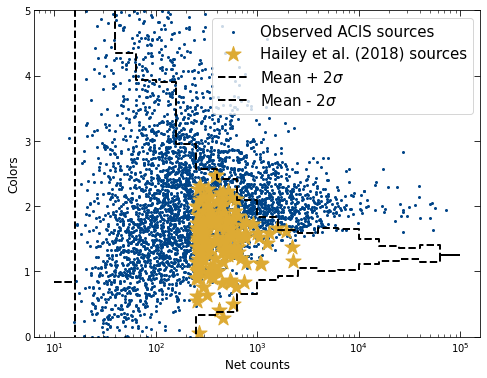

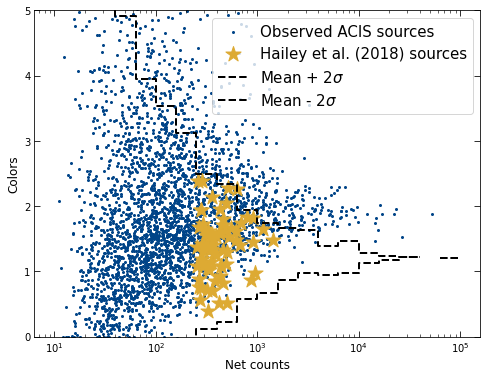

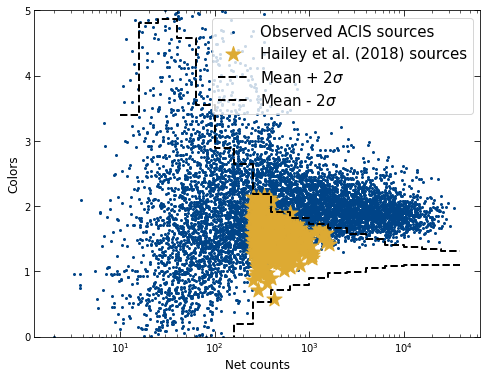

In [392]:
cvs_as_msps_colors_pn, cvs_as_msps_netcounts_pn = mark_interested_srcs(
    sim_msps_color_dict_arr[0], sim_ips_color_dict_arr[0],
    spec_summary_msp_cvs['src_nums'][0], spec_summary_msp_cvs['spec_masks'][1][0],
    cvs_as_msps_pn)
cvs_as_msps_colors_mos, cvs_as_msps_netcounts_mos = mark_interested_srcs(
    sim_msps_color_dict_arr[1], sim_ips_color_dict_arr[1],
    spec_summary_msp_cvs['src_nums'][0], spec_summary_msp_cvs['spec_masks'][1][1],
    cvs_as_msps_mos)
cvs_as_msps_colors_acis, cvs_as_msps_netcounts_acis = mark_interested_srcs(
    sim_msps_color_dict_arr[2], sim_ips_color_dict_arr[2],
    spec_summary_msp_cvs['src_nums'][1], spec_summary_msp_cvs['spec_masks'][1][2],
    cvs_as_msps_acis)

In [275]:
spec_summary_cvs['src_nums'][0]

NameError: name 'spec_summary_cvs' is not defined

In [393]:
fit_stats_arr = [[pn_fit_stats_table_pl_cv, pn_fit_stats_table_pl_g_cv,
                  pn_fit_stats_table_pl_g2_cv],
                 [mos_fit_stats_table_pl_cv, mos_fit_stats_table_pl_g_cv,
                  mos_fit_stats_table_pl_g2_cv],
                 [acis_fit_stats_table_pl_cv, acis_fit_stats_table_pl_g_sim,
                  acis_fit_stats_table_pl_g2_sim]]

model_params_arr = [[pn_model_params_table_pl_cv, pn_model_params_table_pl_g_cv,
                     pn_model_params_table_pl_g2_cv],
                    [mos_model_params_table_pl_cv,
                     mos_model_params_table_pl_g_cv,
                     mos_model_params_table_pl_g2_cv],
                    [acis_model_params_table_pl_cv,
                     acis_model_params_table_pl_g_sim,
                     acis_model_params_table_pl_g2_sim]]

det_names = ['PN', 'MOS', 'ACIS']
model_names = ['PL', 'PL_Gauss', 'PL_Gauss3']

for i in range(3):
    for j in range(3):
        fits_file_name = ('Fit_stats_CV_' + det_names[i] + '_' + model_names[j] +
                          '.txt')
        model_file_name = ('Model_params_CV_' + det_names[i] + '_' + model_names[j] +
                          '.txt')
        print(fits_file_name, model_file_name)
        np.savetxt(fits_file_name, fit_stats_arr[i][j], fmt='%s')
        np.savetxt(model_file_name, model_params_arr[i][j], fmt='%s')

Fit_stats_CV_PN_PL.txt Model_params_CV_PN_PL.txt
Fit_stats_CV_PN_PL_Gauss.txt Model_params_CV_PN_PL_Gauss.txt
Fit_stats_CV_PN_PL_Gauss3.txt Model_params_CV_PN_PL_Gauss3.txt
Fit_stats_CV_MOS_PL.txt Model_params_CV_MOS_PL.txt
Fit_stats_CV_MOS_PL_Gauss.txt Model_params_CV_MOS_PL_Gauss.txt
Fit_stats_CV_MOS_PL_Gauss3.txt Model_params_CV_MOS_PL_Gauss3.txt
Fit_stats_CV_ACIS_PL.txt Model_params_CV_ACIS_PL.txt
Fit_stats_CV_ACIS_PL_Gauss.txt Model_params_CV_ACIS_PL_Gauss.txt
Fit_stats_CV_ACIS_PL_Gauss3.txt Model_params_CV_ACIS_PL_Gauss3.txt


# Checking for CVs detected as MSPs

In [412]:
def get_netcounthist_fraction(netcount_bins_arr, cand_netcounts_arr,
                              int_netcounts_arr, det_names_arr):
    """Get histogram of candidate sources based on a property."""
    interested_srcs_histogram = []
    candidate_srcs_histogram = []
    ratios = []
    err_ratios = []
    for i, netcount_bins in enumerate(netcount_bins_arr):
        print(netcount_bins)
        int_hist = np.histogram(int_netcounts_arr[i], bins=netcount_bins)[0]
        print(int_hist)
        cand_hist = np.histogram(cand_netcounts_arr[i], bins=netcount_bins)[0]
        print(cand_hist)
        ratio = cand_hist/int_hist
        err_ratio = ((cand_hist+1)**-0.5 + (int_hist+1)**-0.5)*ratio
        err_ratio[ratio==0] = 1.0/int_hist[ratio==0]
        print(ratio)
        print(err_ratio)
        
        interested_srcs_histogram.append(int_hist)
        candidate_srcs_histogram.append(cand_hist)
        ratios.append(ratio)
        err_ratios.append(err_ratio)
        
    fig, ax1 = plt.subplots()
    ax1.set_xlabel('Net counts')
    ax1.set_xscale('log')
    ax1.set_xlim(250,2.0E+6)
    ax1.set_ylabel('# of simulated CVs per bin')
    ax1.hist(int_netcounts_arr, bins=netcount_bins,
             color=['#6699cc', '#ee99aa', '#eecc66'])
    ax1.legend(det_names_arr, loc='lower right')
    
    ax2 = ax1.twinx()
    ax2.set_ylabel(r'$p(NL|CV)$')
    ax2.set_ylim(0, 1.0)
    line_colors = ['#004488', '#994455', '#997700']
    for i, netcount_bins in enumerate(netcount_bins_arr):
        ax2.errorbar(0.5*(netcount_bins[1:]+netcount_bins[:-1]),
                     ratios[i],
                     yerr=err_ratios[i], capsize=15, color=line_colors[i],
                     label=det_names_arr[i], capthick=3)
    ax2.legend()
    return (interested_srcs_histogram, candidate_srcs_histogram, ratios,
            err_ratios)

In [418]:
netcount_bins_2 = np.logspace(np.log10(250), 6.3, 6)

In [419]:
netcount_bins_2

array([2.50000000e+02, 1.50782871e+03, 9.09418962e+03, 5.48499206e+04,
       3.30817139e+05, 1.99526231e+06])

In [420]:
set_plotparams('presentation')

[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[110  45  12   5   6]
[54 21  6  4  1]
[0.49090909 0.46666667 0.5        0.8        0.16666667]
[0.1127892  0.16829991 0.32765729 0.68436951 0.18084521]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[91 38 10  6  7]
[40  9  6  2  3]
[0.43956044 0.23684211 0.6        0.33333333 0.42857143]
[0.11447515 0.11282114 0.40768549 0.31843825 0.3658086 ]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[117   7   3   3   0]
[70  7  3  3  0]
[0.5982906 1.        1.        1.              nan]
[0.12608114 0.70710678 1.         1.                nan]


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


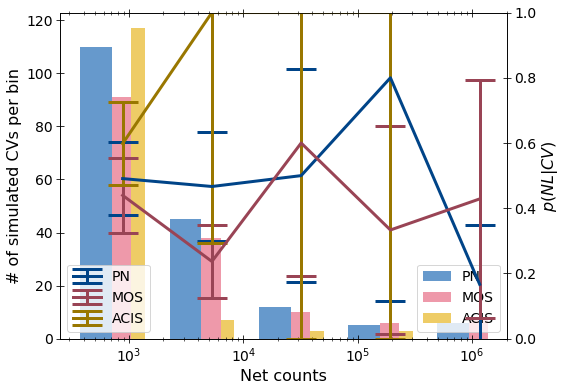

In [421]:
(interested_msp_histogram, candidate_msp_histogram, ratios_msp,
            err_ratios_msp) = get_netcounthist_fraction(
    [netcount_bins_2, netcount_bins_2, netcount_bins_2],
    [candidate_msp_netcounts_pn, candidate_msp_netcounts_mos,
     candidate_msp_netcounts_acis],
    [interested_msp_netcounts_pn, interested_msp_netcounts_mos,
     interested_msp_netcounts_acis], ['PN', 'MOS', 'ACIS'])

[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[975  32   0   0   0]
[157   4   0   0   0]
[0.16102564 0.125             nan        nan        nan]
[0.01796482 0.07766141        nan        nan        nan]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[581  18   0   0   0]
[75  0  0  0  0]
[0.12908778 0.                nan        nan        nan]
[0.02015824 0.05555556        nan        nan        nan]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[954 115   0   0   0]
[278   2   0   0   0]
[0.29140461 0.0173913         nan        nan        nan]
[0.02687557 0.01165562        nan        nan        nan]


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


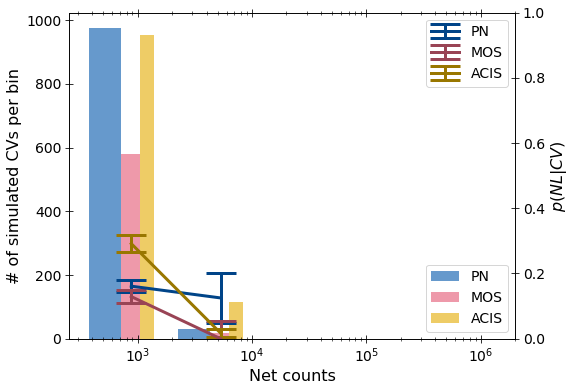

In [422]:
(interested_cvs_histogram, cvs_as_msps_histogram, ratios_cv_as_msp,
            err_ratios_cv_as_msp) = get_netcounthist_fraction(
    [netcount_bins_2, netcount_bins_2, netcount_bins_2],
    [cvs_as_msps_netcounts_pn, cvs_as_msps_netcounts_mos,
     cvs_as_msps_netcounts_acis],
    [interested_cv_netcounts_pn, interested_cv_netcounts_mos,
     interested_cv_netcounts_acis], ['PN', 'MOS', 'ACIS'])

In [580]:
def get_const(yvals, err):
    nan_yvals = np.isnan(yvals)
    nan_errs = np.isnan(err)
    nan_vals = np.logical_or(nan_yvals, nan_errs)
    return np.sum((yvals/err**2)[~nan_vals])/np.sum((1.0/err**2)[~nan_vals])

In [581]:
get_const(ratios_msp[0], err_ratios_msp[0])

0.48221946585984277

In [582]:
get_const(ratios_msp[1], err_ratios_msp[1])

0.3085203594198758

In [583]:
get_const(ratios_msp[2], err_ratios_msp[2])

0.6104863018305752

[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[168  66  17   7   6]
[110  45  12   5   6]
[0.6547619  0.68181818 0.70588235 0.71428571 1.        ]
[0.11294508 0.18556547 0.3749723  0.58941291 0.81649658]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[116  53  12   7   7]
[91 38 10  6  7]
[0.78448276 0.71698113 0.83333333 0.85714286 1.        ]
[0.15507353 0.21479463 0.50408575 0.67389665 0.75592895]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[262  19   4   3   0]
[117   7   3   3   0]
[0.44656489 0.36842105 0.75       1.                nan]
[0.06887381 0.22377166 0.8080127  1.15470054        nan]


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in power
  from ipykernel import kernelapp as app


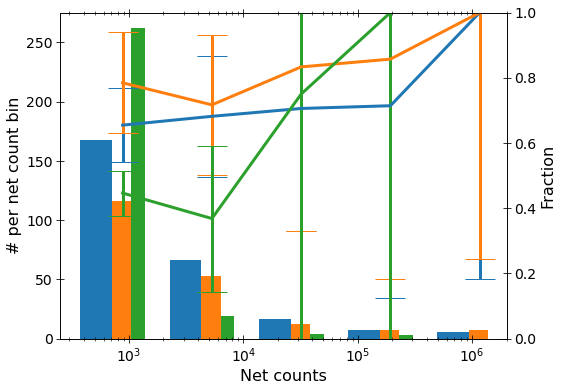

2:13: E127 continuation line over-indented for visual indent
6:80: E501 line too long (80 > 79 characters)


In [584]:
(netcount_obs_histogram, int_obs_histogram, ratios_int_obs,
            err_ratios_int_obs) = get_netcounthist_fraction(
    [netcount_bins_2, netcount_bins_2, netcount_bins_2],
    [interested_msp_netcounts_pn, interested_msp_netcounts_mos,
     interested_msp_netcounts_acis],
    [spec_summary_msps['counts'][0][0][1], spec_summary_msps['counts'][0][1][1],
     spec_summary_msps['counts'][0][2][1]], ['PN', 'MOS', 'ACIS'])

[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[1529  355   37    2    0]
[975  32   0   0   0]
[0.63767168 0.09014085 0.         0.                nan]
[0.03672956 0.02071898        nan        nan        nan]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[872 127  14   0   0]
[581  18   0   0   0]
[0.6662844  0.14173228 0.                nan        nan]
[0.05020537 0.04598333        nan        nan        nan]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[2438 1841  337    0    0]
[954 115   0   0   0]
[0.39130435 0.06246605 0.                nan        nan]
[0.02059392 0.00728084        nan        nan        nan]


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in power
  from ipykernel import kernelapp as app
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in multiply
  from ipykernel import kernelapp as app


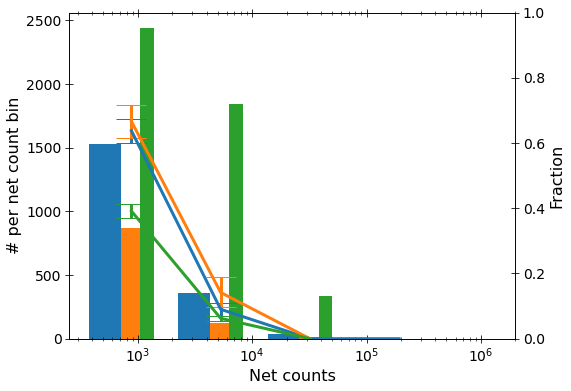

2:13: E127 continuation line over-indented for visual indent


In [585]:
(netcount_cvsim_histogram, int_cvsim_histogram, ratios_int_cvsim,
            err_ratios_int_cvsim) = get_netcounthist_fraction(
    [netcount_bins_2, netcount_bins_2, netcount_bins_2],
    [interested_cv_netcounts_pn, interested_cv_netcounts_mos,
     interested_cv_netcounts_acis],
    [spec_summary_msp_cvs['counts'][0][0][1],
     spec_summary_msp_cvs['counts'][0][1][1],
     spec_summary_msp_cvs['counts'][0][2][1]], ['PN', 'MOS', 'ACIS'])

In [586]:
def get_cvprob(p_nl_cvsim, p_nl_obs, p1_msp, p1_obs, p1_cv):
    p_nl_cvsim[np.isnan(p_nl_cvsim)] = 0.0
    p1_obs[np.isnan(p1_obs)] = 1.0
    p1_cv[np.isnan(p1_cv)] = 0.0
    return p_nl_cvsim/p_nl_obs*((p1_msp - p1_obs)/(p1_msp - p1_cv))

In [587]:
pn_cvprob1 = get_cvprob(ratios_cv_as_msp[0], 0.31, 0.95, ratios_int_obs[0],
                        ratios_int_cvsim[0])

In [588]:
pn_cvprob2 = get_cvprob(ratios_cv_as_msp[0], ratios_msp[0], 0.95,
                        ratios_int_obs[0], ratios_int_cvsim[0])

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


In [589]:
mos_cvprob1 = get_cvprob(ratios_cv_as_msp[1], 0.31, 0.95,
                         ratios_int_obs[1], ratios_int_cvsim[1])

In [553]:
mos_cvprob2 = get_cvprob(ratios_cv_as_msp[1], ratios_msp[1], 0.95,
                         ratios_int_obs[1], ratios_int_cvsim[1])

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


In [554]:
acis_cvprob1 = get_cvprob(ratios_cv_as_msp[2], 0.59, 0.95, ratios_int_obs[2],
           ratios_int_cvsim[2])

2:12: E128 continuation line under-indented for visual indent


In [555]:
acis_cvprob2 = get_cvprob(ratios_cv_as_msp[2], ratios_msp[2], 0.95, ratios_int_obs[2],
           ratios_int_cvsim[2])

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """
1:80: E501 line too long (86 > 79 characters)
2:12: E128 continuation line under-indented for visual indent


In [560]:
pn_cvprob3*candidate_msp_histogram[0]

array([8.16725979, 1.890625  , 2.16666667, 0.        , 0.        ,
              nan, 0.        ,        nan,        nan,        nan])

In [564]:
pn_cvprob1*candidate_msp_histogram[0]*ratios_int_cvsim[0]/ratios_int_obs[0]

array([34.46392719,  1.84055989,  0.40890751,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        , -0.        , -0.        ])

In [565]:
pn_cvprob2*candidate_msp_histogram[0]*ratios_int_cvsim[0]/ratios_int_obs[0]

array([19.54356846,  1.5361596 ,  0.20915619,  0.        ,  0.        ,
               nan,  0.        ,         nan,         nan,         nan])

In [566]:
mos_cvprob3*candidate_msp_histogram[1]

array([4.56267409, 2.04081633, 0.        , 0.        , 0.        ,
       0.        , 0.        ,        nan, 0.        ,        nan])

In [567]:
mos_cvprob1*candidate_msp_histogram[1]*ratios_int_cvsim[1]/ratios_int_obs[1]

array([ 7.40518108,  1.0912016 ,  0.        ,  0.        , -0.        ,
        0.        ,  0.        , -0.        , -0.        , -0.        ])

In [568]:
mos_cvprob2*candidate_msp_histogram[1]*ratios_int_cvsim[1]/ratios_int_obs[1]

array([ 4.50618982,  0.98879653,  0.        ,  0.        , -0.        ,
        0.        ,  0.        ,         nan, -0.        ,         nan])

In [569]:
acis_cvprob3*candidate_msp_histogram[2]

array([15.06040268,  1.43816254,  0.        ,  0.        ,  0.        ,
        0.        ,         nan,         nan,         nan,         nan])

In [570]:
acis_cvprob1*candidate_msp_histogram[2]*ratios_int_cvsim[2]/ratios_int_obs[2]

array([ 3.17578289e+01,  1.77084254e+00,  3.17389247e-02,  0.00000000e+00,
        0.00000000e+00, -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00])

In [572]:
acis_cvprob2*candidate_msp_histogram[2]*ratios_int_cvsim[2]/ratios_int_obs[2]

array([ 3.05710890e+01,  1.92885618e+00,  1.87259656e-02,  0.00000000e+00,
        0.00000000e+00, -0.00000000e+00,             nan,             nan,
                   nan,             nan])

In [410]:
candidate_msp_histogram

[array([54, 21,  5,  4,  0]),
 array([40,  8,  5,  1,  2]),
 array([70,  7,  2,  0,  0])]

In [122]:
37*0.7

25.9

In [445]:
ratio_msp_msp = [np.array([0.88839779, 0.87845304, 0.84, 1., np.nan]),
                 np.array([0.89150943, 0.87012987, 0.875, 1., np.nan]),
                 np.array([0.89489619, 0.88328267, 0.87857143, np.nan, np.nan])
                ]
err_ratio_msp_msp = [np.array([0.06082695, 0.13456308, 0.34382616, 1.15470054,
                               np.nan]),
                     np.array([0.08903832, 0.20404155, 0.60102588, 1.41421356,
                               np.nan]),
                     np.array([0.0382766, 0.04493553, 0.10831334, np.nan,
                               np.nan])
                ]

In [428]:
def get_cvprob2(p_nl1_cv1, p_nl1, p_nl1_nl1):
    prob = p_nl1_cv1/p_nl1*(p_nl1_nl1 - p_nl1)/(p_nl1_nl1 - p_nl1_cv1)
    prob[prob < 0] = 0
    return prob

In [441]:
ratios_msp

[array([0.49090909, 0.46666667, 0.5       , 0.8       , 0.16666667]),
 array([0.43956044, 0.23684211, 0.6       , 0.33333333, 0.42857143]),
 array([0.5982906, 1.       , 1.       , 1.       ,       nan])]

In [442]:
ratios_cv_as_msp

[array([0.16102564, 0.125     ,        nan,        nan,        nan]),
 array([0.12908778, 0.        ,        nan,        nan,        nan]),
 array([0.29140461, 0.0173913 ,        nan,        nan,        nan])]

In [430]:
get_cvprob2(ratios_cv_as_msp[0], ratios_msp[0], ratio_msp_msp[0])

array([0.1792512 , 0.14639256,        nan,        nan,        nan])

In [464]:
ratios_int_cvsim[0]/ratios_int_obs[0]

array([0.97389857, 0.13220657, 0.        , 0.        , 0.        ])

In [431]:
pn_cvprob3 = get_cvprob2(ratios_cv_as_msp[0], ratios_msp[0], ratio_msp_msp[0])

In [437]:
mos_cvprob3 = get_cvprob2(ratios_cv_as_msp[1], ratios_msp[1], ratio_msp_msp[1])

In [438]:
acis_cvprob3 = get_cvprob2(ratios_cv_as_msp[2], ratios_msp[2], ratio_msp_msp[2])

In [439]:
print(pn_cvprob3)
print(mos_cvprob3)
print(acis_cvprob3)

[0.1792512  0.14639256        nan        nan        nan]
[0.17408475 0.                nan        nan        nan]
[0.23938248 0.                nan        nan        nan]


In [491]:
netcount_bins_2

array([2.50000000e+02, 1.50782871e+03, 9.09418962e+03, 5.48499206e+04,
       3.30817139e+05, 1.99526231e+06])

In [774]:
print(pn_cvprob1)
print(pn_cvprob2)
print(pn_cvprob3)

[ 0.49101456  0.12576226  0.          0.         -0.        ]
[0.3100666  0.08354207 0.         0.                nan]
[0.19904012 0.16326531 0.         0.                nan]


In [591]:
print(mos_cvprob1)
print(mos_cvprob2)
print(mos_cvprob3)

[ 0.2429313  0.         0.         0.        -0.       ]
[ 0.18308003  0.10941857  0.          0.         -0.          0.
  0.                 nan -0.                 nan]
[0.16898793 0.15698587 0.         0.         0.         0.
 0.                nan 0.                nan]


In [592]:
print(acis_cvprob1)
print(acis_cvprob2)
print(acis_cvprob3)

[ 0.52910217  0.17440853  0.02612776  0.          0.         -0.
 -0.         -0.         -0.         -0.        ]
[ 0.50933045  0.18997114  0.01541538  0.          0.         -0.
         nan         nan         nan         nan]
[0.26421759 0.11062789 0.         0.         0.         0.
        nan        nan        nan        nan]


In [443]:
def err_cvprob3(p_nl1_cv1, p_nl1, p_nl1_nl1, e_nl1_cv1, e_nl1, e_nl1_nl1):
    diff_num = p_nl1_nl1 - p_nl1
    diff_num[diff_num < 0] = 0
    err_term1 = (p_nl1_cv1 / p_nl1 * (p_nl1 - p_nl1_cv1) /
                 (p_nl1_nl1 - p_nl1_cv1)**2) * e_nl1_nl1
    err_term2 = (p_nl1_cv1 * p_nl1_nl1 / p_nl1**2 *
                 1.0 / (p_nl1_nl1 - p_nl1_cv1)) * e_nl1
    err_term3 = (p_nl1_nl1 /p_nl1 * diff_num /
                 (p_nl1_nl1 - p_nl1_cv1)**2) * e_nl1_cv1
    return err_term1 + err_term2 + err_term3

In [447]:
pn_cvprob3_err = err_cvprob3(ratios_cv_as_msp[0], ratios_msp[0],
                             ratio_msp_msp[0], err_ratios_cv_as_msp[0],
                             err_ratios_msp[0], err_ratio_msp_msp[0],)
mos_cvprob3_err = err_cvprob3(ratios_cv_as_msp[1], ratios_msp[1],
                              ratio_msp_msp[1], err_ratios_cv_as_msp[1],
                              err_ratios_msp[1], err_ratio_msp_msp[1],)
acis_cvprob3_err = err_cvprob3(ratios_cv_as_msp[2], ratios_msp[2],
                               ratio_msp_msp[2], err_ratios_cv_as_msp[2],
                               err_ratios_msp[2], err_ratio_msp_msp[2])

In [453]:
print(pn_cvprob3)
print(pn_cvprob3_err)
print(pn_cvprob3*candidate_msp_histogram[0])
print(pn_cvprob3_err*candidate_msp_histogram[0])

[0.1792512  0.14639256        nan        nan        nan]
[0.12891315 0.24036172        nan        nan        nan]
[9.67956498 3.07424382        nan        nan        nan]
[6.96131027 5.04759613        nan        nan        nan]


In [454]:
print(mos_cvprob3)
print(mos_cvprob3_err)
print(mos_cvprob3*candidate_msp_histogram[1])
print(mos_cvprob3_err*candidate_msp_histogram[1])

[0.17408475 0.                nan        nan        nan]
[0.1351852  0.17072047        nan        nan        nan]
[6.96339007 0.                nan        nan        nan]
[5.40740817 1.53648425        nan        nan        nan]


In [455]:
print(acis_cvprob3)
print(acis_cvprob3_err)
print(acis_cvprob3*candidate_msp_histogram[2])
print(acis_cvprob3_err*candidate_msp_histogram[2])

[0.23938248 0.                nan        nan        nan]
[0.20065051 0.01356868        nan        nan        nan]
[16.75677366  0.                 nan         nan         nan]
[14.04553556  0.09498077         nan         nan         nan]


In [451]:
def plot_cvestimate(netcount_bins_arr, nl_netcounts_arr, prob, prob_err,
                    det_names_arr=None):
    if det_names_arr is None:
        det_names_arr = ['PN', 'MOS', 'ACIS']
    fig, ax1 = plt.subplots()
    ax1.set_xlabel('Net counts')
    ax1.set_xscale('log')
    ax1.set_xlim(250,2.0E+6)
    ax1.set_ylabel('# of candidate continuum sources per bin')
    ax1.hist(nl_netcounts_arr, bins=netcount_bins_arr[0],
             color=['#6699cc', '#ee99aa', '#eecc66'])
    ax1.legend(det_names_arr, loc='center right')
    
    ax2 = ax1.twinx()
    ax2.set_ylabel(r'$p(CV|NL)$')
    ax2.set_ylim(0, 1.0)
    line_colors = ['#004488', '#994455', '#997700']
    for i, netcount_bins in enumerate(netcount_bins_arr):
        ax2.errorbar(0.5*(netcount_bins[1:]+netcount_bins[:-1]),
                     prob[i],
                     yerr=prob_err[i], capsize=15, color=line_colors[i],
                     label=det_names_arr[i], capthick=3)
    ax2.legend()

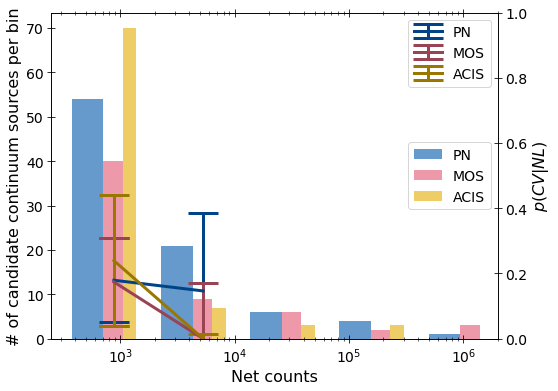

In [452]:
plot_cvestimate(
    [netcount_bins_2, netcount_bins_2, netcount_bins_2],
    [candidate_msp_netcounts_pn, candidate_msp_netcounts_mos,
     candidate_msp_netcounts_acis], [pn_cvprob3, mos_cvprob3, acis_cvprob3],
    [pn_cvprob3_err, mos_cvprob3_err, acis_cvprob3_err])

# Spectral Analaysis of simulated MSPs

In [800]:
def get_candidate_src_nums_alldet_sim(spec_summary, sim_color_dict_arr,
                                      min_count_arr=None, min_counts2=None):
    """Get source nums for all detectors."""
    interested_args_alldet = []
    interested_sources_alldet = []
    if min_count_arr is None:
        min_count_arr = [250, 250, 250]
    for i, sim_color_dict in enumerate(sim_color_dict_arr):
        src_nums = np.arange(len(spec_summary['specs'][0][i]))
        interested_args, interested_srcs = get_candidate_src_nums_det(
            src_nums, spec_summary['spec_masks'][0][i],
            sim_color_dict, sim_color_dict, min_count_arr[i], min_counts2)
        interested_args_alldet.append(interested_args)
        interested_sources_alldet.append(interested_srcs)
    return interested_args_alldet, interested_sources_alldet

In [801]:
sim_msp_interested_args_alldet, sim_msp_interested_alldet = get_candidate_src_nums_alldet_sim(
    spec_summary_msps, sim_msps_color_dict_arr, min_count_arr=[150, 150, 150], min_counts2=250)

[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[0.8405164  2.03621255 1.63305682 1.56743663 1.5736705  1.66320801
 1.4331601  1.44713313 1.39609846 1.36984926 1.35086023 1.27893642
 1.31590127 1.33564778 1.334838   1.30071855 1.27144028 1.27383281
 1.26917868 1.24506393]
[0.         2.58517276 1.72972337 1.38681819 1.18129716 1.11575665
 0.75540094 0.56022382 0.51077116 0.36126324 0.24291962 0.17375792
 0.13254254 0.16428213 0.15864827 0.09633923 0.05725364 0.0421451
 0.0654287  0.        ]
250 1.4471331268500243 0.5602238243386048
5
251.18864315095823 1.4471331268500243 0.5602238243386048
316
398.1071705534973 1.396098460383752 0.5107711552472425
233
630.957344480193 1.3698492577015142 0.36126323889561407
198
1000.

1:80: E501 line too long (94 > 79 characters)


In [808]:
np.min(sim_msps_color_dict_arr[0]['prop_list'][0][sim_msp_interested_args_alldet[0]])

250.32561761609358

(0.0, 5.0)

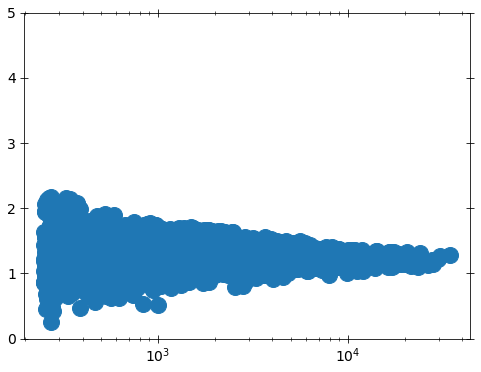

1:80: E501 line too long (90 > 79 characters)
2:80: E501 line too long (84 > 79 characters)


In [810]:
plt.scatter(sim_msps_color_dict_arr[2]['prop_list'][0][sim_msp_interested_args_alldet[2]],
            sim_msps_color_dict_arr[2]['colors'][sim_msp_interested_args_alldet[2]])
plt.xscale('log')
plt.ylim(0, 5)

In [821]:
def fit_src_pl_sim(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'msp_highNH_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'msp_highNH_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'msp_highNH_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')

    model = xspec.Model('tbabs*pegpwrlw')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.perform()
    xspec.Fit.error('2.706 2')
    xspec.Fit.perform()
    print('Calculating goodness')
    #goodness = xspec.Fit.goodness(1000)
    print('Finished calculating goodness')
    goodness = 50.0
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0])
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    if telescope == 'Chandra':
        os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0]])

20:9: E265 block comment should start with '# '
38:5: E265 block comment should start with '# '
50:80: E501 line too long (80 > 79 characters)


In [822]:
def fit_src_pl_gauss_sim(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'msp_highNH_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'msp_highNH_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'msp_highNH_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.7, 0.0001, 6.1, 6.1, 7.3, 7.3'
    model.gaussian.Sigma.values = '0.1 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 6')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    #xspec.Fit.error('2.706 6')
    #xspec.Fit.error('2.706 8')
    #goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_pos_low = xspec.AllModels(1).gaussian.LineE.error[0]
    line_pos_high = xspec.AllModels(1).gaussian.LineE.error[1]
    line_norm_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm_high = xspec.AllModels(1).gaussian.norm.error[1]
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_pos:', xspec.AllModels(1).gaussian.LineE.values[0],
          line_pos_low, line_pos_high,
          ' Fe_norm:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm_low, line_norm_high)
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.LineE.values[0], line_pos_low,
             line_pos_high,
             xspec.AllModels(1).gaussian.norm.values[0], line_norm_low,
             line_norm_high])


20:9: E265 block comment should start with '# '
27:1: W293 blank line contains whitespace
36:1: W293 blank line contains whitespace
46:5: E265 block comment should start with '# '
47:5: E265 block comment should start with '# '
48:5: E265 block comment should start with '# '
66:80: E501 line too long (80 > 79 characters)


In [823]:
def fit_src_pl_gauss2_sim(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'msp_highNH_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'msp_highNH_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'msp_highNH_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss+gauss+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.4 0'
    model.gaussian.Sigma.values = '0.0 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_4.LineE.values = '6.7 0'
    model.gaussian_4.Sigma.values = '0.0 0'
    model.gaussian_4.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_5.LineE.values = '7.0 0'
    model.gaussian_5.Sigma.values = '0.0 0'
    model.gaussian_5.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 11')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 14')
    # xspec.Fit.error('2.706 8')
    #goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_norm1_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm1_high = xspec.AllModels(1).gaussian.norm.error[1]
    line_norm2_low = xspec.AllModels(1).gaussian_4.norm.error[0]
    line_norm2_high = xspec.AllModels(1).gaussian_4.norm.error[1]
    line_norm3_low = xspec.AllModels(1).gaussian_5.norm.error[0]
    line_norm3_high = xspec.AllModels(1).gaussian_5.norm.error[1]
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_norms:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm1_low, line_norm1_high,
          xspec.AllModels(1).gaussian_4.norm.values[0], line_norm2_low,
          line_norm2_high, xspec.AllModels(1).gaussian_5.norm.values[0],
          line_norm3_low, line_norm3_high)
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.norm.values[0],
             xspec.AllModels(1).gaussian_4.norm.values[0],
             xspec.AllModels(1).gaussian_5.norm.values[0], line_norm1_low,
             line_norm1_high, line_norm2_low, line_norm2_high, line_norm3_low,
             line_norm3_high])


20:9: E265 block comment should start with '# '
27:1: W293 blank line contains whitespace
42:1: W293 blank line contains whitespace
54:5: E265 block comment should start with '# '
75:80: E501 line too long (80 > 79 characters)


In [825]:
sim_msp_interested_alldet[0][1]

6387

In [827]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_pn_mos_simspecs_1/')
xspec.AllData.clear()
fit_src_pl_sim(sim_msp_interested_alldet[0][1], src_folder='./')

Calculating goodness
Finished calculating goodness
Model params for 6387: NH =  8.54074841455814  Gamma:  1.569789884643647  norm:  0.13416502115814555
Fit stats for 6387:  226.09244438876829 -8.652789934141484 50.0 202




([6387, 226.09244438876829, -8.652789934141484, 50.0, 202],
 [6387, 8.54074841455814, 1.569789884643647, 0.13416502115814555])

1:80: E501 line too long (90 > 79 characters)


In [829]:
len(sim_msp_interested_alldet[0])

1113

In [830]:
pn_fit_stats_table_pl_msp = []
pn_model_params_table_pl_msp = []

for i, source_num in enumerate(sim_msp_interested_alldet[0]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_sim(source_num)
    pn_fit_stats_table_pl_msp.append(fit_stats)
    pn_model_params_table_pl_msp.append(model_params)

0 1323
Calculating goodness
Finished calculating goodness
Model params for 1323: NH =  32.16109288250541  Gamma:  2.4014868621863914  norm:  0.13219095343628834
Fit stats for 1323:  1288.862224442172 -7.0633652958120825 50.0 1131


1 6387
Calculating goodness
Finished calculating goodness
Model params for 6387: NH =  8.54074841455814  Gamma:  1.569789884643647  norm:  0.13416502115814555
Fit stats for 6387:  226.09244438876829 -8.652789934141484 50.0 202


2 6819
Calculating goodness
Finished calculating goodness
Model params for 6819: NH =  34.81483191640524  Gamma:  0.9706120925965527  norm:  0.5983717430917798
Fit stats for 6819:  92.94384134900314 -8.907245619289768 50.0 96


3 8374
Calculating goodness
Finished calculating goodness
Model params for 8374: NH =  16.965855004413125  Gamma:  1.9369101916812117  norm:  0.2203419544216631
Fit stats for 8374:  351.20214402883806 -8.136513741602897 50.0 366


4 9162
Calculating goodness
Finished calculating goodness
Model params for 9162:

Calculating goodness
Finished calculating goodness
Model params for 976: NH =  20.585211944018916  Gamma:  2.1264253040278356  norm:  0.6195463309254919
Fit stats for 976:  402.201602116658 -7.679732815101013 50.0 386


37 1016
Calculating goodness
Finished calculating goodness
Model params for 1016: NH =  19.4176596317013  Gamma:  0.8400982105954332  norm:  0.09261172872712703
Fit stats for 1016:  917.9403963730496 -7.160086867155377 50.0 848


38 1110
Calculating goodness
Finished calculating goodness
Model params for 1110: NH =  42.37497253935497  Gamma:  2.8032142585822393  norm:  0.3337099789696386
Fit stats for 1110:  466.53148064462397 -8.19792981751903 50.0 479


39 1148
Calculating goodness
Finished calculating goodness
Model params for 1148: NH =  9.586266991837407  Gamma:  1.4488242312481603  norm:  0.6152792764050712
Fit stats for 1148:  110.73650058843845 -9.217587236698739 50.0 123


40 1184
Calculating goodness
Finished calculating goodness
Model params for 1184: NH =  3

Calculating goodness
Finished calculating goodness
Model params for 2154: NH =  11.492286134332488  Gamma:  1.4628938601248114  norm:  0.8871252616858615
Fit stats for 2154:  102.98595327428158 -8.028163879988805 50.0 101


73 2176
Calculating goodness
Finished calculating goodness
Model params for 2176: NH =  17.912135532149485  Gamma:  1.0090129183009353  norm:  0.8808273657593221
Fit stats for 2176:  761.7970146185957 -7.747487506579561 50.0 781


74 2260
Calculating goodness
Finished calculating goodness
Model params for 2260: NH =  8.117270919980982  Gamma:  1.0435406620311074  norm:  0.44362931010124224
Fit stats for 2260:  955.537306931422 -7.401798919633246 50.0 879


75 2297
Calculating goodness
Finished calculating goodness
Model params for 2297: NH =  10.289859740093222  Gamma:  1.9880665782745583  norm:  0.9019986947411898
Fit stats for 2297:  196.63734303447154 -8.238966882920947 50.0 180


76 2302
Calculating goodness
Finished calculating goodness
Model params for 2302: N

Calculating goodness
Finished calculating goodness
Model params for 3268: NH =  16.86614248841131  Gamma:  1.1145288475979223  norm:  0.7461475831262943
Fit stats for 3268:  185.24968659853027 -7.676009190163736 50.0 167


109 3326
Calculating goodness
Finished calculating goodness
Model params for 3326: NH =  9.83917050894599  Gamma:  1.3525043813049482  norm:  0.6653645122177275
Fit stats for 3326:  105.51563318832939 -8.25962491104221 50.0 93


110 3332
Calculating goodness
Finished calculating goodness
Model params for 3332: NH =  10.24900305149575  Gamma:  1.8921634212216327  norm:  0.21099817001373392
Fit stats for 3332:  852.3376909559709 -7.397985645595187 50.0 835


111 3361
Calculating goodness
Finished calculating goodness
Model params for 3361: NH =  8.255892986213277  Gamma:  0.6305263056050386  norm:  0.40485739489624223
Fit stats for 3361:  1500.8687614503215 -7.307245766063777 50.0 1299


112 3373
Calculating goodness
Finished calculating goodness
Model params for 3373:

Calculating goodness
Finished calculating goodness
Model params for 4319: NH =  13.919480600746684  Gamma:  2.0492300854328094  norm:  0.24797200701232167
Fit stats for 4319:  263.9395783870338 -9.384235884135405 50.0 252


145 4377
Calculating goodness
Finished calculating goodness
Model params for 4377: NH =  6.490333838136021  Gamma:  0.009443174337039782  norm:  0.24532689190504345
Fit stats for 4377:  2615.4271787549696 -6.688757534427005 50.0 2453


146 4387
Calculating goodness
Finished calculating goodness
Model params for 4387: NH =  71.47447332181427  Gamma:  1.416123221700701  norm:  1.5766208913796165
Fit stats for 4387:  191.21915464114522 -7.55012034333364 50.0 192


147 4458
Calculating goodness
Finished calculating goodness
Model params for 4458: NH =  36.769210663349945  Gamma:  1.1294679697826904  norm:  0.9613265730617829
Fit stats for 4458:  697.4998555004263 -8.560620118842298 50.0 773


148 4481
Calculating goodness
Finished calculating goodness
Model params for 4

Calculating goodness
Finished calculating goodness
Model params for 5420: NH =  10.525656577645927  Gamma:  0.20581907047660086  norm:  0.5372323290280878
Fit stats for 5420:  64.19876993718341 -8.734616480194658 50.0 57


181 5457
Calculating goodness
Finished calculating goodness
Model params for 5457: NH =  7.413882101650069  Gamma:  0.9940655813124485  norm:  0.42283928874538507
Fit stats for 5457:  243.967052793907 -9.045137844850887 50.0 220


182 5489
Calculating goodness
Finished calculating goodness
Model params for 5489: NH =  41.289908816318075  Gamma:  0.8866208592160284  norm:  0.5254726891230918
Fit stats for 5489:  353.85870619122215 -8.830499161617416 50.0 316


183 5503
Calculating goodness
Finished calculating goodness
Model params for 5503: NH =  18.979546246418384  Gamma:  0.8814515004967757  norm:  0.8575792562763533
Fit stats for 5503:  99.52183005676258 -8.423416491571768 50.0 103


184 5555
Calculating goodness
Finished calculating goodness
Model params for 5555

Calculating goodness
Finished calculating goodness
Model params for 6624: NH =  20.646566151802823  Gamma:  1.6148054883925997  norm:  0.5593709005119651
Fit stats for 6624:  284.86638199821954 -8.197587740516957 50.0 256


217 6632
Calculating goodness
Finished calculating goodness
Model params for 6632: NH =  36.33855684091339  Gamma:  2.040637248187049  norm:  0.907554286404001
Fit stats for 6632:  170.67181977039883 -8.441468449873836 50.0 172


218 6644
Calculating goodness
Finished calculating goodness
Model params for 6644: NH =  23.931667879858228  Gamma:  0.9405193613362984  norm:  0.14620971283346978
Fit stats for 6644:  737.7292425523963 -8.130263946146771 50.0 672


219 6686
Calculating goodness
Finished calculating goodness
Model params for 6686: NH =  29.954265704153084  Gamma:  2.9489429038093338  norm:  0.25890320847346626
Fit stats for 6686:  1273.4445400767506 -6.983813336752583 50.0 1144


220 6701
Calculating goodness
Finished calculating goodness
Model params for 6

Calculating goodness
Finished calculating goodness
Model params for 7922: NH =  35.31515421990906  Gamma:  2.0332600229725664  norm:  0.6736460009403445
Fit stats for 7922:  57.35947725008046 -9.229102764832824 50.0 79


253 7953
Calculating goodness
Finished calculating goodness
Model params for 7953: NH =  6.094013533066841  Gamma:  0.5691969647087797  norm:  0.0372987581900714
Fit stats for 7953:  1945.4270277074982 -7.747930301070803 50.0 1766


254 8010
Calculating goodness
Finished calculating goodness
Model params for 8010: NH =  14.42515630637514  Gamma:  1.2553788589607837  norm:  0.07423521043925124
Fit stats for 8010:  1135.5960078004955 -7.157865716467163 50.0 1083


255 8011
Calculating goodness
Finished calculating goodness
Model params for 8011: NH =  12.77154439847664  Gamma:  0.05102494133118379  norm:  0.7197863763961948
Fit stats for 8011:  104.99030026222039 -8.87676819900012 50.0 104


256 8087
Calculating goodness
Finished calculating goodness
Model params for 808

Calculating goodness
Finished calculating goodness
Model params for 8969: NH =  8.75250278658786  Gamma:  0.94270107805167  norm:  0.24460241535425076
Fit stats for 8969:  650.2893293966661 -7.006859906633019 50.0 642


289 8977
Calculating goodness
Finished calculating goodness
Model params for 8977: NH =  9.82359922517141  Gamma:  1.32262356229232  norm:  0.33179368584684243
Fit stats for 8977:  400.6147692462172 -7.5009362041679735 50.0 390


290 9007
Calculating goodness
Finished calculating goodness
Model params for 9007: NH =  30.051708815530493  Gamma:  0.20640320538218745  norm:  0.7884919846582665
Fit stats for 9007:  1731.7291593258217 -5.8366500468813785 50.0 1518


291 9079
Calculating goodness
Finished calculating goodness
Model params for 9079: NH =  20.408878058207705  Gamma:  0.8231767739305109  norm:  0.5694536509143587
Fit stats for 9079:  234.76393797608878 -8.738368901622179 50.0 207


292 9155
Calculating goodness
Finished calculating goodness
Model params for 9155

Calculating goodness
Finished calculating goodness
Model params for 286: NH =  22.38596116041997  Gamma:  0.87032879754504  norm:  0.26311016381227914
Fit stats for 286:  1551.303568277191 -6.547277207952377 50.0 1501


325 359
Calculating goodness
Finished calculating goodness
Model params for 359: NH =  22.685701982799117  Gamma:  2.322749574702667  norm:  0.07704304201373262
Fit stats for 359:  3136.305231388522 -6.285950017005678 50.0 2910


326 381
Calculating goodness
Finished calculating goodness
Model params for 381: NH =  22.915771114488425  Gamma:  1.8351645229768492  norm:  0.6427229906191259
Fit stats for 381:  293.35091717196394 -9.345353037148017 50.0 282


327 386
Calculating goodness
Finished calculating goodness
Model params for 386: NH =  7.9483023931093255  Gamma:  1.2550931472078872  norm:  0.48930445897857516
Fit stats for 386:  128.5506726609643 -8.978988481117469 50.0 132


328 404
Calculating goodness
Finished calculating goodness
Model params for 404: NH =  14.

Calculating goodness
Finished calculating goodness
Model params for 1382: NH =  44.70012447838409  Gamma:  1.1692460427659135  norm:  0.6555796249057181
Fit stats for 1382:  328.5856056261522 -8.774158799525008 50.0 306


361 1385
Calculating goodness
Finished calculating goodness
Model params for 1385: NH =  60.83187700925497  Gamma:  2.752412054656299  norm:  2.1815789555092007
Fit stats for 1385:  3277.092124172599 -8.222803516176247 50.0 3193


362 1414
Calculating goodness
Finished calculating goodness
Model params for 1414: NH =  7.587501451845767  Gamma:  1.4423587060050629  norm:  0.7371705914293759
Fit stats for 1414:  192.08114257997943 -8.06789508884035 50.0 181


363 1444
Calculating goodness
Finished calculating goodness
Model params for 1444: NH =  19.53855308700578  Gamma:  1.3596113501991545  norm:  0.5836924493720483
Fit stats for 1444:  301.1011252231732 -8.016618345846545 50.0 256


364 1516
Calculating goodness
Finished calculating goodness
Model params for 1516: NH

Calculating goodness
Finished calculating goodness
Model params for 2917: NH =  14.306202404474408  Gamma:  2.079042707177784  norm:  0.17854016861634955
Fit stats for 2917:  1652.4949770721953 -9.248689495399294 50.0 1387


397 2926
Calculating goodness
Finished calculating goodness
Model params for 2926: NH =  10.545347239794678  Gamma:  1.0323607600419304  norm:  0.25259881879786544
Fit stats for 2926:  817.262916439003 -8.67263853367108 50.0 730


398 2975
Calculating goodness
Finished calculating goodness
Model params for 2975: NH =  28.308531120771622  Gamma:  0.7871369151706763  norm:  0.13673683441235504
Fit stats for 2975:  1059.1534248498838 -6.324808443589401 50.0 1017


399 3002
Calculating goodness
Finished calculating goodness
Model params for 3002: NH =  15.771072980341886  Gamma:  1.2530188025769828  norm:  0.1906392125850109
Fit stats for 3002:  691.872579240391 -8.234883945561293 50.0 643


400 3004
Calculating goodness
Finished calculating goodness
Model params for 3

Calculating goodness
Finished calculating goodness
Model params for 4351: NH =  7.292819004705635  Gamma:  1.116564339517526  norm:  0.21364255591459091
Fit stats for 4351:  344.8641263880065 -9.487487232099236 50.0 349


433 4397
Calculating goodness
Finished calculating goodness
Model params for 4397: NH =  34.780610307276504  Gamma:  2.156873988672718  norm:  0.9723295076381083
Fit stats for 4397:  353.217383542947 -9.226114460668903 50.0 339


434 4419
Calculating goodness
Finished calculating goodness
Model params for 4419: NH =  14.531749535671443  Gamma:  2.276302425596289  norm:  1.283511002016968
Fit stats for 4419:  180.04829186326646 -8.590303387028293 50.0 176


435 4427
Calculating goodness
Finished calculating goodness
Model params for 4427: NH =  27.011104404497186  Gamma:  3.4399447069040505  norm:  0.04180104808035905
Fit stats for 4427:  2740.7986722159985 -7.197731210253059 50.0 2696


436 4441
Calculating goodness
Finished calculating goodness
Model params for 4441:

Calculating goodness
Finished calculating goodness
Model params for 5476: NH =  9.990156467643194  Gamma:  0.6999677342892673  norm:  0.017121413397134203
Fit stats for 5476:  1766.9146766275114 -5.506320825314108 50.0 1728


469 5539
Calculating goodness
Finished calculating goodness
Model params for 5539: NH =  6.035443985301274  Gamma:  0.8416816091958598  norm:  0.7731278753598683
Fit stats for 5539:  230.9259073245664 -8.661822869414458 50.0 179


470 5630
Calculating goodness
Finished calculating goodness
Model params for 5630: NH =  10.337019258167212  Gamma:  2.693423849622467  norm:  0.5850968640081707
Fit stats for 5630:  851.1985377582117 -8.801904866330883 50.0 826


471 5632
Calculating goodness
Finished calculating goodness
Model params for 5632: NH =  13.843709381740382  Gamma:  1.2139942764831004  norm:  0.09530407742107203
Fit stats for 5632:  2502.9545626893846 -7.229628697127931 50.0 2305


472 5647
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 7142: NH =  12.994785170799155  Gamma:  0.8778557798539542  norm:  0.24167638131691946
Fit stats for 7142:  260.76975078120176 -9.234789703643457 50.0 233


505 7280
Calculating goodness
Finished calculating goodness
Model params for 7280: NH =  22.909471820041865  Gamma:  1.4372609572140644  norm:  0.7576466486666246
Fit stats for 7280:  93.43445623618958 -9.719375655271064 50.0 96


506 7385
Calculating goodness
Finished calculating goodness
Model params for 7385: NH =  5.571884392074083  Gamma:  1.5642308167658632  norm:  0.5041191606801562
Fit stats for 7385:  152.66765731218004 -9.467292397916268 50.0 172


507 7395
Calculating goodness
Finished calculating goodness
Model params for 7395: NH =  72.50030862710445  Gamma:  1.7524006406132646  norm:  0.0467005284155335
Fit stats for 7395:  3373.558871935967 -4.952436191783981 50.0 3159


508 7407
Calculating goodness
Finished calculating goodness
Model params for 740

Calculating goodness
Finished calculating goodness
Model params for 9567: NH =  24.468574800475704  Gamma:  1.3020139324475524  norm:  0.3419279551585104
Fit stats for 9567:  740.372451651364 -8.04564212099453 50.0 660


541 9612
Calculating goodness
Finished calculating goodness
Model params for 9612: NH =  9.461956600417459  Gamma:  1.3046299228126876  norm:  0.26880687610827275
Fit stats for 9612:  205.74575313262037 -8.650920965045641 50.0 194


542 9615
Calculating goodness
Finished calculating goodness
Model params for 9615: NH =  30.97814939375444  Gamma:  1.2266623863532902  norm:  0.3318371914708797
Fit stats for 9615:  2242.617310994914 -8.459398180372176 50.0 2158


543 9649
Calculating goodness
Finished calculating goodness
Model params for 9649: NH =  40.85904845828346  Gamma:  1.85131622659486  norm:  0.7982647699273998
Fit stats for 9649:  190.16940957885487 -9.573594278528361 50.0 173


544 9685
Calculating goodness
Finished calculating goodness
Model params for 9685: N

Calculating goodness
Finished calculating goodness
Model params for 1167: NH =  8.568315106800048  Gamma:  1.6065982357006665  norm:  1.2286544743423355
Fit stats for 1167:  94.90860963282908 -9.626838568078606 50.0 97


577 1219
Calculating goodness
Finished calculating goodness
Model params for 1219: NH =  70.56532728932267  Gamma:  1.4349647163577326  norm:  1.0940255866216475
Fit stats for 1219:  360.93805234638 -8.364212318389688 50.0 371


578 1250
Calculating goodness
Finished calculating goodness
Model params for 1250: NH =  11.513947553301676  Gamma:  1.3005579346726055  norm:  0.48776370298400523
Fit stats for 1250:  196.28177124087878 -9.229996867658372 50.0 173


579 1251
Calculating goodness
Finished calculating goodness
Model params for 1251: NH =  17.304695694544815  Gamma:  1.944165336270427  norm:  0.9280129599833488
Fit stats for 1251:  438.0771004459703 -9.756119704555147 50.0 399


580 1256
Calculating goodness
Finished calculating goodness
Model params for 1256: NH

Calculating goodness
Finished calculating goodness
Model params for 3124: NH =  15.7856052665792  Gamma:  1.4643412468203236  norm:  0.15705476916498165
Fit stats for 3124:  2763.675799767737 -9.080075654384975 50.0 2401


613 3186
Calculating goodness
Finished calculating goodness
Model params for 3186: NH =  13.578631530056796  Gamma:  0.8527139543324506  norm:  0.1171819327070026
Fit stats for 3186:  1784.793479766572 -8.969586784637011 50.0 1625


614 3234
Calculating goodness
Finished calculating goodness
Model params for 3234: NH =  15.19923267178927  Gamma:  2.0887276042473886  norm:  0.24561600130862205
Fit stats for 3234:  1573.9223868381837 -7.289536251264754 50.0 1387


615 3250
Calculating goodness
Finished calculating goodness
Model params for 3250: NH =  12.331712359037883  Gamma:  2.0015878408160033  norm:  0.9336278419781241
Fit stats for 3250:  248.85942138930753 -9.679977196588014 50.0 251


616 3262
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 4637: NH =  13.946017431370773  Gamma:  1.7417823093409766  norm:  0.9379906957511635
Fit stats for 4637:  1029.2157899115246 -9.081820004483857 50.0 844


649 4651
Calculating goodness
Finished calculating goodness
Model params for 4651: NH =  50.77616179062587  Gamma:  1.8483176490077289  norm:  1.2649261870894923
Fit stats for 4651:  243.66313410533104 -10.231231023311643 50.0 246


650 4680
Calculating goodness
Finished calculating goodness
Model params for 4680: NH =  20.25223384389216  Gamma:  1.6322128439184918  norm:  1.3606208313329722
Fit stats for 4680:  118.95193558923683 -9.732334953406983 50.0 113


651 4745
Calculating goodness
Finished calculating goodness
Model params for 4745: NH =  9.517242744067435  Gamma:  1.5183871216075364  norm:  1.0723401022930859
Fit stats for 4745:  81.63606709388925 -9.328078212888919 50.0 78


652 4865
Calculating goodness
Finished calculating goodness
Model params for 4865

Calculating goodness
Finished calculating goodness
Model params for 6597: NH =  11.085327083489172  Gamma:  1.3444447664463086  norm:  1.198730479812622
Fit stats for 6597:  113.73336762880771 -9.531630879983767 50.0 111


685 6609
Calculating goodness
Finished calculating goodness
Model params for 6609: NH =  59.990827739295426  Gamma:  1.550908695790189  norm:  0.4095802663707609
Fit stats for 6609:  1964.1431780860496 -7.01393416034386 50.0 1786


686 6730
Calculating goodness
Finished calculating goodness
Model params for 6730: NH =  12.78307305850679  Gamma:  1.9542489966916343  norm:  0.3846044523657932
Fit stats for 6730:  232.9579989937658 -8.819166360765637 50.0 207


687 6731
Calculating goodness
Finished calculating goodness
Model params for 6731: NH =  6.764321111597742  Gamma:  1.3626442479137764  norm:  0.3686152786325496
Fit stats for 6731:  322.25045976982193 -9.035929214423351 50.0 285


688 6801
Calculating goodness
Finished calculating goodness
Model params for 6801:

Calculating goodness
Finished calculating goodness
Model params for 8060: NH =  19.483935193053807  Gamma:  1.3857211991149947  norm:  0.16788596238798
Fit stats for 8060:  1832.5697568045623 -8.27394253991677 50.0 1625


721 8064
Calculating goodness
Finished calculating goodness
Model params for 8064: NH =  14.640049183947756  Gamma:  1.5631293251801786  norm:  0.8474688325232153
Fit stats for 8064:  348.50397070515515 -10.499850506241463 50.0 317


722 8090
Calculating goodness
Finished calculating goodness
Model params for 8090: NH =  10.998995778391395  Gamma:  1.1360218596426686  norm:  0.5112305742880728
Fit stats for 8090:  245.6551070713519 -9.479710832378553 50.0 189


723 8150
Calculating goodness
Finished calculating goodness
Model params for 8150: NH =  8.505695684440203  Gamma:  1.3454707349833552  norm:  0.6344503799156147
Fit stats for 8150:  292.6469655095859 -9.612693858169068 50.0 253


724 8223
Calculating goodness
Finished calculating goodness
Model params for 8223

Calculating goodness
Finished calculating goodness
Model params for 113: NH =  16.748358616597567  Gamma:  1.5586857028448202  norm:  1.124362930659072
Fit stats for 113:  884.7793067049176 -10.087125066972376 50.0 942


757 130
Calculating goodness
Finished calculating goodness
Model params for 130: NH =  18.798847587268142  Gamma:  1.5381061629213009  norm:  0.07006684123673011
Fit stats for 130:  1900.5626625896061 -7.1999533254317845 50.0 1728


758 155
Calculating goodness
Finished calculating goodness
Model params for 155: NH =  44.54634152649297  Gamma:  2.3823647319319066  norm:  0.9736045708895281
Fit stats for 155:  3328.3188493906137 -7.256266772979752 50.0 3195


759 336
Calculating goodness
Finished calculating goodness
Model params for 336: NH =  59.28222616555209  Gamma:  1.6366356075467308  norm:  1.3331139567675896
Fit stats for 336:  650.7557613260907 -8.999087344967759 50.0 620


760 405
Calculating goodness
Finished calculating goodness
Model params for 405: NH =  4

Calculating goodness
Finished calculating goodness
Model params for 2545: NH =  11.122383275442457  Gamma:  1.5496320148316192  norm:  0.42688170878764176
Fit stats for 2545:  701.8770938963585 -10.70187577898983 50.0 589


793 2629
Calculating goodness
Finished calculating goodness
Model params for 2629: NH =  20.576935994562596  Gamma:  1.1346845983086433  norm:  1.2100899503538431
Fit stats for 2629:  673.2341501607586 -9.745631654968115 50.0 600


794 2642
Calculating goodness
Finished calculating goodness
Model params for 2642: NH =  8.348775952055037  Gamma:  1.7187250319572172  norm:  0.22085546990074048
Fit stats for 2642:  836.305497237765 -9.019076383006961 50.0 782


795 2644
Calculating goodness
Finished calculating goodness
Model params for 2644: NH =  19.083865678892135  Gamma:  1.8934418537712006  norm:  1.0083032221091288
Fit stats for 2644:  331.11893942985023 -9.929366595665698 50.0 316


796 2663
Calculating goodness
Finished calculating goodness
Model params for 266

Calculating goodness
Finished calculating goodness
Model params for 4200: NH =  4.687298378181055  Gamma:  0.7562572156843128  norm:  0.3529387234453517
Fit stats for 4200:  384.6010563755221 -10.199631746017955 50.0 354


829 4292
Calculating goodness
Finished calculating goodness
Model params for 4292: NH =  7.9386732048331226  Gamma:  1.8696538764285122  norm:  0.9652744900227235
Fit stats for 4292:  123.69174544155275 -10.401607616302613 50.0 137


830 4370
Calculating goodness
Finished calculating goodness
Model params for 4370: NH =  11.40754596489582  Gamma:  2.1185445800993183  norm:  1.0777959160251156
Fit stats for 4370:  350.38813749528754 -10.502683976130855 50.0 282


831 4410
Calculating goodness
Finished calculating goodness
Model params for 4410: NH =  26.708243378160894  Gamma:  1.8343073851723437  norm:  1.0324704536668985
Fit stats for 4410:  303.9449037165085 -10.582860841639096 50.0 316


832 4420
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 6626: NH =  7.3768685283531035  Gamma:  0.99284055926022  norm:  0.256451472516951
Fit stats for 6626:  1128.882657345695 -9.350476691494054 50.0 1114


865 6679
Calculating goodness
Finished calculating goodness
Model params for 6679: NH =  13.658420191463279  Gamma:  1.8230043093160488  norm:  0.8177270566374737
Fit stats for 6679:  1000.5961168466768 -10.706843822857953 50.0 909


866 6692
Calculating goodness
Finished calculating goodness
Model params for 6692: NH =  22.80432185967684  Gamma:  1.3437489855961324  norm:  0.7974208432581957
Fit stats for 6692:  186.23970736647726 -10.488381163340726 50.0 179


867 6797
Calculating goodness
Finished calculating goodness
Model params for 6797: NH =  12.134881605049575  Gamma:  1.6165509948524375  norm:  0.734331984597189
Fit stats for 6797:  452.36118028654903 -10.297566720532567 50.0 433


868 6811
Calculating goodness
Finished calculating goodness
Model params for 68

Calculating goodness
Finished calculating goodness
Model params for 9238: NH =  28.098719192736475  Gamma:  1.6077280575161788  norm:  0.6262653430512145
Fit stats for 9238:  1191.87382281718 -10.086316028819013 50.0 1059


901 9285
Calculating goodness
Finished calculating goodness
Model params for 9285: NH =  38.27193609763433  Gamma:  1.8404844294295384  norm:  0.6499074319846939
Fit stats for 9285:  679.4183013029293 -8.457162291067856 50.0 587


902 9325
Calculating goodness
Finished calculating goodness
Model params for 9325: NH =  60.715876047128475  Gamma:  1.6174405724259835  norm:  1.2739737396243307
Fit stats for 9325:  823.3502822304497 -10.240557569708132 50.0 746


903 9356
Calculating goodness
Finished calculating goodness
Model params for 9356: NH =  14.747696354365914  Gamma:  1.5447422459290499  norm:  0.4377766422259465
Fit stats for 9356:  1351.0011151113263 -8.198404601339483 50.0 1155


904 9498
Calculating goodness
Finished calculating goodness
Model params for 9

Calculating goodness
Finished calculating goodness
Model params for 2993: NH =  12.395687053872363  Gamma:  1.622961580010822  norm:  0.7571553835792647
Fit stats for 2993:  2396.8668703631693 -9.448456279768497 50.0 2158


937 3051
Calculating goodness
Finished calculating goodness
Model params for 3051: NH =  45.56728743037517  Gamma:  2.5425030143279246  norm:  0.29732640250679004
Fit stats for 3051:  3156.2034420445893 -6.9718256043866935 50.0 2904


938 3204
Calculating goodness
Finished calculating goodness
Model params for 3204: NH =  7.9085236140746895  Gamma:  1.401400633721916  norm:  0.27537088021803335
Fit stats for 3204:  1512.5253129005212 -10.931950278207891 50.0 1357


939 3483
Calculating goodness
Finished calculating goodness
Model params for 3483: NH =  14.934479972488369  Gamma:  1.2813697431535969  norm:  0.7481995127660608
Fit stats for 3483:  944.490946291918 -10.183885633093434 50.0 921


940 3750
Calculating goodness
Finished calculating goodness
Model params f

Calculating goodness
Finished calculating goodness
Model params for 6962: NH =  79.9698408544506  Gamma:  1.8644860282270013  norm:  0.5690307629966611
Fit stats for 6962:  2900.325000354499 -8.720164056744707 50.0 2726


973 6975
Calculating goodness
Finished calculating goodness
Model params for 6975: NH =  11.867852057029141  Gamma:  2.18991165848647  norm:  0.046260973831235265
Fit stats for 6975:  3410.6546281360197 -7.7196375156147665 50.0 3159


974 7004
Calculating goodness
Finished calculating goodness
Model params for 7004: NH =  12.480158805206543  Gamma:  1.0284067300699815  norm:  0.7971226984181663
Fit stats for 7004:  389.5241565471966 -10.769961419585972 50.0 381


975 7081
Calculating goodness
Finished calculating goodness
Model params for 7081: NH =  23.558151586339672  Gamma:  1.8326493608540024  norm:  0.18932804632350214
Fit stats for 7081:  2911.2803886208176 -8.844036527465798 50.0 2726


976 7208
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 2059: NH =  8.561967088688395  Gamma:  1.083098838952138  norm:  1.1991854209951154
Fit stats for 2059:  3264.2782086627594 -8.991317956787837 50.0 3064


1009 2193
Calculating goodness
Finished calculating goodness
Model params for 2193: NH =  11.563868628601139  Gamma:  1.7015530826773302  norm:  0.8788166712291542
Fit stats for 2193:  847.8744380225422 -10.520332111269187 50.0 794


1010 2430
Calculating goodness
Finished calculating goodness
Model params for 2430: NH =  10.21496678971011  Gamma:  1.9465912393707578  norm:  0.6886352190101245
Fit stats for 2430:  885.523653304857 -10.95476607166921 50.0 887


1011 2525
Calculating goodness
Finished calculating goodness
Model params for 2525: NH =  37.922996932986635  Gamma:  1.15999845542204  norm:  0.21526240035131286
Fit stats for 2525:  3196.1121979149066 -10.425157314130459 50.0 3002


1012 3657
Calculating goodness
Finished calculating goodness
Model params for

Calculating goodness
Finished calculating goodness
Model params for 362: NH =  7.903290256022188  Gamma:  1.3960090326622736  norm:  0.10266733081236937
Fit stats for 362:  2758.6044711626464 -10.051702307204502 50.0 2696


1045 416
Calculating goodness
Finished calculating goodness
Model params for 416: NH =  7.853413077250441  Gamma:  1.2818842403744306  norm:  0.09623756924515027
Fit stats for 416:  3060.1980444573082 -9.872435857510224 50.0 3091


1046 530
Calculating goodness
Finished calculating goodness
Model params for 530: NH =  15.025927540112738  Gamma:  1.2276962857543703  norm:  0.36492136181699664
Fit stats for 530:  2813.446968798774 -12.135656446709705 50.0 2726


1047 635
Calculating goodness
Finished calculating goodness
Model params for 635: NH =  43.83690628859426  Gamma:  0.7498726628385723  norm:  0.31371087484067706
Fit stats for 635:  3331.442504521431 -7.597181174618271 50.0 3170


1048 820
Calculating goodness
Finished calculating goodness
Model params for 820

Calculating goodness
Finished calculating goodness
Model params for 5532: NH =  70.2078403139847  Gamma:  1.6588754987828416  norm:  0.44382084964661234
Fit stats for 5532:  3359.9818485590386 -10.931095754880145 50.0 3189


1081 5914
Calculating goodness
Finished calculating goodness
Model params for 5914: NH =  17.021733885092146  Gamma:  2.0088175774854125  norm:  1.162323816968037
Fit stats for 5914:  1925.0527136294236 -12.429118065393364 50.0 1888


1082 7295
Calculating goodness
Finished calculating goodness
Model params for 7295: NH =  11.342275485012525  Gamma:  1.0127386622775643  norm:  1.2190908061267178
Fit stats for 7295:  1610.2676823222596 -11.377826222353196 50.0 1625


1083 7588
Calculating goodness
Finished calculating goodness
Model params for 7588: NH =  8.776935121733816  Gamma:  1.6732553420008183  norm:  1.0607022199959921
Fit stats for 7588:  968.2394134431063 -12.350026263363397 50.0 911


1084 8130
Calculating goodness
Finished calculating goodness
Model para

In [831]:
pn_fit_stats_table_pl_g_msp = []
pn_model_params_table_pl_g_msp = []
pn_fit_stats_table_pl_g2_msp = []
pn_model_params_table_pl_g2_msp = []

for i, source_num in enumerate(sim_msp_interested_alldet[0]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_gauss_sim(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2_sim(source_num)
    pn_fit_stats_table_pl_g_msp.append(fit_stats)
    pn_model_params_table_pl_g_msp.append(model_params)
    pn_fit_stats_table_pl_g2_msp.append(fit_stats2)
    pn_model_params_table_pl_g2_msp.append(model_params2)

0 1323
Model params for 1323: NH =  35.31729633052365  Gamma:  2.8955586805137035  norm:  0.15798614311946682  Fe_pos: 6.96895623272431 6.771108225405029 7.111362267336248  Fe_norm: 3.199286198020551e-07 5.354112652565583e-09 7.187152331997516e-07
Fit stats for 1323:  1286.0437374545306 -7.034444067617852 50.0 1129


Model params for 1323: NH =  34.60108281455111  Gamma:  2.785130132324701  norm:  0.1508342859457579  Fe_norms: 2.801630631015797e-19 0.0 1.961691016441563e-07 5.582472207235663e-21 0.0 2.0115642580161982e-07 2.962399664627711e-07 3.870873072191719e-08 6.392926672912821e-07
Fit stats for 1323:  1285.2483080618176 -7.072742298924367 50.0 1128


1 6387
Model params for 6387: NH =  9.018679666299535  Gamma:  1.7099946196706515  norm:  0.13288662483416408  Fe_pos: 6.371765031916668 0.0 0.0  Fe_norm: 2.803814843144873e-07 0.0 8.454758963747384e-07
Fit stats for 6387:  225.16054111292027 -8.614199418987749 50.0 200


Model params for 6387: NH =  8.954739593081564  Gamma:  1.6896

Model params for 316: NH =  18.159180962259168  Gamma:  1.7404819164474015  norm:  0.7982361833449101  Fe_norms: 2.799382808099133e-07 0.0 1.7885015519938393e-06 1.0465498307051545e-06 0.0 2.7738910328516267e-06 2.4612104469650317e-06 6.465097465343855e-07 4.664840334142037e-06
Fit stats for 316:  86.49288522101725 -8.06673932505056 50.0 94


14 350
Model params for 350: NH =  8.789262092384929  Gamma:  1.6488798452426  norm:  0.024342541940192333  Fe_pos: 6.540475294266319 0.0 0.0  Fe_norm: 5.5790608928290274e-08 0.0 2.654147856056933e-07
Fit stats for 350:  2021.788142298658 -7.094209753924735 50.0 1886


Model params for 350: NH =  8.53350923363718  Gamma:  1.5362625901383227  norm:  0.024897918584514487  Fe_norms: 1.71989440769936e-17 0.0 1.3465503051807435e-07 2.625879092700419e-18 0.0 1.287345488325539e-07 1.677061476565652e-15 0.0 1.2956202292561577e-07
Fit stats for 350:  2022.0276488161253 -7.127275233849721 50.0 1885


15 385
Model params for 385: NH =  22.875720027752802  Ga

Model params for 774: NH =  11.093203783724379  Gamma:  1.8436757610857306  norm:  0.05799637326130901  Fe_norms: 1.6223664141774928e-07 0.0 4.4412841250072676e-07 6.709059296520592e-13 0.0 1.9242157132248514e-07 3.7736309479583156e-08 0.0 3.0124457836124235e-07
Fit stats for 774:  2509.7296914460235 -6.256280367540119 50.0 2302


28 779
Model params for 779: NH =  29.488721218123484  Gamma:  1.1673256735620456  norm:  0.3232293485186348  Fe_pos: 6.1 0.0 0.0  Fe_norm: 3.0693500135160745e-07 0.0 9.918910663872626e-07
Fit stats for 779:  688.3838360271841 -8.409677084158155 50.0 761


Model params for 779: NH =  30.76308074388435  Gamma:  1.302317446139566  norm:  0.33453494157250746  Fe_norms: 1.1697089284502285e-16 0.0 3.4537052226382145e-07 4.025547186221979e-15 0.0 4.488956420743185e-07 5.109989472848582e-07 2.314474842084202e-08 1.1190498552266524e-06
Fit stats for 779:  686.129337221436 -8.455419599877608 50.0 760


29 801
Model params for 801: NH =  45.48841499115118  Gamma:  2.52

Model params for 1223: NH =  499.6335613269714  Gamma:  4.999999985955114  norm:  2.1794874226181045e-05  Fe_pos: 6.100000067636298 0.0 0.0  Fe_norm: 3.249094476794048e-11 0.0 0.0004893463170265944
Fit stats for 1223:  1061.2599385510293 -1.9385455051887392 50.0 1337


Model params for 1223: NH =  499.9999507366122  Gamma:  4.9999999999993125  norm:  2.3850622854800075e-05  Fe_norms: 2.613648030939175e-11 0.0 0.00013079954656584577 2.851024873293338e-14 0.0 5.134481778249132e-05 4.781799669392264e-12 0.0 3.096660210441153e-05
Fit stats for 1223:  1061.2599385510293 -1.8644386282135677 50.0 1336


42 1306
Model params for 1306: NH =  26.742029101802284  Gamma:  1.787762501570576  norm:  0.2362205680012314  Fe_pos: 6.792283919553265 0.0 0.0  Fe_norm: 1.537012108612434e-07 0.0 6.656581490751909e-07
Fit stats for 1306:  281.68413092766224 -8.967266709288571 50.0 270


Model params for 1306: NH =  26.59503110738066  Gamma:  1.7462124766757985  norm:  0.23594204586875064  Fe_norms: 2.3257731

Model params for 1661: NH =  32.091809561104206  Gamma:  0.8641087858136913  norm:  1.0232640019690706  Fe_norms: 4.878717483687541e-07 0.0 2.097056340376498e-06 3.4787932054549344e-07 0.0 2.0317530604448373e-06 9.6979000961167e-13 0.0 1.3313097588154652e-06
Fit stats for 1661:  214.4653629556674 -9.042447405695787 50.0 209


55 1771
Model params for 1771: NH =  32.05242666735705  Gamma:  1.9873225346613843  norm:  0.9858034719529377  Fe_pos: 7.3 0.0 0.0  Fe_norm: 1.0177189061806327e-06 0.0 2.9148983184618556e-06
Fit stats for 1771:  1148.9844318231878 -7.267352392636033 50.0 1131


Model params for 1771: NH =  30.34509848502754  Gamma:  1.865326709746114  norm:  0.921790890933759  Fe_norms: 2.542235244977688e-13 0.0 5.307482535095989e-07 8.805204416452195e-07 0.0 1.990947713423305e-06 3.762203498555886e-14 0.0 9.245324831364555e-07
Fit stats for 1771:  1147.9424437723264 -7.252570433383249 50.0 1130


56 1837
Model params for 1837: NH =  10.997746182632547  Gamma:  2.3114775761973614 

Model params for 2088: NH =  13.760673205547869  Gamma:  1.6311462860306043  norm:  0.17085920290124978  Fe_pos: 6.464809542805989 6.375797365463394 6.5527819726613545  Fe_norm: 6.628561974708154e-07 3.3071615203960144e-07 1.0320027926733058e-06
Fit stats for 2088:  1244.6684338426574 -8.036476041253474 50.0 1102


Model params for 2088: NH =  13.267492118266778  Gamma:  1.511614114688281  norm:  0.1711741630786323  Fe_norms: 3.7333893016302257e-07 1.0458703857045706e-07 6.765828103160144e-07 6.764318681556602e-08 0.0 3.2396904195565097e-07 7.811333038354677e-17 0.0 1.1363998191518105e-07
Fit stats for 2088:  1250.4038657233698 -8.055001557392561 50.0 1101


69 2098
Model params for 2098: NH =  44.99063659674003  Gamma:  1.7674306932726667  norm:  0.6574528687104333  Fe_pos: 6.814309897078489 6.650874814185727 6.958401448514598  Fe_norm: 1.3226335936159724e-06 9.009739941816469e-08 2.8123219579740287e-06
Fit stats for 2098:  148.88581583317543 -8.368994699624274 50.0 133


Model params

Model params for 2388: NH =  43.54399733199157  Gamma:  1.262631351799766  norm:  0.5560716732626855  Fe_norms: 3.7370493929886765e-13 0.0 3.352300504240731e-07 6.110478107329137e-07 0.0 1.5450373962715183e-06 4.377984784433431e-07 0.0 1.3795977440693648e-06
Fit stats for 2388:  257.5745482294019 -8.85159174856035 50.0 235


82 2402
Model params for 2402: NH =  11.70053991402958  Gamma:  0.9275933310277006  norm:  0.5963906168626857  Fe_pos: 6.7561428593091035 0.0 0.0  Fe_norm: 4.725279109550285e-07 0.0 1.85855341304026e-06
Fit stats for 2402:  148.0030556665928 -8.585904366897227 50.0 133


Model params for 2402: NH =  11.63593308284456  Gamma:  0.9081248011661325  norm:  0.5983756068762547  Fe_norms: 2.393757638102149e-13 0.0 7.998741562981102e-07 4.395858947429105e-07 0.0 1.5833911325705e-06 5.295073731133927e-14 0.0 8.613004427029311e-07
Fit stats for 2402:  147.8826601506205 -8.570728443104084 50.0 132


83 2510
Model params for 2510: NH =  22.755761142725103  Gamma:  1.4324443666

Model params for 2758: NH =  3.477985511933057  Gamma:  0.3507697513989393  norm:  0.8156122182580124  Fe_pos: 6.466488583887271 6.256721573237755 0.0  Fe_norm: 2.954395798850236e-06 3.6185113467148565e-07 5.811930316534395e-06
Fit stats for 2758:  131.5112346965539 -8.617752257450052 50.0 108


Model params for 2758: NH =  4.7074385708539035  Gamma:  0.6760929504224195  norm:  0.757120971804568  Fe_norms: 2.902287573574363e-06 5.469772030670304e-07 5.7674290477170134e-06 6.896374261055571e-07 0.0 3.6975939863622412e-06 3.7533015372509463e-06 3.5129391702285526e-07 7.680094277286449e-06
Fit stats for 2758:  127.87303899932304 -8.794494218330058 50.0 107


96 2762
Model params for 2762: NH =  18.123975845994355  Gamma:  1.2045285913433208  norm:  0.25228574031799383  Fe_pos: 6.594339626982653 0.0 0.0  Fe_norm: 2.5248785573565797e-07 0.0 1.0567044228431876e-06
Fit stats for 2762:  322.08082554637883 -8.251430835756672 50.0 251


Model params for 2762: NH =  19.149135409650885  Gamma:  1.

Model params for 3268: NH =  16.759578551986817  Gamma:  1.1478783330764157  norm:  0.7311088515537307  Fe_norms: 8.34722862420625e-07 0.0 2.460537106833372e-06 9.73268899465387e-12 0.0 1.3335936858310455e-06 1.988385513361232e-11 0.0 1.4273805100481012e-06
Fit stats for 3268:  184.1028528536636 -7.824363392135421 50.0 164


109 3326
Model params for 3326: NH =  10.172647224912804  Gamma:  1.4937821122930854  norm:  0.6441376890703006  Fe_pos: 6.221582511899568 0.0 6.600920091734441  Fe_norm: 1.7401667892903887e-06 9.37278872954958e-08 3.7933330760536522e-06
Fit stats for 3326:  102.47549615801259 -8.551473646372521 50.0 91


Model params for 3326: NH =  10.015714043697312  Gamma:  1.4098124136634087  norm:  0.6594794782254957  Fe_norms: 4.0573836636457556e-07 0.0 1.986098491425641e-06 2.5098952463875995e-07 0.0 1.932679811577697e-06 1.138608227428773e-13 0.0 1.3599090640351433e-06
Fit stats for 3326:  105.15289351754248 -8.27732570840276 50.0 90


110 3332
Model params for 3332: NH = 

Model params for 3742: NH =  14.474733796010993  Gamma:  1.3310663145768813  norm:  0.7227663814887328  Fe_pos: 6.659904578273961 0.0 0.0  Fe_norm: 1.6249089918202796e-06 0.0 3.976578051353052e-06
Fit stats for 3742:  80.90552162003694 -8.588136667250497 50.0 76


Model params for 3742: NH =  15.017383534930921  Gamma:  1.4399937733750579  norm:  0.7250545867917777  Fe_norms: 1.5430144339177044e-07 0.0 2.0489713287723182e-06 1.0395600021412694e-06 0.0 3.0638984999287134e-06 1.2989947774612865e-06 0.0 3.3859614247325023e-06
Fit stats for 3742:  79.94590135314462 -8.48481706280112 50.0 75


123 3790
Model params for 3790: NH =  32.37289532923272  Gamma:  1.2069122659181872  norm:  0.8293272124602622  Fe_pos: 6.598210704977972 6.398432224814064 6.781083194970814  Fe_norm: 1.7477138305883588e-06 1.8119135511978246e-07 3.522749427395217e-06
Fit stats for 3790:  178.75327991926676 -9.089556123385556 50.0 171


Model params for 3790: NH =  32.779923114451535  Gamma:  1.2186862333827464  norm:

Model params for 3980: NH =  31.61690984287544  Gamma:  1.63828731764622  norm:  0.469041898712119  Fe_norms: 2.464027467765277e-07 0.0 1.1364465578502386e-06 3.3581918686620677e-07 0.0 1.2589475265954404e-06 5.086795047735702e-13 0.0 6.398442867089019e-07
Fit stats for 3980:  125.98482545401959 -8.694204184379101 50.0 140


136 3981
Model params for 3981: NH =  16.6835782114072  Gamma:  3.731608570715939  norm:  0.5456259089221615  Fe_pos: 6.240174390659258 0.0 6.357529894438307  Fe_norm: 1.6903631014415403e-06 4.880357471317414e-07 3.0911413534511737e-06
Fit stats for 3981:  1498.1731065512604 -5.922261756912051 50.0 1711


Model params for 3981: NH =  14.78547017635049  Gamma:  3.230668905882436  norm:  0.4649908144864082  Fe_norms: 2.6407414203988685e-23 0.8224962005991274 0.0 8.067759965271637e-08 0.0 1.3990467867474917e-06 3.266643236149386e-23 0.8224962005991274 0.0
Fit stats for 3981:  1502.9936598102986 -5.859188134570431 50.0 1710


137 3986
Model params for 3986: NH =  51.85

Model params for 4509: NH =  19.04293059563001  Gamma:  1.8933734147927317  norm:  0.49144146771492203  Fe_pos: 7.29999986152304 0.0 0.0  Fe_norm: 8.60073733620796e-07 0.0 2.3413074545053204e-06
Fit stats for 4509:  458.8904904231104 -9.388303675358058 50.0 426


Model params for 4509: NH =  17.224458849411967  Gamma:  1.6299901881615482  norm:  0.4638480659033603  Fe_norms: 2.1192841341515464e-16 0.0 4.2954598626922225e-07 1.5457652362152682e-07 0.0 9.124298982477607e-07 7.085632071877969e-20 0.0 4.625645669147902e-07
Fit stats for 4509:  460.4010696743187 -9.468859740335992 50.0 425


150 4554
Model params for 4554: NH =  499.98975871862837  Gamma:  4.9998625634870235  norm:  0.02102369421531034  Fe_pos: 6.100007450419835 0.0 0.0  Fe_norm: 2.5188157475679844e-08 0.0 0.0005852189344163628
Fit stats for 4554:  1115.9985020678419 -3.0395933553020034 50.0 1337


Model params for 4554: NH =  317.1402618166219  Gamma:  4.999999998527495  norm:  3.628321863839649e-07  Fe_norms: 1.6597444114

Model params for 4889: NH =  16.24645910268111  Gamma:  0.9344541214379083  norm:  0.10921098035606744  Fe_pos: 6.445012200177013 0.0 0.0  Fe_norm: 2.367315920594924e-08 0.0 3.591530649128741e-07
Fit stats for 4889:  467.55469148035746 -7.5895206986922625 50.0 451


Model params for 4889: NH =  16.974030354469782  Gamma:  0.9967497923126903  norm:  0.11075444462027934  Fe_norms: 5.120325707326634e-08 0.0 3.2224326465368035e-07 7.617834475105387e-24 0.8224962005991274 0.0 3.846611896822062e-23 0.8224962005991274 0.0
Fit stats for 4889:  467.4378252721192 -7.637431710753082 50.0 450


164 4938
Model params for 4938: NH =  49.55716152933516  Gamma:  4.999999685321995  norm:  1.4109028069910912  Fe_pos: 6.352895604601383 0.0 0.0  Fe_norm: 6.32483118816346e-07 0.0 1.6381619497548268e-06
Fit stats for 4938:  2802.8207695306755 -3.669376105810759 50.0 2725


Model params for 4938: NH =  49.2692936526473  Gamma:  4.999999999999441  norm:  1.3958974110530162  Fe_norms: 6.976445496346793e-07 3.4

Model params for 5340: NH =  9.724791749042101  Gamma:  1.5548491297327123  norm:  0.526080958919208  Fe_norms: 9.996053540845817e-16 0.0 4.804314245790812e-07 6.411087289847852e-08 0.0 1.1252445607811553e-06 1.8442273661062465e-06 5.241676917471025e-07 3.5226134694717436e-06
Fit stats for 5340:  92.64626232982862 -8.984973872478077 50.0 74


177 5377
Model params for 5377: NH =  50.39381233966294  Gamma:  2.984666721754733  norm:  0.7267820488067498  Fe_pos: 6.521808950259808 0.0 0.0  Fe_norm: 8.56876046815816e-07 0.0 2.305829833516977e-06
Fit stats for 5377:  416.3112380914632 -7.561720991683058 50.0 400


Model params for 5377: NH =  50.36024235974118  Gamma:  2.9985829221340152  norm:  0.727935136986386  Fe_norms: 5.327267620421275e-07 0.0 1.631210643606038e-06 3.8698930465348736e-07 0.0 1.3974105797425177e-06 2.8661414317956613e-21 0.0 5.400015571008088e-07
Fit stats for 5377:  416.376939378976 -7.543998561868741 50.0 399


178 5393
Model params for 5393: NH =  15.641895858513847 

Model params for 5811: NH =  23.748394220152466  Gamma:  1.0145832153606253  norm:  0.08089768948155739  Fe_pos: 7.059988560404263 6.9260461319462525 7.185302733627242  Fe_norm: 3.8659175674069854e-07 6.148778738056303e-08 8.93661255432809e-07
Fit stats for 5811:  1006.8708190696682 -7.612463632361299 50.0 909


Model params for 5811: NH =  20.815237900412082  Gamma:  0.8107007116658135  norm:  0.07617158150772607  Fe_norms: 1.706047689155936e-15 0.0 9.53490915360817e-08 3.2637863946039244e-08 0.0 2.873774619700497e-07 2.9252043301091493e-07 6.023565783394394e-08 6.062361733987619e-07
Fit stats for 5811:  1006.7148152019183 -7.744792283468413 50.0 908


191 5829
Model params for 5829: NH =  30.086837387256555  Gamma:  1.3516067370670843  norm:  0.5536651766664613  Fe_pos: 7.237610289428169 7.010245738502063 0.0  Fe_norm: 1.6488717690350938e-06 1.216083726319532e-07 3.867194647303362e-06
Fit stats for 5829:  911.6311961313379 -8.011314623984989 50.0 843


Model params for 5829: NH =  26

Model params for 6127: NH =  19.18452455531571  Gamma:  0.9223784508724427  norm:  0.2728461464136346  Fe_norms: 4.497930066886321e-07 0.0 1.2401459512893868e-06 3.780669717171295e-23 0.8224962005991274 0.0 1.7102107242155425e-22 0.8224962005991274 0.0
Fit stats for 6127:  533.5181570574204 -7.535850603242497 50.0 436


204 6179
Model params for 6179: NH =  14.753946547586782  Gamma:  2.294386673256839  norm:  0.6983605533475953  Fe_pos: 7.1097063110830305 0.0 0.0  Fe_norm: 7.514100891898724e-07 0.0 2.842285949149207e-06
Fit stats for 6179:  80.36316472631088 -9.430348916690539 50.0 83


Model params for 6179: NH =  14.503106029491242  Gamma:  2.2483293922963266  norm:  0.6902369548350061  Fe_norms: 1.2861857722037557e-22 0.0 9.087201489561873e-07 5.0444409265382785e-22 0.8224962005991274 0.0 5.230816274127827e-07 0.0 2.043138620815489e-06
Fit stats for 6179:  80.51055303655286 -9.405640071406287 50.0 82


205 6303
Model params for 6303: NH =  21.279259932588882  Gamma:  2.562363424579

Model params for 6632: NH =  34.54850837544139  Gamma:  2.064263293214156  norm:  0.8321575719473125  Fe_pos: 6.35795244876748 6.150642097215526 6.623663035583057  Fe_norm: 1.6592360959357072e-06 1.7288904671544017e-07 3.413724764837605e-06
Fit stats for 6632:  167.25164026991536 -8.427409379748477 50.0 170


Model params for 6632: NH =  35.36068444465741  Gamma:  2.0782278807921775  norm:  0.8659507971718581  Fe_norms: 9.4153485510285e-07 0.0 2.393951796404152e-06 1.9716983365117306e-07 0.0 1.400916740790831e-06 2.2102239962059726e-22 0.8224962005991274 0.0
Fit stats for 6632:  168.9732584576786 -8.500468676666468 50.0 169


218 6644
Model params for 6644: NH =  25.675138836669934  Gamma:  1.0950317293284175  norm:  0.15051847874362123  Fe_pos: 7.299999883499296 0.0 0.0  Fe_norm: 1.8958226971451624e-07 0.0 9.157680045957769e-07
Fit stats for 6644:  737.3677516104884 -8.106480470956482 50.0 670


Model params for 6644: NH =  21.75351428036782  Gamma:  0.8899025610867973  norm:  0.13535

Model params for 7116: NH =  22.107499620553945  Gamma:  0.9241749652492074  norm:  0.502011030297213  Fe_norms: 1.6645911848057534e-07 0.0 1.2499112354715253e-06 1.3297351120498932e-15 0.0 4.4967805436668974e-07 2.136050375431032e-18 0.0 6.648767479275795e-07
Fit stats for 7116:  200.43410437539015 -8.242057687853878 50.0 195


231 7157
Model params for 7157: NH =  12.343288120905015  Gamma:  1.7494479728981212  norm:  0.308030712639441  Fe_pos: 6.132846381036129 0.0 6.654490084451207  Fe_norm: 5.607111348369111e-07 0.0 1.2538172175361427e-06
Fit stats for 7157:  482.98908717285195 -9.83244321647706 50.0 435


Model params for 7157: NH =  12.006135061666694  Gamma:  1.6070848598020666  norm:  0.3152804711514499  Fe_norms: 2.5802291271074407e-11 0.0 3.67376578276934e-07 9.611525148712516e-24 0.0 2.522719728097418e-07 2.780990421447868e-23 0.0 3.897376556148773e-07
Fit stats for 7157:  485.46313175815214 -9.78153091751896 50.0 434


232 7170
Model params for 7170: NH =  7.61054695334471

Model params for 7654: NH =  61.03791624985172  Gamma:  1.0630598642286464  norm:  0.6255516806527895  Fe_pos: 7.299999953546416 0.0 0.0  Fe_norm: 6.101073293832767e-07 0.0 2.3515014195408687e-06
Fit stats for 7654:  544.229687922901 -7.004196773623572 50.0 524


Model params for 7654: NH =  57.48426168915014  Gamma:  0.8880778034826159  norm:  0.5791572005716524  Fe_norms: 2.490546732632037e-07 0.0 9.679897473461953e-07 3.987754887692728e-15 0.0 6.261030548316011e-07 4.1594022070090086e-08 0.0 7.708810341760112e-07
Fit stats for 7654:  544.4127121217983 -7.013867734548237 50.0 523


245 7715
Model params for 7715: NH =  24.268466408404336  Gamma:  2.474769572740851  norm:  1.0534273313527094  Fe_pos: 6.246803601581532 0.0 0.0  Fe_norm: 9.955732922750923e-07 0.0 3.6940462181566124e-06
Fit stats for 7715:  571.002185414457 -6.261087297848145 50.0 540


Model params for 7715: NH =  24.708421768281855  Gamma:  2.463014335911137  norm:  1.0820128884557139  Fe_norms: 1.4157525168510178e-14 

Model params for 8111: NH =  32.531506395761745  Gamma:  1.5741237438777773  norm:  0.27753924244927947  Fe_norms: 5.998754241859328e-13 0.0 3.7335869446743384e-07 2.554006374970485e-08 0.0 5.580510317682315e-07 1.7150198851465164e-07 0.0 7.047730288338574e-07
Fit stats for 8111:  293.2820017503535 -9.051751631293058 50.0 275


258 8114
Model params for 8114: NH =  33.67179868692472  Gamma:  2.3387992088088407  norm:  1.012116083953082  Fe_pos: 7.299999999709682 0.0 0.0  Fe_norm: 1.625087504027587e-06 0.0 4.067382014783611e-06
Fit stats for 8114:  294.45800658173107 -7.507409587250011 50.0 277


Model params for 8114: NH =  29.148851324297585  Gamma:  1.9952134265188368  norm:  0.83964329144268  Fe_norms: 3.8518211786784213e-07 0.0 1.656353942727223e-06 4.2484363454651004e-07 0.0 1.6847426178624613e-06 2.6309140825698365e-18 0.0 6.295622818519723e-07
Fit stats for 8114:  296.16777624870525 -7.537626029990821 50.0 276


259 8121
Model params for 8121: NH =  31.35545104005403  Gamma:  0.

Model params for 8438: NH =  35.92365192301937  Gamma:  1.8839432592573429  norm:  0.30473599630736015  Fe_pos: 6.718466206907834 0.0 0.0  Fe_norm: 3.3463268260465057e-10 0.0 8.997595204745473e-07
Fit stats for 8438:  820.960173525838 -8.478282128262444 50.0 670


Model params for 8438: NH =  35.65320813973121  Gamma:  1.895253242724342  norm:  0.3008547754792274  Fe_norms: 6.843304908092859e-12 0.0 4.81527625091077e-07 7.755068847303251e-08 0.0 5.50281790467084e-07 7.261993280273395e-08 0.0 5.576028663978312e-07
Fit stats for 8438:  820.7889708431253 -8.466234134316611 50.0 669


272 8457
Model params for 8457: NH =  11.307755314374337  Gamma:  1.696229086390512  norm:  0.04754351914518446  Fe_pos: 6.100000002936935 0.0 0.0  Fe_norm: 1.0780935256881615e-07 0.0 2.7152822645101314e-07
Fit stats for 8457:  985.1202662229084 -6.955534466213988 50.0 894


Model params for 8457: NH =  11.2749871322557  Gamma:  1.623661092508497  norm:  0.04886120054027144  Fe_norms: 2.8806612414609234e-14 0

Model params for 8810: NH =  13.371806333981748  Gamma:  1.8589582443435722  norm:  0.20318146189958602  Fe_norms: 3.944360959462605e-15 0.0 4.2478871969625467e-07 6.889276831859601e-08 0.0 7.080656600236328e-07 3.1104897286499146e-19 0.0 3.1731771401397557e-07
Fit stats for 8810:  665.5175331018058 -7.851564783823994 50.0 666


285 8816
Model params for 8816: NH =  80.73522074618711  Gamma:  2.356984167546783  norm:  0.2807064312801329  Fe_pos: 6.599698219683398 0.0 0.0  Fe_norm: 4.317928094268433e-07 0.0 9.963037047355545e-07
Fit stats for 8816:  709.1563638596411 -7.238683891133324 50.0 689


Model params for 8816: NH =  85.62809196511184  Gamma:  2.478984517028384  norm:  0.3290310051227346  Fe_norms: 9.390557695999522e-14 0.0 3.5158407951616865e-07 2.1164991467645075e-07 0.0 6.560118997747379e-07 2.0699376698412222e-08 0.0 3.9501090553182376e-07
Fit stats for 8816:  710.5525267924398 -7.295504543290929 50.0 688


286 8865
Model params for 8865: NH =  58.274100979114586  Gamma:  1.

Model params for 9368: NH =  37.973731567848674  Gamma:  2.7667742538216515  norm:  1.0627309826247362  Fe_pos: 6.939173415281535 0.0 0.0  Fe_norm: 5.244714336743085e-07 0.0 2.1811509587217476e-06
Fit stats for 9368:  160.46698996354957 -8.852403520927039 50.0 141


Model params for 9368: NH =  38.226384077425244  Gamma:  2.8095697121356324  norm:  1.079924831700027  Fe_norms: 4.447541097066027e-08 0.0 1.276778624856337e-06 3.6440538924903366e-08 0.0 1.2544185250207165e-06 6.141721586800213e-07 0.0 1.96611964228684e-06
Fit stats for 9368:  159.97598278768882 -8.856399419224562 50.0 140


299 9411
Model params for 9411: NH =  33.8853957122923  Gamma:  7.731160361852965e-07  norm:  0.25375216238634296  Fe_pos: 6.9495533331714165 0.0 0.0  Fe_norm: 4.674728620959752e-07 0.0 1.2050958416768483e-06
Fit stats for 9411:  214.0898691220809 -8.262474882501753 50.0 205


Model params for 9411: NH =  33.80182953722367  Gamma:  7.948625717533226e-06  norm:  0.254619181668668  Fe_norms: 6.1682576889

Model params for 9713: NH =  70.49386183403219  Gamma:  2.2108577945554373  norm:  0.44743195250401036  Fe_norms: 4.1325355020587366e-08 0.0 5.229415527020412e-07 3.4980913134961754e-22 0.0 2.3643567605928114e-07 1.9008472628457542e-07 0.0 6.534453853153785e-07
Fit stats for 9713:  610.4085545953114 -7.0423856864209 50.0 584


312 9716
Model params for 9716: NH =  28.744984568300595  Gamma:  0.8010588962813855  norm:  0.555805069057722  Fe_pos: 6.743477623200082 0.0 0.0  Fe_norm: 5.02823757994928e-07 0.0 1.974417599591563e-06
Fit stats for 9716:  99.6125934816277 -8.366915682406274 50.0 103


Model params for 9716: NH =  29.49483069897277  Gamma:  0.8252066056374573  norm:  0.5688916221888668  Fe_norms: 2.0299871087020597e-21 0.0 7.503299238433745e-07 5.657998153786531e-07 0.0 1.8268387589739958e-06 9.46136366628046e-23 0.8224962005991274 0.0
Fit stats for 9716:  99.2046289383467 -8.309005144158377 50.0 102


313 9723
Model params for 9723: NH =  25.069747966482023  Gamma:  2.271617347

Model params for 359: NH =  22.189247599094298  Gamma:  2.2744818819078705  norm:  0.0752773701934445  Fe_norms: 6.415574867860168e-18 0.0 1.5755120024275992e-07 3.9142624506959935e-09 0.0 2.036328419223607e-07 5.980742520645082e-17 0.0 1.6534033545270194e-07
Fit stats for 359:  3136.306164504973 -6.302649967604151 50.0 2907


326 381
Model params for 381: NH =  22.6919568744728  Gamma:  1.8396028805796363  norm:  0.6326490049003659  Fe_pos: 6.322684384362347 0.0 0.0  Fe_norm: 3.6630203153044475e-07 0.0 1.3522836092111728e-06
Fit stats for 381:  292.86598823053777 -9.108606713239435 50.0 280


Model params for 381: NH =  22.648967523160206  Gamma:  1.8385786287498138  norm:  0.6314923780152623  Fe_norms: 3.8543605640928857e-07 0.0 1.2271748887931977e-06 7.123012865857728e-23 0.8224962005991274 0.0 5.414069220172946e-23 0.8224962005991274 0.0
Fit stats for 381:  292.64019637868756 -9.066267571385056 50.0 279


327 386
Model params for 386: NH =  9.316249358788868  Gamma:  1.504651606076

Model params for 847: NH =  18.882782808315316  Gamma:  1.710566553075513  norm:  0.5717458161291918  Fe_pos: 7.299379035527826 0.0 0.0  Fe_norm: 9.448783374075824e-16 0.0 1.1875714014796652e-06
Fit stats for 847:  171.1423300867529 -8.410622373602168 50.0 170


Model params for 847: NH =  18.958023704204678  Gamma:  1.709988247623256  norm:  0.5739011632528599  Fe_norms: 1.158086274386352e-15 0.0 3.7175924170293177e-07 4.258256879212308e-08 0.0 9.875434958462374e-07 9.259770280224125e-15 0.0 6.912009244454508e-07
Fit stats for 847:  171.14814692745128 -8.376368352503194 50.0 169


340 906
Model params for 906: NH =  10.600305148546207  Gamma:  2.021400214473413  norm:  0.38863782965893906  Fe_pos: 6.7706614955681435 0.0 0.0  Fe_norm: 1.0502130523675026e-06 0.0 2.434627042415993e-06
Fit stats for 906:  419.93616919623986 -8.985016277967501 50.0 384


Model params for 906: NH =  10.535636578597511  Gamma:  2.012631954078498  norm:  0.38694312986912394  Fe_norms: 2.978956097990077e-07 0.

Model params for 1202: NH =  41.945289709943  Gamma:  1.7292444834477312  norm:  0.7747662519309273  Fe_pos: 6.115443394323293 0.0 0.0  Fe_norm: 1.2898467268950487e-07 0.0 1.3307872828029375e-06
Fit stats for 1202:  382.28775381341416 -8.14503263458265 50.0 400


Model params for 1202: NH =  41.71645293124947  Gamma:  1.6726009127401258  norm:  0.7712405391093343  Fe_norms: 1.909842024681876e-13 0.0 3.254723862827238e-07 3.1396525472749167e-17 0.0 7.730442149527522e-07 1.1364083229767664e-18 0.0 5.763723815431707e-07
Fit stats for 1202:  382.34727111015985 -8.272339347294057 50.0 399


354 1241
Model params for 1241: NH =  20.146579220240234  Gamma:  0.7242400190244438  norm:  0.49816889873922815  Fe_pos: 6.235283545007921 0.0 6.446000174828821  Fe_norm: 1.1837196951676244e-06 2.0416582213006677e-07 2.268072690220876e-06
Fit stats for 1241:  273.3808698619704 -9.951500531593107 50.0 251


Model params for 1241: NH =  21.26230421002268  Gamma:  0.8255701627657007  norm:  0.5118539917452

Model params for 1566: NH =  12.122869748584494  Gamma:  0.8424909419045442  norm:  0.6295807790549806  Fe_norms: 3.243843106965352e-17 0.0 9.112577764851052e-07 3.798281136796862e-07 0.0 9.809802902883822e-07 6.0753205479230374e-21 0.0 4.923930328270033e-07
Fit stats for 1566:  157.78898323830992 -8.963566319392074 50.0 166


367 1657
Model params for 1657: NH =  56.53306921889932  Gamma:  1.2227855155204785  norm:  0.8536339608689828  Fe_pos: 6.368007268826108 0.0 0.0  Fe_norm: 9.546522350774923e-07 0.0 2.5050088120208933e-06
Fit stats for 1657:  312.59424332977534 -8.542173736657999 50.0 289


Model params for 1657: NH =  54.05308763626129  Gamma:  1.192937266475154  norm:  0.7989231444555671  Fe_norms: 6.77939238361811e-07 0.0 1.9120074130621097e-06 7.532741866551645e-07 0.0 1.9660040738011608e-06 1.2320551429550707e-07 0.0 1.2293510939410307e-06
Fit stats for 1657:  311.7560198437109 -8.491585451310085 50.0 288


368 1718
Model params for 1718: NH =  7.533699468766243  Gamma:  0.9

Model params for 2243: NH =  14.325001467207569  Gamma:  1.9991129340830156  norm:  0.15122882886008607  Fe_pos: 7.034003786838819 0.0 0.0  Fe_norm: 2.0348973694933827e-07 0.0 5.620469619975492e-07
Fit stats for 2243:  967.0594939993057 -8.526332252066654 50.0 863


Model params for 2243: NH =  14.261115538395666  Gamma:  1.9867578063547187  norm:  0.1509560777762458  Fe_norms: 1.2073179165719224e-13 0.0 2.642683874762098e-07 3.27129142129764e-13 0.0 2.464285442278372e-07 2.0722348888096043e-07 0.0 5.079088734911025e-07
Fit stats for 2243:  966.4316145654292 -8.471461292250208 50.0 862


381 2283
Model params for 2283: NH =  27.065216794015505  Gamma:  2.0053014866755725  norm:  0.7411606076469651  Fe_pos: 6.475045953023684 0.0 0.0  Fe_norm: 3.9786563084833265e-07 0.0 1.326936041469235e-06
Fit stats for 2283:  290.4637940960588 -8.51320520620157 50.0 267


Model params for 2283: NH =  27.031073787268205  Gamma:  1.9883468528539763  norm:  0.7412930618462635  Fe_norms: 2.886285625955093

Model params for 2830: NH =  12.732432238564032  Gamma:  1.6485848962877276  norm:  0.38413016641510794  Fe_norms: 2.8761062418597805e-17 0.0 6.122963420199111e-07 1.3199255420835536e-19 0.0 3.3249445937636523e-07 2.796602756138999e-08 0.0 7.127077883543876e-07
Fit stats for 2830:  452.9458664011685 -7.914357143008987 50.0 447


394 2904
Model params for 2904: NH =  11.10042293655611  Gamma:  2.053836391185393  norm:  0.10908691180886439  Fe_pos: 7.193358058598672 6.9827040501699615 0.0  Fe_norm: 2.6324161673897934e-07 4.689399150871935e-09 5.735318293304816e-07
Fit stats for 2904:  2024.6304389653135 -8.0993266864745 50.0 1897


Model params for 2904: NH =  10.154393261612023  Gamma:  1.844674459678383  norm:  0.10659530489031974  Fe_norms: 5.248249580530348e-16 0.0 1.3016089858442557e-07 1.1666097375369018e-17 0.0 1.1627515508748652e-07 3.4786224806375296e-08 0.0 2.487650701924654e-07
Fit stats for 2904:  2027.35102926117 -8.172116655428026 50.0 1896


395 2916
Model params for 2916:

Model params for 3390: NH =  33.89296451827452  Gamma:  3.232497774176952  norm:  1.0141478584926018  Fe_pos: 6.7845929494652015 0.0 0.0  Fe_norm: 6.074250556374084e-07 0.0 1.9075857335251744e-06
Fit stats for 3390:  516.6131022502524 -9.6818617058066 50.0 490


Model params for 3390: NH =  34.64939110208191  Gamma:  3.3620383206939994  norm:  1.0750194463740697  Fe_norms: 2.2487653733865923e-07 0.0 1.1628359972151541e-06 5.726153503336422e-07 0.0 1.6090525921331012e-06 2.5875679876847334e-07 0.0 1.2453551766919368e-06
Fit stats for 3390:  515.9458413719537 -9.67957251591146 50.0 489


408 3399
Model params for 3399: NH =  7.861099884254474  Gamma:  1.9404829887132315  norm:  0.33784651040864233  Fe_pos: 7.05286735209316 0.0 0.0  Fe_norm: 4.5306486823382767e-07 0.0 1.1332970948445122e-06
Fit stats for 3399:  192.04974708590177 -10.355222003978877 50.0 193


Model params for 3399: NH =  7.6537978685505035  Gamma:  1.8794682802302147  norm:  0.3380347294466548  Fe_norms: 1.28628994301656

Model params for 3995: NH =  16.482999307190795  Gamma:  1.4764929097862336  norm:  0.6804339309051267  Fe_norms: 5.681722840655969e-07 0.0 1.8538252826744415e-06 2.5234688887768315e-07 0.0 1.5216457390628047e-06 1.384376886175868e-15 0.0 6.057872409341654e-07
Fit stats for 3995:  986.624813161662 -7.391035511532063 50.0 823


421 4053
Model params for 4053: NH =  20.327934896226367  Gamma:  2.3546379128708197  norm:  0.45312579269315184  Fe_pos: 6.657887746408054 6.527924550499942 6.794220358605044  Fe_norm: 8.02689259528062e-07 1.1673286413752435e-07 1.6079647133271028e-06
Fit stats for 4053:  251.89634700894518 -8.607980356790026 50.0 223


Model params for 4053: NH =  20.159732869206625  Gamma:  2.3136800251844214  norm:  0.45031822444658054  Fe_norms: 3.635894749169387e-14 0.0 3.091704665869715e-07 6.863794692298571e-07 1.2481012512497955e-07 1.3589243032266203e-06 1.102554696661386e-17 0.0 4.6076694575593847e-07
Fit stats for 4053:  251.5901712929279 -8.547571564054673 50.0 222



Model params for 4419: NH =  15.435996930745555  Gamma:  2.5233368665712987  norm:  1.3223300446972737  Fe_pos: 6.330833228063426 6.225111778325569 6.442035191043418  Fe_norm: 2.838317004986353e-06 5.666086886718275e-07 5.702019418200304e-06
Fit stats for 4419:  175.81828684457307 -8.757033521565806 50.0 174


Model params for 4419: NH =  16.187960960377268  Gamma:  2.6946211796725934  norm:  1.3781251500564315  Fe_norms: 2.8964964152988937e-06 7.546932388230547e-07 5.559091387371734e-06 5.036664385298378e-14 0.0 1.799255415586509e-06 1.796849637203763e-06 0.0 4.355939520532542e-06
Fit stats for 4419:  172.94076632334944 -8.594168177143489 50.0 173


435 4427
Model params for 4427: NH =  29.101609697280704  Gamma:  3.7753584479065116  norm:  0.04954579350079159  Fe_pos: 6.551493634375579 0.0 0.0  Fe_norm: 4.864729834015936e-08 0.0 1.905664994575794e-07
Fit stats for 4427:  2740.361363218799 -7.1273593358063065 50.0 2694


Model params for 4427: NH =  25.213539884960937  Gamma:  3.19455

Model params for 4787: NH =  53.82744760042197  Gamma:  2.2994324627711573  norm:  1.451664472584751  Fe_norms: 1.892659012195542e-07 0.0 1.4941568492945448e-06 3.96659157978265e-12 0.0 1.0984211677966103e-06 2.5604366645585556e-08 0.0 1.3023713354190976e-06
Fit stats for 4787:  233.09266288221625 -9.3365424213845 50.0 205


448 4791
Model params for 4791: NH =  10.914128141744268  Gamma:  1.3273523507766547  norm:  0.13822282411990927  Fe_pos: 6.377461038345799 6.102317502580064 0.0  Fe_norm: 2.744135455294964e-07 0.0 7.00560945793715e-07
Fit stats for 4791:  796.2174240456127 -8.175360920764126 50.0 703


Model params for 4791: NH =  11.347156798729882  Gamma:  1.4244283562000257  norm:  0.13799563869160883  Fe_norms: 3.228973601055258e-07 3.9785436086226977e-08 6.684316655199737e-07 1.0651065938450818e-07 0.0 4.4221697784618135e-07 5.141708845337392e-13 0.0 2.3288846355350268e-07
Fit stats for 4791:  794.26562905361 -8.180478772301656 50.0 702


449 4895
Model params for 4895: NH = 

Model params for 5270: NH =  15.664688037604497  Gamma:  0.8929120104753253  norm:  0.2884647234171902  Fe_pos: 6.390316310434095 0.0 6.573522939393967  Fe_norm: 6.549852420606242e-07 1.706724638954473e-08 1.3902544274855536e-06
Fit stats for 5270:  325.34924814509304 -8.176335554054976 50.0 314


Model params for 5270: NH =  15.82667921329234  Gamma:  0.8907986428944965  norm:  0.2914390524008484  Fe_norms: 5.583782182030939e-07 5.446415936728627e-08 1.165713660714359e-06 1.1435206968548177e-22 0.8224962005991274 0.0 1.1205615349929357e-22 0.8224962005991274 0.0
Fit stats for 5270:  324.80884566258044 -8.153113460841816 50.0 313


462 5298
Model params for 5298: NH =  88.02607053576686  Gamma:  2.419844513200346  norm:  0.6278724816021148  Fe_pos: 6.983547159795267 0.0 0.0  Fe_norm: 3.251819511616679e-08 0.0 5.890099821468018e-07
Fit stats for 5298:  875.7482116382415 -7.973355425276982 50.0 789


Model params for 5298: NH =  89.24686827522888  Gamma:  2.4825410294129457  norm:  0.654

Model params for 5830: NH =  16.26591358160483  Gamma:  2.0099319021479016  norm:  0.5860178881665751  Fe_norms: 9.350300201405737e-07 1.081690539721296e-07 1.9436148404749406e-06 1.13318485562182e-13 0.0 5.584968241022433e-07 1.356593075784055e-06 3.768704275168755e-07 2.527232310460591e-06
Fit stats for 5830:  99.37703084122518 -9.655168039783048 50.0 94


475 5842
Model params for 5842: NH =  91.9378797820112  Gamma:  5.0  norm:  1.0402023318219486e-20  Fe_pos: 6.578292409278052 0.0 0.0  Fe_norm: 8.20970544425747e-06 6.731658627372293e-08 0.0010930057290624035
Fit stats for 5842:  1352.3068239086385 -2.445110609396223 50.0 1337


Model params for 5842: NH =  25.97343031557216  Gamma:  5.0  norm:  0.259841884981895  Fe_norms: 7.260168058541408e-24 0.0 0.0005783124304517937 2.812131074205994e-06 0.0 0.0006081851137031637 9.195070278946356e-25 0.8224962005991274 0.0
Fit stats for 5842:  1353.1898641181886 -3.8141821488822765 50.0 1336


476 5881
Model params for 5881: NH =  16.19688594

Model params for 6521: NH =  23.838696805193987  Gamma:  2.037138900046156  norm:  0.7288376932488618  Fe_pos: 6.806123687461057 0.0 0.0  Fe_norm: 4.455074281510228e-07 0.0 1.6260613945446855e-06
Fit stats for 6521:  170.2219483042854 -8.594682677584796 50.0 170


Model params for 6521: NH =  23.690636004594335  Gamma:  1.99963349248576  norm:  0.7261175480800576  Fe_norms: 1.0463414514058865e-13 0.0 8.585470700008979e-07 2.0887981656594175e-07 0.0 1.1267551473150617e-06 3.79766959309047e-11 0.0 8.682459276213768e-07
Fit stats for 6521:  170.52679893883922 -8.658382244153984 50.0 169


489 6541
Model params for 6541: NH =  38.22214016200775  Gamma:  1.7464890273109372  norm:  0.39592817836794714  Fe_pos: 7.3 0.0 0.0  Fe_norm: 6.318273963704818e-07 0.0 1.723298899236254e-06
Fit stats for 6541:  2290.735721812853 -9.474334175257502 50.0 2156


Model params for 6541: NH =  35.129093166151485  Gamma:  1.5732520820251212  norm:  0.35637007837760276  Fe_norms: 2.4907883254138963e-07 0.0 7.01

Model params for 7070: NH =  14.496758565713877  Gamma:  1.6124442218085058  norm:  0.17974485481945843  Fe_norms: 8.792202363985992e-09 0.0 2.909434955559155e-07 6.501611509786214e-13 0.0 1.3242036589931454e-07 3.8722077392241346e-08 0.0 3.22592423552848e-07
Fit stats for 7070:  545.1017216453415 -7.18258939509706 50.0 535


502 7105
Model params for 7105: NH =  13.430642810691324  Gamma:  0.8819757919904309  norm:  0.22248322076066357  Fe_pos: 6.160442712482253 0.0 0.0  Fe_norm: 8.160618474707607e-08 0.0 4.424592526206674e-07
Fit stats for 7105:  2451.4739525787813 -8.375102547184714 50.0 2326


Model params for 7105: NH =  13.630031872196941  Gamma:  0.8855441579547104  norm:  0.22512053714750704  Fe_norms: 6.662761465164747e-24 0.0 1.877744019189179e-07 8.334703408474111e-24 0.8224962005991274 0.0 6.798552144170362e-24 0.8224962005991274 0.0
Fit stats for 7105:  2451.6343115260856 -8.39354343355353 50.0 2325


503 7141
Model params for 7141: NH =  6.839925086387165  Gamma:  0.97958

Model params for 7858: NH =  23.423110106659667  Gamma:  2.383352297045202  norm:  0.7906268215089745  Fe_pos: 6.103217459985707 0.0 0.0  Fe_norm: 2.728181609020704e-13 0.0 8.854931748859762e-07
Fit stats for 7858:  145.128308219862 -8.816061230555345 50.0 138


Model params for 7858: NH =  23.409883592344986  Gamma:  2.3721526150707777  norm:  0.7918233521143109  Fe_norms: 6.5747561305926486e-18 0.0 7.066805442880564e-07 8.997647283218237e-19 0.0 7.798801578993025e-07 4.8932783127729834e-17 0.0 7.171004264862858e-07
Fit stats for 7858:  145.1380160059585 -8.790141424031777 50.0 137


516 7920
Model params for 7920: NH =  41.852977107801024  Gamma:  1.1812907297156507  norm:  0.913962165773693  Fe_pos: 6.100003216836138 0.0 0.0  Fe_norm: 1.3992292279365644e-16 0.0 1.0243650743659854e-06
Fit stats for 7920:  516.6185101746387 -7.921123152355229 50.0 516


Model params for 7920: NH =  42.94461630252713  Gamma:  1.2160756817957197  norm:  0.9421698823913283  Fe_norms: 1.5536107700825646e-

Model params for 8492: NH =  45.097328785621514  Gamma:  2.4764517850340946  norm:  0.04290781207171741  Fe_norms: 7.582508749727374e-08 0.0 2.7952243630886966e-07 1.9916178917621115e-08 0.0 1.0667261899515011e-07 5.79293701018137e-14 0.0 1.3283420303395327e-07
Fit stats for 8492:  3176.253692724017 -7.027662126956018 50.0 2964


529 8640
Model params for 8640: NH =  18.20292332652748  Gamma:  3.243449641131931  norm:  0.183848445140016  Fe_pos: 6.5063482161809425 6.347907102230097 6.657460438081689  Fe_norm: 3.634732628471799e-07 4.3759990539856005e-08 7.430342213214746e-07
Fit stats for 8640:  858.2841000533268 -7.374829772745647 50.0 803


Model params for 8640: NH =  18.29597594214008  Gamma:  3.2580230704787656  norm:  0.18527263644069958  Fe_norms: 2.1333429305310582e-07 0.0 4.993423631454945e-07 6.456410555112529e-08 0.0 3.505467159978901e-07 9.429571211099677e-08 0.0 3.8340011585846366e-07
Fit stats for 8640:  859.31805871598 -7.383882302697617 50.0 802


530 8705
Model params 

Model params for 9615: NH =  30.744352005993946  Gamma:  1.2324270878695027  norm:  0.32780077389739465  Fe_pos: 6.223766967233013 0.0 0.0  Fe_norm: 1.1350990146449251e-07 0.0 6.48565474498805e-07
Fit stats for 9615:  2242.4733795370494 -8.451395537330875 50.0 2156


Model params for 9615: NH =  30.914290351426565  Gamma:  1.2400440097278518  norm:  0.32998794844745255  Fe_norms: 3.837152338468818e-08 0.0 4.40918191698229e-07 7.207274861453639e-08 0.0 5.414825247194615e-07 1.1420192017917474e-11 0.0 4.2435295977251273e-07
Fit stats for 9615:  2242.513245677598 -8.462153775431611 50.0 2155


543 9649
Model params for 9649: NH =  39.757512396984325  Gamma:  1.8554958604687024  norm:  0.7626304063135989  Fe_pos: 6.537128220030106 0.0 0.0  Fe_norm: 6.991292151713514e-07 0.0 1.8331992627689564e-06
Fit stats for 9649:  188.88656782267913 -9.671801497171838 50.0 171


Model params for 9649: NH =  41.008280435210544  Gamma:  1.8575286600376906  norm:  0.8026605070641737  Fe_norms: 2.0407489505

Model params for 167: NH =  44.5996162214991  Gamma:  1.3560668799712439  norm:  0.6552782135913042  Fe_norms: 5.02713011874066e-15 0.0 3.651126771087209e-07 1.8204202301629604e-08 0.0 6.161383394803779e-07 5.8240202999690594e-08 0.0 6.607784524742466e-07
Fit stats for 167:  748.9097336251345 -7.744791278319465 50.0 702


556 193
Model params for 193: NH =  25.302279144484093  Gamma:  2.059024695800576  norm:  0.2801518753603665  Fe_pos: 6.200521494973275 0.0 6.321087854476561  Fe_norm: 5.903412976482069e-07 2.2827414359437775e-07 9.963075912083703e-07
Fit stats for 193:  1023.930631367648 -9.037325191920601 50.0 909


Model params for 193: NH =  26.085348045107633  Gamma:  2.01174478932345  norm:  0.2943760019153701  Fe_norms: 1.773341946160302e-07 0.0 4.862788608640357e-07 3.015621453146985e-23 0.8224962005991274 0.0 1.1082138208192881e-22 0.8224962005991274 0.0
Fit stats for 193:  1030.4154089001527 -8.497026547281866 50.0 908


557 197
Model params for 197: NH =  51.567272250215666

Model params for 853: NH =  17.535147719070235  Gamma:  1.1912186678042163  norm:  1.0150141051346464  Fe_pos: 7.26505470238045 0.0 0.0  Fe_norm: 8.32762131581895e-07 0.0 3.4218070519120303e-06
Fit stats for 853:  2849.1493267444507 -8.043448409792754 50.0 2617


Model params for 853: NH =  16.921665466279062  Gamma:  1.0991239360381593  norm:  1.0099952341459402  Fe_norms: 6.318927169520589e-20 0.0 8.183946761182269e-07 4.1491672276987154e-19 0.0 8.191112164985705e-07 6.3110570230130454e-21 0.0 7.289985202917708e-07
Fit stats for 853:  2849.6142649168196 -7.99821057170634 50.0 2616


570 917
Model params for 917: NH =  16.45536825838823  Gamma:  2.4384200077149276  norm:  1.3064045647204432  Fe_pos: 6.342590304266051 0.0 0.0  Fe_norm: 3.5439689615894516e-07 0.0 1.8756874274084528e-06
Fit stats for 917:  334.5965131456731 -10.20521147494328 50.0 277


Model params for 917: NH =  16.462388613688002  Gamma:  2.438366302725541  norm:  1.307297280005301  Fe_norms: 3.282013179222744e-07 0.0

Model params for 1363: NH =  7.8637562703337665  Gamma:  1.2087032089857936  norm:  0.7786326172880451  Fe_norms: 1.2246355745789763e-08 0.0 9.414446420139439e-07 2.9389114177634334e-15 0.0 3.521513474251768e-07 7.71345111357154e-07 0.0 1.9687433476030253e-06
Fit stats for 1363:  142.38775296752587 -10.095847874747019 50.0 115


583 1369
Model params for 1369: NH =  29.6110802174796  Gamma:  1.9242757054310617  norm:  0.5709206491171128  Fe_pos: 6.8198958786451405 0.0 0.0  Fe_norm: 4.785912634587121e-07 0.0 1.2035796506509085e-06
Fit stats for 1369:  303.6239416152816 -9.669288708134049 50.0 270


Model params for 1369: NH =  29.454010375770828  Gamma:  1.9017542677330772  norm:  0.5674844276219778  Fe_norms: 1.4306500018946236e-07 0.0 6.946604478697005e-07 1.8576550047829196e-07 0.0 7.686448302212824e-07 8.857385165041802e-08 0.0 6.672906733610682e-07
Fit stats for 1369:  304.55111884781957 -9.69528821591636 50.0 269


584 1388
Model params for 1388: NH =  12.02501605784887  Gamma:  1

Model params for 1800: NH =  15.38093565728309  Gamma:  1.6876591454548455  norm:  0.24610796879681404  Fe_pos: 6.71932649159671 6.59041840753922 6.852844970841135  Fe_norm: 3.6239651450662324e-07 3.9693978404031736e-08 7.314205334687318e-07
Fit stats for 1800:  674.2558681986699 -10.075402627465023 50.0 651


Model params for 1800: NH =  15.272355193214032  Gamma:  1.6693669858519196  norm:  0.24541235551951898  Fe_norms: 1.6654700426668415e-14 0.0 1.5383705281064603e-07 3.880628301192159e-07 1.1998671837491506e-07 6.869304906880764e-07 5.5058615347326894e-18 0.0 1.8961005115962888e-07
Fit stats for 1800:  671.6511415263042 -10.09738579701216 50.0 650


597 1986
Model params for 1986: NH =  27.878994901740793  Gamma:  1.2296338691785975  norm:  0.9483362928428499  Fe_pos: 6.857979658612302 6.698611062306408 7.104011340358047  Fe_norm: 1.1933774232948082e-06 1.1895311968544418e-07 2.370670152103577e-06
Fit stats for 1986:  2008.8957019593777 -9.715675755865972 50.0 1828


Model params 

Model params for 2760: NH =  34.76619408862995  Gamma:  1.5334220448586713  norm:  0.34469117116526815  Fe_pos: 7.3 0.0 0.0  Fe_norm: 4.4405091771620654e-07 0.0 1.0588332351267357e-06
Fit stats for 2760:  1751.5357169227627 -9.328648187442345 50.0 1574


Model params for 2760: NH =  32.2012153717819  Gamma:  1.3633999115933353  norm:  0.3192846959045064  Fe_norms: 1.790408797517774e-07 0.0 5.087195111135196e-07 1.4741993372140236e-21 0.0 9.667133185028693e-08 1.0901539096048963e-07 0.0 4.246755703168036e-07
Fit stats for 2760:  1752.4403117328454 -9.357408720623003 50.0 1573


610 2876
Model params for 2876: NH =  12.37066994738729  Gamma:  2.143657954633484  norm:  0.9298098812672934  Fe_pos: 6.22529266096824 0.0 0.0  Fe_norm: 7.830988279059951e-07 0.0 2.2439949843319052e-06
Fit stats for 2876:  175.81646319969948 -9.33339765465257 50.0 183


Model params for 2876: NH =  12.089512649304913  Gamma:  2.060795231615199  norm:  0.9281735381426843  Fe_norms: 9.535937778873332e-15 0.0 9.929

Model params for 3617: NH =  46.91774992454047  Gamma:  1.7045057138265456  norm:  0.7900809280849929  Fe_norms: 6.567680328137138e-16 0.0 1.4956658785911427e-07 1.4870376091820682e-17 0.0 4.2833433229503673e-07 4.0124843740624443e-07 0.0 9.052983041114634e-07
Fit stats for 3617:  555.8809256384761 -9.929363087625408 50.0 550


623 3643
Model params for 3643: NH =  55.26279459222103  Gamma:  1.616452591664489  norm:  0.3262018952630168  Fe_pos: 6.493837675241902 6.376679819916825 6.6145797714392485  Fe_norm: 5.500943446348842e-07 1.531865819893023e-07 9.729293340599178e-07
Fit stats for 3643:  1643.4966790418057 -9.303233288901316 50.0 1583


Model params for 3643: NH =  56.55187733027812  Gamma:  1.643826015262682  norm:  0.339264024089088  Fe_norms: 3.548127748742521e-07 4.349603004744892e-08 6.94705660855592e-07 5.6368969271853544e-08 0.0 3.817867928958245e-07 8.413929417616936e-09 0.0 3.036660749796785e-07
Fit stats for 3643:  1645.1206157564186 -9.389499867538333 50.0 1582


624 3

Model params for 4202: NH =  3.6768946295559193  Gamma:  1.910029021932106e-06  norm:  0.021144274395460304  Fe_pos: 7.175784435323353 7.009671868877613 0.0  Fe_norm: 1.1425934030621453e-07 1.894741790435444e-08 2.1416436447551202e-07
Fit stats for 4202:  3288.589897419138 -5.258889204273292 50.0 3000


Model params for 4202: NH =  4.844085518206167  Gamma:  2.2008031576067776e-06  norm:  0.023213155600917853  Fe_norms: 7.970714664152185e-25 0.0 3.398201409404113e-08 1.052544237687e-22 0.0 4.6207271049971174e-08 4.460524279590821e-08 0.0 1.3161948395309152e-07
Fit stats for 4202:  3291.7165981915223 -5.240796255343165 50.0 2999


637 4205
Model params for 4205: NH =  9.678644563625603  Gamma:  1.542396835783553  norm:  1.0275860548790026  Fe_pos: 7.211306535155705 0.0 0.0  Fe_norm: 6.982981328523781e-07 0.0 2.6167332121902335e-06
Fit stats for 4205:  142.68425482225214 -9.396882854448542 50.0 110


Model params for 4205: NH =  9.403939518543462  Gamma:  1.4927778840794543  norm:  1.023

Model params for 4680: NH =  20.728221275708716  Gamma:  1.7176790828868183  norm:  1.3739754867783287  Fe_pos: 7.048585140267482 0.0 0.0  Fe_norm: 1.0379821345120586e-06 0.0 3.3117147121073745e-06
Fit stats for 4680:  118.21148990684411 -9.872687532094838 50.0 111


Model params for 4680: NH =  20.64373211949122  Gamma:  1.7166338734236544  norm:  1.3666249342656975  Fe_norms: 2.8918492498972266e-07 0.0 2.106933402985063e-06 7.4589153749522e-11 0.0 1.8132332528238789e-06 8.884898424808647e-07 0.0 2.8269779034993376e-06
Fit stats for 4680:  118.1761078155116 -9.860979697482307 50.0 110


651 4745
Model params for 4745: NH =  10.017232198513655  Gamma:  1.6809600406369507  norm:  1.0545674472829776  Fe_pos: 6.812993688730516 6.679925260839857 6.932099181020605  Fe_norm: 2.965238473571853e-06 1.314662471799102e-06 4.830331191015454e-06
Fit stats for 4745:  71.87532958947322 -10.08705031265629 50.0 76


Model params for 4745: NH =  10.09227257036746  Gamma:  1.6969137361667004  norm:  1.0

Model params for 5705: NH =  19.726628224272737  Gamma:  2.1097168795889987  norm:  0.2949147852845358  Fe_norms: 8.107397433212964e-16 0.0 2.821352621225501e-07 8.813847026373717e-16 0.0 3.5600009754154325e-07 3.205037469304492e-08 0.0 4.826312477347406e-07
Fit stats for 5705:  1290.6645957812198 -8.448668267447314 50.0 1141


664 5728
Model params for 5728: NH =  7.855922874765549  Gamma:  0.7525804335653604  norm:  0.5876772382734629  Fe_pos: 7.071787436912054 0.0 0.0  Fe_norm: 1.3264535651720397e-06 0.0 3.3702663961963615e-06
Fit stats for 5728:  1242.938839386257 -8.380427850720746 50.0 1188


Model params for 5728: NH =  7.874708956201647  Gamma:  0.7482794289134962  norm:  0.5899883056221541  Fe_norms: 2.7725843530805875e-22 0.0 6.782836888854472e-07 2.9307735091979513e-22 0.8224962005991274 0.0 1.2126846234154278e-06 0.0 2.787873530082023e-06
Fit stats for 5728:  1242.5412034766891 -8.355127503569731 50.0 1187


665 5748
Model params for 5748: NH =  17.53703508924575  Gamma:  0

Model params for 6217: NH =  37.286167574633936  Gamma:  2.0798625394952337  norm:  1.3683167696040244  Fe_norms: 3.025294278939693e-07 0.0 1.408779764622469e-06 1.8383534267853978e-07 0.0 1.313391272279365e-06 8.490962190401915e-07 0.0 2.0338550160921542e-06
Fit stats for 6217:  428.2654371373763 -8.862871547757408 50.0 399


678 6369
Model params for 6369: NH =  15.11548449486225  Gamma:  1.3490980325424622  norm:  0.8880138901458421  Fe_pos: 6.100000580949894 0.0 0.0  Fe_norm: 5.890961426843991e-07 0.0 1.9507825434871235e-06
Fit stats for 6369:  182.07579386679092 -10.604883376730143 50.0 181


Model params for 6369: NH =  15.34849793896378  Gamma:  1.3713251961760495  norm:  0.8985236010428634  Fe_norms: 1.591402216750327e-07 0.0 1.314734886513528e-06 3.2796713987851714e-14 0.0 8.438320243836223e-07 4.559111236332067e-07 0.0 1.720235168433067e-06
Fit stats for 6369:  182.20083129488347 -10.369906170292543 50.0 180


679 6405
Model params for 6405: NH =  15.676812520848701  Gamma:  

Model params for 6914: NH =  17.288971161499244  Gamma:  1.84148037100433  norm:  0.8686984638708014  Fe_pos: 6.235419606930688 0.0 0.0  Fe_norm: 6.392352771608523e-07 0.0 1.6562035162685272e-06
Fit stats for 6914:  135.36239885886687 -9.70591586586431 50.0 128


Model params for 6914: NH =  17.442015640841248  Gamma:  1.8313482310674158  norm:  0.8829927202865834  Fe_norms: 6.709155849875922e-21 0.0 7.055984033344594e-07 1.1158524320256875e-07 0.0 8.826822874757947e-07 3.964775868772537e-18 0.0 3.8742000672777725e-07
Fit stats for 6914:  136.6093683180668 -9.716176252575808 50.0 127


692 6919
Model params for 6919: NH =  28.593403913515658  Gamma:  1.4616997312539786  norm:  0.4377779289850349  Fe_pos: 6.100000000000375 0.0 6.263659344720227  Fe_norm: 9.390915452148087e-07 3.0859889798567934e-07 1.5846262257937484e-06
Fit stats for 6919:  565.2102129820705 -9.00131764752482 50.0 518


Model params for 6919: NH =  32.91275560564115  Gamma:  1.5924885727716858  norm:  0.517028645113787

Model params for 7430: NH =  24.94790524522376  Gamma:  1.7699463538340776  norm:  1.0189716958295731  Fe_norms: 3.962614457052553e-21 0.0 8.904648824648975e-07 2.042161164302992e-22 0.0 4.6508428136757503e-07 1.6969774029866495e-07 0.0 1.232317744895334e-06
Fit stats for 7430:  234.16612441234338 -9.138337971699158 50.0 206


705 7463
Model params for 7463: NH =  10.686222281878846  Gamma:  1.1393539308926632  norm:  0.11624392747589225  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.5229360198799078e-07 0.0 3.3225148611476e-07
Fit stats for 7463:  1806.0008141531514 -10.374803636940776 50.0 1596


Model params for 7463: NH =  10.980576210484406  Gamma:  1.1725496354774172  norm:  0.11770241724117841  Fe_norms: 3.237411957707839e-08 0.0 1.8758494238762086e-07 1.4011257658797732e-07 0.0 3.089415622585132e-07 4.3641886946493015e-16 0.0 1.2410557094880633e-07
Fit stats for 7463:  1805.8428410056272 -10.29283476298339 50.0 1595


706 7476
Model params for 7476: NH =  17.3356964591263  Gamma:  2.13990418

Model params for 7987: NH =  9.213170335275494  Gamma:  1.7402032403985996  norm:  0.6110389106918452  Fe_pos: 7.299999992068334 0.0 0.0  Fe_norm: 5.533433139074027e-07 0.0 1.6641075777424506e-06
Fit stats for 7987:  454.32479156760337 -9.147067232175214 50.0 356


Model params for 7987: NH =  8.95649386010381  Gamma:  1.683616069709588  norm:  0.6086696074291786  Fe_norms: 4.529658648091239e-14 0.0 4.058534640273255e-07 4.6917609106798563e-17 0.0 5.362713819240704e-07 2.676593044504001e-07 0.0 1.0705450409756588e-06
Fit stats for 7987:  454.90620130540276 -9.072969080176808 50.0 355


719 8005
Model params for 8005: NH =  42.12128803267103  Gamma:  1.4572392453877312  norm:  0.25305452342440726  Fe_pos: 7.299999962932362 0.0 0.0  Fe_norm: 3.4733383043193905e-07 0.0 1.1338749861341628e-06
Fit stats for 8005:  2384.876081522836 -8.91962624486225 50.0 2118


Model params for 8005: NH =  37.11778919630718  Gamma:  1.1606819602974332  norm:  0.2216239251588726  Fe_norms: 2.8850304821025747

Model params for 8658: NH =  19.529726098672864  Gamma:  1.9649590257298482  norm:  0.6442370325901857  Fe_norms: 6.2054035434536926e-15 0.0 4.7036431460359326e-07 1.8068122939634293e-07 0.0 8.335116000510275e-07 7.312291678574092e-16 0.0 5.65425859398682e-07
Fit stats for 8658:  199.18520897468971 -9.680137739054713 50.0 186


732 8786
Model params for 8786: NH =  37.78037268656017  Gamma:  1.4299325710151514  norm:  0.7049942529376877  Fe_pos: 7.083580202398453 0.0 0.0  Fe_norm: 3.3919127534887633e-07 0.0 1.3361206461277586e-06
Fit stats for 8786:  383.43260983578136 -9.749673337595794 50.0 326


Model params for 8786: NH =  36.96560373819944  Gamma:  1.4158330814043332  norm:  0.6844102980420876  Fe_norms: 9.591929113935584e-15 0.0 3.314712669882503e-07 3.6290231807853175e-07 0.0 1.052637879165692e-06 2.9130242024472943e-07 0.0 9.931631276426507e-07
Fit stats for 8786:  382.5007123015488 -9.65831589929822 50.0 325


733 8806
Model params for 8806: NH =  11.088545376837438  Gamma:  1

Model params for 9802: NH =  7.484052588497248  Gamma:  1.5140453608336195  norm:  0.603431174717274  Fe_pos: 6.429669394345201 0.0 0.0  Fe_norm: 3.512425881893928e-07 0.0 1.4341243430488213e-06
Fit stats for 9802:  219.44615371801936 -8.585571466778324 50.0 230


Model params for 9802: NH =  7.372004444797476  Gamma:  1.4815965054116857  norm:  0.6049328911664819  Fe_norms: 3.799472027448523e-07 0.0 1.3153538493646063e-06 8.232648608626884e-20 0.0 5.542319002171276e-07 2.8785703026788755e-16 0.0 5.733091232704776e-07
Fit stats for 9802:  219.21991106550567 -8.50396519861347 50.0 229


746 9833
Model params for 9833: NH =  11.449721965906223  Gamma:  0.9637236898896636  norm:  1.2537659130043004  Fe_pos: 6.888029297841726 6.665504596047785 7.127167411196542  Fe_norm: 2.3453999106338406e-06 1.180787041601443e-07 4.973115959868076e-06
Fit stats for 9833:  127.11433850340507 -9.98835254326005 50.0 140


Model params for 9833: NH =  11.506087476761225  Gamma:  0.9788331786532314  norm:  1.

Model params for 155: NH =  43.088813694757924  Gamma:  2.5576838662578063  norm:  0.9434269040334097  Fe_norms: 6.561393754317358e-07 0.0 1.999867185000895e-06 2.0103415123452006e-15 0.0 5.502447560619215e-07 1.3016189490891267e-06 1.9255301679927606e-07 2.63799969272499e-06
Fit stats for 155:  3324.527189069827 -7.186837933558609 50.0 3192


759 336
Model params for 336: NH =  59.255461314620774  Gamma:  1.6265739234740588  norm:  1.3303562306989014  Fe_pos: 7.299979324087984 0.0 0.0  Fe_norm: 5.79856382006655e-13 0.0 1.270086927311395e-06
Fit stats for 336:  650.7586694739299 -8.92449230637702 50.0 618


Model params for 336: NH =  59.307041623117634  Gamma:  1.6453005019009745  norm:  1.3341334526795916  Fe_norms: 3.019976169998802e-13 0.0 5.365079829681159e-07 9.245178039701421e-15 0.0 7.42756747765178e-07 1.6384587577947081e-07 0.0 1.0277566044672133e-06
Fit stats for 336:  650.6288591922329 -8.932531841383382 50.0 617


760 405
Model params for 405: NH =  51.829472277925454  Gam

Model params for 1017: NH =  9.899974872307117  Gamma:  1.4704489890418047  norm:  0.8049368224449029  Fe_pos: 7.3 7.151757585800212 0.0  Fe_norm: 1.703026744605878e-06 3.922436010039888e-07 3.2130749405142336e-06
Fit stats for 1017:  450.35955020764106 -10.141104293562085 50.0 393


Model params for 1017: NH =  9.25090413365013  Gamma:  1.3355317633178276  norm:  0.8013977166835058  Fe_norms: 2.321679223914506e-11 0.0 5.034690319323485e-07 2.7917594972691935e-07 0.0 1.1256695377873148e-06 5.142260560823045e-14 0.0 8.953336164794542e-07
Fit stats for 1017:  454.77418995129074 -10.344098043452574 50.0 392


773 1054
Model params for 1054: NH =  14.124425484559993  Gamma:  1.4659655981277309  norm:  0.7902015964692659  Fe_pos: 7.290900290027567 0.0 0.0  Fe_norm: 6.779572978064419e-08 0.0 1.3402467232007846e-06
Fit stats for 1054:  391.8597691046039 -10.039721656214237 50.0 400


Model params for 1054: NH =  13.861082273146101  Gamma:  1.424616341259435  norm:  0.7862280967126258  Fe_norm

Model params for 1982: NH =  8.272369808970613  Gamma:  1.5927484130731782  norm:  0.21467097798107426  Fe_norms: 1.2484024108496609e-07 0.0 3.9554045219711786e-07 9.432946997973672e-08 0.0 3.7581777034193306e-07 2.896517544930169e-07 2.5930772502598768e-08 6.007779121590793e-07
Fit stats for 1982:  663.1329548359437 -9.565210164913061 50.0 606


786 2038
Model params for 2038: NH =  18.930438797502966  Gamma:  1.6307895360751783  norm:  0.6650283387721858  Fe_pos: 6.492613192327006 6.351479058706225 6.644514020226529  Fe_norm: 7.273328682571824e-07 1.2344711158243464e-07 1.3866482309548368e-06
Fit stats for 2038:  725.90596716451 -8.952669134193757 50.0 662


Model params for 2038: NH =  18.874513505608736  Gamma:  1.615349807820818  norm:  0.6653300854554626  Fe_norms: 4.6710823936919156e-07 0.0 9.98500859997784e-07 1.3756068357559882e-07 0.0 6.592392617689788e-07 1.380394738995157e-14 0.0 3.9058131406390847e-07
Fit stats for 2038:  727.0852770529496 -8.957694598377927 50.0 661


787

Model params for 2715: NH =  9.573939982823052  Gamma:  0.9546385247452883  norm:  0.5962017454246845  Fe_pos: 7.2999999984981345 0.0 0.0  Fe_norm: 5.495163775628478e-07 0.0 1.5114959050071406e-06
Fit stats for 2715:  286.9628195678702 -9.250551396927541 50.0 273


Model params for 2715: NH =  9.076133230788928  Gamma:  0.8557522316419812  norm:  0.5991412095494398  Fe_norms: 5.723497003698724e-15 0.0 3.7280266462899945e-07 3.1045002150320673e-19 0.0 5.017804339350643e-07 3.4390020110589025e-20 0.0 3.150002356341756e-07
Fit stats for 2715:  288.13342575750625 -9.068056379357254 50.0 272


800 2751
Model params for 2751: NH =  9.942528671276886  Gamma:  1.7719699491478396  norm:  0.6238448687649707  Fe_pos: 7.249900632535666 0.0 0.0  Fe_norm: 6.051613754237213e-07 0.0 1.4736891310180857e-06
Fit stats for 2751:  957.1799305678098 -9.117537014212667 50.0 839


Model params for 2751: NH =  9.647356395432382  Gamma:  1.7117890891756136  norm:  0.6194715962210438  Fe_norms: 2.061103512241615

Model params for 3172: NH =  69.88952168702743  Gamma:  2.0846502573634735  norm:  0.7153644563793644  Fe_norms: 1.0466747075188496e-19 0.0 1.2213817315278775e-07 8.728631011945259e-08 0.0 5.188927693780036e-07 1.3245399430328402e-20 0.0 2.0987581582683233e-07
Fit stats for 3172:  2978.813863766307 -9.06563960460567 50.0 2662


813 3210
Model params for 3210: NH =  11.958602992793384  Gamma:  1.5460076373737521  norm:  0.36742580652495643  Fe_pos: 6.176831015094303 0.0 0.0  Fe_norm: 2.403264436046787e-07 0.0 6.804490384677632e-07
Fit stats for 3210:  712.3705209124871 -10.493477977462366 50.0 641


Model params for 3210: NH =  11.779064385112793  Gamma:  1.4854936566382202  norm:  0.3704598221619748  Fe_norms: 1.603854701930564e-18 0.0 2.176060446810808e-07 7.414973454787516e-20 0.0 1.907882609634024e-07 9.136585549079194e-19 0.0 2.706716927165576e-07
Fit stats for 3210:  713.4386015013785 -10.587058369797687 50.0 640


814 3259
Model params for 3259: NH =  32.330672738676746  Gamma:  

Model params for 4115: NH =  7.181026621590583  Gamma:  1.4069935367645923  norm:  0.5452299745615768  Fe_pos: 6.376376166647772 0.0 0.0  Fe_norm: 5.864290795831997e-07 0.0 1.2519549141922345e-06
Fit stats for 4115:  2045.2946896072986 -10.641031447381614 50.0 1778


Model params for 4115: NH =  7.152374629065127  Gamma:  1.3964743833197075  norm:  0.546380606784817  Fe_norms: 4.7594963322432875e-07 0.0 1.0198657464978354e-06 3.10203821486273e-22 0.0 4.2136645643469337e-07 2.6419243854631662e-23 0.8224962005991274 0.0
Fit stats for 4115:  2045.0753442940068 -10.662819740478538 50.0 1777


827 4134
Model params for 4134: NH =  22.011631210402726  Gamma:  2.039709395190623  norm:  1.1846399105958436  Fe_pos: 7.253348923492826 0.0 0.0  Fe_norm: 8.706844391901482e-07 0.0 2.2197710668033046e-06
Fit stats for 4134:  419.646096203358 -9.965467084824411 50.0 365


Model params for 4134: NH =  21.4083366786928  Gamma:  1.9556532501974189  norm:  1.1573556976817492  Fe_norms: 1.4435326187293057e

Model params for 4726: NH =  7.515916898419637  Gamma:  0.8623869406182529  norm:  0.460341071804359  Fe_norms: 1.7736547407907034e-07 0.0 6.493124387907639e-07 4.526765186908065e-09 0.0 4.7022325818991564e-07 1.5572571054517168e-18 0.0 2.566290458089881e-07
Fit stats for 4726:  307.3695399127045 -9.79236271777342 50.0 269


840 4912
Model params for 4912: NH =  10.47172982590625  Gamma:  1.9653650735991002  norm:  0.4504467741021624  Fe_pos: 6.6762151026319065 6.519999734927317 6.924158522021258  Fe_norm: 7.085281029116445e-07 1.2791269141393585e-07 1.3606771364033893e-06
Fit stats for 4912:  373.76235201101724 -10.021169571010882 50.0 347


Model params for 4912: NH =  10.557274892235679  Gamma:  1.9826249741755768  norm:  0.45188325810195756  Fe_norms: 1.9349200866010978e-11 0.0 4.446741800762824e-07 6.060103945155279e-07 1.252066281955311e-07 1.1578740275129878e-06 1.9259552095508967e-07 0.0 7.331094600161396e-07
Fit stats for 4912:  373.0422597747369 -10.13241036319836 50.0 346




Model params for 5895: NH =  9.053147224394264  Gamma:  1.8655341151603761  norm:  0.9779161174839014  Fe_pos: 6.614764494065052 0.0 0.0  Fe_norm: 7.60592369579762e-07 0.0 1.8732778577826927e-06
Fit stats for 5895:  164.379390315658 -9.413879433498872 50.0 180


Model params for 5895: NH =  8.85054488871348  Gamma:  1.8177278643633865  norm:  0.9748589341160604  Fe_norms: 7.052049546518843e-15 0.0 5.371801643225119e-07 5.108855674738082e-07 0.0 1.3385374914152936e-06 2.677884806168502e-16 0.0 4.2406037683918883e-07
Fit stats for 5895:  164.68960923184943 -9.313041635922009 50.0 179


854 6005
Model params for 6005: NH =  35.90880894818937  Gamma:  0.9999877624511624  norm:  0.719248605634803  Fe_pos: 7.117149564896953 0.0 0.0  Fe_norm: 5.293495450770455e-07 0.0 1.315401847363384e-06
Fit stats for 6005:  1226.1634186853696 -7.828930890374504 50.0 1165


Model params for 6005: NH =  34.634727159921326  Gamma:  0.961555593907865  norm:  0.6914985861526566  Fe_norms: 2.813182434698603e-07 

Model params for 6692: NH =  22.662570697397307  Gamma:  1.3711450025782874  norm:  0.7847018666162103  Fe_norms: 2.6076418445620596e-07 0.0 9.417885909882189e-07 1.0364390715165047e-07 0.0 7.9560238287588e-07 3.0747891439050313e-07 0.0 1.030673814003474e-06
Fit stats for 6692:  185.2089427347483 -10.561418055237851 50.0 176


867 6797
Model params for 6797: NH =  12.194104500076829  Gamma:  1.635308181462822  norm:  0.7331314715551561  Fe_pos: 6.486742224381105 0.0 0.0  Fe_norm: 2.2967167101635059e-07 0.0 1.1533472676865681e-06
Fit stats for 6797:  452.1701338950854 -10.211575223706538 50.0 431


Model params for 6797: NH =  12.314710766745243  Gamma:  1.663775691709902  norm:  0.7336229090887287  Fe_norms: 2.2612164914962463e-07 0.0 9.677258034647799e-07 1.8670449197088628e-16 0.0 4.4114771718501215e-07 2.646364857117319e-07 0.0 1.041394805300191e-06
Fit stats for 6797:  451.74099707336063 -10.124089130716579 50.0 430


868 6811
Model params for 6811: NH =  9.54825811848047  Gamma:  

Model params for 7957: NH =  49.36645437529507  Gamma:  1.9630175284064222  norm:  0.3646160609012646  Fe_pos: 6.100000048566942 0.0 0.0  Fe_norm: 1.7539950588189074e-07 0.0 5.225126194995916e-07
Fit stats for 7957:  3229.172666197886 -8.369683668472408 50.0 2908


Model params for 7957: NH =  51.14561884441621  Gamma:  2.05221911553715  norm:  0.3894167689690998  Fe_norms: 7.53957599048817e-09 0.0 2.749360300836583e-07 1.6884898093859905e-15 0.0 2.3396437182700137e-07 1.0611238099632127e-07 0.0 3.847118394315424e-07
Fit stats for 7957:  3229.403342012543 -8.318388119103133 50.0 2907


881 7958
Model params for 7958: NH =  33.301509438205485  Gamma:  2.321156624355375  norm:  1.6776977215657645  Fe_pos: 7.3 7.1651670624513315 0.0  Fe_norm: 2.28256890518784e-06 6.194951090776694e-07 4.275957222266163e-06
Fit stats for 7958:  402.11237317117275 -9.306487985676448 50.0 313


Model params for 7958: NH =  31.087578355099808  Gamma:  2.0839987602956316  norm:  1.5259048318536304  Fe_norms: 1

Model params for 8707: NH =  68.2325146654054  Gamma:  1.6367372456405398  norm:  0.8779720713647542  Fe_norms: 5.362529735837767e-14 0.0 5.472506199970291e-07 6.858000544933584e-07 1.1795549817279134e-07 1.2997613627317146e-06 1.4305770113174336e-07 0.0 6.798603106210126e-07
Fit stats for 8707:  857.1090084887823 -8.577227560314263 50.0 812


894 8820
Model params for 8820: NH =  44.092419803342914  Gamma:  1.410128473003678  norm:  1.0522607324482742  Fe_pos: 6.258641541665542 0.0 0.0  Fe_norm: 5.191826934860394e-07 0.0 1.5668405478459415e-06
Fit stats for 8820:  413.76098449927923 -9.803471071688877 50.0 357


Model params for 8820: NH =  45.128446187350825  Gamma:  1.4418898707357468  norm:  1.0911616484418671  Fe_norms: 3.616411600891547e-08 0.0 8.894156386898835e-07 1.0568550711125259e-21 0.8224962005991274 0.0 1.695721882240534e-22 0.8224962005991274 0.0
Fit stats for 8820:  414.5453080517318 -9.940154079411471 50.0 356


895 8868
Model params for 8868: NH =  35.509000195392254 

Model params for 9613: NH =  9.812242212381364  Gamma:  1.510507375505253  norm:  0.3748646875800167  Fe_pos: 6.681641239609846 6.579392608569997 6.785553343250334  Fe_norm: 8.313443550612771e-07 3.4284412735325626e-07 1.37397104398676e-06
Fit stats for 9613:  356.83558696482515 -9.24168649763013 50.0 352


Model params for 9613: NH =  9.834025939000167  Gamma:  1.5102812286569167  norm:  0.37578670697875727  Fe_norms: 3.7870539172793275e-12 0.0 3.556710869342428e-07 6.833424231436774e-07 2.78515588217552e-07 1.1432111853883317e-06 1.2257876331308078e-07 0.0 5.367230481358197e-07
Fit stats for 9613:  356.6194928791329 -9.225966878240776 50.0 351


908 9731
Model params for 9731: NH =  19.079521590348644  Gamma:  1.5660714262023467  norm:  0.8393570186082179  Fe_pos: 6.91045644037637 0.0 0.0  Fe_norm: 4.6519717834865643e-07 0.0 1.4811281969592122e-06
Fit stats for 9731:  351.0390998337639 -9.979318254923712 50.0 333


Model params for 9731: NH =  19.049593257421087  Gamma:  1.5509593870

Model params for 735: NH =  16.926068716091958  Gamma:  1.3827571689325433  norm:  0.42653091374041974  Fe_norms: 2.0382271244224514e-07 0.0 5.013579779198996e-07 3.9523467120387194e-08 0.0 3.376016574807774e-07 3.906295955960095e-15 0.0 2.550306337419879e-07
Fit stats for 735:  1173.3100890228463 -10.62791019111219 50.0 1047


921 850
Model params for 850: NH =  14.388344727679293  Gamma:  0.8290845061978641  norm:  0.025301879757543947  Fe_pos: 6.10014017944912 0.0 0.0  Fe_norm: 1.4120591447715968e-16 0.0 5.010740098638881e-08
Fit stats for 850:  3352.55139807243 -6.16313345756596 50.0 3187


Model params for 850: NH =  14.40658528554389  Gamma:  0.8045602691901518  norm:  0.025527850831360336  Fe_norms: 1.4109946619368653e-17 0.0 3.7100444812451786e-08 9.828521221201624e-19 0.0 4.6057144349279356e-08 1.5017100334420706e-18 0.0 3.782211721443634e-08
Fit stats for 850:  3352.5803648541173 -6.132266181953045 50.0 3186


922 1015
Model params for 1015: NH =  8.955444854018472  Gamma:  1

Model params for 2935: NH =  26.862065158851017  Gamma:  1.293122612208024  norm:  0.92656903267402  Fe_pos: 6.389978935984458 6.120766756073066 6.6347740207986465  Fe_norm: 7.01235916631903e-07 7.770112665535487e-08 1.3574888313138875e-06
Fit stats for 2935:  821.9554793568855 -11.34824997137876 50.0 779


Model params for 2935: NH =  27.156626968492894  Gamma:  1.3028044223779007  norm:  0.9389226339153377  Fe_norms: 3.526677044438583e-07 0.0 8.632783819340066e-07 2.1689313970344305e-15 0.0 3.990449761598022e-07 9.423573323286709e-08 0.0 5.977052939461662e-07
Fit stats for 2935:  823.8831342756612 -11.084466525555555 50.0 778


935 2982
Model params for 2982: NH =  17.672423801451306  Gamma:  1.0237507156316499  norm:  0.9164302141251535  Fe_pos: 6.100008245375764 0.0 0.0  Fe_norm: 2.7366419982788605e-07 0.0 9.861654008463196e-07
Fit stats for 2982:  830.159029313712 -10.268451632661852 50.0 724


Model params for 2982: NH =  17.73182371747046  Gamma:  1.0001004134876987  norm:  0.92

Model params for 4003: NH =  10.932272662480967  Gamma:  1.9212768648686722  norm:  1.0325769442122232  Fe_norms: 2.1733731807761492e-21 0.0 6.901879993558959e-07 1.4181003319964525e-07 0.0 9.225806281952238e-07 3.573096320797633e-19 0.0 3.9809527439319614e-07
Fit stats for 4003:  188.89238344329434 -10.413627438855134 50.0 170


948 4049
Model params for 4049: NH =  24.605617757277447  Gamma:  1.4778023465535233  norm:  0.7855634836086103  Fe_pos: 7.145126753503102 0.0 0.0  Fe_norm: 4.386070776459708e-07 0.0 1.2800896374573332e-06
Fit stats for 4049:  593.3955800716927 -10.67196770647226 50.0 522


Model params for 4049: NH =  24.3458972550724  Gamma:  1.435766573840193  norm:  0.7826047874577255  Fe_norms: 1.461004127471116e-12 0.0 5.327182407845324e-07 1.850133285750143e-11 0.0 4.88084084544573e-07 1.441007032130573e-07 0.0 7.350830569569716e-07
Fit stats for 4049:  594.1679078659033 -10.651778041249424 50.0 521


949 4127
Model params for 4127: NH =  25.88160636062398  Gamma:  1.24

Model params for 5242: NH =  27.452539298148032  Gamma:  2.051382889312515  norm:  0.09034879371102901  Fe_pos: 7.3 7.190603241400038 0.0  Fe_norm: 1.4669573827611147e-07 9.978442859194144e-09 3.0401287327179876e-07
Fit stats for 5242:  3351.911322496404 -7.019052940290249 50.0 3157


Model params for 5242: NH =  24.840413542580436  Gamma:  1.734785198589508  norm:  0.08249755512048301  Fe_norms: 3.566918010329304e-24 0.0 6.521274868128406e-08 4.392737696954972e-18 0.0 7.025825254290605e-08 3.4506968302457335e-24 0.8224962005991274 0.0
Fit stats for 5242:  3355.061063608342 -7.051470246476534 50.0 3156


962 5263
Model params for 5263: NH =  14.819417359119878  Gamma:  1.9442439484173337  norm:  0.27963189450030923  Fe_pos: 6.7363705445698026 6.551610505588787 6.882118555840193  Fe_norm: 3.410615877885228e-07 5.906474629593204e-08 6.450693910888924e-07
Fit stats for 5263:  1664.1131287280848 -8.910507211045179 50.0 1623


Model params for 5263: NH =  14.771995133482468  Gamma:  1.93600

Model params for 7004: NH =  12.46251532433407  Gamma:  1.0451972488190346  norm:  0.7896038704914199  Fe_norms: 2.966034486889519e-07 0.0 8.335756557890718e-07 1.1929546138983012e-07 0.0 6.596273646555681e-07 2.4539912494288563e-08 0.0 5.797978132836806e-07
Fit stats for 7004:  388.44602310588414 -10.895818594426924 50.0 378


975 7081
Model params for 7081: NH =  23.86173770011574  Gamma:  1.9128054582070821  norm:  0.19004960119898132  Fe_pos: 6.411504076576127 0.0 0.0  Fe_norm: 1.402343476307419e-07 0.0 3.32464920944269e-07
Fit stats for 7081:  2909.6827576534315 -8.808903847648322 50.0 2724


Model params for 7081: NH =  24.233565734402777  Gamma:  1.9692427230899636  norm:  0.19245695785673764  Fe_norms: 1.3605623408267998e-07 0.0 2.896501776926711e-07 1.2251947679161028e-17 0.0 9.691672384347236e-08 7.154439435210418e-08 0.0 2.3798991269446847e-07
Fit stats for 7081:  2908.5614747300215 -8.798688397151981 50.0 2723


976 7208
Model params for 7208: NH =  13.075498179504605  Gamm

Model params for 8885: NH =  12.992087427754692  Gamma:  1.2601582976375063  norm:  0.37055462484207546  Fe_pos: 6.3608742753283884 0.0 0.0  Fe_norm: 1.0477210105070287e-07 0.0 4.853484514956975e-07
Fit stats for 8885:  745.235765781929 -9.423142105335232 50.0 661


Model params for 8885: NH =  13.014169411665335  Gamma:  1.2622203221771089  norm:  0.3709127836665039  Fe_norms: 9.937294080711719e-08 0.0 4.028193270064885e-07 4.2466916115724056e-23 0.8224962005991274 0.0 1.5070773078349342e-22 0.8224962005991274 0.0
Fit stats for 8885:  745.1493408101103 -9.430354481278547 50.0 660


989 9322
Model params for 9322: NH =  10.048022875165698  Gamma:  1.8130262248102598  norm:  0.4388778604760133  Fe_pos: 6.436978565805455 0.0 0.0  Fe_norm: 2.934692871714805e-07 0.0 7.885094220779867e-07
Fit stats for 9322:  1139.722376736592 -10.706268845160455 50.0 1033


Model params for 9322: NH =  10.030276461079607  Gamma:  1.8046429081146944  norm:  0.43951593525534655  Fe_norms: 2.0691473893783006e

Model params for 912: NH =  26.75510509969002  Gamma:  1.3146899333655895  norm:  1.080719528896302  Fe_norms: 6.388427632735064e-08 0.0 4.974838918870481e-07 4.593794136697651e-08 0.0 4.972493156373378e-07 3.676546030665749e-07 0.0 8.480359572055718e-07
Fit stats for 912:  1053.6954851658325 -11.348199711670674 50.0 1047


1002 1372
Model params for 1372: NH =  20.91135435566081  Gamma:  1.992808207953765  norm:  1.0065927157204173  Fe_pos: 7.3 0.0 0.0  Fe_norm: 2.6786077703385827e-07 0.0 9.584092846219553e-07
Fit stats for 1372:  823.8813711558911 -11.333225130815666 50.0 780


Model params for 1372: NH =  20.618011667097562  Gamma:  1.9474465718212355  norm:  0.9960409652706332  Fe_norms: 1.5577074392973703e-16 0.0 3.486342947860467e-07 2.39164915040439e-16 0.0 3.070467743606913e-07 6.419747554211933e-16 0.0 4.253166631421324e-07
Fit stats for 1372:  824.3364786085222 -11.254425235007048 50.0 779


1003 1660
Model params for 1660: NH =  22.437721867481745  Gamma:  1.517638069556682 

Model params for 3987: NH =  14.396611458873796  Gamma:  1.8460006735884327  norm:  0.9606931364632806  Fe_norms: 6.534492245248522e-07 1.1436193015255591e-07 1.2389498482218556e-06 2.4420266343447932e-18 0.0 4.5901176500170045e-07 5.885038962199584e-20 0.0 2.81294820851797e-07
Fit stats for 3987:  555.1650271093782 -11.916726218545696 50.0 521


1015 4013
Model params for 4013: NH =  12.454675906838352  Gamma:  1.1177603123131414  norm:  1.0884051281948697  Fe_pos: 6.975313183118526 6.589057465562376 7.253307036263088  Fe_norm: 1.192019419789453e-06 8.466548514302094e-10 2.4172927610078757e-06
Fit stats for 4013:  3261.717325754331 -8.785555899111833 50.0 3193


Model params for 4013: NH =  12.394217539906139  Gamma:  1.106741822142357  norm:  1.0881543007513788  Fe_norms: 1.9170346018463842e-07 0.0 1.126565602980998e-06 8.590397384301284e-13 0.0 9.433226350538208e-07 9.074969531433552e-07 0.0 1.892380446243676e-06
Fit stats for 4013:  3261.9092371599745 -8.790577121423546 50.0 3192



Model params for 6519: NH =  19.39060628680128  Gamma:  1.699803717278147  norm:  0.4558906827993163  Fe_pos: 6.585815513282487 0.0 0.0  Fe_norm: 9.708207719844818e-08 0.0 3.8643435402215014e-07
Fit stats for 6519:  3372.8022632154243 -10.454047777102582 50.0 2908


Model params for 6519: NH =  19.312893645577386  Gamma:  1.6790726388927768  norm:  0.455961196358658  Fe_norms: 1.683009562199943e-23 0.8224962005991274 0.0 3.6948346584371227e-19 0.0 1.8819494654681682e-07 3.038248692084662e-23 0.8224962005991274 0.0
Fit stats for 6519:  3373.1333366617523 -10.507974021043191 50.0 2907


1029 6735
Model params for 6735: NH =  24.686245022931082  Gamma:  1.8053987631462352  norm:  1.142804308182316  Fe_pos: 6.544032937181676 6.322187108982764 6.741430030633176  Fe_norm: 7.438427025411459e-07 6.735614878102086e-08 1.466758223698143e-06
Fit stats for 6735:  819.1845392938533 -10.564965719175666 50.0 738


Model params for 6735: NH =  24.74479373101706  Gamma:  1.8068433564036275  norm:  1.14

Model params for 9037: NH =  14.527960077071858  Gamma:  1.2330965367140687  norm:  1.2434976496412127  Fe_norms: 1.3601565797106923e-16 0.0 3.763489150074193e-07 4.803740913996061e-07 0.0 1.1020105993572838e-06 3.8858403359007034e-16 0.0 4.50345748044093e-07
Fit stats for 9037:  1252.5213448707486 -10.628140278755808 50.0 1176


1042 9536
Model params for 9536: NH =  14.187415678659027  Gamma:  1.235781173352818  norm:  0.545017615142961  Fe_pos: 6.254898216418516 0.0 6.4640552364553905  Fe_norm: 4.3304721767829344e-07 9.825498676079727e-08 7.863485114971608e-07
Fit stats for 9536:  2004.8110597266564 -10.884916944187887 50.0 1820


Model params for 9536: NH =  14.25325471756719  Gamma:  1.2327541149959134  norm:  0.5488934750159493  Fe_norms: 1.930195806430018e-07 0.0 4.693369152452897e-07 8.445579457967955e-08 0.0 3.602637091860394e-07 4.7109462006489934e-20 0.0 1.549917558352209e-07
Fit stats for 9536:  2007.6920880981972 -10.789205252017721 50.0 1819


1043 9791
Model params for 9

Model params for 3073: NH =  69.50667573190712  Gamma:  1.9487488633815002  norm:  0.57145523105488  Fe_pos: 6.368157948462118 0.0 0.0  Fe_norm: 1.0459922867754654e-07 0.0 3.419345104203769e-07
Fit stats for 3073:  3313.5233137135992 -10.237970986854991 50.0 3089


Model params for 3073: NH =  69.11003172966453  Gamma:  1.939438213461112  norm:  0.5649780352547079  Fe_norms: 1.4339604954077134e-07 0.0 3.2728951451558546e-07 1.4358316627983226e-24 0.8224962005991274 0.0 3.4659484763285346e-24 0.8224962005991274 0.0
Fit stats for 3073:  3312.4411001822473 -10.224204827449972 50.0 3088


1056 3137
Model params for 3137: NH =  12.688721801652912  Gamma:  1.2383093224568011  norm:  0.2184640874049838  Fe_pos: 6.641473971398564 6.558905973505719 6.726253020760412  Fe_norm: 2.9325755594975157e-07 1.2411039001321173e-07 4.687409898822013e-07
Fit stats for 3137:  1881.6567155816333 -10.98761582754642 50.0 1726


Model params for 3137: NH =  12.86622600929011  Gamma:  1.269617476356353  norm:  0

Model params for 8838: NH =  13.222689780583277  Gamma:  1.373775064655055  norm:  0.5248569167845492  Fe_pos: 6.981335979278902 6.812161707352703 7.209914018647958  Fe_norm: 3.71232174399381e-07 6.545404338576336e-08 6.938448355406163e-07
Fit stats for 8838:  1300.0044817547107 -11.560534245229315 50.0 1229


Model params for 8838: NH =  13.148719335466494  Gamma:  1.3603288777424731  norm:  0.5243588524796536  Fe_norms: 5.476791031874711e-08 0.0 2.7296716205495594e-07 2.4310416582974813e-13 0.0 1.8962289286612982e-07 2.4298073654859184e-07 7.012706796851622e-09 4.962714665259783e-07
Fit stats for 8838:  1301.107157148778 -11.490106437026512 50.0 1228


1069 8925
Model params for 8925: NH =  13.289489913954688  Gamma:  1.4421287094307338  norm:  0.13985633996040153  Fe_pos: 6.685797098279503 6.5285608714042205 6.850271140890973  Fe_norm: 1.1973796507287987e-07 1.0565522854390993e-08 2.3245489091893482e-07
Fit stats for 8925:  3132.2979764351376 -11.73617060158489 50.0 3089


Model par

Model params for 5914: NH =  17.02770815039556  Gamma:  2.008096635124459  norm:  1.162993293393356  Fe_pos: 6.100343188821695 0.0 0.0  Fe_norm: 2.2808334979766476e-13 0.0 2.803106499509554e-07
Fit stats for 5914:  1925.0556147452326 -12.411200213301946 50.0 1886


Model params for 5914: NH =  17.022720244151056  Gamma:  2.0081137279498233  norm:  1.1625810474784046  Fe_norms: 5.4968106320070346e-14 0.0 2.3075197542063536e-07 4.2080167588576413e-16 0.0 2.5450225230536954e-07 2.488912569482473e-08 0.0 3.305785726722938e-07
Fit stats for 5914:  1925.034778000912 -12.413621315947893 50.0 1885


1082 7295
Model params for 7295: NH =  11.293798193282502  Gamma:  1.0010798539419299  norm:  1.2204699303503446  Fe_pos: 7.2999974839360435 0.0 0.0  Fe_norm: 4.4616146854986265e-11 0.0 2.9116879556003664e-07
Fit stats for 7295:  1610.2419907638566 -11.535519834268719 50.0 1623


Model params for 7295: NH =  11.263133358465192  Gamma:  0.9983897368733192  norm:  1.2188320708532405  Fe_norms: 1.7075

Model params for 7652: NH =  11.60440526043942  Gamma:  1.5240216579990142  norm:  0.8507660344635269  Fe_norms: 1.2945145704813405e-07 0.0 3.878877881659352e-07 1.340425043309062e-20 0.0 1.5753951728962612e-07 3.536477953519619e-08 0.0 3.143652593151146e-07
Fit stats for 7652:  1197.3363233130744 -12.349375736041093 50.0 1228


1095 8187
Model params for 8187: NH =  11.46054716109505  Gamma:  1.0935966181939363  norm:  0.2988281438307288  Fe_pos: 6.6948550734731525 0.0 0.0  Fe_norm: 8.24527517318948e-08 0.0 2.3333670861621665e-07
Fit stats for 8187:  3229.6946135060844 -10.099586109774764 50.0 3168


Model params for 8187: NH =  11.383397793515401  Gamma:  1.0770600096562606  norm:  0.2991256498471623  Fe_norms: 9.7832649088597e-14 0.0 4.6268368708415184e-08 5.4169986863855865e-08 0.0 1.6728664836795305e-07 8.101904967019076e-16 0.0 8.442373188932094e-08
Fit stats for 8187:  3229.9490227317365 -10.07040329207599 50.0 3167


1096 8958
Model params for 8958: NH =  24.54970611305077  Gam

Model params for 7857: NH =  16.651703936384955  Gamma:  1.27983298755541  norm:  1.2409649815755062  Fe_pos: 6.8668298974430435 0.0 0.0  Fe_norm: 1.901978564925767e-07 0.0 4.36978238245088e-07
Fit stats for 7857:  2875.6694171198096 -12.34559035090177 50.0 2807


Model params for 7857: NH =  16.649576822467832  Gamma:  1.278679899980944  norm:  1.2412780680353943  Fe_norms: 2.6126244013154495e-15 0.0 1.437280954496025e-07 7.326686848807672e-08 0.0 2.600363664601023e-07 9.716670589397896e-08 0.0 2.895488655729768e-07
Fit stats for 7857:  2876.2378802158128 -12.352907896123806 50.0 2806


1109 8314
Model params for 8314: NH =  13.357831748964863  Gamma:  1.1879368394724437  norm:  0.638607337061215  Fe_pos: 6.76829348112151 6.636208883729602 6.9139144450181105  Fe_norm: 1.6521743686241333e-07 1.7694237709869235e-08 3.157415257690161e-07
Fit stats for 8314:  3101.0180497908004 -12.326302305469165 50.0 3157


Model params for 8314: NH =  13.32394632055464  Gamma:  1.1800092028292113  norm

In [832]:
mos_fit_stats_table_pl_msp = []
mos_model_params_table_pl_msp = []

for i, source_num in enumerate(sim_msp_interested_alldet[1]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_sim(source_num)
    mos_fit_stats_table_pl_msp.append(fit_stats)
    mos_model_params_table_pl_msp.append(model_params)

0 2079
Calculating goodness
Finished calculating goodness
Model params for 2079: NH =  8.812871620383909  Gamma:  1.2371098383500945  norm:  1.0005553341049822
Fit stats for 2079:  95.69413420936627 -7.835550812728133 50.0 89


1 8539
Calculating goodness
Finished calculating goodness
Model params for 8539: NH =  16.408082547726547  Gamma:  0.8684216265242845  norm:  0.5977563466497087
Fit stats for 8539:  380.9953658502342 -8.797138991614123 50.0 367


2 96
Calculating goodness
Finished calculating goodness
Model params for 96: NH =  16.256807180893997  Gamma:  1.5618561076667572  norm:  0.19465475463493173
Fit stats for 96:  1451.331772213739 -9.267404734666465 50.0 1357


3 196
Calculating goodness
Finished calculating goodness
Model params for 196: NH =  18.38418290300155  Gamma:  0.32819000373938134  norm:  0.4491829886433887
Fit stats for 196:  1681.08714716166 -5.2681072742294965 50.0 1596


4 197
Calculating goodness
Finished calculating goodness
Model params for 197: NH =  48.

Calculating goodness
Finished calculating goodness
Model params for 2357: NH =  18.81094341591868  Gamma:  2.236262628826979  norm:  1.084183288388288
Fit stats for 2357:  552.997470387427 -9.489426940790528 50.0 484


37 2374
Calculating goodness
Finished calculating goodness
Model params for 2374: NH =  46.26829946234432  Gamma:  0.00015753129208978165  norm:  0.030929212692329573
Fit stats for 2374:  3214.4339848342697 -4.077444819899151 50.0 3091


38 2542
Calculating goodness
Finished calculating goodness
Model params for 2542: NH =  21.691642023608818  Gamma:  1.439389571029245  norm:  0.07154840706774039
Fit stats for 2542:  2861.902246692058 -5.776804137622599 50.0 2473


39 2553
Calculating goodness
Finished calculating goodness
Model params for 2553: NH =  40.6037272905924  Gamma:  0.7053621966930785  norm:  0.8380293002720478
Fit stats for 2553:  1069.0170058670647 -7.911230337058872 50.0 975


40 2656
Calculating goodness
Finished calculating goodness
Model params for 2656:

Calculating goodness
Finished calculating goodness
Model params for 4475: NH =  24.83217766335001  Gamma:  1.8956163099366  norm:  1.0627852069879538
Fit stats for 4475:  211.6775053709653 -8.912273414123673 50.0 183


73 4500
Calculating goodness
Finished calculating goodness
Model params for 4500: NH =  7.9995432113483895  Gamma:  1.0402813756714075  norm:  0.26430495695138073
Fit stats for 4500:  1200.9287142644089 -9.413778499333269 50.0 1045


74 4553
Calculating goodness
Finished calculating goodness
Model params for 4553: NH =  23.989501871675756  Gamma:  1.4141060061663424  norm:  0.99138927470107
Fit stats for 4553:  288.9482701221633 -9.130355643427217 50.0 236


75 4556
Calculating goodness
Finished calculating goodness
Model params for 4556: NH =  11.075260274071331  Gamma:  0.9949091167029462  norm:  0.8393137425920016
Fit stats for 4556:  239.5091587072867 -8.341214051578032 50.0 268


76 4580
Calculating goodness
Finished calculating goodness
Model params for 4580: NH = 

Calculating goodness
Finished calculating goodness
Model params for 6579: NH =  48.262385726127285  Gamma:  0.4429148058283576  norm:  0.2165821238228824
Fit stats for 6579:  2196.768722695232 -6.837142794015592 50.0 1918


109 6609
Calculating goodness
Finished calculating goodness
Model params for 6609: NH =  59.990827739295426  Gamma:  1.550908695790189  norm:  0.4095802663707609
Fit stats for 6609:  1964.1431780860496 -7.01393416034386 50.0 1786


110 6666
Calculating goodness
Finished calculating goodness
Model params for 6666: NH =  38.53656969532932  Gamma:  1.43312873085358  norm:  0.058027623398675614
Fit stats for 6666:  3170.712077441474 -7.123487261671125 50.0 2917


111 6701
Calculating goodness
Finished calculating goodness
Model params for 6701: NH =  14.637160771295838  Gamma:  1.5140006955018281  norm:  0.8740791519551665
Fit stats for 6701:  494.75979909147213 -6.775931813101056 50.0 484


112 6713
Calculating goodness
Finished calculating goodness
Model params for 67

Calculating goodness
Finished calculating goodness
Model params for 8839: NH =  19.04248745574589  Gamma:  1.5716481211562712  norm:  1.0855245146660117
Fit stats for 8839:  846.8398919126148 -11.41506220046124 50.0 740


145 8848
Calculating goodness
Finished calculating goodness
Model params for 8848: NH =  15.466410090745743  Gamma:  1.9213868995861474  norm:  0.5962643928652336
Fit stats for 8848:  441.32422612874353 -8.458918498140822 50.0 390


146 8868
Calculating goodness
Finished calculating goodness
Model params for 8868: NH =  36.81049067126751  Gamma:  1.1166907643600565  norm:  0.6163224691234778
Fit stats for 8868:  939.0286788386708 -8.831926725776754 50.0 861


147 8959
Calculating goodness
Finished calculating goodness
Model params for 8959: NH =  56.8514076617023  Gamma:  1.1304298211421768  norm:  0.7632562094467988
Fit stats for 8959:  2023.4478996789883 -10.082798036655555 50.0 1888


148 9145
Calculating goodness
Finished calculating goodness
Model params for 9145

Calculating goodness
Finished calculating goodness
Model params for 1440: NH =  38.1847619681573  Gamma:  1.8146000750331848  norm:  1.1211867773166042
Fit stats for 1440:  547.4207372153453 -8.88590206841085 50.0 526


181 1800
Calculating goodness
Finished calculating goodness
Model params for 1800: NH =  15.058397606144851  Gamma:  1.5885666017678342  norm:  0.24753185941596917
Fit stats for 1800:  677.7071840825683 -9.891716626669007 50.0 653


182 1823
Calculating goodness
Finished calculating goodness
Model params for 1823: NH =  13.176359329157508  Gamma:  1.9866313786667924  norm:  1.2776527214067739
Fit stats for 1823:  297.9657493368482 -9.806851047634195 50.0 269


183 1865
Calculating goodness
Finished calculating goodness
Model params for 1865: NH =  14.552814132869479  Gamma:  1.771966408470731  norm:  0.5376192911718305
Fit stats for 1865:  1076.7145815964293 -9.234736406859394 50.0 984


184 1902
Calculating goodness
Finished calculating goodness
Model params for 1902: 

Calculating goodness
Finished calculating goodness
Model params for 4329: NH =  14.744658707530578  Gamma:  1.3498558444981386  norm:  0.5647929518139948
Fit stats for 4329:  2909.4310434791923 -7.740333507133299 50.0 2727


217 4366
Calculating goodness
Finished calculating goodness
Model params for 4366: NH =  43.56333801870806  Gamma:  1.5082429930039045  norm:  0.8132109454894718
Fit stats for 4366:  1798.462320404128 -10.885579874168181 50.0 1763


218 4369
Calculating goodness
Finished calculating goodness
Model params for 4369: NH =  15.354936666033003  Gamma:  1.8751064853577148  norm:  0.6050617582300801
Fit stats for 4369:  162.5007183249707 -9.328426897546077 50.0 165


219 4393
Calculating goodness
Finished calculating goodness
Model params for 4393: NH =  7.046011355657324  Gamma:  1.1782792262266009  norm:  1.0051970626173306
Fit stats for 4393:  319.88940629391107 -8.290464798111987 50.0 278


220 4665
Calculating goodness
Finished calculating goodness
Model params for 4

Calculating goodness
Finished calculating goodness
Model params for 6500: NH =  11.161949866632412  Gamma:  2.1751429250102543  norm:  0.6861421922223404
Fit stats for 6500:  90.44390361505187 -8.825456767351584 50.0 87


253 6515
Calculating goodness
Finished calculating goodness
Model params for 6515: NH =  10.45572326682744  Gamma:  1.5973519665960352  norm:  1.2057476202584536
Fit stats for 6515:  905.1787194704092 -10.660318323883555 50.0 794


254 6534
Calculating goodness
Finished calculating goodness
Model params for 6534: NH =  12.728717457494335  Gamma:  0.8290582032320232  norm:  0.18261891615514902
Fit stats for 6534:  3175.3641836979086 -7.893781994216884 50.0 2910


255 6697
Calculating goodness
Finished calculating goodness
Model params for 6697: NH =  19.79800276324821  Gamma:  1.1997184951739959  norm:  0.6089807891832923
Fit stats for 6697:  452.5740180463533 -8.839591252961847 50.0 401


256 6752
Calculating goodness
Finished calculating goodness
Model params for 675

Calculating goodness
Finished calculating goodness
Model params for 9356: NH =  14.747696354365914  Gamma:  1.5447422459290499  norm:  0.4377766422259465
Fit stats for 9356:  1351.0011151113263 -8.198404601339483 50.0 1155


289 9420
Calculating goodness
Finished calculating goodness
Model params for 9420: NH =  16.556448020783314  Gamma:  1.1050852641111  norm:  0.9198877094701293
Fit stats for 9420:  308.0751355598727 -9.14189774854485 50.0 284


290 9458
Calculating goodness
Finished calculating goodness
Model params for 9458: NH =  17.788627473680524  Gamma:  1.9952931785300374  norm:  0.9542253626892828
Fit stats for 9458:  326.45947853982506 -8.666054092641009 50.0 281


291 9583
Calculating goodness
Finished calculating goodness
Model params for 9583: NH =  15.964488962756  Gamma:  1.8480560466962197  norm:  0.5193411036187523
Fit stats for 9583:  1795.7551060239355 -12.054664300639018 50.0 1728


292 9630
Calculating goodness
Finished calculating goodness
Model params for 9630:

Calculating goodness
Finished calculating goodness
Model params for 2976: NH =  19.23927061065559  Gamma:  2.21385668853034  norm:  1.3473093704985344
Fit stats for 2976:  417.6881822612513 -10.035472884897292 50.0 375


325 3051
Calculating goodness
Finished calculating goodness
Model params for 3051: NH =  45.56728743037517  Gamma:  2.5425030143279246  norm:  0.29732640250679004
Fit stats for 3051:  3156.2034420445893 -6.9718256043866935 50.0 2904


326 3172
Calculating goodness
Finished calculating goodness
Model params for 3172: NH =  69.75027238726197  Gamma:  2.091690697127497  norm:  0.7153747884211774
Fit stats for 3172:  2978.957725775742 -9.091050518652787 50.0 2665


327 3204
Calculating goodness
Finished calculating goodness
Model params for 3204: NH =  7.9085236140746895  Gamma:  1.401400633721916  norm:  0.27537088021803335
Fit stats for 3204:  1512.5253129005212 -10.931950278207891 50.0 1357


328 3270
Calculating goodness
Finished calculating goodness
Model params for 3

Calculating goodness
Finished calculating goodness
Model params for 6492: NH =  15.12995152547757  Gamma:  1.6086983377626232  norm:  1.332217646156768
Fit stats for 6492:  890.1683328778602 -10.32661331640443 50.0 773


361 6524
Calculating goodness
Finished calculating goodness
Model params for 6524: NH =  9.39100427819977  Gamma:  1.7162650298249793  norm:  0.22859302886531555
Fit stats for 6524:  1025.5639225707246 -9.427104192480746 50.0 896


362 6559
Calculating goodness
Finished calculating goodness
Model params for 6559: NH =  37.66267206724341  Gamma:  2.4614478464416734  norm:  0.46740013555278875
Fit stats for 6559:  2004.6110203157953 -9.057107860871083 50.0 1744


363 6800
Calculating goodness
Finished calculating goodness
Model params for 6800: NH =  9.13066468849681  Gamma:  1.1599190820762566  norm:  0.6192213975328092
Fit stats for 6800:  454.53790302165487 -9.623025312863627 50.0 424


364 6802
Calculating goodness
Finished calculating goodness
Model params for 6802:

Calculating goodness
Finished calculating goodness
Model params for 1510: NH =  7.5827612806086435  Gamma:  1.7376355334156977  norm:  0.9937316784538754
Fit stats for 1510:  190.77091304313703 -10.013338441937865 50.0 190


397 1770
Calculating goodness
Finished calculating goodness
Model params for 1770: NH =  10.882931411358884  Gamma:  0.7944532323443811  norm:  0.20736380066690777
Fit stats for 1770:  3009.2494654003776 -7.980651949172805 50.0 2826


398 2250
Calculating goodness
Finished calculating goodness
Model params for 2250: NH =  11.07192909304673  Gamma:  0.6120373084708908  norm:  0.18454708359535943
Fit stats for 2250:  3095.8060951666876 -7.207162274136533 50.0 2826


399 2468
Calculating goodness
Finished calculating goodness
Model params for 2468: NH =  7.976310930554543  Gamma:  1.7157237482537273  norm:  0.43333410009404594
Fit stats for 2468:  815.9920412744756 -10.063018903247379 50.0 735


400 2525
Calculating goodness
Finished calculating goodness
Model params 

Calculating goodness
Finished calculating goodness
Model params for 9485: NH =  6.3682417246627985  Gamma:  1.3275138883754938  norm:  1.2423020255949475
Fit stats for 9485:  1606.230200924464 -10.096764687941752 50.0 1596


433 416
Calculating goodness
Finished calculating goodness
Model params for 416: NH =  7.853413077250441  Gamma:  1.2818842403744306  norm:  0.09623756924515027
Fit stats for 416:  3060.1980444573082 -9.872435857510224 50.0 3091


434 432
Calculating goodness
Finished calculating goodness
Model params for 432: NH =  23.582754863575293  Gamma:  1.4291767977984733  norm:  1.0173500224515575
Fit stats for 432:  3293.771910639275 -9.395289004007434 50.0 2981


435 635
Calculating goodness
Finished calculating goodness
Model params for 635: NH =  43.83690628859426  Gamma:  0.7498726628385723  norm:  0.31371087484067706
Fit stats for 635:  3331.442504521431 -7.597181174618271 50.0 3170


436 758
Calculating goodness
Finished calculating goodness
Model params for 758: NH 

Calculating goodness
Finished calculating goodness
Model params for 2059: NH =  8.561967088688395  Gamma:  1.083098838952138  norm:  1.1991854209951154
Fit stats for 2059:  3264.2782086627594 -8.991317956787837 50.0 3064


469 2295
Calculating goodness
Finished calculating goodness
Model params for 2295: NH =  69.15120639798994  Gamma:  2.183748096400563  norm:  1.0697296053612955
Fit stats for 2295:  3057.6774354649265 -11.283151839253652 50.0 3007


470 2333
Calculating goodness
Finished calculating goodness
Model params for 2333: NH =  26.632970297762768  Gamma:  1.6903064727177317  norm:  1.2677565240534379
Fit stats for 2333:  2943.0463601460606 -10.793132644807146 50.0 2826


471 3278
Calculating goodness
Finished calculating goodness
Model params for 3278: NH =  69.65031681246846  Gamma:  1.3031066158977627  norm:  0.8694200151077655
Fit stats for 3278:  3090.9408526471325 -9.529065004223607 50.0 2917


472 3860
Calculating goodness
Finished calculating goodness
Model params for

Calculating goodness
Finished calculating goodness
Model params for 5025: NH =  10.905068207170036  Gamma:  1.8791542681012088  norm:  0.3548630516173217
Fit stats for 5025:  3183.0680772450123 -11.322455553122976 50.0 3154


505 6041
Calculating goodness
Finished calculating goodness
Model params for 6041: NH =  22.041209080593863  Gamma:  1.1530682636315377  norm:  1.0021253523309543
Fit stats for 6041:  3252.6362733823053 -13.545226549481583 50.0 3159


506 7823
Calculating goodness
Finished calculating goodness
Model params for 7823: NH =  9.330464129389663  Gamma:  1.27785310675746  norm:  0.9101006736736472
Fit stats for 7823:  3303.112358439485 -12.859965575746282 50.0 3091


507 8314
Calculating goodness
Finished calculating goodness
Model params for 8314: NH =  13.302926808325093  Gamma:  1.172161340940974  norm:  0.6399082620239193
Fit stats for 8314:  3104.4182224713913 -12.301988317296043 50.0 3159


508 4645
Calculating goodness
Finished calculating goodness
Model params f

In [833]:
mos_fit_stats_table_pl_g_msp = []
mos_model_params_table_pl_g_msp = []
mos_fit_stats_table_pl_g2_msp = []
mos_model_params_table_pl_g2_msp = []

for i, source_num in enumerate(sim_msp_interested_alldet[1]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_gauss_sim(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2_sim(source_num)
    mos_fit_stats_table_pl_g_msp.append(fit_stats)
    mos_model_params_table_pl_g_msp.append(model_params)
    mos_fit_stats_table_pl_g2_msp.append(fit_stats2)
    mos_model_params_table_pl_g2_msp.append(model_params2)

0 2079
Model params for 2079: NH =  9.399734284876432  Gamma:  1.3992557246777975  norm:  0.9806470776027  Fe_pos: 6.362841673601541 0.0 0.0  Fe_norm: 2.7570628256262085e-06 0.0 7.713910664399367e-06
Fit stats for 2079:  94.35468548034724 -7.736727932321625 50.0 87


Model params for 2079: NH =  8.616830266702648  Gamma:  1.2410460964683239  norm:  0.9796548381997181  Fe_norms: 2.8223221799242855e-06 0.0 7.820401757215159e-06 2.1211195261806918e-18 0.0 2.369784163622362e-06 4.62801803859509e-20 0.0 3.146246225989147e-06
Fit stats for 2079:  94.15139288513252 -7.647438256656855 50.0 86


1 8539
Model params for 8539: NH =  16.672520513739524  Gamma:  0.9293204224483124  norm:  0.5934418214526669  Fe_pos: 6.962642179460803 0.0 0.0  Fe_norm: 5.018429014667588e-07 0.0 1.6804633096471578e-06
Fit stats for 8539:  380.32886308561274 -8.778396862455274 50.0 365


Model params for 8539: NH =  16.688350543788804  Gamma:  0.9329069812081275  norm:  0.5934951668427247  Fe_norms: 5.587391869532534e

Model params for 780: NH =  21.349610031281316  Gamma:  2.4610341485007208  norm:  0.675287660961982  Fe_norms: 8.943962310487682e-07 0.0 2.976661351262108e-06 3.220856208540114e-13 0.0 1.6291899347599846e-06 1.671218134282538e-06 0.0 4.32934657299493e-06
Fit stats for 780:  406.8737595505405 -7.9217409402471555 50.0 395


14 853
Model params for 853: NH =  17.535147719070235  Gamma:  1.1912186678042163  norm:  1.0150141051346464  Fe_pos: 7.26505470238045 0.0 0.0  Fe_norm: 8.32762131581895e-07 0.0 3.4218070519120303e-06
Fit stats for 853:  2849.1493267444507 -8.043448409792754 50.0 2617


Model params for 853: NH =  16.921665466279062  Gamma:  1.0991239360381593  norm:  1.0099952341459402  Fe_norms: 6.318927169520589e-20 0.0 8.183946761182269e-07 4.1491672276987154e-19 0.0 8.191112164985705e-07 6.3110570230130454e-21 0.0 7.289985202917708e-07
Fit stats for 853:  2849.6142649168196 -7.99821057170634 50.0 2616


15 958
Model params for 958: NH =  21.383139583874264  Gamma:  1.75019394677

Model params for 1986: NH =  27.878994901740793  Gamma:  1.2296338691785975  norm:  0.9483362928428499  Fe_pos: 6.857979658612302 6.698611062306408 7.104011340358047  Fe_norm: 1.1933774232948082e-06 1.1895311968544418e-07 2.370670152103577e-06
Fit stats for 1986:  2008.8957019593777 -9.715675755865972 50.0 1828


Model params for 1986: NH =  27.632032173521218  Gamma:  1.215625523037387  norm:  0.9392321714463536  Fe_norms: 4.2532214787896567e-07 0.0 1.193908329161265e-06 4.0398027381265313e-07 0.0 1.2085188392516264e-06 4.230176841695706e-07 0.0 1.3141234296710254e-06
Fit stats for 1986:  2010.0622225237753 -9.724083644608356 50.0 1827


28 1996
Model params for 1996: NH =  9.46653889419776  Gamma:  1.2122045786490152  norm:  0.675115754769908  Fe_pos: 6.304989696971147 6.154086993420609 6.470576710652649  Fe_norm: 6.635468168422023e-07 7.533855645947402e-08 1.2963586219130188e-06
Fit stats for 1996:  1278.2705237522337 -10.677055206257924 50.0 1142


Model params for 1996: NH =  9.39

Model params for 2656: NH =  6.724380460404769  Gamma:  1.4601835590882999  norm:  0.10651405136802679  Fe_norms: 1.1489263191757997e-16 0.0 1.4927792619246438e-07 3.853991017953264e-22 0.0 8.36313734023776e-08 4.7352982039163873e-08 0.0 2.3233286031345557e-07
Fit stats for 2656:  1491.1845221420326 -7.931960954216565 50.0 1354


41 2691
Model params for 2691: NH =  8.205254822976832  Gamma:  1.809607990801175  norm:  0.48739766334669515  Fe_pos: 6.950869154764987 0.0 0.0  Fe_norm: 4.964896192387448e-07 0.0 1.3147529591025196e-06
Fit stats for 2691:  758.2320869830924 -9.220658333097536 50.0 632


Model params for 2691: NH =  8.197840256383035  Gamma:  1.8098908046356375  norm:  0.4868617396281472  Fe_norms: 1.378766591708653e-07 0.0 6.690512709470309e-07 7.373998435284059e-13 0.0 5.868142883858769e-07 3.584885617530166e-07 0.0 1.0220689550557285e-06
Fit stats for 2691:  758.2843703356813 -9.224767696636066 50.0 631


42 2760
Model params for 2760: NH =  34.76619408862995  Gamma:  1.53

Model params for 3186: NH =  13.527341197425637  Gamma:  0.850804779406856  norm:  0.11691629210450633  Fe_pos: 6.5862056167552545 0.0 0.0  Fe_norm: 3.089345828237136e-09 0.0 2.637654990377115e-07
Fit stats for 3186:  1784.7905995708406 -8.974774881802112 50.0 1623


Model params for 3186: NH =  13.561321035953545  Gamma:  0.8717064507315753  norm:  0.11614746051937644  Fe_norms: 2.1037293893007407e-08 0.0 2.102844449692534e-07 4.851979603082749e-08 0.0 2.5049711225518094e-07 3.838232686923344e-15 0.0 1.0433509351282704e-07
Fit stats for 3186:  1784.5865902249725 -8.91401564664063 50.0 1622


55 3187
Model params for 3187: NH =  16.28672858031018  Gamma:  1.9933862645534954  norm:  0.96355897061729  Fe_pos: 6.4211757163485625 0.0 0.0  Fe_norm: 1.727178438162547e-06 0.0 5.063577444069908e-06
Fit stats for 3187:  195.14810318841813 -8.541113650002405 50.0 199


Model params for 3187: NH =  17.240610667683846  Gamma:  2.182406950842683  norm:  0.9938397582697386  Fe_norms: 2.0977629414754

Model params for 4248: NH =  4.302716605699328  Gamma:  1.2436497838045466  norm:  0.8903472505900362  Fe_norms: 8.554516434389379e-07 0.0 5.264949659553714e-06 1.5957578840023079e-06 0.0 5.654231377844429e-06 1.5047476274106147e-06 0.0 6.629717176811926e-06
Fit stats for 4248:  1099.2986490984906 -8.179415765101007 50.0 1152


68 4412
Model params for 4412: NH =  8.17268149371082  Gamma:  1.6387494692286113  norm:  0.17803235276721258  Fe_pos: 6.198229189883704 0.0 6.34476191235086  Fe_norm: 6.98629839495045e-07 1.2186546304021588e-07 1.4325556348327188e-06
Fit stats for 4412:  85.06656062823718 -8.83135221257951 50.0 81


Model params for 4412: NH =  7.548789584947512  Gamma:  1.423921921830555  norm:  0.184143139129025  Fe_norms: 4.4902229483049924e-08 0.0 6.216993115797111e-07 2.807773190372192e-14 0.0 4.939451875920254e-07 6.574263870220473e-08 0.0 6.955729284180016e-07
Fit stats for 4412:  89.2087452096279 -8.784539440451843 50.0 80


69 4449
Model params for 4449: NH =  19.86024

Model params for 4712: NH =  17.417583183955482  Gamma:  1.0640119910292023  norm:  0.2668638577711804  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.8795162698984552e-07 0.0 5.56205512275273e-07
Fit stats for 4712:  669.7701932991645 -9.337171155561203 50.0 631


Model params for 4712: NH =  17.64360053063696  Gamma:  1.096147903943475  norm:  0.2679490924148511  Fe_norms: 1.8995807607494942e-07 0.0 4.912324450753168e-07 3.2754642008034617e-15 0.0 2.0534141240124723e-07 5.416206596975758e-08 0.0 3.643769630377113e-07
Fit stats for 4712:  669.1848302271817 -9.284432473262953 50.0 630


82 4724
Model params for 4724: NH =  11.522353276254496  Gamma:  0.8663051204922172  norm:  0.11742185958769154  Fe_pos: 7.089316544593019 6.973150829847042 7.206482091471637  Fe_norm: 1.0113130844076786e-06 2.8354606940816766e-07 1.9376716588847484e-06
Fit stats for 4724:  887.5490711094914 -8.510980281561384 50.0 766


Model params for 4724: NH =  10.048290211000309  Gamma:  0.5965565899184565  norm:  0.119646968566

Model params for 5486: NH =  25.821009976228115  Gamma:  2.7083787584630064  norm:  0.7112495778087576  Fe_norms: 1.9213715731789336e-06 3.776476828153784e-08 4.454122147483595e-06 2.130528189935484e-06 1.1352199796198158e-07 4.797371522301012e-06 6.168272424505961e-07 0.0 2.8989363115441763e-06
Fit stats for 5486:  1181.6794670610889 -8.379892847159761 50.0 1273


95 5555
Model params for 5555: NH =  32.58880211574243  Gamma:  1.55457808542592  norm:  0.982535402342865  Fe_pos: 6.406648451750918 0.0 0.0  Fe_norm: 1.4328709545612931e-06 0.0 3.477189244538085e-06
Fit stats for 5555:  1767.6585359219212 -7.660836746933851 50.0 1840


Model params for 5555: NH =  32.902468057434184  Gamma:  1.5212502654300155  norm:  1.0008118577984961  Fe_norms: 8.463020193735602e-07 0.0 2.39045864009569e-06 8.600222589426943e-20 0.0 1.415702935599517e-06 4.6615490419595695e-15 0.0 1.0365210786167253e-06
Fit stats for 5555:  1768.2077789643668 -7.6425944524489156 50.0 1839


96 5632
Model params for 5632

Model params for 6579: NH =  39.331084355633266  Gamma:  1.7049430490904336e-07  norm:  0.18392160435373686  Fe_pos: 6.239750412030373 0.0 0.0  Fe_norm: 1.3237405304318515e-07 0.0 4.4398823262274814e-07
Fit stats for 6579:  2197.234251553571 -6.7190073104892 50.0 1916


Model params for 6579: NH =  40.338729008313926  Gamma:  6.077853614963588e-07  norm:  0.19073154240393977  Fe_norms: 3.855755965892909e-21 0.0 2.268620526113551e-07 9.394818231183307e-24 0.0 2.535870811072317e-07 9.391260434322368e-23 0.0 1.7687157900000938e-07
Fit stats for 6579:  2197.775846253865 -6.665675464495631 50.0 1915


109 6609
Model params for 6609: NH =  57.12213838315848  Gamma:  1.5212940419912828  norm:  0.37654960292034895  Fe_pos: 6.727658336756746 0.0 0.0  Fe_norm: 4.3821910658004515e-07 0.0 9.387845930996366e-07
Fit stats for 6609:  1961.8318823452385 -7.032935284421147 50.0 1784


Model params for 6609: NH =  31.34220814566672  Gamma:  1.5402088534206272e-06  norm:  0.21752475313910688  Fe_norms: 3

Model params for 7270: NH =  41.0941965011696  Gamma:  0.8251008473736035  norm:  0.4022946050096692  Fe_norms: 4.062789481698259e-16 0.0 1.7918823203772002e-07 1.7753030838644193e-07 0.0 5.863907751607147e-07 3.96814248320333e-18 0.0 1.9629505747773806e-07
Fit stats for 7270:  351.1409680814546 -8.679357940292283 50.0 368


122 7420
Model params for 7420: NH =  12.62714571299845  Gamma:  2.3244042150127986  norm:  0.6133321515422911  Fe_pos: 7.299999997291443 0.0 0.0  Fe_norm: 1.960919086252671e-07 0.0 9.416508547593687e-07
Fit stats for 7420:  825.9060784469433 -9.616649577987282 50.0 761


Model params for 7420: NH =  12.517411436697621  Gamma:  2.3064426848566124  norm:  0.609374655429186  Fe_norms: 1.3350464007884087e-07 0.0 6.344216503934667e-07 1.1541667960008658e-22 0.0 1.6960444032470433e-07 4.541956164776715e-16 0.0 3.50925034625455e-07
Fit stats for 7420:  825.9266416956013 -9.612481912412665 50.0 760


123 7691
Model params for 7691: NH =  31.63172325654937  Gamma:  3.17329

Model params for 8259: NH =  15.573316033480475  Gamma:  1.806084905242701  norm:  0.25541567350866096  Fe_pos: 6.123636833258112 0.0 0.0  Fe_norm: 2.9732926227654186e-07 0.0 7.238291088708508e-07
Fit stats for 8259:  985.7719985391467 -9.092727495661316 50.0 848


Model params for 8259: NH =  14.822730135150612  Gamma:  1.640191499699697  norm:  0.25399189144733825  Fe_norms: 5.753260177792159e-22 0.0 2.250736963598986e-07 2.173998690954275e-18 0.0 1.8760940903117216e-07 4.2634399954734976e-20 0.0 2.565200731097203e-07
Fit stats for 8259:  987.4665298218356 -8.971213892808262 50.0 847


136 8260
Model params for 8260: NH =  38.853087872235854  Gamma:  2.133522373662849  norm:  1.1667270602384656  Fe_pos: 6.951475114039651 0.0 0.0  Fe_norm: 9.258598499042159e-07 0.0 4.08411543948628e-06
Fit stats for 8260:  1154.6608307709353 -6.348241282994706 50.0 1059


Model params for 8260: NH =  38.5485199732739  Gamma:  2.162211927905906  norm:  1.1516979156311982  Fe_norms: 8.296510379352721e-0

Model params for 9145: NH =  14.075715264923987  Gamma:  2.196101271886128  norm:  0.13933454641758272  Fe_norms: 5.691061548421502e-14 0.0 2.0157430101008883e-07 6.481407103226604e-09 0.0 2.2624604944921277e-07 1.853703766806834e-07 0.0 4.1698628170124014e-07
Fit stats for 9145:  2101.380355863348 -8.902243445529095 50.0 1870


149 9178
Model params for 9178: NH =  14.589485220851168  Gamma:  2.600720050843213  norm:  0.5271468149844469  Fe_pos: 6.894639940628559 6.657903129260954 7.117870005638505  Fe_norm: 8.966971796686869e-07 8.023782719517237e-08 1.8812990438577862e-06
Fit stats for 9178:  221.81513265564772 -9.151610186066842 50.0 197


Model params for 9178: NH =  14.592079094283013  Gamma:  2.6010686870533606  norm:  0.5272207911647175  Fe_norms: 3.5672961722076835e-11 0.0 6.374536601908967e-07 2.9641571722349444e-07 0.0 1.0371570656639756e-06 6.062926134049595e-07 0.0 1.417011171141386e-06
Fit stats for 9178:  222.08396079129517 -9.151555547853292 50.0 196


150 9179
Model pa

Model params for 294: NH =  11.227100563461256  Gamma:  1.7197278340570257  norm:  0.9673569632935567  Fe_pos: 6.764815691955419 6.611507439485325 6.901805865829989  Fe_norm: 3.057581130923077e-06 2.796029582416532e-07 6.5978659595754495e-06
Fit stats for 294:  999.450151884025 -8.345786329463575 50.0 1001


Model params for 294: NH =  11.147269369220611  Gamma:  1.7042894618796534  norm:  0.9652372784575162  Fe_norms: 4.00385309060193e-07 0.0 2.457826568451661e-06 2.3511200641620503e-06 5.541063958644292e-08 5.081192428281574e-06 1.4718840594000692e-21 0.0 1.1596565238967303e-06
Fit stats for 294:  999.7013887625724 -8.33379933482962 50.0 1000


163 330
Model params for 330: NH =  20.00038010870078  Gamma:  2.894553696570497  norm:  1.574690825059302  Fe_pos: 6.100000000000007 0.0 0.0  Fe_norm: 2.7222191176811053e-06 0.0 6.4852915852194415e-06
Fit stats for 330:  198.3628319285986 -8.96565283324923 50.0 199


Model params for 330: NH =  19.188732374603727  Gamma:  2.694369172227809  n

Model params for 946: NH =  45.87317553639481  Gamma:  2.076640890786202  norm:  1.0977794991992493  Fe_norms: 1.2474988615909668e-15 0.0 2.1401570695628656e-07 7.843824382780145e-07 2.523259363746652e-07 1.3711598038535217e-06 1.4124051826957743e-20 0.0 3.570904740281954e-07
Fit stats for 946:  1250.604557633592 -9.578572017080662 50.0 1152


176 1074
Model params for 1074: NH =  10.093210441814263  Gamma:  1.3790367249678255  norm:  0.5733486397847319  Fe_pos: 7.052053004345142 0.0 0.0  Fe_norm: 1.3501565911194054e-06 0.0 4.019968966681297e-06
Fit stats for 1074:  108.42812778873054 -9.911872400744668 50.0 105


Model params for 1074: NH =  9.960334002460513  Gamma:  1.3531405327240096  norm:  0.5726230441765314  Fe_norms: 1.639060543457465e-15 0.0 4.6617515196819995e-07 2.825740313003771e-07 0.0 2.0708826714011187e-06 8.292980818376346e-07 0.0 3.0341133182502776e-06
Fit stats for 1074:  108.65561212869416 -9.846891711852484 50.0 104


177 1154
Model params for 1154: NH =  8.19981976

Model params for 2421: NH =  6.345403838162683  Gamma:  1.6754166696133617  norm:  0.34853566898018545  Fe_pos: 6.365820779054132 0.0 0.0  Fe_norm: 2.64233647335038e-07 0.0 1.3124464259522792e-06
Fit stats for 2421:  148.0727322259385 -9.951457211519795 50.0 157


Model params for 2421: NH =  6.355709561601256  Gamma:  1.6832051186630337  norm:  0.34774059820859565  Fe_norms: 3.545722577906784e-07 0.0 1.2160450099503036e-06 7.238781183732888e-08 0.0 1.117131648249846e-06 2.5159972045041614e-16 0.0 8.743729452617178e-07
Fit stats for 2421:  147.54179624335634 -9.877494006812709 50.0 156


190 2505
Model params for 2505: NH =  41.19116216991617  Gamma:  0.5033536652403846  norm:  0.11441634720199183  Fe_pos: 6.178768628971429 0.0 0.0  Fe_norm: 8.290150892567833e-08 0.0 2.8627453695602213e-07
Fit stats for 2505:  2943.749682623367 -6.5983017583223305 50.0 2724


Model params for 2505: NH =  33.94674637054261  Gamma:  2.905869099711564e-07  norm:  0.10463604334357417  Fe_norms: 5.597583061

Model params for 3241: NH =  8.430099083794678  Gamma:  1.770917693968499  norm:  0.4717834405992719  Fe_norms: 3.791174860156346e-15 0.0 7.777907189216954e-07 3.441074804724706e-14 0.0 8.411371775712284e-07 5.964453428488663e-07 0.0 2.347960496889456e-06
Fit stats for 3241:  211.6060389656537 -9.33875482526536 50.0 191


203 3359
Model params for 3359: NH =  21.444132901594  Gamma:  2.580127034429691  norm:  1.0246826917383607  Fe_pos: 6.816691304658852 0.0 0.0  Fe_norm: 1.2455954977084332e-06 0.0 3.43237088656733e-06
Fit stats for 3359:  74.01214495733743 -9.082529409936468 50.0 84


Model params for 3359: NH =  21.534791728147397  Gamma:  2.595628360532009  norm:  1.0300180135303583  Fe_norms: 3.416688885127388e-13 0.0 6.514081578230069e-07 5.242880508954851e-07 0.0 2.1309295456950733e-06 8.583211620094012e-07 0.0 2.642695815099768e-06
Fit stats for 3359:  73.86618785244866 -9.062791112983403 50.0 83


204 3581
Model params for 3581: NH =  26.872250656844315  Gamma:  2.1223138524563

Model params for 4329: NH =  15.425097687372288  Gamma:  1.4825559568286213  norm:  0.5678190255136631  Fe_pos: 7.1007460017347155 0.0 0.0  Fe_norm: 8.595365604375677e-07 0.0 1.9905774491246814e-06
Fit stats for 4329:  2907.391541973536 -7.754129349070578 50.0 2725


Model params for 4329: NH =  15.049238975999218  Gamma:  1.4234294733843285  norm:  0.5632550064668759  Fe_norms: 1.064848441087355e-07 0.0 7.806267763920621e-07 1.3471866047325654e-07 0.0 8.201442939111984e-07 2.936916935564685e-07 0.0 1.0522237918087486e-06
Fit stats for 4329:  2908.7937394854816 -7.739746948373356 50.0 2724


217 4366
Model params for 4366: NH =  43.12216810140431  Gamma:  1.5139410112407305  norm:  0.8006702917513773  Fe_pos: 6.9823787480129695 0.0 0.0  Fe_norm: 3.070687363534074e-07 0.0 7.02993178769027e-07
Fit stats for 4366:  1796.7075195276389 -10.924946055877436 50.0 1761


Model params for 4366: NH =  42.91204530514967  Gamma:  1.5082823962441991  norm:  0.7951923175791025  Fe_norms: 5.1591531562

Model params for 5125: NH =  16.45116410517334  Gamma:  0.7792019780164876  norm:  0.31478828992736246  Fe_norms: 1.0520514559008085e-16 0.0 1.8596896467460805e-07 9.37356090726068e-21 0.0 2.6048684817330413e-07 1.6023876363350518e-20 0.0 1.6915153913915285e-07
Fit stats for 5125:  2322.042725004485 -9.27983986367692 50.0 2117


230 5137
Model params for 5137: NH =  30.513352910018305  Gamma:  1.8440737831796152  norm:  0.36158098840552216  Fe_pos: 6.6853944665115685 0.0 0.0  Fe_norm: 2.3761597841430113e-07 0.0 6.22210092663736e-07
Fit stats for 5137:  1977.5043147378542 -10.485039251284368 50.0 1784


Model params for 5137: NH =  30.519332443392575  Gamma:  1.8334600309309648  norm:  0.3621140633968688  Fe_norms: 9.23208711695319e-20 0.0 2.630897263611295e-07 1.8886574761492549e-07 0.0 4.807076004561612e-07 5.9337381727544155e-19 0.0 1.2211886598920737e-07
Fit stats for 5137:  1977.413339709588 -10.523211269108359 50.0 1783


231 5165
Model params for 5165: NH =  36.29796010768827  Ga

Model params for 6044: NH =  14.581800810046442  Gamma:  2.0882796227038805  norm:  1.0141598795782483  Fe_pos: 6.190449803204038 0.0 6.295752965318944  Fe_norm: 3.903253546474683e-06 1.4164978543297744e-06 6.907478161030862e-06
Fit stats for 6044:  189.29348056946012 -9.387822501168028 50.0 183


Model params for 6044: NH =  13.63811299766015  Gamma:  1.8209879452072943  norm:  1.0127060662800431  Fe_norms: 2.975146416705725e-07 0.0 2.402558906209223e-06 3.5447522926790327e-07 0.0 2.5225746985063102e-06 6.207371562758999e-22 0.0 1.1952831994245909e-06
Fit stats for 6044:  196.70378368549729 -8.89423162364019 50.0 182


244 6054
Model params for 6054: NH =  12.109732031362263  Gamma:  1.0497857746149633  norm:  0.26871177989313655  Fe_pos: 6.969006929453595 6.841715205907437 7.112507567080546  Fe_norm: 7.987786367417717e-07 1.1879113461272823e-07 1.6051444159247181e-06
Fit stats for 6054:  615.8766759557525 -7.017066790081379 50.0 542


Model params for 6054: NH =  12.129909685488443  

Model params for 6752: NH =  33.665019829704704  Gamma:  1.7368975274174652  norm:  0.5737141366196857  Fe_norms: 2.0686024531972063e-14 0.0 3.321367890592311e-07 1.9546890246627534e-07 0.0 9.322199938589009e-07 6.048366503236878e-07 0.0 1.4254419000644652e-06
Fit stats for 6752:  332.8009608103608 -9.700181001433782 50.0 297


257 6756
Model params for 6756: NH =  19.989616552356093  Gamma:  0.7521867479740046  norm:  0.9076667532802986  Fe_pos: 6.473879356947912 0.0 0.0  Fe_norm: 5.097761311612083e-07 0.0 1.6196747587958995e-06
Fit stats for 6756:  482.0898252036003 -10.095248925211807 50.0 472


Model params for 6756: NH =  20.034251387642087  Gamma:  0.743524905447519  norm:  0.9127301765279419  Fe_norms: 3.8654014298457903e-07 0.0 1.2815438134381186e-06 5.186330789267948e-13 0.0 7.170006989291465e-07 2.355191310633294e-18 0.0 7.866438706566266e-07
Fit stats for 6756:  482.1337503662272 -10.081383226767255 50.0 471


258 6809
Model params for 6809: NH =  10.084128151108622  Gamma: 

Model params for 8042: NH =  16.6580356460954  Gamma:  2.0827540529223603  norm:  1.0316699799206601  Fe_pos: 6.8680014532823535 0.0 0.0  Fe_norm: 7.300979778242154e-07 0.0 3.6344810903818347e-06
Fit stats for 8042:  215.08246295068784 -9.443077645437858 50.0 224


Model params for 8042: NH =  16.63412450774348  Gamma:  2.0763440060480174  norm:  1.0311863354854856  Fe_norms: 2.0049921851819104e-15 0.0 7.327803509455966e-07 3.146958026831657e-07 0.0 2.3780472688509076e-06 3.6465044206806967e-07 0.0 2.796842118473001e-06
Fit stats for 8042:  215.16289845159255 -9.450813423013111 50.0 223


271 8057
Model params for 8057: NH =  13.830259832802918  Gamma:  2.103859080925164  norm:  0.05580913564061846  Fe_pos: 7.185414653058144 7.015166426672607 0.0  Fe_norm: 1.1237937570102894e-07 3.1863349672755807e-09 2.3217828585809338e-07
Fit stats for 8057:  3257.027767978713 -8.237657096758753 50.0 2965


Model params for 8057: NH =  12.786942282275186  Gamma:  1.8968713974188451  norm:  0.05387722

Model params for 8829: NH =  15.071194630981772  Gamma:  1.364384896914843  norm:  0.9134566222939041  Fe_pos: 6.174302121562903 0.0 0.0  Fe_norm: 1.3986452610688282e-06 0.0 3.917588808901897e-06
Fit stats for 8829:  1049.374976591908 -9.2208171154913 50.0 1012


Model params for 8829: NH =  16.344028503581004  Gamma:  1.5782634989886462  norm:  0.9369400099802069  Fe_norms: 7.729520084289847e-14 0.0 9.237915221384877e-07 1.3516752916197687e-06 0.0 3.6523957484438772e-06 1.7425501143451894e-06 0.0 4.306998331620208e-06
Fit stats for 8829:  1047.504776167328 -9.57268812546784 50.0 1011


285 9013
Model params for 9013: NH =  11.15948771178461  Gamma:  0.9890379231782652  norm:  0.1478955855085903  Fe_pos: 6.436858338561871 0.0 0.0  Fe_norm: 7.630383559044195e-08 0.0 2.9927377550742434e-07
Fit stats for 9013:  1662.0153438855032 -9.620226731229465 50.0 1511


Model params for 9013: NH =  11.240952994367527  Gamma:  0.9999813395420389  norm:  0.1481331234220684  Fe_norms: 7.72546867207440

Model params for 9881: NH =  8.01309703554661  Gamma:  1.2998655574840055  norm:  0.5465009955929995  Fe_norms: 1.679427314136403e-07 0.0 8.482295266909169e-07 3.0707932642908906e-23 0.0 3.6488166089128794e-07 5.33636395153794e-21 0.0 5.326012086015709e-07
Fit stats for 9881:  596.5941417163308 -7.923464697452773 50.0 578


298 9921
Model params for 9921: NH =  9.866706012634094  Gamma:  2.187654264026218  norm:  0.3541500549474388  Fe_pos: 6.4867642650232575 0.0 0.0  Fe_norm: 3.176518845170178e-07 0.0 7.6995592979459e-07
Fit stats for 9921:  2394.4269968039903 -9.842842899940528 50.0 2257


Model params for 9921: NH =  9.69016500969292  Gamma:  2.1407241972971507  norm:  0.35273318105974466  Fe_norms: 1.730601857146819e-07 0.0 5.291484588405943e-07 2.0268876665355124e-21 0.0 2.0568129304964214e-07 4.078543497198198e-22 0.0 2.5143766583583367e-07
Fit stats for 9921:  2395.271739918746 -9.800944606977819 50.0 2256


299 9990
Model params for 9990: NH =  23.407586978140902  Gamma:  2.201

Model params for 1500: NH =  16.022428612744594  Gamma:  1.1703629008574166  norm:  1.1697344414404107  Fe_pos: 7.040373769733138 0.0 0.0  Fe_norm: 2.0688795871016537e-06 0.0 5.077140832252169e-06
Fit stats for 1500:  121.06491829986949 -10.420075388523209 50.0 106


Model params for 1500: NH =  16.288628657611568  Gamma:  1.2462119290336917  norm:  1.1581252832461635  Fe_norms: 8.847479284712616e-07 0.0 2.738020307346184e-06 4.659484166848038e-07 0.0 2.3977669504513406e-06 1.843167483899923e-06 0.0 4.406051095356032e-06
Fit stats for 1500:  120.07844891152321 -10.32419192590128 50.0 105


312 1598
Model params for 1598: NH =  46.682925867426974  Gamma:  1.431400884388377  norm:  0.10846381453143904  Fe_pos: 6.457733312143626 0.0 0.0  Fe_norm: 9.289670019406935e-08 0.0 2.373953854498668e-07
Fit stats for 1598:  3293.421631018215 -9.132137870549979 50.0 3157


Model params for 1598: NH =  23.26980946628815  Gamma:  7.630388576416926e-07  norm:  0.06703145557742184  Fe_norms: 6.637590761

Model params for 2976: NH =  19.113218526577423  Gamma:  2.193012482492653  norm:  1.3402462442628702  Fe_norms: 1.2529061393079382e-13 0.0 1.2107883335789301e-06 5.567471797638683e-14 0.0 1.1782513574468127e-06 3.3679635003717076e-07 0.0 2.3081561370434403e-06
Fit stats for 2976:  417.5840163882666 -9.900526285248214 50.0 372


325 3051
Model params for 3051: NH =  45.61346126624616  Gamma:  2.5355369104383763  norm:  0.2972550465846919  Fe_pos: 6.1000431761764595 0.0 0.0  Fe_norm: 7.716366461642174e-16 0.0 1.9091160475685094e-07
Fit stats for 3051:  3156.206856830946 -6.992251432844109 50.0 2902


Model params for 3051: NH =  45.65441347118181  Gamma:  2.5503313446134293  norm:  0.2985065391171993  Fe_norms: 4.0296717798088477e-14 0.0 8.385770257436554e-08 1.2047408318539237e-12 0.0 1.4998147913823497e-07 1.81879687653022e-08 0.0 1.855814218743099e-07
Fit stats for 3051:  3156.1639494417013 -6.981944206191243 50.0 2901


326 3172
Model params for 3172: NH =  67.8605023538733  Gamma: 

Model params for 3961: NH =  19.115308702935774  Gamma:  1.950516399883711  norm:  1.277821770854897  Fe_pos: 7.162286248244467 0.0 0.0  Fe_norm: 9.2475848744206e-07 0.0 4.647911975322041e-06
Fit stats for 3961:  103.62801308180086 -8.505668857964496 50.0 100


Model params for 3961: NH =  18.29191309608937  Gamma:  1.7992071440120718  norm:  1.249310366564276  Fe_norms: 4.2241709470662214e-16 0.0 1.205811872892965e-06 1.1472561248709663e-22 0.0 1.3937345817169787e-06 2.5639371740611106e-21 0.0 1.9053784201360683e-06
Fit stats for 3961:  104.03626179199563 -8.375808082300045 50.0 99


339 4057
Model params for 4057: NH =  15.343711423331557  Gamma:  2.3898953498748843  norm:  1.355128332085367  Fe_pos: 7.038246306587391 6.932744111675829 7.147164452425527  Fe_norm: 7.88526695395724e-06 3.0514172672489084e-06 1.355241715513104e-05
Fit stats for 4057:  353.2850823495766 -9.259561039388354 50.0 383


Model params for 4057: NH =  15.623824786444343  Gamma:  2.465564745870141  norm:  1.3684

Model params for 5402: NH =  32.67884519118548  Gamma:  1.9051667560531567  norm:  0.9461901240575751  Fe_norms: 9.764758463604365e-08 0.0 6.204008050447218e-07 9.626456735524968e-08 0.0 6.272735088286233e-07 1.1127977234135783e-07 0.0 6.610106511894081e-07
Fit stats for 5402:  1335.164281530453 -10.294639999949533 50.0 1153


352 5763
Model params for 5763: NH =  15.251410838696591  Gamma:  2.5335914500674788  norm:  1.224784660268185  Fe_pos: 6.100000255049307 0.0 6.208339368026482  Fe_norm: 2.9128546504711927e-06 7.299155766218659e-07 5.740795886719207e-06
Fit stats for 5763:  486.7044716314024 -9.595799924496173 50.0 396


Model params for 5763: NH =  13.042846250239277  Gamma:  2.0408464432474447  norm:  1.1298468469508842  Fe_norms: 2.4808491988308438e-18 0.0 8.973701797597186e-07 7.504161162970635e-08 0.0 2.2143818629433067e-06 2.3064229267562425e-22 0.0 6.743188740765163e-07
Fit stats for 5763:  491.8048455219392 -9.600612608263436 50.0 395


353 5770
Model params for 5770: NH 

Model params for 6802: NH =  16.30854480653364  Gamma:  0.0007328633341531056  norm:  0.19359853518394918  Fe_norms: 2.0702020593022865e-15 0.0 2.3506680050950642e-07 1.8271183444265154e-07 0.0 8.795206915327659e-07 4.509096652009749e-07 0.0 1.0862564842429043e-06
Fit stats for 6802:  3276.453127142233 -5.0571719961225545 50.0 3192


365 6962
Model params for 6962: NH =  76.62486360322796  Gamma:  1.7549610738124122  norm:  0.5135326366685864  Fe_pos: 6.1 0.0 0.0  Fe_norm: 2.7060280561396316e-07 0.0 6.604316559283891e-07
Fit stats for 6962:  2899.077237093954 -8.661337442412318 50.0 2724


Model params for 6962: NH =  77.65985087622884  Gamma:  1.8450768600469152  norm:  0.5361858445500896  Fe_norms: 2.6013648074415805e-20 0.0 1.0926521163898239e-07 2.329078471907966e-07 0.0 5.421308625310989e-07 3.077381756468571e-08 0.0 3.2864571252099216e-07
Fit stats for 6962:  2898.8069947677914 -8.656615244812143 50.0 2723


366 7033
Model params for 7033: NH =  9.038454930860624  Gamma:  1.71879

Model params for 9125: NH =  11.719573176687705  Gamma:  2.3977320498986106  norm:  0.4819895080733405  Fe_pos: 6.259478407336455 0.0 0.0  Fe_norm: 1.20174271861246e-06 0.0 2.9768183842590623e-06
Fit stats for 9125:  1023.1014887517913 -8.062596975641405 50.0 973


Model params for 9125: NH =  10.926412778395436  Gamma:  2.1989236387909195  norm:  0.4702025105997293  Fe_norms: 4.0678171949364867e-07 0.0 1.8016823704572219e-06 4.171983101965169e-12 0.0 9.341386753724439e-07 1.557520173147051e-08 0.0 1.652101688504523e-06
Fit stats for 9125:  1024.451043116439 -8.1340723307926 50.0 972


379 9139
Model params for 9139: NH =  47.982604581239556  Gamma:  2.1217708476959247  norm:  0.41713267841215784  Fe_pos: 6.781672795751331 0.0 0.0  Fe_norm: 1.1540907248731348e-07 0.0 3.109904606735647e-07
Fit stats for 9139:  2796.234612823352 -9.3212759852298 50.0 2672


Model params for 9139: NH =  48.13204876628306  Gamma:  2.124449175899368  norm:  0.41916730086623066  Fe_norms: 6.049191330483661e-

Model params for 544: NH =  32.77379772920868  Gamma:  1.9606596895749537  norm:  0.27739808862952825  Fe_norms: 7.529259980971617e-08 0.0 2.376769067664133e-07 7.063315969979827e-23 0.0 7.510328633522672e-08 1.5869308696079304e-11 0.0 1.35395371682244e-07
Fit stats for 544:  2898.4303150545184 -9.322559801909376 50.0 2775


392 572
Model params for 572: NH =  20.85116859326056  Gamma:  1.3707912342203679  norm:  0.22699894959755532  Fe_pos: 6.795679279335837 0.0 0.0  Fe_norm: 1.5081443388437733e-07 0.0 3.664274430870102e-07
Fit stats for 572:  2850.912639071692 -8.8590431302371 50.0 2724


Model params for 572: NH =  20.53183387790412  Gamma:  1.312809771560069  norm:  0.22641305421794847  Fe_norms: 3.1793395730627883e-18 0.0 6.857471728860445e-08 7.60649693055782e-08 0.0 2.3522205287573057e-07 1.3644557138337872e-16 0.0 1.0868268191629106e-07
Fit stats for 572:  2851.773258662707 -8.938767921689868 50.0 2723


393 605
Model params for 605: NH =  22.473658564586106  Gamma:  0.85876110

Model params for 3793: NH =  13.625430181157125  Gamma:  1.9052162368453636  norm:  0.6341957030212115  Fe_pos: 7.3 0.0 0.0  Fe_norm: 1.8271696605591044e-07 0.0 7.187900177811961e-07
Fit stats for 3793:  1158.4927614972905 -8.635785805346952 50.0 1081


Model params for 3793: NH =  13.465535783018646  Gamma:  1.8740325558836004  norm:  0.6312413739823703  Fe_norms: 6.389686525905228e-15 0.0 1.8905033829993068e-07 4.159047515968962e-08 0.0 3.9551127426283336e-07 2.792952782550461e-13 0.0 3.1239887031297454e-07
Fit stats for 3793:  1158.7978658304319 -8.65489947881892 50.0 1080


406 3909
Model params for 3909: NH =  10.372095927456753  Gamma:  1.3350708647966332  norm:  0.8009691742534344  Fe_pos: 6.1 0.0 0.0  Fe_norm: 3.8331342791354446e-07 0.0 1.020237911288747e-06
Fit stats for 3909:  954.560270167117 -10.819293843015428 50.0 848


Model params for 3909: NH =  10.406801964956289  Gamma:  1.3376217469805831  norm:  0.8031211677323538  Fe_norms: 3.270247621110924e-07 0.0 8.305583981101

Model params for 6975: NH =  12.292142450201458  Gamma:  2.289571313337414  norm:  0.04692598824209694  Fe_pos: 6.600290424437486 0.0 0.0  Fe_norm: 5.261284919241043e-08 0.0 1.4562709965505333e-07
Fit stats for 6975:  3409.7129284115 -7.690195586261863 50.0 3157


Model params for 6975: NH =  12.05155653843492  Gamma:  2.2323305234489355  norm:  0.04654788962922572  Fe_norms: 4.917511935700873e-19 0.0 6.695017512856032e-08 2.622724405265473e-08 0.0 9.767145288427712e-08 9.599568822132895e-18 0.0 3.226165159768513e-08
Fit stats for 6975:  3410.268914857547 -7.694710752368361 50.0 3156


420 7081
Model params for 7081: NH =  23.86173770011574  Gamma:  1.9128054582070821  norm:  0.19004960119898132  Fe_pos: 6.411504076576127 0.0 0.0  Fe_norm: 1.402343476307419e-07 0.0 3.32464920944269e-07
Fit stats for 7081:  2909.6827576534315 -8.808903847648322 50.0 2724


Model params for 7081: NH =  24.233565734402777  Gamma:  1.9692427230899636  norm:  0.19245695785673764  Fe_norms: 1.360562340826799

Model params for 9485: NH =  6.112741147095843  Gamma:  1.2737838420985326  norm:  1.241479255242494  Fe_norms: 4.2298711112585166e-17 0.0 8.555347535162284e-07 3.0286189807819366e-08 0.0 1.817358313289234e-06 1.0156844866344615e-19 0.0 7.291769254310289e-07
Fit stats for 9485:  1606.3050214443047 -9.684806677741046 50.0 1593


433 416
Model params for 416: NH =  7.86851116146422  Gamma:  1.2860559337223454  norm:  0.09619304215655997  Fe_pos: 6.710083297972632 0.0 0.0  Fe_norm: 8.053169753265174e-09 0.0 1.076273093056905e-07
Fit stats for 416:  3060.177885096785 -9.870295979827027 50.0 3089


Model params for 416: NH =  7.944155787708448  Gamma:  1.3069973263677468  norm:  0.09598748277467833  Fe_norms: 1.1059971674476578e-16 0.0 3.956947230933333e-08 2.4158631028526246e-08 0.0 1.0317388971545574e-07 2.08008679616504e-08 0.0 9.632831269248451e-08
Fit stats for 416:  3059.7349955964432 -9.857110001629183 50.0 3088


434 432
Model params for 432: NH =  23.1918996768098  Gamma:  1.437868

Model params for 3889: NH =  11.295103212980042  Gamma:  2.2514137278945925  norm:  1.3021395633073887  Fe_pos: 6.5598679275604646 6.443781691978956 6.688277553993002  Fe_norm: 2.0916477367016304e-06 7.307348896667476e-07 3.6224457994167115e-06
Fit stats for 3889:  78.70178504735752 -10.618692100192378 50.0 81


Model params for 3889: NH =  11.26995774625435  Gamma:  2.244469203078758  norm:  1.3013480497397039  Fe_norms: 9.333367844805519e-07 0.0 2.056458110156232e-06 1.0595228476402982e-06 4.050046399768703e-08 2.2285827294609944e-06 2.720336943886056e-17 0.0 5.368593226896165e-07
Fit stats for 3889:  80.26002567469605 -10.60621023185143 50.0 80


447 4115
Model params for 4115: NH =  7.181026621590583  Gamma:  1.4069935367645923  norm:  0.5452299745615768  Fe_pos: 6.376376166647772 0.0 0.0  Fe_norm: 5.864290795831997e-07 0.0 1.2519549141922345e-06
Fit stats for 4115:  2045.2946896072986 -10.641031447381614 50.0 1778


Model params for 4115: NH =  7.152374629065127  Gamma:  1.3964743

Model params for 8920: NH =  9.714312681573436  Gamma:  1.4645997558272728  norm:  1.2789122178334127  Fe_pos: 6.9118571395402455 0.0 0.0  Fe_norm: 3.0089044210181337e-07 0.0 8.520068449194794e-07
Fit stats for 8920:  961.297585969989 -12.212492830537045 50.0 982


Model params for 8920: NH =  9.742265734102636  Gamma:  1.4718049157756585  norm:  1.2784465173872075  Fe_norms: 9.767352185013696e-16 0.0 1.902628871634657e-07 1.4035172716170984e-07 0.0 5.548741599585038e-07 2.9772299418971103e-07 0.0 7.266710934723619e-07
Fit stats for 8920:  960.5308745923099 -12.168118368424986 50.0 981


460 8925
Model params for 8925: NH =  13.289489913954688  Gamma:  1.4421287094307338  norm:  0.13985633996040153  Fe_pos: 6.685797098279503 6.5285608714042205 6.850271140890973  Fe_norm: 1.1973796507287987e-07 1.0565522854390993e-08 2.3245489091893482e-07
Fit stats for 8925:  3132.2979764351376 -11.73617060158489 50.0 3089


Model params for 8925: NH =  13.178179102785435  Gamma:  1.4207507764724716  n

Model params for 3860: NH =  10.291248896670751  Gamma:  2.070940945951707  norm:  0.19315615566824726  Fe_norms: 3.8153226867258005e-23 0.0 8.592651378462832e-08 3.193311316632472e-24 0.0 4.187876200014672e-08 1.6359148263525581e-21 0.0 6.861286182909673e-08
Fit stats for 3860:  3045.2438679124443 -10.892194551420905 50.0 2964


473 4013
Model params for 4013: NH =  12.454675906838352  Gamma:  1.1177603123131414  norm:  1.0884051281948697  Fe_pos: 6.975313183118526 6.589057465562376 7.253307036263088  Fe_norm: 1.192019419789453e-06 8.466548514302094e-10 2.4172927610078757e-06
Fit stats for 4013:  3261.717325754331 -8.785555899111833 50.0 3193


Model params for 4013: NH =  12.394217539906139  Gamma:  1.106741822142357  norm:  1.0881543007513788  Fe_norms: 1.9170346018463842e-07 0.0 1.126565602980998e-06 8.590397384301284e-13 0.0 9.433226350538208e-07 9.074969531433552e-07 0.0 1.892380446243676e-06
Fit stats for 4013:  3261.9092371599745 -8.790577121423546 50.0 3192


474 4365
Model pa

Model params for 1828: NH =  24.882736999214487  Gamma:  1.3971133296642035  norm:  0.35223489614966563  Fe_pos: 6.119345396632899 0.0 6.296665916011644  Fe_norm: 1.3542360280135907e-07 1.499060976966291e-08 2.568897435508941e-07
Fit stats for 1828:  3380.5980918013656 -10.145780335175647 50.0 3157


Model params for 1828: NH =  25.14189034517065  Gamma:  1.390648714437362  norm:  0.357568691573834  Fe_norms: 1.3513661686221239e-20 0.0 9.88366497784309e-08 1.4509775035508986e-19 0.0 5.293851967217809e-08 2.37552900068515e-22 0.0 8.06700861359442e-08
Fit stats for 1828:  3384.034081731036 -10.246440589008404 50.0 3156


487 3330
Model params for 3330: NH =  8.91509383471664  Gamma:  1.6842554485950398  norm:  0.19558051494943463  Fe_pos: 6.249701583567508 6.111487070409943 6.396586499557037  Fe_norm: 1.4774751420430468e-07 3.592350534916379e-08 2.629711574467756e-07
Fit stats for 3330:  3139.299561620634 -9.484103265657646 50.0 3168


Model params for 3330: NH =  8.826661620926162  Gamm

Model params for 7857: NH =  16.649576822467832  Gamma:  1.278679899980944  norm:  1.2412780680353943  Fe_norms: 2.6126244013154495e-15 0.0 1.437280954496025e-07 7.326686848807672e-08 0.0 2.600363664601023e-07 9.716670589397896e-08 0.0 2.895488655729768e-07
Fit stats for 7857:  2876.2378802158128 -12.352907896123806 50.0 2806


500 8187
Model params for 8187: NH =  11.46054716109505  Gamma:  1.0935966181939363  norm:  0.2988281438307288  Fe_pos: 6.6948550734731525 0.0 0.0  Fe_norm: 8.24527517318948e-08 0.0 2.3333670861621665e-07
Fit stats for 8187:  3229.6946135060844 -10.099586109774764 50.0 3168


Model params for 8187: NH =  11.383397793515401  Gamma:  1.0770600096562606  norm:  0.2991256498471623  Fe_norms: 9.7832649088597e-14 0.0 4.6268368708415184e-08 5.4169986863855865e-08 0.0 1.6728664836795305e-07 8.101904967019076e-16 0.0 8.442373188932094e-08
Fit stats for 8187:  3229.9490227317365 -10.07040329207599 50.0 3167


501 6194
Model params for 6194: NH =  22.435769785527437  Gamma

In [839]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_simspecs/')
xspec.AllData.clear()
fit_src_pl_sim(sim_msp_interested_alldet[2][-1], src_folder='.', telescope='Chandra')

Calculating goodness
Finished calculating goodness
Model params for 9485: NH =  20.705588724199224  Gamma:  4.566674208789874  norm:  990.6423935723873
Fit stats for 9485:  1374.6418434472018 -7.947662854337693 50.0 546




([9485, 1374.6418434472018, -7.947662854337693, 50.0, 546],
 [9485, 20.705588724199224, 4.566674208789874, 990.6423935723873])

1:80: E501 line too long (85 > 79 characters)


In [840]:
os.getcwd()

'/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_simspecs'

In [841]:
acis_fit_stats_table_pl_msp = []
acis_model_params_table_pl_msp = []

for i, source_num in enumerate(sim_msp_interested_alldet[2]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_sim(source_num, src_folder='.',
                                             telescope='Chandra')
    acis_fit_stats_table_pl_msp.append(fit_stats)
    acis_model_params_table_pl_msp.append(model_params)

0 4829
Calculating goodness
Finished calculating goodness
Model params for 4829: NH =  22.795278520101245  Gamma:  4.520229964160188  norm:  23.33028099174802
Fit stats for 4829:  428.6064855260873 -6.765017297280569 50.0 546


1 5547
Calculating goodness
Finished calculating goodness
Model params for 5547: NH =  30.47034102134766  Gamma:  4.959285974944727  norm:  30.124187145625214
Fit stats for 5547:  417.9673814324109 -7.976256923235365 50.0 546


2 7603
Calculating goodness
Finished calculating goodness
Model params for 7603: NH =  42.254572901460726  Gamma:  5.0  norm:  18.325571136446733
Fit stats for 7603:  534.5339622907669 -7.472344243414063 50.0 546


3 8279
Calculating goodness
Finished calculating goodness
Model params for 8279: NH =  31.292895502412584  Gamma:  4.663841450894307  norm:  20.069550998199006
Fit stats for 8279:  512.9413251392657 -8.233126982588653 50.0 546


4 9
Calculating goodness
Finished calculating goodness
Model params for 9: NH =  81.5834775303649  G

Calculating goodness
Finished calculating goodness
Model params for 536: NH =  30.38301379896937  Gamma:  4.999999999999998  norm:  39.49106446462164
Fit stats for 536:  484.0445469753191 -7.52556829585957 50.0 546


39 556
Calculating goodness
Finished calculating goodness
Model params for 556: NH =  40.34655777948133  Gamma:  4.999999999972107  norm:  68.69024847927035
Fit stats for 556:  422.90828649449406 -8.60301859685516 50.0 546


40 562
Calculating goodness
Finished calculating goodness
Model params for 562: NH =  45.34107076196117  Gamma:  4.999999999998047  norm:  38.399289584263705
Fit stats for 562:  566.9209608309684 -6.435774625195864 50.0 546


41 571
Calculating goodness
Finished calculating goodness
Model params for 571: NH =  36.074502555788136  Gamma:  5.0  norm:  40.63614377201866
Fit stats for 571:  489.9128519479349 -8.270196737290295 50.0 546


42 574
Calculating goodness
Finished calculating goodness
Model params for 574: NH =  36.00761092222777  Gamma:  4.64076

Calculating goodness
Finished calculating goodness
Model params for 1070: NH =  41.38135939446011  Gamma:  5.0  norm:  67.26600934294397
Fit stats for 1070:  487.81633364436726 -8.425369716538992 50.0 546


76 1081
Calculating goodness
Finished calculating goodness
Model params for 1081: NH =  29.544947644221587  Gamma:  4.999999999999947  norm:  138.15419244354823
Fit stats for 1081:  503.00629831004767 -7.752569136999415 50.0 546


77 1089
Calculating goodness
Finished calculating goodness
Model params for 1089: NH =  32.49806229757595  Gamma:  5.0  norm:  21.678369171346414
Fit stats for 1089:  478.68911264287533 -7.364095255649552 50.0 546


78 1098
Calculating goodness
Finished calculating goodness
Model params for 1098: NH =  34.5836037337237  Gamma:  4.3181923918262335  norm:  28.12354090282301
Fit stats for 1098:  550.0479061214145 -7.642623813894707 50.0 546


79 1134
Calculating goodness
Finished calculating goodness
Model params for 1134: NH =  23.970630954924363  Gamma:  4.

Calculating goodness
Finished calculating goodness
Model params for 1610: NH =  43.91043792008664  Gamma:  5.0  norm:  42.908908528465986
Fit stats for 1610:  462.18167996530997 -7.4990128047427875 50.0 546


113 1618
Calculating goodness
Finished calculating goodness
Model params for 1618: NH =  30.498067621425957  Gamma:  5.0  norm:  30.23947097970243
Fit stats for 1618:  408.99757337136236 -6.9743150718756635 50.0 546


114 1631
Calculating goodness
Finished calculating goodness
Model params for 1631: NH =  27.667621920580853  Gamma:  4.669428067483368  norm:  50.785267192487254
Fit stats for 1631:  481.5239389340445 -7.2344421709123 50.0 546


115 1654
Calculating goodness
Finished calculating goodness
Model params for 1654: NH =  41.99409936320506  Gamma:  4.999999999994613  norm:  73.88637577029618
Fit stats for 1654:  479.89971129923487 -8.257386309501149 50.0 546


116 1688
Calculating goodness
Finished calculating goodness
Model params for 1688: NH =  52.68122627352695  Gamma:

Calculating goodness
Finished calculating goodness
Model params for 2332: NH =  54.4982431174459  Gamma:  4.999999671387451  norm:  110.28917025399137
Fit stats for 2332:  445.44702299973574 -6.763796897184446 50.0 546


150 2334
Calculating goodness
Finished calculating goodness
Model params for 2334: NH =  53.44474470314715  Gamma:  4.980108533235985  norm:  760.1236642014234
Fit stats for 2334:  465.2279955242972 -9.662912039665688 50.0 546


151 2343
Calculating goodness
Finished calculating goodness
Model params for 2343: NH =  30.17749565481922  Gamma:  4.9999999840650124  norm:  26.397143613208215
Fit stats for 2343:  505.84851782837865 -7.425102987808711 50.0 546


152 2381
Calculating goodness
Finished calculating goodness
Model params for 2381: NH =  47.696044031630294  Gamma:  5.0  norm:  1432.9265154764958
Fit stats for 2381:  470.28573270465415 -7.097363723870443 50.0 546


153 2384
Calculating goodness
Finished calculating goodness
Model params for 2384: NH =  38.72469636

Calculating goodness
Finished calculating goodness
Model params for 2957: NH =  31.702812070495007  Gamma:  4.999999999999988  norm:  58.76518439984237
Fit stats for 2957:  490.21368988163044 -8.066985910505984 50.0 546


187 2958
Calculating goodness
Finished calculating goodness
Model params for 2958: NH =  27.08144246192708  Gamma:  4.566796348193687  norm:  32.251545113210526
Fit stats for 2958:  456.5131730877828 -7.9278352651518285 50.0 546


188 2970
Calculating goodness
Finished calculating goodness
Model params for 2970: NH =  72.29037115705674  Gamma:  4.9999999979204794  norm:  76.68043989216278
Fit stats for 2970:  523.8945970725553 -7.063012728425081 50.0 546


189 2973
Calculating goodness
Finished calculating goodness
Model params for 2973: NH =  62.0536329783427  Gamma:  5.0  norm:  175.01855629453198
Fit stats for 2973:  439.34854646345894 -7.071906611685647 50.0 546


190 2975
Calculating goodness
Finished calculating goodness
Model params for 2975: NH =  58.856167931

Calculating goodness
Finished calculating goodness
Model params for 3519: NH =  17.119272048788574  Gamma:  3.690329657817765  norm:  61.235561815603724
Fit stats for 3519:  478.9325144935096 -7.155312750254242 50.0 546


224 3536
Calculating goodness
Finished calculating goodness
Model params for 3536: NH =  75.30321596876185  Gamma:  4.999999793513061  norm:  121.3202473781279
Fit stats for 3536:  534.2460031716104 -6.284571733990704 50.0 546


225 3555
Calculating goodness
Finished calculating goodness
Model params for 3555: NH =  33.53079665191726  Gamma:  4.999999805458129  norm:  65.08937969553764
Fit stats for 3555:  496.86602751539465 -6.767156730543555 50.0 546


226 3563
Calculating goodness
Finished calculating goodness
Model params for 3563: NH =  26.528077336170085  Gamma:  4.5276987716141175  norm:  35.0901215414343
Fit stats for 3563:  468.6653502371286 -7.6821187470572605 50.0 546


227 3572
Calculating goodness
Finished calculating goodness
Model params for 3572: NH = 

Calculating goodness
Finished calculating goodness
Model params for 3934: NH =  55.83916070234018  Gamma:  4.999999973102973  norm:  99.7632096973734
Fit stats for 3934:  541.894279023964 -6.468192660736065 50.0 546


260 3945
Calculating goodness
Finished calculating goodness
Model params for 3945: NH =  28.256422839291712  Gamma:  4.931990494476098  norm:  28.270430469794363
Fit stats for 3945:  469.69934468263045 -7.069482521069761 50.0 546


261 3954
Calculating goodness
Finished calculating goodness
Model params for 3954: NH =  62.86442059725855  Gamma:  5.0  norm:  101.18115234695694
Fit stats for 3954:  560.5516033411855 -7.425429054345819 50.0 546


262 3963
Calculating goodness
Finished calculating goodness
Model params for 3963: NH =  41.678166447908694  Gamma:  4.836402035536237  norm:  51.93920510790347
Fit stats for 3963:  491.37435323121497 -8.300164855196186 50.0 546


263 3969
Calculating goodness
Finished calculating goodness
Model params for 3969: NH =  34.13910892046

Calculating goodness
Finished calculating goodness
Model params for 4355: NH =  29.136757257102612  Gamma:  4.301906209489364  norm:  160.29753904090535
Fit stats for 4355:  471.54868461730365 -7.613375292623249 50.0 546


297 4360
Calculating goodness
Finished calculating goodness
Model params for 4360: NH =  23.280751227014207  Gamma:  4.375772211087246  norm:  13.19746875545091
Fit stats for 4360:  475.4451386554635 -6.676448030544444 50.0 546


298 4385
Calculating goodness
Finished calculating goodness
Model params for 4385: NH =  24.782754962255922  Gamma:  4.096498812313671  norm:  32.720539222388446
Fit stats for 4385:  501.28909981304315 -8.430629414626944 50.0 546


299 4386
Calculating goodness
Finished calculating goodness
Model params for 4386: NH =  62.12949445317592  Gamma:  4.9999999999999885  norm:  102.43629568730884
Fit stats for 4386:  606.3495811912474 -7.006880288762574 50.0 546


300 4416
Calculating goodness
Finished calculating goodness
Model params for 4416: N

Calculating goodness
Finished calculating goodness
Model params for 4914: NH =  23.08102431050418  Gamma:  4.35692299821917  norm:  25.704816529332167
Fit stats for 4914:  444.59868977738137 -6.826394989443742 50.0 546


334 4934
Calculating goodness
Finished calculating goodness
Model params for 4934: NH =  49.95837961397783  Gamma:  4.79049040118575  norm:  108.74490261882134
Fit stats for 4934:  444.13013828379684 -7.517508291635243 50.0 546


335 4968
Calculating goodness
Finished calculating goodness
Model params for 4968: NH =  89.39689506017203  Gamma:  5.0  norm:  185.5121393564019
Fit stats for 4968:  560.0971694053729 -6.585206740576402 50.0 546


336 4971
Calculating goodness
Finished calculating goodness
Model params for 4971: NH =  25.87332913430733  Gamma:  5.0  norm:  28.923173618204014
Fit stats for 4971:  500.42375665824034 -7.43169484234266 50.0 546


337 4985
Calculating goodness
Finished calculating goodness
Model params for 4985: NH =  15.060305749262355  Gamma:  3

Calculating goodness
Finished calculating goodness
Model params for 5660: NH =  33.909683777617396  Gamma:  4.999999999999988  norm:  72.95761332236562
Fit stats for 5660:  446.42765051643704 -7.614988155369975 50.0 546


371 5668
Calculating goodness
Finished calculating goodness
Model params for 5668: NH =  46.529459010846466  Gamma:  4.999999999999377  norm:  46.13528003213412
Fit stats for 5668:  533.1954943531896 -7.832208864518764 50.0 546


372 5685
Calculating goodness
Finished calculating goodness
Model params for 5685: NH =  44.13350183063769  Gamma:  5.0  norm:  71.3997723771983
Fit stats for 5685:  496.53945903469975 -7.806742893039175 50.0 546


373 5694
Calculating goodness
Finished calculating goodness
Model params for 5694: NH =  23.164603454310626  Gamma:  4.5473584228101185  norm:  19.644591240547726
Fit stats for 5694:  534.5374719725403 -7.727994899565003 50.0 546


374 5704
Calculating goodness
Finished calculating goodness
Model params for 5704: NH =  79.341364439

Calculating goodness
Finished calculating goodness
Model params for 6124: NH =  42.92253026948713  Gamma:  4.999999999999999  norm:  67.7310823798204
Fit stats for 6124:  422.6537644995134 -7.913693661637836 50.0 546


408 6131
Calculating goodness
Finished calculating goodness
Model params for 6131: NH =  47.80820891385615  Gamma:  4.99999999807576  norm:  36.759041648505146
Fit stats for 6131:  586.3786476930064 -7.039167561478536 50.0 546


409 6134
Calculating goodness
Finished calculating goodness
Model params for 6134: NH =  46.778685357067026  Gamma:  5.0  norm:  74.29657740926625
Fit stats for 6134:  478.67935781350496 -7.118783887008958 50.0 546


410 6174
Calculating goodness
Finished calculating goodness
Model params for 6174: NH =  75.31912837307085  Gamma:  4.999999549608264  norm:  184.9825145060755
Fit stats for 6174:  551.5456762298076 -7.975336459030658 50.0 546


411 6177
Calculating goodness
Finished calculating goodness
Model params for 6177: NH =  55.14661372199362

Calculating goodness
Finished calculating goodness
Model params for 6788: NH =  26.886448250389662  Gamma:  4.786887583482481  norm:  18.10110720120181
Fit stats for 6788:  534.2281883842861 -6.14996265760765 50.0 546


445 6858
Calculating goodness
Finished calculating goodness
Model params for 6858: NH =  30.886749762018965  Gamma:  4.791345449089568  norm:  18.17159419473939
Fit stats for 6858:  521.408938190348 -8.038476140896174 50.0 546


446 6859
Calculating goodness
Finished calculating goodness
Model params for 6859: NH =  48.188050654206414  Gamma:  4.999998441180902  norm:  33.23794820365981
Fit stats for 6859:  513.2233632949201 -7.087257306819948 50.0 546


447 6878
Calculating goodness
Finished calculating goodness
Model params for 6878: NH =  51.02656614223718  Gamma:  4.999999999997579  norm:  124.56682047162471
Fit stats for 6878:  497.6744857280182 -8.135542779751328 50.0 546


448 6908
Calculating goodness
Finished calculating goodness
Model params for 6908: NH =  65

Calculating goodness
Finished calculating goodness
Model params for 7413: NH =  35.996872066535865  Gamma:  5.0  norm:  102.48482943501698
Fit stats for 7413:  445.573937633912 -8.105330321060471 50.0 546


482 7419
Calculating goodness
Finished calculating goodness
Model params for 7419: NH =  70.53526250985846  Gamma:  5.0  norm:  86.30936664148369
Fit stats for 7419:  464.95346555019864 -7.70057516085552 50.0 546


483 7426
Calculating goodness
Finished calculating goodness
Model params for 7426: NH =  26.478065080960064  Gamma:  4.570746113266451  norm:  591.0559268134666
Fit stats for 7426:  500.47685982403914 -7.445383483540307 50.0 546


484 7441
Calculating goodness
Finished calculating goodness
Model params for 7441: NH =  59.681562673374785  Gamma:  4.99999999990022  norm:  74.04090910344719
Fit stats for 7441:  463.6213413784245 -7.6642082011744455 50.0 546


485 7473
Calculating goodness
Finished calculating goodness
Model params for 7473: NH =  53.21254795351791  Gamma:  4

Calculating goodness
Finished calculating goodness
Model params for 7916: NH =  65.41826028932498  Gamma:  5.0  norm:  155.1380515472213
Fit stats for 7916:  470.7585980499927 -6.376100774498461 50.0 546


519 7960
Calculating goodness
Finished calculating goodness
Model params for 7960: NH =  23.975033363262252  Gamma:  4.532449267832095  norm:  26.535399335681593
Fit stats for 7960:  541.0682965257665 -8.045269240972 50.0 546


520 7963
Calculating goodness
Finished calculating goodness
Model params for 7963: NH =  26.29135684493566  Gamma:  4.752143383563761  norm:  123.20568317273079
Fit stats for 7963:  435.2897423740151 -7.557712091483036 50.0 546


521 7995
Calculating goodness
Finished calculating goodness
Model params for 7995: NH =  60.992305890163124  Gamma:  5.0  norm:  132.8655624387075
Fit stats for 7995:  566.206683138635 -6.2035015376181075 50.0 546


522 8031
Calculating goodness
Finished calculating goodness
Model params for 8031: NH =  30.497143348452283  Gamma:  4.4

Calculating goodness
Finished calculating goodness
Model params for 8772: NH =  80.46122260539069  Gamma:  4.999999996883271  norm:  177.49584814868763
Fit stats for 8772:  628.0463787340501 -7.04580466173153 50.0 546


556 8789
Calculating goodness
Finished calculating goodness
Model params for 8789: NH =  44.17174131176577  Gamma:  4.999999999995373  norm:  35.45792613347965
Fit stats for 8789:  554.3671884354816 -7.246740803178201 50.0 546


557 8794
Calculating goodness
Finished calculating goodness
Model params for 8794: NH =  23.957411648004413  Gamma:  4.0759175238069645  norm:  37.28354337115306
Fit stats for 8794:  470.27558074680576 -7.154031538955406 50.0 546


558 8815
Calculating goodness
Finished calculating goodness
Model params for 8815: NH =  47.07226985664934  Gamma:  5.0  norm:  56.05342859277692
Fit stats for 8815:  546.2458376713398 -6.749284721619156 50.0 546


559 8823
Calculating goodness
Finished calculating goodness
Model params for 8823: NH =  39.880071455791

Calculating goodness
Finished calculating goodness
Model params for 9444: NH =  42.451601773031655  Gamma:  4.999999999867749  norm:  34.7322084527617
Fit stats for 9444:  514.7663578518687 -7.99413444121753 50.0 546


593 9451
Calculating goodness
Finished calculating goodness
Model params for 9451: NH =  78.56496612209737  Gamma:  4.999999782963172  norm:  165.98923534019167
Fit stats for 9451:  464.6562136287616 -5.8257824923465265 50.0 546


594 9484
Calculating goodness
Finished calculating goodness
Model params for 9484: NH =  40.90277166747877  Gamma:  5.0  norm:  520.6328884740313
Fit stats for 9484:  432.45517459162016 -7.078526491789158 50.0 546


595 9497
Calculating goodness
Finished calculating goodness
Model params for 9497: NH =  42.55719176742741  Gamma:  4.999999999999999  norm:  48.35555744915241
Fit stats for 9497:  523.9679901919716 -7.8079331289945575 50.0 546


596 9503
Calculating goodness
Finished calculating goodness
Model params for 9503: NH =  33.217051930295

Calculating goodness
Finished calculating goodness
Model params for 80: NH =  76.0291929688979  Gamma:  5.0  norm:  296.1433233122699
Fit stats for 80:  500.4899827018438 -7.441593770990515 50.0 546


630 85
Calculating goodness
Finished calculating goodness
Model params for 85: NH =  47.27404283215823  Gamma:  5.0  norm:  63.43042016426551
Fit stats for 85:  505.08211683490896 -7.4779982718975075 50.0 546


631 127
Calculating goodness
Finished calculating goodness
Model params for 127: NH =  56.99489890252237  Gamma:  5.0  norm:  167.85202727961055
Fit stats for 127:  492.1943634906607 -7.54947379564115 50.0 546


632 163
Calculating goodness
Finished calculating goodness
Model params for 163: NH =  45.823947502417965  Gamma:  5.0  norm:  158.51047076861715
Fit stats for 163:  476.946054596919 -7.855002037537488 50.0 546


633 175
Calculating goodness
Finished calculating goodness
Model params for 175: NH =  57.09530827099356  Gamma:  4.999999717813157  norm:  119.1796804588968
Fit s

Calculating goodness
Finished calculating goodness
Model params for 712: NH =  64.32166915365366  Gamma:  5.0  norm:  126.80209879906688
Fit stats for 712:  493.5912836430638 -8.477818702193819 50.0 546


668 718
Calculating goodness
Finished calculating goodness
Model params for 718: NH =  60.55269689277459  Gamma:  4.999999916748022  norm:  103.85383566535131
Fit stats for 718:  536.2905446719974 -7.582996027445909 50.0 546


669 729
Calculating goodness
Finished calculating goodness
Model params for 729: NH =  40.87541872718462  Gamma:  4.9999989522416  norm:  97.45668863626489
Fit stats for 729:  537.9239503898749 -7.541349206526394 50.0 546


670 736
Calculating goodness
Finished calculating goodness
Model params for 736: NH =  20.868408017557858  Gamma:  4.69880675353185  norm:  40.15225349145623
Fit stats for 736:  508.2622682803478 -8.30638025623706 50.0 546


671 762
Calculating goodness
Finished calculating goodness
Model params for 762: NH =  26.25321090050886  Gamma:  4.486

Calculating goodness
Finished calculating goodness
Model params for 1392: NH =  83.64763010851975  Gamma:  5.0  norm:  621.0412460025733
Fit stats for 1392:  538.4271703413582 -7.468619978505793 50.0 546


705 1419
Calculating goodness
Finished calculating goodness
Model params for 1419: NH =  57.28565831199318  Gamma:  5.0  norm:  134.24111133824252
Fit stats for 1419:  535.3748514188321 -7.1355455719846965 50.0 546


706 1442
Calculating goodness
Finished calculating goodness
Model params for 1442: NH =  68.44790404708682  Gamma:  4.999999999999972  norm:  144.25349438480495
Fit stats for 1442:  598.3210903891181 -7.91361562760733 50.0 546


707 1465
Calculating goodness
Finished calculating goodness
Model params for 1465: NH =  78.26800935863758  Gamma:  4.999999800678057  norm:  146.8557021160783
Fit stats for 1465:  526.7039537003764 -7.377396681546581 50.0 546


708 1469
Calculating goodness
Finished calculating goodness
Model params for 1469: NH =  78.62103192243842  Gamma:  5.0

Calculating goodness
Finished calculating goodness
Model params for 2009: NH =  35.50793182811615  Gamma:  4.320518255360928  norm:  52.81224290401313
Fit stats for 2009:  536.5273824279009 -8.755964938128697 50.0 546


742 2056
Calculating goodness
Finished calculating goodness
Model params for 2056: NH =  35.59103283799156  Gamma:  4.999999999999961  norm:  78.3756191978808
Fit stats for 2056:  547.9637082679593 -8.07198994866311 50.0 546


743 2061
Calculating goodness
Finished calculating goodness
Model params for 2061: NH =  27.31192923566618  Gamma:  4.452948640249917  norm:  111.79374353652153
Fit stats for 2061:  511.47336241780465 -7.306333055705441 50.0 546


744 2082
Calculating goodness
Finished calculating goodness
Model params for 2082: NH =  78.90598949122057  Gamma:  5.0  norm:  249.56194325138648
Fit stats for 2082:  553.2972287713346 -7.351411332074015 50.0 546


745 2087
Calculating goodness
Finished calculating goodness
Model params for 2087: NH =  88.79032039478398

Calculating goodness
Finished calculating goodness
Model params for 2609: NH =  29.71609392145289  Gamma:  5.0  norm:  87.46075901185273
Fit stats for 2609:  483.7460358285647 -8.168940401613012 50.0 546


779 2648
Calculating goodness
Finished calculating goodness
Model params for 2648: NH =  21.000398277692135  Gamma:  4.138976942884797  norm:  20.16474517755604
Fit stats for 2648:  514.0775072310779 -7.344487553042835 50.0 546


780 2735
Calculating goodness
Finished calculating goodness
Model params for 2735: NH =  27.150933217821454  Gamma:  5.0  norm:  1041.1103772208828
Fit stats for 2735:  470.29341286104943 -7.712242386465925 50.0 546


781 2745
Calculating goodness
Finished calculating goodness
Model params for 2745: NH =  53.089545330063565  Gamma:  5.0  norm:  113.67939433572037
Fit stats for 2745:  515.8207350232835 -6.480805399763562 50.0 546


782 2795
Calculating goodness
Finished calculating goodness
Model params for 2795: NH =  47.41699206668129  Gamma:  4.99999999999

Calculating goodness
Finished calculating goodness
Model params for 3509: NH =  38.24621865888441  Gamma:  5.0  norm:  68.10910631498211
Fit stats for 3509:  514.6138434575637 -7.703217125122348 50.0 546


816 3551
Calculating goodness
Finished calculating goodness
Model params for 3551: NH =  51.887256878228854  Gamma:  5.0  norm:  148.64977421831674
Fit stats for 3551:  546.8277244732408 -6.886826850109025 50.0 546


817 3573
Calculating goodness
Finished calculating goodness
Model params for 3573: NH =  41.125614682293254  Gamma:  5.0  norm:  51.433102689942395
Fit stats for 3573:  521.4972297314656 -7.97566684239413 50.0 546


818 3575
Calculating goodness
Finished calculating goodness
Model params for 3575: NH =  80.07902630601961  Gamma:  5.0  norm:  200.33745667378008
Fit stats for 3575:  544.3788961290248 -6.487062207387781 50.0 546


819 3588
Calculating goodness
Finished calculating goodness
Model params for 3588: NH =  54.14672458452056  Gamma:  5.0  norm:  149.620821022531


Calculating goodness
Finished calculating goodness
Model params for 4231: NH =  46.55405411092945  Gamma:  4.862963062902234  norm:  63.824102229361415
Fit stats for 4231:  519.5641089954752 -8.320489271066352 50.0 546


854 4232
Calculating goodness
Finished calculating goodness
Model params for 4232: NH =  70.81381819348134  Gamma:  5.0  norm:  148.43958980846014
Fit stats for 4232:  498.6345892000063 -6.722782752192576 50.0 546


855 4257
Calculating goodness
Finished calculating goodness
Model params for 4257: NH =  28.760639301732617  Gamma:  4.904529646546805  norm:  486.3417419689109
Fit stats for 4257:  538.5158809324035 -8.312101690059894 50.0 546


856 4269
Calculating goodness
Finished calculating goodness
Model params for 4269: NH =  56.474164166559866  Gamma:  5.0  norm:  183.60671013931162
Fit stats for 4269:  591.6595909489844 -7.093367973425237 50.0 546


857 4367
Calculating goodness
Finished calculating goodness
Model params for 4367: NH =  76.96553899445591  Gamma:  

Calculating goodness
Finished calculating goodness
Model params for 5066: NH =  54.94509617692681  Gamma:  5.0  norm:  231.35530469853492
Fit stats for 5066:  505.12161690261325 -7.44715269567896 50.0 546


891 5074
Calculating goodness
Finished calculating goodness
Model params for 5074: NH =  57.05097361351603  Gamma:  4.999993593901266  norm:  118.0453093172769
Fit stats for 5074:  565.3997784524463 -8.110223991221538 50.0 546


892 5082
Calculating goodness
Finished calculating goodness
Model params for 5082: NH =  37.85570586818324  Gamma:  4.839428862642017  norm:  57.98848207221194
Fit stats for 5082:  562.1785997248186 -7.383402137701555 50.0 546


893 5102
Calculating goodness
Finished calculating goodness
Model params for 5102: NH =  37.84926128540284  Gamma:  4.684669250041736  norm:  51.006886604535715
Fit stats for 5102:  541.3641199431023 -8.346040236738213 50.0 546


894 5103
Calculating goodness
Finished calculating goodness
Model params for 5103: NH =  45.4269958421656

Calculating goodness
Finished calculating goodness
Model params for 5602: NH =  68.95595330352768  Gamma:  4.999999993662983  norm:  142.15480679603513
Fit stats for 5602:  572.6125594531172 -6.421311283426581 50.0 546


928 5613
Calculating goodness
Finished calculating goodness
Model params for 5613: NH =  34.67579707266417  Gamma:  4.47048901979739  norm:  42.938441131399934
Fit stats for 5613:  505.9267241460481 -7.568187139824719 50.0 546


929 5631
Calculating goodness
Finished calculating goodness
Model params for 5631: NH =  65.5858302729829  Gamma:  5.0  norm:  216.87009112565104
Fit stats for 5631:  491.07825431659865 -7.317857876477119 50.0 546


930 5643
Calculating goodness
Finished calculating goodness
Model params for 5643: NH =  33.414409552855425  Gamma:  4.942399928177243  norm:  71.36681417788091
Fit stats for 5643:  518.3692776970273 -7.487592144540099 50.0 546


931 5649
Calculating goodness
Finished calculating goodness
Model params for 5649: NH =  31.605307230977

Calculating goodness
Finished calculating goodness
Model params for 6083: NH =  79.21955067779963  Gamma:  5.0  norm:  406.9142292949923
Fit stats for 6083:  526.3255016533611 -7.580834937483046 50.0 546


965 6090
Calculating goodness
Finished calculating goodness
Model params for 6090: NH =  37.06653364330773  Gamma:  5.0  norm:  102.78389858344023
Fit stats for 6090:  483.32361380546723 -7.639646003273445 50.0 546


966 6093
Calculating goodness
Finished calculating goodness
Model params for 6093: NH =  71.44261944856049  Gamma:  4.999999999989193  norm:  246.22527769328133
Fit stats for 6093:  493.08234230340577 -7.168955062960313 50.0 546


967 6133
Calculating goodness
Finished calculating goodness
Model params for 6133: NH =  40.870914066913656  Gamma:  5.0  norm:  126.8692545115802
Fit stats for 6133:  502.70876930476686 -7.937536628415872 50.0 546


968 6147
Calculating goodness
Finished calculating goodness
Model params for 6147: NH =  66.59229678084702  Gamma:  4.99999999999

Calculating goodness
Finished calculating goodness
Model params for 6658: NH =  26.372247159322594  Gamma:  4.355422308687408  norm:  36.52637176951921
Fit stats for 6658:  475.21381013511706 -8.332851233303872 50.0 546


1002 6675
Calculating goodness
Finished calculating goodness
Model params for 6675: NH =  72.31254134208395  Gamma:  4.999999999999998  norm:  369.63154101887983
Fit stats for 6675:  560.6663763341185 -8.517206704366515 50.0 546


1003 6718
Calculating goodness
Finished calculating goodness
Model params for 6718: NH =  50.018430312677054  Gamma:  4.999999997872771  norm:  83.68689662374625
Fit stats for 6718:  520.008635190675 -8.574636098468424 50.0 546


1004 6741
Calculating goodness
Finished calculating goodness
Model params for 6741: NH =  44.818292496837635  Gamma:  4.999999999994146  norm:  78.3775719621409
Fit stats for 6741:  477.84189407725364 -8.421873016575857 50.0 546


1005 6747
Calculating goodness
Finished calculating goodness
Model params for 6747: NH

Calculating goodness
Finished calculating goodness
Model params for 7218: NH =  51.45884120256067  Gamma:  5.0  norm:  117.99124475799297
Fit stats for 7218:  523.873297868879 -6.9188145621978245 50.0 546


1039 7244
Calculating goodness
Finished calculating goodness
Model params for 7244: NH =  27.860434278049336  Gamma:  4.8519637973029965  norm:  1103.9717536546311
Fit stats for 7244:  523.5520517317296 -8.430876659294611 50.0 546


1040 7251
Calculating goodness
Finished calculating goodness
Model params for 7251: NH =  48.4765693174728  Gamma:  4.999999999285053  norm:  115.52117533762782
Fit stats for 7251:  537.6718207183204 -8.935248535529913 50.0 546


1041 7280
Calculating goodness
Finished calculating goodness
Model params for 7280: NH =  44.34728588513806  Gamma:  5.0  norm:  1357.658847164322
Fit stats for 7280:  431.3767812985523 -8.229900030231484 50.0 546


1042 7287
Calculating goodness
Finished calculating goodness
Model params for 7287: NH =  44.768677137698155  Gamm

Calculating goodness
Finished calculating goodness
Model params for 7918: NH =  25.256075473137507  Gamma:  4.7685320775019155  norm:  47.71675207647165
Fit stats for 7918:  524.5537860770773 -8.154460361882068 50.0 546


1076 7932
Calculating goodness
Finished calculating goodness
Model params for 7932: NH =  90.69320791248602  Gamma:  5.0  norm:  415.7208898408854
Fit stats for 7932:  525.4765671563741 -7.33613073866506 50.0 546


1077 7953
Calculating goodness
Finished calculating goodness
Model params for 7953: NH =  37.08783302072466  Gamma:  4.999999999079711  norm:  70.98819826077325
Fit stats for 7953:  562.7879912614733 -7.865629450270679 50.0 546


1078 7956
Calculating goodness
Finished calculating goodness
Model params for 7956: NH =  84.60544709936609  Gamma:  5.0  norm:  350.89317583189217
Fit stats for 7956:  524.6510495416528 -6.789447993384135 50.0 546


1079 7971
Calculating goodness
Finished calculating goodness
Model params for 7971: NH =  44.767187253258626  Gamma:

Calculating goodness
Finished calculating goodness
Model params for 8511: NH =  66.10430950213986  Gamma:  5.0  norm:  840.2988146991808
Fit stats for 8511:  458.57305859894774 -6.44763793304799 50.0 546


1113 8518
Calculating goodness
Finished calculating goodness
Model params for 8518: NH =  58.78369333499413  Gamma:  5.0  norm:  418.48635913027033
Fit stats for 8518:  429.3515969712015 -6.983864407971787 50.0 546


1114 8525
Calculating goodness
Finished calculating goodness
Model params for 8525: NH =  68.96516089245243  Gamma:  4.999999999999966  norm:  243.16224328160655
Fit stats for 8525:  467.70740115751033 -7.311401355760389 50.0 546


1115 8533
Calculating goodness
Finished calculating goodness
Model params for 8533: NH =  50.49064885120317  Gamma:  5.0  norm:  145.49316486423717
Fit stats for 8533:  577.3907204628517 -6.398238905228479 50.0 546


1116 8541
Calculating goodness
Finished calculating goodness
Model params for 8541: NH =  99.11000158932741  Gamma:  5.0  norm: 

Calculating goodness
Finished calculating goodness
Model params for 9015: NH =  29.530232744483026  Gamma:  4.999999975723039  norm:  74.19878867003028
Fit stats for 9015:  530.548056555801 -7.977201509627552 50.0 546


1150 9032
Calculating goodness
Finished calculating goodness
Model params for 9032: NH =  98.40192597631278  Gamma:  4.999999999998369  norm:  357.56062021449486
Fit stats for 9032:  551.656543051139 -5.582165008752042 50.0 546


1151 9063
Calculating goodness
Finished calculating goodness
Model params for 9063: NH =  43.917706036257414  Gamma:  5.0  norm:  70.72891305631325
Fit stats for 9063:  543.6839802203809 -7.50721632984295 50.0 546


1152 9065
Calculating goodness
Finished calculating goodness
Model params for 9065: NH =  52.85459036526131  Gamma:  5.0  norm:  103.62080246866462
Fit stats for 9065:  562.2433586639488 -7.011001710209621 50.0 546


1153 9088
Calculating goodness
Finished calculating goodness
Model params for 9088: NH =  30.177847281486304  Gamma: 

Calculating goodness
Finished calculating goodness
Model params for 9566: NH =  51.894038965308134  Gamma:  5.0  norm:  122.01318062550152
Fit stats for 9566:  569.5310218887568 -8.713772381667773 50.0 546


1187 9577
Calculating goodness
Finished calculating goodness
Model params for 9577: NH =  50.41787625181271  Gamma:  5.0  norm:  145.67328860294384
Fit stats for 9577:  483.23092552042306 -8.094839784477571 50.0 546


1188 9587
Calculating goodness
Finished calculating goodness
Model params for 9587: NH =  81.46471555222377  Gamma:  4.999999999998636  norm:  216.8395408387282
Fit stats for 9587:  613.4302891327529 -5.918621425567586 50.0 546


1189 9591
Calculating goodness
Finished calculating goodness
Model params for 9591: NH =  39.32659136898415  Gamma:  4.999999998073753  norm:  1906.3970227919522
Fit stats for 9591:  481.9997568902116 -8.791043942821823 50.0 546


1190 9595
Calculating goodness
Finished calculating goodness
Model params for 9595: NH =  25.062052216510104  Gam

Calculating goodness
Finished calculating goodness
Model params for 132: NH =  41.334563037146495  Gamma:  5.0  norm:  268.32953007896646
Fit stats for 132:  527.3682829957385 -8.663933664695177 50.0 546


1224 195
Calculating goodness
Finished calculating goodness
Model params for 195: NH =  70.16234660198826  Gamma:  4.999999999999999  norm:  753.4883027956582
Fit stats for 195:  591.9868262587544 -6.61513076190381 50.0 546


1225 214
Calculating goodness
Finished calculating goodness
Model params for 214: NH =  93.22690487897407  Gamma:  4.999999999875997  norm:  302.0083373055185
Fit stats for 214:  578.3487767449525 -6.870432469282477 50.0 546


1226 219
Calculating goodness
Finished calculating goodness
Model params for 219: NH =  34.007714909079205  Gamma:  4.999999998517055  norm:  100.97941822592044
Fit stats for 219:  523.9328184380249 -8.70996297859305 50.0 546


1227 238
Calculating goodness
Finished calculating goodness
Model params for 238: NH =  45.765836961065524  Gamma

Calculating goodness
Finished calculating goodness
Model params for 823: NH =  23.296755059659514  Gamma:  4.481734256689717  norm:  36.86523495055667
Fit stats for 823:  544.7885324538736 -7.5204737126988 50.0 546


1262 834
Calculating goodness
Finished calculating goodness
Model params for 834: NH =  66.84363600949817  Gamma:  5.0  norm:  1181.0544402681176
Fit stats for 834:  524.2866163732698 -8.12002551058096 50.0 546


1263 859
Calculating goodness
Finished calculating goodness
Model params for 859: NH =  27.947986553198298  Gamma:  4.9549778042648835  norm:  40.68691971431697
Fit stats for 859:  644.7119477579225 -7.163891891963648 50.0 546


1264 869
Calculating goodness
Finished calculating goodness
Model params for 869: NH =  68.45947230101912  Gamma:  5.0  norm:  197.70866301077186
Fit stats for 869:  505.59379381699466 -6.615004488062323 50.0 546


1265 872
Calculating goodness
Finished calculating goodness
Model params for 872: NH =  24.730695539625064  Gamma:  4.96069126

Calculating goodness
Finished calculating goodness
Model params for 1447: NH =  48.46711497384827  Gamma:  4.999999340124893  norm:  807.3358790653268
Fit stats for 1447:  465.60419091787094 -8.53369255322163 50.0 546


1299 1463
Calculating goodness
Finished calculating goodness
Model params for 1463: NH =  33.108997790490555  Gamma:  4.81636111257152  norm:  52.16585339464269
Fit stats for 1463:  471.5509866415488 -8.265059794685724 50.0 546


1300 1477
Calculating goodness
Finished calculating goodness
Model params for 1477: NH =  23.262720170394925  Gamma:  4.344420676548069  norm:  745.6713352622322
Fit stats for 1477:  547.9891758780916 -7.683328688177786 50.0 546


1301 1491
Calculating goodness
Finished calculating goodness
Model params for 1491: NH =  91.69619016009298  Gamma:  5.0  norm:  357.83672591669824
Fit stats for 1491:  509.8781559793038 -7.00125922166294 50.0 546


1302 1528
Calculating goodness
Finished calculating goodness
Model params for 1528: NH =  61.1050631861

Calculating goodness
Finished calculating goodness
Model params for 2044: NH =  59.67870997705011  Gamma:  5.0  norm:  850.8060806809062
Fit stats for 2044:  621.0596536769758 -7.985912668389976 50.0 546


1336 2047
Calculating goodness
Finished calculating goodness
Model params for 2047: NH =  48.369507877363716  Gamma:  5.0  norm:  332.92242982056854
Fit stats for 2047:  453.3321535095435 -7.367798596351786 50.0 546


1337 2164
Calculating goodness
Finished calculating goodness
Model params for 2164: NH =  46.80941272521199  Gamma:  5.0  norm:  1485.7177755760579
Fit stats for 2164:  558.2682110918186 -7.674629479185569 50.0 546


1338 2172
Calculating goodness
Finished calculating goodness
Model params for 2172: NH =  28.849536444431884  Gamma:  5.0  norm:  153.57666917508692
Fit stats for 2172:  587.4674629949242 -8.214848847142692 50.0 546


1339 2188
Calculating goodness
Finished calculating goodness
Model params for 2188: NH =  39.22381090942932  Gamma:  5.0  norm:  88.411016359

Calculating goodness
Finished calculating goodness
Model params for 2947: NH =  26.080516520356007  Gamma:  4.305284876443928  norm:  147.7912938523931
Fit stats for 2947:  538.4129384229104 -8.418178199057365 50.0 546


1374 2976
Calculating goodness
Finished calculating goodness
Model params for 2976: NH =  37.26269469545059  Gamma:  4.999995619899545  norm:  1925.1279291431315
Fit stats for 2976:  529.6027186125513 -7.632136689112609 50.0 546


1375 2984
Calculating goodness
Finished calculating goodness
Model params for 2984: NH =  63.14533922437579  Gamma:  5.0  norm:  338.8086880080064
Fit stats for 2984:  557.3941271704131 -7.3507810815068195 50.0 546


1376 3004
Calculating goodness
Finished calculating goodness
Model params for 3004: NH =  26.77273168454156  Gamma:  4.5426175648611835  norm:  66.39969416485519
Fit stats for 3004:  575.8526256979667 -8.511790864741112 50.0 546


1377 3007
Calculating goodness
Finished calculating goodness
Model params for 3007: NH =  45.3473250

Calculating goodness
Finished calculating goodness
Model params for 3569: NH =  48.31476110614945  Gamma:  5.0  norm:  167.86936115794768
Fit stats for 3569:  613.0052729852179 -7.19700263538629 50.0 546


1411 3580
Calculating goodness
Finished calculating goodness
Model params for 3580: NH =  33.702856325908165  Gamma:  5.0  norm:  149.3160275537126
Fit stats for 3580:  621.6770138951963 -7.271441141714218 50.0 546


1412 3590
Calculating goodness
Finished calculating goodness
Model params for 3590: NH =  71.75347146807884  Gamma:  5.0  norm:  297.2995974562683
Fit stats for 3590:  540.3316382120719 -7.2108363283180985 50.0 546


1413 3654
Calculating goodness
Finished calculating goodness
Model params for 3654: NH =  23.13107280845125  Gamma:  4.337059868234392  norm:  62.922267046886375
Fit stats for 3654:  538.2313283831827 -7.792518907981838 50.0 546


1414 3657
Calculating goodness
Finished calculating goodness
Model params for 3657: NH =  23.280443952992027  Gamma:  3.927887341

Calculating goodness
Finished calculating goodness
Model params for 4425: NH =  31.84624251602389  Gamma:  4.999999034592348  norm:  75.41128759512904
Fit stats for 4425:  526.5955893059524 -7.772751145467909 50.0 546


1448 4457
Calculating goodness
Finished calculating goodness
Model params for 4457: NH =  70.67647509906567  Gamma:  4.9999999999974  norm:  170.02236589367416
Fit stats for 4457:  578.5254081329579 -7.441000093003975 50.0 546


1449 4465
Calculating goodness
Finished calculating goodness
Model params for 4465: NH =  31.999049577267584  Gamma:  4.999999998208579  norm:  112.81177473748025
Fit stats for 4465:  600.3128570965606 -9.290969390677017 50.0 546


1450 4481
Calculating goodness
Finished calculating goodness
Model params for 4481: NH =  51.33664773742749  Gamma:  5.0  norm:  154.95108417974598
Fit stats for 4481:  509.35276081987854 -7.322226974633259 50.0 546


1451 4493
Calculating goodness
Finished calculating goodness
Model params for 4493: NH =  27.41114729

Calculating goodness
Finished calculating goodness
Model params for 5241: NH =  35.81452289281713  Gamma:  4.668421936614423  norm:  117.07446121775084
Fit stats for 5241:  580.0828494465974 -7.760267522832709 50.0 546


1485 5253
Calculating goodness
Finished calculating goodness
Model params for 5253: NH =  27.198273635505497  Gamma:  5.0  norm:  80.86986722428185
Fit stats for 5253:  576.3040126298531 -7.853066053333427 50.0 546


1486 5292
Calculating goodness
Finished calculating goodness
Model params for 5292: NH =  59.31995931964899  Gamma:  5.0  norm:  324.7456019674168
Fit stats for 5292:  569.721364761783 -6.3356175664315515 50.0 546


1487 5297
Calculating goodness
Finished calculating goodness
Model params for 5297: NH =  58.29048541608653  Gamma:  5.0  norm:  373.2681388007551
Fit stats for 5297:  552.2099116573384 -7.044386507745724 50.0 546


1488 5311
Calculating goodness
Finished calculating goodness
Model params for 5311: NH =  28.48825698367342  Gamma:  4.84960160220

Calculating goodness
Finished calculating goodness
Model params for 5855: NH =  33.76523557405288  Gamma:  5.0  norm:  95.58298139377992
Fit stats for 5855:  562.6275080088974 -7.852634543373325 50.0 546


1522 5867
Calculating goodness
Finished calculating goodness
Model params for 5867: NH =  41.19945065333474  Gamma:  5.0  norm:  161.61382494373134
Fit stats for 5867:  515.9019538187015 -7.98546532614879 50.0 546


1523 5872
Calculating goodness
Finished calculating goodness
Model params for 5872: NH =  77.05993822989186  Gamma:  4.9999999999999885  norm:  266.409584893667
Fit stats for 5872:  572.9277697862965 -6.703012836730765 50.0 546


1524 5888
Calculating goodness
Finished calculating goodness
Model params for 5888: NH =  59.11394667760971  Gamma:  5.0  norm:  252.02081069515356
Fit stats for 5888:  567.529011152812 -7.100769361697188 50.0 546


1525 5918
Calculating goodness
Finished calculating goodness
Model params for 5918: NH =  72.16567963990366  Gamma:  5.0  norm:  260

Calculating goodness
Finished calculating goodness
Model params for 6461: NH =  65.84996236009103  Gamma:  5.0  norm:  631.0938323894765
Fit stats for 6461:  519.1947897026101 -7.284546618488421 50.0 546


1559 6471
Calculating goodness
Finished calculating goodness
Model params for 6471: NH =  26.866281142466207  Gamma:  4.724230121035038  norm:  53.076958961919324
Fit stats for 6471:  564.3323061530878 -8.520142566293744 50.0 546


1560 6477
Calculating goodness
Finished calculating goodness
Model params for 6477: NH =  44.77053881648808  Gamma:  4.767860214631364  norm:  276.2426234674824
Fit stats for 6477:  522.4260457212996 -9.670032909852853 50.0 546


1561 6478
Calculating goodness
Finished calculating goodness
Model params for 6478: NH =  30.309295861666538  Gamma:  4.676969346922189  norm:  96.10367726277289
Fit stats for 6478:  536.6031831468322 -7.4762461974147385 50.0 546


1562 6483
Calculating goodness
Finished calculating goodness
Model params for 6483: NH =  95.3088932

Calculating goodness
Finished calculating goodness
Model params for 6953: NH =  82.3534387742423  Gamma:  5.0  norm:  604.3444585824718
Fit stats for 6953:  519.508761815166 -6.862218490133796 50.0 546


1596 6959
Calculating goodness
Finished calculating goodness
Model params for 6959: NH =  53.89230917250411  Gamma:  5.0  norm:  210.31618860604524
Fit stats for 6959:  542.8881077608658 -6.2196982980857785 50.0 546


1597 6974
Calculating goodness
Finished calculating goodness
Model params for 6974: NH =  38.07320834577945  Gamma:  4.999999236862811  norm:  70.83439574867303
Fit stats for 6974:  537.9261945508193 -7.759723878846081 50.0 546


1598 6996
Calculating goodness
Finished calculating goodness
Model params for 6996: NH =  53.06690120652023  Gamma:  5.0  norm:  197.01429299627836
Fit stats for 6996:  503.22742276382394 -8.814506470570295 50.0 546


1599 7055
Calculating goodness
Finished calculating goodness
Model params for 7055: NH =  48.309072898667225  Gamma:  5.0  norm:  

Calculating goodness
Finished calculating goodness
Model params for 7629: NH =  24.444771336236137  Gamma:  4.300088825665495  norm:  73.0637416360688
Fit stats for 7629:  556.9692488122885 -7.534945156277259 50.0 546


1633 7669
Calculating goodness
Finished calculating goodness
Model params for 7669: NH =  45.37797220621626  Gamma:  5.0  norm:  106.55994222103251
Fit stats for 7669:  642.4257598792755 -6.772603263786914 50.0 546


1634 7719
Calculating goodness
Finished calculating goodness
Model params for 7719: NH =  26.418993407366518  Gamma:  4.922867486184634  norm:  50.30037546281107
Fit stats for 7719:  615.1274765690212 -7.700012139947653 50.0 546


1635 7728
Calculating goodness
Finished calculating goodness
Model params for 7728: NH =  24.49018043292208  Gamma:  4.274271196390654  norm:  769.2138538369998
Fit stats for 7728:  538.7239439716683 -6.788263130149765 50.0 546


1636 7732
Calculating goodness
Finished calculating goodness
Model params for 7732: NH =  25.220533305

Calculating goodness
Finished calculating goodness
Model params for 8205: NH =  39.70989142272046  Gamma:  5.0  norm:  147.60411927365112
Fit stats for 8205:  514.8290500725905 -8.167929137303258 50.0 546


1670 8252
Calculating goodness
Finished calculating goodness
Model params for 8252: NH =  81.0956240246658  Gamma:  5.0  norm:  313.74864376488193
Fit stats for 8252:  498.52296354719795 -6.479465602631102 50.0 546


1671 8260
Calculating goodness
Finished calculating goodness
Model params for 8260: NH =  59.39772326943458  Gamma:  5.0  norm:  1723.6058960520177
Fit stats for 8260:  495.15463264675003 -8.023840368511472 50.0 546


1672 8294
Calculating goodness
Finished calculating goodness
Model params for 8294: NH =  40.484608408896506  Gamma:  4.782948030861399  norm:  106.94246030771119
Fit stats for 8294:  568.471646687979 -7.936835614049436 50.0 546


1673 8299
Calculating goodness
Finished calculating goodness
Model params for 8299: NH =  36.289176403944936  Gamma:  4.8785643

Calculating goodness
Finished calculating goodness
Model params for 8793: NH =  56.32150781098988  Gamma:  5.0  norm:  216.78342573608737
Fit stats for 8793:  591.809196440791 -7.678567061532591 50.0 546


1707 8817
Calculating goodness
Finished calculating goodness
Model params for 8817: NH =  37.34060670528295  Gamma:  4.9999999652272775  norm:  131.63803042273943
Fit stats for 8817:  476.2449083823994 -7.421093890404732 50.0 546


1708 8818
Calculating goodness
Finished calculating goodness
Model params for 8818: NH =  47.745818995834554  Gamma:  5.0  norm:  220.02112285768064
Fit stats for 8818:  513.4683979395868 -7.370233321836455 50.0 546


1709 8848
Calculating goodness
Finished calculating goodness
Model params for 8848: NH =  31.482354715696108  Gamma:  5.0  norm:  707.9703779707169
Fit stats for 8848:  477.0963411187542 -7.812818253180885 50.0 546


1710 8867
Calculating goodness
Finished calculating goodness
Model params for 8867: NH =  64.85180303715954  Gamma:  5.0  norm:

Calculating goodness
Finished calculating goodness
Model params for 9412: NH =  30.048838211719588  Gamma:  4.99999975307865  norm:  81.0129669704895
Fit stats for 9412:  488.8490976792128 -8.6214433762253 50.0 546


1745 9428
Calculating goodness
Finished calculating goodness
Model params for 9428: NH =  79.42787854561189  Gamma:  5.0  norm:  351.5287414290599
Fit stats for 9428:  515.2285309887651 -7.243042891035859 50.0 546


1746 9434
Calculating goodness
Finished calculating goodness
Model params for 9434: NH =  46.5961326127918  Gamma:  5.0  norm:  157.22064415461125
Fit stats for 9434:  620.7676655481222 -7.306637322364672 50.0 546


1747 9440
Calculating goodness
Finished calculating goodness
Model params for 9440: NH =  41.00453699080703  Gamma:  4.999999999303059  norm:  147.10304207785117
Fit stats for 9440:  541.1698162683041 -7.580569976093421 50.0 546


1748 9452
Calculating goodness
Finished calculating goodness
Model params for 9452: NH =  26.179957912274745  Gamma:  4.

Calculating goodness
Finished calculating goodness
Model params for 59: NH =  45.952061023714755  Gamma:  4.999999999778117  norm:  404.23853893796047
Fit stats for 59:  517.2508617440983 -8.326292174422312 50.0 546


1782 62
Calculating goodness
Finished calculating goodness
Model params for 62: NH =  37.60069464256548  Gamma:  5.0  norm:  197.24294881775484
Fit stats for 62:  569.2058852015207 -7.482830216548395 50.0 546


1783 65
Calculating goodness
Finished calculating goodness
Model params for 65: NH =  33.21617554808766  Gamma:  5.0  norm:  101.29972396884982
Fit stats for 65:  564.5267975826201 -8.020289243937254 50.0 546


1784 66
Calculating goodness
Finished calculating goodness
Model params for 66: NH =  39.22604133557128  Gamma:  4.999999999999999  norm:  124.42627410567289
Fit stats for 66:  525.5101662072467 -7.926312194570919 50.0 546


1785 81
Calculating goodness
Finished calculating goodness
Model params for 81: NH =  60.734225243019814  Gamma:  5.0  norm:  358.11984

Calculating goodness
Finished calculating goodness
Model params for 538: NH =  48.74318366852701  Gamma:  5.0  norm:  380.5552791510407
Fit stats for 538:  588.11092332001 -7.830312066563941 50.0 546


1820 560
Calculating goodness
Finished calculating goodness
Model params for 560: NH =  65.96036339846773  Gamma:  5.0  norm:  280.0775776023309
Fit stats for 560:  561.4911076723149 -7.8951887329938755 50.0 546


1821 576
Calculating goodness
Finished calculating goodness
Model params for 576: NH =  49.31116154476389  Gamma:  5.0  norm:  182.95112214269525
Fit stats for 576:  580.0195276774374 -8.000877486770257 50.0 546


1822 632
Calculating goodness
Finished calculating goodness
Model params for 632: NH =  38.949292731941526  Gamma:  4.999999999999752  norm:  416.9854805482506
Fit stats for 632:  575.6064820947812 -7.366409005029715 50.0 546


1823 642
Calculating goodness
Finished calculating goodness
Model params for 642: NH =  36.395140207933586  Gamma:  4.935873151942044  norm:  

Calculating goodness
Finished calculating goodness
Model params for 1255: NH =  54.30020874830889  Gamma:  5.0  norm:  1170.6208612900557
Fit stats for 1255:  513.1744342288098 -6.954384734114941 50.0 546


1858 1281
Calculating goodness
Finished calculating goodness
Model params for 1281: NH =  49.7301430748976  Gamma:  5.0  norm:  219.42010009771676
Fit stats for 1281:  528.7362587312641 -8.489112720077856 50.0 546


1859 1290
Calculating goodness
Finished calculating goodness
Model params for 1290: NH =  21.018475904912822  Gamma:  4.238983593822827  norm:  963.1688373962077
Fit stats for 1290:  567.3483267552705 -7.494372241505943 50.0 546


1860 1296
Calculating goodness
Finished calculating goodness
Model params for 1296: NH =  56.06915300943109  Gamma:  5.0  norm:  231.37271903770994
Fit stats for 1296:  571.5372644042251 -7.840818460799702 50.0 546


1861 1334
Calculating goodness
Finished calculating goodness
Model params for 1334: NH =  50.254166184640404  Gamma:  5.0  norm: 

Calculating goodness
Finished calculating goodness
Model params for 1803: NH =  31.902297414224797  Gamma:  4.919579004439034  norm:  145.34384834721996
Fit stats for 1803:  520.7075166983624 -8.359246110663383 50.0 546


1895 1806
Calculating goodness
Finished calculating goodness
Model params for 1806: NH =  34.145175924131  Gamma:  4.999999760343659  norm:  211.0209010804265
Fit stats for 1806:  531.93196837632 -7.779225646847664 50.0 546


1896 1813
Calculating goodness
Finished calculating goodness
Model params for 1813: NH =  65.35876863508462  Gamma:  5.0  norm:  431.57103664565886
Fit stats for 1813:  552.7197141330612 -6.771488790329419 50.0 546


1897 1833
Calculating goodness
Finished calculating goodness
Model params for 1833: NH =  59.35671834796446  Gamma:  5.0  norm:  215.02345343925532
Fit stats for 1833:  523.0309057249192 -8.233973747876192 50.0 546


1898 1853
Calculating goodness
Finished calculating goodness
Model params for 1853: NH =  28.246292029661483  Gamma:  

Calculating goodness
Finished calculating goodness
Model params for 2694: NH =  38.91419745021561  Gamma:  5.0  norm:  357.2188037370709
Fit stats for 2694:  555.7819486114258 -8.424761825930942 50.0 546


1932 2704
Calculating goodness
Finished calculating goodness
Model params for 2704: NH =  93.20733948757095  Gamma:  5.0  norm:  1544.2912484061796
Fit stats for 2704:  574.5523109935306 -6.935109852057371 50.0 546


1933 2708
Calculating goodness
Finished calculating goodness
Model params for 2708: NH =  19.77103167327701  Gamma:  4.259630804979802  norm:  35.2711275280861
Fit stats for 2708:  515.4272902574967 -8.389004615701408 50.0 546


1934 2710
Calculating goodness
Finished calculating goodness
Model params for 2710: NH =  82.60165880470964  Gamma:  5.0  norm:  427.2442171473273
Fit stats for 2710:  584.8184691797983 -6.657671610020433 50.0 546


1935 2739
Calculating goodness
Finished calculating goodness
Model params for 2739: NH =  36.64900803516787  Gamma:  4.8101594224292

Calculating goodness
Finished calculating goodness
Model params for 3163: NH =  35.864315350476005  Gamma:  5.0  norm:  151.02779018954203
Fit stats for 3163:  528.3206371244164 -8.146821626463167 50.0 546


1969 3166
Calculating goodness
Finished calculating goodness
Model params for 3166: NH =  34.47755022834944  Gamma:  4.999998201044089  norm:  213.22045376317956
Fit stats for 3166:  555.5659653785759 -7.969691614903121 50.0 546


1970 3167
Calculating goodness
Finished calculating goodness
Model params for 3167: NH =  25.441645370887702  Gamma:  4.3212053582553205  norm:  165.2045645441078
Fit stats for 3167:  556.8333353382914 -7.400549333735419 50.0 546


1971 3169
Calculating goodness
Finished calculating goodness
Model params for 3169: NH =  30.52998648176049  Gamma:  5.0  norm:  329.4251743866115
Fit stats for 3169:  544.1983980970074 -8.292336014768798 50.0 546


1972 3172
Calculating goodness
Finished calculating goodness
Model params for 3172: NH =  88.101311350362  Gamma:

Calculating goodness
Finished calculating goodness
Model params for 3867: NH =  22.436215442695605  Gamma:  4.016685070921651  norm:  46.98046337722745
Fit stats for 3867:  547.5356879979319 -7.507930172165454 50.0 546


2006 3875
Calculating goodness
Finished calculating goodness
Model params for 3875: NH =  40.469669148040055  Gamma:  5.0  norm:  1847.835628710156
Fit stats for 3875:  545.1482347178653 -7.935034605768122 50.0 546


2007 3896
Calculating goodness
Finished calculating goodness
Model params for 3896: NH =  74.16010222773917  Gamma:  5.0  norm:  419.8630889786526
Fit stats for 3896:  618.5501104886481 -6.63155816075845 50.0 546


2008 3898
Calculating goodness
Finished calculating goodness
Model params for 3898: NH =  28.003750807873327  Gamma:  4.48474219679098  norm:  96.91770425273724
Fit stats for 3898:  560.6675625422379 -7.194414968614815 50.0 546


2009 3912
Calculating goodness
Finished calculating goodness
Model params for 3912: NH =  38.51782736238442  Gamma:  

Calculating goodness
Finished calculating goodness
Model params for 4435: NH =  19.523754340784848  Gamma:  4.533134326841865  norm:  402.69742116789513
Fit stats for 4435:  576.6453742990599 -7.756976200839514 50.0 546


2043 4488
Calculating goodness
Finished calculating goodness
Model params for 4488: NH =  63.295715684782216  Gamma:  5.0  norm:  493.0281340007429
Fit stats for 4488:  634.9736460599842 -7.184535773567912 50.0 546


2044 4509
Calculating goodness
Finished calculating goodness
Model params for 4509: NH =  34.75289454164742  Gamma:  4.999999728478893  norm:  544.2007602275501
Fit stats for 4509:  612.4209200514267 -7.883964205231908 50.0 546


2045 4531
Calculating goodness
Finished calculating goodness
Model params for 4531: NH =  51.80035859041247  Gamma:  5.0  norm:  443.49554724465895
Fit stats for 4531:  532.5600063311451 -7.43362337301006 50.0 546


2046 4539
Calculating goodness
Finished calculating goodness
Model params for 4539: NH =  31.883398806189735  Gamma

Calculating goodness
Finished calculating goodness
Model params for 5077: NH =  19.07380794375163  Gamma:  4.020041638796628  norm:  53.38934880540801
Fit stats for 5077:  541.255741772967 -7.693133335762095 50.0 546


2081 5122
Calculating goodness
Finished calculating goodness
Model params for 5122: NH =  30.879314078147466  Gamma:  4.3860120902740025  norm:  73.73997590909374
Fit stats for 5122:  547.5745303109787 -7.5207554256989955 50.0 546


2082 5150
Calculating goodness
Finished calculating goodness
Model params for 5150: NH =  34.02990193050017  Gamma:  5.0  norm:  164.36218460311318
Fit stats for 5150:  584.698161397947 -8.76845800528474 50.0 546


2083 5161
Calculating goodness
Finished calculating goodness
Model params for 5161: NH =  74.67734233418538  Gamma:  5.0  norm:  461.8013832525537
Fit stats for 5161:  567.2656723542028 -6.552845911822456 50.0 546


2084 5175
Calculating goodness
Finished calculating goodness
Model params for 5175: NH =  28.744534480861695  Gamma: 

Calculating goodness
Finished calculating goodness
Model params for 5822: NH =  57.387751556723686  Gamma:  5.0  norm:  529.5777502642517
Fit stats for 5822:  584.1951118957468 -7.787762133979576 50.0 546


2118 5827
Calculating goodness
Finished calculating goodness
Model params for 5827: NH =  36.488777981684336  Gamma:  4.999999726636727  norm:  124.71989439582136
Fit stats for 5827:  517.3775478851172 -8.451745266399126 50.0 546


2119 5837
Calculating goodness
Finished calculating goodness
Model params for 5837: NH =  36.87052446128514  Gamma:  4.999999999999933  norm:  231.23706849894742
Fit stats for 5837:  557.3434729557915 -8.618956729667424 50.0 546


2120 5839
Calculating goodness
Finished calculating goodness
Model params for 5839: NH =  66.38523866864148  Gamma:  5.0  norm:  566.866610607133
Fit stats for 5839:  532.3369856316119 -7.204197564888748 50.0 546


2121 5845
Calculating goodness
Finished calculating goodness
Model params for 5845: NH =  48.9952432588968  Gamma: 

Calculating goodness
Finished calculating goodness
Model params for 6308: NH =  50.71521205171002  Gamma:  5.0  norm:  304.15690851963177
Fit stats for 6308:  565.895781351642 -6.755244979767071 50.0 546


2156 6311
Calculating goodness
Finished calculating goodness
Model params for 6311: NH =  48.62583442882847  Gamma:  5.0  norm:  231.08822332071114
Fit stats for 6311:  534.4276846252125 -7.2350186485825265 50.0 546


2157 6322
Calculating goodness
Finished calculating goodness
Model params for 6322: NH =  28.766011119207032  Gamma:  4.753946143969964  norm:  1453.439600541819
Fit stats for 6322:  512.3715938417985 -8.017916546763706 50.0 546


2158 6342
Calculating goodness
Finished calculating goodness
Model params for 6342: NH =  30.735120414459512  Gamma:  4.999994085239699  norm:  141.68479890791136
Fit stats for 6342:  571.4642748818148 -7.895719235264268 50.0 546


2159 6343
Calculating goodness
Finished calculating goodness
Model params for 6343: NH =  25.885705631858187  Gam

Calculating goodness
Finished calculating goodness
Model params for 6934: NH =  27.777186236054273  Gamma:  4.420869424191771  norm:  450.3644928258055
Fit stats for 6934:  598.4580577470392 -7.808905235198641 50.0 546


2194 6940
Calculating goodness
Finished calculating goodness
Model params for 6940: NH =  59.19953452338987  Gamma:  5.0  norm:  281.68675423171413
Fit stats for 6940:  536.375643198578 -7.18877020118376 50.0 546


2195 6947
Calculating goodness
Finished calculating goodness
Model params for 6947: NH =  19.14650454842146  Gamma:  4.425777155434026  norm:  461.8479709404748
Fit stats for 6947:  509.5426862124401 -7.571534297580928 50.0 546


2196 6970
Calculating goodness
Finished calculating goodness
Model params for 6970: NH =  36.76815031766476  Gamma:  4.971495010305631  norm:  173.99559081431096
Fit stats for 6970:  521.0667416214566 -8.123387273488515 50.0 546


2197 6984
Calculating goodness
Finished calculating goodness
Model params for 6984: NH =  29.9152807144

Calculating goodness
Finished calculating goodness
Model params for 7533: NH =  78.02145983878309  Gamma:  4.999999998489895  norm:  582.4193081377732
Fit stats for 7533:  546.6470158579687 -7.508473031539872 50.0 546


2231 7556
Calculating goodness
Finished calculating goodness
Model params for 7556: NH =  65.47323789618174  Gamma:  5.0  norm:  526.1150676930322
Fit stats for 7556:  556.5996214318811 -7.422242801587442 50.0 546


2232 7566
Calculating goodness
Finished calculating goodness
Model params for 7566: NH =  38.441223371466045  Gamma:  5.0  norm:  766.520054027616
Fit stats for 7566:  623.6815926477668 -7.664707548063007 50.0 546


2233 7576
Calculating goodness
Finished calculating goodness
Model params for 7576: NH =  94.43778750471418  Gamma:  4.999999999999974  norm:  1036.1423302351418
Fit stats for 7576:  667.7234704066957 -7.007583608620806 50.0 546


2234 7591
Calculating goodness
Finished calculating goodness
Model params for 7591: NH =  70.19257103644316  Gamma:  

Calculating goodness
Finished calculating goodness
Model params for 8254: NH =  53.885172407712254  Gamma:  5.0  norm:  198.99572980548862
Fit stats for 8254:  520.7422545236901 -8.431954930770287 50.0 546


2268 8256
Calculating goodness
Finished calculating goodness
Model params for 8256: NH =  43.3609260484991  Gamma:  5.0  norm:  237.60389126338467
Fit stats for 8256:  665.8666752365145 -7.445965603816663 50.0 546


2269 8274
Calculating goodness
Finished calculating goodness
Model params for 8274: NH =  79.438641756751  Gamma:  5.0  norm:  741.555270200272
Fit stats for 8274:  594.7211260083939 -6.807950830911158 50.0 546


2270 8296
Calculating goodness
Finished calculating goodness
Model params for 8296: NH =  31.507705802423104  Gamma:  4.715026057340521  norm:  136.48254536878727
Fit stats for 8296:  577.4973825561943 -7.838467864594526 50.0 546


2271 8308
Calculating goodness
Finished calculating goodness
Model params for 8308: NH =  37.327006850380116  Gamma:  4.99999999999

Calculating goodness
Finished calculating goodness
Model params for 8828: NH =  59.88090900433428  Gamma:  5.0  norm:  278.1192389057039
Fit stats for 8828:  586.5653603755987 -7.625109254243903 50.0 546


2305 8887
Calculating goodness
Finished calculating goodness
Model params for 8887: NH =  35.87503625261415  Gamma:  5.0  norm:  192.91437197446282
Fit stats for 8887:  541.8148459459022 -7.708990145861147 50.0 546


2306 8906
Calculating goodness
Finished calculating goodness
Model params for 8906: NH =  57.65638814319303  Gamma:  5.0  norm:  544.4685287896936
Fit stats for 8906:  553.6819175853022 -7.8472722618043065 50.0 546


2307 8924
Calculating goodness
Finished calculating goodness
Model params for 8924: NH =  40.72026100871588  Gamma:  4.999995432692729  norm:  117.84994174380734
Fit stats for 8924:  615.0385504343284 -8.037882641116264 50.0 546


2308 8952
Calculating goodness
Finished calculating goodness
Model params for 8952: NH =  33.2568389638993  Gamma:  4.99999997978

Calculating goodness
Finished calculating goodness
Model params for 9453: NH =  29.32826402422219  Gamma:  4.624806728726474  norm:  344.97862054158725
Fit stats for 9453:  534.3298702567713 -8.21852881177927 50.0 546


2342 9458
Calculating goodness
Finished calculating goodness
Model params for 9458: NH =  33.008536256144964  Gamma:  4.9793759788390375  norm:  1081.5044411073382
Fit stats for 9458:  504.0501611559502 -7.90056069840111 50.0 546


2343 9488
Calculating goodness
Finished calculating goodness
Model params for 9488: NH =  74.04464277933212  Gamma:  5.0  norm:  1825.3947700244873
Fit stats for 9488:  546.1411052076596 -7.424152550222831 50.0 546


2344 9499
Calculating goodness
Finished calculating goodness
Model params for 9499: NH =  34.87407050028424  Gamma:  4.876805502768924  norm:  1415.3899827685761
Fit stats for 9499:  565.909071628098 -8.208326505566426 50.0 546


2345 9506
Calculating goodness
Finished calculating goodness
Model params for 9506: NH =  25.35013168

Calculating goodness
Finished calculating goodness
Model params for 193: NH =  47.25045059238782  Gamma:  5.0  norm:  429.04449433641577
Fit stats for 193:  590.111077451056 -7.392491235885416 50.0 546


2379 228
Calculating goodness
Finished calculating goodness
Model params for 228: NH =  83.49925670858163  Gamma:  5.0  norm:  876.476528806896
Fit stats for 228:  670.7241006095131 -6.642096933432103 50.0 546


2380 272
Calculating goodness
Finished calculating goodness
Model params for 272: NH =  62.564242940169876  Gamma:  5.0  norm:  402.0919357664856
Fit stats for 272:  573.4912682702343 -7.61086390356334 50.0 546


2381 278
Calculating goodness
Finished calculating goodness
Model params for 278: NH =  40.82331860991047  Gamma:  5.0  norm:  169.5914482502489
Fit stats for 278:  622.278869405751 -7.675429736723337 50.0 546


2382 286
Calculating goodness
Finished calculating goodness
Model params for 286: NH =  52.14826060103838  Gamma:  5.0  norm:  529.2051493581795
Fit stats for 

Calculating goodness
Finished calculating goodness
Model params for 741: NH =  53.62736797442073  Gamma:  5.0  norm:  946.0360882397883
Fit stats for 741:  581.1981090748653 -8.444944268438892 50.0 546


2417 745
Calculating goodness
Finished calculating goodness
Model params for 745: NH =  34.945403886770194  Gamma:  5.0  norm:  247.76484612226358
Fit stats for 745:  585.693052664944 -8.097995922448126 50.0 546


2418 754
Calculating goodness
Finished calculating goodness
Model params for 754: NH =  25.4514631027489  Gamma:  4.639795434922447  norm:  158.58443502395676
Fit stats for 754:  663.7607071300049 -7.638821410286189 50.0 546


2419 758
Calculating goodness
Finished calculating goodness
Model params for 758: NH =  48.768843413417486  Gamma:  5.0  norm:  390.0316781662338
Fit stats for 758:  592.4241687955174 -7.191047727829852 50.0 546


2420 763
Calculating goodness
Finished calculating goodness
Model params for 763: NH =  27.65156912054065  Gamma:  4.679614954770355  norm:  

Calculating goodness
Finished calculating goodness
Model params for 1365: NH =  71.51735345484074  Gamma:  5.0  norm:  1314.0362929249095
Fit stats for 1365:  621.1044252941822 -7.796442301368852 50.0 546


2455 1382
Calculating goodness
Finished calculating goodness
Model params for 1382: NH =  68.57993342919589  Gamma:  5.0  norm:  1073.7562899513875
Fit stats for 1382:  568.5591169651352 -8.267670495165685 50.0 546


2456 1408
Calculating goodness
Finished calculating goodness
Model params for 1408: NH =  36.48495483116673  Gamma:  5.0  norm:  263.8110267218942
Fit stats for 1408:  648.3967461209129 -7.4149765299172445 50.0 546


2457 1426
Calculating goodness
Finished calculating goodness
Model params for 1426: NH =  83.37482436148446  Gamma:  5.0  norm:  958.2839044427647
Fit stats for 1426:  609.315814735352 -6.53607131431898 50.0 546


2458 1462
Calculating goodness
Finished calculating goodness
Model params for 1462: NH =  94.07098763500802  Gamma:  5.0  norm:  1252.78378502414

Calculating goodness
Finished calculating goodness
Model params for 2275: NH =  50.90502993000846  Gamma:  5.0  norm:  279.18756709230536
Fit stats for 2275:  611.3702299316873 -7.653716269580762 50.0 546


2493 2295
Calculating goodness
Finished calculating goodness
Model params for 2295: NH =  78.41207201743356  Gamma:  5.0  norm:  1120.9667032357995
Fit stats for 2295:  663.561660541783 -6.573045182346886 50.0 546


2494 2328
Calculating goodness
Finished calculating goodness
Model params for 2328: NH =  89.92460624042513  Gamma:  5.0  norm:  838.4770668672768
Fit stats for 2328:  643.1677719388783 -6.462392211895976 50.0 546


2495 2382
Calculating goodness
Finished calculating goodness
Model params for 2382: NH =  77.76697844206166  Gamma:  5.0  norm:  1033.960388864189
Fit stats for 2382:  665.3615463784434 -6.391572575198352 50.0 546


2496 2396
Calculating goodness
Finished calculating goodness
Model params for 2396: NH =  49.443764441561534  Gamma:  5.0  norm:  224.81867270050

Calculating goodness
Finished calculating goodness
Model params for 3035: NH =  85.7785838626383  Gamma:  5.0  norm:  1701.7749139875955
Fit stats for 3035:  699.6525701256218 -6.288061514049143 50.0 546


2530 3049
Calculating goodness
Finished calculating goodness
Model params for 3049: NH =  20.542638468603396  Gamma:  4.648811119890695  norm:  123.22006666583016
Fit stats for 3049:  504.28965148908645 -7.865030857642975 50.0 546


2531 3063
Calculating goodness
Finished calculating goodness
Model params for 3063: NH =  27.690010657480045  Gamma:  4.700734468926881  norm:  147.71743850997564
Fit stats for 3063:  665.9939987951626 -7.11363647129253 50.0 546


2532 3077
Calculating goodness
Finished calculating goodness
Model params for 3077: NH =  21.726128622761216  Gamma:  3.883363352390856  norm:  134.94533114163434
Fit stats for 3077:  598.1669066378963 -7.982733009585898 50.0 546


2533 3094
Calculating goodness
Finished calculating goodness
Model params for 3094: NH =  34.86518

Calculating goodness
Finished calculating goodness
Model params for 3822: NH =  51.33839441675084  Gamma:  5.0  norm:  817.1748041610012
Fit stats for 3822:  689.2038197864267 -7.052734744395339 50.0 546


2568 3833
Calculating goodness
Finished calculating goodness
Model params for 3833: NH =  40.96855840450339  Gamma:  5.0  norm:  183.1293923295636
Fit stats for 3833:  613.5140334378041 -8.572572035386047 50.0 546


2569 3859
Calculating goodness
Finished calculating goodness
Model params for 3859: NH =  38.53084231813391  Gamma:  5.0  norm:  321.3112643655362
Fit stats for 3859:  564.4532951306915 -8.44163868964854 50.0 546


2570 3877
Calculating goodness
Finished calculating goodness
Model params for 3877: NH =  21.120401268170752  Gamma:  4.595394893903739  norm:  132.37806512635711
Fit stats for 3877:  596.6298534890923 -7.898451537336998 50.0 546


2571 3881
Calculating goodness
Finished calculating goodness
Model params for 3881: NH =  31.02991085133469  Gamma:  4.999951952439

Calculating goodness
Finished calculating goodness
Model params for 4608: NH =  74.43906496147443  Gamma:  4.999999997255143  norm:  711.4865515948668
Fit stats for 4608:  659.8850637965352 -6.685520532292158 50.0 546


2605 4613
Calculating goodness
Finished calculating goodness
Model params for 4613: NH =  36.63719687083036  Gamma:  4.999999701487703  norm:  268.501768009405
Fit stats for 4613:  614.7176583690893 -8.344059603089717 50.0 546


2606 4615
Calculating goodness
Finished calculating goodness
Model params for 4615: NH =  42.613078382998836  Gamma:  5.0  norm:  760.0048207506111
Fit stats for 4615:  540.78022405579 -7.056824291011465 50.0 546


2607 4617
Calculating goodness
Finished calculating goodness
Model params for 4617: NH =  31.55273537326206  Gamma:  4.915184175543413  norm:  228.67452029370952
Fit stats for 4617:  646.2565835662728 -7.985031715057961 50.0 546


2608 4646
Calculating goodness
Finished calculating goodness
Model params for 4646: NH =  73.963909109215

Calculating goodness
Finished calculating goodness
Model params for 5185: NH =  47.26580833360895  Gamma:  5.0  norm:  290.9484085453058
Fit stats for 5185:  588.3682142045885 -8.183881467966103 50.0 546


2642 5191
Calculating goodness
Finished calculating goodness
Model params for 5191: NH =  97.5005465112538  Gamma:  5.0  norm:  1809.4281286789203
Fit stats for 5191:  613.4682256277408 -7.005027520490167 50.0 546


2643 5235
Calculating goodness
Finished calculating goodness
Model params for 5235: NH =  45.1787516464208  Gamma:  5.0  norm:  588.7245717410076
Fit stats for 5235:  596.5200796306585 -7.596158824932071 50.0 546


2644 5245
Calculating goodness
Finished calculating goodness
Model params for 5245: NH =  25.85143259152917  Gamma:  4.444422156165653  norm:  136.47301081929808
Fit stats for 5245:  655.8789773599882 -8.118781680875149 50.0 546


2645 5251
Calculating goodness
Finished calculating goodness
Model params for 5251: NH =  70.40361843811372  Gamma:  5.0  norm:  940

Calculating goodness
Finished calculating goodness
Model params for 5731: NH =  61.38371196836224  Gamma:  5.0  norm:  726.5323056826479
Fit stats for 5731:  600.0674030331227 -7.919159824688184 50.0 546


2680 5771
Calculating goodness
Finished calculating goodness
Model params for 5771: NH =  25.925443589527127  Gamma:  4.846447841402088  norm:  148.11301014415392
Fit stats for 5771:  594.182172628895 -8.175484907371313 50.0 546


2681 5782
Calculating goodness
Finished calculating goodness
Model params for 5782: NH =  21.552964685196894  Gamma:  4.625582119849206  norm:  150.7597245660812
Fit stats for 5782:  603.4474854457324 -7.7300905489169685 50.0 546


2682 5858
Calculating goodness
Finished calculating goodness
Model params for 5858: NH =  27.198879990176728  Gamma:  4.467717465302231  norm:  222.27230248316943
Fit stats for 5858:  634.0063379954406 -7.72263452033817 50.0 546


2683 5873
Calculating goodness
Finished calculating goodness
Model params for 5873: NH =  46.3958750

Calculating goodness
Finished calculating goodness
Model params for 6346: NH =  96.04232263609187  Gamma:  5.0  norm:  1185.1209155147837
Fit stats for 6346:  605.1844378705324 -7.206281204599942 50.0 546


2718 6361
Calculating goodness
Finished calculating goodness
Model params for 6361: NH =  32.87972990223199  Gamma:  4.999999999905438  norm:  282.32488774826373
Fit stats for 6361:  661.6182153396752 -7.715496272167144 50.0 546


2719 6370
Calculating goodness
Finished calculating goodness
Model params for 6370: NH =  59.61678316180803  Gamma:  5.0  norm:  1681.6929925097813
Fit stats for 6370:  569.6023590326995 -7.973306755121477 50.0 546


2720 6372
Calculating goodness
Finished calculating goodness
Model params for 6372: NH =  35.96145526526512  Gamma:  4.99999942900144  norm:  270.0512013567346
Fit stats for 6372:  565.4942287007393 -8.101108114286761 50.0 546


2721 6405
Calculating goodness
Finished calculating goodness
Model params for 6405: NH =  31.646681204149107  Gamma:

Calculating goodness
Finished calculating goodness
Model params for 7111: NH =  34.679046879597784  Gamma:  5.0  norm:  206.54754865992885
Fit stats for 7111:  571.3534810766488 -8.221996300333682 50.0 546


2755 7188
Calculating goodness
Finished calculating goodness
Model params for 7188: NH =  22.727263163935806  Gamma:  4.578119165632444  norm:  409.1850467946098
Fit stats for 7188:  544.7941655048319 -7.7458339569840895 50.0 546


2756 7240
Calculating goodness
Finished calculating goodness
Model params for 7240: NH =  34.48276336474035  Gamma:  4.999998793029961  norm:  194.402426835654
Fit stats for 7240:  656.0480147851644 -8.35089887521702 50.0 546


2757 7254
Calculating goodness
Finished calculating goodness
Model params for 7254: NH =  22.436989121870095  Gamma:  4.092617093468652  norm:  105.05103645016605
Fit stats for 7254:  678.3169068937107 -7.193751087391836 50.0 546


2758 7281
Calculating goodness
Finished calculating goodness
Model params for 7281: NH =  75.9119909

Calculating goodness
Finished calculating goodness
Model params for 7881: NH =  41.10820278897952  Gamma:  5.0  norm:  265.3307843768238
Fit stats for 7881:  634.0828940385583 -8.072007302598195 50.0 546


2792 7889
Calculating goodness
Finished calculating goodness
Model params for 7889: NH =  62.81493666451528  Gamma:  5.0  norm:  1801.4568948077178
Fit stats for 7889:  647.1804788125737 -7.132325905457526 50.0 546


2793 7907
Calculating goodness
Finished calculating goodness
Model params for 7907: NH =  45.904812219189836  Gamma:  5.0  norm:  310.9201287950362
Fit stats for 7907:  608.2013956694495 -7.514848910681004 50.0 546


2794 7972
Calculating goodness
Finished calculating goodness
Model params for 7972: NH =  22.25775469267144  Gamma:  4.695169370574356  norm:  113.25390668067736
Fit stats for 7972:  552.6791852537463 -7.864888929662312 50.0 546


2795 8058
Calculating goodness
Finished calculating goodness
Model params for 8058: NH =  35.56299204962331  Gamma:  4.7518926933

Calculating goodness
Finished calculating goodness
Model params for 8640: NH =  25.609378337888096  Gamma:  4.501133899894792  norm:  115.6459278241418
Fit stats for 8640:  623.4159237532758 -7.873655927060681 50.0 546


2829 8684
Calculating goodness
Finished calculating goodness
Model params for 8684: NH =  22.700707912215833  Gamma:  4.582260607793148  norm:  298.71757095698246
Fit stats for 8684:  622.0661662976064 -7.43868446451584 50.0 546


2830 8697
Calculating goodness
Finished calculating goodness
Model params for 8697: NH =  69.65224716264197  Gamma:  5.0  norm:  679.8605970416029
Fit stats for 8697:  594.8111929106406 -7.18942945991892 50.0 546


2831 8707
Calculating goodness
Finished calculating goodness
Model params for 8707: NH =  86.59556489785481  Gamma:  5.0  norm:  1358.250733128206
Fit stats for 8707:  576.6439929033469 -6.997946920566268 50.0 546


2832 8711
Calculating goodness
Finished calculating goodness
Model params for 8711: NH =  60.54910988073403  Gamma:  

Calculating goodness
Finished calculating goodness
Model params for 9394: NH =  63.51935010902286  Gamma:  5.0  norm:  803.4902752033647
Fit stats for 9394:  585.76138495842 -7.2947835229053855 50.0 546


2866 9416
Calculating goodness
Finished calculating goodness
Model params for 9416: NH =  65.50241649434417  Gamma:  5.0  norm:  1162.6143422920409
Fit stats for 9416:  526.3714316141713 -7.762246360020382 50.0 546


2867 9419
Calculating goodness
Finished calculating goodness
Model params for 9419: NH =  91.35956900490035  Gamma:  5.0  norm:  1176.0363639543384
Fit stats for 9419:  601.2725319151053 -6.364089902717752 50.0 546


2868 9432
Calculating goodness
Finished calculating goodness
Model params for 9432: NH =  31.173822856200893  Gamma:  5.0  norm:  195.79708735946488
Fit stats for 9432:  611.2198614821738 -7.9085089766418095 50.0 546


2869 9483
Calculating goodness
Finished calculating goodness
Model params for 9483: NH =  79.02830746403005  Gamma:  5.0  norm:  478.978878455

Calculating goodness
Finished calculating goodness
Model params for 129: NH =  35.54639061811077  Gamma:  4.999999999999988  norm:  1481.5971918932646
Fit stats for 129:  576.4813778185619 -8.18732569477765 50.0 546


2904 154
Calculating goodness
Finished calculating goodness
Model params for 154: NH =  67.03709827872714  Gamma:  5.0  norm:  706.1716092799026
Fit stats for 154:  671.57083017871 -7.731493313394457 50.0 546


2905 164
Calculating goodness
Finished calculating goodness
Model params for 164: NH =  50.33559245925814  Gamma:  5.0  norm:  504.9996288077154
Fit stats for 164:  670.73502669656 -7.983137108349055 50.0 546


2906 167
Calculating goodness
Finished calculating goodness
Model params for 167: NH =  74.19571147330679  Gamma:  5.0  norm:  1226.1316384341314
Fit stats for 167:  756.8884368817407 -6.541278528288233 50.0 546


2907 173
Calculating goodness
Finished calculating goodness
Model params for 173: NH =  46.28091752633222  Gamma:  4.986442986178683  norm:  377.8

Calculating goodness
Finished calculating goodness
Model params for 907: NH =  24.775379544431747  Gamma:  4.519566150486956  norm:  929.4857938162704
Fit stats for 907:  648.938617520295 -7.592116502624303 50.0 546


2942 932
Calculating goodness
Finished calculating goodness
Model params for 932: NH =  29.868618341065524  Gamma:  5.0  norm:  551.5837400110494
Fit stats for 932:  701.9627086220659 -7.936643132917463 50.0 546


2943 947
Calculating goodness
Finished calculating goodness
Model params for 947: NH =  28.06107021051735  Gamma:  4.80821302563712  norm:  264.72509608391846
Fit stats for 947:  622.0157627032253 -7.993738043204486 50.0 546


2944 961
Calculating goodness
Finished calculating goodness
Model params for 961: NH =  50.30789129001223  Gamma:  5.0  norm:  589.0802033378484
Fit stats for 961:  654.2478925452103 -7.82402313131465 50.0 546


2945 1021
Calculating goodness
Finished calculating goodness
Model params for 1021: NH =  27.633669735573275  Gamma:  4.816408929

Calculating goodness
Finished calculating goodness
Model params for 1856: NH =  75.04343931994408  Gamma:  5.0  norm:  1565.5374976226308
Fit stats for 1856:  710.7121766909307 -6.761269067461033 50.0 546


2979 1903
Calculating goodness
Finished calculating goodness
Model params for 1903: NH =  27.002768803626594  Gamma:  4.534981988384227  norm:  355.2173049188608
Fit stats for 1903:  595.9891202073106 -8.032553437020747 50.0 546


2980 1913
Calculating goodness
Finished calculating goodness
Model params for 1913: NH =  44.63232827383942  Gamma:  5.0  norm:  1147.5939390112167
Fit stats for 1913:  599.6848196213173 -8.164346387556561 50.0 546


2981 1925
Calculating goodness
Finished calculating goodness
Model params for 1925: NH =  22.7942831204368  Gamma:  4.664994480635184  norm:  239.86724141662262
Fit stats for 1925:  684.2461112981 -7.418032813061032 50.0 546


2982 1942
Calculating goodness
Finished calculating goodness
Model params for 1942: NH =  78.13736183588728  Gamma:  5

Calculating goodness
Finished calculating goodness
Model params for 2703: NH =  21.349118132285824  Gamma:  4.488071176983634  norm:  147.19987933220932
Fit stats for 2703:  674.2856756050486 -7.925657513470105 50.0 546


3016 2762
Calculating goodness
Finished calculating goodness
Model params for 2762: NH =  39.23072360492628  Gamma:  4.910571112787238  norm:  377.0413835758353
Fit stats for 2762:  630.5178152069044 -7.829525491655965 50.0 546


3017 2779
Calculating goodness
Finished calculating goodness
Model params for 2779: NH =  45.57191064229196  Gamma:  5.0  norm:  710.9583832734875
Fit stats for 2779:  594.7026653362415 -8.706594854400985 50.0 546


3018 2789
Calculating goodness
Finished calculating goodness
Model params for 2789: NH =  69.29474078459357  Gamma:  5.0  norm:  1568.3863059537443
Fit stats for 2789:  629.7756966702065 -6.908313400406779 50.0 546


3019 2812
Calculating goodness
Finished calculating goodness
Model params for 2812: NH =  27.4876727357296  Gamma: 

Calculating goodness
Finished calculating goodness
Model params for 3513: NH =  20.99680624915544  Gamma:  4.565576994433556  norm:  249.50457162334868
Fit stats for 3513:  640.0237745843824 -7.9163263730854645 50.0 546


3053 3528
Calculating goodness
Finished calculating goodness
Model params for 3528: NH =  52.17978087658672  Gamma:  5.0  norm:  1123.265429270871
Fit stats for 3528:  687.157578561069 -7.78504047611921 50.0 546


3054 3553
Calculating goodness
Finished calculating goodness
Model params for 3553: NH =  33.5117815258758  Gamma:  4.999999998443535  norm:  333.3834799171374
Fit stats for 3553:  570.8978344770306 -8.565486882803171 50.0 546


3055 3567
Calculating goodness
Finished calculating goodness
Model params for 3567: NH =  55.41186538293578  Gamma:  5.0  norm:  458.1095679203139
Fit stats for 3567:  659.3242991000965 -6.860458676475459 50.0 546


3056 3579
Calculating goodness
Finished calculating goodness
Model params for 3579: NH =  78.45222285474944  Gamma:  5.

Calculating goodness
Finished calculating goodness
Model params for 4319: NH =  24.66945266634662  Gamma:  4.7813005471507015  norm:  227.69651983449592
Fit stats for 4319:  580.8389739473487 -8.066301061964774 50.0 546


3090 4353
Calculating goodness
Finished calculating goodness
Model params for 4353: NH =  30.66604171092275  Gamma:  5.0  norm:  107.23438422945124
Fit stats for 4353:  535.9412075711277 -8.2421132129684 50.0 546


3091 4363
Calculating goodness
Finished calculating goodness
Model params for 4363: NH =  33.7752566134555  Gamma:  5.0  norm:  175.56002548443362
Fit stats for 4363:  629.3581412881899 -7.967660987319232 50.0 546


3092 4366
Calculating goodness
Finished calculating goodness
Model params for 4366: NH =  64.7538348300059  Gamma:  5.0  norm:  1137.3615666366838
Fit stats for 4366:  666.0377820229825 -6.976217239292136 50.0 546


3093 4377
Calculating goodness
Finished calculating goodness
Model params for 4377: NH =  42.62238616514213  Gamma:  5.0  norm:  49

Calculating goodness
Finished calculating goodness
Model params for 5144: NH =  66.08434495006661  Gamma:  5.0  norm:  1304.7654505591515
Fit stats for 5144:  577.1668819461581 -7.780983749568908 50.0 546


3128 5145
Calculating goodness
Finished calculating goodness
Model params for 5145: NH =  32.864460365609396  Gamma:  5.0  norm:  403.1314855626946
Fit stats for 5145:  603.9967309567686 -7.954841329691571 50.0 546


3129 5163
Calculating goodness
Finished calculating goodness
Model params for 5163: NH =  57.00786856794957  Gamma:  5.0  norm:  753.7089269349493
Fit stats for 5163:  615.9417265402321 -8.006962854612702 50.0 546


3130 5166
Calculating goodness
Finished calculating goodness
Model params for 5166: NH =  30.326683526823558  Gamma:  4.999999995168872  norm:  757.6560934055324
Fit stats for 5166:  648.1502852620059 -8.05998955486907 50.0 546


3131 5195
Calculating goodness
Finished calculating goodness
Model params for 5195: NH =  28.156748948574233  Gamma:  4.9999992801

Calculating goodness
Finished calculating goodness
Model params for 5970: NH =  22.87580284220113  Gamma:  4.409693224368107  norm:  134.29519367697318
Fit stats for 5970:  652.216433789935 -7.777031262996737 50.0 546


3165 5971
Calculating goodness
Finished calculating goodness
Model params for 5971: NH =  52.98954735712268  Gamma:  5.0  norm:  848.7559340556472
Fit stats for 5971:  562.9898592950049 -8.027395374990597 50.0 546


3166 6006
Calculating goodness
Finished calculating goodness
Model params for 6006: NH =  22.791094128973672  Gamma:  4.483829231645862  norm:  208.77150085318786
Fit stats for 6006:  603.1055589788643 -7.622582615903784 50.0 546


3167 6011
Calculating goodness
Finished calculating goodness
Model params for 6011: NH =  41.43188680274382  Gamma:  4.9999984399033135  norm:  420.6132359402704
Fit stats for 6011:  624.8991084727954 -8.225925824963042 50.0 546


3168 6035
Calculating goodness
Finished calculating goodness
Model params for 6035: NH =  41.13036742

Calculating goodness
Finished calculating goodness
Model params for 6799: NH =  29.994720995603256  Gamma:  5.0  norm:  296.46787790767587
Fit stats for 6799:  685.880488520549 -8.208047417892146 50.0 546


3202 6811
Calculating goodness
Finished calculating goodness
Model params for 6811: NH =  27.063522431154514  Gamma:  4.481226165167976  norm:  709.1406238447348
Fit stats for 6811:  650.3843421913855 -7.823039338418372 50.0 546


3203 6828
Calculating goodness
Finished calculating goodness
Model params for 6828: NH =  69.75161634207991  Gamma:  5.0  norm:  786.7077025401256
Fit stats for 6828:  665.6567624967186 -7.111209616767365 50.0 546


3204 6831
Calculating goodness
Finished calculating goodness
Model params for 6831: NH =  65.51250522456711  Gamma:  5.0  norm:  1255.186710440919
Fit stats for 6831:  684.0307035815317 -6.908189223758428 50.0 546


3205 6875
Calculating goodness
Finished calculating goodness
Model params for 6875: NH =  51.273778953126325  Gamma:  5.0  norm:  

Calculating goodness
Finished calculating goodness
Model params for 7787: NH =  57.731902373176965  Gamma:  5.0  norm:  746.4041130362734
Fit stats for 7787:  643.3391339859114 -8.030992079215945 50.0 546


3239 7805
Calculating goodness
Finished calculating goodness
Model params for 7805: NH =  23.383421635785922  Gamma:  4.432721837982134  norm:  383.1596228994488
Fit stats for 7805:  645.2597828859111 -7.571617413873876 50.0 546


3240 7865
Calculating goodness
Finished calculating goodness
Model params for 7865: NH =  43.16629425066654  Gamma:  5.0  norm:  413.9025569619579
Fit stats for 7865:  603.2723413181232 -7.624252057492835 50.0 546


3241 7871
Calculating goodness
Finished calculating goodness
Model params for 7871: NH =  37.352143198350554  Gamma:  4.923345314280498  norm:  305.8595030141794
Fit stats for 7871:  636.2672699693582 -8.103205958849706 50.0 546


3242 7897
Calculating goodness
Finished calculating goodness
Model params for 7897: NH =  46.773750528002985  Gamma

Calculating goodness
Finished calculating goodness
Model params for 8672: NH =  30.823411544018164  Gamma:  4.7167388521323215  norm:  488.39314285494225
Fit stats for 8672:  613.533624925754 -7.747316672708327 50.0 546


3276 8686
Calculating goodness
Finished calculating goodness
Model params for 8686: NH =  25.491846924943626  Gamma:  4.638320901661672  norm:  198.2129877524588
Fit stats for 8686:  691.701164363342 -7.650152257062347 50.0 546


3277 8749
Calculating goodness
Finished calculating goodness
Model params for 8749: NH =  28.998725364998798  Gamma:  4.758274654339239  norm:  244.65576403471542
Fit stats for 8749:  687.5252203443438 -7.896195334169133 50.0 546


3278 8786
Calculating goodness
Finished calculating goodness
Model params for 8786: NH =  55.57893620200422  Gamma:  5.0  norm:  1054.1210982675273
Fit stats for 8786:  641.4903017886941 -7.577240475481722 50.0 546


3279 8801
Calculating goodness
Finished calculating goodness
Model params for 8801: NH =  58.538630

Calculating goodness
Finished calculating goodness
Model params for 9716: NH =  68.26480850895354  Gamma:  5.0  norm:  1446.912240565661
Fit stats for 9716:  623.5138116350905 -7.763311443960641 50.0 546


3313 9724
Calculating goodness
Finished calculating goodness
Model params for 9724: NH =  37.02783720340463  Gamma:  5.0  norm:  1282.3911049275498
Fit stats for 9724:  678.7279130568442 -7.807930913006887 50.0 546


3314 9727
Calculating goodness
Finished calculating goodness
Model params for 9727: NH =  83.94965461530548  Gamma:  5.0  norm:  1340.4889779795074
Fit stats for 9727:  573.9114811792784 -7.354731832268777 50.0 546


3315 9731
Calculating goodness
Finished calculating goodness
Model params for 9731: NH =  36.92933642576571  Gamma:  4.999999141689681  norm:  1162.29150999902
Fit stats for 9731:  634.7421624185729 -8.733178587931508 50.0 546


3316 9737
Calculating goodness
Finished calculating goodness
Model params for 9737: NH =  60.58907281184197  Gamma:  5.0  norm:  16

Calculating goodness
Finished calculating goodness
Model params for 490: NH =  22.50908713002556  Gamma:  4.17239775291488  norm:  387.73289798807997
Fit stats for 490:  811.661397101688 -7.546965295611685 50.0 546


3351 495
Calculating goodness
Finished calculating goodness
Model params for 495: NH =  65.53262012984871  Gamma:  5.0  norm:  2016.8962686674442
Fit stats for 495:  638.6628045341987 -7.228950055921945 50.0 546


3352 496
Calculating goodness
Finished calculating goodness
Model params for 496: NH =  35.5680218181999  Gamma:  4.999999843165493  norm:  494.44783222754234
Fit stats for 496:  634.0779458279393 -8.463753307286561 50.0 546


3353 530
Calculating goodness
Finished calculating goodness
Model params for 530: NH =  38.65848115583722  Gamma:  4.999999979565248  norm:  601.0557125838092
Fit stats for 530:  637.0314826641444 -8.348015385961661 50.0 546


3354 532
Calculating goodness
Finished calculating goodness
Model params for 532: NH =  58.017436769951665  Gamma: 

Calculating goodness
Finished calculating goodness
Model params for 1601: NH =  21.458651945967116  Gamma:  4.598638459185041  norm:  252.47176145788856
Fit stats for 1601:  817.5389179415503 -7.516973121018207 50.0 546


3388 1637
Calculating goodness
Finished calculating goodness
Model params for 1637: NH =  30.18652922202792  Gamma:  4.5155557145381575  norm:  418.25035977672917
Fit stats for 1637:  685.629981921701 -7.77922260694536 50.0 546


3389 1640
Calculating goodness
Finished calculating goodness
Model params for 1640: NH =  65.88677620996657  Gamma:  5.0  norm:  1228.447394637585
Fit stats for 1640:  781.8940382784057 -7.293212443903534 50.0 546


3390 1661
Calculating goodness
Finished calculating goodness
Model params for 1661: NH =  63.48730894323872  Gamma:  5.0  norm:  1977.3289002194276
Fit stats for 1661:  614.6129257114428 -8.015176300450916 50.0 546


3391 1666
Calculating goodness
Finished calculating goodness
Model params for 1666: NH =  51.107274910837354  Gamma

Calculating goodness
Finished calculating goodness
Model params for 2261: NH =  45.433518587911166  Gamma:  5.0  norm:  1018.3242438531579
Fit stats for 2261:  645.0777777023 -8.120950803742984 50.0 546


3425 2268
Calculating goodness
Finished calculating goodness
Model params for 2268: NH =  61.413615246107035  Gamma:  5.0  norm:  2342.497485538574
Fit stats for 2268:  662.3989446518249 -8.218998845833285 50.0 546


3426 2286
Calculating goodness
Finished calculating goodness
Model params for 2286: NH =  37.39356698382756  Gamma:  5.0  norm:  605.7831792572998
Fit stats for 2286:  634.5910734590022 -8.079921184036436 50.0 546


3427 2311
Calculating goodness
Finished calculating goodness
Model params for 2311: NH =  40.49455196539219  Gamma:  5.0  norm:  473.0779907008129
Fit stats for 2311:  647.4931785742905 -8.501480626702312 50.0 546


3428 2337
Calculating goodness
Finished calculating goodness
Model params for 2337: NH =  49.95305516491649  Gamma:  4.999999999999999  norm:  931

Calculating goodness
Finished calculating goodness
Model params for 3057: NH =  20.258961696601332  Gamma:  4.473884368773358  norm:  206.26678976592768
Fit stats for 3057:  704.5471429162506 -7.61164953949628 50.0 546


3462 3138
Calculating goodness
Finished calculating goodness
Model params for 3138: NH =  21.266047868076416  Gamma:  4.3982914103360775  norm:  243.45564812680763
Fit stats for 3138:  730.5099658904411 -7.522654179376091 50.0 546


3463 3164
Calculating goodness
Finished calculating goodness
Model params for 3164: NH =  37.28785406901698  Gamma:  5.0  norm:  677.7574846980613
Fit stats for 3164:  735.6485897276249 -8.34478535602528 50.0 546


3464 3185
Calculating goodness
Finished calculating goodness
Model params for 3185: NH =  47.32556822597917  Gamma:  4.999999957600064  norm:  1073.892099244814
Fit stats for 3185:  665.3793462243376 -8.788415442082794 50.0 546


3465 3204
Calculating goodness
Finished calculating goodness
Model params for 3204: NH =  23.53015168

Calculating goodness
Finished calculating goodness
Model params for 4171: NH =  29.10030990493035  Gamma:  4.377066409662313  norm:  346.2807496147746
Fit stats for 4171:  701.8920373933075 -7.5796883320844595 50.0 546


3499 4175
Calculating goodness
Finished calculating goodness
Model params for 4175: NH =  30.63962694910503  Gamma:  5.0  norm:  562.2998733704214
Fit stats for 4175:  656.6268887785224 -8.037624381392623 50.0 546


3500 4225
Calculating goodness
Finished calculating goodness
Model params for 4225: NH =  34.530734495342216  Gamma:  4.999999999999745  norm:  858.5960066756465
Fit stats for 4225:  691.3121818107423 -8.378351604786134 50.0 546


3501 4240
Calculating goodness
Finished calculating goodness
Model params for 4240: NH =  60.008465212802676  Gamma:  5.0  norm:  1039.8424146523403
Fit stats for 4240:  671.3096770670746 -7.599704274335863 50.0 546


3502 4267
Calculating goodness
Finished calculating goodness
Model params for 4267: NH =  53.18177443068662  Gamma

Calculating goodness
Finished calculating goodness
Model params for 5125: NH =  46.07983150526431  Gamma:  4.999999934286416  norm:  658.3287376177996
Fit stats for 5125:  667.9407193587019 -8.679768516187512 50.0 546


3536 5127
Calculating goodness
Finished calculating goodness
Model params for 5127: NH =  40.94901605961309  Gamma:  5.0  norm:  700.4315715754575
Fit stats for 5127:  602.2050447002389 -8.384682498164072 50.0 546


3537 5165
Calculating goodness
Finished calculating goodness
Model params for 5165: NH =  54.44264169341406  Gamma:  5.0  norm:  978.1677891550352
Fit stats for 5165:  700.5736965773812 -7.093984819652888 50.0 546


3538 5193
Calculating goodness
Finished calculating goodness
Model params for 5193: NH =  58.267774864250185  Gamma:  5.0  norm:  1537.1950225860296
Fit stats for 5193:  609.97585690908 -8.282441149541214 50.0 546


3539 5258
Calculating goodness
Finished calculating goodness
Model params for 5258: NH =  21.214633974338458  Gamma:  4.148283811909

Calculating goodness
Finished calculating goodness
Model params for 6157: NH =  25.9298025658768  Gamma:  4.641581013388721  norm:  288.442317548078
Fit stats for 6157:  778.5098080249447 -7.730434059429355 50.0 546


3573 6159
Calculating goodness
Finished calculating goodness
Model params for 6159: NH =  48.714043370007644  Gamma:  5.0  norm:  864.6322285862196
Fit stats for 6159:  782.8638171487553 -7.567473087024672 50.0 546


3574 6161
Calculating goodness
Finished calculating goodness
Model params for 6161: NH =  32.751135245256776  Gamma:  4.835104420216666  norm:  271.45388316060996
Fit stats for 6161:  696.5208841819101 -8.555658603290743 50.0 546


3575 6194
Calculating goodness
Finished calculating goodness
Model params for 6194: NH =  42.86980374493598  Gamma:  5.0  norm:  1216.671684507979
Fit stats for 6194:  671.7004979771868 -8.037144879897383 50.0 546


3576 6274
Calculating goodness
Finished calculating goodness
Model params for 6274: NH =  74.30432150268068  Gamma:  

Calculating goodness
Finished calculating goodness
Model params for 7009: NH =  46.82689220921899  Gamma:  5.0  norm:  778.6856489420513
Fit stats for 7009:  695.4493918306381 -8.22777203111971 50.0 546


3610 7033
Calculating goodness
Finished calculating goodness
Model params for 7033: NH =  22.73877152740997  Gamma:  4.59316397931042  norm:  308.97431725275794
Fit stats for 7033:  860.5265465570905 -7.748215203853474 50.0 546


3611 7037
Calculating goodness
Finished calculating goodness
Model params for 7037: NH =  22.730233158173935  Gamma:  4.202548630781631  norm:  239.19550520997055
Fit stats for 7037:  744.8614018614866 -7.654573525466607 50.0 546


3612 7040
Calculating goodness
Finished calculating goodness
Model params for 7040: NH =  22.116485942670877  Gamma:  4.763159821139382  norm:  234.03493310848322
Fit stats for 7040:  697.3730896753862 -7.763056817044408 50.0 546


3613 7114
Calculating goodness
Finished calculating goodness
Model params for 7114: NH =  20.52469792

Calculating goodness
Finished calculating goodness
Model params for 7959: NH =  41.7731214806895  Gamma:  4.999999999866101  norm:  1639.46767405826
Fit stats for 7959:  663.5460619427502 -8.400932758582046 50.0 546


3647 7974
Calculating goodness
Finished calculating goodness
Model params for 7974: NH =  52.84352204685119  Gamma:  5.0  norm:  1904.4329125694742
Fit stats for 7974:  672.184401015232 -8.269609157334697 50.0 546


3648 7988
Calculating goodness
Finished calculating goodness
Model params for 7988: NH =  32.89204271804184  Gamma:  4.616014517019554  norm:  569.0364424468039
Fit stats for 7988:  674.6849461909266 -7.986766045878237 50.0 546


3649 8019
Calculating goodness
Finished calculating goodness
Model params for 8019: NH =  24.716638053130158  Gamma:  4.3968964800302475  norm:  431.5983946308837
Fit stats for 8019:  735.2160306184907 -7.791786077663271 50.0 546


3650 8073
Calculating goodness
Finished calculating goodness
Model params for 8073: NH =  31.43746410041

Calculating goodness
Finished calculating goodness
Model params for 9166: NH =  58.40488979761045  Gamma:  5.0  norm:  2083.722947398721
Fit stats for 9166:  632.8922690626067 -8.089098059091755 50.0 546


3684 9178
Calculating goodness
Finished calculating goodness
Model params for 9178: NH =  29.773019901799326  Gamma:  4.990570266485347  norm:  680.6464504357826
Fit stats for 9178:  837.9643575325357 -7.827774738427469 50.0 546


3685 9234
Calculating goodness
Finished calculating goodness
Model params for 9234: NH =  21.394690670297926  Gamma:  4.21143634150059  norm:  267.3816690343765
Fit stats for 9234:  784.2384440763293 -7.40371399970002 50.0 546


3686 9244
Calculating goodness
Finished calculating goodness
Model params for 9244: NH =  26.863987243077748  Gamma:  4.524527077951192  norm:  270.8166102462347
Fit stats for 9244:  741.5386394001061 -7.71559970263784 50.0 546


3687 9261
Calculating goodness
Finished calculating goodness
Model params for 9261: NH =  23.95235197545

Calculating goodness
Finished calculating goodness
Model params for 268: NH =  63.867091823388144  Gamma:  5.0  norm:  1540.5005682032186
Fit stats for 268:  932.0260039257365 -6.79299433032288 50.0 546


3721 284
Calculating goodness
Finished calculating goodness
Model params for 284: NH =  20.907967930167395  Gamma:  4.544779167788843  norm:  435.81626388806836
Fit stats for 284:  830.9595566522688 -7.666935570148595 50.0 546


3722 326
Calculating goodness
Finished calculating goodness
Model params for 326: NH =  44.98571009664427  Gamma:  4.939615807511109  norm:  1111.9371027364646
Fit stats for 326:  679.1302170636743 -8.257158013501146 50.0 546


3723 386
Calculating goodness
Finished calculating goodness
Model params for 386: NH =  25.759687818418698  Gamma:  4.403701981211205  norm:  528.8623349693717
Fit stats for 386:  957.7962029558498 -7.63363616413207 50.0 546


3724 407
Calculating goodness
Finished calculating goodness
Model params for 407: NH =  37.791742070879565  Gam

Calculating goodness
Finished calculating goodness
Model params for 1566: NH =  40.12853615829978  Gamma:  4.899180223212398  norm:  1096.1539145214836
Fit stats for 1566:  714.0356400020379 -8.078267290790478 50.0 546


3758 1642
Calculating goodness
Finished calculating goodness
Model params for 1642: NH =  46.56724853684216  Gamma:  5.0  norm:  1383.2235945163993
Fit stats for 1642:  840.7698591326747 -7.382021101071281 50.0 546


3759 1812
Calculating goodness
Finished calculating goodness
Model params for 1812: NH =  47.76163017938733  Gamma:  5.0  norm:  1363.5427527071079
Fit stats for 1812:  715.5084999228814 -8.2445148248552 50.0 546


3760 1815
Calculating goodness
Finished calculating goodness
Model params for 1815: NH =  63.41871352194254  Gamma:  5.0  norm:  1887.7044952646677
Fit stats for 1815:  733.1400672332285 -8.109677196131539 50.0 546


3761 1916
Calculating goodness
Finished calculating goodness
Model params for 1916: NH =  28.901750847100477  Gamma:  4.8283445404

Calculating goodness
Finished calculating goodness
Model params for 2783: NH =  26.903823412409935  Gamma:  4.368800949121243  norm:  486.75519581846186
Fit stats for 2783:  902.6136904202042 -7.608420691588909 50.0 546


3795 2796
Calculating goodness
Finished calculating goodness
Model params for 2796: NH =  24.131140053504883  Gamma:  4.674000070951253  norm:  675.5140246548593
Fit stats for 2796:  848.8307078970408 -7.77937008197451 50.0 546


3796 2798
Calculating goodness
Finished calculating goodness
Model params for 2798: NH =  22.980525465945785  Gamma:  4.645782086665671  norm:  815.2577009385176
Fit stats for 2798:  838.7070868073745 -7.9418171569827365 50.0 546


3797 2825
Calculating goodness
Finished calculating goodness
Model params for 2825: NH =  21.355114207429253  Gamma:  4.635316658691761  norm:  486.02904033511453
Fit stats for 2825:  892.1160560216176 -7.867054983852793 50.0 546


3798 2881
Calculating goodness
Finished calculating goodness
Model params for 2881: 

Calculating goodness
Finished calculating goodness
Model params for 3909: NH =  25.54118688211488  Gamma:  4.280101608911059  norm:  696.5909909761962
Fit stats for 3909:  860.3159002588824 -7.787545535218537 50.0 546


3832 3918
Calculating goodness
Finished calculating goodness
Model params for 3918: NH =  55.88676434032894  Gamma:  5.0  norm:  852.0296411569857
Fit stats for 3918:  757.4238146599986 -7.662433794238609 50.0 546


3833 3941
Calculating goodness
Finished calculating goodness
Model params for 3941: NH =  37.04797863221764  Gamma:  4.99999968241387  norm:  906.5768423472028
Fit stats for 3941:  736.6310851491944 -8.307290747266494 50.0 546


3834 3961
Calculating goodness
Finished calculating goodness
Model params for 3961: NH =  36.56374063115449  Gamma:  5.0  norm:  1566.9562008392918
Fit stats for 3961:  798.9329535687538 -8.076693830762485 50.0 546


3835 3972
Calculating goodness
Finished calculating goodness
Model params for 3972: NH =  28.204145215539093  Gamma:  

Calculating goodness
Finished calculating goodness
Model params for 4943: NH =  21.277331518402445  Gamma:  4.451159384110853  norm:  288.1447061644371
Fit stats for 4943:  833.027777038416 -7.699299297430671 50.0 546


3869 5055
Calculating goodness
Finished calculating goodness
Model params for 5055: NH =  24.277559164161666  Gamma:  4.703247978750155  norm:  462.1072129056489
Fit stats for 5055:  858.2563449960694 -7.993390693374683 50.0 546


3870 5110
Calculating goodness
Finished calculating goodness
Model params for 5110: NH =  26.609557060324754  Gamma:  4.425114324899076  norm:  1018.5244446772336
Fit stats for 5110:  930.1680522042285 -7.516920740370179 50.0 546


3871 5189
Calculating goodness
Finished calculating goodness
Model params for 5189: NH =  32.879887479780706  Gamma:  4.592398467207384  norm:  1015.6059308723989
Fit stats for 5189:  797.6014861485445 -8.054073662106585 50.0 546


3872 5217
Calculating goodness
Finished calculating goodness
Model params for 5217: N

Calculating goodness
Finished calculating goodness
Model params for 6546: NH =  21.207151776047052  Gamma:  4.356647801920696  norm:  512.7701173473223
Fit stats for 6546:  799.3574132389474 -7.627568343183403 50.0 546


3906 6684
Calculating goodness
Finished calculating goodness
Model params for 6684: NH =  38.61994669631822  Gamma:  4.999999999988972  norm:  417.40424933930376
Fit stats for 6684:  727.9708047528474 -8.365991315076782 50.0 546


3907 6768
Calculating goodness
Finished calculating goodness
Model params for 6768: NH =  52.4140619857587  Gamma:  5.0  norm:  1116.480805510621
Fit stats for 6768:  776.7125101547501 -7.406986968178701 50.0 546


3908 6781
Calculating goodness
Finished calculating goodness
Model params for 6781: NH =  36.46474491877107  Gamma:  4.999999999965859  norm:  835.7345260268793
Fit stats for 6781:  793.5038298845188 -8.01232767079431 50.0 546


3909 6797
Calculating goodness
Finished calculating goodness
Model params for 6797: NH =  26.92002419489

Calculating goodness
Finished calculating goodness
Model params for 7987: NH =  21.8087762208708  Gamma:  4.585196845482695  norm:  533.9194459456174
Fit stats for 7987:  841.3968567056139 -7.876909610327119 50.0 546


3943 8001
Calculating goodness
Finished calculating goodness
Model params for 8001: NH =  26.695037513401957  Gamma:  4.396702247298177  norm:  636.745978082185
Fit stats for 8001:  855.5047096581652 -7.841163954748784 50.0 546


3944 8065
Calculating goodness
Finished calculating goodness
Model params for 8065: NH =  36.06259367735439  Gamma:  5.0  norm:  1091.8954373615986
Fit stats for 8065:  776.6601695061115 -8.134096189013617 50.0 546


3945 8087
Calculating goodness
Finished calculating goodness
Model params for 8087: NH =  48.50586416415539  Gamma:  4.999999668514173  norm:  1895.002905167656
Fit stats for 8087:  784.7984343663319 -8.42823354806835 50.0 546


3946 8133
Calculating goodness
Finished calculating goodness
Model params for 8133: NH =  46.290255589895

Calculating goodness
Finished calculating goodness
Model params for 8977: NH =  26.29379441863993  Gamma:  4.513180814543112  norm:  353.8739252817185
Fit stats for 8977:  846.2884646559877 -7.743950217892023 50.0 546


3980 9114
Calculating goodness
Finished calculating goodness
Model params for 9114: NH =  31.064575778687455  Gamma:  4.641844853765029  norm:  465.1405486791708
Fit stats for 9114:  836.9372368477491 -7.814506179029509 50.0 546


3981 9125
Calculating goodness
Finished calculating goodness
Model params for 9125: NH =  25.13614832614444  Gamma:  4.879482892797417  norm:  558.4462212156064
Fit stats for 9125:  714.3679236488362 -7.9769423785512 50.0 546


3982 9250
Calculating goodness
Finished calculating goodness
Model params for 9250: NH =  39.71612206778606  Gamma:  4.85490973139738  norm:  873.2641984006002
Fit stats for 9250:  714.9609206422192 -7.84054517100628 50.0 546


3983 9304
Calculating goodness
Finished calculating goodness
Model params for 9304: NH =  41.

Calculating goodness
Finished calculating goodness
Model params for 917: NH =  26.575371030770107  Gamma:  4.868970257042224  norm:  1122.2868305313996
Fit stats for 917:  973.3256877598525 -7.802642063847616 50.0 546


4017 1015
Calculating goodness
Finished calculating goodness
Model params for 1015: NH =  25.362731424350365  Gamma:  4.300170519223104  norm:  716.3016905821981
Fit stats for 1015:  1055.826599855482 -7.730936484671795 50.0 546


4018 1105
Calculating goodness
Finished calculating goodness
Model params for 1105: NH =  24.267508220218232  Gamma:  4.583199809645632  norm:  913.8217869376739
Fit stats for 1105:  1125.465005223864 -7.542244063336049 50.0 546


4019 1109
Calculating goodness
Finished calculating goodness
Model params for 1109: NH =  51.697401738997996  Gamma:  5.0  norm:  2205.0777544725966
Fit stats for 1109:  832.2453768641262 -8.40631598534203 50.0 546


4020 1148
Calculating goodness
Finished calculating goodness
Model params for 1148: NH =  21.95257050

Calculating goodness
Finished calculating goodness
Model params for 3391: NH =  24.862702247805462  Gamma:  4.802019803242477  norm:  1409.8451600781402
Fit stats for 3391:  964.4678709330518 -7.731705323688359 50.0 546


4053 3396
Calculating goodness
Finished calculating goodness
Model params for 3396: NH =  29.804509421114524  Gamma:  4.428423998904005  norm:  922.8352308124122
Fit stats for 3396:  1082.6505830147053 -7.685114043888808 50.0 546


4054 3495
Calculating goodness
Finished calculating goodness
Model params for 3495: NH =  34.94295284354631  Gamma:  5.0  norm:  1233.4811684575322
Fit stats for 3495:  910.7931279272758 -8.016718669531556 50.0 546


4055 3511
Calculating goodness
Finished calculating goodness
Model params for 3511: NH =  21.59820988695961  Gamma:  4.430624808202058  norm:  466.06329807125337
Fit stats for 3511:  994.7086995306512 -7.627258765139059 50.0 546


4056 3568
Calculating goodness
Finished calculating goodness
Model params for 3568: NH =  30.27223

Calculating goodness
Finished calculating goodness
Model params for 4788: NH =  34.43969601809365  Gamma:  4.999999999827762  norm:  1445.7600576937052
Fit stats for 4788:  791.1765975662988 -7.97804560936183 50.0 546


4090 4863
Calculating goodness
Finished calculating goodness
Model params for 4863: NH =  24.178034131919183  Gamma:  4.677589396718847  norm:  879.7564115333362
Fit stats for 4863:  1103.8938873812658 -7.758504167990617 50.0 546


4091 4878
Calculating goodness
Finished calculating goodness
Model params for 4878: NH =  23.18281239900739  Gamma:  4.408452354147095  norm:  734.4175969430767
Fit stats for 4878:  1098.6100037553892 -7.550678980434941 50.0 546


4092 4954
Calculating goodness
Finished calculating goodness
Model params for 4954: NH =  33.89276382729169  Gamma:  4.99999999999996  norm:  1354.277925300191
Fit stats for 4954:  907.4709967059267 -7.981003110236123 50.0 546


4093 4992
Calculating goodness
Finished calculating goodness
Model params for 4992: NH =

Calculating goodness
Finished calculating goodness
Model params for 7982: NH =  48.762533651985734  Gamma:  5.0  norm:  2335.6267512982677
Fit stats for 7982:  770.2400604710996 -8.638100207929165 50.0 546


4126 8052
Calculating goodness
Finished calculating goodness
Model params for 8052: NH =  26.034781377288837  Gamma:  4.463810127360402  norm:  954.3196937098866
Fit stats for 8052:  1126.0810118188292 -7.598053338171798 50.0 546


4127 8064
Calculating goodness
Finished calculating goodness
Model params for 8064: NH =  36.155338241203914  Gamma:  5.0  norm:  1321.2034532116575
Fit stats for 8064:  923.0189607431214 -8.23142493654957 50.0 546


4128 8096
Calculating goodness
Finished calculating goodness
Model params for 8096: NH =  45.866017278993375  Gamma:  5.0  norm:  1870.9941831131491
Fit stats for 8096:  752.1372129505595 -8.45377920272635 50.0 546


4129 8140
Calculating goodness
Finished calculating goodness
Model params for 8140: NH =  24.643365007811095  Gamma:  4.687667

Calculating goodness
Finished calculating goodness
Model params for 959: NH =  26.10310587338177  Gamma:  4.602811340730395  norm:  1169.701103451249
Fit stats for 959:  1374.8232723528586 -7.702931668219031 50.0 546


4163 979
Calculating goodness
Finished calculating goodness
Model params for 979: NH =  25.10887689038676  Gamma:  4.801906764519851  norm:  845.4961901660485
Fit stats for 979:  1151.5287471041925 -7.743388612155213 50.0 546


4164 1039
Calculating goodness
Finished calculating goodness
Model params for 1039: NH =  33.89528743299143  Gamma:  5.0  norm:  1634.455860298184
Fit stats for 1039:  1116.6112612067134 -8.166849132760538 50.0 546


4165 1054
Calculating goodness
Finished calculating goodness
Model params for 1054: NH =  33.149946380336424  Gamma:  4.999999999984277  norm:  1124.2190748337782
Fit stats for 1054:  1031.6884793411996 -8.06249372339329 50.0 546


4166 1141
Calculating goodness
Finished calculating goodness
Model params for 1141: NH =  34.04875553475

Calculating goodness
Finished calculating goodness
Model params for 5698: NH =  20.93103823992148  Gamma:  4.545516558956677  norm:  911.6620802946813
Fit stats for 5698:  1246.860047103773 -7.756336566756166 50.0 546


4199 5763
Calculating goodness
Finished calculating goodness
Model params for 5763: NH =  29.02397907048147  Gamma:  4.954245879148981  norm:  1405.9881955046303
Fit stats for 5763:  1145.7519984969047 -7.919184486242404 50.0 546


4200 6111
Calculating goodness
Finished calculating goodness
Model params for 6111: NH =  22.8646155726004  Gamma:  4.17210319511192  norm:  688.9886822684181
Fit stats for 6111:  1307.760091633377 -7.535661007355266 50.0 546


4201 6262
Calculating goodness
Finished calculating goodness
Model params for 6262: NH =  25.014924771114696  Gamma:  4.43398600840141  norm:  790.8877411993395
Fit stats for 6262:  1389.784710139575 -7.65715556142933 50.0 546


4202 6332
Calculating goodness
Finished calculating goodness
Model params for 6332: NH =  2

Calculating goodness
Finished calculating goodness
Model params for 7718: NH =  21.327189412463177  Gamma:  4.415190819817304  norm:  1105.6023442094472
Fit stats for 7718:  1900.932103268714 -7.666195656330117 50.0 546


4235 8439
Calculating goodness
Finished calculating goodness
Model params for 8439: NH =  23.565518631973905  Gamma:  4.338457015726978  norm:  1100.1283808413395
Fit stats for 8439:  1633.2913151719397 -7.652051736929521 50.0 546


4236 9485
Calculating goodness
Finished calculating goodness
Model params for 9485: NH =  20.705588724199224  Gamma:  4.566674208789874  norm:  990.6423935723873
Fit stats for 9485:  1374.6418434472018 -7.947662854337693 50.0 546




In [842]:
acis_fit_stats_table_pl_g_msp = []
acis_model_params_table_pl_g_msp = []
acis_fit_stats_table_pl_g2_msp = []
acis_model_params_table_pl_g2_msp = []

for i, source_num in enumerate(sim_msp_interested_alldet[2]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_gauss_sim(source_num, src_folder='.', telescope='Chandra')
    fit_stats2, model_params2 = fit_src_pl_gauss2_sim(source_num, src_folder='.', telescope='Chandra')
    acis_fit_stats_table_pl_g_msp.append(fit_stats)
    acis_model_params_table_pl_g_msp.append(model_params)
    acis_fit_stats_table_pl_g2_msp.append(fit_stats2)
    acis_model_params_table_pl_g2_msp.append(model_params2)

0 4829
Model params for 4829: NH =  23.384103893247783  Gamma:  4.7442411559107835  norm:  25.263615455082345  Fe_pos: 6.1179658894585724 0.0 6.293652102780556  Fe_norm: 2.2553858530817238e-05 3.4565530398610603e-06 4.748065826525673e-05
Fit stats for 4829:  424.6139911737853 -6.6822562616289884 50.0 544


Model params for 4829: NH =  22.898496884877215  Gamma:  4.553684043657596  norm:  23.660031279344672  Fe_norms: 1.0532272340649395e-21 0.0 1.3651810599413363e-05 8.385562801101687e-22 0.0 5.362096363038062e-06 3.0006369201866676e-06 0.0 1.7739893142807522e-05
Fit stats for 4829:  428.40524035861347 -6.7424081161593765 50.0 543


1 5547
Model params for 5547: NH =  29.793447227525174  Gamma:  5.0  norm:  28.611402637935615  Fe_pos: 7.199046266468071 7.051606106697524 0.0  Fe_norm: 1.8940294596807074e-05 6.1074056858765355e-06 3.583908905764935e-05
Fit stats for 5547:  410.8637420433498 -7.628182006475899 50.0 544


Model params for 5547: NH =  30.149361851671824  Gamma:  5.0  norm:  

Model params for 245: NH =  26.00461481544793  Gamma:  4.432639839673816  norm:  28.027752674797625  Fe_pos: 7.3 0.0 0.0  Fe_norm: 2.9844794167857385e-06 0.0 1.9508438790055292e-05
Fit stats for 245:  470.6497425412086 -7.876134886536324 50.0 544


Model params for 245: NH =  25.63304174552457  Gamma:  4.3586081304126285  norm:  26.87344792832958  Fe_norms: 2.8613252949624904e-15 0.0 9.244711935762884e-06 1.4491027776313635e-14 0.0 1.2038868177645701e-05 5.5521951289413485e-14 0.0 1.2035558050248065e-05
Fit stats for 245:  470.799345881765 -7.95411018400442 50.0 543


15 263
Model params for 263: NH =  22.13522948734682  Gamma:  3.978829484976727  norm:  8.463916828227418  Fe_pos: 6.691334770692957 6.284515287841304 6.890460533393732  Fe_norm: 8.959451598931507e-06 4.479725799465752e-06 1.9397449549678276e-05
Fit stats for 263:  513.6733195717408 -7.6997640652676065 50.0 544


Model params for 263: NH =  22.150052166164652  Gamma:  4.00481103508262  norm:  8.484170764035083  Fe_norms: 

Model params for 398: NH =  27.930430363976505  Gamma:  4.64254897946188  norm:  27.534068361438056  Fe_norms: 1.0545410049827363e-21 0.0 1.0392139456011268e-05 1.2533562395344135e-18 0.0 7.424654723151601e-06 7.300768210621933e-17 0.0 5.319739060382017e-06
Fit stats for 398:  477.3575218114811 -7.5011327844358435 50.0 543


28 406
Model params for 406: NH =  56.19408823885484  Gamma:  5.0  norm:  65.31480194424488  Fe_pos: 6.161 0.0 0.0  Fe_norm: 2.0937355822678334e-21 0.8224962005991274 0.0
Fit stats for 406:  513.200810390858 -7.258956393997991 50.0 544


Model params for 406: NH =  55.49811921116632  Gamma:  5.0  norm:  63.252972809489144  Fe_norms: 1.621994733736586e-21 0.8224962005991274 0.0 6.891372809937371e-06 0.0 2.5181630570124848e-05 3.227159418976036e-22 0.8224962005991274 0.0
Fit stats for 406:  512.692252695075 -7.06269171695839 50.0 543


29 409
Model params for 409: NH =  50.33334540744189  Gamma:  5.0  norm:  1781.2258270931327  Fe_pos: 7.265712088983684 0.0 0.0  Fe_n

Model params for 571: NH =  35.75012281417537  Gamma:  5.0  norm:  39.682176239107534  Fe_norms: 3.0054261765673034e-22 0.8224962005991274 0.0 7.456984701340148e-22 0.8224962005991274 0.0 4.812339763185119e-06 0.0 1.590796594913785e-05
Fit stats for 571:  489.20067405336545 -8.001886918907394 50.0 543


42 574
Model params for 574: NH =  36.725339783879036  Gamma:  4.84160278073864  norm:  44.324778457148994  Fe_pos: 6.74377836586976 6.467031485227082 6.93879429381123  Fe_norm: 1.786007294780555e-05 2.393705978889093e-06 3.695886061061243e-05
Fit stats for 574:  487.61056759978845 -7.805702071826337 50.0 544


Model params for 574: NH =  36.61826003815049  Gamma:  4.837897954908849  norm:  43.95337375886483  Fe_norms: 4.4803991587100305e-06 0.0 2.0896658712062453e-05 1.370869437335914e-05 0.0 3.139313230427994e-05 1.4289496984310371e-06 0.0 1.3989130365482359e-05
Fit stats for 574:  488.02101865130646 -7.844099629276618 50.0 543


43 596
Model params for 596: NH =  29.47205121891283  G

Model params for 744: NH =  36.540702855960916  Gamma:  5.0  norm:  63.32515136615925  Fe_norms: 3.3692219758317814e-21 0.0 1.3262057530731118e-05 6.120385237556229e-21 0.0 1.1079686748719947e-05 8.032635840157776e-06 0.0 3.12313116162313e-05
Fit stats for 744:  559.3906357415988 -7.628608486395358 50.0 543


56 756
Model params for 756: NH =  19.71892358084193  Gamma:  4.236276008339288  norm:  12.858046812517774  Fe_pos: 6.100004802823696 0.0 0.0  Fe_norm: 2.0935299477994346e-06 0.0 1.634455057998644e-05
Fit stats for 756:  492.4713887273165 -7.049142567386531 50.0 544


Model params for 756: NH =  18.676758014393446  Gamma:  4.0442683838017235  norm:  11.469225019466226  Fe_norms: 6.892023139804287e-19 0.0 6.581152847574732e-06 1.6264879077920297e-19 0.0 6.576706671399367e-06 6.914820625335502e-17 0.0 5.4630170156472675e-06
Fit stats for 756:  492.69837986755425 -7.022289711310644 50.0 543


57 761
Model params for 761: NH =  72.41015506678976  Gamma:  5.0  norm:  185.1972762805091 

Model params for 900: NH =  46.66559993243385  Gamma:  5.0  norm:  62.77103785066731  Fe_pos: 7.299999993924218 0.0 0.0  Fe_norm: 7.116605091946363e-07 0.0 1.8606683191791145e-05
Fit stats for 900:  478.17888094957186 -7.557512096038041 50.0 544


Model params for 900: NH =  46.16626030257756  Gamma:  5.0  norm:  61.278485238846606  Fe_norms: 1.3782199423179597e-21 0.8224962005991274 0.0 2.7429001145152064e-21 0.8224962005991274 0.0 1.101012889364575e-06 0.0 1.4021418861390244e-05
Fit stats for 900:  478.14174241259934 -7.633517840272087 50.0 543


71 913
Model params for 913: NH =  75.92742582295169  Gamma:  4.9999999999999964  norm:  164.33341945229083  Fe_pos: 6.95078555120045 0.0 0.0  Fe_norm: 1.9788689934320786e-05 0.0 5.640257572506862e-05
Fit stats for 913:  510.0155126911938 -6.720820221658748 50.0 544


Model params for 913: NH =  74.81250086444305  Gamma:  5.0  norm:  157.8121249206389  Fe_norms: 1.014141915598678e-21 0.8224962005991274 0.0 3.3465441447917032e-21 0.8224962005

Model params for 1209: NH =  38.07407889781697  Gamma:  5.0  norm:  44.095916475507906  Fe_pos: 6.1000000000076335 0.0 0.0  Fe_norm: 1.623814005593191e-05 0.0 4.043286463181407e-05
Fit stats for 1209:  463.70976707102045 -7.434456788586707 50.0 544


Model params for 1209: NH =  38.960027218508976  Gamma:  5.0  norm:  46.80017555089225  Fe_norms: 4.942176188318765e-18 0.0 1.5304796276268614e-05 8.754311395731853e-22 0.8224962005991274 0.0 7.270431573675495e-23 0.8224962005991274 0.0
Fit stats for 1209:  465.5256346688189 -7.456109086673522 50.0 543


85 1224
Model params for 1224: NH =  53.06042450066653  Gamma:  5.0  norm:  63.541057981072285  Fe_pos: 7.3 0.0 0.0  Fe_norm: 1.5222606885751706e-05 0.0 4.5430363216889e-05
Fit stats for 1224:  556.2492369652728 -8.43107441982306 50.0 544


Model params for 1224: NH =  49.27738888987742  Gamma:  5.0  norm:  54.61530426751066  Fe_norms: 8.598635032842012e-06 0.0 3.36867305291277e-05 5.24441951312702e-06 0.0 2.461942100574907e-05 1.532272447

Model params for 1433: NH =  74.48887957030783  Gamma:  5.0  norm:  1351.6900453468422  Fe_pos: 7.3 0.0 0.0  Fe_norm: 3.400268191361172e-20 0.8224962005991274 0.0
Fit stats for 1433:  475.82493535109165 -6.847774666527244 50.0 544


Model params for 1433: NH =  73.37329673787575  Gamma:  4.999999941801423  norm:  1293.8213325949077  Fe_norms: 0.00023162177092332593 0.0 0.0005211116850664059 2.004285985832798e-19 0.0 0.0001292643868834663 1.6703096121022184e-20 0.0 8.337844572458325e-05
Fit stats for 1433:  473.59175325124374 -6.691645621290626 50.0 543


99 1443
Model params for 1443: NH =  45.73611515278394  Gamma:  5.0  norm:  1546.3683065796824  Fe_pos: 7.3 0.0 0.0  Fe_norm: 0.00033295349231269553 0.0 0.0008135389804152807
Fit stats for 1443:  485.17784485591187 -7.97991413247329 50.0 544


Model params for 1443: NH =  46.466351313827666  Gamma:  5.0  norm:  1612.3756921970828  Fe_norms: 4.739961554275258e-20 0.0 0.00025291215368911937 1.262158130202076e-20 0.8224962005991274 0.0 3.

Model params for 1610: NH =  44.195787717874076  Gamma:  5.0  norm:  43.33187109326103  Fe_norms: 7.4011964551077776e-09 0.0 1.4870333530777012e-05 3.843363366431632e-06 0.0 1.8040979069237566e-05 3.143507936252401e-22 0.8224962005991274 0.0
Fit stats for 1610:  461.8833112262993 -7.21497781272536 50.0 543


113 1618
Model params for 1618: NH =  30.115091922225897  Gamma:  5.0  norm:  29.241568017979663  Fe_pos: 6.1 0.0 0.0  Fe_norm: 7.251688181168179e-06 0.0 2.3185508080755876e-05
Fit stats for 1618:  408.1805072898784 -6.799458228035761 50.0 544


Model params for 1618: NH =  30.48270006891788  Gamma:  5.0  norm:  30.1998158732108  Fe_norms: 2.6391287471867864e-07 0.0 1.0929753725475418e-05 3.67670383220644e-22 0.8224962005991274 0.0 5.870825366531e-22 0.8224962005991274 0.0
Fit stats for 1618:  408.99519861702925 -6.965546265336252 50.0 543


114 1631
Model params for 1631: NH =  28.174437038490346  Gamma:  4.884055226939746  norm:  54.87982239678445  Fe_pos: 6.1659895590355305 0.0 

Model params for 1904: NH =  39.82159904772913  Gamma:  5.0  norm:  451.3070087487978  Fe_pos: 6.228896419180178 0.0 0.0  Fe_norm: 5.311491165303435e-05 0.0 0.0002442426949657903
Fit stats for 1904:  455.96303523199015 -6.745289348839628 50.0 544


Model params for 1904: NH =  40.24491478418961  Gamma:  5.0  norm:  464.2992552924173  Fe_norms: 0.0 0.8224962005991274 0.00013784740224662161 3.005294777213634e-20 0.0 5.028873936862745e-05 2.2859118101372702e-20 0.8224962005991274 0.0
Fit stats for 1904:  456.3597605253864 -6.815385698126356 50.0 543


128 1940
Model params for 1940: NH =  57.58173376006237  Gamma:  5.0  norm:  116.48384206173603  Fe_pos: 6.1 0.0 0.0  Fe_norm: 7.589359646570996e-06 0.0 2.989043896498281e-05
Fit stats for 1940:  417.15666878119004 -7.049810068313281 50.0 544


Model params for 1940: NH =  57.0452508153992  Gamma:  5.0  norm:  113.42040411577052  Fe_norms: 1.0204684614383646e-05 0.0 3.91053364232642e-05 3.988563807800966e-21 0.8224962005991274 0.0 7.75738421

Model params for 2218: NH =  26.49718847182093  Gamma:  4.646651187641898  norm:  19.16042644897129  Fe_norms: 5.992368568785089e-17 0.0 1.0192249159788845e-05 1.370767672538082e-12 0.0 8.134241332098359e-06 1.8104017256880036e-18 0.0 8.565195338876634e-06
Fit stats for 2218:  469.1539532004336 -7.450645825316603 50.0 543


142 2239
Model params for 2239: NH =  49.03704921881349  Gamma:  5.0  norm:  644.1350283413692  Fe_pos: 6.1 0.0 0.0  Fe_norm: 0.00019742436134167728 0.0 0.000444922426512226
Fit stats for 2239:  460.6001919855997 -7.3650218509519485 50.0 544


Model params for 2239: NH =  49.833121611959655  Gamma:  5.0  norm:  677.9149218306047  Fe_norms: 2.5254225138780014e-05 0.0 0.00019285214788225858 6.885392296810296e-21 0.8224962005991274 0.0 6.220979079274031e-21 0.8224962005991274 0.0
Fit stats for 2239:  462.59837582934176 -7.529208322469741 50.0 543


143 2240
Model params for 2240: NH =  63.76653534429466  Gamma:  5.0  norm:  95.60210156348661  Fe_pos: 7.086988922067879 

Model params for 2413: NH =  48.53351233003029  Gamma:  5.0  norm:  40.35325613948492  Fe_norms: 2.4998279160876453e-06 0.0 1.7785478017927223e-05 2.6470748408529425e-06 0.0 1.4970394716413606e-05 1.2053553755255525e-06 0.0 1.1741677853051169e-05
Fit stats for 2413:  637.1951833201496 -5.942571326449824 50.0 543


156 2417
Model params for 2417: NH =  59.05888198100894  Gamma:  4.99999999415544  norm:  72.84363883106182  Fe_pos: 6.100000000000025 0.0 6.1973241663913035  Fe_norm: 4.3651600703064845e-05 1.6720495561169207e-05 7.465637946375438e-05
Fit stats for 2417:  493.29640356466035 -8.312296412420942 50.0 544


Model params for 2417: NH =  62.06353958685207  Gamma:  4.999999533441132  norm:  83.79602984086235  Fe_norms: 4.9162314051341207e-11 0.0 1.919170769406853e-05 1.634443339929532e-07 0.0 1.645715736109157e-05 2.930111728192191e-20 0.0 1.2994682082811586e-05
Fit stats for 2417:  500.82924564801385 -7.657900772983234 50.0 543


157 2420
Model params for 2420: NH =  55.5787456228

Model params for 2606: NH =  32.8695096673111  Gamma:  4.877291256511128  norm:  36.891249083724546  Fe_norms: 1.3809214653463506e-05 5.094689594395657e-07 3.149636154581566e-05 8.04706807953329e-17 0.0 1.2482110432350944e-05 2.1041739640197716e-16 0.0 7.535284586450802e-06
Fit stats for 2606:  477.55430205629364 -8.357163908860015 50.0 543


170 2630
Model params for 2630: NH =  69.25679222814536  Gamma:  5.0  norm:  1040.8601006101965  Fe_pos: 6.1 0.0 0.0  Fe_norm: 6.219616790476848e-10 0.0 0.0003337376966204353
Fit stats for 2630:  451.6252767937472 -6.7228829530566 50.0 544


Model params for 2630: NH =  68.28160032076768  Gamma:  5.0  norm:  1008.989994657078  Fe_norms: 8.464826839677886e-21 0.8224962005991274 0.0 1.2089047196465388e-20 0.8224962005991274 0.0 1.1406940967886117e-20 0.8224962005991274 0.0
Fit stats for 2630:  451.53760790681054 -6.867948909627784 50.0 543


171 2662
Model params for 2662: NH =  24.922109058950426  Gamma:  5.0  norm:  16.52182256605321  Fe_pos: 6.17

Model params for 2934: NH =  69.93412064207362  Gamma:  5.0  norm:  114.79234765071104  Fe_norms: 1.178520089070138e-22 0.0 2.3175928661996465e-05 3.3973592688022917e-22 0.8224962005991274 0.0 2.7194013376890958e-21 0.8224962005991274 0.0
Fit stats for 2934:  435.8153187248354 -6.042441060801032 50.0 543


184 2945
Model params for 2945: NH =  19.07734556498341  Gamma:  4.222061786876382  norm:  24.661018515628335  Fe_pos: 6.284946429506469 0.0 7.164042504330084  Fe_norm: 1.2644250935528752e-05 0.0 3.952339241783345e-05
Fit stats for 2945:  456.4163194156479 -7.60118860265275 50.0 544


Model params for 2945: NH =  18.753484873144412  Gamma:  4.134601501557415  norm:  23.748385031858273  Fe_norms: 7.042279008853303e-06 0.0 3.109260722799647e-05 3.1819901117416757e-15 0.0 1.182522405323432e-05 3.9603661271462046e-19 0.0 1.13694553276033e-05
Fit stats for 2945:  457.1080217557678 -7.699589427721249 50.0 543


185 2949
Model params for 2949: NH =  53.36671455615993  Gamma:  5.0  norm:  57

Model params for 3080: NH =  21.25838916573042  Gamma:  4.353742570808006  norm:  50.400938872699214  Fe_pos: 6.6304994235080805 0.0 0.0  Fe_norm: 2.4704616043530735e-05 0.0 6.914511151071913e-05
Fit stats for 3080:  415.64394276023467 -7.492679779659103 50.0 544


Model params for 3080: NH =  21.198797843254255  Gamma:  4.331642534597121  norm:  50.03526299466186  Fe_norms: 7.980824365427434e-16 0.0 3.4761150038229374e-05 1.9393283858969298e-05 0.0 5.709904863028101e-05 8.170070705299283e-15 0.0 1.8796480985899205e-05
Fit stats for 3080:  415.77454683664246 -7.509131332770414 50.0 543


198 3083
Model params for 3083: NH =  33.485222495281334  Gamma:  4.849566098874732  norm:  345.1831083829652  Fe_pos: 6.934933342118999 0.0 0.0  Fe_norm: 2.28004936158519e-05 0.0 0.00013789885589637332
Fit stats for 3083:  434.2417701109212 -7.502208595775051 50.0 544


Model params for 3083: NH =  33.56974748950248  Gamma:  4.855402712909093  norm:  347.6878317782566  Fe_norms: 2.908447717413197e-10 

Model params for 3284: NH =  42.384080342428234  Gamma:  5.0  norm:  46.14962350016349  Fe_pos: 6.1292872793340925 0.0 0.0  Fe_norm: 1.3031970351982677e-05 0.0 3.7229902641763775e-05
Fit stats for 3284:  593.6082773528838 -7.987984087917567 50.0 544


Model params for 3284: NH =  43.40440493381429  Gamma:  5.0  norm:  49.04162804740995  Fe_norms: 7.029031172255623e-22 0.8224962005991274 0.0 7.80100551908378e-23 0.8224962005991274 0.0 1.882371098960863e-08 0.0 1.4251017324879891e-05
Fit stats for 3284:  594.6483503006313 -8.165105992543857 50.0 543


212 3287
Model params for 3287: NH =  52.8154427610558  Gamma:  4.999999995199438  norm:  1078.6006499394691  Fe_pos: 6.466726314775061 0.0 0.0  Fe_norm: 0.000254485195239163 0.0 0.000620868077975671
Fit stats for 3287:  434.9996947816802 -7.601672675519749 50.0 544


Model params for 3287: NH =  52.969102714885345  Gamma:  5.0  norm:  1087.4258172866682  Fe_norms: 0.00020113922333976798 0.0 0.0005421863879716272 1.8869298672043232e-20 0.82

Model params for 3555: NH =  32.27758633699941  Gamma:  4.992986874734196  norm:  59.66102387326198  Fe_pos: 6.4525974958486465 0.0 7.107479580500636  Fe_norm: 2.1205411500186557e-05 0.0 5.041450947603023e-05
Fit stats for 3555:  494.6081350123946 -6.7031979210642865 50.0 544


Model params for 3555: NH =  32.824458209554095  Gamma:  4.999999943782449  norm:  61.7900586029283  Fe_norms: 2.207836860881529e-05 1.019230326817543e-06 4.8380117683045953e-05 1.5601115586470283e-15 0.0 1.2645321618019108e-05 1.1882789450699584e-16 0.0 1.444113285596524e-05
Fit stats for 3555:  493.88641324106993 -6.759954519231519 50.0 543


226 3563
Model params for 3563: NH =  28.19773493431623  Gamma:  4.86242591542729  norm:  42.78741172141399  Fe_pos: 7.157117488966373 7.001557946652384 0.0  Fe_norm: 2.1450002688369922e-05 4.796790702680814e-06 4.36525283173286e-05
Fit stats for 3563:  463.68443143286083 -7.443945950074436 50.0 544


Model params for 3563: NH =  26.887446000473535  Gamma:  4.616959023771

Model params for 3705: NH =  22.738150465950003  Gamma:  4.1145212493632695  norm:  157.1637203102216  Fe_pos: 7.17509809971869 0.0 0.0  Fe_norm: 8.934465956592907e-05 0.0 0.00022384017363733248
Fit stats for 3705:  469.649372798288 -7.559818005259428 50.0 544


Model params for 3705: NH =  22.68587113061427  Gamma:  4.144862537309257  norm:  156.69216695380086  Fe_norms: 4.104694552944931e-05 0.0 0.00016271004982722426 3.5780743496440066e-05 0.0 0.0001487790786309059 5.536501375845428e-05 0.0 0.00016399692697103248
Fit stats for 3705:  469.3197878232988 -7.617353554740462 50.0 543


240 3707
Model params for 3707: NH =  25.98133206232509  Gamma:  4.463572781814846  norm:  28.728272683222222  Fe_pos: 7.299999363466712 0.0 0.0  Fe_norm: 8.545513195617049e-06 0.0 2.7150475683764557e-05
Fit stats for 3707:  465.39511035768754 -8.133934781328565 50.0 544


Model params for 3707: NH =  25.516579949330985  Gamma:  4.3869688192175955  norm:  27.31232921494114  Fe_norms: 7.464898392521545e-07 

Model params for 3892: NH =  58.33716824605831  Gamma:  5.0  norm:  94.25320713748866  Fe_pos: 6.3721690158407025 6.204526888877522 6.549714749832533  Fe_norm: 4.4756963584702606e-05 1.0424836628235549e-05 8.442088597991691e-05
Fit stats for 3892:  453.0271833631352 -6.782511470651111 50.0 544


Model params for 3892: NH =  59.03955512082223  Gamma:  5.0  norm:  97.37197089830283  Fe_norms: 3.6546186764778365e-05 6.720342636374256e-06 7.18014002314596e-05 2.038365890649789e-21 0.8224962005991274 0.0 9.507868961107227e-22 0.8224962005991274 0.0
Fit stats for 3892:  453.543335108681 -6.811229073768648 50.0 543


254 3899
Model params for 3899: NH =  35.85430519968876  Gamma:  5.0  norm:  1093.5139566487517  Fe_pos: 6.151662968764713 0.0 0.0  Fe_norm: 0.00035318102600223237 0.0 0.0007873002747136785
Fit stats for 3899:  468.5038753379966 -8.19189040528484 50.0 544


Model params for 3899: NH =  36.62228771330646  Gamma:  5.0  norm:  1157.5871451267383  Fe_norms: 4.519256336553047e-21 0.82

Model params for 4075: NH =  39.488191405163256  Gamma:  5.0  norm:  52.486757179611764  Fe_pos: 6.571477016997425 0.0 0.0  Fe_norm: 1.1065256926830251e-05 0.0 3.103272071776496e-05
Fit stats for 4075:  501.3005648630358 -8.342764573798302 50.0 544


Model params for 4075: NH =  40.19198794335247  Gamma:  5.0  norm:  54.00010969010219  Fe_norms: 1.1466742870810462e-22 0.0 1.6435231185506612e-05 5.315270053494646e-06 0.0 2.1433192893200215e-05 1.2375397103615102e-21 0.8224962005991274 0.0
Fit stats for 4075:  501.97876238248335 -8.597434761347674 50.0 543


268 4106
Model params for 4106: NH =  21.702365128288342  Gamma:  4.424016720576049  norm:  78.6428210547017  Fe_pos: 6.319489307017854 0.0 0.0  Fe_norm: 4.621696699064726e-05 0.0 0.00012652597890263077
Fit stats for 4106:  564.4168557549104 -7.261782094093357 50.0 544


Model params for 4106: NH =  21.379849384902656  Gamma:  4.358327661315971  norm:  75.83097746694904  Fe_norms: 4.2772128580394165e-05 0.0 0.00011478677824653852 6.2

Model params for 4213: NH =  44.789637667180656  Gamma:  5.0  norm:  46.54631790176024  Fe_norms: 2.7845884544542515e-22 0.8224962005991274 0.0 1.045869672147997e-21 0.8224962005991274 0.0 3.541147440735387e-22 0.8224962005991274 0.0
Fit stats for 4213:  582.4899318470221 -7.068083750497018 50.0 543


282 4229
Model params for 4229: NH =  37.71787695088097  Gamma:  4.947973175614133  norm:  29.87337918370228  Fe_pos: 6.769902853233627 0.0 0.0  Fe_norm: 4.0874071416244035e-06 0.0 1.546816837181657e-05
Fit stats for 4229:  445.29713819374274 -7.540887176315656 50.0 544


Model params for 4229: NH =  37.69209183950441  Gamma:  4.940624845798502  norm:  29.76809362584573  Fe_norms: 1.974844437992577e-07 0.0 1.1143135825966197e-05 3.505883601223039e-06 0.0 1.3897376309720688e-05 1.7037413942686135e-13 0.0 5.234884000245697e-06
Fit stats for 4229:  445.3855539223797 -7.544131571857969 50.0 543


283 4234
Model params for 4234: NH =  32.74875390337495  Gamma:  5.0  norm:  44.64026746668412  F

Model params for 4343: NH =  66.36602346124793  Gamma:  5.0  norm:  105.06900073488558  Fe_norms: 4.873546240608534e-21 0.0 2.590146732286032e-05 4.454423071021398e-06 0.0 2.669299304658265e-05 1.3379131825846853e-21 0.8224962005991274 0.0
Fit stats for 4343:  513.6366296664081 -6.379626557595142 50.0 543


296 4355
Model params for 4355: NH =  29.07627170484425  Gamma:  4.343031139470607  norm:  160.32230759174757  Fe_pos: 6.1 0.0 0.0  Fe_norm: 5.578719960454846e-05 0.0 0.00019731576868513702
Fit stats for 4355:  470.9506577103951 -7.7071224194542 50.0 544


Model params for 4355: NH =  29.04037605293348  Gamma:  4.3197032399692965  norm:  159.43172016905206  Fe_norms: 7.333597939597193e-19 0.0 3.935564520211669e-05 4.602708151240406e-05 0.0 0.00015082776143440047 1.2777272676410293e-16 0.0 4.6909218390311106e-05
Fit stats for 4355:  470.84214773420564 -7.700774811484014 50.0 543


297 4360
Model params for 4360: NH =  23.571837824409517  Gamma:  4.45182815211718  norm:  13.6708966283

Model params for 4484: NH =  26.00473314610499  Gamma:  4.486189464850411  norm:  13.24860099213334  Fe_norms: 5.00638670655186e-06 0.0 1.6291322492195255e-05 2.8467223409846884e-06 0.0 1.350683618128265e-05 6.652824326621018e-06 0.0 1.5996218294462954e-05
Fit stats for 4484:  473.670085778387 -7.560959694201643 50.0 543


310 4490
Model params for 4490: NH =  39.3787379935015  Gamma:  5.0  norm:  33.75689850870395  Fe_pos: 7.3 0.0 0.0  Fe_norm: 3.334439518173693e-06 0.0 1.8156740819924296e-05
Fit stats for 4490:  519.9550977669786 -6.591356794370582 50.0 544


Model params for 4490: NH =  39.505062969652364  Gamma:  5.0  norm:  34.026893916314606  Fe_norms: 6.166440366928813e-07 0.0 1.363779950735104e-05 2.167259334800757e-22 0.8224962005991274 0.0 4.324891076357269e-22 0.8224962005991274 0.0
Fit stats for 4490:  520.1352581247108 -6.683691762893923 50.0 543


311 4518
Model params for 4518: NH =  58.89858112004646  Gamma:  5.0  norm:  161.45369893742048  Fe_pos: 6.307320326146628 0.0

Model params for 4748: NH =  73.71411288039047  Gamma:  5.0  norm:  152.95183906852674  Fe_norms: 3.772945217360288e-21 0.8224962005991274 0.0 4.39960328985797e-21 0.8224962005991274 0.0 2.863300807453079e-06 0.0 2.7282127623660826e-05
Fit stats for 4748:  502.7058812464701 -7.009888432545456 50.0 543


324 4755
Model params for 4755: NH =  40.66695096050583  Gamma:  4.766329608625787  norm:  37.303181722725505  Fe_pos: 6.108442257316568 0.0 6.270931913931252  Fe_norm: 2.6329227447569125e-05 7.319010579337925e-06 4.908273343596221e-05
Fit stats for 4755:  472.81082277878994 -7.88871864150977 50.0 544


Model params for 4755: NH =  42.450952348497204  Gamma:  4.786909982892744  norm:  41.693588747428095  Fe_norms: 4.662219677168693e-06 0.0 2.068173847164872e-05 6.0633559214608696e-12 0.0 1.2115180922952674e-05 1.020195756329645e-06 0.0 1.2335867625102486e-05
Fit stats for 4755:  477.98666050973316 -7.616343443656619 50.0 543


325 4756
Model params for 4756: NH =  95.70409712070295  Gam

Model params for 4985: NH =  16.31062076405135  Gamma:  3.655594245596464  norm:  157.59491971211466  Fe_norms: 0.00034390964139626253 0.00013197848183474622 0.0006214581154626303 7.118085341943905e-05 0.0 0.0002918433656819654 0.0001226834663626333 0.0 0.0003310616684678674
Fit stats for 4985:  433.00996586208606 -7.37140284080908 50.0 543


338 4996
Model params for 4996: NH =  45.188732225337695  Gamma:  5.0  norm:  165.42445243763893  Fe_pos: 6.1 0.0 0.0  Fe_norm: 4.8912398861099424e-05 0.0 0.00011867224994010163
Fit stats for 4996:  447.5437810212827 -7.714202989111556 50.0 544


Model params for 4996: NH =  46.23624102690856  Gamma:  5.0  norm:  175.95941130956547  Fe_norms: 3.104636588721273e-21 0.8224962005991274 0.0 3.422151177095047e-06 0.0 4.095299801501138e-05 3.407913007965208e-21 0.8224962005991274 0.0
Fit stats for 4996:  449.4845099806241 -7.771699406068521 50.0 543


339 5021
Model params for 5021: NH =  59.45247147376815  Gamma:  4.999999999988414  norm:  87.637074751

Model params for 5225: NH =  27.824451142747744  Gamma:  5.0  norm:  74.17200544056831  Fe_norms: 6.652979500196159e-06 0.0 3.0663938418727885e-05 1.9962779870642634e-21 0.8224962005991274 0.0 6.798832644763192e-06 0.0 2.5372808090718212e-05
Fit stats for 5225:  485.0716585505146 -7.350419610716292 50.0 543


352 5236
Model params for 5236: NH =  25.552129782005245  Gamma:  4.9999999995976685  norm:  141.794909353784  Fe_pos: 6.210173610223345 0.0 6.400362052447176  Fe_norm: 0.00010802453549811527 2.972686453401788e-05 0.0002008379597088427
Fit stats for 5236:  421.97090060768454 -7.751139147631216 50.0 544


Model params for 5236: NH =  25.437632125251103  Gamma:  4.999999894105839  norm:  139.12787794716863  Fe_norms: 4.530880935522574e-05 0.0 0.00011265255351535224 1.7295441689597213e-05 0.0 7.478068744437787e-05 1.1607167508987157e-05 0.0 5.619266116416035e-05
Fit stats for 5236:  425.2659233623109 -7.414878850379181 50.0 543


353 5250
Model params for 5250: NH =  51.0767186191736

Model params for 5625: NH =  82.07681693909751  Gamma:  4.999999529797025  norm:  173.51018255859455  Fe_pos: 6.920248590460929 6.741786648025761 0.0  Fe_norm: 3.952034668757577e-05 8.91159132841858e-06 7.374495993914623e-05
Fit stats for 5625:  491.2267732425133 -6.831943645150661 50.0 544


Model params for 5625: NH =  81.62204598816518  Gamma:  4.99999999677724  norm:  170.80947536524738  Fe_norms: 1.3901588423819855e-05 0.0 4.7855647190140965e-05 8.193922606283778e-06 0.0 3.794731110917146e-05 2.3562873645781663e-05 0.0 5.167072021114223e-05
Fit stats for 5625:  492.53617177493663 -6.922065575432677 50.0 543


367 5633
Model params for 5633: NH =  43.51900909047701  Gamma:  5.0  norm:  72.94811888822743  Fe_pos: 6.100000000000001 0.0 0.0  Fe_norm: 1.8828543288876096e-05 0.0 5.5466885842685284e-05
Fit stats for 5633:  453.6046024678599 -7.972283326179871 50.0 544


Model params for 5633: NH =  44.50702530141375  Gamma:  5.0  norm:  76.93510085747938  Fe_norms: 2.3948074198287327e-21

Model params for 5799: NH =  30.99583418993913  Gamma:  5.0  norm:  32.704758000291136  Fe_pos: 6.1 0.0 0.0  Fe_norm: 6.368966934238093e-21 0.8224962005991274 0.0
Fit stats for 5799:  564.8444110700576 -6.719263369777805 50.0 544


Model params for 5799: NH =  31.43992197333323  Gamma:  5.0  norm:  33.660009111722445  Fe_norms: 1.3563376166507092e-17 0.0 6.2730324597257065e-06 4.347019993418125e-22 0.8224962005991274 0.0 4.628225452127972e-23 0.8224962005991274 0.0
Fit stats for 5799:  564.8960857717924 -6.584877123670449 50.0 543


381 5804
Model params for 5804: NH =  56.4737710700558  Gamma:  4.999999999999975  norm:  80.80957226047508  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.921425053903454e-05 0.0 5.492369497128704e-05
Fit stats for 5804:  458.15658646905706 -7.421497692185458 50.0 544


Model params for 5804: NH =  56.64548759701647  Gamma:  4.999999999889033  norm:  82.5809705452668  Fe_norms: 1.2038285217774405e-13 0.0 1.3227662393712723e-05 3.234707450048981e-15 0.0 1.836428411996823e

Model params for 5955: NH =  33.055983052193895  Gamma:  4.928613046384531  norm:  627.358274225211  Fe_pos: 6.357452554624788 0.0 0.0  Fe_norm: 0.00022566701872898967 0.0 0.0005305421636382486
Fit stats for 5955:  440.11502416925237 -9.132657667701869 50.0 544


Model params for 5955: NH =  33.41830651230744  Gamma:  4.999999999798255  norm:  656.1222346686916  Fe_norms: 0.0002009020850185814 0.0 0.00045814462570031243 6.134712581337799e-18 0.0 0.00015694268021589533 0.00011614887653504856 0.0 0.00030453104776054744
Fit stats for 5955:  438.57977711996307 -9.003712261411735 50.0 543


395 5996
Model params for 5996: NH =  59.35039603412024  Gamma:  4.999999998575278  norm:  98.05640071853703  Fe_pos: 6.425398842150919 6.122586217535925 6.728668023277239  Fe_norm: 2.841726483501797e-05 4.728967762841875e-07 5.691883429559397e-05
Fit stats for 5996:  444.65941335424367 -7.090963937670078 50.0 544


Model params for 5996: NH =  59.363377289701084  Gamma:  4.999999998629829  norm:  98.016

Model params for 6124: NH =  41.80175387570256  Gamma:  5.0  norm:  63.101402285599995  Fe_norms: 0.0 0.8224962005991274 1.28490726647697e-05 1.0606924217067542e-05 0.0 3.1275132116903316e-05 9.745657867819252e-06 0.0 2.77974965808971e-05
Fit stats for 6124:  419.96772003341613 -7.7053571928342155 50.0 543


408 6131
Model params for 6131: NH =  48.326064327037756  Gamma:  5.0  norm:  37.95097136705481  Fe_pos: 7.2269999999999355 0.0 0.0  Fe_norm: 3.4560389107679456e-22 0.8224962005991274 0.0
Fit stats for 6131:  586.4206417435878 -6.956928333835648 50.0 544


Model params for 6131: NH =  47.36760607197324  Gamma:  5.0  norm:  35.9880725912358  Fe_norms: 3.4651547019572677e-06 0.0 1.787433577618342e-05 1.2229911293126992e-21 0.8224962005991274 0.0 2.677256234945521e-22 0.8224962005991274 0.0
Fit stats for 6131:  586.1951539710699 -6.970087896915535 50.0 543


409 6134
Model params for 6134: NH =  46.980817351733904  Gamma:  5.0  norm:  75.21037316223858  Fe_pos: 6.513402974481149 0.0 0

Model params for 6427: NH =  48.041163563320744  Gamma:  4.999999999993597  norm:  85.76034357842215  Fe_norms: 2.0363494297248614e-05 0.0 4.764901597627801e-05 4.012417252087844e-06 0.0 2.3042114816886468e-05 1.1076067861635594e-22 0.0 8.431568969862997e-06
Fit stats for 6427:  468.90449816676255 -6.637050782746475 50.0 543


422 6433
Model params for 6433: NH =  78.62144870018703  Gamma:  4.856812968507043  norm:  652.021414356232  Fe_pos: 6.1 0.0 0.0  Fe_norm: 0.00015462362669769406 0.0 0.0003709594041378184
Fit stats for 6433:  460.88574540339266 -8.358584388488866 50.0 544


Model params for 6433: NH =  82.01987752660682  Gamma:  4.988295735652247  norm:  791.5535958344357  Fe_norms: 8.541001722910888e-06 0.0 0.00014203155095510043 1.8954556840727642e-16 0.0 9.666084803974422e-05 8.706377430318698e-06 0.0 0.00010377369291256283
Fit stats for 6433:  462.5411026485933 -8.100801928192782 50.0 543


423 6437
Model params for 6437: NH =  56.30937618958205  Gamma:  5.0  norm:  77.768648

Model params for 6649: NH =  57.05282143854461  Gamma:  5.0  norm:  66.60764515039108  Fe_norms: 3.482752462079227e-21 0.0 9.207440616123796e-06 2.2233779268995985e-06 0.0 1.790564471417932e-05 9.94279278826895e-22 0.8224962005991274 0.0
Fit stats for 6649:  441.8455431665304 -8.433309553714487 50.0 543


436 6652
Model params for 6652: NH =  73.37435789152869  Gamma:  5.0  norm:  212.34378398270695  Fe_pos: 7.045335946704564 6.899831787182482 7.21212537473933  Fe_norm: 4.5681823761434166e-05 1.0667085564349488e-05 8.77808173706216e-05
Fit stats for 6652:  496.22116096568027 -6.410816026874753 50.0 544


Model params for 6652: NH =  74.16347773954823  Gamma:  5.0  norm:  219.02395364572237  Fe_norms: 8.841273139867856e-21 0.0 3.2055456329532725e-05 6.720290652824137e-21 0.8224962005991274 0.0 3.066710292241818e-05 3.4707219892093227e-06 6.398987391761227e-05
Fit stats for 6652:  497.4533316242017 -6.515300150871108 50.0 543


437 6694
Model params for 6694: NH =  50.586803881539666  Ga

Model params for 6951: NH =  60.28388404375968  Gamma:  5.0  norm:  135.0400519643577  Fe_pos: 6.18858054568208 0.0 6.378420444257743  Fe_norm: 4.095222623812049e-05 2.4951655259234214e-06 8.520833669794196e-05
Fit stats for 6951:  537.4607078288719 -6.474134882194215 50.0 544


Model params for 6951: NH =  62.05105766496552  Gamma:  5.0  norm:  146.57087027209204  Fe_norms: 1.462493672501594e-06 0.0 3.3627312300567915e-05 9.323691801492607e-22 0.8224962005991274 0.0 5.256681661529457e-21 0.8224962005991274 0.0
Fit stats for 6951:  540.3939422674813 -6.534131995437831 50.0 543


451 6973
Model params for 6973: NH =  30.55947336806606  Gamma:  4.99999999998099  norm:  99.3068604844046  Fe_pos: 6.1 0.0 0.0  Fe_norm: 2.1736593229342883e-05 0.0 7.449713624466806e-05
Fit stats for 6973:  440.45102433074294 -7.081523207241958 50.0 544


Model params for 6973: NH =  30.76865904373921  Gamma:  4.999999999996627  norm:  101.09255454595566  Fe_norms: 4.3987206129892887e-20 0.0 1.7198977328432773

Model params for 7209: NH =  78.7205516061233  Gamma:  5.0  norm:  108.81323781352937  Fe_pos: 6.378074433239996 0.0 0.0  Fe_norm: 1.6403677672980627e-05 0.0 4.6661166261060874e-05
Fit stats for 7209:  518.0081803897696 -7.117781736130938 50.0 544


Model params for 7209: NH =  78.53156752995567  Gamma:  5.0  norm:  108.17615125775805  Fe_norms: 1.7487725789517415e-05 0.0 4.3142407797820145e-05 7.205335875313503e-22 0.8224962005991274 0.0 8.879638595940792e-21 0.8224962005991274 0.0
Fit stats for 7209:  517.3273825484249 -7.112213775242884 50.0 543


465 7219
Model params for 7219: NH =  38.38027591523137  Gamma:  5.0  norm:  72.17923111052639  Fe_pos: 6.71817344597397 0.0 0.0  Fe_norm: 8.837493847691353e-06 0.0 3.082890556450661e-05
Fit stats for 7219:  472.9320955164823 -8.012552184655103 50.0 544


Model params for 7219: NH =  38.214352453129536  Gamma:  5.0  norm:  71.37913756143648  Fe_norms: 1.7783557791751838e-21 0.8224962005991274 0.0 1.1946142226503595e-05 0.0 3.17347463940816

Model params for 7391: NH =  46.424516461417596  Gamma:  5.0  norm:  648.9332463444549  Fe_pos: 6.242229925811564 0.0 0.0  Fe_norm: 8.46651195800767e-05 0.0 0.0003263862921694842
Fit stats for 7391:  491.88819528974335 -7.724113353452737 50.0 544


Model params for 7391: NH =  46.85269485463421  Gamma:  4.999999999998606  norm:  666.5661800476694  Fe_norms: 3.84898147499129e-05 0.0 0.00022832978780866427 6.633841873861772e-17 0.0 0.00013477097104774895 1.82818763625948e-05 0.0 0.00015618825346268422
Fit stats for 7391:  492.1575949170445 -7.6467945257195815 50.0 543


479 7401
Model params for 7401: NH =  47.70278599403848  Gamma:  5.0  norm:  111.58731940097874  Fe_pos: 7.2936884045990995 0.0 0.0  Fe_norm: 8.150725466368861e-06 0.0 4.102100789396048e-05
Fit stats for 7401:  610.6502122887224 -8.18381452264371 50.0 544


Model params for 7401: NH =  47.31964129873897  Gamma:  5.0  norm:  109.58867915678351  Fe_norms: 1.1705488034277816e-05 0.0 3.9741353099697706e-05 1.4773739328978252e

Model params for 7544: NH =  31.455475774329262  Gamma:  4.180039108712247  norm:  29.79572331600665  Fe_pos: 6.736144136325114 0.0 0.0  Fe_norm: 9.363584000298112e-06 0.0 2.781095751324806e-05
Fit stats for 7544:  514.7719499729387 -7.513365617927391 50.0 544


Model params for 7544: NH =  31.52193614408287  Gamma:  4.220153026862825  norm:  30.143541459236996  Fe_norms: 5.271003066953769e-06 0.0 2.250318375057729e-05 7.576781266198331e-06 0.0 2.3417071293797495e-05 2.526483090270444e-06 0.0 1.564423998498627e-05
Fit stats for 7544:  514.2781935285084 -7.4854617937659755 50.0 543


493 7565
Model params for 7565: NH =  45.87298011132379  Gamma:  5.0  norm:  62.808536862488396  Fe_pos: 6.295355932044965 6.18148568418612 6.410051238377138  Fe_norm: 4.2149998100914295e-05 1.7728947246262674e-05 7.051404054111292e-05
Fit stats for 7565:  477.63831784980533 -7.836623390078845 50.0 544


Model params for 7565: NH =  46.42479560603086  Gamma:  5.0  norm:  64.93407327583205  Fe_norms: 3.16673

Model params for 7725: NH =  18.43542818112683  Gamma:  4.161175922027335  norm:  12.019411168881728  Fe_pos: 6.134548308491424 0.0 0.0  Fe_norm: 1.313712538609711e-05 0.0 3.0482763285329988e-05
Fit stats for 7725:  484.22612946816173 -7.61676585483936 50.0 544


Model params for 7725: NH =  18.603149539128793  Gamma:  4.157464385703159  norm:  12.259252117757107  Fe_norms: 9.594135727296856e-07 0.0 1.2508811409660546e-05 9.051402030398173e-06 0.0 2.2689392510269315e-05 9.259124819118433e-16 0.0 7.068435083788771e-06
Fit stats for 7725:  484.8806036754012 -7.6222698988354045 50.0 543


507 7743
Model params for 7743: NH =  79.12823509520454  Gamma:  5.0  norm:  179.7457991519388  Fe_pos: 6.124265885404185 0.0 6.237809063201654  Fe_norm: 8.504928291896312e-05 3.3039490703684913e-05 0.00014437779438724677
Fit stats for 7743:  481.4484348327766 -7.161470893697766 50.0 544


Model params for 7743: NH =  80.83826460012216  Gamma:  5.0  norm:  194.37873886485318  Fe_norms: 1.96894238735649e-

Model params for 7963: NH =  26.74802217962792  Gamma:  4.87429488741219  norm:  130.9819043286948  Fe_pos: 6.667173886953013 0.0 0.0  Fe_norm: 3.357897423096608e-05 0.0 9.82895286796562e-05
Fit stats for 7963:  434.1242637961912 -7.459589029294383 50.0 544


Model params for 7963: NH =  26.843497198269457  Gamma:  4.898689031109681  norm:  132.66224381395298  Fe_norms: 2.9820298600945652e-21 0.8224962005991274 0.0 3.9714648891118206e-05 0.0 0.0001018406337551263 2.2557217782880725e-21 0.8224962005991274 0.0
Fit stats for 7963:  433.22747711812576 -7.4384615370091565 50.0 543


521 7995
Model params for 7995: NH =  57.59692232158044  Gamma:  5.0  norm:  112.52849023097833  Fe_pos: 6.1 0.0 6.13869832959778  Fe_norm: 7.554087987438971e-05 3.3259467991918846e-05 0.00012277614334971015
Fit stats for 7995:  556.9125570884036 -6.141120542365994 50.0 544


Model params for 7995: NH =  61.801920320356864  Gamma:  5.0  norm:  136.80642810725465  Fe_norms: 5.663237808545068e-21 0.0 2.42527328706

Model params for 8390: NH =  42.30327405573417  Gamma:  5.0  norm:  43.62890815318302  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.4233372386222272e-05 0.0 3.676263724679972e-05
Fit stats for 8390:  526.7010001039605 -6.386031122001752 50.0 544


Model params for 8390: NH =  43.17966307151554  Gamma:  5.0  norm:  45.981866359687984  Fe_norms: 2.0705103185025877e-06 0.0 2.2478991116213156e-05 9.824676986128206e-22 0.8224962005991274 0.0 1.2156400877357009e-21 0.8224962005991274 0.0
Fit stats for 8390:  527.9586475018021 -6.465186066433275 50.0 543


535 8404
Model params for 8404: NH =  94.20200611339739  Gamma:  5.0  norm:  1048.1321286855202  Fe_pos: 6.1169691461002325 0.0 6.242838642957809  Fe_norm: 0.000410276048698675 0.00013803721359117972 0.0007147758432517692
Fit stats for 8404:  544.9193701993821 -6.409445381969043 50.0 544


Model params for 8404: NH =  100.08139612610258  Gamma:  5.0  norm:  1258.578394998964  Fe_norms: 0.0 0.8224962005991274 0.00015652985128733677 2.326364615014083e-20 

Model params for 8663: NH =  60.96557585411817  Gamma:  5.0  norm:  267.6000441426539  Fe_norms: 1.6051084458662355e-06 0.0 6.577479421818364e-05 5.173489462142857e-21 0.8224962005991274 0.0 3.140068983688859e-22 0.8224962005991274 0.0
Fit stats for 8663:  491.20889814682005 -6.262528412804953 50.0 543


549 8664
Model params for 8664: NH =  28.598731093976546  Gamma:  5.0  norm:  15.28959097638079  Fe_pos: 6.1 0.0 6.293577778485728  Fe_norm: 8.862397623537517e-06 4.4328625490143275e-07 1.9157505983334034e-05
Fit stats for 8664:  472.3014859385881 -6.633304330634455 50.0 544


Model params for 8664: NH =  29.47048237173668  Gamma:  5.0  norm:  16.458268073421802  Fe_norms: 4.275186495858864e-22 0.0 5.617483036921509e-06 2.0568532561013005e-22 0.8224962005991274 0.0 4.285363047484369e-22 0.8224962005991274 0.0
Fit stats for 8664:  475.33261920714364 -6.902362293268659 50.0 543


550 8688
Model params for 8688: NH =  82.76541298596752  Gamma:  5.0  norm:  251.87965820697184  Fe_pos: 6.83

Model params for 8868: NH =  58.03612545508481  Gamma:  5.0  norm:  962.1579975598478  Fe_norms: 5.144301108099449e-05 0.0 0.0002872765920592879 2.046779021156686e-13 0.0 0.00018443668441636915 1.118753056156194e-20 0.8224962005991274 0.0
Fit stats for 8868:  508.61839149934156 -7.533633730562154 50.0 543


563 8874
Model params for 8874: NH =  48.49039358445635  Gamma:  5.0  norm:  99.56533756887474  Fe_pos: 6.1 0.0 0.0  Fe_norm: 9.48904113153781e-06 0.0 4.8504496874426086e-05
Fit stats for 8874:  493.51157074029703 -7.028294754613328 50.0 544


Model params for 8874: NH =  48.91772451570617  Gamma:  5.0  norm:  101.79646809196811  Fe_norms: 4.688718426303359e-06 0.0 3.2648343758051975e-05 4.567325107610357e-22 0.8224962005991274 0.0 2.0619771685741588e-07 0.0 2.0311544490132478e-05
Fit stats for 8874:  493.6177901318704 -7.00282122760147 50.0 543


564 8878
Model params for 8878: NH =  68.96870071899583  Gamma:  4.999999999999922  norm:  109.01960067074025  Fe_pos: 6.100000000000006 

Model params for 9092: NH =  66.62726186111712  Gamma:  5.0  norm:  194.72894851152964  Fe_pos: 6.3837397423442095 0.0 0.0  Fe_norm: 2.994216568828543e-05 0.0 7.827829091922888e-05
Fit stats for 9092:  435.00977045517317 -6.541382658258358 50.0 544


Model params for 9092: NH =  66.74840232418869  Gamma:  5.0  norm:  195.79227007470826  Fe_norms: 2.6662219112121286e-05 0.0 6.568007539280799e-05 1.511194463989976e-21 0.8224962005991274 0.0 3.65033578007093e-21 0.8224962005991274 0.0
Fit stats for 9092:  434.5439225100708 -6.546638664688957 50.0 543


578 9113
Model params for 9113: NH =  86.74126075951476  Gamma:  5.0  norm:  150.34014555670413  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.7869490474664743e-05 0.0 7.799860696238947e-05
Fit stats for 9113:  541.7417328677604 -7.994739494260944 50.0 544


Model params for 9113: NH =  88.58532092672928  Gamma:  4.999999954115447  norm:  158.0899496390476  Fe_norms: 7.408315309936908e-06 0.0 4.418413253532143e-05 7.241591268399199e-16 0.0 1.584003058842

Model params for 9438: NH =  42.95649415239376  Gamma:  4.999999999999829  norm:  31.974768533449136  Fe_pos: 6.100000022722635 0.0 0.0  Fe_norm: 6.371223717787919e-06 0.0 2.3901870107932967e-05
Fit stats for 9438:  465.7783242193061 -6.998335422395468 50.0 544


Model params for 9438: NH =  44.39039266057997  Gamma:  4.999999999670773  norm:  34.05869044308739  Fe_norms: 9.599039299185547e-08 0.0 1.3172179787730197e-05 7.781115673526371e-18 0.0 8.990507988134151e-06 3.558374284764214e-15 0.0 6.68626593323596e-06
Fit stats for 9438:  466.2801433325374 -6.9036488425436655 50.0 543


592 9444
Model params for 9444: NH =  41.54565152245589  Gamma:  5.0  norm:  32.76903187251423  Fe_pos: 6.1 0.0 6.623960271133317  Fe_norm: 1.0024595551513159e-05 0.0 2.707347145157344e-05
Fit stats for 9444:  513.4696942041182 -7.7163743585172195 50.0 544


Model params for 9444: NH =  42.72501555519653  Gamma:  4.999999999995335  norm:  35.37857488930327  Fe_norms: 4.751514594866028e-17 0.0 1.1613102510462

Model params for 9593: NH =  44.07705171089192  Gamma:  5.0  norm:  67.34284901116494  Fe_pos: 6.242288459433054 0.0 0.0  Fe_norm: 1.3108563422017136e-05 0.0 3.916913098084453e-05
Fit stats for 9593:  503.9598660372964 -7.858658629669 50.0 544


Model params for 9593: NH =  44.602797796494656  Gamma:  5.0  norm:  69.79130846426112  Fe_norms: 5.6410512737714546e-06 0.0 2.6354196290787463e-05 1.2624103721518911e-21 0.8224962005991274 0.0 2.3002375250931546e-21 0.8224962005991274 0.0
Fit stats for 9593:  504.6888167737666 -7.9596259018695585 50.0 543


606 9630
Model params for 9630: NH =  37.373437185898005  Gamma:  4.959053159403194  norm:  947.6274390546249  Fe_pos: 6.905895197254566 0.0 0.0  Fe_norm: 0.00020648776162731101 0.0 0.0005222933381369799
Fit stats for 9630:  444.46151719669285 -7.577248420231864 50.0 544


Model params for 9630: NH =  37.20958609097388  Gamma:  4.999906894672817  norm:  946.7899217129392  Fe_norms: 0.00022602460483895528 0.0 0.0005519027743159533 6.40943295

Model params for 9882: NH =  73.75295445068102  Gamma:  5.0  norm:  154.52196725118992  Fe_pos: 7.132338278269926 0.0 0.0  Fe_norm: 2.606191806222107e-05 0.0 6.064878237449125e-05
Fit stats for 9882:  523.3138260581164 -6.159486237943578 50.0 544


Model params for 9882: NH =  71.83906985754705  Gamma:  5.0  norm:  145.02135121166216  Fe_norms: 2.3094132233435135e-05 0.0 5.686262977867192e-05 2.0084129177208646e-22 0.8224962005991274 0.0 1.328326521059152e-05 0.0 3.7699924072430614e-05
Fit stats for 9882:  523.6043445457527 -6.31342206560632 50.0 543


620 9928
Model params for 9928: NH =  81.33648050133921  Gamma:  5.0  norm:  485.38374494641164  Fe_pos: 7.3 7.162946441355371 0.0  Fe_norm: 0.00013513255967963038 2.6999014210586514e-05 0.00027235928937652753
Fit stats for 9928:  451.67885715059685 -6.822983005786173 50.0 544


Model params for 9928: NH =  83.10346485910085  Gamma:  5.0  norm:  521.3056340552713  Fe_norms: 8.730785136832894e-21 0.8224962005991274 0.0 1.686999339156057e-

Model params for 175: NH =  55.02681434619173  Gamma:  5.0  norm:  107.35206924511348  Fe_norms: 2.466843978214688e-05 3.156961738034217e-06 4.991536312555198e-05 1.5889150590242455e-05 0.0 3.6982573245346095e-05 2.3408936629105633e-21 0.8224962005991274 0.0
Fit stats for 175:  476.47067084450083 -8.316049863441103 50.0 543


634 177
Model params for 177: NH =  34.201667898300954  Gamma:  4.270493271921994  norm:  215.8699063999666  Fe_pos: 6.675819811437577 6.550385815623339 6.808101397985574  Fe_norm: 0.00011243713614888678 3.0435739793799126e-05 0.00020873159226168103
Fit stats for 177:  590.8648610269861 -7.572931906606716 50.0 544


Model params for 177: NH =  34.30175341543044  Gamma:  4.281043306312339  norm:  217.75882007301414  Fe_norms: 4.703356209667112e-15 0.0 5.1196620018552764e-05 0.00010032033264273505 2.9451618435898493e-05 0.00018560010286867586 1.131331814862494e-05 0.0 7.560672801685598e-05
Fit stats for 177:  590.1784557483431 -7.555675015294594 50.0 543


635 188
M

Model params for 313: NH =  31.741699710766596  Gamma:  4.58490431762433  norm:  31.780018546667137  Fe_norms: 9.783980225404123e-15 0.0 8.181484578230615e-06 7.377831561291048e-07 0.0 1.0865457337634238e-05 1.5132416504939583e-14 0.0 5.934097434892813e-06
Fit stats for 313:  521.4714785548335 -8.319831614205304 50.0 543


648 314
Model params for 314: NH =  42.44070719848801  Gamma:  5.0  norm:  64.61725242090381  Fe_pos: 6.1 0.0 0.0  Fe_norm: 8.931821709591876e-06 0.0 3.2327816736039765e-05
Fit stats for 314:  584.2509868122721 -6.68616007222042 50.0 544


Model params for 314: NH =  43.01926868165624  Gamma:  5.0  norm:  66.55842171822745  Fe_norms: 0.0 0.8224962005991274 1.2468525201724716e-05 7.055739407912846e-06 0.0 2.5382524094978064e-05 9.239115415356936e-22 0.8224962005991274 0.0
Fit stats for 314:  584.1947331153772 -6.521978577016068 50.0 543


649 323
Model params for 323: NH =  94.19989854603047  Gamma:  5.0  norm:  363.7616312481372  Fe_pos: 6.206913993066584 0.0 6.48751

Model params for 645: NH =  53.96485190472719  Gamma:  5.0  norm:  148.57454102931757  Fe_pos: 6.1 0.0 0.0  Fe_norm: 3.553699765135203e-05 0.0 7.640528428358402e-05
Fit stats for 645:  526.7406929881967 -7.449057408853575 50.0 544


Model params for 645: NH =  55.1186167392617  Gamma:  5.0  norm:  157.527441814179  Fe_norms: 2.4695063008405908e-21 0.0 2.2699287253996242e-05 4.184698425928392e-06 0.0 3.092828790637337e-05 2.5495776868627393e-07 0.0 2.3699697104333417e-05
Fit stats for 645:  529.1569284541363 -7.422618756411361 50.0 543


663 657
Model params for 657: NH =  75.19271329878748  Gamma:  5.0  norm:  157.2396942973517  Fe_pos: 6.431540048541647 0.0 0.0  Fe_norm: 2.673432053076306e-05 0.0 6.016108196698681e-05
Fit stats for 657:  496.90507161096394 -6.692817342196316 50.0 544


Model params for 657: NH =  74.97479329615186  Gamma:  4.999999974734612  norm:  155.9021783548541  Fe_norms: 2.8148688781950115e-05 2.3385706251727104e-06 5.680545922369599e-05 1.222292238691095e-06 0.

Model params for 832: NH =  54.64949144984576  Gamma:  5.0  norm:  157.50172996646938  Fe_pos: 7.3 0.0 0.0  Fe_norm: 7.39618040709164e-06 0.0 4.067962456633945e-05
Fit stats for 832:  593.0299722760276 -6.515327161515199 50.0 544


Model params for 832: NH =  55.27024871449343  Gamma:  5.0  norm:  161.48970818733218  Fe_norms: 4.8098533812679786e-21 0.8224962005991274 0.0 1.8245362710231306e-21 0.8224962005991274 0.0 2.279685993273674e-21 0.8224962005991274 0.0
Fit stats for 832:  593.183296403401 -6.572824263393995 50.0 543


677 871
Model params for 871: NH =  32.195684723406266  Gamma:  4.99999999803576  norm:  70.42704169458706  Fe_pos: 7.138450066473464 0.0 0.0  Fe_norm: 1.4150723472627706e-05 0.0 3.223652987221023e-05
Fit stats for 871:  445.7700876637528 -8.216157259035773 50.0 544


Model params for 871: NH =  31.67603070868991  Gamma:  4.915963849353811  norm:  66.41430124432308  Fe_norms: 2.6972705975181954e-12 0.0 1.4244682755845166e-05 8.840137432055818e-12 0.0 1.2552353780

Model params for 1158: NH =  23.804008701167916  Gamma:  4.964468128045516  norm:  185.64143711638218  Fe_norms: 5.376623033829482e-21 0.0 7.637538510553108e-05 5.0758890415095915e-21 0.0 3.05123211487573e-05 6.5560689410881325e-21 0.8224962005991274 0.0
Fit stats for 1158:  497.49967635448166 -7.720225208574644 50.0 543


691 1164
Model params for 1164: NH =  59.6618152658557  Gamma:  5.0  norm:  89.78163802651534  Fe_pos: 6.1 0.0 6.176505996552504  Fe_norm: 3.89360129535041e-05 1.0843326332454163e-05 7.002374945794925e-05
Fit stats for 1164:  545.2798299957922 -7.0972617151181785 50.0 544


Model params for 1164: NH =  62.19558104061044  Gamma:  5.0  norm:  100.896094558606  Fe_norms: 8.542374599723533e-22 0.8224962005991274 0.0 2.5571424257975023e-21 0.8224962005991274 0.0 2.5103817511092004e-22 0.8224962005991274 0.0
Fit stats for 1164:  550.6551238157172 -7.036635846370406 50.0 543


692 1171
Model params for 1171: NH =  77.77743812284527  Gamma:  5.0  norm:  281.932222862788  Fe_

Model params for 1392: NH =  84.78065494905502  Gamma:  4.9999999999998135  norm:  638.2069829503572  Fe_norms: 1.6896775619545145e-05 0.0 0.00012502030235351684 5.2008356066180094e-14 0.0 6.431256972875581e-05 7.952161237658354e-15 0.0 4.738845248042219e-05
Fit stats for 1392:  538.4583434913075 -7.301655822849111 50.0 543


705 1419
Model params for 1419: NH =  55.542302318377814  Gamma:  5.0  norm:  122.76901047705452  Fe_pos: 6.1 0.0 6.172031260498173  Fe_norm: 4.634715052383193e-05 1.5069913542486275e-05 8.508283994207607e-05
Fit stats for 1419:  529.2792638760922 -7.238393067046961 50.0 544


Model params for 1419: NH =  56.62434517070344  Gamma:  5.0  norm:  130.13306614888702  Fe_norms: 1.0314891524761373e-21 0.0 1.1578198923691618e-05 1.2862756084615587e-05 0.0 3.4678495539276946e-05 2.735035717020745e-22 0.8224962005991274 0.0
Fit stats for 1419:  534.0635915676928 -7.028392135795697 50.0 543


706 1442
Model params for 1442: NH =  65.86662507207659  Gamma:  5.0  norm:  130.5

Model params for 1561: NH =  35.65774099106945  Gamma:  5.0  norm:  446.5707501684413  Fe_norms: 6.530817022503299e-21 0.8224962005991274 0.0 2.1489035785992835e-05 0.0 0.00012119224362467748 2.3658357395112868e-20 0.8224962005991274 0.0
Fit stats for 1561:  490.53843550829674 -8.000746083893876 50.0 543


719 1593
Model params for 1593: NH =  28.941160204453578  Gamma:  4.811768083043741  norm:  37.326812077112635  Fe_pos: 6.100000080398988 0.0 0.0  Fe_norm: 9.304851335199881e-06 0.0 2.7213575625982987e-05
Fit stats for 1593:  495.9923455140288 -8.82166129623359 50.0 544


Model params for 1593: NH =  28.940102483407216  Gamma:  4.778677441310683  norm:  37.13825309760712  Fe_norms: 2.893581564076072e-06 0.0 1.6088803812491143e-05 3.0554070096454525e-21 0.8224962005991274 0.0 2.624730890706591e-16 0.0 9.216951761552653e-06
Fit stats for 1593:  496.88472519424096 -8.746359925029534 50.0 543


720 1603
Model params for 1603: NH =  23.619756377953294  Gamma:  4.300317326283623  norm:  22

Model params for 1805: NH =  36.290978320397144  Gamma:  5.0  norm:  71.14867272443698  Fe_pos: 6.520472988204265 0.0 0.0  Fe_norm: 7.144338335199486e-06 0.0 2.9573054020920217e-05
Fit stats for 1805:  484.23210787073356 -8.429991014352717 50.0 544


Model params for 1805: NH =  36.183581858451866  Gamma:  5.0  norm:  70.61717755732928  Fe_norms: 4.747175431053585e-06 0.0 2.4496545214062646e-05 3.378400947545395e-06 0.0 2.125580586941048e-05 1.6655914003336521e-06 0.0 1.71980993529321e-05
Fit stats for 1805:  484.1509280317901 -8.353358481165316 50.0 543


733 1843
Model params for 1843: NH =  25.497411072766905  Gamma:  4.492598405553958  norm:  25.129415677143317  Fe_pos: 6.100000112041447 0.0 0.0  Fe_norm: 1.2435100396152504e-05 0.0 3.221564743548687e-05
Fit stats for 1843:  577.500470582466 -8.084427304940016 50.0 544


Model params for 1843: NH =  25.05012290696553  Gamma:  4.344566363626385  norm:  23.722473517480726  Fe_norms: 2.1211375654097395e-15 0.0 1.0896470977780251e-05 2.

Model params for 2093: NH =  29.696818605187474  Gamma:  5.0  norm:  48.49502518987645  Fe_pos: 6.455557358474394 0.0 0.0  Fe_norm: 1.0628869802784264e-05 0.0 3.357526671140519e-05
Fit stats for 2093:  576.8462482656927 -7.813218675656371 50.0 544


Model params for 2093: NH =  29.73425201043614  Gamma:  5.0  norm:  48.64042790506318  Fe_norms: 8.48956632654959e-06 0.0 2.7460113116699633e-05 8.007400622590964e-07 0.0 1.4650100823145143e-05 2.6470878853902036e-07 0.0 1.1160397501473033e-05
Fit stats for 2093:  576.8627658871148 -7.839275402443488 50.0 543


747 2097
Model params for 2097: NH =  39.86151807258678  Gamma:  5.0  norm:  76.407742224417  Fe_pos: 6.1 0.0 6.272726693041783  Fe_norm: 3.0483531525522136e-05 2.4634812186687237e-06 6.58002462772754e-05
Fit stats for 2097:  496.61883310869064 -7.852845568442827 50.0 544


Model params for 2097: NH =  40.403499621521874  Gamma:  4.999995895519709  norm:  79.85059965459642  Fe_norms: 3.485811589969066e-06 0.0 2.4303766840181816e-05 2

Model params for 2431: NH =  25.226718456836974  Gamma:  4.321273928176361  norm:  21.867419616129446  Fe_pos: 6.100015541812562 0.0 0.0  Fe_norm: 7.065775376482656e-06 0.0 2.2623233982196103e-05
Fit stats for 2431:  526.1010885582613 -7.277413341169991 50.0 544


Model params for 2431: NH =  25.196415870734377  Gamma:  4.273535831716321  norm:  21.71841060735558  Fe_norms: 3.7689524533616927e-16 0.0 1.1038618047431835e-05 5.891562351058401e-11 0.0 9.446781332606264e-06 4.467553095733685e-16 0.0 4.212373439536983e-06
Fit stats for 2431:  526.9065569433972 -7.285467901676189 50.0 543


761 2434
Model params for 2434: NH =  27.064314759400737  Gamma:  4.300305732775125  norm:  53.69065930483598  Fe_pos: 6.79663692426057 0.0 0.0  Fe_norm: 5.412142509037614e-06 0.0 2.9074849801646214e-05
Fit stats for 2434:  484.722279821569 -7.289332815378358 50.0 544


Model params for 2434: NH =  27.071654873362725  Gamma:  4.302973478546904  norm:  53.7352725941538  Fe_norms: 1.349938864248821e-13 0.0 

Model params for 2565: NH =  58.26235677182262  Gamma:  5.0  norm:  241.7914910163597  Fe_pos: 6.1 0.0 0.0  Fe_norm: 2.873700939972494e-05 0.0 8.85235127116778e-05
Fit stats for 2565:  516.3715519076896 -7.112406570064664 50.0 544


Model params for 2565: NH =  58.03674796585859  Gamma:  5.0  norm:  239.561550098272  Fe_norms: 3.2494917246571007e-06 0.0 4.372190685876732e-05 1.779845019114081e-05 0.0 5.496661722567068e-05 5.46420121646162e-06 0.0 3.596780457980047e-05
Fit stats for 2565:  516.2518637121276 -6.949311093768296 50.0 543


775 2595
Model params for 2595: NH =  47.68737272376627  Gamma:  5.0  norm:  102.8733922807384  Fe_pos: 7.260443010342944 0.0 0.0  Fe_norm: 1.2721594952643315e-05 0.0 3.554620584401717e-05
Fit stats for 2595:  649.6313967257079 -6.8499851161394485 50.0 544


Model params for 2595: NH =  48.27084427950201  Gamma:  4.999999966720903  norm:  104.86991494179962  Fe_norms: 2.7053353029983483e-06 0.0 2.2113026912730884e-05 5.328202596076088e-16 0.0 8.631449018

Model params for 2917: NH =  22.16190237166091  Gamma:  4.362507475750308  norm:  109.83444738876119  Fe_norms: 2.1700753589065782e-05 0.0 8.426502692620395e-05 6.096552274417055e-08 0.0 4.537244440428259e-05 1.9600669090558277e-18 0.0 2.0735129157055375e-05
Fit stats for 2917:  509.4336185158227 -8.697288644961214 50.0 543


789 2928
Model params for 2928: NH =  74.81635305895344  Gamma:  5.0  norm:  239.08652673157755  Fe_pos: 6.1 0.0 0.0  Fe_norm: 3.052144997323735e-05 0.0 8.663777489330697e-05
Fit stats for 2928:  542.4345847010117 -7.2279991022935235 50.0 544


Model params for 2928: NH =  76.33515172408312  Gamma:  5.0  norm:  253.0762375676881  Fe_norms: 1.263809979119783e-20 0.0 3.18529820854794e-05 8.343632359419215e-21 0.8224962005991274 0.0 1.1013453943394321e-20 0.8224962005991274 0.0
Fit stats for 2928:  543.4470838509892 -7.0864003234272 50.0 543


790 2962
Model params for 2962: NH =  42.93299966012686  Gamma:  5.0  norm:  77.84566717689  Fe_pos: 6.182772601035577 0.0 6.

Model params for 3211: NH =  23.96803556274132  Gamma:  5.0  norm:  18.62219417350823  Fe_norms: 4.821401594856691e-06 0.0 1.2867505147227407e-05 1.1772598511529382e-06 0.0 8.402201564166635e-06 9.134887166882933e-23 0.8224962005991274 0.0
Fit stats for 3211:  506.1638651691328 -8.242759323098134 50.0 543


803 3276
Model params for 3276: NH =  80.38966833170677  Gamma:  4.999999996122234  norm:  581.0986580772833  Fe_pos: 6.248349365581326 6.12753428930347 6.3585734166542744  Fe_norm: 0.0002565401465529476 0.00011850016351517791 0.00039948067480420006
Fit stats for 3276:  522.4136145438456 -8.042513213868155 50.0 544


Model params for 3276: NH =  78.62532721994451  Gamma:  5.0  norm:  542.4864058078244  Fe_norms: 0.00013030965418283185 2.8625166771684547e-05 0.0002446998331066269 7.894799365761513e-05 2.715262474697254e-07 0.00016984701050463903 7.741407872657544e-05 1.1912633982751338e-05 0.00015340943128645189
Fit stats for 3276:  522.3154102692032 -7.065627062815469 50.0 543


804

Model params for 3551: NH =  50.587822395795335  Gamma:  5.0  norm:  139.36685286236465  Fe_norms: 3.4690947932562376e-05 4.596587329912506e-06 6.967408108489743e-05 2.5737878349127796e-21 0.8224962005991274 0.0 8.537228113677148e-19 0.0 2.0220312245884354e-05
Fit stats for 3551:  543.1616818813393 -6.673543144979555 50.0 543


817 3573
Model params for 3573: NH =  40.72084086203579  Gamma:  5.0  norm:  50.15382577321333  Fe_pos: 6.5026030199251394 0.0 0.0  Fe_norm: 6.309485362779704e-06 0.0 1.9427033513930816e-05
Fit stats for 3573:  520.6954458855707 -7.767448759007544 50.0 544


Model params for 3573: NH =  40.96961423886558  Gamma:  5.0  norm:  50.93455921837635  Fe_norms: 2.678060079302289e-06 0.0 1.4432231034367849e-05 7.410398945160855e-22 0.8224962005991274 0.0 3.464194388280974e-19 0.0 7.363879024381222e-06
Fit stats for 3573:  521.3161295149805 -7.900150471847466 50.0 543


818 3575
Model params for 3575: NH =  77.98783179696423  Gamma:  5.0  norm:  185.49953329918148  Fe_pos

Model params for 3851: NH =  54.157734130611466  Gamma:  5.0  norm:  127.32103351241624  Fe_norms: 7.313878224186316e-16 0.0 1.592724745609115e-05 1.6246573417559085e-05 0.0 4.381843284460241e-05 6.6597830727315525e-06 0.0 2.9181959420307656e-05
Fit stats for 3851:  455.7729840754992 -8.67969509808929 50.0 543


831 3860
Model params for 3860: NH =  23.613851327373716  Gamma:  5.0  norm:  208.7981497971616  Fe_pos: 6.399094813308535 6.1982085340575965 6.576639171749787  Fe_norm: 8.164843985408828e-05 9.18297865411766e-06 0.00016887254160033558
Fit stats for 3860:  479.727543301059 -8.38291732031691 50.0 544


Model params for 3860: NH =  23.70257796949577  Gamma:  5.0  norm:  210.48175970351366  Fe_norms: 8.277988569903975e-05 1.6303466844950904e-05 0.000165501857507911 5.918084827490123e-21 0.8224962005991274 0.0 8.358492116341168e-22 0.8224962005991274 0.0
Fit stats for 3860:  478.73964826440425 -8.410096407365861 50.0 543


832 3914
Model params for 3914: NH =  64.38084303381386  Ga

Model params for 4068: NH =  40.34941982976254  Gamma:  5.0  norm:  104.12777519912333  Fe_norms: 4.4684118319891454e-21 0.0 1.692565043440683e-05 1.1510723033843002e-21 0.8224962005991274 0.0 2.9605001702690925e-21 0.8224962005991274 0.0
Fit stats for 4068:  532.892181656244 -7.091123876745323 50.0 543


845 4070
Model params for 4070: NH =  43.39061204204113  Gamma:  5.0  norm:  125.72801969723173  Fe_pos: 7.086563304375114 0.0 0.0  Fe_norm: 1.768030643274677e-05 0.0 5.012431104981799e-05
Fit stats for 4070:  473.7987961229556 -7.969291757613985 50.0 544


Model params for 4070: NH =  43.16806040439738  Gamma:  5.0  norm:  124.39461733992486  Fe_norms: 7.604075569251137e-21 0.0 3.098161144789808e-05 5.904966024297613e-06 0.0 3.599418454773808e-05 1.2885482726870053e-05 0.0 3.955219075001435e-05
Fit stats for 4070:  474.0225143553638 -7.981164772132727 50.0 543


846 4141
Model params for 4141: NH =  32.060417220102714  Gamma:  5.0  norm:  128.42905385951877  Fe_pos: 6.665111828416663

Model params for 4379: NH =  33.93433326572054  Gamma:  5.0  norm:  57.11174589901692  Fe_norms: 2.548414897379092e-21 0.8224962005991274 0.0 2.175247103483647e-06 0.0 1.6203743130832146e-05 1.4504565389655649e-21 0.8224962005991274 0.0
Fit stats for 4379:  529.0708279006766 -7.454891309062759 50.0 543


859 4453
Model params for 4453: NH =  56.73487967741187  Gamma:  4.999999999999999  norm:  122.84419794023839  Fe_pos: 6.100000000826352 0.0 0.0  Fe_norm: 1.3544310099942423e-05 0.0 4.6419159718627136e-05
Fit stats for 4453:  581.8447568215964 -7.69328632988579 50.0 544


Model params for 4453: NH =  57.26221484816837  Gamma:  4.999999999975351  norm:  125.05402625199237  Fe_norms: 4.870318327355437e-06 0.0 2.6016900758714938e-05 5.542026600740882e-13 0.0 8.912461235660954e-06 2.7701988054963726e-14 0.0 1.0495905617443858e-05
Fit stats for 4453:  582.3104458114561 -7.617761615045 50.0 543


860 4466
Model params for 4466: NH =  71.36448908546802  Gamma:  5.0  norm:  174.03387337986706 

Model params for 4665: NH =  50.83804065593056  Gamma:  4.999999954255539  norm:  135.3071599851746  Fe_norms: 2.0227835180977814e-05 0.0 4.8869868935495744e-05 4.165327908411075e-12 0.0 2.246861911174706e-05 1.1772928306759733e-05 0.0 3.273881440039907e-05
Fit stats for 4665:  496.8941493324943 -8.137092481608809 50.0 543


873 4666
Model params for 4666: NH =  24.681945202293956  Gamma:  4.8321771483375  norm:  23.448560279276478  Fe_pos: 6.492195291832658 0.0 0.0  Fe_norm: 8.592363393833198e-06 0.0 2.154316057005071e-05
Fit stats for 4666:  519.5111512312246 -7.280550513627411 50.0 544


Model params for 4666: NH =  23.977844629938044  Gamma:  4.698297838747851  norm:  21.54721221261941  Fe_norms: 4.770767807566313e-06 0.0 1.6807310673245566e-05 1.442447424144981e-17 0.0 7.4468867247011505e-06 4.835852977939036e-19 0.0 5.158668012181521e-06
Fit stats for 4666:  520.6102421455662 -7.320638859234757 50.0 543


874 4694
Model params for 4694: NH =  35.8575502287334  Gamma:  5.0  norm: 

Model params for 4972: NH =  44.17774821672633  Gamma:  5.0  norm:  1684.5016134494717  Fe_pos: 6.100000027839702 0.0 0.0  Fe_norm: 0.000288594511455917 0.0 0.0008291473379924006
Fit stats for 4972:  480.11012749411327 -7.65823474014195 50.0 544


Model params for 4972: NH =  44.703425851784914  Gamma:  5.0  norm:  1740.3229509584523  Fe_norms: 4.965530164739947e-20 0.0 0.0003547236745536109 8.8868862068859e-20 0.8224962005991274 0.0 2.804992411332968e-20 0.8224962005991274 0.0
Fit stats for 4972:  481.16949978827046 -7.73821787212147 50.0 543


888 4977
Model params for 4977: NH =  82.0010928188464  Gamma:  5.0  norm:  272.65050199985575  Fe_pos: 6.1 0.0 0.0  Fe_norm: 3.951960141497146e-05 0.0 0.0001048412082791393
Fit stats for 4977:  600.0909081605768 -6.487405611906668 50.0 544


Model params for 4977: NH =  83.16140773636742  Gamma:  5.0  norm:  285.35482599733086  Fe_norms: 1.6343876589460576e-20 0.8224962005991274 0.0 4.714881595324196e-21 0.8224962005991274 0.0 1.40153893505156

Model params for 5188: NH =  62.05370475641046  Gamma:  5.0  norm:  117.85528539394434  Fe_norms: 2.3732523418773014e-05 1.331170852654569e-06 5.036376183709749e-05 1.4581911083271616e-05 0.0 3.715585263449575e-05 1.493204793573956e-21 0.8224962005991274 0.0
Fit stats for 5188:  512.8952505648765 -7.417369609148121 50.0 543


902 5247
Model params for 5247: NH =  43.11846400173978  Gamma:  5.0  norm:  87.04532257151295  Fe_pos: 6.1 0.0 6.257224653180192  Fe_norm: 4.045885144464439e-05 1.207398038952258e-05 7.213229707838711e-05
Fit stats for 5247:  552.8715271768704 -6.669397951777012 50.0 544


Model params for 5247: NH =  44.4485292729492  Gamma:  5.0  norm:  94.1764473274483  Fe_norms: 6.695639731229257e-06 0.0 2.7013619226150008e-05 1.113287709755913e-22 0.8224962005991274 0.0 1.6753823740567417e-21 0.8224962005991274 0.0
Fit stats for 5247:  558.2417731296109 -6.754759751793385 50.0 543


903 5248
Model params for 5248: NH =  29.450175690781858  Gamma:  4.624236744981865  norm:  5

Model params for 5447: NH =  25.280902108899614  Gamma:  4.70838857951136  norm:  59.60313994973194  Fe_norms: 1.5134334838615428e-05 0.0 4.203862763591677e-05 6.675715263277268e-06 0.0 3.170896590704554e-05 7.356571963329669e-22 0.8224962005991274 0.0
Fit stats for 5447:  482.30404542099166 -7.578216234033284 50.0 543


916 5452
Model params for 5452: NH =  28.6099048872228  Gamma:  5.0  norm:  37.98208836659531  Fe_pos: 6.100000000000036 0.0 6.601948627316773  Fe_norm: 1.6268935363907718e-05 2.8851688294049616e-07 3.441773303866886e-05
Fit stats for 5452:  497.7501404040056 -7.555249233355481 50.0 544


Model params for 5452: NH =  29.301545753696004  Gamma:  4.999999999847426  norm:  40.22044358132732  Fe_norms: 7.347528823898603e-06 0.0 2.1006655743736297e-05 5.41562280743536e-15 0.0 6.972711548240957e-06 2.977119253410803e-18 0.0 3.043041281437518e-06
Fit stats for 5452:  499.46599977374865 -7.6694296564592594 50.0 543


917 5453
Model params for 5453: NH =  26.097738513635274  Ga

Model params for 5631: NH =  64.295389463159  Gamma:  5.0  norm:  205.11412857281883  Fe_norms: 1.093685423956301e-05 0.0 4.8615789264436476e-05 8.086488196178912e-06 0.0 4.128953822488336e-05 1.2721270063078683e-05 0.0 4.128683711143209e-05
Fit stats for 5631:  489.8841110341933 -7.072679498745955 50.0 543


930 5643
Model params for 5643: NH =  33.43424055997765  Gamma:  4.972316890455021  norm:  72.00549778150358  Fe_pos: 6.463558168068939 0.0 0.0  Fe_norm: 6.771083829041163e-06 0.0 3.173797756306513e-05
Fit stats for 5643:  518.1077873121607 -7.48620621432688 50.0 544


Model params for 5643: NH =  33.450373699926914  Gamma:  4.9966372667236785  norm:  72.66601729159497  Fe_norms: 6.495831200104783e-06 0.0 2.8561447109406434e-05 7.550514952895803e-20 0.0 1.0446634776888396e-05 4.5679519972183485e-06 0.0 2.238253434426027e-05
Fit stats for 5643:  517.8774288615261 -7.462025515235732 50.0 543


931 5649
Model params for 5649: NH =  31.58882298004864  Gamma:  4.652613118410534  norm: 

Model params for 5778: NH =  36.50170255868863  Gamma:  4.819749273284271  norm:  98.3403068477033  Fe_norms: 7.10220603569594e-06 0.0 3.9720921891649146e-05 2.4084382989074275e-21 0.0 2.0200911205445322e-05 1.6755627883281522e-21 0.8224962005991274 0.0
Fit stats for 5778:  550.824840089859 -6.766038851247701 50.0 543


944 5801
Model params for 5801: NH =  32.75671962069819  Gamma:  4.841063497877341  norm:  99.64084448533767  Fe_pos: 6.100000025555783 0.0 0.0  Fe_norm: 3.084530301367197e-05 0.0 7.181725676429725e-05
Fit stats for 5801:  567.0877271160967 -7.583358775806931 50.0 544


Model params for 5801: NH =  32.67708773780909  Gamma:  4.7564039144138865  norm:  97.30156732346104  Fe_norms: 1.4459215280688786e-06 0.0 2.8022785159460076e-05 6.173257062426075e-16 0.0 2.0192769040466856e-05 1.8050563558278378e-16 0.0 1.6774598768458927e-05
Fit stats for 5801:  569.1810275847173 -7.556150137096089 50.0 543


945 5805
Model params for 5805: NH =  31.39997006559092  Gamma:  4.9978567918

Model params for 6002: NH =  27.57067158232758  Gamma:  5.0  norm:  48.21496100282561  Fe_norms: 7.933690749455376e-06 0.0 2.592756408753565e-05 7.476669591156773e-07 0.0 1.732872579807784e-05 1.7934201236920834e-06 0.0 1.5196690266037002e-05
Fit stats for 6002:  480.8686790531694 -7.540861422072805 50.0 543


958 6007
Model params for 6007: NH =  46.017621035073674  Gamma:  5.0  norm:  1551.7424134845455  Fe_pos: 6.3589387996363556 0.0 0.0  Fe_norm: 8.875306607535993e-05 0.0 0.000511545147222351
Fit stats for 6007:  479.88469497252606 -7.392637057254181 50.0 544


Model params for 6007: NH =  46.0157037907507  Gamma:  5.0  norm:  1550.5619524155209  Fe_norms: 9.143877987461037e-05 0.0 0.0004443369117515366 1.4996556550065265e-05 0.0 0.00030785937369811884 2.0284474782723108e-20 0.8224962005991274 0.0
Fit stats for 6007:  479.7872846459226 -7.370553698040838 50.0 543


959 6008
Model params for 6008: NH =  55.475482980517256  Gamma:  5.0  norm:  132.5846307527946  Fe_pos: 6.1 0.0 0.0  

Model params for 6238: NH =  63.902205123141634  Gamma:  5.0  norm:  220.49462406498927  Fe_pos: 6.192302068988673 0.0 6.317017606292076  Fe_norm: 7.546900664219904e-05 2.2720633183074283e-05 0.00013348454755648197
Fit stats for 6238:  552.5512370292535 -6.415383546165019 50.0 544


Model params for 6238: NH =  65.7526503845766  Gamma:  5.0  norm:  239.996354636011  Fe_norms: 1.0481845309423478e-05 0.0 5.762431913329064e-05 0.0 0.0 3.592705694967426e-05 1.5175577330331241e-21 0.8224962005991274 0.0
Fit stats for 6238:  557.9991441698375 -6.447877143667326 50.0 543


973 6239
Model params for 6239: NH =  57.17624981038993  Gamma:  4.999999999999021  norm:  990.7306232969117  Fe_pos: 6.1 0.0 0.0  Fe_norm: 0.00012788093817906121 0.0 0.0004576741970892397
Fit stats for 6239:  440.63222817034847 -7.634044898695008 50.0 544


Model params for 6239: NH =  57.56615125739932  Gamma:  4.999999999999945  norm:  1009.8773330648423  Fe_norms: 7.970768504253828e-21 0.8224962005991274 0.0 8.994660611

Model params for 6404: NH =  22.985752327938734  Gamma:  4.6605085910420785  norm:  22.8163927541249  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.04873966511744e-05 0.0 2.7303251669986174e-05
Fit stats for 6404:  476.06558526341286 -8.500762717347238 50.0 544


Model params for 6404: NH =  22.345656720338564  Gamma:  4.484448156674371  norm:  21.03610954454885  Fe_norms: 1.7884329544190197e-15 0.0 8.23155498034672e-06 1.7806918399649012e-17 0.0 8.108133836837549e-06 3.1323402831982215e-17 0.0 6.545196085050264e-06
Fit stats for 6404:  477.60585703407344 -8.459170108971986 50.0 543


987 6411
Model params for 6411: NH =  34.50606039712241  Gamma:  4.999999901942515  norm:  67.09996138616172  Fe_pos: 6.374652824298549 0.0 6.612185724928304  Fe_norm: 2.095316642437723e-05 1.0741068277211654e-06 4.702807094473878e-05
Fit stats for 6411:  491.14469945775505 -7.246637591892939 50.0 544


Model params for 6411: NH =  34.88067694354184  Gamma:  4.999999969826453  norm:  68.99206225449922  Fe_norms: 1.5010

Model params for 6621: NH =  25.017986558344063  Gamma:  4.597395796817493  norm:  28.954494856639272  Fe_pos: 6.100000074133578 0.0 0.0  Fe_norm: 5.564874729718204e-06 0.0 2.3791633567992764e-05
Fit stats for 6621:  503.4785759668049 -7.384093669866561 50.0 544


Model params for 6621: NH =  24.92888783957544  Gamma:  4.5562171789742525  norm:  28.588536470887792  Fe_norms: 1.5130646652629693e-21 0.0 9.511498954940886e-06 1.4877929991372185e-21 0.8224962005991274 0.0 6.721450836305939e-22 0.8224962005991274 0.0
Fit stats for 6621:  503.83411595083743 -7.379212588227495 50.0 543


1001 6658
Model params for 6658: NH =  26.52187444674124  Gamma:  4.46673898079403  norm:  37.46433518169694  Fe_pos: 6.100000216176692 0.0 6.207253475412248  Fe_norm: 2.4364664306617625e-05 3.245827019601812e-06 4.973646300628259e-05
Fit stats for 6658:  471.52150386851224 -8.421901969758746 50.0 544


Model params for 6658: NH =  26.373423805370265  Gamma:  4.355547703271872  norm:  36.53063663243416  Fe_no

Model params for 6906: NH =  24.086742112645926  Gamma:  4.797749502962989  norm:  41.41200106773798  Fe_pos: 6.100001365902163 0.0 6.276057072870374  Fe_norm: 1.937890881728428e-05 1.5711511013625715e-06 4.391825128140742e-05
Fit stats for 6906:  452.76577468348165 -7.779753283209258 50.0 544


Model params for 6906: NH =  24.046105544457486  Gamma:  4.740703693053044  norm:  41.026306551288876  Fe_norms: 1.2836442248943755e-06 0.0 1.713613704957531e-05 1.7838760611404645e-15 0.0 6.411755131060744e-06 4.1800947706386555e-06 0.0 1.694574640531474e-05
Fit stats for 6906:  455.5458532246897 -7.79137792640748 50.0 543


1015 6942
Model params for 6942: NH =  94.18006275085519  Gamma:  5.0  norm:  308.2399427924789  Fe_pos: 6.1251689344399045 0.0 6.245627552124995  Fe_norm: 0.000108155017978935 4.200015867407508e-05 0.0001799593315249583
Fit stats for 6942:  589.3684811894773 -7.368345842539055 50.0 544


Model params for 6942: NH =  96.71155199220286  Gamma:  5.0  norm:  339.6018758549829

Model params for 7157: NH =  20.393103702855072  Gamma:  4.037839489319863  norm:  176.45506182214947  Fe_pos: 6.100000000000001 0.0 0.0  Fe_norm: 0.00011445456983709731 0.0 0.0002789129000014154
Fit stats for 7157:  518.9071119406452 -7.806661978062164 50.0 544


Model params for 7157: NH =  20.77200714058359  Gamma:  4.11038624850546  norm:  184.1390942489361  Fe_norms: 4.1299794065187396e-05 0.0 0.00017735377805001547 5.7132829742364926e-05 0.0 0.00018575065630315908 2.2913861871453897e-05 0.0 0.00012819150651239804
Fit stats for 7157:  518.934643848728 -7.642205353895574 50.0 543


1029 7162
Model params for 7162: NH =  63.33455269837113  Gamma:  5.0  norm:  349.3207051717948  Fe_pos: 7.3 0.0 0.0  Fe_norm: 5.254742254869886e-05 0.0 0.00011767130279460305
Fit stats for 7162:  515.2940662996439 -7.170316764731265 50.0 544


Model params for 7162: NH =  64.18754593420361  Gamma:  5.0  norm:  363.42725141175845  Fe_norms: 2.2160699179541758e-21 0.0 5.143799923558738e-05 1.0072483410033

Model params for 7287: NH =  43.68462848150282  Gamma:  5.0  norm:  220.67085922567335  Fe_pos: 6.2729036223547725 0.0 6.517409767035463  Fe_norm: 5.875506536013833e-05 3.2673418345950347e-06 0.0001192364649992667
Fit stats for 7287:  527.3800763776856 -7.151550575939517 50.0 544


Model params for 7287: NH =  44.40893111429652  Gamma:  5.0  norm:  229.28668561149405  Fe_norms: 3.291458676650244e-05 0.0 8.698486671648303e-05 1.997628600540401e-07 0.0 4.232127723827185e-05 1.268350264813269e-20 0.8224962005991274 0.0
Fit stats for 7287:  528.8543286461866 -7.191149477348793 50.0 543


1043 7290
Model params for 7290: NH =  30.24938741670562  Gamma:  5.0  norm:  43.61348750020756  Fe_pos: 7.3 0.0 0.0  Fe_norm: 3.957843136340765e-06 0.0 2.198253395281278e-05
Fit stats for 7290:  516.3914053755566 -7.472084411341836 50.0 544


Model params for 7290: NH =  30.865571365730986  Gamma:  5.0  norm:  45.49146127868225  Fe_norms: 1.8975651627102324e-21 0.0 9.2430175314633e-06 1.5985684392026243e-

Model params for 7560: NH =  29.30900918926634  Gamma:  4.660629375695368  norm:  40.933477932630346  Fe_pos: 6.100000000000053 0.0 0.0  Fe_norm: 6.841074002658814e-06 0.0 2.85618277650399e-05
Fit stats for 7560:  507.29054951727613 -7.625362253246101 50.0 544


Model params for 7560: NH =  28.532509974234802  Gamma:  4.52160442249316  norm:  37.574334273811054  Fe_norms: 2.4052969698434525e-07 0.0 1.665199784127141e-05 5.308013044264431e-16 0.0 8.163189942984831e-06 3.008318730782378e-22 0.0 7.1438050895700915e-06
Fit stats for 7560:  507.67863355767906 -7.557171816684261 50.0 543


1057 7574
Model params for 7574: NH =  57.430547521791325  Gamma:  5.0  norm:  247.77700057573736  Fe_pos: 7.299999999999956 0.0 0.0  Fe_norm: 1.655782707201858e-21 0.8224962005991274 0.0
Fit stats for 7574:  589.6261783840499 -6.4375898658073405 50.0 544


Model params for 7574: NH =  57.04408711644755  Gamma:  5.0  norm:  243.51082646875378  Fe_norms: 4.526137555915183e-21 0.8224962005991274 0.0 1.342757

Model params for 7855: NH =  25.675133246858582  Gamma:  4.375277932990674  norm:  171.62951252788872  Fe_pos: 6.774965622802323 0.0 7.039206304519672  Fe_norm: 6.584580189850282e-05 0.0 0.00015013431698330978
Fit stats for 7855:  532.2557904802959 -8.35406794121765 50.0 544


Model params for 7855: NH =  25.42454950199831  Gamma:  4.322866240366694  norm:  166.59025777435525  Fe_norms: 2.7357432425441046e-14 0.0 5.852997568403883e-05 5.879523810595522e-05 0.0 0.00013196635235204627 2.4583731213058424e-16 0.0 4.195083502098824e-05
Fit stats for 7855:  532.4007424303622 -8.44685726671957 50.0 543


1071 7868
Model params for 7868: NH =  32.62531256085251  Gamma:  4.9999999999983  norm:  36.86722875724807  Fe_pos: 6.294129989016129 6.121282252549774 6.484660015058374  Fe_norm: 1.8799719927402927e-05 4.5105780535069225e-06 3.521180726630091e-05
Fit stats for 7868:  493.22777415679593 -8.037432468839365 50.0 544


Model params for 7868: NH =  32.63299158519089  Gamma:  5.0  norm:  36.55090

Model params for 8061: NH =  41.04538498017907  Gamma:  4.884799792020009  norm:  98.03887502087058  Fe_pos: 7.183464160794329 0.0 0.0  Fe_norm: 1.4495050323929234e-05 0.0 4.05100476488528e-05
Fit stats for 8061:  553.2049752640894 -8.098354005738477 50.0 544


Model params for 8061: NH =  40.43210611569194  Gamma:  4.818949935586513  norm:  92.69553683710343  Fe_norms: 1.6119028848170043e-16 0.0 1.8609448859606063e-05 5.443317207069171e-06 0.0 2.5868824796131032e-05 4.859237263922276e-06 0.0 2.3506974184169384e-05
Fit stats for 8061:  553.8933168188025 -8.153979084379918 50.0 543


1085 8062
Model params for 8062: NH =  46.03271015876118  Gamma:  5.0  norm:  98.93528424640998  Fe_pos: 6.1 0.0 6.2041221507806075  Fe_norm: 4.151677844337619e-05 1.2792684824726087e-05 7.360588609529117e-05
Fit stats for 8062:  520.9641320491367 -7.8939603680772255 50.0 544


Model params for 8062: NH =  47.96362723637355  Gamma:  5.0  norm:  109.40764070642898  Fe_norms: 2.3748798661030616e-21 0.82249620

Model params for 8232: NH =  64.52606248170882  Gamma:  5.0  norm:  171.65219443209267  Fe_pos: 6.1 0.0 6.289613835339292  Fe_norm: 5.3274360814159094e-05 3.379191057311027e-06 0.00010740792379842367
Fit stats for 8232:  542.3105561427735 -6.025693373302971 50.0 544


Model params for 8232: NH =  67.1923453512745  Gamma:  5.0  norm:  191.5571881588213  Fe_norms: 5.287069037193303e-07 0.0 3.872436070265034e-05 5.7900239010107806e-21 0.8224962005991274 0.0 2.5808621674443716e-21 0.8224962005991274 0.0
Fit stats for 8232:  545.4378960666465 -5.947022814597817 50.0 543


1099 8265
Model params for 8265: NH =  30.54564216469811  Gamma:  4.467419380474167  norm:  276.8277849873233  Fe_pos: 6.1 0.0 0.0  Fe_norm: 4.44073027352624e-05 0.0 0.00017522543065577064
Fit stats for 8265:  515.3023581210663 -7.805202975334006 50.0 544


Model params for 8265: NH =  30.673783845403644  Gamma:  4.47319291297689  norm:  280.05182538810755  Fe_norms: 9.758083059877361e-06 0.0 9.975473668857014e-05 6.363973

Model params for 8511: NH =  65.28357717511253  Gamma:  5.0  norm:  816.6999989588109  Fe_pos: 6.756504579342504 0.0 0.0  Fe_norm: 5.97868400332012e-05 0.0 0.00019985479068548013
Fit stats for 8511:  457.76128718853465 -6.375839907461558 50.0 544


Model params for 8511: NH =  65.01544505898566  Gamma:  4.999999717924833  norm:  807.5461396609332  Fe_norms: 1.968476405879329e-18 0.0 6.479225897668225e-05 7.85449955362806e-05 0.0 0.00018789022712602143 2.373846228989565e-12 0.0 7.845043897617856e-05
Fit stats for 8511:  457.01113423930303 -6.365817340153926 50.0 543


1113 8518
Model params for 8518: NH =  57.598627818819054  Gamma:  5.0  norm:  394.2796225857728  Fe_pos: 6.213326926608522 0.0 6.429732318919337  Fe_norm: 9.128289067582941e-05 4.5641445337914703e-05 0.00019333129755951724
Fit stats for 8518:  426.5874753592061 -6.89304576210531 50.0 544


Model params for 8518: NH =  58.862615828197214  Gamma:  5.0  norm:  419.09336113859536  Fe_norms: 1.836925292430619e-05 0.0 9.7376469

Model params for 8685: NH =  96.56977604189208  Gamma:  5.0  norm:  351.7525133018192  Fe_pos: 6.5037067599156675 6.341201572481554 6.639180532206137  Fe_norm: 0.00011190507838416478 4.752935100962509e-05 0.00018174360238246926
Fit stats for 8685:  594.491681332222 -7.319005658174646 50.0 544


Model params for 8685: NH =  96.37872911494121  Gamma:  5.0  norm:  349.7013462552677  Fe_norms: 7.039101150324925e-05 2.0697556064965587e-05 0.0001270595391650989 4.3645344430032014e-05 0.0 9.236163901951613e-05 4.512405629949677e-21 0.8224962005991274 0.0
Fit stats for 8685:  595.4171331954823 -7.277818038880161 50.0 543


1127 8690
Model params for 8690: NH =  27.38023393120994  Gamma:  4.4265659337914585  norm:  32.87809873891757  Fe_pos: 7.299999947407785 7.118043783959778 0.0  Fe_norm: 2.068591229035299e-05 2.807541417055254e-06 4.3481303297250005e-05
Fit stats for 8690:  536.4722793677678 -8.349097648929773 50.0 544


Model params for 8690: NH =  25.864612371276493  Gamma:  4.220806880838

Model params for 8866: NH =  54.73587380334148  Gamma:  5.0  norm:  103.59356500263233  Fe_pos: 7.3 0.0 0.0  Fe_norm: 1.4492963726194616e-05 0.0 3.8723056918737784e-05
Fit stats for 8866:  489.9429984064697 -7.008317487689279 50.0 544


Model params for 8866: NH =  54.97905050328557  Gamma:  4.999999987969441  norm:  105.94268746004136  Fe_norms: 3.8653365643378e-17 0.0 1.8962057613865033e-05 7.475713634665594e-14 0.0 1.7744213921024363e-05 1.3717865881299978e-20 0.0 1.1919286966668885e-05
Fit stats for 8866:  491.4102040402403 -7.202850640181708 50.0 543


1141 8899
Model params for 8899: NH =  51.868900071235004  Gamma:  5.0  norm:  105.46152167740003  Fe_pos: 6.1 0.0 0.0  Fe_norm: 8.6789288512595e-06 0.0 3.637955246636653e-05
Fit stats for 8899:  528.703548412553 -7.306041197668105 50.0 544


Model params for 8899: NH =  52.086780903724936  Gamma:  5.0  norm:  106.65055000423452  Fe_norms: 2.0070684379399347e-06 0.0 2.0341437057147286e-05 1.8743404288028548e-21 0.8224962005991274 0.

Model params for 9090: NH =  33.60549275042646  Gamma:  5.0  norm:  73.03592087197539  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.2994515667128718e-05 0.0 4.243362749244349e-05
Fit stats for 9090:  504.41650967654175 -7.404283654082215 50.0 544


Model params for 9090: NH =  34.20194080728778  Gamma:  4.999999999998836  norm:  76.5079647409033  Fe_norms: 5.958520429580544e-17 0.0 1.7054848645919586e-05 1.9076696300289526e-19 0.0 1.5207836502016936e-05 1.8887780397809994e-20 0.0 8.303475598401843e-06
Fit stats for 9090:  505.3595130983232 -7.469102269756893 50.0 543


1155 9126
Model params for 9126: NH =  42.21646829182515  Gamma:  5.0  norm:  432.43761539697624  Fe_pos: 6.1 0.0 0.0  Fe_norm: 0.00010758704055380138 0.0 0.00024671119846412116
Fit stats for 9126:  493.0376412661622 -7.616603172267358 50.0 544


Model params for 9126: NH =  42.929514529012025  Gamma:  5.0  norm:  451.971161327488  Fe_norms: 3.2100524941980784e-21 0.8224962005991274 0.0 9.523013105034907e-06 0.0 9.46252781602802e-05 

Model params for 9290: NH =  41.97929132630713  Gamma:  5.0  norm:  103.99685915667062  Fe_pos: 7.0585416184250755 6.800568702347246 7.264458937326103  Fe_norm: 2.3924218873047812e-05 2.6880585713728244e-06 4.899682389003186e-05
Fit stats for 9290:  534.9557780884201 -7.494689748295846 50.0 544


Model params for 9290: NH =  41.7661450096655  Gamma:  5.0  norm:  102.84354501705714  Fe_norms: 8.891254952550349e-06 0.0 3.4314825985147416e-05 3.613234088230249e-21 0.8224962005991274 0.0 1.822769383948892e-05 1.243189101081678e-07 3.978199309098747e-05
Fit stats for 9290:  535.4784730057262 -7.530519045400855 50.0 543


1169 9307
Model params for 9307: NH =  31.10538143825263  Gamma:  4.999999999998264  norm:  51.290579364164394  Fe_pos: 6.1042348792898835 0.0 6.22258573101841  Fe_norm: 3.760252870518784e-05 1.5503149209842958e-05 6.217963789676947e-05
Fit stats for 9307:  544.0914729202078 -7.573636999022548 50.0 544


Model params for 9307: NH =  31.51855591063938  Gamma:  4.973702208297

Model params for 9462: NH =  61.32818995212638  Gamma:  5.0  norm:  158.75042700779179  Fe_norms: 1.2646698558907951e-22 0.0 2.6599374763492907e-05 2.1294080903259684e-05 0.0 5.169574905565004e-05 1.765957465924652e-21 0.8224962005991274 0.0
Fit stats for 9462:  527.487087778936 -6.654747901281159 50.0 543


1182 9498
Model params for 9498: NH =  44.60604392550442  Gamma:  5.0  norm:  96.99057633017819  Fe_pos: 6.9668686695630955 6.774780731152055 0.0  Fe_norm: 1.8295369681046975e-05 1.1444966673047545e-06 3.877091970705458e-05
Fit stats for 9498:  595.6913811549186 -7.770618596770143 50.0 544


Model params for 9498: NH =  44.569420979026795  Gamma:  5.0  norm:  96.51183910001367  Fe_norms: 5.976040380108641e-21 0.0 1.2437439780193124e-05 5.543056996833933e-21 0.8224962005991274 0.0 1.7907744526595957e-05 3.13097499810664e-06 3.5267807875282134e-05
Fit stats for 9498:  594.6429291255173 -7.768314270670724 50.0 543


1183 9531
Model params for 9531: NH =  76.3518323607287  Gamma:  5.0 

Model params for 9642: NH =  31.237500801728444  Gamma:  5.0  norm:  81.89656924867093  Fe_pos: 6.387428407447352 0.0 0.0  Fe_norm: 1.1408969817895316e-05 0.0 3.632393006797692e-05
Fit stats for 9642:  506.4412289719728 -8.221441794473272 50.0 544


Model params for 9642: NH =  31.46476663812416  Gamma:  5.0  norm:  83.22717172825176  Fe_norms: 9.623310453770594e-06 0.0 3.285065998747472e-05 2.857672462840137e-21 0.8224962005991274 0.0 3.957947302564858e-22 0.8224962005991274 0.0
Fit stats for 9642:  506.38976498263503 -8.29900890327661 50.0 543


1196 9651
Model params for 9651: NH =  29.405533580950735  Gamma:  5.0  norm:  50.86158612324508  Fe_pos: 6.100000056377469 0.0 0.0  Fe_norm: 7.455377908548406e-06 0.0 2.6763748310347285e-05
Fit stats for 9651:  502.75273533658327 -7.292601418680648 50.0 544


Model params for 9651: NH =  29.769241095576493  Gamma:  5.0  norm:  52.30634752083642  Fe_norms: 3.9468282058691985e-22 0.0 1.1597812929478552e-05 1.7805234939766194e-21 0.822496200599

Model params for 9949: NH =  49.23324870919407  Gamma:  5.0  norm:  62.288607919100336  Fe_norms: 1.7437037182109627e-06 0.0 1.5817919712748025e-05 1.724735888627454e-21 0.8224962005991274 0.0 3.181985372172431e-21 0.8224962005991274 0.0
Fit stats for 9949:  511.3384293078971 -6.355663593007836 50.0 543


1210 9969
Model params for 9969: NH =  51.62543705540704  Gamma:  4.999999927385057  norm:  103.47764437104047  Fe_pos: 6.624124915899145 0.0 0.0  Fe_norm: 2.4170749603724928e-05 0.0 5.3656159221613164e-05
Fit stats for 9969:  504.29534092606104 -6.756797062784396 50.0 544


Model params for 9969: NH =  52.1525040514795  Gamma:  5.0  norm:  105.12697106179355  Fe_norms: 1.1939656087958003e-06 0.0 2.8717911463647426e-05 2.0261854782875952e-05 0.0 4.665519087660752e-05 4.6393929854545885e-23 0.8224962005991274 0.0
Fit stats for 9969:  504.09535647919347 -6.717540208558244 50.0 543


1211 9975
Model params for 9975: NH =  55.28984296593347  Gamma:  5.0  norm:  120.66088429279799  Fe_pos:

Model params for 132: NH =  40.84616667896567  Gamma:  5.0  norm:  260.43051088508963  Fe_pos: 6.67942808643679 0.0 0.0  Fe_norm: 3.435036015074307e-05 0.0 9.035178997371518e-05
Fit stats for 132:  526.0484218825218 -8.338826743238139 50.0 544


Model params for 132: NH =  41.234461965755116  Gamma:  5.0  norm:  265.5817056181906  Fe_norms: 5.166410574656007e-24 0.0 4.021058587635073e-05 3.226804090105309e-05 0.0 8.288138897999837e-05 1.79043669871335e-21 0.8224962005991274 0.0
Fit stats for 132:  525.6813380563292 -8.231030117892107 50.0 543


1224 195
Model params for 195: NH =  69.45279074781455  Gamma:  5.0  norm:  728.9047275869993  Fe_pos: 6.1 0.0 0.0  Fe_norm: 8.983029659674883e-05 0.0 0.00022508846907859278
Fit stats for 195:  590.6398333641249 -6.614079968111575 50.0 544


Model params for 195: NH =  70.16886609535177  Gamma:  5.0  norm:  753.63478371381  Fe_norms: 1.7339884701484676e-23 0.8224962005991274 0.0 2.6975983752756885e-20 0.8224962005991274 0.0 1.0723363235739137e-2

Model params for 412: NH =  39.57040099448707  Gamma:  5.0  norm:  124.41801923768261  Fe_norms: 1.7086406359663233e-22 0.0 8.75150505217075e-06 7.052744293210121e-06 0.0 2.6397036157139746e-05 3.0937099872554655e-22 0.8224962005991274 0.0
Fit stats for 412:  542.2705009002786 -7.4068871298703325 50.0 543


1238 416
Model params for 416: NH =  17.941247006677347  Gamma:  3.935497311078391  norm:  56.273605994148596  Fe_pos: 6.912901807433362 0.0 0.0  Fe_norm: 2.019804196135981e-05 0.0 5.385232677479499e-05
Fit stats for 416:  531.9688140365562 -7.5478042560467875 50.0 544


Model params for 416: NH =  17.91017143740821  Gamma:  3.917543704492086  norm:  56.07516723736563  Fe_norms: 3.310701974197779e-11 0.0 2.606045060416951e-05 7.1020328422147785e-15 0.0 2.3433375715600278e-05 1.642661113752427e-05 0.0 4.478094951004557e-05
Fit stats for 416:  531.9937788872193 -7.585520643949506 50.0 543


1239 419
Model params for 419: NH =  44.09160041576337  Gamma:  5.0  norm:  295.0026921281981  

Model params for 678: NH =  44.38430240901915  Gamma:  4.864451400609953  norm:  669.7131192334756  Fe_pos: 6.220610983176904 0.0 6.444993727373531  Fe_norm: 0.00018748288620692893 4.0313199842805083e-05 0.0003526145783973895
Fit stats for 678:  520.6309231263677 -8.125302956456625 50.0 544


Model params for 678: NH =  44.33091894358178  Gamma:  4.81750795161545  norm:  657.8739965534509  Fe_norms: 0.00011325073126210693 8.91299077188497e-06 0.00024107193346821173 1.5839905224843634e-15 0.0 5.6633419522635846e-05 1.6244069440110135e-19 0.0 5.4190145255605004e-05
Fit stats for 678:  521.9253369708721 -8.078782663605102 50.0 543


1253 680
Model params for 680: NH =  51.64345409648345  Gamma:  5.0  norm:  243.49322953400042  Fe_pos: 6.1 0.0 6.449373755607972  Fe_norm: 4.860676845289667e-05 1.1430263637322616e-06 0.00010048537912129161
Fit stats for 680:  529.6428292750143 -7.639635793432838 50.0 544


Model params for 680: NH =  51.92170154433491  Gamma:  5.0  norm:  247.58794198750522 

Model params for 905: NH =  43.28742836433958  Gamma:  5.0  norm:  135.51291813445462  Fe_pos: 6.456894239989787 0.0 0.0  Fe_norm: 1.8210814466447454e-05 0.0 4.4499427784464294e-05
Fit stats for 905:  519.2798439534214 -7.8578917317152674 50.0 544


Model params for 905: NH =  43.581954309677684  Gamma:  5.0  norm:  137.5370301569308  Fe_norms: 1.4404471457289529e-05 0.0 3.917367343093197e-05 4.268262875428984e-07 0.0 1.9665127721900258e-05 3.1520558689551444e-21 0.8224962005991274 0.0
Fit stats for 905:  519.4558589757587 -7.816575474820078 50.0 543


1267 924
Model params for 924: NH =  28.446036959834448  Gamma:  4.999999997609661  norm:  82.69359332264736  Fe_pos: 6.611364169646028 6.460129182273442 6.740697161098631  Fe_norm: 4.254901931168326e-05 1.9409357122398104e-05 6.834712375523543e-05
Fit stats for 924:  541.7853430939718 -7.6187899465646565 50.0 544


Model params for 924: NH =  28.229673589721298  Gamma:  5.0  norm:  81.03521927648309  Fe_norms: 1.765569979436116e-05 0.0 

Model params for 1198: NH =  74.34190609850289  Gamma:  5.0  norm:  296.7299851667993  Fe_pos: 6.472640294187153 0.0 0.0  Fe_norm: 2.928400763672472e-05 0.0 7.381793779825987e-05
Fit stats for 1198:  555.8062405903249 -7.526336956111807 50.0 544


Model params for 1198: NH =  74.69397055960157  Gamma:  5.0  norm:  300.3329268291771  Fe_norms: 2.056619963082254e-05 0.0 4.052125561722953e-05 6.9160537732294355e-06 0.0 3.909956639615715e-05 5.19091323720292e-21 0.8224962005991274 0.0
Fit stats for 1198:  555.988852538162 -7.470178829973472 50.0 543


1281 1204
Model params for 1204: NH =  39.336535449623995  Gamma:  5.0  norm:  78.42787498699016  Fe_pos: 6.723303852542556 0.0 0.0  Fe_norm: 6.362198042365168e-06 0.0 2.202568766885674e-05
Fit stats for 1204:  584.1655060463955 -7.5952443064416535 50.0 544


Model params for 1204: NH =  39.20196592166146  Gamma:  5.0  norm:  77.76470813418446  Fe_norms: 1.6149002748461366e-21 0.8224962005991274 0.0 9.309019890176476e-06 0.0 2.306388777532906

Model params for 1412: NH =  60.32609940636973  Gamma:  5.0  norm:  370.2601347513708  Fe_pos: 6.269788655970232 0.0 0.0  Fe_norm: 5.542806100711694e-05 0.0 0.0001284475111115939
Fit stats for 1412:  637.3004181885086 -7.160606757478242 50.0 544


Model params for 1412: NH =  60.44084414908976  Gamma:  5.0  norm:  372.5438695608359  Fe_norms: 3.927358990936313e-05 0.0 9.570717041481182e-05 5.273983073942357e-06 0.0 5.1388959834598897e-05 7.144855998553679e-21 0.8224962005991274 0.0
Fit stats for 1412:  637.5162782486439 -7.112315931710415 50.0 543


1295 1417
Model params for 1417: NH =  63.02777330671924  Gamma:  5.0  norm:  301.19354774433845  Fe_pos: 6.347706460291249 6.189787783556448 6.595134805542652  Fe_norm: 6.526449554424411e-05 1.4235447020461054e-05 0.00012156382223532775
Fit stats for 1417:  551.3698453200525 -6.817728669374364 50.0 544


Model params for 1417: NH =  62.88349588466033  Gamma:  5.0  norm:  299.73915992511894  Fe_norms: 4.5115275069767275e-05 5.37084503673883

Model params for 1584: NH =  29.072534952249665  Gamma:  4.794408500610182  norm:  64.63128935585429  Fe_pos: 6.187130561677702 0.0 6.328254154043383  Fe_norm: 2.9879563972790675e-05 9.315848292282093e-06 5.3508820960839664e-05
Fit stats for 1584:  569.7240378873221 -7.747658697805045 50.0 544


Model params for 1584: NH =  29.03288179115061  Gamma:  4.733597034940547  norm:  63.76792520607302  Fe_norms: 8.269022398011136e-06 0.0 2.700071821229971e-05 1.3013605650490367e-14 0.0 1.2243435880003365e-05 2.2990574619385878e-06 0.0 1.5697211065329133e-05
Fit stats for 1584:  575.0576093448306 -7.677171627870425 50.0 543


1309 1589
Model params for 1589: NH =  42.62278889383434  Gamma:  4.999999999999986  norm:  65.67142348479645  Fe_pos: 6.1000000000225665 0.0 0.0  Fe_norm: 4.6141453348067615e-06 0.0 2.4259076791464103e-05
Fit stats for 1589:  585.6213275104884 -7.590841537194621 50.0 544


Model params for 1589: NH =  43.10623334587369  Gamma:  4.999999996815471  norm:  67.07951698745359 

Model params for 1786: NH =  38.97088284637437  Gamma:  5.0  norm:  127.7290932581278  Fe_pos: 6.311459877476918 0.0 0.0  Fe_norm: 1.252416880697522e-05 0.0 4.372090820625982e-05
Fit stats for 1786:  514.9342667823759 -8.047865788768435 50.0 544


Model params for 1786: NH =  39.144916444876095  Gamma:  5.0  norm:  129.17482194607024  Fe_norms: 5.264367426787556e-06 0.0 3.1327727921584195e-05 4.614407297321684e-21 0.8224962005991274 0.0 3.7102274240977776e-22 0.8224962005991274 0.0
Fit stats for 1786:  515.3345802636509 -8.086894794589654 50.0 543


1323 1835
Model params for 1835: NH =  36.36088470692143  Gamma:  5.0  norm:  247.04649517901512  Fe_pos: 6.23998545296384 0.0 0.0  Fe_norm: 2.7646086032555614e-05 0.0 8.95043056551627e-05
Fit stats for 1835:  540.0875910917484 -7.681460462411745 50.0 544


Model params for 1835: NH =  36.507864774843405  Gamma:  5.0  norm:  249.73819155544712  Fe_norms: 1.164737591039025e-05 0.0 5.6484150601803845e-05 2.9937839990314163e-22 0.8224962005991

Model params for 2047: NH =  47.8372653730154  Gamma:  5.0  norm:  323.28788745244333  Fe_pos: 6.35262868924326 0.0 0.0  Fe_norm: 4.0811216391825214e-05 0.0 0.00011113483197732914
Fit stats for 2047:  452.22121147402584 -7.244462153152794 50.0 544


Model params for 2047: NH =  47.606989022012506  Gamma:  5.0  norm:  319.23557818096583  Fe_norms: 3.814603702341728e-05 0.0 9.58786591485949e-05 1.7490642887538855e-05 0.0 6.848623596599046e-05 1.1751545247581372e-21 0.8224962005991274 0.0
Fit stats for 2047:  451.32498929981267 -7.151361583617509 50.0 543


1337 2164
Model params for 2164: NH =  46.40109901361561  Gamma:  5.0  norm:  1448.7816487063058  Fe_pos: 6.1 0.0 0.0  Fe_norm: 0.0001820537371898028 0.0 0.0005219323549853348
Fit stats for 2164:  557.358102931605 -7.6654482406052376 50.0 544


Model params for 2164: NH =  46.806661887896155  Gamma:  5.0  norm:  1485.5941957477662  Fe_norms: 3.420535851131627e-20 0.8224962005991274 0.0 1.25160547255664e-19 0.8224962005991274 0.0 4.1550

Model params for 2326: NH =  23.800182697197837  Gamma:  4.149139181353561  norm:  341.7176162063642  Fe_norms: 0.00012026479738477675 0.0 0.0002809478435654413 1.756644582980512e-05 0.0 0.0001499247412330984 1.4291173669743703e-20 0.8224962005991274 0.0
Fit stats for 2326:  498.5131372123606 -7.912560808330827 50.0 543


1351 2356
Model params for 2356: NH =  59.28958648222196  Gamma:  5.0  norm:  326.80258054838094  Fe_pos: 6.414467978470899 0.0 0.0  Fe_norm: 4.264151203484169e-05 0.0 0.00010740521661728881
Fit stats for 2356:  485.3451247892112 -7.1175241852800575 50.0 544


Model params for 2356: NH =  59.345754100898205  Gamma:  5.0  norm:  327.6550141892573  Fe_norms: 4.000912481476598e-05 0.0 9.747767362240748e-05 1.2735602847082034e-20 0.8224962005991274 0.0 8.448154670979566e-21 0.8224962005991274 0.0
Fit stats for 2356:  485.10746684225 -7.1355251612648205 50.0 543


1352 2359
Model params for 2359: NH =  31.752470177439765  Gamma:  5.0  norm:  80.54786948529885  Fe_pos: 7.06

Model params for 2728: NH =  48.37297211396866  Gamma:  5.0  norm:  194.42771792867322  Fe_norms: 2.9546522158026454e-05 0.0 6.643332523589791e-05 1.5711162379817391e-21 0.8224962005991274 0.0 5.335308152076597e-21 0.8224962005991274 0.0
Fit stats for 2728:  532.6815931286615 -8.296830358125957 50.0 543


1365 2787
Model params for 2787: NH =  56.73934908410012  Gamma:  5.0  norm:  271.65578706942847  Fe_pos: 6.479331260553207 0.0 6.702405714753293  Fe_norm: 4.302910969964146e-05 0.0 9.098742958867743e-05
Fit stats for 2787:  543.0041048500163 -6.88610177553384 50.0 544


Model params for 2787: NH =  57.26965026045403  Gamma:  5.0  norm:  278.748158910718  Fe_norms: 2.813752491315644e-05 0.0 7.136919796228125e-05 3.580324537945844e-20 0.0 2.6510400486509795e-05 4.2476492693708205e-21 0.8224962005991274 0.0
Fit stats for 2787:  544.3220484387552 -6.9490928558854135 50.0 543


1366 2810
Model params for 2810: NH =  70.4335571374291  Gamma:  5.0  norm:  296.10748215005447  Fe_pos: 6.26141

Model params for 3027: NH =  37.65836386566467  Gamma:  4.999999927103575  norm:  101.81494897980087  Fe_pos: 6.473044197014808 6.1557172264156135 6.870733643205115  Fe_norm: 2.122606050323074e-05 1.0799970504590587e-05 4.497296979700197e-05
Fit stats for 3027:  541.355658481948 -8.940726211091146 50.0 544


Model params for 3027: NH =  37.70658997201508  Gamma:  4.993412394539015  norm:  101.95586495000138  Fe_norms: 1.4116994377395447e-05 0.0 3.489279781937972e-05 1.5610823648236726e-06 0.0 1.9072387312134316e-05 1.0607517336230566e-13 0.0 1.0934275145816266e-05
Fit stats for 3027:  542.4340495123394 -8.90050057919833 50.0 543


1380 3072
Model params for 3072: NH =  55.58574789630541  Gamma:  5.0  norm:  195.9031735155861  Fe_pos: 6.1 0.0 6.228572241528707  Fe_norm: 4.754976912481126e-05 9.338665865814917e-06 9.139817707429806e-05
Fit stats for 3072:  530.1927604807465 -7.307031880566503 50.0 544


Model params for 3072: NH =  56.23699875892304  Gamma:  5.0  norm:  202.7000971104164

Model params for 3243: NH =  30.327794926761147  Gamma:  4.48241395473364  norm:  74.73644164557882  Fe_pos: 6.466736210393193 0.0 0.0  Fe_norm: 1.0091486691692593e-05 0.0 3.940005958989586e-05
Fit stats for 3243:  546.7565506592325 -7.607328988236625 50.0 544


Model params for 3243: NH =  30.52976763742542  Gamma:  4.521870364694188  norm:  76.46038750630065  Fe_norms: 1.1295074217320311e-05 0.0 3.750197322478601e-05 5.911188579671684e-17 0.0 1.4602766205755611e-05 4.3804249226958935e-06 0.0 2.5284478401782392e-05
Fit stats for 3243:  546.4221367664986 -7.590573162778437 50.0 543


1394 3269
Model params for 3269: NH =  85.71363811645128  Gamma:  5.0  norm:  637.1883426048418  Fe_pos: 6.845866330559594 0.0 0.0  Fe_norm: 5.169137631923251e-05 0.0 0.00012542380316862224
Fit stats for 3269:  533.0734215019679 -6.623658536330609 50.0 544


Model params for 3269: NH =  84.87515381645993  Gamma:  5.0  norm:  617.0604471999384  Fe_norms: 6.345599701854969e-05 0.0 0.00014345417091558239 1.82

Model params for 3531: NH =  27.93625993349928  Gamma:  5.0  norm:  98.84027734841901  Fe_pos: 7.293543173824561 0.0 0.0  Fe_norm: 8.847956879497605e-22 0.8224962005991274 0.0
Fit stats for 3531:  540.3731875644185 -7.767844945593588 50.0 544


Model params for 3531: NH =  27.687675496144983  Gamma:  5.0  norm:  96.66552764601781  Fe_norms: 1.4752052584833845e-05 0.0 3.898402421827809e-05 6.65697880231724e-07 0.0 2.008817625793024e-05 3.5785985317388355e-22 0.8224962005991274 0.0
Fit stats for 3531:  538.9575588172745 -7.671334872128205 50.0 543


1408 3532
Model params for 3532: NH =  52.77009952711831  Gamma:  5.0  norm:  209.0494267309739  Fe_pos: 6.564467017177855 0.0 0.0  Fe_norm: 2.300485842572123e-05 0.0 6.116113711326751e-05
Fit stats for 3532:  567.2300816914352 -7.499924974473821 50.0 544


Model params for 3532: NH =  52.99433860171077  Gamma:  5.0  norm:  212.1413021391244  Fe_norms: 1.4789381394830204e-20 0.8224962005991274 0.0 3.3257462836316757e-06 0.0 3.0736224812897985

Model params for 3801: NH =  58.941639121407285  Gamma:  5.0  norm:  237.92654806141917  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.6039346221180204e-05 0.0 6.586872273319148e-05
Fit stats for 3801:  600.6527378035654 -6.646579844451029 50.0 544


Model params for 3801: NH =  59.28104950691654  Gamma:  5.0  norm:  241.98188973655087  Fe_norms: 2.7869253345981914e-21 0.8224962005991274 0.0 2.370499229584247e-21 0.8224962005991274 0.0 3.0635335924392864e-21 0.8224962005991274 0.0
Fit stats for 3801:  600.9747418134972 -6.6632944483545025 50.0 543


1422 3810
Model params for 3810: NH =  96.09014977223278  Gamma:  5.0  norm:  1162.9067752113676  Fe_pos: 6.99967920162942 6.885354566454751 7.11880816612009  Fe_norm: 0.00017179005112965285 6.674213172764808e-05 0.00028817528321228305
Fit stats for 3810:  565.9487196914358 -7.795581010979969 50.0 544


Model params for 3810: NH =  94.8651055883805  Gamma:  5.0  norm:  1115.3956784088507  Fe_norms: 7.240031788110227e-05 0.0 0.00020958287307502174 1.35683

Model params for 4128: NH =  40.76683225803431  Gamma:  4.927784690910668  norm:  271.9612570186964  Fe_pos: 6.100000019942818 0.0 6.194952320727668  Fe_norm: 0.00013631524526298033 5.5668109087578797e-05 0.0002368493926499819
Fit stats for 4128:  488.49311378838644 -8.324936710575878 50.0 544


Model params for 4128: NH =  41.72632890655979  Gamma:  4.974065540228369  norm:  294.2161322934574  Fe_norms: 5.4992964034285666e-05 0.0 0.00012336533451339635 2.609761459430239e-16 0.0 4.116071924095579e-05 1.31133869297785e-05 0.0 6.046908016337731e-05
Fit stats for 4128:  494.111755130603 -7.9497462200727975 50.0 543


1436 4194
Model params for 4194: NH =  39.84436726805816  Gamma:  5.0  norm:  65.15391283801763  Fe_pos: 6.405515320050088 0.0 0.0  Fe_norm: 3.3433239322971767e-22 0.8224962005991274 0.0
Fit stats for 4194:  603.5265973808519 -6.601813634515422 50.0 544


Model params for 4194: NH =  39.536964845541085  Gamma:  5.0  norm:  64.07990404025233  Fe_norms: 1.8059342818334386e-21 0

Model params for 4465: NH =  32.13201097176362  Gamma:  4.999999998559536  norm:  114.04051712257572  Fe_pos: 7.2999999999971195 0.0 0.0  Fe_norm: 1.464931494504655e-06 0.0 2.718913503651244e-05
Fit stats for 4465:  600.3030186839541 -9.308886293017139 50.0 544


Model params for 4465: NH =  32.02540079614674  Gamma:  4.99999999997048  norm:  113.203171923676  Fe_norms: 1.0720686304340428e-05 0.0 3.7819439819635984e-05 6.591875392686722e-16 0.0 9.66466858695006e-06 4.10621143910323e-14 0.0 1.463819550449495e-05
Fit stats for 4465:  599.8541658108237 -9.15167169870452 50.0 543


1450 4481
Model params for 4481: NH =  50.48828040221992  Gamma:  5.0  norm:  147.80882768674468  Fe_pos: 6.1 0.0 0.0  Fe_norm: 3.133569495022301e-05 0.0 6.898280383182402e-05
Fit stats for 4481:  507.0784024787959 -7.235190724330335 50.0 544


Model params for 4481: NH =  51.744050919476614  Gamma:  5.0  norm:  157.72373215625908  Fe_norms: 1.6164191561683524e-21 0.8224962005991274 0.0 4.10742078457841e-16 0.0 

Model params for 4713: NH =  35.720068694212344  Gamma:  4.733610771702049  norm:  126.32464430626898  Fe_norms: 2.1341561986917107e-05 0.0 5.835466433709252e-05 9.426022154963723e-06 0.0 4.031522125126721e-05 1.1606134220266446e-12 0.0 2.0410449669967067e-05
Fit stats for 4713:  518.3870345283425 -7.38992493321808 50.0 543


1464 4729
Model params for 4729: NH =  62.133149348156415  Gamma:  5.0  norm:  691.9176513316548  Fe_pos: 6.728755115852745 0.0 0.0  Fe_norm: 5.85267209440334e-05 0.0 0.0001594896146508273
Fit stats for 4729:  543.9077055477368 -7.262657047263683 50.0 544


Model params for 4729: NH =  62.800386430591466  Gamma:  5.0  norm:  707.6791672243586  Fe_norms: 4.08010639291618e-20 0.0 6.591929335757078e-05 5.5268504880309584e-05 0.0 0.00014913857416526592 2.616910863659928e-20 0.8224962005991274 0.0
Fit stats for 4729:  543.6400175182166 -7.214092459716065 50.0 543


1465 4746
Model params for 4746: NH =  36.94037034716693  Gamma:  4.9999949106048165  norm:  73.288345791

Model params for 5063: NH =  47.58495534937963  Gamma:  4.8824193947174646  norm:  73.61169538527574  Fe_norms: 4.122348549246489e-13 0.0 1.840997914919649e-05 2.4062276308084997e-18 0.0 1.439987475658697e-05 1.0265407842803091e-05 0.0 2.5364654816771678e-05
Fit stats for 5063:  550.6008918279323 -7.84301898602144 50.0 543


1478 5105
Model params for 5105: NH =  33.56665361250227  Gamma:  4.963869328360372  norm:  46.65261818869987  Fe_pos: 6.1 0.0 6.278076745910022  Fe_norm: 1.4058852544644691e-05 3.2582775020179246e-07 2.9482300066985375e-05
Fit stats for 5105:  489.4953236033281 -7.778664970414905 50.0 544


Model params for 5105: NH =  33.51173478353836  Gamma:  4.887730035628604  norm:  45.6409098417392  Fe_norms: 2.8873515931524607e-14 0.0 8.72691758916765e-06 2.0641112216181996e-06 0.0 1.213323026549281e-05 4.125851793093544e-16 0.0 5.761008544395523e-06
Fit stats for 5105:  492.223174012956 -7.718143076708571 50.0 543


1479 5114
Model params for 5114: NH =  35.00922005558864 

Model params for 5341: NH =  42.739596529943576  Gamma:  4.997102727035406  norm:  112.48840247713552  Fe_norms: 1.9172468105178547e-05 0.0 4.538855459444138e-05 3.5158368168487476e-14 0.0 8.484681655013602e-06 8.390933519258911e-06 0.0 2.642086507225757e-05
Fit stats for 5341:  500.8207676502535 -7.12608842179622 50.0 543


1492 5368
Model params for 5368: NH =  33.15645466515529  Gamma:  5.0  norm:  432.7879608375042  Fe_pos: 7.212819558018189 0.0 0.0  Fe_norm: 6.0179242059938074e-05 0.0 0.00015981206227913043
Fit stats for 5368:  446.27514438538384 -7.7932362747486215 50.0 544


Model params for 5368: NH =  33.41111993183501  Gamma:  5.0  norm:  441.27257642121685  Fe_norms: 1.0017310387127058e-05 0.0 0.0001125470052708639 3.6325803141651727e-07 0.0 8.559766168783946e-05 3.2344058846511787e-21 0.8224962005991274 0.0
Fit stats for 5368:  447.75353919423225 -7.932977425607433 50.0 543


1493 5402
Model params for 5402: NH =  54.22050432138888  Gamma:  5.0  norm:  1511.489745871197  Fe

Model params for 5585: NH =  84.26891623081289  Gamma:  5.0  norm:  515.4403347856291  Fe_norms: 4.354041190300641e-05 0.0 0.00010075136302911038 6.5387522229894265e-06 0.0 5.6358259365789064e-05 5.0648587073710346e-21 0.8224962005991274 0.0
Fit stats for 5585:  602.2605323677577 -6.787261659180457 50.0 543


1506 5595
Model params for 5595: NH =  22.45970239646648  Gamma:  4.656825777856899  norm:  107.72789741036377  Fe_pos: 6.1 0.0 0.0  Fe_norm: 2.671631330489313e-05 0.0 7.537572372828763e-05
Fit stats for 5595:  550.1559882877989 -8.311063600910563 50.0 544


Model params for 5595: NH =  22.60976231487161  Gamma:  4.672568977312955  norm:  109.61599099822935  Fe_norms: 2.2065204498906247e-10 0.0 3.148541399859332e-05 1.1445054764613622e-05 0.0 4.47773757649834e-05 9.026738592908808e-06 0.0 3.683296143015476e-05
Fit stats for 5595:  550.3460258273175 -8.251492431593096 50.0 543


1507 5681
Model params for 5681: NH =  79.14944623782645  Gamma:  5.0  norm:  352.98140004695375  Fe_pos

Model params for 5831: NH =  37.649647518442876  Gamma:  5.0  norm:  90.41546208637486  Fe_norms: 2.334596023350455e-22 0.0 1.2208754877169947e-05 3.2785391875756842e-06 0.0 1.9131923669562033e-05 1.3839698730332507e-05 1.1186893522139905e-06 3.0173418920411344e-05
Fit stats for 5831:  523.9307068235491 -7.6824549732104455 50.0 543


1520 5854
Model params for 5854: NH =  70.80312106746503  Gamma:  5.0  norm:  220.51095260890648  Fe_pos: 6.1000000000186265 0.0 0.0  Fe_norm: 3.684730141177278e-05 0.0 8.595692415745038e-05
Fit stats for 5854:  486.6756862766712 -6.906989344495969 50.0 544


Model params for 5854: NH =  72.00860047006972  Gamma:  5.0  norm:  232.64057725569114  Fe_norms: 1.2255947015065492e-20 0.0 3.106281488053856e-05 2.929529774678011e-21 0.8224962005991274 0.0 4.106046919385042e-21 0.8224962005991274 0.0
Fit stats for 5854:  488.4538508074564 -6.8412222943537975 50.0 543


1521 5855
Model params for 5855: NH =  33.34619483001905  Gamma:  5.0  norm:  92.5469309537374  F

Model params for 6070: NH =  38.264959651956005  Gamma:  4.999999999999991  norm:  134.24590083116246  Fe_norms: 1.3957872392941817e-05 0.0 4.202609466784966e-05 1.1333886958962715e-05 0.0 3.398277496715783e-05 1.4686020945930483e-19 0.0 7.170947275995001e-06
Fit stats for 6070:  517.7044317325832 -7.752105344261272 50.0 543


1534 6077
Model params for 6077: NH =  45.72492352668071  Gamma:  5.0  norm:  336.0075119577923  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.4941043272974694e-05 0.0 9.338927111282434e-05
Fit stats for 6077:  543.466692540064 -7.60387027548392 50.0 544


Model params for 6077: NH =  45.654595679668176  Gamma:  5.0  norm:  334.49769041359525  Fe_norms: 2.928679259374633e-06 0.0 5.3835740385160585e-05 1.2667882071627507e-05 0.0 6.057137893437622e-05 4.202992959757249e-21 0.8224962005991274 0.0
Fit stats for 6077:  543.3863317775972 -7.554379491544892 50.0 543


1535 6097
Model params for 6097: NH =  71.07476072041868  Gamma:  5.0  norm:  268.346680539606  Fe_pos: 6.14725400571

Model params for 6294: NH =  24.99840594702664  Gamma:  4.740715921406658  norm:  85.23333994681293  Fe_norms: 6.325704172964812e-06 0.0 3.1681057664606655e-05 2.9802295846407455e-05 7.428537200481348e-06 5.521332667204331e-05 1.1969840772606082e-12 0.0 1.7234105350587413e-05
Fit stats for 6294:  541.4237032981497 -7.690044680582589 50.0 543


1548 6305
Model params for 6305: NH =  41.72651848047976  Gamma:  4.999999992975754  norm:  441.15978726215275  Fe_pos: 6.115876023477318 0.0 6.236668507605962  Fe_norm: 0.0001847272355414291 6.603957775223395e-05 0.0003092255434408521
Fit stats for 6305:  555.5125024018909 -7.160894355009184 50.0 544


Model params for 6305: NH =  43.163613423992224  Gamma:  5.0  norm:  483.279353598213  Fe_norms: 2.985869648428378e-06 0.0 9.100176825353618e-05 6.870650954792723e-21 0.8224962005991274 0.0 3.608649395326905e-21 0.8224962005991274 0.0
Fit stats for 6305:  562.6939284815705 -7.144373250511747 50.0 543


1549 6326
Model params for 6326: NH =  38.375

Model params for 6478: NH =  30.7949226592842  Gamma:  4.80110940968819  norm:  102.32214208084679  Fe_norms: 1.8859719321833994e-05 0.0 4.856259709718944e-05 1.0894059761406829e-17 0.0 1.0995672799081928e-05 8.730583775460436e-06 0.0 3.134218571559497e-05
Fit stats for 6478:  534.6389357069753 -7.400336996060378 50.0 543


1562 6483
Model params for 6483: NH =  94.61854751689091  Gamma:  5.0  norm:  501.4166155206278  Fe_pos: 6.1 0.0 0.0  Fe_norm: 4.1577552045568335e-05 0.0 0.0001414457612140816
Fit stats for 6483:  539.7638721466634 -7.101754832480371 50.0 544


Model params for 6483: NH =  94.67574332595079  Gamma:  5.0  norm:  503.91431983321775  Fe_norms: 2.314833921186843e-05 0.0 8.946832161259951e-05 1.0991367527653413e-20 0.8224962005991274 0.0 1.5801948082480554e-06 0.0 4.6986438006413285e-05
Fit stats for 6483:  539.9009624628435 -7.0040987423326575 50.0 543


1563 6513
Model params for 6513: NH =  74.7905611510334  Gamma:  5.0  norm:  229.97573742707914  Fe_pos: 6.5478051322

Model params for 6676: NH =  98.68450206242184  Gamma:  5.0  norm:  470.2645754938085  Fe_norms: 4.333777810326615e-05 0.0 0.00010875864340325597 2.3338527730724735e-21 0.8224962005991274 0.0 2.7008976769885116e-20 0.8224962005991274 0.0
Fit stats for 6676:  543.3144463645947 -7.707230796935773 50.0 543


1576 6678
Model params for 6678: NH =  83.66174566314928  Gamma:  5.0  norm:  900.6685727615671  Fe_pos: 6.1 0.0 6.2953648973024166  Fe_norm: 0.00018334078147972202 2.3651516517406477e-05 0.00035410120651998525
Fit stats for 6678:  538.1938264970413 -8.040351504134424 50.0 544


Model params for 6678: NH =  84.49485173776007  Gamma:  5.0  norm:  935.1874568491962  Fe_norms: 2.9465001160482192e-05 0.0 0.0001471459201078095 6.396561654861061e-06 0.0 5.7186504721783855e-05 1.4164311417229786e-05 0.0 9.49340169559048e-05
Fit stats for 6678:  541.5145791937254 -7.699569619560826 50.0 543


1577 6708
Model params for 6708: NH =  45.35203425220483  Gamma:  5.0  norm:  237.0229620454635  Fe_p

Model params for 6834: NH =  50.04467199004703  Gamma:  5.0  norm:  234.4472724036416  Fe_norms: 1.1853366951677295e-20 0.8224962005991274 0.0 8.239813047597157e-06 0.0 4.1925355533292764e-05 3.719677134431777e-21 0.8224962005991274 0.0
Fit stats for 6834:  555.630761644877 -7.777367822802057 50.0 543


1590 6852
Model params for 6852: NH =  33.93103955162521  Gamma:  4.999999999997945  norm:  192.67691027986498  Fe_pos: 6.578105779445913 0.0 0.0  Fe_norm: 3.231606500746492e-05 0.0 7.594285591394504e-05
Fit stats for 6852:  476.4040399694824 -8.378461321030827 50.0 544


Model params for 6852: NH =  34.014095071940595  Gamma:  4.999999999980433  norm:  193.5632245533028  Fe_norms: 8.335534865066443e-06 0.0 4.631742588782945e-05 2.087515454082643e-05 0.0 5.453675389151242e-05 4.37101302609002e-19 0.0 1.37896594985085e-05
Fit stats for 6852:  476.841106611997 -8.402951267394933 50.0 543


1591 6862
Model params for 6862: NH =  61.66652869799606  Gamma:  5.0  norm:  140.10056395540565  Fe

Model params for 7160: NH =  25.293457771625402  Gamma:  4.401939651049534  norm:  164.30179730862878  Fe_pos: 6.100000032915387 0.0 6.203006222667916  Fe_norm: 0.00010891787951933995 3.058148987087719e-05 0.00019988228129851835
Fit stats for 7160:  535.1235830610768 -7.581435117108497 50.0 544


Model params for 7160: NH =  25.1540172341836  Gamma:  4.297157053142926  norm:  160.63792878081776  Fe_norms: 1.5427539604307024e-20 0.8224962005991274 0.0 9.337250923898848e-21 0.8224962005991274 0.0 2.4460439273062597e-21 0.8224962005991274 0.0
Fit stats for 7160:  540.6849504148706 -7.525937478774383 50.0 543


1605 7177
Model params for 7177: NH =  25.33873446393882  Gamma:  4.347469356386308  norm:  73.44533390018904  Fe_pos: 6.102935488588816 0.0 6.297748835221406  Fe_norm: 3.871278757631814e-05 5.410958568119036e-06 7.779911336309045e-05
Fit stats for 7177:  570.6818341295977 -7.467228735827438 50.0 544


Model params for 7177: NH =  25.25212958129201  Gamma:  4.2703516653476035  norm:

Model params for 7394: NH =  60.96157897033194  Gamma:  4.999999999982178  norm:  352.14659439124625  Fe_pos: 6.301645777456023 0.0 6.479472404536435  Fe_norm: 6.381202705564777e-05 6.502192166988268e-06 0.0001306273430480443
Fit stats for 7394:  506.8357436396421 -7.7006285377365655 50.0 544


Model params for 7394: NH =  60.13590961120325  Gamma:  5.0  norm:  342.0396886441516  Fe_norms: 5.1066040526213796e-05 5.140015513425785e-06 0.00010208911653537248 5.809048061176253e-21 0.8224962005991274 0.0 1.0419116062413637e-05 0.0 4.537325764703635e-05
Fit stats for 7394:  506.7386920575933 -7.708742924823765 50.0 543


1619 7407
Model params for 7407: NH =  23.820221031600788  Gamma:  4.3543807986581955  norm:  41.20963143621472  Fe_pos: 6.100000247481586 0.0 0.0  Fe_norm: 5.307714183634556e-06 0.0 2.7496522629301058e-05
Fit stats for 7407:  592.5726058144767 -7.470731136380405 50.0 544


Model params for 7407: NH =  23.677028145874793  Gamma:  4.303696698102324  norm:  40.49826426696422 

Model params for 7629: NH =  25.13327065515801  Gamma:  4.487338495225718  norm:  79.44343283492974  Fe_pos: 6.643214187064466 6.468018336436581 6.806383554796155  Fe_norm: 4.505176532045999e-05 1.7199701532076167e-05 7.728576836105548e-05
Fit stats for 7629:  549.1154950279273 -7.491237360325576 50.0 544


Model params for 7629: NH =  25.414595403459323  Gamma:  4.55940211015885  norm:  82.2405145567496  Fe_norms: 1.9277563952543205e-05 0.0 4.7616306390534566e-05 3.3104518933022035e-05 9.659222548307853e-06 6.103848957087472e-05 8.672881057974978e-06 0.0 3.0899972798958165e-05
Fit stats for 7629:  547.1005676479874 -7.464848249216341 50.0 543


1633 7669
Model params for 7669: NH =  44.35648831507803  Gamma:  5.0  norm:  100.73932712222388  Fe_pos: 6.1 0.0 6.278925901468197  Fe_norm: 2.5325818339111843e-05 4.852491068691889e-07 5.236577944723427e-05
Fit stats for 7669:  639.6130063429738 -6.680800174359837 50.0 544


Model params for 7669: NH =  46.105588616959984  Gamma:  5.0  norm: 

Model params for 7939: NH =  59.183142151310605  Gamma:  5.0  norm:  234.02676383338724  Fe_norms: 3.185016152995325e-06 0.0 3.400137031562211e-05 9.811036076536063e-21 0.8224962005991274 0.0 6.7107852803959746e-21 0.8224962005991274 0.0
Fit stats for 7939:  542.0369305942984 -7.025602689111277 50.0 543


1646 7940
Model params for 7940: NH =  68.36020143773375  Gamma:  5.0  norm:  363.7733099166779  Fe_pos: 6.371694014494216 0.0 0.0  Fe_norm: 2.9247716432656757e-05 0.0 9.132057663914296e-05
Fit stats for 7940:  515.0562930806998 -6.924085288700163 50.0 544


Model params for 7940: NH =  67.95439592795222  Gamma:  5.0  norm:  357.7838239232791  Fe_norms: 3.604567727029747e-05 0.0 8.655562529585087e-05 2.7774921757361955e-06 0.0 4.21079006869334e-05 1.0990254217678305e-20 0.8224962005991274 0.0
Fit stats for 7940:  514.1025672772142 -6.9136157365152755 50.0 543


1647 7942
Model params for 7942: NH =  45.76863850007815  Gamma:  5.0  norm:  138.00933174716624  Fe_pos: 6.186603463804972 0

Model params for 8025: NH =  51.54465405692228  Gamma:  5.0  norm:  514.7826077615384  Fe_norms: 2.5646177151480454e-05 0.0 0.000105140319149822 8.97986493556604e-05 2.3932243397067055e-05 0.00016644301786160592 5.292706237691976e-21 0.8224962005991274 0.0
Fit stats for 8025:  525.802112039793 -8.369738291295855 50.0 543


1660 8035
Model params for 8035: NH =  29.051872937043225  Gamma:  5.0  norm:  88.14222835482943  Fe_pos: 6.100000000000413 0.0 0.0  Fe_norm: 1.4745141433005817e-05 0.0 4.3326164470712445e-05
Fit stats for 8035:  632.9997114993238 -8.703674974752179 50.0 544


Model params for 8035: NH =  29.181920991553163  Gamma:  5.0  norm:  89.0114896900721  Fe_norms: 4.618570725245228e-06 0.0 2.414098686230116e-05 2.755401892824135e-06 0.0 1.9828023767505383e-05 1.4614012196760654e-21 0.8224962005991274 0.0
Fit stats for 8035:  633.7863567648958 -8.66939951570775 50.0 543


1661 8038
Model params for 8038: NH =  42.61196413585069  Gamma:  5.0  norm:  112.61629209666066  Fe_pos: 

Model params for 8316: NH =  39.908785882838224  Gamma:  4.9999784553283515  norm:  98.6440224009356  Fe_pos: 6.318445780026158 6.213149071885452 6.418204418507613  Fe_norm: 3.880513999863725e-05 1.4245155501342664e-05 6.526465622437667e-05
Fit stats for 8316:  670.9772802034676 -7.858245596469541 50.0 544


Model params for 8316: NH =  40.388109082717435  Gamma:  4.999998440741994  norm:  101.3834298354203  Fe_norms: 2.887504119794097e-05 8.120529717902704e-06 5.2385560726909383e-05 1.0535533461145988e-21 0.0 1.19471834581679e-05 4.550917649635624e-21 0.8224962005991274 0.0
Fit stats for 8316:  672.4911739744311 -7.789688276848479 50.0 543


1675 8392
Model params for 8392: NH =  65.06739054799705  Gamma:  5.0  norm:  369.4443756142302  Fe_pos: 6.1 0.0 0.0  Fe_norm: 7.034576328701456e-05 0.0 0.00014623441500367538
Fit stats for 8392:  593.9603412546264 -6.905644163959183 50.0 544


Model params for 8392: NH =  65.22954275644724  Gamma:  5.0  norm:  373.64345037514175  Fe_norms: 2.0940

Model params for 8469: NH =  74.1034555331206  Gamma:  5.0  norm:  423.2424501745146  Fe_pos: 6.18775468358796 0.0 6.448190724905451  Fe_norm: 7.95262669538349e-05 1.4151779587149563e-05 0.0001514550415027952
Fit stats for 8469:  528.3024395826776 -7.829113931953463 50.0 544


Model params for 8469: NH =  75.28527838989449  Gamma:  5.0  norm:  443.2540142828136  Fe_norms: 3.416008823054087e-05 0.0 9.000573440575977e-05 1.0138544166213252e-20 0.8224962005991274 0.0 5.957583010976687e-21 0.8224962005991274 0.0
Fit stats for 8469:  530.772047125068 -7.6255532730698325 50.0 543


1689 8480
Model params for 8480: NH =  78.14105158256773  Gamma:  5.0  norm:  267.97992749503703  Fe_pos: 6.1 0.0 6.399964939901624  Fe_norm: 5.288790908814374e-05 1.3017963392125489e-06 0.00010846278852472244
Fit stats for 8480:  519.3702929198597 -7.596947216255072 50.0 544


Model params for 8480: NH =  79.68827148403155  Gamma:  5.0  norm:  284.4629358600818  Fe_norms: 1.1076109953399225e-05 0.0 5.007009350355

Model params for 8723: NH =  66.90027198696612  Gamma:  5.0  norm:  208.75862631029952  Fe_pos: 6.1 0.0 0.0  Fe_norm: 3.7999192207563064e-05 0.0 8.35569071066585e-05
Fit stats for 8723:  627.4723382028025 -6.3798539480447465 50.0 544


Model params for 8723: NH =  67.43172366348844  Gamma:  5.0  norm:  216.0579386590379  Fe_norms: 6.049958167604329e-06 0.0 3.489120427650654e-05 5.233343674334516e-21 0.8224962005991274 0.0 5.877963844458868e-21 0.8224962005991274 0.0
Fit stats for 8723:  629.5452393292173 -6.384895198495549 50.0 543


1703 8737
Model params for 8737: NH =  30.780774865930862  Gamma:  4.669699407813663  norm:  708.8505647805715  Fe_pos: 6.100000000006411 0.0 6.26692805573268  Fe_norm: 0.0002750917258191529 5.981436482308902e-05 0.0005229583471723919
Fit stats for 8737:  531.7708419103182 -7.629001196455927 50.0 544


Model params for 8737: NH =  31.096510260189824  Gamma:  4.673169377584745  norm:  728.3010633787763  Fe_norms: 1.5452097924899812e-15 0.0 9.542915053664527

Model params for 8929: NH =  68.84848456515955  Gamma:  5.0  norm:  439.9000177986978  Fe_pos: 6.632500735831281 0.0 0.0  Fe_norm: 4.97871788433889e-05 0.0 0.00011149755351748396
Fit stats for 8929:  569.5408869600852 -7.0063965650453675 50.0 544


Model params for 8929: NH =  68.7088091356909  Gamma:  5.0  norm:  437.59041834239025  Fe_norms: 4.737329665043772e-21 0.0 5.286413618675937e-05 2.880310561613391e-05 0.0 7.749806533491255e-05 2.3771444720609873e-05 0.0 6.432062480081285e-05
Fit stats for 8929:  569.2545581030267 -6.912843159704378 50.0 543


1717 8940
Model params for 8940: NH =  40.515635965080996  Gamma:  5.0  norm:  257.2737865067209  Fe_pos: 6.5712980473292815 6.407302467647128 6.715610919473783  Fe_norm: 7.313632239479462e-05 2.4533425048789118e-05 0.0001276433721296782
Fit stats for 8940:  483.5124635543781 -7.615946786358746 50.0 544


Model params for 8940: NH =  40.369048382666755  Gamma:  5.0  norm:  254.7438131628194  Fe_norms: 3.866198069094868e-05 0.0 8.7261072

Model params for 9111: NH =  38.91604944792258  Gamma:  5.0  norm:  104.34584524030466  Fe_pos: 6.747911046155748 0.0 0.0  Fe_norm: 1.1693031094893202e-05 0.0 3.4380258288574407e-05
Fit stats for 9111:  511.68442451097104 -8.131807170194872 50.0 544


Model params for 9111: NH =  38.896173465513  Gamma:  5.0  norm:  104.2056747169897  Fe_norms: 1.1564002906905782e-06 0.0 2.2302058217831154e-05 9.460055018438648e-06 0.0 3.022819301581204e-05 1.8625824631937567e-06 0.0 1.849029225741859e-05
Fit stats for 9111:  511.71904201954146 -8.128542953512392 50.0 543


1731 9117
Model params for 9117: NH =  41.34580848014931  Gamma:  5.0  norm:  82.01749184531633  Fe_pos: 6.1 0.0 6.301064939252578  Fe_norm: 2.2295407247392444e-05 8.445555706065221e-07 4.694122549386921e-05
Fit stats for 9117:  482.7833317329902 -7.611964481016505 50.0 544


Model params for 9117: NH =  41.891882847185265  Gamma:  5.0  norm:  84.98204289242662  Fe_norms: 4.44873219684533e-21 0.8224962005991274 0.0 5.975939770458435

Model params for 9412: NH =  29.791090023415126  Gamma:  5.0  norm:  79.23040540520458  Fe_pos: 6.306514004797033 0.0 0.0  Fe_norm: 1.2598207079611109e-05 0.0 3.4671665522252475e-05
Fit stats for 9412:  487.7485471153849 -8.485483681809653 50.0 544


Model params for 9412: NH =  29.887859720720694  Gamma:  5.0  norm:  79.90573477859743  Fe_norms: 6.152733164497418e-06 0.0 2.4979889234405178e-05 2.857067875112474e-22 0.8224962005991274 0.0 2.687106723188639e-06 0.0 1.615159813573952e-05
Fit stats for 9412:  488.34014700243284 -8.491088801869992 50.0 543


1745 9428
Model params for 9428: NH =  76.78419526434567  Gamma:  5.0  norm:  318.4574740527454  Fe_pos: 6.513249070548594 6.366993518619903 6.644223021044696  Fe_norm: 7.836356953289977e-05 2.5547118793798242e-05 0.0001364650150882925
Fit stats for 9428:  509.1064050606086 -7.192045867500189 50.0 544


Model params for 9428: NH =  76.42271007793873  Gamma:  5.0  norm:  314.2878004983567  Fe_norms: 4.6148224697604306e-05 0.0 9.79514925

Model params for 9629: NH =  104.24719943139468  Gamma:  4.9999999989620845  norm:  607.3239485761351  Fe_pos: 6.100000000000005 0.0 6.484341453206257  Fe_norm: 0.00013774325579540836 3.949605775651095e-05 0.00027280313285619746
Fit stats for 9629:  596.3333224027874 -7.162645364025265 50.0 544


Model params for 9629: NH =  104.1458592264045  Gamma:  5.0  norm:  609.115466169271  Fe_norms: 9.16952670178227e-05 1.4559885630887427e-05 0.00017692821026166333 6.83631085252705e-23 0.8224962005991274 0.0 1.5988066926656645e-20 0.8224962005991274 0.0
Fit stats for 9629:  597.2618095608346 -6.873987113958599 50.0 543


1759 9634
Model params for 9634: NH =  63.82324219786988  Gamma:  5.0  norm:  269.6047345671258  Fe_pos: 6.101244976467032 0.0 0.0  Fe_norm: 4.849058670103953e-05 0.0 0.00010113303641950978
Fit stats for 9634:  582.4234637351321 -7.4319065316361055 50.0 544


Model params for 9634: NH =  64.08261104938603  Gamma:  4.999999999983541  norm:  274.3788905850678  Fe_norms: 2.8838079

Model params for 9897: NH =  18.29887246462576  Gamma:  4.2593058019864865  norm:  241.24723418897497  Fe_pos: 6.66051966082011 0.0 0.0  Fe_norm: 5.158473334283797e-05 0.0 0.00018243650754539475
Fit stats for 9897:  555.4728295246124 -7.618626432219916 50.0 544


Model params for 9897: NH =  18.242257317325418  Gamma:  4.2462323752415  norm:  239.6823642252506  Fe_norms: 1.7859812282185462e-13 0.0 9.219411848429688e-05 5.7774279368623266e-05 0.0 0.00016804710904187844 1.8873295262448594e-18 0.0 6.644275734082169e-05
Fit stats for 9897:  554.9980327367332 -7.64443393204787 50.0 543


1773 9904
Model params for 9904: NH =  62.08248751019287  Gamma:  5.0  norm:  276.066258599324  Fe_pos: 6.1420408735448335 0.0 0.0  Fe_norm: 2.2536775089425936e-05 0.0 8.177491007285468e-05
Fit stats for 9904:  540.1912054361799 -7.061077647423289 50.0 544


Model params for 9904: NH =  62.81564509452953  Gamma:  5.0  norm:  285.3497903875043  Fe_norms: 3.0270024305306342e-21 0.0 4.125116196238505e-05 1.278

Model params for 106: NH =  77.99689488855901  Gamma:  5.0  norm:  1373.3422044436038  Fe_norms: 1.1719316087502178e-05 0.0 0.00014141178066370843 3.36550218518027e-05 0.0 0.00013450050880856968 1.130015478388253e-20 0.8224962005991274 0.0
Fit stats for 106:  580.4236808931706 -7.090880645544758 50.0 543


1787 108
Model params for 108: NH =  71.38640351823355  Gamma:  5.0  norm:  335.3828684409782  Fe_pos: 6.304271647815701 0.0 0.0  Fe_norm: 4.177061434247095e-05 0.0 8.80558465462863e-05
Fit stats for 108:  543.956172754264 -7.206258632766188 50.0 544


Model params for 108: NH =  71.70413104623381  Gamma:  4.999999999951502  norm:  339.793239597084  Fe_norms: 3.209597242839992e-05 0.0 6.785868977182984e-05 2.185684423149066e-14 0.0 1.8088922719627366e-05 4.943321923490976e-06 0.0 2.8861752058580478e-05
Fit stats for 108:  544.0114549336015 -7.10623541354051 50.0 543


1788 116
Model params for 116: NH =  41.93523738964722  Gamma:  5.0  norm:  305.00922277231143  Fe_pos: 6.1 0.0 6.208

Model params for 224: NH =  88.49464172847892  Gamma:  5.0  norm:  886.6928769772243  Fe_pos: 6.539271046606834 6.390835949765657 6.681042701486669  Fe_norm: 0.00011724062155036174 1.9387907754011725e-05 0.00022488432811339687
Fit stats for 224:  548.2153785203114 -6.877609639510711 50.0 544


Model params for 224: NH =  89.23673024554746  Gamma:  5.0  norm:  910.2316611756801  Fe_norms: 4.02734202137554e-05 0.0 0.0001405547703361699 2.4578910181766098e-05 0.0 0.00010835706356359705 7.89959757568075e-21 0.8224962005991274 0.0
Fit stats for 224:  551.1835655003006 -6.9296294832618 50.0 543


1802 244
Model params for 244: NH =  34.09130711911366  Gamma:  5.0  norm:  134.3643667290042  Fe_pos: 6.112723375549654 0.0 6.308380503818296  Fe_norm: 3.297975300845931e-05 8.446329938527847e-06 5.9762535059836906e-05
Fit stats for 244:  537.3772614726769 -8.26225401214685 50.0 544


Model params for 244: NH =  34.377711722492684  Gamma:  5.0  norm:  137.48961265322404  Fe_norms: 1.162862613671423

Model params for 447: NH =  67.47425028256963  Gamma:  5.0  norm:  612.6606094794976  Fe_pos: 6.61687518738971 0.0 0.0  Fe_norm: 4.265540838215428e-05 0.0 0.00011209840151041058
Fit stats for 447:  594.646946317553 -7.502837332335806 50.0 544


Model params for 447: NH =  68.00294429217364  Gamma:  5.0  norm:  625.0807659611424  Fe_norms: 1.2295224097437487e-20 0.0 3.6947863061420823e-05 1.919213527762671e-05 0.0 7.684656637018404e-05 9.298771379269472e-06 0.0 5.5657812278963674e-05
Fit stats for 447:  595.2349449383721 -7.442046227675607 50.0 543


1816 457
Model params for 457: NH =  57.17210193870832  Gamma:  5.0  norm:  1029.1287786850478  Fe_pos: 6.218156086843073 0.0 6.402387160610905  Fe_norm: 0.00014277282279827599 8.069706133438512e-06 0.0002896430146669832
Fit stats for 457:  563.2075626661755 -7.228484069161889 50.0 544


Model params for 457: NH =  57.63015872206825  Gamma:  5.0  norm:  1054.060861680459  Fe_norms: 4.2817348608659314e-05 0.0 0.0001525691429064471 8.04648935

Model params for 779: NH =  56.01150538433935  Gamma:  5.0  norm:  542.2062580688295  Fe_pos: 6.1 0.0 6.259234651994656  Fe_norm: 0.0001170820122365563 2.4196487611054205e-05 0.00021788759150691205
Fit stats for 779:  568.3555167834451 -6.720837888388034 50.0 544


Model params for 779: NH =  56.98850946797254  Gamma:  5.0  norm:  570.6973484756359  Fe_norms: 1.1826167803453015e-20 0.8224962005991274 0.0 6.440567895993506e-21 0.8224962005991274 0.0 3.2528846599555445e-21 0.8224962005991274 0.0
Fit stats for 779:  572.7437888083196 -6.796285962230057 50.0 543


1830 784
Model params for 784: NH =  29.295399472947803  Gamma:  4.86145810715962  norm:  1075.3207620777596  Fe_pos: 6.10000000000127 0.0 0.0  Fe_norm: 0.00013408976210142675 0.0 0.00041194214513278605
Fit stats for 784:  532.6187841919833 -7.6218565164316265 50.0 544


Model params for 784: NH =  29.36056851374454  Gamma:  4.85768198945482  norm:  1081.261595619265  Fe_norms: 5.881341316714708e-06 0.0 0.0001941665195169074 4.71

Model params for 1110: NH =  49.38801303811368  Gamma:  5.0  norm:  287.3574415819287  Fe_pos: 6.175509884449358 0.0 0.0  Fe_norm: 3.6088984234062894e-05 0.0 8.263430513469458e-05
Fit stats for 1110:  580.0166654346704 -8.19585029093967 50.0 544


Model params for 1110: NH =  49.79283577896651  Gamma:  5.0  norm:  294.31528142045244  Fe_norms: 9.449015981497183e-21 0.0 3.223181258467633e-05 7.635900200744875e-06 0.0 3.6780275336774156e-05 1.790163210390081e-21 0.8224962005991274 0.0
Fit stats for 1110:  581.704975301675 -8.257259170969553 50.0 543


1844 1112
Model params for 1112: NH =  100.09835451747503  Gamma:  5.0  norm:  595.4618230182023  Fe_pos: 6.1 0.0 6.208915874137057  Fe_norm: 0.00012551885492720135 3.971258994845874e-05 0.0002161279058745336
Fit stats for 1112:  583.216165879559 -7.000590754947305 50.0 544


Model params for 1112: NH =  100.70375143497851  Gamma:  5.0  norm:  613.7440033527804  Fe_norms: 4.265799100781467e-05 0.0 0.00010422765203604177 1.674911538066991e-0

Model params for 1255: NH =  53.73190151417552  Gamma:  5.0  norm:  1137.4665772113703  Fe_pos: 6.100000000000632 0.0 0.0  Fe_norm: 0.00015497196729046575 0.0 0.00038887460628729336
Fit stats for 1255:  511.3794635731005 -6.882858118403879 50.0 544


Model params for 1255: NH =  54.2941495300096  Gamma:  5.0  norm:  1170.4335487411495  Fe_norms: 1.824528560806123e-21 0.8224962005991274 0.0 1.8715963165343348e-20 0.8224962005991274 0.0 6.772512365035297e-20 0.8224962005991274 0.0
Fit stats for 1255:  513.1743979888329 -6.955280017365078 50.0 543


1858 1281
Model params for 1281: NH =  49.110347096353145  Gamma:  5.0  norm:  212.24519635458026  Fe_pos: 6.942497195108108 0.0 0.0  Fe_norm: 2.5239232061518083e-05 0.0 5.446830172594218e-05
Fit stats for 1281:  526.162639843897 -8.134083938523093 50.0 544


Model params for 1281: NH =  48.99772562170047  Gamma:  5.0  norm:  210.95707500280702  Fe_norms: 7.769703635127268e-06 0.0 3.801428380588844e-05 2.7334718413776625e-07 0.0 2.636562195390

Model params for 1522: NH =  77.5845952003457  Gamma:  5.0  norm:  926.5823849131722  Fe_pos: 6.538140180027101 0.0 6.722979218739482  Fe_norm: 0.00013275255043953936 3.486609432522812e-05 0.00023692190074654722
Fit stats for 1522:  580.1795063481771 -7.052170350154527 50.0 544


Model params for 1522: NH =  77.39038080032486  Gamma:  5.0  norm:  919.5897883585051  Fe_norms: 7.741946120292546e-05 0.0 0.00017032344529433152 7.208606083254637e-05 1.0790808669285449e-07 0.00015008558868129042 1.0709678327816786e-20 0.8224962005991274 0.0
Fit stats for 1522:  580.3348581050576 -7.027665996702548 50.0 543


1872 1524
Model params for 1524: NH =  25.990296269226366  Gamma:  4.999997078898246  norm:  78.34994641050336  Fe_pos: 6.584126880470558 0.0 7.053913582103676  Fe_norm: 1.3669871202368152e-05 0.0 3.110338527393185e-05
Fit stats for 1524:  576.1873799894458 -7.378613917996392 50.0 544


Model params for 1524: NH =  26.032434677817832  Gamma:  4.999999953301426  norm:  78.63241858251278  

Model params for 1742: NH =  52.24783256431342  Gamma:  5.0  norm:  1206.3211635112348  Fe_pos: 6.1 0.0 6.24106777884741  Fe_norm: 0.0003353303576540289 0.00010230064265160331 0.000587120633191417
Fit stats for 1742:  557.6949966413513 -7.8301626619594105 50.0 544


Model params for 1742: NH =  52.702686736838324  Gamma:  5.0  norm:  1239.2929216493917  Fe_norms: 0.0001563161850771817 0.0 0.0003326284735750306 2.662930464316981e-20 0.8224962005991274 0.0 7.646184493311303e-06 0.0 0.0001277162896825928
Fit stats for 1742:  560.8451472535679 -7.697281034808018 50.0 543


1886 1748
Model params for 1748: NH =  26.97062508889254  Gamma:  4.772921121297078  norm:  137.97870459116575  Fe_pos: 6.152799318584482 0.0 0.0  Fe_norm: 2.6086865224028695e-05 0.0 6.547716876085453e-05
Fit stats for 1748:  575.7423007746772 -7.447078835588215 50.0 544


Model params for 1748: NH =  26.992581745899944  Gamma:  4.751522837686795  norm:  137.84253172759097  Fe_norms: 2.9686190122905166e-18 0.0 2.60448823

Model params for 1862: NH =  63.9582431630034  Gamma:  5.0  norm:  697.4653880995122  Fe_pos: 6.406533210515217 0.0 0.0  Fe_norm: 5.359833981759343e-05 0.0 0.0001407091421262646
Fit stats for 1862:  558.8333116357674 -7.516869793267705 50.0 544


Model params for 1862: NH =  64.30068691082762  Gamma:  5.0  norm:  707.2480518631228  Fe_norms: 4.4168239252910006e-05 0.0 0.0001206525748200481 3.56897937032705e-20 0.8224962005991274 0.0 1.2478461531383303e-20 0.8224962005991274 0.0
Fit stats for 1862:  558.8269452752925 -7.4958651263387965 50.0 543


1900 1895
Model params for 1895: NH =  25.328461925382477  Gamma:  4.588242223144813  norm:  91.45841132635019  Fe_pos: 6.515067330128584 0.0 0.0  Fe_norm: 1.7477976985199825e-05 0.0 4.6904168041292615e-05
Fit stats for 1895:  562.2150261380445 -7.900607790327709 50.0 544


Model params for 1895: NH =  25.369068658045233  Gamma:  4.588760247131617  norm:  91.80905363602385  Fe_norms: 7.151493835692876e-06 0.0 3.393630247723962e-05 6.1609743061

Model params for 2270: NH =  37.68478919018136  Gamma:  5.0  norm:  235.66801254171014  Fe_pos: 6.256276537625161 6.164178086897298 6.3450449664390085  Fe_norm: 8.027121006238729e-05 3.753215356895837e-05 0.0001270580992396271
Fit stats for 2270:  572.6179393323704 -9.058726246901243 50.0 544


Model params for 2270: NH =  37.96697396981793  Gamma:  5.0  norm:  240.30008122712235  Fe_norms: 3.838986115885423e-05 6.550962739897897e-06 7.470388515203951e-05 4.996271582512312e-22 0.8224962005991274 0.0 1.3335658842609945e-05 0.0 3.936147094806893e-05
Fit stats for 2270:  578.3735579642139 -8.843878789765078 50.0 543


1914 2333
Model params for 2333: NH =  44.99621186691183  Gamma:  4.999999895892232  norm:  1690.8774583967238  Fe_pos: 6.150108854118481 0.0 6.2819723745294285  Fe_norm: 0.00034847528597779196 9.499751463028482e-05 0.0006459925633248331
Fit stats for 2333:  557.0909885330732 -7.317549611838515 50.0 544


Model params for 2333: NH =  45.018716771898895  Gamma:  5.0  norm:  1

Model params for 2646: NH =  24.455002363960407  Gamma:  4.805436377145576  norm:  94.0246336500821  Fe_pos: 6.100000196345194 0.0 0.0  Fe_norm: 1.0916856868375794e-05 0.0 3.687063356592699e-05
Fit stats for 2646:  527.795572252711 -8.83259893699934 50.0 544


Model params for 2646: NH =  24.30340581819517  Gamma:  4.764116771671113  norm:  92.17047112645885  Fe_norms: 7.614806147329438e-13 0.0 1.2473776442645546e-05 2.3046152199796624e-06 0.0 1.8748697555950682e-05 4.812000057722915e-15 0.0 1.0804362021479706e-05
Fit stats for 2646:  528.35822087375 -8.850179128409398 50.0 543


1928 2653
Model params for 2653: NH =  47.961314328754156  Gamma:  4.999999999999998  norm:  415.6233002662393  Fe_pos: 6.1 0.0 0.0  Fe_norm: 4.150051164503238e-05 0.0 0.00013452095382256854
Fit stats for 2653:  546.0507667206392 -7.3424910437338555 50.0 544


Model params for 2653: NH =  47.76028294645332  Gamma:  5.0  norm:  411.74627602099804  Fe_norms: 2.4119645808069125e-05 0.0 8.454611799297584e-05 1.959

Model params for 2799: NH =  39.73604340432021  Gamma:  5.0  norm:  631.9856495916875  Fe_pos: 6.423035222219187 0.0 0.0  Fe_norm: 2.4326437389833456e-05 0.0 0.00013934413331313062
Fit stats for 2799:  541.4826649125276 -7.485424397980704 50.0 544


Model params for 2799: NH =  39.43640673117632  Gamma:  5.0  norm:  619.505935214444  Fe_norms: 5.2149922434631904e-05 0.0 0.00014652870824257162 4.630251403880089e-06 0.0 8.575975399310371e-05 5.798229789389231e-06 0.0 7.375750928894318e-05
Fit stats for 2799:  540.5870725650265 -7.414033118802481 50.0 543


1942 2831
Model params for 2831: NH =  22.857486406837463  Gamma:  4.760645374023154  norm:  90.06866901074474  Fe_pos: 6.1 0.0 0.0  Fe_norm: 2.1140705460810855e-14 0.0 2.175688981955936e-05
Fit stats for 2831:  601.6539802141498 -8.024238264013636 50.0 544


Model params for 2831: NH =  22.656541771345267  Gamma:  4.72261767960622  norm:  87.85139693709209  Fe_norms: 3.0802412054449205e-12 0.0 1.1050610470213693e-05 6.946940883091584e

Model params for 2966: NH =  24.830388970317113  Gamma:  4.509317589087928  norm:  165.64538767273328  Fe_pos: 6.1000000096075295 0.0 6.298581386639874  Fe_norm: 5.1410097777686444e-05 5.683169651277069e-07 0.00010874937140375353
Fit stats for 2966:  523.126439208161 -7.565673411483452 50.0 544


Model params for 2966: NH =  25.02294497988117  Gamma:  4.540147720226252  norm:  169.36699078725132  Fe_norms: 1.2926035094827487e-11 0.0 2.2284834887646453e-05 5.1638056653033945e-05 1.523753348569856e-05 9.068819822960944e-05 6.735351183439769e-15 0.0 1.872651931699283e-05
Fit stats for 2966:  520.0745695499744 -7.4930468893329625 50.0 543


1956 2980
Model params for 2980: NH =  77.97408988771524  Gamma:  5.0  norm:  996.4721330027461  Fe_pos: 6.491611010392429 6.359992719509234 6.6014037843443285  Fe_norm: 0.00014829353223170806 4.5911833711764245e-05 0.00025909169596307377
Fit stats for 2980:  531.3152776848403 -7.253230969516092 50.0 544


Model params for 2980: NH =  78.49153170394783 

Model params for 3166: NH =  34.18182470164671  Gamma:  4.999999999999977  norm:  208.70668507371087  Fe_pos: 6.442859738871092 0.0 6.581623395803333  Fe_norm: 3.9072966436606145e-05 7.841801471064417e-06 7.447080173301296e-05
Fit stats for 3166:  551.2089189479283 -8.013842753064385 50.0 544


Model params for 3166: NH =  34.246298570339455  Gamma:  4.999999988120035  norm:  209.70455103277783  Fe_norms: 3.246953565435103e-05 5.81195793797054e-06 6.244198615148063e-05 1.001839372047636e-10 0.0 1.9037987277734437e-05 2.039273828246306e-12 0.0 1.4856325135533448e-05
Fit stats for 3166:  551.4247281937253 -8.027955366847959 50.0 543


1970 3167
Model params for 3167: NH =  25.454617782320195  Gamma:  4.335781590501215  norm:  165.59935911419493  Fe_pos: 6.100003778684395 0.0 0.0  Fe_norm: 1.76704568324792e-05 0.0 7.3560450186449e-05
Fit stats for 3167:  556.4662357393875 -7.413341504986621 50.0 544


Model params for 3167: NH =  25.46561743535091  Gamma:  4.33958761508224  norm:  165.858

Model params for 3420: NH =  20.77270899680548  Gamma:  4.365314749053088  norm:  54.77669612764392  Fe_pos: 6.216565505546569 0.0 0.0  Fe_norm: 1.618163369354241e-05 0.0 4.053681290425484e-05
Fit stats for 3420:  640.9093666413187 -7.657887387822083 50.0 544


Model params for 3420: NH =  20.627997086131515  Gamma:  4.313800992988967  norm:  53.85007225461617  Fe_norms: 3.3308462515757385e-10 0.0 1.844739446983589e-05 2.242126148927686e-19 0.0 5.9314863075734975e-06 2.544122820608543e-17 0.0 1.3245376953327533e-05
Fit stats for 3420:  642.3426729074945 -7.665951937470098 50.0 543


1984 3428
Model params for 3428: NH =  76.0714887713614  Gamma:  5.0  norm:  1091.6863165674765  Fe_pos: 6.1 0.0 6.202364961168209  Fe_norm: 0.00026787741623069745 0.00011468109370218159 0.00043111974314637505
Fit stats for 3428:  532.5726289919138 -6.9684342177955845 50.0 544


Model params for 3428: NH =  77.39052770887643  Gamma:  5.0  norm:  1157.8879010708422  Fe_norms: 3.237904409043567e-05 0.0 0.0001

Model params for 3643: NH =  71.26029260892166  Gamma:  5.0  norm:  482.6277286388029  Fe_pos: 6.1 0.0 0.0  Fe_norm: 6.395656627302864e-05 0.0 0.0001433463687421963
Fit stats for 3643:  559.8600145996722 -7.2362035900014865 50.0 544


Model params for 3643: NH =  70.88089730122518  Gamma:  5.0  norm:  477.0374289261746  Fe_norms: 3.5077061764312845e-05 0.0 8.976685808132719e-05 8.5957829192429e-06 0.0 5.4265209917202113e-05 1.5838295116011747e-05 0.0 5.3662039108857e-05
Fit stats for 3643:  560.0207973451851 -7.029623601663432 50.0 543


1998 3747
Model params for 3747: NH =  61.064955312839075  Gamma:  5.0  norm:  263.83955984275843  Fe_pos: 6.298756489629015 0.0 6.567982264858322  Fe_norm: 5.103123192593379e-05 1.0069709582693854e-05 9.650399119205528e-05
Fit stats for 3747:  538.6398528324956 -7.725665966429748 50.0 544


Model params for 3747: NH =  61.05686079238597  Gamma:  5.0  norm:  264.18466305265383  Fe_norms: 3.696062414305819e-05 4.717226279521944e-06 7.262784224281168e-05

Model params for 3938: NH =  34.21111699540162  Gamma:  5.0  norm:  234.4783188069556  Fe_pos: 6.1771116585571795 0.0 0.0  Fe_norm: 3.58101513375692e-05 0.0 8.635269665248661e-05
Fit stats for 3938:  552.2850836466527 -7.643736784594202 50.0 544


Model params for 3938: NH =  34.44277545288752  Gamma:  5.0  norm:  238.40763599275667  Fe_norms: 1.4251913583582093e-05 0.0 5.558476182740001e-05 3.917687609870974e-21 0.8224962005991274 0.0 4.224973669412884e-21 0.8224962005991274 0.0
Fit stats for 3938:  553.557533459177 -7.683157024715616 50.0 543


2012 3948
Model params for 3948: NH =  59.39452535150511  Gamma:  5.0  norm:  446.3363572113552  Fe_pos: 6.100000000000044 0.0 6.213286067471214  Fe_norm: 0.00011112767470611011 4.203635665690437e-05 0.00018744729419809222
Fit stats for 3948:  497.04239621130324 -8.579875630431326 50.0 544


Model params for 3948: NH =  59.90607752417109  Gamma:  5.0  norm:  458.9936203870974  Fe_norms: 4.89457060576576e-05 8.194206607737046e-07 0.000101938715

Model params for 4158: NH =  34.93909815146012  Gamma:  5.0  norm:  85.89973565066968  Fe_pos: 6.100000000000819 0.0 6.236630614498708  Fe_norm: 3.3288762621029536e-05 1.233405375785085e-05 5.614384033179732e-05
Fit stats for 4158:  566.658153872171 -7.854415338700246 50.0 544


Model params for 4158: NH =  35.833867213234235  Gamma:  5.0  norm:  91.32946198746542  Fe_norms: 1.610807950315178e-06 0.0 1.730206401161851e-05 5.719401578831291e-22 0.8224962005991274 0.0 3.572085830662958e-22 0.8224962005991274 0.0
Fit stats for 4158:  573.8220155617117 -7.973850587879278 50.0 543


2026 4164
Model params for 4164: NH =  30.175363676828592  Gamma:  5.0  norm:  265.6245691970549  Fe_pos: 6.1 0.0 6.410981395573536  Fe_norm: 7.863534433713348e-05 1.76020212551036e-05 0.00014518974436999608
Fit stats for 4164:  523.3696401904224 -8.109090256646905 50.0 544


Model params for 4164: NH =  30.499954163150715  Gamma:  5.0  norm:  273.0657632620934  Fe_norms: 3.4546430703545993e-05 0.0 8.45203864048

Model params for 4372: NH =  25.74964319730045  Gamma:  4.686935263750522  norm:  114.77106162911826  Fe_pos: 6.100000008450089 0.0 0.0  Fe_norm: 1.4839390415784914e-05 0.0 5.2085597123935326e-05
Fit stats for 4372:  583.9996126094596 -7.654744864908057 50.0 544


Model params for 4372: NH =  25.68967258984829  Gamma:  4.65805546778386  norm:  113.73335663823664  Fe_norms: 9.832196896160724e-21 0.0 1.4916118224236623e-05 5.681309480220347e-21 0.0 9.146458827277841e-06 9.692911939810205e-22 0.8224962005991274 0.0
Fit stats for 4372:  584.5312266734469 -7.651322727524181 50.0 543


2040 4388
Model params for 4388: NH =  63.90376830449095  Gamma:  4.999999999999941  norm:  1332.980291165345  Fe_pos: 6.4086242249221455 6.1084163063113674 6.523325231133158  Fe_norm: 0.0002639461680120504 0.00010222257302045187 0.0004625959587038134
Fit stats for 4388:  592.7630446391696 -7.047631046457331 50.0 544


Model params for 4388: NH =  63.60392847931467  Gamma:  5.0  norm:  1326.3418628128134  Fe_n

Model params for 4657: NH =  44.23393850086835  Gamma:  5.0  norm:  238.50281180598415  Fe_pos: 6.1 0.0 6.1621206375193225  Fe_norm: 6.760624862202189e-05 2.45856319768959e-05 0.00011390441831691171
Fit stats for 4657:  669.840143499493 -6.829098514379294 50.0 544


Model params for 4657: NH =  45.46747212094467  Gamma:  5.0  norm:  256.2419257192212  Fe_norms: 2.4383231777893855e-21 0.0 1.8617929089038914e-05 8.052222389375233e-21 0.8224962005991274 0.0 7.050369410527901e-22 0.8224962005991274 0.0
Fit stats for 4657:  676.8908832896545 -6.934008995733399 50.0 543


2054 4669
Model params for 4669: NH =  60.82453099503371  Gamma:  5.0  norm:  268.7834048241628  Fe_pos: 6.298908710521096 0.0 6.543867166179126  Fe_norm: 5.197620886783141e-05 8.221859586672893e-06 9.955672530375466e-05
Fit stats for 4669:  576.257733458265 -7.194534797583933 50.0 544


Model params for 4669: NH =  61.113214337084635  Gamma:  5.0  norm:  273.12903947668696  Fe_norms: 3.497024277412579e-05 0.0 7.24650910623

Model params for 4889: NH =  43.84083473660861  Gamma:  5.0  norm:  191.30309309120204  Fe_pos: 6.1 0.0 6.216641741090296  Fe_norm: 4.149120904370504e-05 9.735543103558424e-06 7.676759243021946e-05
Fit stats for 4889:  603.8546247339342 -7.401135902820255 50.0 544


Model params for 4889: NH =  44.49995375497538  Gamma:  5.0  norm:  199.40246848608464  Fe_norms: 1.3067993709086999e-21 0.8224962005991274 0.0 1.1897499116941196e-20 0.8224962005991274 0.0 3.848740452214191e-21 0.8224962005991274 0.0
Fit stats for 4889:  608.5780315429766 -7.5489033868902355 50.0 543


2068 4893
Model params for 4893: NH =  51.76049741568694  Gamma:  5.0  norm:  510.052907287186  Fe_pos: 6.1 0.0 6.310478611551301  Fe_norm: 0.000101846764310166 1.2249686554321163e-05 0.000197887610449761
Fit stats for 4893:  543.4436178904873 -7.410628466968359 50.0 544


Model params for 4893: NH =  52.32298995726987  Gamma:  5.0  norm:  526.6674556486291  Fe_norms: 2.4215443105064682e-05 0.0 9.051711204615342e-05 1.104515

Model params for 5122: NH =  31.224938760154263  Gamma:  4.488455178841012  norm:  77.1625739376266  Fe_pos: 6.67856703007882 6.5242598955884565 6.82519114029622  Fe_norm: 2.326634282632123e-05 3.1479467957862918e-06 4.624821779929216e-05
Fit stats for 5122:  543.8941736597061 -7.4797241767287534 50.0 544


Model params for 5122: NH =  31.235223608379943  Gamma:  4.486565138705035  norm:  77.18404853550938  Fe_norms: 3.843763763683527e-21 0.0 1.3570931265824493e-05 2.2162711381199182e-05 4.506829084188605e-06 4.130143203167926e-05 4.854465833749417e-21 0.0 7.698681448435334e-06
Fit stats for 5122:  542.978817266357 -7.477875506464537 50.0 543


2082 5150
Model params for 5150: NH =  33.81912129432204  Gamma:  5.0  norm:  162.2532041440855  Fe_pos: 6.2883213625735275 0.0 6.770864067391246  Fe_norm: 2.4781424200573494e-05 0.0 5.878509918019301e-05
Fit stats for 5150:  582.9095518970428 -8.660534307458533 50.0 544


Model params for 5150: NH =  33.87941054386015  Gamma:  5.0  norm:  163.0

Model params for 5458: NH =  26.73925460339372  Gamma:  5.0  norm:  96.54011006184068  Fe_pos: 6.184769210456787 0.0 6.370116950183649  Fe_norm: 2.6320172433085567e-05 2.249209699546842e-06 5.3621193325311686e-05
Fit stats for 5458:  536.487302478581 -8.034042741069666 50.0 544


Model params for 5458: NH =  26.96592805136821  Gamma:  4.999823148126767  norm:  98.6159193951602  Fe_norms: 2.7643786349898816e-06 0.0 2.401298018627065e-05 6.174638502663336e-06 0.0 2.4167292043047857e-05 6.3805267252416865e-18 0.0 6.297923941201714e-06
Fit stats for 5458:  539.3007551599454 -8.035715173969376 50.0 543


2096 5470
Model params for 5470: NH =  22.75865760992404  Gamma:  4.601786787547036  norm:  60.177324297085605  Fe_pos: 6.182694706520615 0.0 6.301029605470786  Fe_norm: 4.364602665334594e-05 1.9608592880736634e-05 7.106907119928416e-05
Fit stats for 5470:  514.2966943070887 -7.9937207627386195 50.0 544


Model params for 5470: NH =  22.59681442206407  Gamma:  4.525760402833443  norm:  58.8

Model params for 5665: NH =  57.59454607429473  Gamma:  5.0  norm:  488.2978524982294  Fe_norms: 1.896030521630378e-05 0.0 8.662102984426626e-05 1.3074824207234344e-14 0.0 5.103000126694115e-05 1.5219258422458918e-20 0.8224962005991274 0.0
Fit stats for 5665:  549.025803395581 -8.364901585442384 50.0 543


2109 5700
Model params for 5700: NH =  80.9915814501478  Gamma:  5.0  norm:  386.35762507155334  Fe_pos: 6.10000000000001 0.0 6.446446297645178  Fe_norm: 8.181971362625707e-05 2.270796303266276e-05 0.00014259908639228342
Fit stats for 5700:  591.2862171467112 -6.750900926081749 50.0 544


Model params for 5700: NH =  81.0021167694925  Gamma:  5.0  norm:  388.26379349279676  Fe_norms: 3.92769924280098e-05 0.0 8.269481071612165e-05 1.7235888119672134e-05 0.0 5.235848698085656e-05 3.899676772454605e-21 0.8224962005991274 0.0
Fit stats for 5700:  593.4023022951027 -6.540750876160226 50.0 543


2110 5705
Model params for 5705: NH =  35.46043215669321  Gamma:  5.0  norm:  385.7619732101102

Model params for 5853: NH =  43.91921242710191  Gamma:  5.0  norm:  445.0511619985473  Fe_norms: 5.661300436855261e-05 4.714311009362167e-06 0.00011458218056251678 7.487519109033634e-21 0.8224962005991274 0.0 1.366746166186922e-21 0.8224962005991274 0.0
Fit stats for 5853:  620.7279420190969 -7.396929431519538 50.0 543


2123 5857
Model params for 5857: NH =  94.80792269787555  Gamma:  5.0  norm:  1207.7378716549113  Fe_pos: 6.292474325299251 6.178237692167418 6.405726192305925  Fe_norm: 0.00024291883984740964 9.852192723679102e-05 0.0003954798178306397
Fit stats for 5857:  546.512494663818 -7.457941814889936 50.0 544


Model params for 5857: NH =  95.77566691896925  Gamma:  5.0  norm:  1250.4447344243583  Fe_norms: 0.00014949612308840098 3.914220634083221e-05 0.00027424584594799243 4.1328824300257286e-21 0.8224962005991274 0.0 1.7069664652841385e-20 0.8224962005991274 0.0
Fit stats for 5857:  549.3446113167878 -7.314260718763696 50.0 543


2124 5860
Model params for 5860: NH =  82.014

Model params for 6014: NH =  61.74045079721037  Gamma:  5.0  norm:  331.9534646834154  Fe_pos: 7.263862088567139 0.0 0.0  Fe_norm: 8.542190830301712e-07 0.0 4.547560924594662e-05
Fit stats for 6014:  660.3027908617655 -7.255448675803337 50.0 544


Model params for 6014: NH =  61.33806635224743  Gamma:  5.0  norm:  327.29400818375683  Fe_norms: 1.1274528918712119e-20 0.8224962005991274 0.0 1.1621549755138313e-21 0.8224962005991274 0.0 1.0422688374044512e-21 0.8224962005991274 0.0
Fit stats for 6014:  660.2542965771762 -7.338484641713371 50.0 543


2137 6015
Model params for 6015: NH =  40.01424013551688  Gamma:  5.0  norm:  147.73290851577653  Fe_pos: 6.286687963379198 0.0 0.0  Fe_norm: 2.974974539420975e-05 0.0 6.311392705300092e-05
Fit stats for 6015:  592.0693438275249 -8.416289463357835 50.0 544


Model params for 6015: NH =  39.82027843055393  Gamma:  5.0  norm:  146.31517154837888  Fe_norms: 2.3185915394417614e-05 0.0 4.978454100229266e-05 1.8597705020151013e-22 0.8224962005991274

Model params for 6199: NH =  50.26527917911287  Gamma:  5.0  norm:  328.2278218136056  Fe_norms: 1.5034211684835122e-05 0.0 5.954941705967688e-05 5.0875486220436625e-21 0.0 3.442236951988296e-05 2.497306748882921e-05 0.0 6.115803696123689e-05
Fit stats for 6199:  528.487809984737 -7.825886201317917 50.0 543


2151 6221
Model params for 6221: NH =  57.74917174101144  Gamma:  5.0  norm:  292.45625711718685  Fe_pos: 6.1 0.0 0.0  Fe_norm: 3.428297223376852e-20 0.8224962005991274 0.0
Fit stats for 6221:  556.736198938531 -7.361976486038399 50.0 544


Model params for 6221: NH =  57.713653755505455  Gamma:  5.0  norm:  291.98641507170146  Fe_norms: 6.696199624959634e-21 0.8224962005991274 0.0 5.877560964555536e-07 0.0 3.3964514021618505e-05 1.2669362245274794e-20 0.8224962005991274 0.0
Fit stats for 6221:  556.7348910449583 -7.361362531695569 50.0 543


2152 6291
Model params for 6291: NH =  26.810784100332775  Gamma:  4.918736506060842  norm:  839.7238590122874  Fe_pos: 6.1000019081168535 0

Model params for 6417: NH =  50.85122387793896  Gamma:  5.0  norm:  921.0027090522196  Fe_norms: 3.015806030947675e-21 0.8224962005991274 0.0 2.391968907379122e-20 0.0 7.536918443992707e-05 3.100787950424975e-20 0.8224962005991274 0.0
Fit stats for 6417:  623.2193691946821 -7.2830130916201545 50.0 543


2165 6422
Model params for 6422: NH =  77.51525579920721  Gamma:  5.0  norm:  426.0005382271603  Fe_pos: 6.110601801098596 0.0 6.252788110903723  Fe_norm: 0.00010221158917824295 3.712656112415495e-05 0.00017141460098641658
Fit stats for 6422:  589.855317434995 -6.584833603325804 50.0 544


Model params for 6422: NH =  79.19190274911328  Gamma:  5.0  norm:  457.1700992192069  Fe_norms: 2.0343662632002764e-20 0.8224962005991274 0.0 9.494568980057193e-21 0.8224962005991274 0.0 3.460355614801104e-21 0.8224962005991274 0.0
Fit stats for 6422:  596.7143770864576 -6.510724928038911 50.0 543


2166 6439
Model params for 6439: NH =  77.33029427737537  Gamma:  5.0  norm:  265.7582824123622  Fe_po

Model params for 6579: NH =  82.84614154203989  Gamma:  4.999999999999689  norm:  456.4724603780275  Fe_norms: 7.72227240072718e-05 2.7086303471993023e-05 0.00013302527008395595 6.362092984360586e-05 1.9454085445566096e-05 0.00011075374976029628 3.073131846390503e-16 0.0 2.1700295814530585e-05
Fit stats for 6579:  614.7917484217643 -6.780212086383485 50.0 543


2179 6671
Model params for 6671: NH =  46.746186860802396  Gamma:  5.0  norm:  156.2716073506723  Fe_pos: 6.1 0.0 6.773964288973264  Fe_norm: 3.31135594382881e-05 1.0068952458490345e-06 6.803922243050489e-05
Fit stats for 6671:  573.9601760413449 -8.397565585631838 50.0 544


Model params for 6671: NH =  47.14475352334177  Gamma:  5.0  norm:  160.13711892344614  Fe_norms: 1.7168558170240905e-21 0.8224962005991274 0.0 1.2390950486914471e-05 0.0 3.514275900306492e-05 5.107947992187795e-21 0.8224962005991274 0.0
Fit stats for 6671:  575.8489520913532 -8.22687911604025 50.0 543


2180 6686
Model params for 6686: NH =  38.89707137563

Model params for 6933: NH =  26.698496119255854  Gamma:  4.33400203132164  norm:  106.04074086312602  Fe_norms: 1.7110987081105454e-14 0.0 2.0780535453385896e-05 1.0128865729102776e-12 0.0 1.726782395626634e-05 5.988346136311041e-06 0.0 2.9005159746415993e-05
Fit stats for 6933:  626.9467864165649 -7.506461046646617 50.0 543


2193 6934
Model params for 6934: NH =  28.24273028550467  Gamma:  4.5737001008600835  norm:  479.3155919919077  Fe_pos: 6.466149332384291 6.380979300200884 6.550863182096312  Fe_norm: 0.0002439619443991416 0.00011008059342781584 0.00039604347736729966
Fit stats for 6934:  588.3379568332333 -7.769095112520545 50.0 544


Model params for 6934: NH =  27.924407552439742  Gamma:  4.497844813500028  norm:  460.89233290365956  Fe_norms: 0.0001784661445425567 5.505772608057793e-05 0.00031959250404819885 6.599572852208575e-15 0.0 6.524456111946487e-05 1.735709230339656e-18 0.0 4.358691643628576e-05
Fit stats for 6934:  591.2962431876916 -7.8476025224128225 50.0 543


2194

Model params for 7081: NH =  43.86221550404656  Gamma:  5.0  norm:  276.78135713465304  Fe_pos: 6.1 0.0 0.0  Fe_norm: 3.992824232437783e-05 0.0 8.800780707583523e-05
Fit stats for 7081:  553.4461089121573 -7.600306044800306 50.0 544


Model params for 7081: NH =  44.24307144988093  Gamma:  5.0  norm:  283.6640817904506  Fe_norms: 1.0750169221325477e-05 0.0 4.41349780188503e-05 5.007549682662866e-21 0.0 2.223716111406411e-05 6.401764451172948e-21 0.8224962005991274 0.0
Fit stats for 7081:  555.3774916734574 -7.628027137558766 50.0 543


2207 7110
Model params for 7110: NH =  36.272877582611294  Gamma:  4.49832272170747  norm:  185.63415787175717  Fe_pos: 6.100000000088875 0.0 0.0  Fe_norm: 3.9965197602765206e-05 0.0 9.272301184516698e-05
Fit stats for 7110:  542.2010660078535 -8.076209186391992 50.0 544


Model params for 7110: NH =  36.3975234763319  Gamma:  4.51533387487469  norm:  188.13966442003047  Fe_norms: 3.7714620637658696e-05 3.099692370456485e-06 7.771118190449302e-05 6.69750

Model params for 7366: NH =  45.04335625126584  Gamma:  5.0  norm:  359.14394102066944  Fe_pos: 6.209147550944963 0.0 0.0  Fe_norm: 3.0151976330802984e-05 0.0 0.00010211325277827675
Fit stats for 7366:  542.4546371907309 -8.661318340208492 50.0 544


Model params for 7366: NH =  44.91133116226635  Gamma:  5.0  norm:  356.6665878119925  Fe_norms: 1.406014786728408e-05 0.0 6.921254105578874e-05 2.16963593593819e-05 0.0 6.990117150455454e-05 5.40910573643538e-21 0.8224962005991274 0.0
Fit stats for 7366:  542.0623826542659 -8.55829556961458 50.0 543


2221 7404
Model params for 7404: NH =  91.85158967926078  Gamma:  5.0  norm:  763.7670923668603  Fe_pos: 6.6859800319732665 6.371893079229435 6.914061425227106  Fe_norm: 6.589854771573483e-05 2.510322718810132e-06 0.0001330491141873578
Fit stats for 7404:  619.8279619202841 -7.05162924968992 50.0 544


Model params for 7404: NH =  91.81921306092265  Gamma:  5.0  norm:  762.4239955527801  Fe_norms: 2.56589825481055e-05 0.0 8.433356719436426e-

Model params for 7576: NH =  90.84198331093133  Gamma:  5.0  norm:  920.3149742491763  Fe_norms: 8.560208487761374e-05 0.0 0.00018887389884776393 0.00014411494444731808 5.806042339205115e-05 0.00023492599774944435 2.2347053332457052e-20 0.8224962005991274 0.0
Fit stats for 7576:  657.5033157015258 -6.891451569022513 50.0 543


2234 7591
Model params for 7591: NH =  69.74788629772021  Gamma:  5.0  norm:  741.2626519596204  Fe_pos: 6.1 0.0 0.0  Fe_norm: 5.0310403053735804e-05 0.0 0.00015232529448021805
Fit stats for 7591:  689.2859272414602 -6.4552347368802865 50.0 544


Model params for 7591: NH =  69.35385714848057  Gamma:  4.999999999986695  norm:  738.414071186257  Fe_norms: 8.559261958386069e-17 0.0 4.5272373451049656e-05 1.250910181218071e-05 0.0 6.441028429222937e-05 7.777442211928931e-21 0.0 1.6214136770787466e-05
Fit stats for 7591:  690.2274914323042 -6.494565846413267 50.0 543


2235 7605
Model params for 7605: NH =  26.93579442866581  Gamma:  4.625798016253452  norm:  150.266

Model params for 7866: NH =  61.36204453476087  Gamma:  5.0  norm:  396.068728650355  Fe_norms: 9.613146103454404e-06 0.0 5.577127562047012e-05 3.9936728719948866e-21 0.8224962005991274 0.0 5.9805936067454035e-21 0.8224962005991274 0.0
Fit stats for 7866:  666.9107353996877 -7.531892305712256 50.0 543


2248 7910
Model params for 7910: NH =  68.55038404157439  Gamma:  5.0  norm:  1044.336469515636  Fe_pos: 7.3 0.0 0.0  Fe_norm: 5.651343844930791e-19 0.0 0.00010290586473585774
Fit stats for 7910:  543.3531477340428 -7.379403840699822 50.0 544


Model params for 7910: NH =  68.50449617604555  Gamma:  4.999999999999996  norm:  1043.6405127097664  Fe_norms: 1.9727184963546682e-05 0.0 0.00014119460724521494 2.0657127746570858e-15 0.0 9.775261934265162e-05 1.6693596568951495e-20 0.0 5.97180372004921e-05
Fit stats for 7910:  543.2862436385957 -7.3500958210756755 50.0 543


2249 7924
Model params for 7924: NH =  66.691256335004  Gamma:  5.0  norm:  465.5682816042356  Fe_pos: 6.298501329911328 

Model params for 8092: NH =  53.69562987926486  Gamma:  5.0  norm:  417.67597153886834  Fe_norms: 1.2739535457359927e-05 0.0 7.140677588007864e-05 1.4451166619291296e-20 0.8224962005991274 0.0 3.2246212354194764e-21 0.8224962005991274 0.0
Fit stats for 8092:  586.5925695446099 -7.619803359261883 50.0 543


2262 8168
Model params for 8168: NH =  38.69138937203517  Gamma:  4.98437727955179  norm:  271.6013046006615  Fe_pos: 7.144982020991406 6.791004410855344 0.0  Fe_norm: 3.797576954551014e-05 3.1790888522354493e-06 7.77356584876775e-05
Fit stats for 8168:  651.0774271000855 -7.344410586408113 50.0 544


Model params for 8168: NH =  38.147587781546314  Gamma:  4.918434715841015  norm:  257.32361292994574  Fe_norms: 4.0769231998409565e-12 0.0 2.3653367143075604e-05 1.313484550985295e-05 0.0 4.623994176005356e-05 1.4283467849397005e-05 0.0 4.546367941486041e-05
Fit stats for 8168:  652.9304680263214 -7.3675404921419965 50.0 543


2263 8176
Model params for 8176: NH =  53.209702436811575  

Model params for 8379: NH =  51.76904871411031  Gamma:  5.0  norm:  351.4466061287988  Fe_pos: 6.151286544151419 0.0 6.343731807580545  Fe_norm: 9.614444707097435e-05 3.283646663181326e-05 0.00016460626148718228
Fit stats for 8379:  636.9219759594378 -8.976833653245164 50.0 544


Model params for 8379: NH =  52.77232005788851  Gamma:  4.999999999620524  norm:  369.6583142578168  Fe_norms: 3.565384694401399e-05 0.0 6.323647395726695e-05 1.9672514065197222e-14 0.0 3.664213638920385e-05 8.87014838650668e-14 0.0 2.173769580282742e-05
Fit stats for 8379:  641.7959159491583 -8.731087888579022 50.0 543


2276 8383
Model params for 8383: NH =  44.53803351035576  Gamma:  5.0  norm:  189.6155434932208  Fe_pos: 6.1 0.0 6.262393272422204  Fe_norm: 4.595545997321286e-05 9.314918440250027e-06 8.553036971436099e-05
Fit stats for 8383:  574.6885888782087 -7.171017219856409 50.0 544


Model params for 8383: NH =  45.778619632519955  Gamma:  5.0  norm:  202.46503719727787  Fe_norms: 2.4483928368753395e-

Model params for 8613: NH =  78.27883951208057  Gamma:  5.0  norm:  1601.1427891317694  Fe_pos: 6.275735353840754 0.0 6.76677294499001  Fe_norm: 0.0002355291322694719 1.688272842001603e-05 0.0004745386547155817
Fit stats for 8613:  550.6369372078958 -6.9304904619547365 50.0 544


Model params for 8613: NH =  77.94841832063989  Gamma:  5.0  norm:  1584.7435602755304  Fe_norms: 0.00013407851899706184 0.0 0.00031534474778303353 0.00010444591660835807 0.0 0.0002572877887227668 4.0430593472039205e-20 0.8224962005991274 0.0
Fit stats for 8613:  550.5311301849857 -6.800704252773586 50.0 543


2290 8620
Model params for 8620: NH =  49.953325404310306  Gamma:  5.0  norm:  436.06497571490956  Fe_pos: 6.1 0.0 0.0  Fe_norm: 6.727493902235973e-05 0.0 0.00014842919799450577
Fit stats for 8620:  578.8162647329787 -6.873339898968486 50.0 544


Model params for 8620: NH =  50.37210273501276  Gamma:  5.0  norm:  446.48713993646436  Fe_norms: 1.6456379516750765e-05 0.0 6.713201903165163e-05 6.01101355193

Model params for 8821: NH =  24.814443421571443  Gamma:  4.220068317931346  norm:  45.241185170664075  Fe_pos: 6.100000221011394 0.0 6.291056250835325  Fe_norm: 1.8563845653472715e-05 1.3284722885205936e-06 3.9881950784914795e-05
Fit stats for 8821:  553.4888470224779 -7.4892684303175034 50.0 544


Model params for 8821: NH =  24.75728804543885  Gamma:  4.159864781583094  norm:  44.791717928892716  Fe_norms: 2.955373096745418e-16 0.0 1.1875942035553789e-05 4.587705123643191e-14 0.0 8.42814824314121e-06 1.3985291421600601e-15 0.0 9.84908234176891e-06
Fit stats for 8821:  556.6382094306103 -7.4453305528025275 50.0 543


2304 8828
Model params for 8828: NH =  58.405545750697996  Gamma:  5.0  norm:  259.41510155429114  Fe_pos: 6.329547139330542 6.226635935382183 6.432227887413287  Fe_norm: 6.313963022898695e-05 2.8967067890159093e-05 9.958736057330794e-05
Fit stats for 8828:  576.7885781179516 -7.454204408199303 50.0 544


Model params for 8828: NH =  58.68837849219857  Gamma:  5.0  norm: 

Model params for 9030: NH =  21.195039667564462  Gamma:  4.109637208182367  norm:  86.56252576479358  Fe_norms: 9.339223625777206e-10 0.0 2.5089672183914785e-05 7.831858761672674e-06 0.0 3.2836063015215566e-05 2.924225565080457e-06 0.0 2.545009848669922e-05
Fit stats for 9030:  615.622903860928 -7.165721747705667 50.0 543


2317 9103
Model params for 9103: NH =  26.79171101970434  Gamma:  4.797534112809281  norm:  81.96091044474893  Fe_pos: 6.1 0.0 6.175007636625695  Fe_norm: 2.791366418441047e-05 5.364862710925594e-06 5.321142463337112e-05
Fit stats for 9103:  564.0519280195491 -7.576440300801767 50.0 544


Model params for 9103: NH =  26.47566860268787  Gamma:  4.686357280428643  norm:  78.38596091368761  Fe_norms: 2.683044569270281e-15 0.0 6.430207346424468e-06 2.881199701918825e-15 0.0 1.0181359484635213e-05 5.133247024774953e-18 0.0 9.911293085633427e-06
Fit stats for 9103:  568.3491924446478 -7.630684463757664 50.0 543


2318 9107
Model params for 9107: NH =  24.99071548239981  G

Model params for 9287: NH =  59.40862529336863  Gamma:  5.0  norm:  493.764953928348  Fe_norms: 1.9354100172434e-05 0.0 8.048561733564209e-05 1.2581637005912408e-20 0.0 2.6147928447567822e-05 8.874818052283242e-06 0.0 5.15596470898651e-05
Fit stats for 9287:  518.6010935321136 -8.142763497932178 50.0 543


2331 9289
Model params for 9289: NH =  28.50955179419367  Gamma:  5.0  norm:  139.72051409678173  Fe_pos: 7.145798963207226 6.952894046110149 7.278555363094148  Fe_norm: 2.227456460855024e-05 2.6762568653623334e-06 4.6061136778822275e-05
Fit stats for 9289:  570.3667683043926 -8.02837739150041 50.0 544


Model params for 9289: NH =  28.642781362059665  Gamma:  5.0  norm:  141.44831641676132  Fe_norms: 1.698412531592378e-21 0.0 1.4130475813601265e-05 1.9830377950187392e-06 0.0 2.2584350495402347e-05 5.710825336525675e-06 0.0 2.5330071689394983e-05
Fit stats for 9289:  573.4811532325064 -8.099400754173057 50.0 543


2332 9322
Model params for 9322: NH =  25.83462527512883  Gamma:  5.0 

Model params for 9499: NH =  34.88984423560337  Gamma:  4.918936118323355  norm:  1430.5790464790778  Fe_norms: 0.00023570870036988237 2.851605619492894e-05 0.0004816425560598175 5.770715087219198e-16 0.0 8.894151334654935e-05 1.3207283600325775e-16 0.0 0.00011518023590518111
Fit stats for 9499:  562.1258177904434 -8.234014199480429 50.0 543


2345 9506
Model params for 9506: NH =  25.832855479190403  Gamma:  4.405446251015025  norm:  210.89034155526866  Fe_pos: 6.475618613408398 6.358972714314857 6.599425304848682  Fe_norm: 0.00013167213611281408 6.109649744334656e-05 0.00021193142081822998
Fit stats for 9506:  558.7746054648363 -7.343767752852907 50.0 544


Model params for 9506: NH =  26.042834034232914  Gamma:  4.458497787733127  norm:  216.3319940814557  Fe_norms: 9.8630209972068e-05 4.10670798983705e-05 0.00016618203428029677 5.317945833205787e-05 5.919299744704767e-06 0.0001102469975845023 1.0739433900808331e-05 0.0 5.597524789265161e-05
Fit stats for 9506:  556.7125997137758 -7

Model params for 9713: NH =  79.88096938612715  Gamma:  5.0  norm:  503.2191492408878  Fe_norms: 2.957663147118819e-05 0.0 8.541842094685593e-05 2.134038310182113e-05 0.0 6.793291357791293e-05 1.1082085007691021e-20 0.8224962005991274 0.0
Fit stats for 9713:  595.5454072807985 -7.3710090150185295 50.0 543


2359 9725
Model params for 9725: NH =  28.42515609181809  Gamma:  4.81213212968189  norm:  100.87766990652547  Fe_pos: 7.292763075976571 0.0 0.0  Fe_norm: 2.4773180468928724e-11 0.0 2.1701868871787667e-05
Fit stats for 9725:  588.1132753818216 -8.254053243841213 50.0 544


Model params for 9725: NH =  28.159549531449745  Gamma:  4.770969411602979  norm:  97.85771015122776  Fe_norms: 2.4004522336842337e-14 0.0 1.4793416998554158e-05 4.643915129161233e-15 0.0 1.3676469044148527e-05 5.574282338733461e-16 0.0 8.653213326733463e-06
Fit stats for 9725:  588.1547142251767 -8.281182764212334 50.0 543


2360 9736
Model params for 9736: NH =  53.294085068594306  Gamma:  5.0  norm:  497.122761

Model params for 40: NH =  71.76188577780015  Gamma:  5.0  norm:  771.5050012233977  Fe_norms: 2.4145399693606534e-05 0.0 7.897300666836994e-05 5.250602057252782e-21 0.8224962005991274 0.0 7.086193983154455e-21 0.8224962005991274 0.0
Fit stats for 40:  672.6913761494062 -6.451362590721518 50.0 543


2373 54
Model params for 54: NH =  98.75761087848896  Gamma:  5.0  norm:  1355.5793270674321  Fe_pos: 6.331698147001982 0.0 0.0  Fe_norm: 0.00014577617983479907 1.3439554777545996e-05 0.00028753836053606015
Fit stats for 54:  563.312713673712 -8.280796360025983 50.0 544


Model params for 54: NH =  97.45476142949047  Gamma:  5.0  norm:  1303.727873065059  Fe_norms: 0.00011865809221313494 1.9142567227545452e-05 0.0002247001259648428 4.186908848602002e-05 0.0 0.00012930917061689383 5.0472019168284805e-05 0.0 0.00012251563528453818
Fit stats for 54:  561.390542638437 -8.033809409083277 50.0 543


2374 96
Model params for 96: NH =  37.30512824038205  Gamma:  4.999999999999995  norm:  304.562871

Model params for 337: NH =  89.598372436207  Gamma:  5.0  norm:  1541.5542252616399  Fe_norms: 3.121207600816088e-20 0.8224962005991274 0.0 2.634974222635547e-20 0.8224962005991274 0.0 3.5160526513330393e-06 0.0 7.798173897518628e-05
Fit stats for 337:  629.3972629615472 -6.868738126635731 50.0 543


2387 345
Model params for 345: NH =  58.410559647475495  Gamma:  5.0  norm:  1077.1960607225885  Fe_pos: 6.452988066235845 0.0 0.0  Fe_norm: 3.4910110053708215e-05 0.0 0.00013474903832275099
Fit stats for 345:  644.0314458037755 -7.1590513585330955 50.0 544


Model params for 345: NH =  58.59585670105306  Gamma:  5.0  norm:  1086.204214540326  Fe_norms: 2.711020894597868e-05 0.0 0.00011212663743643949 6.1323728480467064e-21 0.8224962005991274 0.0 4.6978095307688e-21 0.8224962005991274 0.0
Fit stats for 345:  644.1053341985146 -7.150101300564344 50.0 543


2388 362
Model params for 362: NH =  22.846204784177928  Gamma:  4.49907208175054  norm:  92.78894229072935  Fe_pos: 6.100000000054492 0

Model params for 542: NH =  38.83089194497419  Gamma:  5.0  norm:  303.43204929609266  Fe_norms: 2.538116525122795e-05 0.0 5.998036937031647e-05 6.0202278821119275e-06 0.0 3.429851474214957e-05 4.752561725133975e-21 0.8224962005991274 0.0
Fit stats for 542:  593.392164203433 -8.30172972479619 50.0 543


2401 543
Model params for 543: NH =  64.0267840595729  Gamma:  5.0  norm:  1025.0404686851896  Fe_pos: 7.3 0.0 0.0  Fe_norm: 1.967158733282702e-21 0.8224962005991274 0.0
Fit stats for 543:  608.9006295913542 -7.365158525031614 50.0 544


Model params for 543: NH =  63.87334507672458  Gamma:  5.0  norm:  1017.3571155089186  Fe_norms: 4.175044799559141e-05 0.0 0.00013076886054452186 1.280079096495356e-21 0.8224962005991274 0.0 5.531893386409437e-06 0.0 6.755217231864738e-05
Fit stats for 543:  608.1935047369662 -7.281255084078182 50.0 543


2402 544
Model params for 544: NH =  51.288549820910944  Gamma:  5.0  norm:  377.53687421543225  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.8924691123753357e-05 

Model params for 731: NH =  28.147527185863378  Gamma:  4.86556292596866  norm:  84.25412259303087  Fe_norms: 1.071160247320272e-11 0.0 1.0123510322599121e-05 1.9779895502805216e-06 0.0 1.4779670008282867e-05 1.0168823343902419e-14 0.0 1.0832353160458887e-05
Fit stats for 731:  556.297261268223 -7.787228067613741 50.0 543


2415 738
Model params for 738: NH =  58.85871371375542  Gamma:  5.0  norm:  390.68570192867145  Fe_pos: 6.383749717610582 6.276738870986915 6.493675422938855  Fe_norm: 8.785118950289788e-05 3.973700663946162e-05 0.00013905231612518153
Fit stats for 738:  569.0783698932665 -7.600934770040736 50.0 544


Model params for 738: NH =  59.24521697561381  Gamma:  5.0  norm:  398.17728151956203  Fe_norms: 6.938557125894924e-05 2.9300126144685383e-05 0.00011311008880406787 3.228057185663894e-21 0.8224962005991274 0.0 7.923855181508837e-21 0.8224962005991274 0.0
Fit stats for 738:  569.9766918862935 -7.622353242480709 50.0 543


2416 741
Model params for 741: NH =  52.89595390

Model params for 857: NH =  24.902744897239273  Gamma:  4.581804215272476  norm:  136.96687873368907  Fe_norms: 1.7361492195364688e-05 0.0 4.650996245279966e-05 1.2413987581786447e-16 0.0 1.2336602781111489e-05 3.5975589509743065e-06 0.0 2.584210548027705e-05
Fit stats for 857:  588.1234608248545 -7.577242643343222 50.0 543


2429 865
Model params for 865: NH =  77.55617214871604  Gamma:  5.0  norm:  1413.5420780961867  Fe_pos: 6.100000000000009 0.0 6.700000000000005  Fe_norm: 0.00013977721544513246 2.153783943412076e-06 0.00028197678706777757
Fit stats for 865:  645.9684672775732 -7.260539692409126 50.0 544


Model params for 865: NH =  77.39548906794606  Gamma:  5.0  norm:  1406.8068115346732  Fe_norms: 9.415895948671626e-05 5.011891153871694e-06 0.00019271673184683823 3.856810154666451e-05 0.0 0.00012030873058851006 1.9120858230466624e-20 0.8224962005991274 0.0
Fit stats for 865:  645.2233562521345 -7.122863289864661 50.0 543


2430 886
Model params for 886: NH =  22.444676590405102

Model params for 1202: NH =  54.70018556688735  Gamma:  5.0  norm:  889.1239062641617  Fe_pos: 6.348230333779381 6.262084426063368 6.43220661869538  Fe_norm: 0.00018376086903463878 8.755974598222656e-05 0.0002869592276908209
Fit stats for 1202:  607.949570672417 -7.45529808618034 50.0 544


Model params for 1202: NH =  54.853412154884964  Gamma:  5.0  norm:  897.0005429788944  Fe_norms: 0.00014897072859426687 6.846605067998894e-05 0.00023616573139265714 2.5989941737579358e-20 0.8224962005991274 0.0 1.5389801488184983e-20 0.8224962005991274 0.0
Fit stats for 1202:  608.3748496377823 -7.467311765379883 50.0 543


2443 1225
Model params for 1225: NH =  44.93736313870151  Gamma:  5.0  norm:  503.0222418539481  Fe_pos: 6.1 0.0 6.191966065635028  Fe_norm: 0.00015164736972249 7.451664745411165e-05 0.00023354749712020017
Fit stats for 1225:  621.7182950533115 -8.360185660911423 50.0 544


Model params for 1225: NH =  45.64902930050039  Gamma:  4.9999999999991385  norm:  525.5894668093591  Fe_n

Model params for 1382: NH =  67.96864924390552  Gamma:  5.0  norm:  1047.7349718255919  Fe_norms: 1.554446233006767e-06 0.0 7.758722718900693e-05 6.712602898151858e-05 4.086893414759085e-06 0.00013494064777620296 1.8492551090019297e-20 0.8224962005991274 0.0
Fit stats for 1382:  565.472850285839 -8.13692909930231 50.0 543


2456 1408
Model params for 1408: NH =  35.88957382728678  Gamma:  5.0  norm:  252.85084225066888  Fe_pos: 6.1 0.0 6.16227832922855  Fe_norm: 6.547238171331174e-05 2.3396528552258843e-05 0.0001113494950782877
Fit stats for 1408:  641.5013072901125 -7.2757484832690755 50.0 544


Model params for 1408: NH =  36.53225538277208  Gamma:  5.0  norm:  264.6695650880828  Fe_norms: 3.5540003274877125e-06 0.0 3.15075881626322e-05 1.739514712500467e-21 0.8224962005991274 0.0 2.9457453411772957e-21 0.8224962005991274 0.0
Fit stats for 1408:  648.3547319238135 -7.395960020794994 50.0 543


2457 1426
Model params for 1426: NH =  82.17810256993579  Gamma:  5.0  norm:  912.873080016

Model params for 1779: NH =  32.28835852210444  Gamma:  4.815142279602634  norm:  212.42706487330202  Fe_norms: 2.367178717290102e-05 0.0 5.367434930531651e-05 2.2604425649801595e-05 0.0 4.9424268206434255e-05 3.091608313758218e-20 0.0 1.2021368933232931e-05
Fit stats for 1779:  655.0250074104713 -7.816186820138283 50.0 543


2470 1781
Model params for 1781: NH =  38.354701963680114  Gamma:  5.0  norm:  326.64453796333567  Fe_pos: 6.1 0.0 0.0  Fe_norm: 4.624860672608092e-05 0.0 0.00010382155954208458
Fit stats for 1781:  587.8596402486415 -8.235726115756751 50.0 544


Model params for 1781: NH =  38.69345043909806  Gamma:  5.0  norm:  334.2949630626512  Fe_norms: 3.465156235940866e-20 0.8224962005991274 0.0 3.544853183548803e-21 0.8224962005991274 0.0 1.6108807517343206e-20 0.8224962005991274 0.0
Fit stats for 1781:  590.2511213140614 -8.370033751512537 50.0 543


2471 1824
Model params for 1824: NH =  46.7691246069396  Gamma:  5.0  norm:  902.6399978655825  Fe_pos: 6.1 0.0 0.0  Fe_nor

Model params for 2073: NH =  90.19618762096852  Gamma:  5.0  norm:  774.4305265505303  Fe_norms: 6.881606571913608e-06 0.0 5.87663411442392e-05 6.610186491722598e-20 0.8224962005991274 0.0 1.2410101177433398e-21 0.8224962005991274 0.0
Fit stats for 2073:  723.2547439738221 -6.247070486363174 50.0 543


2484 2103
Model params for 2103: NH =  78.73033997808726  Gamma:  5.0  norm:  873.7981698115605  Fe_pos: 6.1 0.0 0.0  Fe_norm: 4.94327318979999e-05 0.0 0.0001466552674112945
Fit stats for 2103:  662.9277638351296 -6.647144934968541 50.0 544


Model params for 2103: NH =  78.76855389920031  Gamma:  5.0  norm:  876.5000611653817  Fe_norms: 3.1299112955931846e-05 0.0 9.248470750975924e-05 2.856542943557967e-20 0.8224962005991274 0.0 6.950783937620113e-20 0.8224962005991274 0.0
Fit stats for 2103:  662.8806615422008 -6.613316579264762 50.0 543


2485 2111
Model params for 2111: NH =  45.66340019783762  Gamma:  5.0  norm:  355.6032979350164  Fe_pos: 7.040182431992314 0.0 0.0  Fe_norm: 2.02692

Model params for 2399: NH =  52.659317445069604  Gamma:  4.999999995981645  norm:  516.9355720741754  Fe_norms: 3.191479616806892e-05 0.0 8.075217257566012e-05 3.268890349466785e-14 0.0 2.8663279538320412e-05 2.3276928961299616e-10 0.0 3.07438242553458e-05
Fit stats for 2399:  558.5010105729663 -9.04278475977692 50.0 543


2498 2411
Model params for 2411: NH =  62.71803976443036  Gamma:  5.0  norm:  530.6453548927261  Fe_pos: 6.461067417928771 0.0 6.632342009117327  Fe_norm: 5.4679646466844916e-05 3.7941755202520712e-06 0.000108433128815169
Fit stats for 2411:  603.1792347789597 -8.131295967179707 50.0 544


Model params for 2411: NH =  63.09763373260979  Gamma:  5.0  norm:  539.8344808005817  Fe_norms: 3.178771980248558e-05 0.0 7.792378808282994e-05 2.929647979619506e-21 0.8224962005991274 0.0 1.356953609871023e-20 0.8224962005991274 0.0
Fit stats for 2411:  604.951406974366 -8.195335774950154 50.0 543


2499 2428
Model params for 2428: NH =  40.910894506168326  Gamma:  4.999999999992

Model params for 2670: NH =  66.83884489024386  Gamma:  5.0  norm:  503.5617737075198  Fe_pos: 6.1 0.0 6.337400351538942  Fe_norm: 5.593504100657902e-05 6.315149273310275e-07 0.00011889879397668649
Fit stats for 2670:  666.2958376467121 -6.42769357800833 50.0 544


Model params for 2670: NH =  67.49522728700246  Gamma:  5.0  norm:  519.134467465726  Fe_norms: 6.693352982801596e-07 0.0 4.087363767683235e-05 1.0870481831986804e-21 0.8224962005991274 0.0 1.7818981336979177e-20 0.8224962005991274 0.0
Fit stats for 2670:  669.0617955537012 -6.431408687535294 50.0 543


2512 2671
Model params for 2671: NH =  26.296208351690268  Gamma:  4.799941244312254  norm:  171.15076846471754  Fe_pos: 6.526731961521849 0.0 0.0  Fe_norm: 1.694679840350395e-05 0.0 4.7422812394548694e-05
Fit stats for 2671:  588.3805579814526 -7.827683810357279 50.0 544


Model params for 2671: NH =  26.240682326520997  Gamma:  4.785480456357844  norm:  169.94328204164276  Fe_norms: 5.664741789363349e-06 0.0 3.2090789002354

Model params for 2887: NH =  91.76248069024597  Gamma:  5.0  norm:  2170.799559808267  Fe_pos: 7.249494615250361 0.0 0.0  Fe_norm: 9.418631495555884e-21 0.8224962005991274 0.0
Fit stats for 2887:  607.2242581511381 -7.083792704959467 50.0 544


Model params for 2887: NH =  90.38522105782864  Gamma:  5.0  norm:  2070.113920952779  Fe_norms: 0.00010103588237818958 0.0 0.0002517457191127812 6.34868350581375e-05 0.0 0.0001862725736571897 4.020380647588592e-05 0.0 0.00014174821865729472
Fit stats for 2887:  604.9000478296305 -6.9932513097821785 50.0 543


2526 2936
Model params for 2936: NH =  26.34785124616473  Gamma:  4.657565772884203  norm:  172.94964965910123  Fe_pos: 6.100000006189746 0.0 6.16228435178025  Fe_norm: 7.213263858429668e-05 2.8748129489476674e-05 0.00012058146704580576
Fit stats for 2936:  572.6874721893269 -7.627160877159458 50.0 544


Model params for 2936: NH =  26.360472794674404  Gamma:  4.6202619177139495  norm:  172.48004442916587  Fe_norms: 1.4027579434479376e-05 

Model params for 3122: NH =  29.67162540771626  Gamma:  4.606715392290747  norm:  193.1278263791757  Fe_pos: 6.100001315146469 0.0 6.477111885568382  Fe_norm: 7.255552969686997e-05 2.819279674574472e-05 0.00012204357694805347
Fit stats for 3122:  602.756355714182 -7.562029835428717 50.0 544


Model params for 3122: NH =  29.952435122391567  Gamma:  4.62966831066385  norm:  198.58335283101889  Fe_norms: 4.241523776462682e-05 9.43226177599201e-06 7.889842139932233e-05 2.1894239456345106e-11 0.0 2.729938626990642e-05 9.603771500827802e-06 0.0 3.54155945910015e-05
Fit stats for 3122:  605.484790544719 -7.4740275742583755 50.0 543


2540 3131
Model params for 3131: NH =  66.98822977540074  Gamma:  5.0  norm:  1829.3127596007441  Fe_pos: 6.1 0.0 6.143290085690009  Fe_norm: 0.00041757036074860945 0.00018949242790238855 0.0006840707485077525
Fit stats for 3131:  596.6850205948897 -7.102333450290187 50.0 544


Model params for 3131: NH =  67.99324762394824  Gamma:  5.0  norm:  1920.072867370669

Model params for 3521: NH =  66.65148510770408  Gamma:  5.0  norm:  581.7488942871321  Fe_pos: 6.170240785575189 0.0 6.3116593932011975  Fe_norm: 9.262607877067984e-05 1.744367283049366e-05 0.00017301877584033907
Fit stats for 3521:  658.1487152308591 -7.553917515379175 50.0 544


Model params for 3521: NH =  67.20146968666859  Gamma:  4.999999999995903  norm:  591.5607418373413  Fe_norms: 2.0313850248607568e-20 0.0 3.643469367521047e-05 1.0932006294718112e-16 0.0 2.320168634111022e-05 4.9913201656695816e-18 0.0 2.9663180191931736e-05
Fit stats for 3521:  662.7260941046618 -7.67654703055259 50.0 543


2554 3539
Model params for 3539: NH =  47.449052189240106  Gamma:  5.0  norm:  272.61732309194707  Fe_pos: 6.15906899762653 0.0 0.0  Fe_norm: 1.8374157842394032e-05 0.0 6.111286078501051e-05
Fit stats for 3539:  732.3428116907936 -6.903258273419483 50.0 544


Model params for 3539: NH =  47.8392487704799  Gamma:  5.0  norm:  278.7819727218055  Fe_norms: 0.0 0.8224962005991274 1.4752931068

Model params for 3822: NH =  51.17584034606132  Gamma:  5.0  norm:  810.5958224398253  Fe_pos: 6.55134074211613 0.0 0.0  Fe_norm: 2.5780096713678516e-05 0.0 0.00010554719095810946
Fit stats for 3822:  688.8365943889596 -7.008451906436807 50.0 544


Model params for 3822: NH =  51.31099866344443  Gamma:  5.0  norm:  815.9968807521178  Fe_norms: 7.392312968102427e-21 0.8224962005991274 0.0 4.095926278829831e-06 0.0 6.539225803831017e-05 3.044022263661408e-20 0.8224962005991274 0.0
Fit stats for 3822:  689.1905597078586 -7.043999249639741 50.0 543


2568 3833
Model params for 3833: NH =  40.382666938164384  Gamma:  5.0  norm:  176.79225597973115  Fe_pos: 6.350493701245013 0.0 6.6003300241458005  Fe_norm: 2.930084995175608e-05 3.0783284915044885e-06 5.800043514915439e-05
Fit stats for 3833:  610.139778911379 -8.389684880385524 50.0 544


Model params for 3833: NH =  40.38858519922399  Gamma:  5.0  norm:  176.89480788780776  Fe_norms: 2.491890719644346e-05 3.300467840117038e-06 4.9007008814

Model params for 4217: NH =  29.855723968764053  Gamma:  5.0  norm:  161.4453393020508  Fe_pos: 6.1 0.0 6.33211115322243  Fe_norm: 4.058672155137583e-05 7.912697752246411e-06 7.64652409276692e-05
Fit stats for 4217:  571.5991254539903 -8.73052136939483 50.0 544


Model params for 4217: NH =  30.037978014226354  Gamma:  5.0  norm:  163.94250785007296  Fe_norms: 1.0751439495753961e-05 0.0 3.536717760961361e-05 2.0663024912195205e-21 0.8224962005991274 0.0 1.0675676085672071e-05 0.0 3.069228237438865e-05
Fit stats for 4217:  574.3848678196391 -8.580107968242169 50.0 543


2582 4226
Model params for 4226: NH =  41.22713653401304  Gamma:  5.0  norm:  364.82728565082294  Fe_pos: 6.227896118165141 0.0 6.461454606890751  Fe_norm: 9.341698982950767e-05 3.671427309563351e-05 0.00015508710992482045
Fit stats for 4226:  570.0671444563116 -8.705935854115396 50.0 544


Model params for 4226: NH =  41.1979244680759  Gamma:  5.0  norm:  364.5205822640697  Fe_norms: 5.814812651299023e-05 1.449243750224

Model params for 4431: NH =  26.447721226514794  Gamma:  4.883580708699887  norm:  144.43541890880286  Fe_pos: 7.299998064546857 0.0 0.0  Fe_norm: 5.380091583380067e-06 0.0 3.054957529464254e-05
Fit stats for 4431:  606.6544031404202 -8.191837551237427 50.0 544


Model params for 4431: NH =  26.289525413843915  Gamma:  4.8535196611465645  norm:  141.7132904458429  Fe_norms: 4.679780285606245e-21 0.0 2.5736049522189354e-05 1.5484254545586704e-16 0.0 1.7573122076110484e-05 6.3343577112268675e-21 0.8224962005991274 0.0
Fit stats for 4431:  606.885346405495 -8.219750197831923 50.0 543


2596 4439
Model params for 4439: NH =  45.56807078425728  Gamma:  5.0  norm:  1011.1349694473624  Fe_pos: 6.1 0.0 0.0  Fe_norm: 0.00013658590557778552 0.0 0.0002913850607956431
Fit stats for 4439:  589.7397998373245 -8.61825475373513 50.0 544


Model params for 4439: NH =  45.856668461577115  Gamma:  4.999999998885535  norm:  1032.8824330554799  Fe_norms: 1.8544991042949234e-13 0.0 0.0001040983254851793 7.3

Model params for 4660: NH =  24.741012081864255  Gamma:  4.529525946220458  norm:  963.0971497303876  Fe_pos: 6.100000005215625 0.0 0.0  Fe_norm: 0.00025215684567683733 0.0 0.0005520059131382992
Fit stats for 4660:  558.2669396508279 -7.667017483611456 50.0 544


Model params for 4660: NH =  24.80919117855469  Gamma:  4.518042919214606  norm:  968.6788101805104  Fe_norms: 1.1613581135078147e-11 0.0 0.00012558086335422709 7.282162178412275e-11 0.0 0.00018158677525155115 9.264608507635749e-05 0.0 0.0002838682548139364
Fit stats for 4660:  559.8340312273357 -7.6257733478884315 50.0 543


2610 4676
Model params for 4676: NH =  68.2371852111429  Gamma:  5.0  norm:  709.1417876443053  Fe_pos: 6.483279972740228 6.321977980944112 6.699468871983131  Fe_norm: 0.00012791585491428857 5.1191360711774176e-05 0.00020972274396973382
Fit stats for 4676:  581.1097331655635 -8.785390798753076 50.0 544


Model params for 4676: NH =  67.83773867919614  Gamma:  5.0  norm:  697.5783490141897  Fe_norms: 9.429

Model params for 4841: NH =  74.28673762686985  Gamma:  5.0  norm:  1171.8664916533492  Fe_norms: 2.68009324944166e-05 0.0 0.00012480946984607457 2.0557157468002216e-05 0.0 0.00010376399871759234 2.0219429742502642e-20 0.8224962005991274 0.0
Fit stats for 4841:  623.0215681651632 -6.266654726168836 50.0 543


2623 4843
Model params for 4843: NH =  40.77251189357151  Gamma:  4.983461034716063  norm:  331.28467818868467  Fe_pos: 6.359355588194915 0.0 6.524511567309365  Fe_norm: 4.915769478446172e-05 7.058152836307343e-06 9.445459694152457e-05
Fit stats for 4843:  577.0562596015861 -8.092342261172341 50.0 544


Model params for 4843: NH =  40.80357566693912  Gamma:  4.97892226667352  norm:  331.49046697019446  Fe_norms: 4.419450330885079e-05 9.403640146396874e-06 8.172233746807887e-05 3.0703998440799753e-10 0.0 2.3155143138793185e-05 6.803171308138348e-08 0.0 2.668442601408974e-05
Fit stats for 4843:  576.2978343200938 -8.101657766699205 50.0 543


2624 4866
Model params for 4866: NH =  5

Model params for 5044: NH =  79.92193559504308  Gamma:  5.0  norm:  727.9046820131971  Fe_pos: 6.45145898587172 6.265734738736399 6.641992942666197  Fe_norm: 0.00010684558808097255 3.1779901892513846e-05 0.00018673646842813855
Fit stats for 5044:  598.601208953515 -7.539646411378189 50.0 544


Model params for 5044: NH =  79.83169690107769  Gamma:  5.0  norm:  725.7799550676104  Fe_norms: 7.342354107718895e-05 1.1367920213895943e-05 0.00014026077298627445 3.549179614009035e-05 0.0 9.016614867138509e-05 8.671087282996255e-21 0.8224962005991274 0.0
Fit stats for 5044:  599.1771561324863 -7.50296824868362 50.0 543


2637 5048
Model params for 5048: NH =  90.31299653627715  Gamma:  5.0  norm:  1289.4292641979625  Fe_pos: 6.340431284557642 0.0 6.476520776188605  Fe_norm: 0.00024809951104310085 0.00010909922913324851 0.00039330885546112596
Fit stats for 5048:  676.3914801256302 -6.055902128705345 50.0 544


Model params for 5048: NH =  90.93071432489458  Gamma:  5.0  norm:  1321.224557389758

Model params for 5290: NH =  84.33679381649047  Gamma:  5.0  norm:  1114.3382560777404  Fe_pos: 6.1387495497329 0.0 6.223481314588919  Fe_norm: 0.0002583937848781001 0.00014021816935769825 0.0003811181819345206
Fit stats for 5290:  586.7348607677642 -6.850854613733562 50.0 544


Model params for 5290: NH =  85.91570923816033  Gamma:  5.0  norm:  1188.0580677630483  Fe_norms: 1.8863821755507552e-05 0.0 0.00010506084959982729 7.760647753556448e-06 0.0 7.75730074523344e-05 4.2754088983996113e-20 0.8224962005991274 0.0
Fit stats for 5290:  600.2162553979686 -6.707241189012594 50.0 543


2651 5300
Model params for 5300: NH =  40.552326640445294  Gamma:  5.0  norm:  326.85636645160844  Fe_pos: 6.1 0.0 6.27638878644986  Fe_norm: 5.0704704696190874e-05 4.43032560202748e-06 0.00010282113875591837
Fit stats for 5300:  601.0489728450088 -8.107732723594388 50.0 544


Model params for 5300: NH =  41.000462309505274  Gamma:  5.0  norm:  336.825273820975  Fe_norms: 6.931872082396454e-21 0.82249620059

Model params for 5472: NH =  25.96079040878831  Gamma:  4.743144680611053  norm:  866.0667822478397  Fe_norms: 7.093465068514503e-05 0.0 0.00023367826301850473 7.538325678075843e-20 0.0 7.712779474311684e-05 6.324614027096621e-19 0.0 4.720185231778848e-05
Fit stats for 5472:  542.4118866106165 -7.74180807613624 50.0 543


2664 5482
Model params for 5482: NH =  80.19674507872853  Gamma:  5.0  norm:  1124.9126312045632  Fe_pos: 6.239553786837895 6.110506617668026 6.363973628644204  Fe_norm: 0.00030101330011793646 0.0001560862933535545 0.0004538181698596957
Fit stats for 5482:  595.9779160365398 -7.144706822450563 50.0 544


Model params for 5482: NH =  80.87771431122808  Gamma:  5.0  norm:  1158.5507141296112  Fe_norms: 0.000182488581909053 7.052917454827842e-05 0.0003013705079777067 7.309848893381864e-21 0.8224962005991274 0.0 1.5381844224903688e-20 0.8224962005991274 0.0
Fit stats for 5482:  600.8635971949035 -7.024545107032276 50.0 543


2665 5489
Model params for 5489: NH =  73.35338

Model params for 5657: NH =  31.965537213465566  Gamma:  4.917167416585777  norm:  260.73321218646186  Fe_norms: 6.887844019053314e-07 0.0 3.5674048363622376e-05 1.1425169792091076e-17 0.0 1.706130853438104e-05 1.7237518020587114e-19 0.0 1.676399654726087e-05
Fit stats for 5657:  619.7436757355188 -7.8796690255379955 50.0 543


2678 5679
Model params for 5679: NH =  32.1785914111466  Gamma:  4.999999999978093  norm:  184.10260831161588  Fe_pos: 6.316344156170694 0.0 6.644948310918071  Fe_norm: 1.9094887294521118e-05 0.0 5.348121531841662e-05
Fit stats for 5679:  564.0396353156655 -7.9202843865880315 50.0 544


Model params for 5679: NH =  32.12464827086347  Gamma:  5.0  norm:  182.91857925175427  Fe_norms: 1.27678268154892e-05 0.0 4.045785545721019e-05 1.0241672506343657e-21 0.8224962005991274 0.0 4.179919036975705e-21 0.8224962005991274 0.0
Fit stats for 5679:  564.2992212223216 -7.879584676380125 50.0 543


2679 5731
Model params for 5731: NH =  60.31881808918172  Gamma:  5.0  norm: 

Model params for 5990: NH =  58.90587530578684  Gamma:  5.0  norm:  610.7814800817401  Fe_pos: 6.302473169921948 0.0 6.444010582889533  Fe_norm: 9.017476941408016e-05 2.491862761488608e-05 0.00015969037430114426
Fit stats for 5990:  600.8574856572194 -7.3835833548103516 50.0 544


Model params for 5990: NH =  59.091461209209164  Gamma:  5.0  norm:  616.429689158172  Fe_norms: 6.715743012012839e-05 1.312988817983128e-05 0.0001249035298650828 9.251754363987658e-21 0.8224962005991274 0.0 1.3830445683118153e-20 0.8224962005991274 0.0
Fit stats for 5990:  601.7722276232548 -7.371755262164527 50.0 543


2692 5994
Model params for 5994: NH =  59.337795583291935  Gamma:  5.0  norm:  558.6761072237944  Fe_pos: 6.120468922189881 0.0 6.235831415381749  Fe_norm: 0.00013859070521437023 6.223602020089638e-05 0.0002196539559604885
Fit stats for 5994:  586.4437840921242 -6.929121202234379 50.0 544


Model params for 5994: NH =  60.119302505556746  Gamma:  5.0  norm:  582.1237856472087  Fe_norms: 5.393

Model params for 6144: NH =  37.945083634316006  Gamma:  5.0  norm:  313.83758009842586  Fe_pos: 6.79100452209003 6.636704687447127 6.936512303938596  Fe_norm: 5.079854165380964e-05 1.6266038000379844e-05 8.712212417528493e-05
Fit stats for 6144:  597.2864572577613 -8.433071813274235 50.0 544


Model params for 6144: NH =  37.96082265031439  Gamma:  5.0  norm:  314.11314409168193  Fe_norms: 2.054372725334719e-06 0.0 3.643147940623582e-05 3.47626872626008e-05 4.280041256259317e-06 6.89602005033012e-05 1.3320554035909311e-05 0.0 4.159203152462253e-05
Fit stats for 6144:  598.4271212501641 -8.444525381399908 50.0 543


2706 6163
Model params for 6163: NH =  51.917445884332494  Gamma:  5.0  norm:  320.15264706345204  Fe_pos: 6.132390867799576 0.0 0.0  Fe_norm: 1.907461216239766e-05 0.0 6.100657846853629e-05
Fit stats for 6163:  707.4006499867932 -6.903742386969463 50.0 544


Model params for 6163: NH =  52.379576310562335  Gamma:  5.0  norm:  327.85048678606915  Fe_norms: 2.721980749405394

Model params for 6370: NH =  58.83644030862297  Gamma:  5.0  norm:  1615.8373927405034  Fe_pos: 6.1 0.0 6.316832077531548  Fe_norm: 0.00026870630490594295 5.597466681447758e-05 0.0004933021201518312
Fit stats for 6370:  565.2472355068982 -7.971481257554079 50.0 544


Model params for 6370: NH =  59.477397543855496  Gamma:  5.0  norm:  1670.2476513990987  Fe_norms: 3.9485134633509445e-05 0.0 0.00019570029698192282 3.388853348956119e-20 0.8224962005991274 0.0 5.5581445774697546e-21 0.8224962005991274 0.0
Fit stats for 6370:  569.4080895124133 -7.944706655194211 50.0 543


2720 6372
Model params for 6372: NH =  35.47103463888255  Gamma:  5.0  norm:  259.76509910034633  Fe_pos: 6.12666473243159 0.0 6.2498851148109935  Fe_norm: 6.573053535070731e-05 2.8796661708517373e-05 0.00010565102266446387
Fit stats for 6372:  556.361970484083 -8.238959979789334 50.0 544


Model params for 6372: NH =  35.91077684459058  Gamma:  4.999999999999977  norm:  268.96101085610627  Fe_norms: 1.5322810913128205e

Model params for 6656: NH =  73.94813775743361  Gamma:  5.0  norm:  915.7829589290699  Fe_pos: 6.1 0.0 0.0  Fe_norm: 8.62456453502731e-05 0.0 0.0001890481612440366
Fit stats for 6656:  625.0486181226651 -7.733744730158698 50.0 544


Model params for 6656: NH =  74.63494605011898  Gamma:  5.0  norm:  943.2223310062218  Fe_norms: 1.7385618351257545e-20 0.8224962005991274 0.0 5.962667247036445e-06 0.0 6.465746825443006e-05 2.8074539922128805e-21 0.8224962005991274 0.0
Fit stats for 6656:  627.3079925654711 -7.647167357368016 50.0 543


2734 6677
Model params for 6677: NH =  24.936530015987632  Gamma:  4.70724549354516  norm:  116.69542389794815  Fe_pos: 6.100000000820927 0.0 0.0  Fe_norm: 1.474116344784416e-05 0.0 4.142616227884277e-05
Fit stats for 6677:  590.8345106410536 -7.892525247554663 50.0 544


Model params for 6677: NH =  24.809826391584  Gamma:  4.674618211427515  norm:  114.84567704680734  Fe_norms: 7.347902262826748e-06 0.0 2.715562599056272e-05 1.045293670827858e-16 0.0 1.20

Model params for 6937: NH =  33.20484034665823  Gamma:  5.0  norm:  553.1434727552149  Fe_pos: 6.1000000000000405 0.0 6.5412630237705  Fe_norm: 9.591137385431247e-05 1.942489357280701e-05 0.00017908187673903498
Fit stats for 6937:  615.0602569110266 -7.8479377301930775 50.0 544


Model params for 6937: NH =  33.360978918318025  Gamma:  5.0  norm:  559.9083599488389  Fe_norms: 4.6477064781761595e-05 0.0 0.0001044823049330829 6.492524416356168e-21 0.8224962005991274 0.0 1.0843767354937428e-20 0.8224962005991274 0.0
Fit stats for 6937:  617.2605656144078 -7.828828485854859 50.0 543


2748 6954
Model params for 6954: NH =  34.36123024907622  Gamma:  4.999546091244329  norm:  632.0005300457584  Fe_pos: 7.150720707419187 6.938213167344137 0.0  Fe_norm: 0.00010562356650139281 2.6760320273003398e-05 0.00018836883661211293
Fit stats for 6954:  498.72553175940004 -8.449485584586977 50.0 544


Model params for 6954: NH =  34.111435235715184  Gamma:  4.978444313809904  norm:  617.2259151275429  Fe

Model params for 7375: NH =  21.766920364018258  Gamma:  4.660175181572166  norm:  81.99089102087694  Fe_pos: 6.492289075953894 6.241839046589922 6.726995788300136  Fe_norm: 2.824696220174243e-05 6.017856102259186e-06 5.338072582220104e-05
Fit stats for 7375:  567.4126642218583 -8.040140902933294 50.0 544


Model params for 7375: NH =  21.84999309367853  Gamma:  4.683509818135965  norm:  82.87572771325966  Fe_norms: 2.0416526352036042e-05 1.821853111664284e-06 4.2333671251215124e-05 1.3253609493625392e-05 0.0 3.303779631296117e-05 8.762322772584223e-15 0.0 9.855139120275499e-06
Fit stats for 7375:  566.45348219687 -8.024108143048199 50.0 543


2762 7392
Model params for 7392: NH =  45.27707579783866  Gamma:  5.0  norm:  680.4068703873508  Fe_pos: 6.2413839218078895 6.14832901134272 6.338424584043716  Fe_norm: 0.00016121257527297155 7.862703665614629e-05 0.0002499627827062827
Fit stats for 7392:  593.8285828276951 -7.8949598017180564 50.0 544


Model params for 7392: NH =  45.6964167503

Model params for 7646: NH =  28.251492123711913  Gamma:  4.999999999999997  norm:  1359.2027670546427  Fe_pos: 6.260848412557899 0.0 0.0  Fe_norm: 0.00012133611974335311 0.0 0.0003553980483860999
Fit stats for 7646:  589.204115779056 -7.477856860180577 50.0 544


Model params for 7646: NH =  28.232282735893843  Gamma:  4.999755349606014  norm:  1357.271916797103  Fe_norms: 8.07821923609561e-05 0.0 0.00026590252847260676 7.464476209934111e-16 0.0 0.00011367623539174344 1.9118817868220166e-19 0.0 5.4622843805580265e-05
Fit stats for 7646:  589.6101680334068 -7.44158138499276 50.0 543


2776 7658
Model params for 7658: NH =  87.74723374132692  Gamma:  5.0  norm:  1188.8739446373113  Fe_pos: 6.1 0.0 6.198364268521142  Fe_norm: 0.00023147066842951628 8.704183313744995e-05 0.0003836302679907293
Fit stats for 7658:  532.67264665794 -6.584719716453985 50.0 544


Model params for 7658: NH =  88.86008113334097  Gamma:  5.0  norm:  1247.0673426007015  Fe_norms: 3.227623461596006e-05 0.0 0.0001344

Model params for 7828: NH =  51.08150584399649  Gamma:  5.0  norm:  662.1668304035085  Fe_pos: 6.314209349500622 0.0 0.0  Fe_norm: 5.7361329346949386e-05 0.0 0.00013447386305291152
Fit stats for 7828:  599.8327191961953 -7.6342321318442234 50.0 544


Model params for 7828: NH =  51.24138853723739  Gamma:  5.0  norm:  667.9462436698615  Fe_norms: 4.22102846742035e-05 0.0 9.812306140016954e-05 2.034171679656774e-20 0.8224962005991274 0.0 4.420396521367062e-06 0.0 4.425966378867475e-05
Fit stats for 7828:  599.6568401604023 -7.603163317380065 50.0 543


2790 7832
Model params for 7832: NH =  23.933922440803734  Gamma:  4.548858280257139  norm:  78.29737592630339  Fe_pos: 6.284907914965329 0.0 6.608935217798008  Fe_norm: 1.739242981850487e-05 0.0 3.823567454111351e-05
Fit stats for 7832:  609.2933981483347 -7.762331508995268 50.0 544


Model params for 7832: NH =  23.81628773579892  Gamma:  4.51999534352722  norm:  77.16365306111936  Fe_norms: 1.3876094717207551e-05 0.0 3.057454873221299e-

Model params for 8125: NH =  23.291551739340903  Gamma:  4.467990648958252  norm:  1115.838034167055  Fe_pos: 6.1000001104665476 0.0 0.0  Fe_norm: 0.00015329625401437594 0.0 0.0004396975637854429
Fit stats for 8125:  596.710926598599 -7.582673333565208 50.0 544


Model params for 8125: NH =  23.392079928846293  Gamma:  4.482714245883821  norm:  1129.0456478037374  Fe_norms: 1.3455383979756227e-12 0.0 0.00012147611341077142 0.00013249204498061703 0.0 0.0003198070220268079 1.3991384492099086e-10 0.0 0.00013024201298635725
Fit stats for 8125:  596.0719262270507 -7.553308745107383 50.0 543


2804 8164
Model params for 8164: NH =  50.457965986942675  Gamma:  5.0  norm:  678.8888620978457  Fe_pos: 6.1 0.0 0.0  Fe_norm: 6.425030797039062e-05 0.0 0.00016064157238540217
Fit stats for 8164:  615.824109237863 -7.046815525171561 50.0 544


Model params for 8164: NH =  50.91159423013164  Gamma:  5.0  norm:  696.5326765447774  Fe_norms: 1.0490370644148699e-20 0.8224962005991274 0.0 2.918695929307704

Model params for 8384: NH =  25.206370820346645  Gamma:  4.908631797699546  norm:  167.82453736786806  Fe_pos: 6.581561926352699 0.0 0.0  Fe_norm: 1.292936680829049e-05 0.0 4.043332482948517e-05
Fit stats for 8384:  592.7107510948566 -8.375111933342028 50.0 544


Model params for 8384: NH =  25.11614702709182  Gamma:  4.885396825181181  norm:  165.8310319244334  Fe_norms: 3.1186102528338454e-18 0.0 2.29005608553976e-05 5.968711250261296e-06 0.0 2.7560016827935177e-05 4.805332514904617e-16 0.0 8.955309494256447e-06
Fit stats for 8384:  593.1781626631354 -8.398651414306453 50.0 543


2818 8400
Model params for 8400: NH =  76.14894411624576  Gamma:  5.0  norm:  607.7386101507622  Fe_pos: 6.103790435626655 0.0 6.278126529532651  Fe_norm: 0.0001062439784313139 2.80086142617694e-05 0.00018686316772335382
Fit stats for 8400:  641.5052684726609 -7.76957359978276 50.0 544


Model params for 8400: NH =  76.48503091060392  Gamma:  5.0  norm:  618.2263396782149  Fe_norms: 1.9880144829375526e-05 0.

Model params for 8707: NH =  84.80624410893108  Gamma:  5.0  norm:  1274.2016705457777  Fe_pos: 6.5462761787804356 6.391895410208787 6.707932740542787  Fe_norm: 0.00018374688661070763 7.029784279465333e-05 0.00030261737839996764
Fit stats for 8707:  569.3650231177472 -6.9211225009811335 50.0 544


Model params for 8707: NH =  84.85419400813382  Gamma:  5.0  norm:  1274.3945980351707  Fe_norms: 0.00011115607452224085 1.5435040263235227e-05 0.00022235981375217525 0.00010491775320531006 1.911595702546778e-05 0.0001960268788732094 6.213999573438648e-21 0.8224962005991274 0.0
Fit stats for 8707:  568.6206108168905 -6.861979458714751 50.0 543


2832 8711
Model params for 8711: NH =  59.387636195620445  Gamma:  5.0  norm:  1370.6851501136853  Fe_pos: 6.1166628881373315 0.0 6.227742226411559  Fe_norm: 0.0003194646788146432 0.00012385512978600692 0.0005232289921727393
Fit stats for 8711:  609.3956854298203 -6.618451998919945 50.0 544


Model params for 8711: NH =  60.54524861551707  Gamma:  5.0

Model params for 8963: NH =  70.90650108119907  Gamma:  5.0  norm:  581.5423384169943  Fe_pos: 7.29999996713629 0.0 0.0  Fe_norm: 2.5204381312271745e-21 0.8224962005991274 0.0
Fit stats for 8963:  663.901987561614 -6.9287336766364085 50.0 544


Model params for 8963: NH =  70.90320832561356  Gamma:  5.0  norm:  581.4877346259691  Fe_norms: 5.426078846083781e-20 0.8224962005991274 0.0 2.2612853364243937e-21 0.8224962005991274 0.0 2.6679051906378235e-21 0.8224962005991274 0.0
Fit stats for 8963:  663.9019663412049 -6.929188615729063 50.0 543


2846 8969
Model params for 8969: NH =  28.321152680784458  Gamma:  4.371340959872746  norm:  250.90778513584837  Fe_pos: 6.106582334924769 0.0 6.243015589692113  Fe_norm: 0.00011049712549145933 4.6603454404227165e-05 0.00017875829540440048
Fit stats for 8969:  661.1714509696815 -7.588070243284051 50.0 544


Model params for 8969: NH =  28.32902464706268  Gamma:  4.321940165762762  norm:  249.67534909824272  Fe_norms: 1.653944335276479e-05 0.0 6.598

Model params for 9219: NH =  32.10361110775009  Gamma:  4.9999999999978515  norm:  168.36573024789246  Fe_pos: 6.214997725185534 6.111521614870736 6.310174730810681  Fe_norm: 6.400876165898805e-05 3.295045031437283e-05 9.854415701289301e-05
Fit stats for 9219:  545.477346637062 -8.826928474750511 50.0 544


Model params for 9219: NH =  32.39857693494714  Gamma:  5.0  norm:  172.5360733814441  Fe_norms: 2.721453819918699e-05 2.951347965648455e-06 5.475843195978041e-05 6.806037783200472e-22 0.0 1.5123604564521055e-05 3.870235817772192e-06 0.0 2.225133569174995e-05
Fit stats for 9219:  554.5120400803544 -8.633246775370983 50.0 543


2860 9238
Model params for 9238: NH =  47.202498124205555  Gamma:  5.0  norm:  764.4146846433299  Fe_pos: 6.1 0.0 6.794930978300167  Fe_norm: 9.949045018110755e-05 1.957274900965498e-06 0.00020342442133694153
Fit stats for 9238:  608.4556150986429 -7.678747023302879 50.0 544


Model params for 9238: NH =  47.17955793535374  Gamma:  5.0  norm:  764.687483417915

Model params for 9543: NH =  28.77355000808333  Gamma:  5.0  norm:  277.75288797077104  Fe_pos: 6.274081114197964 0.0 6.368053608251171  Fe_norm: 8.881534490365475e-05 4.3045659422646416e-05 0.00013865271711226558
Fit stats for 9543:  675.0163700081181 -8.055299904419234 50.0 544


Model params for 9543: NH =  28.960722302219718  Gamma:  5.0  norm:  282.38581695891077  Fe_norms: 5.488624392226964e-05 1.7780173400191926e-05 9.540570302959839e-05 1.6090619699589154e-20 0.8224962005991274 0.0 1.259690803807552e-21 0.8224962005991274 0.0
Fit stats for 9543:  679.8660149295042 -8.056979015295944 50.0 543


2874 9548
Model params for 9548: NH =  49.0864697282781  Gamma:  5.0  norm:  555.2271513751389  Fe_pos: 6.258846010052212 0.0 0.0  Fe_norm: 8.422125250073744e-21 0.8224962005991274 0.0
Fit stats for 9548:  657.9192806849761 -7.65441396230657 50.0 544


Model params for 9548: NH =  49.024631014227644  Gamma:  5.0  norm:  553.3085199449215  Fe_norms: 3.926173041953192e-21 0.0 5.141813946840

Model params for 9768: NH =  19.668549096865767  Gamma:  4.3107683624361055  norm:  66.08039504078391  Fe_pos: 6.336935930908043 0.0 0.0  Fe_norm: 1.6282336738994586e-05 0.0 3.7972888594113176e-05
Fit stats for 9768:  617.0601042498105 -7.44744910249999 50.0 544


Model params for 9768: NH =  19.64391112679824  Gamma:  4.302248504783157  norm:  65.87881886051272  Fe_norms: 1.3314269086676486e-05 0.0 3.064096939578496e-05 9.120633553820682e-11 0.0 9.500859051151471e-06 6.573537425034267e-07 0.0 1.3200466611397169e-05
Fit stats for 9768:  616.7918472874077 -7.448968350308289 50.0 543


2888 9783
Model params for 9783: NH =  74.79692858643872  Gamma:  5.0  norm:  991.6654302143443  Fe_pos: 6.4124459968217735 6.251792334677311 6.549764700914362  Fe_norm: 0.00019224238393941685 9.108190059080032e-05 0.00029952738675015367
Fit stats for 9783:  679.6311956331386 -7.148608234880982 50.0 544


Model params for 9783: NH =  74.87602441335187  Gamma:  5.0  norm:  995.2423373351093  Fe_norms: 0.000

Model params for 57: NH =  78.0025415199121  Gamma:  5.0  norm:  1694.182721053865  Fe_pos: 6.1 0.0 6.201908724983478  Fe_norm: 0.00020453853612371184 6.206461127782178e-05 0.0003519012716464365
Fit stats for 57:  632.4867286535507 -7.290095706789678 50.0 544


Model params for 57: NH =  78.1029364018119  Gamma:  5.0  norm:  1707.067779159449  Fe_norms: 6.060695124287569e-05 0.0 0.00015931767134329754 5.5597750667941805e-05 0.0 0.00013977324952882256 4.429240859008281e-20 0.8224962005991274 0.0
Fit stats for 57:  635.7760533479269 -7.151301486100265 50.0 543


2902 98
Model params for 98: NH =  32.98056949586237  Gamma:  4.9273669327046115  norm:  206.4789474209669  Fe_pos: 6.332763922069491 0.0 6.523647520601029  Fe_norm: 2.8963640650143697e-05 2.2238853120218756e-06 5.8084095104397395e-05
Fit stats for 98:  653.8872386973559 -7.861389985223327 50.0 544


Model params for 98: NH =  32.93397884339758  Gamma:  4.913936230533053  norm:  205.18734366348852  Fe_norms: 2.41633102159701e-05 

Model params for 256: NH =  59.73112867766703  Gamma:  5.0  norm:  1047.2899033275  Fe_norms: 2.7528042846404553e-05 0.0 9.92702234967656e-05 5.537286132935504e-05 0.0 0.00011933694077813218 1.6892756800377343e-20 0.8224962005991274 0.0
Fit stats for 256:  583.6469051235392 -8.417437478250031 50.0 543


2915 293
Model params for 293: NH =  30.987185239860395  Gamma:  4.999999760093612  norm:  335.7635223202957  Fe_pos: 6.359752035006137 0.0 6.590048200101974  Fe_norm: 4.646633487432317e-05 7.080565760745632e-06 8.785776873556308e-05
Fit stats for 293:  678.738750177479 -7.689673057577556 50.0 544


Model params for 293: NH =  30.934246899252365  Gamma:  4.99963767352972  norm:  334.3722471734348  Fe_norms: 3.8696025596967834e-05 7.5280545214854164e-06 7.254550679358316e-05 5.289817331096819e-06 0.0 3.2015323081303475e-05 4.6790395013212774e-17 0.0 1.0138764787428303e-05
Fit stats for 293:  678.2317424404653 -7.650580984117003 50.0 543


2916 322
Model params for 322: NH =  25.110880960

Model params for 531: NH =  60.07523386803129  Gamma:  5.0  norm:  1724.3869152668499  Fe_norms: 8.117312221138265e-05 0.0 0.0001994942214800139 4.858930896350768e-21 0.8224962005991274 0.0 2.7926899746637397e-05 0.0 0.00011247050359846996
Fit stats for 531:  626.3808115182579 -7.723541821165251 50.0 543


2929 579
Model params for 579: NH =  43.24345932098268  Gamma:  5.0  norm:  539.5029465226713  Fe_pos: 6.63861710754547 6.435833723513311 6.814435862641993  Fe_norm: 6.1015335058333066e-05 1.4817125567566684e-05 0.000110993923043071
Fit stats for 579:  657.3346503881232 -8.378800091553105 50.0 544


Model params for 579: NH =  43.197350032569396  Gamma:  5.0  norm:  537.9464879016599  Fe_norms: 2.6280527108732065e-05 0.0 7.039119257392829e-05 4.238702589749524e-05 5.351081784044269e-06 8.305935434955765e-05 2.1980902339766728e-20 0.8224962005991274 0.0
Fit stats for 579:  657.3334466191994 -8.374875827222 50.0 543


2930 621
Model params for 621: NH =  29.852792098082734  Gamma:  4.9

Model params for 932: NH =  30.014576371973643  Gamma:  4.9999999999988285  norm:  557.4237141508584  Fe_pos: 6.100004391933483 0.0 0.0  Fe_norm: 3.886969272448947e-17 0.0 5.839165082560534e-05
Fit stats for 932:  702.109056402594 -7.994120145396002 50.0 544


Model params for 932: NH =  29.925717767935538  Gamma:  5.0  norm:  554.0068513254321  Fe_norms: 2.7012475498087444e-20 0.0 2.480800767011424e-05 2.1947694976375825e-20 0.8224962005991274 0.0 9.325118038089204e-21 0.8224962005991274 0.0
Fit stats for 932:  701.9882276418616 -7.960556016794337 50.0 543


2943 947
Model params for 947: NH =  28.211065793178996  Gamma:  4.867972791906495  norm:  270.8252986041704  Fe_pos: 6.1578199769937925 0.0 6.383223813145357  Fe_norm: 5.406771819562784e-05 1.318039269814907e-05 9.908650859016241e-05
Fit stats for 947:  617.1308277279367 -8.023972713696146 50.0 544


Model params for 947: NH =  28.17602761754079  Gamma:  4.840489602970108  norm:  268.848026962482  Fe_norms: 1.829062570149413e-05 

Model params for 1315: NH =  31.290598573320523  Gamma:  4.999999999999119  norm:  404.1736619818858  Fe_pos: 6.600008127165202 6.3695582665583945 6.817517514892334  Fe_norm: 6.48905689538415e-05 1.1987110269678051e-05 0.00012019443533388897
Fit stats for 1315:  664.0583205924687 -7.8598205725724535 50.0 544


Model params for 1315: NH =  31.0474319764314  Gamma:  4.999999999999877  norm:  393.2898570736119  Fe_norms: 3.16930749022857e-05 0.0 7.436221574761727e-05 4.125882487178783e-05 6.382651150879609e-06 8.00580672286183e-05 9.470933073183502e-20 0.0 1.626493662602016e-05
Fit stats for 1315:  662.3576131475288 -7.753339809908765 50.0 543


2957 1328
Model params for 1328: NH =  40.19882843027016  Gamma:  5.0  norm:  408.3674875892207  Fe_pos: 6.1 0.0 6.447466425938717  Fe_norm: 4.5145015723009316e-05 2.4679254095422653e-06 9.029112752905242e-05
Fit stats for 1328:  701.5900365802275 -7.710287956450167 50.0 544


Model params for 1328: NH =  40.36163064525965  Gamma:  5.0  norm:  412

Model params for 1563: NH =  49.69143187238588  Gamma:  5.0  norm:  1822.0864373527763  Fe_pos: 6.166580639513689 0.0 6.643149785919698  Fe_norm: 0.00021547783115837934 3.0365144043752998e-05 0.000413802320955693
Fit stats for 1563:  621.0010592163788 -8.21251396520002 50.0 544


Model params for 1563: NH =  49.883815659552134  Gamma:  5.0  norm:  1843.827528138207  Fe_norms: 5.754647050366632e-05 0.0 0.00019984270414710623 4.2919592158464184e-05 0.0 0.00016648460725451986 4.4333789209621316e-20 0.8224962005991274 0.0
Fit stats for 1563:  623.7673500221665 -8.192027515918687 50.0 543


2971 1701
Model params for 1701: NH =  34.47531509868871  Gamma:  4.890535283804929  norm:  401.70992757943054  Fe_pos: 6.754323215729858 6.570683964511221 6.884639442341046  Fe_norm: 7.320706115330316e-05 2.573279372493796e-05 0.00012718309071253436
Fit stats for 1701:  626.036718102599 -8.017366981404852 50.0 544


Model params for 1701: NH =  34.431871795708226  Gamma:  4.892347611762349  norm:  400.4

Model params for 1982: NH =  20.930424533284828  Gamma:  4.375553894848065  norm:  176.874079831332  Fe_pos: 6.520651422943654 6.301579921951686 6.676587592976806  Fe_norm: 4.193867156187803e-05 7.1850840109090555e-06 8.016155803815934e-05
Fit stats for 1982:  608.8530136667384 -7.5991353626266305 50.0 544


Model params for 1982: NH =  20.93093184516477  Gamma:  4.375880471113767  norm:  176.88476962982284  Fe_norms: 2.5463705651758695e-05 0.0 6.0700146669314326e-05 1.695458270835567e-05 0.0 4.5351132457416285e-05 4.105512212216909e-21 0.8224962005991274 0.0
Fit stats for 1982:  609.506889776948 -7.599258070414641 50.0 543


2985 1983
Model params for 1983: NH =  41.6505307939878  Gamma:  5.0  norm:  1235.9923725625065  Fe_pos: 6.100000000476527 0.0 0.0  Fe_norm: 6.693151294091313e-05 0.0 0.0002226565094136354
Fit stats for 1983:  560.4874272317884 -8.118791428978534 50.0 544


Model params for 1983: NH =  41.54932602895099  Gamma:  5.0  norm:  1228.0372652360527  Fe_norms: 9.76725581

Model params for 2209: NH =  28.09681462786032  Gamma:  4.590479164759672  norm:  236.34848079514725  Fe_pos: 6.497650235000984 0.0 6.686817531120213  Fe_norm: 5.3280694275960735e-05 1.2158472168470034e-05 9.866646058063325e-05
Fit stats for 2209:  626.4410353874963 -7.859761428567044 50.0 544


Model params for 2209: NH =  28.109422351715967  Gamma:  4.591652163458905  norm:  236.650322320929  Fe_norms: 3.389302302706775e-05 0.0 7.354737875288072e-05 1.5040207648170146e-05 0.0 4.978406074222427e-05 3.334332917962888e-06 0.0 3.2339525976256944e-05
Fit stats for 2209:  627.7937217358658 -7.8559761422723415 50.0 543


2999 2243
Model params for 2243: NH =  30.983815447843043  Gamma:  5.0  norm:  218.68024070034403  Fe_pos: 6.445372713733852 6.1769297963880785 6.637538064532595  Fe_norm: 3.542824520032261e-05 9.132153828610162e-06 6.44962986507924e-05
Fit stats for 2243:  621.5280080405378 -8.208224395248392 50.0 544


Model params for 2243: NH =  31.04792805337018  Gamma:  5.0  norm:  21

Model params for 2563: NH =  63.31877306640651  Gamma:  5.0  norm:  581.2260841496503  Fe_norms: 7.5494561671629e-05 3.429290938221802e-05 0.00011951938451503863 3.143136757079166e-20 0.8224962005991274 0.0 1.955890914522081e-20 0.8224962005991274 0.0
Fit stats for 2563:  718.9632911319554 -6.686696895862019 50.0 543


3012 2598
Model params for 2598: NH =  24.93769051985375  Gamma:  4.723356445712335  norm:  184.74426515058946  Fe_pos: 6.100000069234138 0.0 6.148769655550381  Fe_norm: 8.334719382756609e-05 4.9539382346993795e-05 0.00012372206800038754
Fit stats for 2598:  643.6423234631656 -8.186318382022296 50.0 544


Model params for 2598: NH =  24.80130944213691  Gamma:  4.649672341353949  norm:  180.81280320966573  Fe_norms: 1.828143683667742e-05 0.0 4.4572336267781543e-05 6.260260904791605e-06 0.0 2.9486006958208e-05 6.512680544911763e-14 0.0 1.6919557283455282e-05
Fit stats for 2598:  659.1207219175262 -8.127938954592997 50.0 543


3013 2631
Model params for 2631: NH =  72.38854

Model params for 2999: NH =  65.25041676160984  Gamma:  5.0  norm:  1446.7135634088747  Fe_pos: 6.233499122772235 0.0 6.4290308226606125  Fe_norm: 0.0001214165796045107 1.1455747132455612e-05 0.00023879381614741457
Fit stats for 2999:  729.9622581785657 -6.417276566720411 50.0 544


Model params for 2999: NH =  65.56987521640721  Gamma:  5.0  norm:  1469.004052279301  Fe_norms: 3.923531720329691e-05 0.0 0.00012803490814543766 6.524708267069936e-20 0.8224962005991274 0.0 5.856340018264898e-21 0.8224962005991274 0.0
Fit stats for 2999:  732.5662057252057 -6.429059811648991 50.0 543


3026 3014
Model params for 3014: NH =  20.146996957832023  Gamma:  4.449330745884437  norm:  167.93019663108035  Fe_pos: 6.2173767796301185 0.0 6.605904965834457  Fe_norm: 4.1469734819744554e-05 1.0830442418958622e-06 8.654205755690515e-05
Fit stats for 3014:  667.773945544692 -7.760657059045191 50.0 544


Model params for 3014: NH =  20.01135618302093  Gamma:  4.404940213417301  norm:  165.14438323065386  F

Model params for 3332: NH =  27.30328626299144  Gamma:  4.7331486146810455  norm:  248.07175299516538  Fe_pos: 6.35567500114452 6.223377885615202 6.471972713840159  Fe_norm: 6.980356656092583e-05 3.0490211195277237e-05 0.00011211387019956772
Fit stats for 3332:  686.1950784879709 -8.02994911540921 50.0 544


Model params for 3332: NH =  27.2339695074432  Gamma:  4.70831122571943  norm:  245.64299366970948  Fe_norms: 4.73848641909032e-05 1.2978824778063534e-05 8.461313686034541e-05 1.020489497867719e-06 0.0 2.8233797213850312e-05 1.2099418205563098e-21 0.0 5.227241827393054e-06
Fit stats for 3332:  688.365145097688 -8.026579496212552 50.0 543


3040 3374
Model params for 3374: NH =  30.11982592192302  Gamma:  4.478902828080188  norm:  1152.7046097233363  Fe_pos: 6.543369154685321 6.438802917267284 6.649532774630356  Fe_norm: 0.00021214611033538698 5.372696791788815e-05 0.00038368609002022223
Fit stats for 3374:  656.8110973624504 -7.585234780315163 50.0 544


Model params for 3374: NH =

Model params for 3513: NH =  21.15839774064405  Gamma:  4.615680364362375  norm:  254.7603923957607  Fe_norms: 4.379438109078007e-05 6.813688367698513e-06 8.621673108617821e-05 3.938954142768586e-12 0.0 2.0942713256371456e-05 3.915876394571133e-07 0.0 2.96942481055414e-05
Fit stats for 3513:  636.2263333140473 -7.9005259269377035 50.0 543


3053 3528
Model params for 3528: NH =  51.57275162950358  Gamma:  5.0  norm:  1085.8323366893442  Fe_pos: 6.1422682542085125 0.0 6.296059578901675  Fe_norm: 0.00016329888925279085 5.5662649824868675e-05 0.0002775069459431714
Fit stats for 3528:  680.746165607373 -7.720005670426604 50.0 544


Model params for 3528: NH =  51.99900977101916  Gamma:  5.0  norm:  1112.4360262928965  Fe_norms: 4.175456023611131e-05 0.0 0.00012003608753135184 5.276220504800249e-21 0.8224962005991274 0.0 2.3664824355717142e-20 0.8224962005991274 0.0
Fit stats for 3528:  686.2866203877043 -7.7391523201935515 50.0 543


3054 3553
Model params for 3553: NH =  33.35441274638020

Model params for 3855: NH =  45.18892474115745  Gamma:  5.0  norm:  525.1298498668901  Fe_norms: 5.732289151668483e-05 1.5018325950698145e-05 0.00010327148595312462 1.4411208052239182e-05 0.0 5.203530375848719e-05 5.2101264118582645e-21 0.8224962005991274 0.0
Fit stats for 3855:  582.7700255929137 -8.020104366652081 50.0 543


3067 3903
Model params for 3903: NH =  36.161355504788524  Gamma:  4.999999999797722  norm:  296.8285676777456  Fe_pos: 6.100001362768 0.0 6.550251690173035  Fe_norm: 3.0610476745203116e-05 0.0 7.499507186215204e-05
Fit stats for 3903:  595.7315657527124 -8.50203068215787 50.0 544


Model params for 3903: NH =  36.37856735525257  Gamma:  5.0  norm:  300.8141688429341  Fe_norms: 5.228150401629118e-06 0.0 3.769809776589794e-05 1.2343820379092382e-20 0.8224962005991274 0.0 8.425986903446797e-21 0.8224962005991274 0.0
Fit stats for 3903:  597.0568724918342 -8.497597956948518 50.0 543


3068 3919
Model params for 3919: NH =  31.082781649265936  Gamma:  5.0  norm:  293

Model params for 4193: NH =  70.59691006936116  Gamma:  5.0  norm:  1098.4499169267094  Fe_norms: 3.4901967710034166e-05 0.0 9.669882119907146e-05 1.3103670544930887e-21 0.8224962005991274 0.0 1.5733204203259416e-20 0.8224962005991274 0.0
Fit stats for 4193:  707.5275037552881 -7.1110643838295715 50.0 543


3081 4210
Model params for 4210: NH =  30.93100538955513  Gamma:  4.887769314475874  norm:  402.06173291824564  Fe_pos: 6.366159744668372 6.236481636408302 6.491302074879522  Fe_norm: 0.00011033174286019378 5.768586556500372e-05 0.00016713101776435422
Fit stats for 4210:  640.1975185745787 -8.1448462301837 50.0 544


Model params for 4210: NH =  31.256491139081543  Gamma:  4.948134969934751  norm:  418.0237294626262  Fe_norms: 8.735410415205587e-05 4.2624486887318214e-05 0.00013612897217366916 2.242253592862638e-05 0.0 6.226501487654695e-05 2.4669209641727444e-05 0.0 5.958978501151337e-05
Fit stats for 4210:  638.8211829064297 -8.0730472560308 50.0 543


3082 4241
Model params for 4

Model params for 4404: NH =  49.66168867736398  Gamma:  5.0  norm:  1267.889974280555  Fe_pos: 6.181728496711616 0.0 6.343083396726151  Fe_norm: 0.00011977918635642188 1.6578216149513493e-05 0.00022911666204942233
Fit stats for 4404:  674.9339490040924 -7.303068259354604 50.0 544


Model params for 4404: NH =  50.024974085238384  Gamma:  5.0  norm:  1294.6004012524745  Fe_norms: 6.494972605328667e-20 0.8224962005991274 0.0 3.358503057055035e-20 0.8224962005991274 0.0 6.609514404179799e-20 0.8224962005991274 0.0
Fit stats for 4404:  678.6062852797799 -7.364435532495635 50.0 543


3095 4417
Model params for 4417: NH =  31.894011687035675  Gamma:  5.0  norm:  274.4735003150931  Fe_pos: 6.1 0.0 0.0  Fe_norm: 2.9679784836142787e-05 0.0 6.372608168884511e-05
Fit stats for 4417:  687.1289857679889 -8.18943441041358 50.0 544


Model params for 4417: NH =  32.178302210103745  Gamma:  4.9999999999999964  norm:  280.90767334664054  Fe_norms: 2.350530732983303e-19 0.0 1.8643863047698375e-05 1.0161

Model params for 4636: NH =  73.4681971999698  Gamma:  5.0  norm:  983.6355991637865  Fe_pos: 7.299999999620035 0.0 0.0  Fe_norm: 4.165069576128543e-21 0.8224962005991274 0.0
Fit stats for 4636:  542.9653536749216 -7.692109351224191 50.0 544


Model params for 4636: NH =  72.96939701225816  Gamma:  5.0  norm:  963.9871546704244  Fe_norms: 4.237539831655035e-05 0.0 0.00011699516381744214 1.0478378879949997e-05 0.0 7.191397043253587e-05 1.815696597682356e-21 0.8224962005991274 0.0
Fit stats for 4636:  541.8832158362576 -7.6500671137252265 50.0 543


3109 4732
Model params for 4732: NH =  38.06703573434072  Gamma:  5.0  norm:  531.4298674690368  Fe_pos: 6.1 0.0 0.0  Fe_norm: 4.2078805392788695e-05 0.0 0.00010971918565253098
Fit stats for 4732:  624.0027981880223 -8.054359228702404 50.0 544


Model params for 4732: NH =  38.1752920495194  Gamma:  5.0  norm:  535.6019676185368  Fe_norms: 1.54323745758158e-05 0.0 6.14221301009925e-05 7.335867040661004e-21 0.8224962005991274 0.0 1.41518255493

Model params for 5028: NH =  40.01026288419397  Gamma:  5.0  norm:  719.8784328678875  Fe_norms: 0.0 0.8224962005991274 4.108530905713584e-05 1.4805305936309902e-20 0.8224962005991274 0.0 3.2110280709874844e-20 0.8224962005991274 0.0
Fit stats for 5028:  622.7689620712864 -7.849032373444632 50.0 543


3122 5036
Model params for 5036: NH =  45.8862364763544  Gamma:  5.0  norm:  1004.8740961717358  Fe_pos: 6.1 0.0 0.0  Fe_norm: 0.0001096377860271736 0.0 0.0002349982540454154
Fit stats for 5036:  576.7629026078166 -8.476015144541142 50.0 544


Model params for 5036: NH =  46.37629895251627  Gamma:  5.0  norm:  1034.2891942224076  Fe_norms: 1.022352047803948e-20 0.8224962005991274 0.0 2.2702527835400477e-21 0.8224962005991274 0.0 1.550879270754567e-20 0.8224962005991274 0.0
Fit stats for 5036:  579.0978682564888 -8.549824582336818 50.0 543


3123 5049
Model params for 5049: NH =  27.135461811209968  Gamma:  4.861472495471268  norm:  309.28193480688384  Fe_pos: 6.100001000173312 0.0 0.0  Fe

Model params for 5263: NH =  30.143936850666854  Gamma:  4.991432097120915  norm:  329.6533591245106  Fe_norms: 1.8965349412976687e-05 0.0 5.3188782071242287e-05 7.511811773213973e-12 0.0 2.3205604687836786e-05 1.748989065448659e-14 0.0 1.6576390296774915e-05
Fit stats for 5263:  634.6945817510298 -7.90237347921487 50.0 543


3136 5270
Model params for 5270: NH =  42.798291466042954  Gamma:  5.0  norm:  545.8753491274045  Fe_pos: 6.512512653474606 6.236702580203194 7.123994851185011  Fe_norm: 5.1645060629015254e-05 5.456403433091645e-06 0.00010241165137216745
Fit stats for 5270:  625.5310711046583 -7.908058281014071 50.0 544


Model params for 5270: NH =  42.76201454312205  Gamma:  4.999999999998234  norm:  544.4466763716226  Fe_norms: 3.422321676918746e-05 0.0 7.881515538895622e-05 1.3460960132504819e-05 0.0 5.020827774227533e-05 2.104298635305321e-05 0.0 5.340022065375448e-05
Fit stats for 5270:  625.1700657942998 -7.872929880252923 50.0 543


3137 5305
Model params for 5305: NH =  2

Model params for 5550: NH =  41.4954040078293  Gamma:  4.999999984373459  norm:  249.7291132735391  Fe_pos: 6.512727647026824 0.0 6.62391001791234  Fe_norm: 2.3407501045137693e-05 1.1722508399018218e-05 4.8409757107387516e-05
Fit stats for 5550:  667.7229345662394 -8.109203138986812 50.0 544


Model params for 5550: NH =  41.764249808075014  Gamma:  4.995643934410664  norm:  253.03669203856316  Fe_norms: 6.852904335252615e-06 0.0 2.9884523777085157e-05 1.489888819947167e-17 0.0 1.2668980824953648e-05 1.0807825269243071e-14 0.0 8.192725536216429e-06
Fit stats for 5550:  669.9920797644443 -8.138109896252086 50.0 543


3150 5551
Model params for 5551: NH =  20.871720944156333  Gamma:  4.709677774360492  norm:  154.33477794950062  Fe_pos: 6.100000002056634 0.0 6.202601487281103  Fe_norm: 4.250590788606153e-05 1.071819996894963e-05 7.718208707906314e-05
Fit stats for 5551:  643.0242106635203 -7.639362420880905 50.0 544


Model params for 5551: NH =  20.731949339889674  Gamma:  4.65697456191

Model params for 5928: NH =  33.28323283649126  Gamma:  5.0  norm:  383.7333035392588  Fe_norms: 1.377233999151883e-21 0.0 1.909733150972976e-05 7.030450164761864e-06 0.0 3.450023345470027e-05 3.031393937225018e-21 0.8224962005991274 0.0
Fit stats for 5928:  666.3531377950977 -8.32839503560619 50.0 543


3163 5933
Model params for 5933: NH =  22.98358377855894  Gamma:  4.3379508950772685  norm:  240.293594229306  Fe_pos: 6.10000019774207 0.0 6.237490259551383  Fe_norm: 9.358707732162437e-05 3.7457645800667355e-05 0.0001539588900039161
Fit stats for 5933:  627.4389086205333 -7.721151582652793 50.0 544


Model params for 5933: NH =  22.952017403041868  Gamma:  4.303897129759644  norm:  239.11238397796686  Fe_norms: 2.369454330903498e-05 0.0 6.718285039031145e-05 1.0752006087094231e-18 0.0 2.54113680185163e-05 4.178761879136741e-06 0.0 3.791998298256618e-05
Fit stats for 5933:  634.4050244248449 -7.6799274179927455 50.0 543


3164 5970
Model params for 5970: NH =  22.98669627694426  Gamma

Model params for 6219: NH =  27.303032365791648  Gamma:  5.0  norm:  188.81115447755107  Fe_pos: 6.1 0.0 6.3587957740571035  Fe_norm: 5.3260183340802475e-05 2.3245935282896542e-05 8.536217848868412e-05
Fit stats for 6219:  606.0409029840008 -8.229410398847106 50.0 544


Model params for 6219: NH =  27.54224357186119  Gamma:  5.0  norm:  192.8737793900189  Fe_norms: 2.2427156532727522e-05 0.0 4.777263899696576e-05 7.080267831296269e-21 0.8224962005991274 0.0 8.055856805999385e-21 0.8224962005991274 0.0
Fit stats for 6219:  612.4899438837892 -8.18290063705186 50.0 543


3177 6227
Model params for 6227: NH =  23.567736325136416  Gamma:  4.7483949426711565  norm:  146.82599849786646  Fe_pos: 6.10005610833253 0.0 0.0  Fe_norm: 3.939311271198036e-16 0.0 2.562414731756771e-05
Fit stats for 6227:  652.7746287645653 -8.17715831706913 50.0 544


Model params for 6227: NH =  23.596208219929615  Gamma:  4.754928728123737  norm:  147.34888609073548  Fe_norms: 1.3078494004551292e-20 0.0 1.0265450879

Model params for 6512: NH =  45.87069952334456  Gamma:  5.0  norm:  540.0020311704187  Fe_pos: 6.238808957565907 6.102754740317989 6.372984918617083  Fe_norm: 7.461042534955356e-05 1.6881435628392324e-05 0.00013658877665159136
Fit stats for 6512:  564.3584839533154 -7.761759463985504 50.0 544


Model params for 6512: NH =  46.21405805686493  Gamma:  5.0  norm:  551.14302452228  Fe_norms: 3.7135230044368025e-05 0.0 8.277055032809036e-05 1.169202600593331e-20 0.8224962005991274 0.0 1.4263980922177146e-20 0.8224962005991274 0.0
Fit stats for 6512:  566.7003844117834 -7.788285446538377 50.0 543


3191 6516
Model params for 6516: NH =  23.290472155783036  Gamma:  4.530549440151688  norm:  150.16600005486148  Fe_pos: 6.283745973939612 6.154924854556089 6.418518166656722  Fe_norm: 4.154894490048355e-05 1.2703730312411708e-05 7.321560789000473e-05
Fit stats for 6516:  684.8272778814816 -7.285727830022086 50.0 544


Model params for 6516: NH =  23.225373615076126  Gamma:  4.504550221542153  nor

Model params for 6828: NH =  69.23106279817762  Gamma:  5.0  norm:  771.6387263180302  Fe_norms: 2.377506939590257e-20 0.8224962005991274 0.0 3.435804860080838e-05 0.0 8.160448935624155e-05 1.0189220719698308e-20 0.8224962005991274 0.0
Fit stats for 6828:  664.0502774419969 -7.048505938810224 50.0 543


3204 6831
Model params for 6831: NH =  64.81246262488116  Gamma:  5.0  norm:  1213.6655753930493  Fe_pos: 6.1 0.0 6.230944256805008  Fe_norm: 0.00015667530343835162 4.1231462284436235e-05 0.00027723426799318413
Fit stats for 6831:  678.9797846608077 -6.901048614969361 50.0 544


Model params for 6831: NH =  65.44323479958534  Gamma:  5.0  norm:  1251.3171474423798  Fe_norms: 1.1924024390175048e-05 0.0 9.183235749394508e-05 2.175804173489433e-20 0.8224962005991274 0.0 1.057253551372862e-20 0.8224962005991274 0.0
Fit stats for 6831:  683.9654030340226 -6.900802131819089 50.0 543


3205 6875
Model params for 6875: NH =  50.73575315288232  Gamma:  5.0  norm:  1901.4198580270363  Fe_pos: 6.1

Model params for 7198: NH =  63.901945072288065  Gamma:  5.0  norm:  1198.6900152318924  Fe_pos: 6.1 0.0 6.286760828175693  Fe_norm: 0.00013458188196935672 2.0492187163277193e-05 0.0002546611725264993
Fit stats for 7198:  593.5691709463192 -7.951999575979355 50.0 544


Model params for 7198: NH =  64.55555254743525  Gamma:  5.0  norm:  1235.813475958598  Fe_norms: 4.731623528985671e-20 0.8224962005991274 0.0 2.8909514431156006e-20 0.8224962005991274 0.0 1.3168389996161345e-20 0.8224962005991274 0.0
Fit stats for 7198:  597.3623669429338 -7.912363144020328 50.0 543


3218 7227
Model params for 7227: NH =  24.33549445798411  Gamma:  4.855853903379736  norm:  474.1741382905975  Fe_pos: 6.181263396514153 0.0 6.317484332879756  Fe_norm: 0.00016600710115448802 9.020612956195052e-05 0.00024816236499442164
Fit stats for 7227:  642.9382274904739 -8.333826393297851 50.0 544


Model params for 7227: NH =  24.214485624908  Gamma:  4.807687825705766  norm:  466.01254375905177  Fe_norms: 7.959288098

Model params for 7648: NH =  43.10380667813173  Gamma:  5.0  norm:  516.3380530564946  Fe_pos: 6.1 0.0 0.0  Fe_norm: 5.431543783340442e-05 0.0 0.00011650199786558067
Fit stats for 7648:  601.4923590938515 -8.103959870160669 50.0 544


Model params for 7648: NH =  43.425557350288244  Gamma:  5.0  norm:  526.9556685864303  Fe_norms: 5.0363653586848755e-21 0.0 3.18814106531639e-05 3.1891036498966936e-21 0.8224962005991274 0.0 6.361315625117156e-06 0.0 3.816746967783159e-05
Fit stats for 7648:  603.9297004245333 -8.138197308643834 50.0 543


3232 7676
Model params for 7676: NH =  22.926122229693362  Gamma:  4.610659917182732  norm:  118.02946285655057  Fe_pos: 6.193572152159324 0.0 6.414045297676525  Fe_norm: 3.508639665147697e-05 1.0828102751482255e-05 6.193625869777136e-05
Fit stats for 7676:  593.6902368890918 -7.868142958835762 50.0 544


Model params for 7676: NH =  22.858043608767687  Gamma:  4.579266883435732  norm:  116.95065687591793  Fe_norms: 1.3122690098263308e-05 0.0 3.3818041

Model params for 7913: NH =  39.453837093536166  Gamma:  5.0  norm:  1548.4864791688979  Fe_pos: 6.336430377442104 6.212894195921605 6.481320047296246  Fe_norm: 0.0003254996049779901 0.00016760314103648298 0.0004944664210910216
Fit stats for 7913:  597.677014357345 -8.793574582372502 50.0 544


Model params for 7913: NH =  39.5199470901658  Gamma:  5.0  norm:  1555.507374752056  Fe_norms: 0.00022267820663264665 9.445153885761739e-05 0.0003668552161876525 8.460873886791726e-05 0.0 0.00019834972613174312 6.4444176376696026e-21 0.8224962005991274 0.0
Fit stats for 7913:  598.5575502385236 -8.728052013228792 50.0 543


3246 7934
Model params for 7934: NH =  62.34857277685756  Gamma:  5.0  norm:  646.4519925731823  Fe_pos: 6.1 0.0 6.133671528948667  Fe_norm: 0.00013057011499969433 7.075224612778543e-05 0.00020193847251756653
Fit stats for 7934:  746.5505206746274 -6.944838887255283 50.0 544


Model params for 7934: NH =  63.09731013179572  Gamma:  5.0  norm:  670.6286618214916  Fe_norms: 2.

Model params for 8130: NH =  26.08317640155984  Gamma:  4.636818657451776  norm:  170.80967764761465  Fe_norms: 1.3777450872145482e-05 0.0 4.07414208589794e-05 1.6804160528830287e-05 0.0 4.048066155191246e-05 4.747595437497522e-17 0.0 1.012057840469542e-05
Fit stats for 8130:  642.6755311858565 -7.8931197975885015 50.0 543


3259 8135
Model params for 8135: NH =  29.403248151602934  Gamma:  4.542911288407458  norm:  247.20182209151758  Fe_pos: 6.1 0.0 6.207071444218718  Fe_norm: 8.374147556731223e-05 3.5121106649041755e-05 0.0001359723571756104
Fit stats for 8135:  635.3384365164113 -8.096339182290526 50.0 544


Model params for 8135: NH =  29.673521757712617  Gamma:  4.5755077529926504  norm:  254.42799099855063  Fe_norms: 4.9674225750686325e-05 1.3802136446008769e-05 8.906320259004534e-05 7.1521119908861745e-06 0.0 4.036789635430612e-05 1.1610560898198973e-05 0.0 4.07275247080737e-05
Fit stats for 8135:  637.6823956433342 -7.967473541658761 50.0 543


3260 8152
Model params for 8152:

Model params for 8595: NH =  32.0899918132469  Gamma:  5.0  norm:  276.10245919394936  Fe_norms: 1.9809709384601824e-05 0.0 4.767989885671718e-05 7.232525316406242e-07 0.0 2.3692522507592307e-05 7.67341388040515e-21 0.8224962005991274 0.0
Fit stats for 8595:  632.2055267106994 -7.913644435471827 50.0 543


3273 8610
Model params for 8610: NH =  58.77810167494554  Gamma:  5.0  norm:  1204.4531508235063  Fe_pos: 6.386957978880821 6.2003115980089945 6.595894423479475  Fe_norm: 0.00018388803257332042 6.665255504108162e-05 0.00030875834909005673
Fit stats for 8610:  598.2452082839679 -7.675951543888859 50.0 544


Model params for 8610: NH =  58.66335534327954  Gamma:  5.0  norm:  1198.5331006248834  Fe_norms: 0.0001332790179524128 3.6208424549114305e-05 0.00023741260604269066 6.083028183059937e-05 0.0 0.00014712441691578163 6.6093516563337255e-21 0.8224962005991274 0.0
Fit stats for 8610:  598.0277977680009 -7.606325455643841 50.0 543


3274 8618
Model params for 8618: NH =  60.112820100274

Model params for 8974: NH =  43.45198238621319  Gamma:  5.0  norm:  496.8380563558689  Fe_pos: 6.2556505033252 6.138690348880369 6.361612726083394  Fe_norm: 9.892587328376024e-05 4.23131661878946e-05 0.00015950994107661795
Fit stats for 8974:  596.5731361642838 -7.953289296313522 50.0 544


Model params for 8974: NH =  43.8606929382415  Gamma:  5.0  norm:  509.56416297948624  Fe_norms: 5.134830159939865e-05 1.015103284991607e-05 9.840082754813704e-05 6.2229577656455405e-21 0.8224962005991274 0.0 5.009090299238842e-21 0.8224962005991274 0.0
Fit stats for 8974:  601.0349767172105 -7.989373519649475 50.0 543


3287 8982
Model params for 8982: NH =  39.80959698101839  Gamma:  5.0  norm:  714.423287136709  Fe_pos: 6.1 0.0 6.5708402259281105  Fe_norm: 0.00012177114131311946 2.401565188633516e-05 0.00022880300426999045
Fit stats for 8982:  527.3450010199708 -8.292243330274317 50.0 544


Model params for 8982: NH =  39.990810324970916  Gamma:  4.999999998443685  norm:  723.1476370808136  Fe_no

Model params for 9291: NH =  26.82013788199508  Gamma:  4.515011243451417  norm:  250.77545545290707  Fe_pos: 6.1000000978561175 0.0 6.181253608435767  Fe_norm: 7.804273814504846e-05 2.8957484803519433e-05 0.00013123422443227432
Fit stats for 9291:  674.8074020604541 -8.026224921521946 50.0 544


Model params for 9291: NH =  26.73678977079134  Gamma:  4.463594968335366  norm:  247.4271315276232  Fe_norms: 1.0896400836836696e-05 0.0 4.7666196084903984e-05 1.8542387012916614e-18 0.0 2.53559956846925e-05 5.789011637291492e-21 0.0 1.691527893205988e-05
Fit stats for 9291:  681.7040760542958 -7.9865639291848876 50.0 543


3301 9333
Model params for 9333: NH =  25.014003395311356  Gamma:  4.590762453784267  norm:  247.4983457159418  Fe_pos: 6.10000000009257 0.0 6.188487138548656  Fe_norm: 0.00012730425450419323 7.150337493291902e-05 0.00018843250171105103
Fit stats for 9333:  602.3652204434593 -7.848105192808545 50.0 544


Model params for 9333: NH =  24.97874134424277  Gamma:  4.54484023589

Model params for 9724: NH =  37.02807051525489  Gamma:  5.0  norm:  1282.4070243353526  Fe_norms: 3.788454283239352e-20 0.8224962005991274 0.0 3.349563050694031e-20 0.8224962005991274 0.0 4.760626826739684e-20 0.8224962005991274 0.0
Fit stats for 9724:  678.7279133623358 -7.807923552033377 50.0 543


3314 9727
Model params for 9727: NH =  82.1750223817502  Gamma:  5.0  norm:  1247.3305944243107  Fe_pos: 6.110197177429026 0.0 6.223141255136564  Fe_norm: 0.0002934162149085518 0.00016463864084290873 0.0004275881317243991
Fit stats for 9727:  559.4431835301365 -7.6300535758509085 50.0 544


Model params for 9727: NH =  82.71561889913723  Gamma:  5.0  norm:  1281.2102178270784  Fe_norms: 0.00010137420598125446 8.905884848058198e-06 0.00019845750847604472 2.5296024647022778e-05 0.0 0.00010460879658618811 1.0955752783706326e-05 0.0 7.422701006212155e-05
Fit stats for 9727:  570.2237182115067 -7.31861538243867 50.0 543


3315 9731
Model params for 9731: NH =  36.38123939399936  Gamma:  5.0  no

Model params for 9948: NH =  28.37610083067504  Gamma:  4.712210860648759  norm:  245.21218969930032  Fe_pos: 6.10000001491184 0.0 6.202400514443674  Fe_norm: 7.821260844413705e-05 3.707784467975787e-05 0.00012208777443250404
Fit stats for 9948:  608.1096266786384 -8.288830710111428 50.0 544


Model params for 9948: NH =  28.291926986391285  Gamma:  4.653224244129201  norm:  241.3402362970058  Fe_norms: 7.605236334916655e-06 0.0 3.6153387066591016e-05 2.2749755183013927e-06 0.0 2.6771068316342324e-05 1.3826976127433766e-19 0.0 1.041100546215723e-05
Fit stats for 9948:  618.3431858866602 -8.216348646228765 50.0 543


3328 9951
Model params for 9951: NH =  50.78930125977811  Gamma:  5.0  norm:  699.5521791324006  Fe_pos: 6.565070577601952 0.0 0.0  Fe_norm: 3.641650588266877e-05 0.0 9.894404761682673e-05
Fit stats for 9951:  656.1875533838466 -8.193734864702344 50.0 544


Model params for 9951: NH =  50.98790366546726  Gamma:  5.0  norm:  706.8010258397001  Fe_norms: 1.0377041387503362e-2

Model params for 385: NH =  48.85804532339642  Gamma:  5.0  norm:  1481.8966489469778  Fe_pos: 6.19051753464282 0.0 6.306366033414976  Fe_norm: 0.00022664890724076965 0.00010203984877147471 0.0003568819179199308
Fit stats for 385:  698.878863083799 -7.826890930378272 50.0 544


Model params for 385: NH =  49.17663464740372  Gamma:  5.0  norm:  1510.3081093472947  Fe_norms: 9.040915455039122e-05 0.0 0.00018698664035230936 1.8168460429707822e-21 0.8224962005991274 0.0 4.461121741569565e-07 0.0 6.924382561651109e-05
Fit stats for 385:  705.5249345658171 -7.838105715205117 50.0 543


3342 389
Model params for 389: NH =  41.41555488223174  Gamma:  5.0  norm:  987.0491313797633  Fe_pos: 6.1 0.0 0.0  Fe_norm: 2.0376980798982046e-05 0.0 0.00011073066191298942
Fit stats for 389:  643.5610604969615 -8.0264752412993 50.0 544


Model params for 389: NH =  41.4700886108793  Gamma:  5.0  norm:  990.7336694939765  Fe_norms: 1.2846463402458134e-20 0.8224962005991274 0.0 1.5347763690194636e-20 0.822496

Model params for 548: NH =  40.40009206901065  Gamma:  5.0  norm:  625.1213532211999  Fe_pos: 6.1 0.0 6.413338926087723  Fe_norm: 6.638610842089e-05 6.014586487803987e-06 0.00013204334120074684
Fit stats for 548:  674.2293413747092 -8.292691215672763 50.0 544


Model params for 548: NH =  40.544936989294214  Gamma:  5.0  norm:  631.4189035757099  Fe_norms: 2.7302784999674385e-05 0.0 7.319597510973218e-05 2.456868295628513e-20 0.8224962005991274 0.0 1.6657892465673743e-21 0.8224962005991274 0.0
Fit stats for 548:  676.4330377148342 -8.298944349099159 50.0 543


3356 553
Model params for 553: NH =  29.285989554008736  Gamma:  4.89715667915735  norm:  418.98886421284203  Fe_pos: 6.119211328554318 0.0 6.2154133524295165  Fe_norm: 0.0001377462956305873 8.415659223717163e-05 0.00019285652890492136
Fit stats for 553:  728.7321814550985 -7.888273297403591 50.0 544


Model params for 553: NH =  29.214599150598264  Gamma:  4.844215636182213  norm:  412.8645577802704  Fe_norms: 4.2961643739696576

Model params for 925: NH =  54.8693486834852  Gamma:  5.0  norm:  1934.9546057662678  Fe_norms: 1.5764202338920443e-05 0.0 0.00011435209354347754 5.3336345812910893e-20 0.8224962005991274 0.0 1.3555814633793488e-19 0.8224962005991274 0.0
Fit stats for 925:  715.7331544176956 -7.705503705692408 50.0 543


3369 946
Model params for 946: NH =  62.92124409172106  Gamma:  5.0  norm:  1470.4218947567883  Fe_pos: 6.401099997513882 0.0 6.529057375477944  Fe_norm: 0.0001592392653077902 7.103671749138349e-05 0.0002507385367673401
Fit stats for 946:  766.415739117758 -7.30026168439518 50.0 544


Model params for 946: NH =  62.9550426655232  Gamma:  5.0  norm:  1473.6071439010336  Fe_norms: 0.00012624416282829137 5.4980306134470034e-05 0.00020588409116321696 4.7270137082523596e-05 0.0 0.00011187720729827489 1.465081091366412e-20 0.8224962005991274 0.0
Fit stats for 946:  764.9193638931938 -7.239915686706327 50.0 543


3370 963
Model params for 963: NH =  28.170688518226907  Gamma:  4.8022008833258

Model params for 1411: NH =  57.45371870030252  Gamma:  5.0  norm:  1595.1802374492765  Fe_pos: 6.1 0.0 6.20392973886065  Fe_norm: 0.00018974609861176588 6.881149671893866e-05 0.0003174616882987768
Fit stats for 1411:  726.5977591894722 -7.5084512283873766 50.0 544


Model params for 1411: NH =  58.19518183168729  Gamma:  5.0  norm:  1655.0759799939103  Fe_norms: 6.069398496277384e-20 0.8224962005991274 0.0 2.1463045367556066e-20 0.8224962005991274 0.0 3.617588411927699e-21 0.8224962005991274 0.0
Fit stats for 1411:  733.4537208608041 -7.506900561491148 50.0 543


3383 1424
Model params for 1424: NH =  32.9429415952055  Gamma:  5.0  norm:  478.21954178351405  Fe_pos: 6.100000000002258 0.0 6.173343968060335  Fe_norm: 0.00016100651346918617 0.00010484068939275787 0.00022018828600929658
Fit stats for 1424:  667.0174467871673 -8.345726400664299 50.0 544


Model params for 1424: NH =  33.32751030799867  Gamma:  4.993063804938964  norm:  492.3821337899009  Fe_norms: 4.286528723154473e-05 3.1

Model params for 1727: NH =  28.255371476094332  Gamma:  5.0  norm:  1096.2227446100246  Fe_pos: 6.100000000000077 0.0 0.0  Fe_norm: 5.596706303531923e-05 0.0 0.0001710688683121882
Fit stats for 1727:  738.0750627956984 -7.922247682209826 50.0 544


Model params for 1727: NH =  28.267955289550503  Gamma:  5.0  norm:  1097.3594377507704  Fe_norms: 2.3816328223545816e-05 0.0 0.00010149891470816384 1.2512876741138683e-05 0.0 8.193086281671904e-05 1.8262091901734966e-20 0.8224962005991274 0.0
Fit stats for 1727:  738.4693221637419 -7.90948397709979 50.0 543


3397 1737
Model params for 1737: NH =  44.68093889947046  Gamma:  5.0  norm:  825.7901698056569  Fe_pos: 6.391945608331077 0.0 6.627113765949832  Fe_norm: 8.055185207522634e-05 1.117541449243579e-05 0.0001545349119162198
Fit stats for 1737:  715.3219240954132 -8.219903719031814 50.0 544


Model params for 1737: NH =  44.70776019174062  Gamma:  5.0  norm:  827.223845538499  Fe_norms: 6.318355546425193e-05 4.583364737174891e-06 0.000125

Model params for 1943: NH =  49.04104976539131  Gamma:  5.0  norm:  800.2366175652727  Fe_pos: 6.20098744227332 0.0 6.315586919722751  Fe_norm: 0.00012278003250739574 6.230727355218367e-05 0.00018605393454250836
Fit stats for 1943:  687.4538765397506 -7.901911641586497 50.0 544


Model params for 1943: NH =  49.46390087972594  Gamma:  5.0  norm:  819.3151522645809  Fe_norms: 3.955090841640363e-05 0.0 8.465722566586493e-05 1.768840932602488e-07 0.0 3.5073333258924466e-05 1.8425670038079635e-20 0.8224962005991274 0.0
Fit stats for 1943:  696.8632960414201 -7.930302194330511 50.0 543


3411 1952
Model params for 1952: NH =  31.992670762464705  Gamma:  4.7679379241585735  norm:  687.8002854188468  Fe_pos: 6.432956332101214 0.0 6.61367037490772  Fe_norm: 7.132470455098274e-05 6.394962332485082e-07 0.00014777650296763061
Fit stats for 1952:  703.1630582994809 -7.692322059979723 50.0 544


Model params for 1952: NH =  32.0992064043099  Gamma:  4.790918089304184  norm:  696.7799729674598  Fe_n

Model params for 2260: NH =  42.71348889485754  Gamma:  5.0  norm:  1145.2346938318979  Fe_norms: 3.605067436096654e-05 0.0 0.00012203546962629241 3.2675583464077224e-06 0.0 7.753911095206513e-05 6.589005030833836e-20 0.8224962005991274 0.0
Fit stats for 2260:  627.4580267470099 -8.218837331497488 50.0 543


3424 2261
Model params for 2261: NH =  44.837555342428324  Gamma:  5.0  norm:  985.0882236499102  Fe_pos: 6.503260938476966 6.347524785004275 6.63410967937307  Fe_norm: 0.00014309772913445685 6.501288638146304e-05 0.000226016596463272
Fit stats for 2261:  635.4985056594955 -7.9126487868588296 50.0 544


Model params for 2261: NH =  44.731186900810506  Gamma:  5.0  norm:  979.3387820092676  Fe_norms: 9.526658728535904e-05 3.089652551540849e-05 0.00016401168007613715 6.917211602573367e-05 1.7420388066962095e-05 0.00012367660411959745 1.3695735270291992e-20 0.8224962005991274 0.0
Fit stats for 2261:  634.1785541132417 -7.869578129166438 50.0 543


3425 2268
Model params for 2268: NH =

Model params for 2457: NH =  73.90482034206767  Gamma:  5.0  norm:  1348.1735832270874  Fe_norms: 0.00020611334956554956 0.00012700229594770848 0.0002912693512674522 1.1967878448350903e-20 0.8224962005991274 0.0 8.433919198183089e-21 0.8224962005991274 0.0
Fit stats for 2457:  677.4575892552011 -7.002702954818261 50.0 543


3437 2494
Model params for 2494: NH =  43.54594177462145  Gamma:  5.0  norm:  850.0998701477515  Fe_pos: 6.1 0.0 6.2570418271802115  Fe_norm: 8.041151712717852e-05 8.214066474928467e-06 0.00016448332767573864
Fit stats for 2494:  623.7358681018362 -8.028045977467 50.0 544


Model params for 2494: NH =  43.802201812365624  Gamma:  5.0  norm:  863.6625912087953  Fe_norms: 1.6322750783272185e-20 0.8224962005991274 0.0 4.8927838219134417e-20 0.8224962005991274 0.0 4.4442241950597475e-20 0.8224962005991274 0.0
Fit stats for 2494:  627.0852385263211 -8.107380078475744 50.0 543


3438 2504
Model params for 2504: NH =  31.633635246345893  Gamma:  5.0  norm:  410.99394212195

Model params for 2723: NH =  36.10003664668356  Gamma:  5.0  norm:  456.9033745131944  Fe_pos: 6.542553024675089 0.0 0.0  Fe_norm: 3.0494068108781923e-05 0.0 7.188608611613257e-05
Fit stats for 2723:  605.5134843312607 -8.39944937811363 50.0 544


Model params for 2723: NH =  36.16413573065564  Gamma:  5.0  norm:  458.8336198453422  Fe_norms: 1.1038254905286295e-05 0.0 4.717599082529242e-05 8.296224445996953e-06 0.0 4.00244401701828e-05 1.7780834590074818e-20 0.8224962005991274 0.0
Fit stats for 2723:  606.6651315531989 -8.436520281045572 50.0 543


3451 2749
Model params for 2749: NH =  73.7454027333289  Gamma:  5.0  norm:  1714.2709410796988  Fe_pos: 6.339493363028999 6.230983966297699 6.442532299660459  Fe_norm: 0.0001862238656436486 8.491171487942996e-05 0.0002907546066462074
Fit stats for 2749:  697.3958021909698 -7.241551778791035 50.0 544


Model params for 2749: NH =  74.01575646212382  Gamma:  5.0  norm:  1733.44683059811  Fe_norms: 0.0001337304591274239 5.569304496412477e-05 

Model params for 3164: NH =  37.10895446945626  Gamma:  5.0  norm:  669.4667607935875  Fe_norms: 5.1151237615717106e-05 9.900769844101184e-06 9.565973401502555e-05 2.2207091363645886e-20 0.8224962005991274 0.0 2.871232869989911e-20 0.8224962005991274 0.0
Fit stats for 3164:  731.4081679411265 -8.299253334319317 50.0 543


3464 3185
Model params for 3185: NH =  46.92345308526013  Gamma:  5.0  norm:  1049.3169305663687  Fe_pos: 6.608337047503187 6.402078392620456 6.834686110925012  Fe_norm: 9.695185553729913e-05 2.555023487871702e-05 0.0001725148618288483
Fit stats for 3185:  660.2795848383945 -8.7112847250338 50.0 544


Model params for 3185: NH =  46.79182192421083  Gamma:  5.0  norm:  1041.3245990374908  Fe_norms: 4.1795912624591724e-05 0.0 0.0001099488858415668 5.929248023523204e-05 2.6757101114685596e-06 0.00012019737977793019 2.6568840072388437e-05 0.0 7.73979861013664e-05
Fit stats for 3185:  659.9282505229611 -8.652632131033643 50.0 543


3465 3204
Model params for 3204: NH =  23

Model params for 3604: NH =  20.05448958825983  Gamma:  4.261045858979187  norm:  251.5731811516518  Fe_pos: 6.627415141883447 0.0 0.0  Fe_norm: 2.3508443451645385e-05 0.0 6.74241948744228e-05
Fit stats for 3604:  696.5913403389878 -7.794825470262329 50.0 544


Model params for 3604: NH =  20.05751141047744  Gamma:  4.263002163470816  norm:  251.6677067281195  Fe_norms: 8.587600216386571e-06 0.0 4.734019491428737e-05 2.2829843539948e-05 0.0 5.833703626095693e-05 3.153354492399023e-14 0.0 2.6839869816606808e-05
Fit stats for 3604:  696.0218839510111 -7.80429134159338 50.0 543


3478 3632
Model params for 3632: NH =  53.02432006871422  Gamma:  5.0  norm:  870.6584468709939  Fe_pos: 6.1 0.0 6.143585115053237  Fe_norm: 0.0001461290176164831 7.241863335000407e-05 0.0002227968827682285
Fit stats for 3632:  645.073556174238 -8.036626946656789 50.0 544


Model params for 3632: NH =  53.87632360679552  Gamma:  5.0  norm:  910.6426552047767  Fe_norms: 1.9212522089910665e-20 0.0 3.580346402420154

Model params for 3946: NH =  36.101008558407315  Gamma:  4.739790683891522  norm:  696.7147506114568  Fe_pos: 6.100000023701451 0.0 6.171837340167512  Fe_norm: 0.00014873156403104616 5.695571537368028e-05 0.0002463226117797455
Fit stats for 3946:  617.689255675313 -8.197150840610604 50.0 544


Model params for 3946: NH =  36.303605622793675  Gamma:  4.725959131242985  norm:  704.84627543321  Fe_norms: 1.2758513107789924e-05 0.0 8.036492271708832e-05 1.638724835213759e-05 0.0 7.580592074034346e-05 9.648822774701914e-21 0.8224962005991274 0.0
Fit stats for 3946:  624.6744506917516 -8.104874130268328 50.0 543


3492 3956
Model params for 3956: NH =  41.96656431045549  Gamma:  5.0  norm:  1134.0984733818798  Fe_pos: 6.707560814061187 6.591357035013263 6.811501868484999  Fe_norm: 0.0001861437025580063 9.76822880490013e-05 0.00027515157837342127
Fit stats for 3956:  578.636537522628 -8.299942249151835 50.0 544


Model params for 3956: NH =  41.761525321616354  Gamma:  5.0  norm:  1119.147035

Model params for 4331: NH =  52.185146938833945  Gamma:  5.0  norm:  910.090740063267  Fe_pos: 6.1 0.0 6.158694531102922  Fe_norm: 0.00017950944465732797 9.800764747738284e-05 0.0002680702963766387
Fit stats for 4331:  712.7300225231676 -7.357722933329739 50.0 544


Model params for 4331: NH =  52.717752659168525  Gamma:  5.0  norm:  938.5408240831654  Fe_norms: 3.3603319852018925e-05 0.0 9.150896805944472e-05 9.22119564655007e-06 0.0 5.634568499173471e-05 5.091448558680057e-20 0.8224962005991274 0.0
Fit stats for 4331:  725.0922374397978 -7.358595510865276 50.0 543


3506 4336
Model params for 4336: NH =  33.18176073630796  Gamma:  5.0  norm:  614.7216352735495  Fe_pos: 6.100000000000014 0.0 6.494212551662161  Fe_norm: 7.623558298059805e-05 9.137098814759195e-06 0.0001445157804276946
Fit stats for 4336:  641.3587973254708 -8.340115496238317 50.0 544


Model params for 4336: NH =  33.39483513720965  Gamma:  5.0  norm:  624.815078577569  Fe_norms: 2.650244044776386e-05 0.0 7.83979338886

Model params for 4632: NH =  45.769529561993735  Gamma:  5.0  norm:  1210.919702329727  Fe_norms: 8.881752050956751e-21 0.8224962005991274 0.0 4.0852329196362996e-06 0.0 7.289502234164611e-05 1.7599861170450494e-05 0.0 7.778117138578162e-05
Fit stats for 4632:  678.3198901309792 -8.51562386472184 50.0 543


3519 4658
Model params for 4658: NH =  40.22412548619768  Gamma:  5.0  norm:  1457.9825631523327  Fe_pos: 6.458243971501161 6.1207753677235885 6.5907572911320145  Fe_norm: 0.0001691328836264384 5.5604081864497296e-05 0.00028975075916994416
Fit stats for 4658:  625.2426260442957 -8.327350515080518 50.0 544


Model params for 4658: NH =  40.41714296019787  Gamma:  5.0  norm:  1475.4544605830529  Fe_norms: 0.0001092090362848695 1.6182920833982716e-05 0.000217395928218222 2.1174927326449923e-05 0.0 0.00010611357907116422 3.940854722954739e-20 0.8224962005991274 0.0
Fit stats for 4658:  627.3531810640067 -8.385242303146534 50.0 543


3520 4685
Model params for 4685: NH =  59.908265735658

Model params for 5010: NH =  23.839318047973002  Gamma:  4.2294916408444685  norm:  209.85822290449522  Fe_norms: 3.119592642071632e-05 1.3988879862120163e-06 6.349468452554401e-05 1.7334775608104384e-05 0.0 4.636556405428759e-05 4.171293119500907e-06 0.0 3.013954539853214e-05
Fit stats for 5010:  776.8161324390517 -7.672927736311624 50.0 543


3533 5056
Model params for 5056: NH =  22.787862368038127  Gamma:  4.552910876678876  norm:  303.63787903149637  Fe_pos: 6.100000030028052 0.0 6.513389507245664  Fe_norm: 6.535542627011984e-05 1.548759370180649e-05 0.00012026543607978273
Fit stats for 5056:  638.2967889578973 -7.818043096622543 50.0 544


Model params for 5056: NH =  22.794134338546893  Gamma:  4.543332815348033  norm:  303.7020933681959  Fe_norms: 3.6264186929094074e-05 1.9592079276607792e-07 7.595580480490948e-05 2.023749214114767e-20 0.8224962005991274 0.0 1.5302626285436802e-20 0.8224962005991274 0.0
Fit stats for 5056:  640.2747167474942 -7.78756410299159 50.0 543


3534 50

Model params for 5508: NH =  59.34026345407715  Gamma:  5.0  norm:  1722.8648268368584  Fe_pos: 6.1 0.0 6.24253466807759  Fe_norm: 0.0001352339686213127 5.094549904516944e-06 0.00026781022028127624
Fit stats for 5508:  622.3980609423646 -7.2422071207276595 50.0 544


Model params for 5508: NH =  59.72395543532933  Gamma:  5.0  norm:  1756.6865587046752  Fe_norms: 1.1816169808685927e-19 0.8224962005991274 0.0 1.943163295258896e-20 0.8224962005991274 0.0 4.6930847973319515e-20 0.8224962005991274 0.0
Fit stats for 5508:  625.3215069851436 -7.2588782356031585 50.0 543


3547 5543
Model params for 5543: NH =  25.788870309888235  Gamma:  4.5611165656118  norm:  260.9799249632233  Fe_pos: 6.104223659590171 0.0 6.223005789353914  Fe_norm: 7.230882551948922e-05 3.22887637224212e-05 0.00011462420315873172
Fit stats for 5543:  750.0227763190923 -7.686316184367171 50.0 544


Model params for 5543: NH =  25.73736905157965  Gamma:  4.525224968617953  norm:  258.7789707715544  Fe_norms: 1.81161943633

Model params for 5829: NH =  54.222639463643745  Gamma:  5.0  norm:  933.625258575272  Fe_norms: 4.3194766957759204e-05 0.0 9.913812513728378e-05 5.438989385236849e-06 0.0 5.099388979359846e-05 1.1899798089030717e-20 0.8224962005991274 0.0
Fit stats for 5829:  723.2951801094174 -7.669752049920962 50.0 543


3560 5841
Model params for 5841: NH =  51.46307721329668  Gamma:  5.0  norm:  1317.9396170222058  Fe_pos: 6.1 0.0 0.0  Fe_norm: 9.003201024251594e-05 0.0 0.00020767472701938678
Fit stats for 5841:  607.8305303189685 -7.9259295410637325 50.0 544


Model params for 5841: NH =  51.64591963493325  Gamma:  5.0  norm:  1332.004117879339  Fe_norms: 1.1427701108617429e-05 0.0 9.512375902551357e-05 3.714092122641058e-05 0.0 0.0001100975285859763 2.1522780436363692e-20 0.8224962005991274 0.0
Fit stats for 5841:  608.7311791766075 -7.858116983992074 50.0 543


3561 5905
Model params for 5905: NH =  25.198335033137056  Gamma:  4.713972151253563  norm:  236.99418767131812  Fe_pos: 6.100000002634

Model params for 6159: NH =  48.365176769399646  Gamma:  5.0  norm:  847.2058049691171  Fe_pos: 6.1 0.0 6.3589238133053865  Fe_norm: 8.195189886037574e-05 2.2879237977597314e-05 0.00014615956921518945
Fit stats for 6159:  777.6337550358077 -7.520169508696108 50.0 544


Model params for 6159: NH =  48.596819677608885  Gamma:  5.0  norm:  858.8149188156502  Fe_norms: 3.335110822888024e-05 0.0 7.492580474281642e-05 3.804063075183711e-21 0.8224962005991274 0.0 1.3036110815480688e-20 0.8224962005991274 0.0
Fit stats for 6159:  780.8047486449847 -7.512636320040967 50.0 543


3574 6161
Model params for 6161: NH =  33.03434176500198  Gamma:  4.909544218503598  norm:  282.0117809554614  Fe_pos: 6.561123756919188 6.4246855038464545 6.680889150130011  Fe_norm: 4.174495811532183e-05 1.3088511443544261e-05 7.251239752706937e-05
Fit stats for 6161:  690.581995959859 -8.517316948844453 50.0 544


Model params for 6161: NH =  32.97936601569253  Gamma:  4.895102830891797  norm:  279.92991967108105  Fe_

Model params for 6521: NH =  41.67091356605633  Gamma:  5.0  norm:  832.4515095622869  Fe_norms: 9.522212413127619e-21 0.8224962005991274 0.0 1.415100185155735e-20 0.8224962005991274 0.0 5.319253123027209e-21 0.8224962005991274 0.0
Fit stats for 6521:  729.8925568237563 -7.658600366027769 50.0 543


3587 6592
Model params for 6592: NH =  20.842863728839028  Gamma:  4.299948207138877  norm:  504.23690338083213  Fe_pos: 6.100000019207441 0.0 6.485690205611991  Fe_norm: 0.00016484173835901826 6.843098566762415e-05 0.0002751019995147771
Fit stats for 6592:  800.4194695942476 -7.668223485049078 50.0 544


Model params for 6592: NH =  20.89534383240634  Gamma:  4.30234801737925  norm:  507.34214131698764  Fe_norms: 0.00011709900951891365 3.831831633691899e-05 0.00020287972529915395 6.845575307390425e-06 0.0 6.93027696913835e-05 3.347582638681709e-19 0.0 2.3340786762183634e-05
Fit stats for 6592:  801.0889637505989 -7.6254957476087535 50.0 543


3588 6602
Model params for 6602: NH =  46.04566

Model params for 6856: NH =  26.653983667736103  Gamma:  4.637593851632654  norm:  450.9556887142559  Fe_pos: 6.123108317203594 0.0 6.213685106213564  Fe_norm: 0.00013819692966577258 7.500474752935638e-05 0.00020510667134292497
Fit stats for 6856:  724.1448245243668 -7.960228128022822 50.0 544


Model params for 6856: NH =  26.586581029401312  Gamma:  4.589652741771437  norm:  445.56543241458553  Fe_norms: 1.364102137637569e-05 0.0 6.12032031751103e-05 1.0919768496580181e-05 0.0 5.091500133459535e-05 1.9334004752873253e-20 0.8224962005991274 0.0
Fit stats for 6856:  737.6036613206408 -7.9300578187080895 50.0 543


3601 6863
Model params for 6863: NH =  50.676133863095764  Gamma:  5.0  norm:  1008.8377312489325  Fe_pos: 6.1 0.0 6.130557635351501  Fe_norm: 0.0003251463431290354 0.00022531677155791384 0.0004295003985985838
Fit stats for 6863:  569.1452773938802 -7.913719365907403 50.0 544


Model params for 6863: NH =  51.5785191010456  Gamma:  5.0  norm:  1063.3224190054825  Fe_norms: 6.

Model params for 7114: NH =  20.67808084389499  Gamma:  4.390746799145148  norm:  209.77784901162323  Fe_norms: 1.1209785294350435e-05 0.0 4.596641481040624e-05 2.069456100691788e-05 0.0 5.173730479135583e-05 5.160221046898264e-22 0.8224962005991274 0.0
Fit stats for 7114:  701.9689305004637 -7.602840909850864 50.0 543


3614 7116
Model params for 7116: NH =  51.33190849137036  Gamma:  5.0  norm:  942.1965554545704  Fe_pos: 6.1 0.0 6.164031082795145  Fe_norm: 0.00012329959227201737 5.427107321170518e-05 0.0002008539067016334
Fit stats for 7116:  656.005483825415 -7.7971310870357575 50.0 544


Model params for 7116: NH =  51.965827293655494  Gamma:  5.0  norm:  973.3243580055378  Fe_norms: 2.4189270819722934e-20 0.8224962005991274 0.0 2.085768201526174e-20 0.8224962005991274 0.0 3.525423977005502e-20 0.8224962005991274 0.0
Fit stats for 7116:  664.6332803432366 -7.826719554776147 50.0 543


3615 7131
Model params for 7131: NH =  29.190575774982218  Gamma:  4.798367128575966  norm:  299.

Model params for 7636: NH =  23.35582022370998  Gamma:  4.576610482000704  norm:  389.12195622171714  Fe_pos: 6.128776574808114 0.0 6.206764109922321  Fe_norm: 0.00016950455547526933 0.00010620699325786191 0.00023683866872733602
Fit stats for 7636:  717.6104449184188 -7.848673977109346 50.0 544


Model params for 7636: NH =  23.18624626173382  Gamma:  4.502875450319316  norm:  380.2686259053864  Fe_norms: 2.653083884708143e-05 0.0 7.413741389372971e-05 9.389855793575767e-13 0.0 3.571639003623007e-05 6.081241130945701e-06 0.0 4.222343638897348e-05
Fit stats for 7636:  738.4060173718484 -7.822934427546157 50.0 543


3628 7647
Model params for 7647: NH =  34.55639243513758  Gamma:  5.0  norm:  621.4467053835544  Fe_pos: 6.100000000000035 0.0 6.437721696474253  Fe_norm: 0.0001470659442332023 7.874564228973075e-05 0.00021768763729446952
Fit stats for 7647:  720.341430996869 -8.01741879097833 50.0 544


Model params for 7647: NH =  34.717976346465825  Gamma:  5.0  norm:  629.4231575125382  F

Model params for 7909: NH =  51.049436275463535  Gamma:  5.0  norm:  1253.995122377748  Fe_pos: 6.1 0.0 6.147275427649224  Fe_norm: 0.00013727275107836516 4.3735834813393246e-05 0.0002487480738919289
Fit stats for 7909:  730.5906089985255 -7.4094518188803535 50.0 544


Model params for 7909: NH =  51.4430598641171  Gamma:  5.0  norm:  1281.2345489868662  Fe_norms: 1.2567977837422364e-19 0.8224962005991274 0.0 2.4097545808049255e-20 0.8224962005991274 0.0 2.9278056312716234e-20 0.8224962005991274 0.0
Fit stats for 7909:  736.3026921266152 -7.4515674763417605 50.0 543


3642 7920
Model params for 7920: NH =  58.98975633708917  Gamma:  5.0  norm:  1135.6201115697813  Fe_pos: 6.1 0.0 6.268561866857698  Fe_norm: 0.00015265057637797548 5.407342188039116e-05 0.0002551565035439168
Fit stats for 7920:  615.6057310803739 -7.1501740545727 50.0 544


Model params for 7920: NH =  59.661797140845366  Gamma:  5.0  norm:  1173.2248758648125  Fe_norms: 4.5935653231759246e-05 0.0 0.00012014883119058225 

Model params for 8142: NH =  22.874286687065432  Gamma:  4.665900148615534  norm:  287.6010219837497  Fe_norms: 4.006024849609695e-05 1.3459318954834526e-05 7.051988956827567e-05 1.436075418044251e-20 0.0 1.3470361900986688e-05 9.200519453276814e-22 0.8224962005991274 0.0
Fit stats for 8142:  701.8345564125159 -7.600226544665212 50.0 543


3655 8150
Model params for 8150: NH =  23.828983333569045  Gamma:  4.514037296163895  norm:  627.0951910965972  Fe_pos: 6.381216140437593 6.131839215493999 6.543681048514923  Fe_norm: 0.000124121197074196 3.014342305029945e-05 0.00022489052730638085
Fit stats for 8150:  687.2145164423154 -7.725676404538626 50.0 544


Model params for 8150: NH =  23.767186780059514  Gamma:  4.498798474338038  norm:  622.2675193020408  Fe_norms: 0.00010790112451550032 2.7289042710969285e-05 0.00019805908649546487 3.328883219069534e-16 0.0 5.1577206430413424e-05 1.7148119630757572e-17 0.0 4.939421516124669e-05
Fit stats for 8150:  686.9526700083678 -7.74288560616634 50.

Model params for 8463: NH =  25.6634655746549  Gamma:  4.500449445960631  norm:  497.2126392270147  Fe_norms: 3.5624378505369676e-05 0.0 9.745698999748103e-05 6.181353880044317e-06 0.0 5.543001636842217e-05 2.5844078690622965e-19 0.0 1.7410475703545878e-05
Fit stats for 8463:  820.8593917755405 -7.674348431199127 50.0 543


3668 8539
Model params for 8539: NH =  40.35696141028971  Gamma:  5.0  norm:  982.2778936873083  Fe_pos: 6.1 0.0 6.181397142270366  Fe_norm: 0.00016985500069004313 7.503294185688237e-05 0.00027003127743859673
Fit stats for 8539:  616.2798159188029 -8.316749358251938 50.0 544


Model params for 8539: NH =  40.79823159943337  Gamma:  5.0  norm:  1011.4149315943479  Fe_norms: 3.5837785169009456e-05 0.0 0.00010366716324384259 7.215328674829683e-21 0.0 4.026822413484143e-05 4.2438421682865144e-20 0.8224962005991274 0.0
Fit stats for 8539:  624.3861439553071 -8.314277345603347 50.0 543


3669 8650
Model params for 8650: NH =  56.12847905941313  Gamma:  5.0  norm:  1454.00

Model params for 9058: NH =  45.764552654315985  Gamma:  5.0  norm:  1250.2417195710527  Fe_pos: 6.171859701157538 0.0 6.442612182078497  Fe_norm: 0.00012076701236862363 3.0471316478432965e-05 0.00021606208928555073
Fit stats for 9058:  709.8213517199982 -8.416689194800806 50.0 544


Model params for 9058: NH =  45.985057322028716  Gamma:  5.0  norm:  1267.3636419777552  Fe_norms: 3.600039039937382e-05 0.0 0.0001034742051085547 1.74732831652591e-20 0.8224962005991274 0.0 8.654339670115876e-21 0.8224962005991274 0.0
Fit stats for 9058:  713.900830082821 -8.432535450801234 50.0 543


3682 9137
Model params for 9137: NH =  52.55077881521107  Gamma:  5.0  norm:  733.452376949712  Fe_pos: 6.1 0.0 0.0  Fe_norm: 6.026588090564012e-05 0.0 0.00012769545487739897
Fit stats for 9137:  681.1372989116082 -7.313031457676358 50.0 544


Model params for 9137: NH =  52.926358062314186  Gamma:  5.0  norm:  747.864580688168  Fe_norms: 5.2369998504621676e-20 0.8224962005991274 0.0 1.396887787699415e-20 0.

Model params for 9568: NH =  66.3003513987344  Gamma:  5.0  norm:  1808.2610050117476  Fe_norms: 6.527758724808811e-05 0.0 0.00016160231779019596 9.855302142408845e-21 0.8224962005991274 0.0 6.783508828581463e-20 0.8224962005991274 0.0
Fit stats for 9568:  654.1231247676013 -7.945299578355213 50.0 543


3695 9576
Model params for 9576: NH =  23.42440058786516  Gamma:  4.534993149370812  norm:  195.60029868080193  Fe_pos: 6.100000591832428 0.0 6.1430423778364505  Fe_norm: 6.557614919088496e-05 3.280403911648825e-05 0.00010088179942089088
Fit stats for 9576:  748.9819614743644 -7.628627854148991 50.0 544


Model params for 9576: NH =  23.267089689917107  Gamma:  4.468105517201823  norm:  191.52010566461226  Fe_norms: 4.847665585154972e-07 0.0 2.3917946280403165e-05 3.0270370058991674e-07 0.0 2.0947961317298457e-05 3.892063486361951e-15 0.0 9.198976426743444e-06
Fit stats for 9576:  760.5356877891539 -7.621623953834109 50.0 543


3696 9598
Model params for 9598: NH =  31.773426726020553  

Model params for 9825: NH =  34.08218608256468  Gamma:  5.0  norm:  574.045050940063  Fe_pos: 6.410328580372451 6.284165810640843 6.532989570408395  Fe_norm: 8.56944956211898e-05 3.373855647493783e-05 0.00014142819293579896
Fit stats for 9825:  662.4853074291437 -8.05792586455698 50.0 544


Model params for 9825: NH =  34.07900397701668  Gamma:  5.0  norm:  573.8854646389502  Fe_norms: 7.079712296015826e-05 2.7461560502337936e-05 0.00011794844167622264 1.587039279102016e-05 0.0 5.365775251640311e-05 2.7219900386328914e-20 0.8224962005991274 0.0
Fit stats for 9825:  661.8317092475803 -8.052965957153269 50.0 543


3709 9853
Model params for 9853: NH =  49.510556980243514  Gamma:  5.0  norm:  1057.7390828907821  Fe_pos: 6.1 0.0 0.0  Fe_norm: 8.546027740131919e-05 0.0 0.00017885799215189044
Fit stats for 9853:  690.3367795379338 -7.395437011933332 50.0 544


Model params for 9853: NH =  49.81280458557706  Gamma:  5.0  norm:  1076.3382788357922  Fe_norms: 4.1378511289371926e-21 0.8224962005

Model params for 284: NH =  20.986220891334224  Gamma:  4.568818319394577  norm:  440.21302437836107  Fe_norms: 3.6684315851084324e-05 0.0 8.219619110836752e-05 5.820014808759704e-21 0.8224962005991274 0.0 1.5334253703472754e-20 0.8224962005991274 0.0
Fit stats for 284:  828.9297165106636 -7.655488990862131 50.0 543


3722 326
Model params for 326: NH =  44.862139480255564  Gamma:  4.978244055567004  norm:  1116.3135119553567  Fe_pos: 6.2846196960683764 0.0 6.412262149201695  Fe_norm: 0.0001665078115133088 8.803128079483842e-05 0.0002482065750065071
Fit stats for 326:  666.103882039375 -8.347327717772204 50.0 544


Model params for 326: NH =  45.042166009818956  Gamma:  4.999999999800031  norm:  1136.902264216843  Fe_norms: 0.00011671447741399731 5.644959245873484e-05 0.00018095222951784523 3.129874955161517e-05 0.0 8.046531444762421e-05 2.558747376943959e-05 0.0 7.067352189827486e-05
Fit stats for 326:  666.2779528607643 -8.307652039288264 50.0 543


3723 386
Model params for 386: NH 

Model params for 791: NH =  38.52896276998451  Gamma:  4.930706294498905  norm:  1804.7563914365483  Fe_pos: 6.100000112091164 0.0 6.126740557757857  Fe_norm: 0.000584854083093162 0.0004399338421257376 0.000743908829006143
Fit stats for 791:  865.9231268521208 -8.012747100560853 50.0 544


Model params for 791: NH =  38.90147394688216  Gamma:  4.924553647367537  norm:  1851.3956626723616  Fe_norms: 0.0001853754907690801 7.798576221779339e-05 0.0002980397185294737 1.0004762469455555e-05 0.0 0.00010575608175235082 1.999116936361616e-05 0.0 0.00010163217104281367
Fit stats for 791:  904.2773853269126 -7.856532047796505 50.0 543


3736 817
Model params for 817: NH =  24.997345992239385  Gamma:  4.576920665833465  norm:  671.0041963409475  Fe_pos: 6.100000000000007 0.0 6.148489316334747  Fe_norm: 0.00013666999568876604 5.041091824447517e-05 0.00022812310436142052
Fit stats for 817:  793.8567532698676 -7.660307696862801 50.0 544


Model params for 817: NH =  24.929320835629394  Gamma:  4.548

Model params for 1173: NH =  32.143577577472655  Gamma:  4.999998086959884  norm:  1101.2534578638104  Fe_norms: 0.00010014302423509775 3.426552027638125e-05 0.00016826261168095502 5.164077646384358e-06 0.0 6.174526124088423e-05 5.4267949707563196e-06 0.0 5.413564261035624e-05
Fit stats for 1173:  715.908608401387 -8.215062215107388 50.0 543


3749 1197
Model params for 1197: NH =  41.12584089413376  Gamma:  5.0  norm:  943.5180803295433  Fe_pos: 6.211058619051305 0.0 0.0  Fe_norm: 5.7010027394692395e-05 0.0 0.00012698711179981033
Fit stats for 1197:  714.8604033134998 -8.15073467846477 50.0 544


Model params for 1197: NH =  41.233297233041306  Gamma:  5.0  norm:  950.3179509408277  Fe_norms: 1.8682286826523343e-05 0.0 6.43387839851787e-05 1.6193060462818422e-06 0.0 4.0363404506047296e-05 2.6674827658872045e-20 0.8224962005991274 0.0
Fit stats for 1197:  716.5351032449012 -8.167095602347873 50.0 543


3750 1216
Model params for 1216: NH =  28.724723693632914  Gamma:  4.846974138737005

Model params for 1986: NH =  51.505954695279556  Gamma:  5.0  norm:  1642.8266336440267  Fe_pos: 6.147394224390831 0.0 6.335526809995476  Fe_norm: 0.00013629169588991866 2.4485958245084607e-05 0.0002536169587012324
Fit stats for 1986:  775.6579794756061 -7.407994684188886 50.0 544


Model params for 1986: NH =  51.83458806135351  Gamma:  5.0  norm:  1673.6483161097308  Fe_norms: 1.5584198995842475e-19 0.8224962005991274 0.0 7.75139026009068e-20 0.8224962005991274 0.0 3.490750099191661e-21 0.8224962005991274 0.0
Fit stats for 1986:  779.7074687319891 -7.464603237640077 50.0 543


3763 2012
Model params for 2012: NH =  34.46224757082218  Gamma:  4.967972732380407  norm:  942.1069953672345  Fe_pos: 6.1000000000000005 0.0 6.193026457633726  Fe_norm: 0.00019755497684908406 0.00011080112859879392 0.0002855013581543639
Fit stats for 2012:  718.1970092398469 -7.877760183453239 50.0 544


Model params for 2012: NH =  34.483755359949036  Gamma:  4.932622095115542  norm:  936.8006021339388  Fe_no

Model params for 2373: NH =  49.110243954710185  Gamma:  5.0  norm:  1222.9587975514762  Fe_norms: 9.175279208419818e-05 3.353211354616611e-05 0.00015458225991776136 2.00778282069845e-05 0.0 7.118370461916868e-05 3.3781983892753737e-20 0.8224962005991274 0.0
Fit stats for 2373:  705.1685722327392 -8.10780856993265 50.0 543


3776 2424
Model params for 2424: NH =  32.372331387698765  Gamma:  5.0  norm:  870.2733178589789  Fe_pos: 6.1000000000000005 0.0 6.182788371159092  Fe_norm: 0.00016052647414047363 9.397255073659745e-05 0.00022992750524613068
Fit stats for 2424:  876.1667346469374 -8.259597492171036 50.0 544


Model params for 2424: NH =  32.58485067213666  Gamma:  5.0  norm:  885.8598979601807  Fe_norms: 4.9436772712845125e-05 3.565375328441345e-06 9.815365525249039e-05 8.130665563931111e-20 0.8224962005991274 0.0 3.8893431982376886e-20 0.8224962005991274 0.0
Fit stats for 2424:  889.6999213692064 -8.238880219763622 50.0 543


3777 2460
Model params for 2460: NH =  44.6369506809620

Model params for 2715: NH =  25.854952484049985  Gamma:  4.276679308715833  norm:  495.1181560509495  Fe_pos: 6.327915124102692 6.231536519726165 6.424648410474221  Fe_norm: 0.00013395270495203683 6.566964627241929e-05 0.00020546487236995723
Fit stats for 2715:  841.6522768192228 -7.471916732152225 50.0 544


Model params for 2715: NH =  25.93819723592796  Gamma:  4.290415978817036  norm:  499.612731135235  Fe_norms: 0.0001116205308946563 5.7899176044444216e-05 0.00016964216702366992 9.751008736020377e-12 0.0 3.2070291530802675e-05 2.5031240982081876e-05 0.0 6.828157544682098e-05
Fit stats for 2715:  839.5122311713968 -7.448852352123891 50.0 543


3790 2725
Model params for 2725: NH =  30.2424206283816  Gamma:  4.827648825970708  norm:  1134.1663234202856  Fe_pos: 6.2392172481448345 6.139702841881679 6.3281098398462685  Fe_norm: 0.0003499561974641694 0.00023317662122298953 0.00047301538932855
Fit stats for 2725:  759.2195156350143 -8.005834430701032 50.0 544


Model params for 2725: NH

Model params for 2982: NH =  41.20368173151184  Gamma:  5.0  norm:  1549.5095002994917  Fe_pos: 6.420855907252652 6.297021861557054 6.535254742757801  Fe_norm: 0.00019398597745603067 9.850033084222195e-05 0.0002936953395786509
Fit stats for 2982:  653.9415807172061 -8.463352368153418 50.0 544


Model params for 2982: NH =  41.11264387669842  Gamma:  5.0  norm:  1540.474138388523  Fe_norms: 0.00015387419327754213 7.237653899064296e-05 0.00023984434497950055 3.4863291726194425e-05 0.0 0.00010664411656359214 4.191113930444473e-05 0.0 0.00010393019200338037
Fit stats for 2982:  653.1357288416787 -8.416494472652051 50.0 543


3803 3039
Model params for 3039: NH =  47.13287018813659  Gamma:  5.0  norm:  1088.204045607825  Fe_pos: 6.1 0.0 6.253172284849607  Fe_norm: 7.305142501590241e-05 7.400920858638532e-06 0.00014503462117469636
Fit stats for 3039:  759.27145110799 -7.407540354240903 50.0 544


Model params for 3039: NH =  47.459514939579975  Gamma:  5.0  norm:  1108.6065916741911  Fe_norm

Model params for 3431: NH =  49.44705208167589  Gamma:  5.0  norm:  1598.7444842631312  Fe_norms: 5.646918695116682e-05 0.0 0.00013416981259579752 4.521644206616388e-20 0.8224962005991274 0.0 4.378289700511092e-21 0.8224962005991274 0.0
Fit stats for 3431:  779.5384892538734 -8.009370226383263 50.0 543


3816 3483
Model params for 3483: NH =  36.02377918927681  Gamma:  4.887996380018897  norm:  1025.7548726007772  Fe_pos: 6.201871386618643 0.0 6.313022881340648  Fe_norm: 0.00021087319288935644 0.00013174500952560443 0.0002932690958279222
Fit stats for 3483:  749.107038813498 -8.151577759059256 50.0 544


Model params for 3483: NH =  36.18026643516425  Gamma:  4.896424044146652  norm:  1040.1342609261824  Fe_norms: 0.0001191987889835941 6.14518645976137e-05 0.00018063958002339622 3.560842657853687e-05 0.0 8.658117144691587e-05 1.0321970402346963e-07 0.0 4.343274107069642e-05
Fit stats for 3483:  756.0262664008209 -8.08694027530102 50.0 543


3817 3494
Model params for 3494: NH =  25.842

Model params for 3829: NH =  55.52642137429259  Gamma:  5.0  norm:  1789.2305543259044  Fe_pos: 6.1 0.0 6.17176316598382  Fe_norm: 0.0002500879095629024 0.00013528366477753184 0.00037157296578846534
Fit stats for 3829:  663.970178911109 -8.012648122608123 50.0 544


Model params for 3829: NH =  56.05618014827316  Gamma:  5.0  norm:  1841.6503923344494  Fe_norms: 5.195281532139839e-05 0.0 0.00013331638079407877 1.2513107772778728e-19 0.8224962005991274 0.0 1.6800652800848364e-20 0.8224962005991274 0.0
Fit stats for 3829:  675.8623257059137 -7.988136582219306 50.0 543


3830 3886
Model params for 3886: NH =  39.80205816186974  Gamma:  5.0  norm:  1463.5562661168656  Fe_pos: 6.298539279221374 0.0 6.398265113516594  Fe_norm: 0.0002270119881292568 0.0001363439527319344 0.0003203870826055069
Fit stats for 3886:  728.6599149068555 -8.371915025729244 50.0 544


Model params for 3886: NH =  39.8198047703605  Gamma:  5.0  norm:  1466.0593727997102  Fe_norms: 0.0001668300559702961 9.6572176739945

Model params for 4117: NH =  21.208633293707443  Gamma:  4.746285203950003  norm:  441.4052493264344  Fe_norms: 3.992441227250575e-05 0.0 8.36893627966949e-05 2.878838932735983e-20 0.8224962005991274 0.0 6.76821258471605e-21 0.8224962005991274 0.0
Fit stats for 4117:  879.4934743492086 -7.70788282779698 50.0 543


3843 4125
Model params for 4125: NH =  41.40653261579264  Gamma:  5.0  norm:  939.6604170508148  Fe_pos: 6.155838891068918 0.0 6.404985783168783  Fe_norm: 0.00011138541309131401 4.0944631932436886e-05 0.00018559800155286624
Fit stats for 4125:  676.7522745973829 -8.25139391067077 50.0 544


Model params for 4125: NH =  41.547728784355435  Gamma:  5.0  norm:  948.9461195441902  Fe_norms: 5.6466030263536487e-05 5.676322075211754e-06 0.00011045071427960627 2.0958279570817936e-20 0.8224962005991274 0.0 3.432172409536486e-20 0.8224962005991274 0.0
Fit stats for 4125:  680.3405771526423 -8.260909405369302 50.0 543


3844 4155
Model params for 4155: NH =  36.041717280931174  Gamma: 

Model params for 4606: NH =  37.89711712066527  Gamma:  5.0  norm:  1533.1472751102422  Fe_pos: 6.1 0.0 6.169503300593524  Fe_norm: 0.00020703043170449908 9.687544785625085e-05 0.00032647407885143904
Fit stats for 4606:  753.5129046769937 -8.087593687591498 50.0 544


Model params for 4606: NH =  38.10184270254154  Gamma:  5.0  norm:  1556.510841159662  Fe_norms: 3.116121973255701e-05 0.0 0.00011181943414399667 2.582816760112552e-05 0.0 9.528382466610904e-05 1.0885649121542928e-20 0.8224962005991274 0.0
Fit stats for 4606:  762.2982376574153 -8.075654487589881 50.0 543


3857 4656
Model params for 4656: NH =  31.848693073003915  Gamma:  5.0  norm:  720.3100498186501  Fe_pos: 6.1 0.0 6.167297375357211  Fe_norm: 7.257759148216165e-05 1.2823845240395086e-05 0.00013556086554984318
Fit stats for 4656:  789.7310995753294 -7.947264138607417 50.0 544


Model params for 4656: NH =  31.984157816938332  Gamma:  5.0  norm:  728.5854105204156  Fe_norms: 1.399031660327958e-05 0.0 5.528272065957766e-

Model params for 5055: NH =  24.540266491001493  Gamma:  4.773889287560346  norm:  478.21906661513015  Fe_norms: 5.976439005025745e-05 1.9849864021282268e-05 0.00010244982481561851 1.8258355464263407e-12 0.0 2.366679209669235e-05 2.2196302286885307e-05 0.0 5.328474045377067e-05
Fit stats for 5055:  850.8358646110097 -7.951088101142269 50.0 543


3870 5110
Model params for 5110: NH =  26.680479933490673  Gamma:  4.480523880485501  norm:  1031.207129303364  Fe_pos: 6.100000339311874 0.0 6.186915909749974  Fe_norm: 0.00033935980233669937 0.00019473728093079987 0.0004963100050573505
Fit stats for 5110:  914.6018554795908 -7.583128370066944 50.0 544


Model params for 5110: NH =  26.918209806163834  Gamma:  4.518194449129132  norm:  1059.4696008424996  Fe_norms: 0.00021499506369929567 0.00010197566777255885 0.0003352794541685279 0.00011071776371948722 1.3145019488742973e-05 0.00021487689326640593 2.3261579483479778e-20 0.8224962005991274 0.0
Fit stats for 5110:  913.8789550583057 -7.4997820

Model params for 5608: NH =  39.823749791194494  Gamma:  5.0  norm:  1525.1984272890274  Fe_norms: 6.578533163933541e-06 0.0 9.37828001184242e-05 7.079115304158182e-20 0.8224962005991274 0.0 1.4611186061309165e-20 0.8224962005991274 0.0
Fit stats for 5608:  737.0049333744201 -8.20016892490432 50.0 543


3883 5707
Model params for 5707: NH =  23.69818025972556  Gamma:  4.742094567695142  norm:  687.2962115967574  Fe_pos: 6.1000000013735125 0.0 6.274512008503292  Fe_norm: 0.00015000556829010718 7.154367093220667e-05 0.0002289091105325329
Fit stats for 5707:  832.3189575347549 -7.640821340599451 50.0 544


Model params for 5707: NH =  23.732584510843246  Gamma:  4.738757173464708  norm:  689.7739866418102  Fe_norms: 7.371917246175304e-05 1.8883888083270438e-05 0.0001331039542346438 2.3923194821021797e-05 0.0 7.42670330660777e-05 2.0034728119501088e-20 0.8224962005991274 0.0
Fit stats for 5707:  836.9002034774986 -7.603455232522059 50.0 543


3884 5842
Model params for 5842: NH =  44.22854

Model params for 6226: NH =  31.324829246443954  Gamma:  5.0  norm:  1377.8121467637732  Fe_pos: 6.1 0.0 6.162522112040627  Fe_norm: 0.00030481347693843587 0.00016367955080150514 0.000452967338255096
Fit stats for 6226:  725.8783741974024 -7.962644436552205 50.0 544


Model params for 6226: NH =  31.527305298559167  Gamma:  4.999999996848997  norm:  1402.6559930250428  Fe_norms: 0.00011875468168693258 1.5706397092178287e-05 0.00022405414147090748 7.978759277300619e-12 0.0 7.70349480815279e-05 8.412262404906955e-11 0.0 6.24403955610769e-05
Fit stats for 6226:  735.5561040413918 -7.902198467440361 50.0 543


3897 6251
Model params for 6251: NH =  24.775786929775954  Gamma:  4.731274596159249  norm:  391.666602886812  Fe_pos: 6.137497602813593 0.0 6.240286715822313  Fe_norm: 8.955686323072232e-05 4.7612885259517964e-05 0.00013398084285909292
Fit stats for 6251:  767.5853155590783 -7.803689095609784 50.0 544


Model params for 6251: NH =  24.683909943209148  Gamma:  4.692205644677762  norm

Model params for 6797: NH =  27.046539938545546  Gamma:  4.5272217694885075  norm:  662.7387917605166  Fe_norms: 7.819191572190971e-05 2.0019651482448073e-05 0.00014077235219324023 9.500787849748144e-06 0.0 6.141043195897449e-05 3.3136055226685964e-06 0.0 4.934873787047489e-05
Fit stats for 6797:  781.235127711645 -7.729944104540626 50.0 543


3910 6801
Model params for 6801: NH =  37.547668446214026  Gamma:  5.0  norm:  1562.1144073803628  Fe_pos: 6.1 0.0 6.26736414249792  Fe_norm: 0.00014784095058848268 3.995612718743007e-05 0.00026350119463163966
Fit stats for 6801:  794.5931306896443 -7.809205382343121 50.0 544


Model params for 6801: NH =  37.71654691721346  Gamma:  5.0  norm:  1581.2514750178143  Fe_norms: 3.167391192810169e-05 0.0 0.0001063165809545355 8.40012757443191e-20 0.8224962005991274 0.0 1.6540164328834734e-20 0.8224962005991274 0.0
Fit stats for 6801:  799.2075167421856 -7.84025044405198 50.0 543


3911 6887
Model params for 6887: NH =  33.26888318839105  Gamma:  5.0  

Model params for 7274: NH =  34.43908738815456  Gamma:  4.6913651391810935  norm:  647.9863933721113  Fe_pos: 6.799559979325204 6.604484051136054 7.039181981821114  Fe_norm: 5.415856403763094e-05 2.3658885574842593e-06 0.00010688675223119768
Fit stats for 7274:  716.8934726995096 -8.046872282217569 50.0 544


Model params for 7274: NH =  34.44249735581271  Gamma:  4.692193674020311  norm:  648.2579919843566  Fe_norms: 7.737523226511923e-13 0.0 4.8624434559065036e-05 3.7156136283885254e-05 0.0 8.420587519816715e-05 1.9074972164001096e-05 0.0 6.026186248878959e-05
Fit stats for 7274:  717.1690013575517 -8.048219974618453 50.0 543


3924 7298
Model params for 7298: NH =  31.358663245162045  Gamma:  4.864098893051541  norm:  438.35369131358823  Fe_pos: 6.667170208765859 6.49588013772995 6.834485049329267  Fe_norm: 3.589894695211636e-05 1.9386066450924577e-06 7.198873565963387e-05
Fit stats for 7298:  801.0590114404166 -8.05102370201509 50.0 544


Model params for 7298: NH =  31.14562380217

Model params for 7652: NH =  28.059023552654487  Gamma:  4.676961555360421  norm:  940.8227798872479  Fe_norms: 0.00012023988065969336 4.5139101062078874e-05 0.00020112299065843322 3.557394025285144e-06 0.0 6.982471833667668e-05 1.8998259221007482e-13 0.0 4.498720199355188e-05
Fit stats for 7652:  770.061007485841 -7.9309600171395935 50.0 543


3937 7660
Model params for 7660: NH =  28.534769990306643  Gamma:  4.6978661810568685  norm:  470.41217333920406  Fe_pos: 6.1000000000242895 0.0 6.1465278051700984  Fe_norm: 0.0001247808939017678 6.576154080244971e-05 0.00018714544936292903
Fit stats for 7660:  741.9192210366718 -7.77884768104879 50.0 544


Model params for 7660: NH =  28.537362891647224  Gamma:  4.6713227601212095  norm:  468.8781999785265  Fe_norms: 4.4967926080865285e-05 2.5801346279853335e-06 8.591896696414245e-05 3.7189657180147524e-21 0.0 2.9720572620213267e-05 2.4637980681799638e-20 0.8224962005991274 0.0
Fit stats for 7660:  751.3934866600591 -7.7306494978962235 50.0 543

Model params for 8245: NH =  46.63186253563404  Gamma:  5.0  norm:  967.1626976030392  Fe_pos: 6.408406028813913 6.27455439562452 6.556107898384541  Fe_norm: 0.00011110512412306381 4.9669879161435345e-05 0.00017533783867359598
Fit stats for 8245:  736.823968831769 -8.371006927589931 50.0 544


Model params for 8245: NH =  46.353517200987774  Gamma:  5.0  norm:  952.2186956466636  Fe_norms: 9.736206425186683e-05 4.483139449029835e-05 0.00015253706287628448 4.0561557872099726e-05 0.0 8.804431878262206e-05 2.7460382041260896e-05 0.0 6.779745860481596e-05
Fit stats for 8245:  731.4648733537903 -8.268792591213696 50.0 543


3951 8328
Model params for 8328: NH =  34.1381650635017  Gamma:  5.0  norm:  906.5219970669699  Fe_pos: 6.1 0.0 6.718639639000122  Fe_norm: 6.050289437720928e-05 0.0 0.0001249783040783874
Fit stats for 8328:  763.0739016110349 -8.229655448454125 50.0 544


Model params for 8328: NH =  34.239098490526565  Gamma:  5.0  norm:  913.6382034429199  Fe_norms: 1.4067188884640116

Model params for 8549: NH =  28.575779689073705  Gamma:  5.0  norm:  647.0302036462571  Fe_norms: 1.305392821648626e-05 0.0 5.0791524623793527e-05 9.925765050327359e-22 0.8224962005991274 0.0 2.3897373559987205e-20 0.8224962005991274 0.0
Fit stats for 8549:  877.8244660781504 -8.333390305732557 50.0 543


3964 8560
Model params for 8560: NH =  52.29025230595663  Gamma:  5.0  norm:  1245.8456915258873  Fe_pos: 6.1 0.0 6.2159097700083255  Fe_norm: 0.00015489364006373402 7.391222669297507e-05 0.00023688160444291394
Fit stats for 8560:  722.1916076475844 -7.859507011129501 50.0 544


Model params for 8560: NH =  52.740438508639194  Gamma:  5.0  norm:  1277.6132923760663  Fe_norms: 4.2295385483829496e-05 0.0 0.00010271410053323341 4.590691828152494e-20 0.8224962005991274 0.0 3.5900173647356436e-20 0.8224962005991274 0.0
Fit stats for 8560:  730.7299552116922 -7.834808117192632 50.0 543


3965 8565
Model params for 8565: NH =  38.66292685318278  Gamma:  5.0  norm:  1321.2930412321186  Fe_pos

Model params for 8881: NH =  27.528074359881472  Gamma:  4.886187949727084  norm:  1374.8106640864485  Fe_pos: 6.100000126944885 0.0 6.148187564096952  Fe_norm: 0.0003346906686926434 0.00019506855929048015 0.0004960952539464411
Fit stats for 8881:  907.6081861992159 -7.615724761429202 50.0 544


Model params for 8881: NH =  27.507878706303856  Gamma:  4.857050579271598  norm:  1366.9549904555195  Fe_norms: 0.00012048711316206597 9.956969847558828e-06 0.0002384841588743933 2.6537238430216445e-06 0.0 8.735643202275517e-05 1.63507919471279e-20 0.0 3.058397731707171e-05
Fit stats for 8881:  919.6734384886796 -7.570493722792781 50.0 543


3978 8889
Model params for 8889: NH =  31.596031459979233  Gamma:  4.598435383235671  norm:  948.4815684021837  Fe_pos: 6.441887877037504 6.350562406267851 6.5294741809558445  Fe_norm: 0.0002366546055169362 0.00013708960600558687 0.00034158187648343583
Fit stats for 8889:  803.0782871809046 -7.896323690592836 50.0 544


Model params for 8889: NH =  31.5970

Model params for 9585: NH =  52.943640829204995  Gamma:  5.0  norm:  1980.6257342720621  Fe_pos: 6.1 0.0 6.154325289102535  Fe_norm: 0.0002249660096087668 0.00010809118166770047 0.00035669512277296164
Fit stats for 9585:  740.325049786167 -7.759157281475697 50.0 544


Model params for 9585: NH =  53.338185659186216  Gamma:  5.0  norm:  2025.1379372746937  Fe_norms: 1.697666855791455e-05 0.0 0.0001044115252285898 2.827292531669736e-20 0.8224962005991274 0.0 2.324968548208724e-21 0.8224962005991274 0.0
Fit stats for 9585:  750.0690396859628 -7.782745706752696 50.0 543


3991 9631
Model params for 9631: NH =  21.42923758842528  Gamma:  4.423521372645694  norm:  484.1591553391752  Fe_pos: 6.100000055908007 0.0 6.305679477036703  Fe_norm: 0.00010335131109844328 4.260317835448001e-05 0.00017183166623768837
Fit stats for 9631:  992.2351465897613 -7.538594030704787 50.0 544


Model params for 9631: NH =  21.473006771088095  Gamma:  4.425097471675753  norm:  486.6433756788466  Fe_norms: 5.24602

Model params for 113: NH =  35.25764050961489  Gamma:  5.0  norm:  1508.4364923722392  Fe_norms: 1.0180292593164164e-19 0.8224962005991274 0.0 6.730827452762904e-20 0.8224962005991274 0.0 3.3511940271992103e-20 0.8224962005991274 0.0
Fit stats for 113:  864.2242742757843 -8.17349496030051 50.0 543


4004 128
Model params for 128: NH =  42.97410119288333  Gamma:  5.0  norm:  1305.1089008973922  Fe_pos: 6.125780772125111 0.0 6.318236388295241  Fe_norm: 0.0001466500964073029 7.747372651509603e-05 0.00021841137685319303
Fit stats for 128:  828.7165336862342 -8.309991309520973 50.0 544


Model params for 128: NH =  43.01187740826456  Gamma:  5.0  norm:  1308.9138188632862  Fe_norms: 6.792237699224018e-05 2.2077043374831435e-05 0.00011622481964294887 4.2981402575727055e-05 3.788043647482152e-06 8.3508207631187e-05 4.5375939123561605e-20 0.8224962005991274 0.0
Fit stats for 128:  832.1954664373603 -8.223545968772253 50.0 543


4005 294
Model params for 294: NH =  24.30366022914844  Gamma:  4.

Model params for 917: NH =  26.72142764962893  Gamma:  4.911760602167805  norm:  1145.0856141392323  Fe_norms: 0.00011927876655470626 5.892839895188622e-05 0.00018335680087080674 8.709846944261392e-21 0.8224962005991274 0.0 3.081227081134163e-20 0.8224962005991274 0.0
Fit stats for 917:  962.089983516193 -7.782610926497151 50.0 543


4017 1015
Model params for 1015: NH =  25.45663819685455  Gamma:  4.369647390557913  norm:  726.8891286694286  Fe_pos: 6.100000009625824 0.0 6.114466299553787  Fe_norm: 0.00032955637650938395 0.00024893658999245686 0.000415990815143794
Fit stats for 1015:  1006.1131178669274 -7.820094942754683 50.0 544


Model params for 1015: NH =  25.55662130792898  Gamma:  4.361757512471952  norm:  733.8339026780098  Fe_norms: 0.00012602979491556704 6.102201705617435e-05 0.0001931276384306506 5.0328348915126585e-05 0.0 0.00010044744402091759 6.0188020374447e-18 0.0 1.104141142569123e-05
Fit stats for 1015:  1038.16392464069 -7.720517628572153 50.0 543


4018 1105
Model 

Model params for 1823: NH =  29.59323730827893  Gamma:  5.0  norm:  1561.254827494313  Fe_norms: 0.00012297806222076097 5.5695560799699594e-05 0.00019266036282416951 3.997864964534951e-20 0.8224962005991274 0.0 5.100404617165085e-20 0.8224962005991274 0.0
Fit stats for 1823:  974.471742300744 -8.017253830970311 50.0 543


4030 1838
Model params for 1838: NH =  25.355084076113577  Gamma:  4.447114638926148  norm:  1201.6629727324532  Fe_pos: 6.10000006414855 0.0 6.13522893415339  Fe_norm: 0.0003846902500346233 0.0002678474658343018 0.0005186089455255345
Fit stats for 1838:  1099.4024204541638 -7.723359761307279 50.0 544


Model params for 1838: NH =  25.40686055864288  Gamma:  4.43360624717671  norm:  1206.6232495087972  Fe_norms: 0.00010851091258979958 2.0943604442956562e-05 0.00020208955699576111 6.248191549738305e-05 0.0 0.00014405472478110434 1.3910409068055768e-14 0.0 6.21337478313871e-05
Fit stats for 1838:  1122.7554511262579 -7.668219524163574 50.0 543


4031 1864
Model params f

Model params for 2805: NH =  40.75530801754486  Gamma:  4.99999999999838  norm:  1601.1456436043418  Fe_norms: 7.694793593298269e-05 8.933020464125597e-07 0.00015869744661734338 4.546798579011525e-05 0.0 0.00011596528766712083 3.813533391796044e-05 0.0 9.928560855252286e-05
Fit stats for 2805:  836.5083130161153 -8.251445505107782 50.0 543


4043 2813
Model params for 2813: NH =  22.734801640766573  Gamma:  4.485448862118385  norm:  764.8082720376275  Fe_pos: 6.100000007337151 0.0 6.126385807822523  Fe_norm: 0.0001644538758794457 7.679100542432665e-05 0.0002575172645661253
Fit stats for 2813:  924.1701984885013 -7.7450607087498495 50.0 544


Model params for 2813: NH =  22.699311096538455  Gamma:  4.4627754482737245  norm:  761.013922454386  Fe_norms: 5.184028466564048e-05 0.0 0.00011763491518850314 0.0 0.8224962005991274 4.067736726199665e-05 1.009198756316994e-20 0.8224962005991274 0.0
Fit stats for 2813:  932.1020403630515 -7.7242117065990294 50.0 543


4044 3050
Model params for 30

Model params for 3568: NH =  30.315797021914662  Gamma:  4.695082383314864  norm:  1306.933290137156  Fe_pos: 6.100000000119515 0.0 6.137940844016538  Fe_norm: 0.0003101319539961098 0.00018926196270380077 0.00043607552290194035
Fit stats for 3568:  949.6956256329204 -7.870390020601975 50.0 544


Model params for 3568: NH =  30.370071863584403  Gamma:  4.678915710424472  norm:  1309.9804117785977  Fe_norms: 0.00010476990276424514 1.0925268977540864e-05 0.00020328193710420216 1.8709548502521848e-05 0.0 9.609010232945232e-05 1.835041269134546e-20 0.8224962005991274 0.0
Fit stats for 3568:  964.2463768180573 -7.8119193424215965 50.0 543


4057 3581
Model params for 3581: NH =  41.199902847507126  Gamma:  5.0  norm:  1225.1418229658536  Fe_pos: 6.15921333576797 0.0 6.2498789251155085  Fe_norm: 0.00022366666749075098 0.00014432166779568804 0.00030512145792919315
Fit stats for 3581:  770.1024326657571 -8.28799493068721 50.0 544


Model params for 3581: NH =  41.52144801571682  Gamma:  5.0  no

Model params for 4083: NH =  30.700963345743567  Gamma:  4.5929014698312445  norm:  1048.6707951818921  Fe_norms: 7.959961806544229e-05 9.180233665638572e-06 0.00015449771186167643 7.833552421030727e-05 1.61919325846669e-05 0.000143381717914738 3.275382402679232e-17 0.0 2.2808308600409518e-05
Fit stats for 4083:  933.9831031211141 -7.746202889593611 50.0 543


4070 4096
Model params for 4096: NH =  29.651127920481482  Gamma:  4.847120853014454  norm:  958.9762229290893  Fe_pos: 6.100000006072145 0.0 6.151282281200574  Fe_norm: 0.0001601400717526854 8.631544559644457e-05 0.0002443668252021994
Fit stats for 4096:  893.5437927551104 -7.941333040555575 50.0 544


Model params for 4096: NH =  29.668947968366314  Gamma:  4.826828295614484  norm:  957.5501913839882  Fe_norms: 5.944254159395906e-07 0.0 5.191201340172619e-05 3.8681424244278594e-05 0.0 8.642339437914702e-05 1.650496751408095e-20 0.8224962005991274 0.0
Fit stats for 4096:  904.3931776366202 -7.890878711940317 50.0 543


4071 4133

Model params for 4558: NH =  33.87930864542329  Gamma:  5.0  norm:  1665.5180152568369  Fe_pos: 6.1 0.0 6.130778666890336  Fe_norm: 0.0002990750767172133 0.00018399956110228541 0.0004183114642058181
Fit stats for 4558:  959.0960641771684 -8.100861486071167 50.0 544


Model params for 4558: NH =  34.13762917165284  Gamma:  5.0  norm:  1700.3119716033664  Fe_norms: 6.528469569535813e-05 0.0 0.0001490866494595097 6.366717309606988e-20 0.8224962005991274 0.0 5.0656576001312185e-20 0.8224962005991274 0.0
Fit stats for 4558:  976.6310544383415 -8.075677568844911 50.0 543


4084 4637
Model params for 4637: NH =  32.61384709415359  Gamma:  5.0  norm:  1306.3199951862957  Fe_pos: 6.100000000000023 0.0 6.193619717374311  Fe_norm: 0.000230768263123035 0.0001501230354823516 0.0003161394209136174
Fit stats for 4637:  967.1112158735688 -8.18592425625223 50.0 544


Model params for 4637: NH =  32.66839109797334  Gamma:  5.0  norm:  1313.7422681154985  Fe_norms: 7.734301604574352e-05 1.643034938302631

Model params for 5152: NH =  24.54673518742873  Gamma:  4.512789760411833  norm:  778.4312214368186  Fe_pos: 6.2554913912035985 6.160929382855786 6.339454958107664  Fe_norm: 0.0002710047804061074 0.0001911854445682196 0.00035383138755937086
Fit stats for 5152:  1144.0757029455872 -7.783908529189675 50.0 544


Model params for 5152: NH =  24.576368836487323  Gamma:  4.508236372430014  norm:  780.5698849842732  Fe_norms: 0.00016447815031521751 9.903102275297953e-05 0.00023367437110204 4.4166080132100754e-05 0.0 0.00010006135984748642 2.9816870280734243e-20 0.0 3.139626676624372e-05
Fit stats for 5152:  1156.3822118638716 -7.744786577295975 50.0 543


4097 5174
Model params for 5174: NH =  28.438811420292854  Gamma:  4.474251036154149  norm:  933.5451452063496  Fe_pos: 7.136273685595614 0.0 0.0  Fe_norm: 2.440492856711928e-21 0.8224962005991274 0.0
Fit stats for 5174:  977.8216003618114 -7.789631087977639 50.0 544


Model params for 5174: NH =  28.46630423385968  Gamma:  4.491338209770095

Model params for 6206: NH =  31.888858129679214  Gamma:  4.827625793185673  norm:  1477.5561917204395  Fe_norms: 0.00018957658291214377 0.00010280365094369169 0.00028116046215638225 2.373137738622367e-19 0.0 5.215532309646439e-05 2.1615802954738392e-20 0.0 2.57528738315944e-05
Fit stats for 6206:  952.2307807885685 -7.744625365645279 50.0 543


4110 6248
Model params for 6248: NH =  33.634668889830984  Gamma:  5.0  norm:  1115.5855059933817  Fe_pos: 6.1 0.0 6.2246879613010755  Fe_norm: 9.099692756657674e-05 2.416401655338416e-05 0.00016077637496440968
Fit stats for 6248:  868.7530916221692 -8.161575148700063 50.0 544


Model params for 6248: NH =  33.738933166384754  Gamma:  5.0  norm:  1125.0464718651895  Fe_norms: 2.5483763175138695e-05 0.0 6.949778759543515e-05 1.2925089078074162e-20 0.8224962005991274 0.0 3.7009636682193546e-21 0.8224962005991274 0.0
Fit stats for 6248:  872.8708165858461 -8.170950006140417 50.0 543


4111 6415
Model params for 6415: NH =  33.98140602420301  Gamma:

Model params for 7821: NH =  30.130880065979476  Gamma:  4.75295253889906  norm:  907.353286449989  Fe_pos: 6.417852651260461 6.3441740285237485 6.490343514851536  Fe_norm: 0.00019110144457515704 0.000122337689218984 0.00026242184785692197
Fit stats for 7821:  908.8250820196789 -8.079336574977393 50.0 544


Model params for 7821: NH =  30.092117972501974  Gamma:  4.741507203508885  norm:  902.570719273582  Fe_norms: 0.0001574523161048284 9.605851561676533e-05 0.0002217426506292283 6.665444292411215e-06 0.0 5.693287057399402e-05 1.7276367794332963e-20 0.8224962005991274 0.0
Fit stats for 7821:  910.0256604888751 -8.085477975619197 50.0 543


4124 7823
Model params for 7823: NH =  25.703784840442726  Gamma:  4.588838419337646  norm:  888.346113171512  Fe_pos: 6.201716650154469 0.0 6.295201661426461  Fe_norm: 0.00023583832548388847 0.00015772991167976164 0.00031699124624810467
Fit stats for 7823:  1078.2154421653229 -7.697539672323532 50.0 544


Model params for 7823: NH =  25.68421180680

Model params for 8679: NH =  40.72868272767682  Gamma:  5.0  norm:  1925.1379196942046  Fe_pos: 6.100000000000027 0.0 6.216862833723537  Fe_norm: 0.0003250972839707691 0.0002024075212996715 0.00044897477547665385
Fit stats for 8679:  834.9696278862929 -8.46969112583935 50.0 544


Model params for 8679: NH =  40.83379342592063  Gamma:  5.0  norm:  1939.8537500671869  Fe_norms: 0.0001351014636999717 4.3537308265808374e-05 0.0002311423037819519 7.490362183873956e-05 0.0 0.00015653061155204316 1.7970607102457213e-20 0.8224962005991274 0.0
Fit stats for 8679:  844.535805809195 -8.354985407129279 50.0 543


4137 8700
Model params for 8700: NH =  26.92842432457243  Gamma:  4.768313981767307  norm:  1064.9295307187226  Fe_pos: 6.100000039316433 0.0 6.188940359652  Fe_norm: 0.00020702281394078403 0.00012209251867851046 0.0002903458640568603
Fit stats for 8700:  937.4831974305869 -7.880537970202303 50.0 544


Model params for 8700: NH =  26.88410747408648  Gamma:  4.7392300878392914  norm:  1056

Model params for 9856: NH =  30.903812721024796  Gamma:  4.537857334379328  norm:  1071.9184521681664  Fe_pos: 6.338317342185541 6.224074873410261 6.4402579842248855  Fe_norm: 0.00027976077226530416 0.00019215484544530726 0.000371276511479606
Fit stats for 9856:  1013.4187977920315 -7.883849741205232 50.0 544


Model params for 9856: NH =  30.960500752214198  Gamma:  4.5412856078989625  norm:  1077.6136953448913  Fe_norms: 0.0001847255539117022 0.0001104128328526429 0.00026243990072583566 6.353366378726115e-05 2.2859743121097338e-06 0.0001273651525777668 3.4898442511451567e-14 0.0 2.361893959619981e-05
Fit stats for 9856:  1019.5060488533697 -7.856740770786065 50.0 543


4150 9857
Model params for 9857: NH =  20.453655557459253  Gamma:  4.5285883194345535  norm:  451.76196038316283  Fe_pos: 6.1 0.0 6.350009717786809  Fe_norm: 7.56867731359808e-05 2.7464406861072638e-05 0.00012361725784846718
Fit stats for 9857:  960.7475218456859 -7.8703067176841595 50.0 544


Model params for 9857: NH

Model params for 959: NH =  26.229220812879756  Gamma:  4.662297990021132  norm:  1191.9568574245477  Fe_pos: 6.100000000000016 0.0 6.137731993812029  Fe_norm: 0.0003184108931669383 0.00023556590948654188 0.0003998804888111837
Fit stats for 959:  1330.4075841012227 -7.724391421400223 50.0 544


Model params for 959: NH =  26.175024965123786  Gamma:  4.625154114462966  norm:  1180.855555842226  Fe_norms: 8.535849000583088e-05 3.143721016301273e-05 0.0001415667498063465 8.500438017843331e-20 0.8224962005991274 0.0 2.7592361808111077e-20 0.8224962005991274 0.0
Fit stats for 959:  1366.9687985605833 -7.695915832900488 50.0 543


4163 979
Model params for 979: NH =  25.20685237714557  Gamma:  4.838679074885939  norm:  857.4000345283082  Fe_pos: 6.1 0.0 6.194777911430039  Fe_norm: 0.00011324729503467204 5.276219304615144e-05 0.00017623994217467413
Fit stats for 979:  1141.7140347740778 -7.750711227280081 50.0 544


Model params for 979: NH =  25.210305592258166  Gamma:  4.831712405108409  no

Model params for 1857: NH =  23.302481154701987  Gamma:  4.482355890286249  norm:  830.6031672019936  Fe_pos: 6.100000001305704 0.0 6.1401101988720805  Fe_norm: 0.00022525317919467689 0.00014619647251813532 0.00031064072231213214
Fit stats for 1857:  1150.1772779905714 -7.744750505581018 50.0 544


Model params for 1857: NH =  23.2550674280351  Gamma:  4.451069594621604  norm:  824.8745968237674  Fe_norms: 5.8444960695168353e-05 1.698840873668719e-06 0.00011807388955786309 1.5448749105426925e-20 0.8224962005991274 0.0 1.809086933256109e-20 0.8224962005991274 0.0
Fit stats for 1857:  1170.2072873765817 -7.718094095612598 50.0 543


4176 2052
Model params for 2052: NH =  36.3297781626804  Gamma:  5.0  norm:  1624.6588122560972  Fe_pos: 6.1423145955179335 0.0 6.221276161666243  Fe_norm: 0.00020165769155042356 0.00011911686893511003 0.0002868032837135323
Fit stats for 2052:  1063.3923134503584 -8.026410620120119 50.0 544


Model params for 2052: NH =  36.537583565318315  Gamma:  5.0  norm:

Model params for 4178: NH =  23.617410801659155  Gamma:  4.352637164530543  norm:  462.09700530673695  Fe_pos: 6.1000000303631134 0.0 6.142350937675395  Fe_norm: 0.00014509245323331634 9.801520188067063e-05 0.00019608136963327854
Fit stats for 4178:  1111.9218460923173 -7.532366450002809 50.0 544


Model params for 4178: NH =  23.5984969489966  Gamma:  4.326488244205116  norm:  460.5407899207719  Fe_norms: 4.1563876836292825e-05 6.633368370946894e-06 7.84588424731573e-05 5.738621014990845e-06 0.0 3.610273344398999e-05 6.397664014364028e-21 0.0 1.2967572076839759e-05
Fit stats for 4178:  1134.5626183111656 -7.4986296556320475 50.0 543


4189 4393
Model params for 4393: NH =  25.765776511400084  Gamma:  4.833420010283006  norm:  1143.923299485344  Fe_pos: 6.100000001255255 0.0 6.150948537240057  Fe_norm: 0.00026861856976155985 0.0001876234893507242 0.00035191529781294245
Fit stats for 4393:  1231.836933753717 -7.756433603310664 50.0 544


Model params for 4393: NH =  25.603649699728813  

Model params for 6262: NH =  25.07819589728885  Gamma:  4.468940872830933  norm:  798.2141918470348  Fe_pos: 6.100000006412765 0.0 6.153252553125072  Fe_norm: 0.0001567386052708482 9.618078238972804e-05 0.00022199807147531492
Fit stats for 6262:  1371.2046220034294 -7.680490537552304 50.0 544


Model params for 6262: NH =  25.075936646327804  Gamma:  4.453393208768739  norm:  797.035973795721  Fe_norms: 5.515803565024146e-05 9.339854058620219e-06 9.957148353350054e-05 2.867368106009125e-06 0.0 4.134397146969032e-05 4.607220602612004e-20 0.8224962005991274 0.0
Fit stats for 6262:  1385.3387209205284 -7.652521008389508 50.0 543


4202 6332
Model params for 6332: NH =  25.585290079286885  Gamma:  4.451943198284797  norm:  1152.9346815590425  Fe_pos: 6.232329893682376 0.0 6.313035371290296  Fe_norm: 0.00034777867468572556 0.00024934986677694997 0.00044635495990920837
Fit stats for 6332:  1351.5231260735236 -7.539971165020052 50.0 544


Model params for 6332: NH =  25.58462053888265  Gamma:

Model params for 7396: NH =  34.645032019828314  Gamma:  4.771762161739918  norm:  1369.005503381461  Fe_pos: 6.228204630285143 6.133103491482018 6.309205956473772  Fe_norm: 0.000323460993530623 0.00023922271356106964 0.00040892513871111923
Fit stats for 7396:  1098.6737394559302 -8.07124188980655 50.0 544


Model params for 7396: NH =  34.75593130645932  Gamma:  4.773087255088251  norm:  1381.4458186989066  Fe_norms: 0.0001937137522740603 0.00012789803854294915 0.0002620691775981689 3.808021660853027e-05 0.0 9.33930483995458e-05 1.5563857741146965e-20 0.8224962005991274 0.0
Fit stats for 7396:  1114.7265103533707 -8.012117730852532 50.0 543


4215 7520
Model params for 7520: NH =  36.85068300463546  Gamma:  5.0  norm:  1442.3355990193425  Fe_pos: 6.1 0.0 6.121789774624245  Fe_norm: 0.0002530580496266174 0.0001785979188024566 0.00033404919917325775
Fit stats for 7520:  924.7450989852413 -8.230994795868384 50.0 544


Model params for 7520: NH =  37.31886976848622  Gamma:  5.0  norm:  14

Model params for 9833: NH =  31.588142344958555  Gamma:  4.689794121773265  norm:  1489.5293350674913  Fe_pos: 6.1000000000000325 0.0 6.237392039019664  Fe_norm: 0.0003247788361409618 0.00021929243845887237 0.0004316367803738821
Fit stats for 9833:  1055.3559306991053 -7.951258157163721 50.0 544


Model params for 9833: NH =  31.87132290678329  Gamma:  4.728898068941393  norm:  1536.2935587265251  Fe_norms: 0.000168768425555828 8.751249702084725e-05 0.0002536197663042453 6.103014870373492e-05 0.0 0.00013441714296284776 6.424206429251284e-05 2.303219405067351e-06 0.0001293937067277921
Fit stats for 9833:  1062.2956013320504 -7.851299574539366 50.0 543


4228 9848
Model params for 9848: NH =  30.279938755869946  Gamma:  4.900619769242323  norm:  1393.6397273270031  Fe_pos: 6.168797194485653 0.0 6.254163672270938  Fe_norm: 0.00020213004925515908 0.00012594139158325835 0.00028012779191477304
Fit stats for 9848:  1185.0898850223234 -7.742166786282953 50.0 544


Model params for 9848: NH =  

8:80: E501 line too long (99 > 79 characters)
9:80: E501 line too long (102 > 79 characters)


In [665]:
np.where(interested_msp_srcs_alldet[2] == '2CXOJ174540.1-290029')

(array([128]),)

In [667]:
print(acis_fit_stats_table_pl[128])
print(acis_fit_stats_table_pl_g[128])
print(acis_fit_stats_table_pl_g2[128])

['2CXOJ174540.1-290029', 3346.1683233714284, -10.28626487535372, 50.0, 546]
['2CXOJ174540.1-290029', 3343.2574593196327, -10.326455281996997, 50.0, 544]
['2CXOJ174540.1-290029', 3346.1682289646883, -10.286226902653063, 50.0, 543]


In [815]:
len(spec_summary_msps['specs'][0][1])

20000

## Plotting color vs. hardness for MSPs

In [254]:
param_msp = np.loadtxt('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_pn_mos_simspecs_1/paramfile.txt')

In [287]:
nhsim_values = param_msp[:, 0]
plsim_values = param_msp[:, 1]

In [246]:
def get_color_hardness(det_srcspecs, det_bgspecs, det_ebins, soft_enrange=None,
                       hard_enrange=None):
    if soft_enrange is None:
        soft_enrange = [2.0, 4.0]
    if hard_enrange is None:
        hard_enrange = [4.0, 8.0]
    det_net_specs = det_srcspecs - det_bgspecs
    det_soft_counts = get_counts_enrange(det_net_specs, soft_enrange, det_ebins,
                                         floor_counts=0)[0]
    det_hard_counts = get_counts_enrange(det_net_specs, hard_enrange, det_ebins,
                                         floor_counts=0)[0]
    line_cont_counts = get_line_cont_counts(
        det_srcspecs, det_bgspecs, det_ebins)
    fe_net = line_cont_counts[0][0]
    cont1_net = line_cont_counts[1][0]
    cont2_net = line_cont_counts[2][0]
    colors = get_colors_basic(fe_net, cont1_net, cont2_net)
    hardness = (det_hard_counts - det_soft_counts)/(det_hard_counts +
                                                    det_soft_counts)
    return colors, hardness

In [285]:
np.array(model_params_arr[0][0])[candidate_args_alldet[0]][:, 1].astype(float)

array([ 9.34426685,  5.69974102, 15.14664382, 90.35961547, 30.56562618,
        3.26249632, 35.21642825, 15.29295984,  2.69897518, 12.33578881,
       14.84740482, 43.04343967,  5.37453528, 19.04341236, 11.1082188 ,
       13.59353114,  9.25653134, 23.71309303,  9.02005775,  7.76676699,
        7.98253713, 18.98602684,  6.18535544,  1.16272136,  1.69909813,
        3.12496345,  1.7911476 ,  3.05752614, 22.00995257, 19.79207862,
       30.06968391,  7.89152988,  5.47257846, 12.61884619, 10.63382622,
       13.80211369, 11.36227453,  8.38599444,  9.1756359 ,  6.62856889,
        9.70843273,  5.4268971 , 13.60590231,  3.10824232,  6.90785463,
       24.35206718, 13.86775115,  7.59275767,  7.25387182,  7.27496594,
       35.67774531, 10.40900951, 28.62611658, 27.08707383, 24.01067965,
        5.50037879,  6.40905573, 23.86820171, 23.03071112, 22.23241992,
       22.0779401 , 24.41279975, 21.41470325, 24.14405664, 23.28565838,
       26.36531125, 24.51638587,  9.12326173, 13.44304905, 15.50

In [351]:
ebins_arr = spec_summary_msps['ebins'][0]
spec_mask_obs = spec_summary_msps['spec_masks'][1]
src_specs_obs = spec_summary_msps['specs'][2]
bgspecs_obs = spec_summary_msps['specs'][3]
candidate_args_alldet = [candidadate_msps_pn_args, candidadate_msps_mos_args,
                         candidadate_msps_acis_args]
color_arr = []
hr2_arr = []
plfit_arr = []
pl_lowfit_arr = []
pl_highfit_arr = []
nhfit_arr = []
nh_lowfit_arr = []
nh_highfit_arr = []
for i in range(3):
    good_mask = spec_mask_obs[i]
    colors, hardness = get_color_hardness(
        ((src_specs_obs[i][good_mask])[interested_msp_args_alldet[i]])[candidate_args_alldet[i]],
        ((bgspecs_obs[i][good_mask])[interested_msp_args_alldet[i]])[candidate_args_alldet[i]], 
        ebins_arr[i])
    plfit = np.array(model_params_arr[i][0])[candidate_args_alldet[i]][:, 4].astype(float)
    pl_lowfit = np.array(model_params_arr[i][0])[candidate_args_alldet[i]][:, 5].astype(float)
    pl_highfit = np.array(model_params_arr[i][0])[candidate_args_alldet[i]][:, 6].astype(float)
    nhfit = np.array(model_params_arr[i][0])[candidate_args_alldet[i]][:, 1].astype(float)*1.0E+22
    nh_lowfit = np.array(model_params_arr[i][0])[candidate_args_alldet[i]][:, 2].astype(float)*1.0E+22
    nh_highfit = np.array(model_params_arr[i][0])[candidate_args_alldet[i]][:, 3].astype(float)*1.0E+22
    color_arr.append(colors)
    hr2_arr.append(hardness)
    plfit_arr.append(plfit)
    pl_lowfit_arr.append(pl_lowfit)
    pl_highfit_arr.append(pl_highfit)
    nhfit_arr.append(nhfit)
    nh_lowfit_arr.append(nh_lowfit)
    nh_highfit_arr.append(nh_highfit)

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:709: RuntimeWarning: divide by zero encountered in true_divide


In [334]:
len(good_mask)

2697

In [311]:
ebins_arr = spec_summary_msps['ebins'][0]
srcspecs_msp_sim = spec_summary_msps['specs'][0]
bgspecs_msp_sim = spec_summary_msps['specs'][1]
specmasks_msp_sim = spec_summary_msps['spec_masks'][0]
spec_mask_obs = spec_summary_msps['spec_masks'][1]
netcounts_msp = spec_summary_msps['counts'][0]
color_simarr = []
hr2_simarr = []
nh_simarr = []
pl_simarr = []
for i in range(3):
    if i < 2:
        good_mask = np.logical_and(
            nhsim_values < 2.0E+23,
            np.logical_and(specmasks_msp_sim[i], netcounts_msp[i][0] > 250))
        nh_sim = nhsim_values[good_mask]
        pl_sim = plsim_values[good_mask]
    else:
        good_mask = np.logical_and(
            (nhsim_values < 2.0E+23)[:10000],
            np.logical_and(specmasks_msp_sim[i], netcounts_msp[i][0] > 250))
        nh_sim = nhsim_values[:10000][good_mask]
        pl_sim = plsim_values[:10000][good_mask]
    colors, hardness = get_color_hardness(
        srcspecs_msp_sim[i][good_mask], bgspecs_msp_sim[i][good_mask], 
        ebins_arr[i])
    color_simarr.append(colors)
    hr2_simarr.append(hardness)
    nh_simarr.append(nh_sim)
    pl_simarr.append(pl_sim)

In [241]:
set_plotparams('paper2')

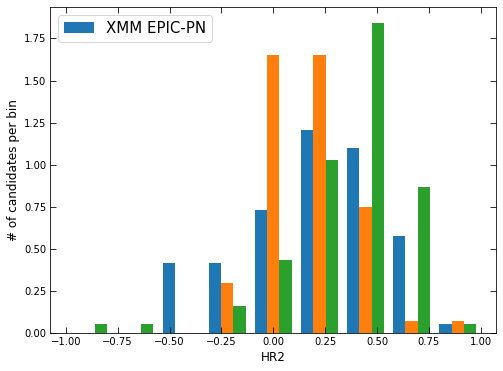

In [292]:
mybins = np.linspace(-1, 1, 10)
plt.hist(hr2_arr, bins=mybins, density=True)
plt.xlabel('HR2')
plt.ylabel('# of candidates per bin')
plt.legend(['XMM EPIC-PN', ])

In [298]:
np.max(plfit_arr[0])

6.268833517354705

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log10
  


<ErrorbarContainer object of 3 artists>

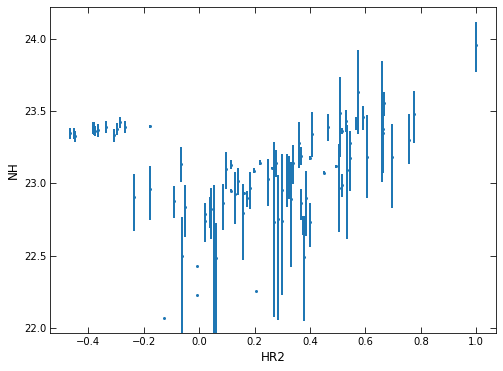

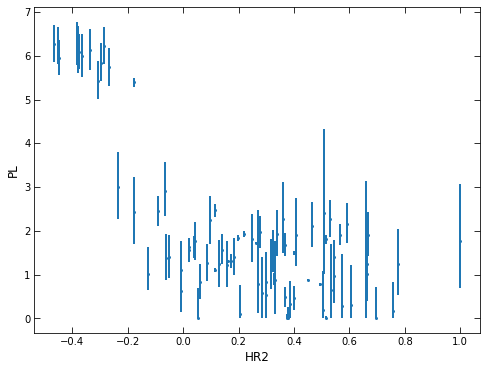

In [357]:
plt.xlabel('HR2')
plt.ylabel('NH')
#plt.ylim(0, 3)
#plt.xlim(-1, 1)
plt.errorbar(hr2_arr[0], np.log10(nhfit_arr[0]),
             yerr=[np.log10(nhfit_arr[0]) - np.log10(nh_lowfit_arr[0]),
                   np.log10(nh_highfit_arr[0]) - np.log10(nhfit_arr[0])], fmt='o')
plt.figure()
plt.xlabel('HR2')
plt.ylabel('PL')
#plt.ylim(0, 3)
#plt.xlim(-1, 1)
plt.errorbar(hr2_arr[0], plfit_arr[0],
             yerr=[plfit_arr[0] - pl_lowfit_arr[0],
                   pl_highfit_arr[0] - plfit_arr[0]], fmt='o')

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log10
  


<ErrorbarContainer object of 3 artists>

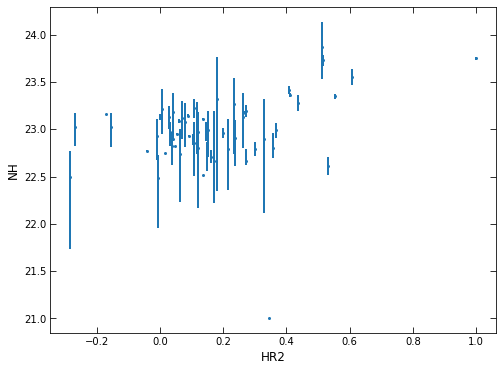

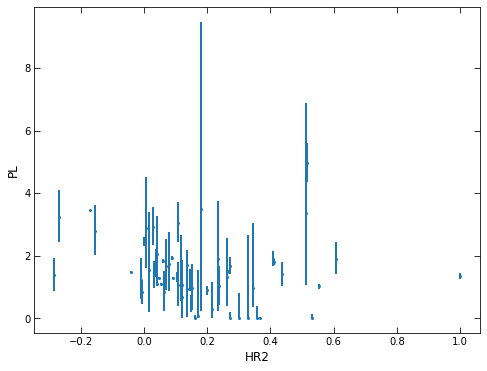

In [358]:
plt.xlabel('HR2')
plt.ylabel('NH')
#plt.ylim(0, 3)
#plt.xlim(-1, 1)
plt.errorbar(hr2_arr[1], np.log10(nhfit_arr[1]),
             yerr=[np.log10(nhfit_arr[1]) - np.log10(nh_lowfit_arr[1]),
                   np.log10(nh_highfit_arr[1]) - np.log10(nhfit_arr[1])], fmt='o')
plt.figure()
plt.xlabel('HR2')
plt.ylabel('PL')
#plt.ylim(0, 3)
#plt.xlim(-1, 1)
plt.errorbar(hr2_arr[1], plfit_arr[1],
             yerr=[plfit_arr[1] - pl_lowfit_arr[1],
                   pl_highfit_arr[1] - plfit_arr[1]], fmt='o')

In [305]:
np.min(hr2_arr[2])

-0.850713765225696

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log10
  


<ErrorbarContainer object of 3 artists>

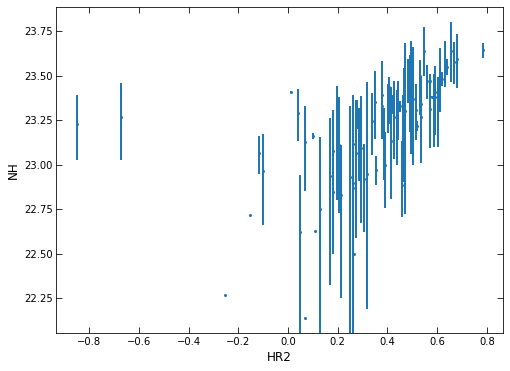

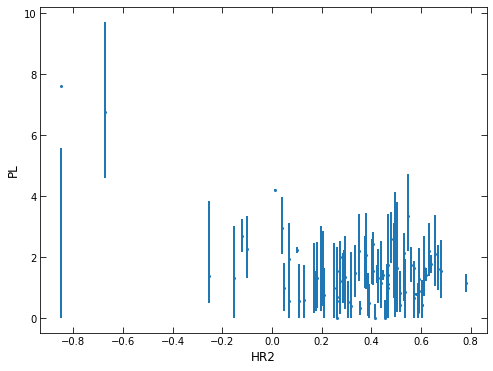

In [361]:
plt.xlabel('HR2')
plt.ylabel('NH')
#plt.ylim(0, 3)
#plt.xlim(-1, 1)
plt.errorbar(hr2_arr[2], np.log10(nhfit_arr[2]),
             yerr=[np.log10(nhfit_arr[2]) - np.log10(nh_lowfit_arr[2]),
                   np.log10(nh_highfit_arr[2]) - np.log10(nhfit_arr[2])], fmt='o')
plt.figure()
plt.xlabel('HR2')
plt.ylabel('PL')
#plt.ylim(0, 4)
#plt.xlim(-1, 1)
plt.errorbar(hr2_arr[2], plfit_arr[2],
             yerr=[plfit_arr[2] - pl_lowfit_arr[2],
                   pl_highfit_arr[2] - plfit_arr[2]], fmt='o')

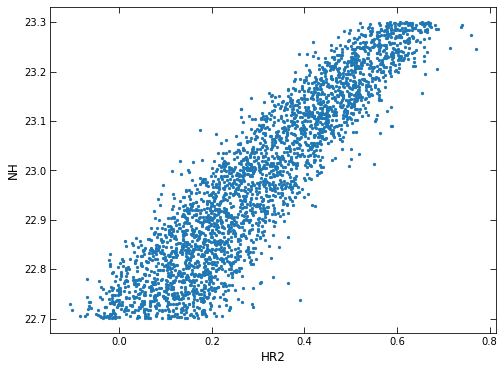

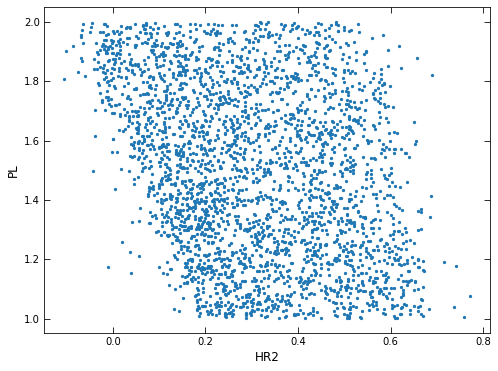

In [312]:
plt.xlabel('HR2')
plt.ylabel('NH')
#plt.ylim(0, 3)
#plt.xlim(-1, 1)
plt.scatter(hr2_simarr[2], np.log10(nh_simarr[2]), s=5)
plt.figure()
plt.xlabel('HR2')
plt.ylabel('PL')
#plt.ylim(0, 3)
#plt.xlim(-1, 1)
plt.scatter(hr2_simarr[2], pl_simarr[2], s=5)

In [858]:
sns.kdeplot

<function seaborn.distributions.kdeplot(x=None, *, y=None, shade=None, vertical=False, kernel=None, bw=None, gridsize=200, cut=3, clip=None, legend=True, cumulative=False, shade_lowest=None, cbar=False, cbar_ax=None, cbar_kws=None, ax=None, weights=None, hue=None, palette=None, hue_order=None, hue_norm=None, multiple='layer', common_norm=True, common_grid=False, levels=10, thresh=0.05, bw_method='scott', bw_adjust=1, log_scale=None, color=None, fill=None, data=None, data2=None, **kwargs)>

In [881]:
np.where(spec_summary_msps['src_nums'][1] == '2CXOJ174539.4-290041')

(array([1505]),)

In [891]:
np.where(ebins_arr[2] <= 8)[0][-1]

547

(2, 10)

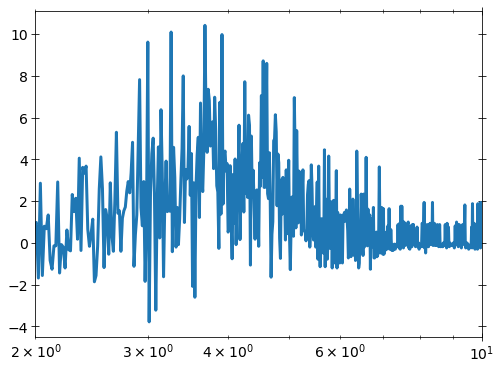

1:80: E501 line too long (91 > 79 characters)


In [884]:
test_spec = spec_summary_msps['specs'][2][2][1505] - spec_summary_msps['specs'][3][2][1505]
plt.plot(spec_summary_msps['ebins'][1][2], test_spec)
plt.xscale('log')
plt.xlim(2, 10)

In [894]:
hardcounts

340.4679037111226

In [892]:
softcounts = np.sum(test_spec[137:274])
hardcounts = np.sum(test_spec[274:547])
print((hardcounts - softcounts)/(hardcounts+softcounts))

0.033966612895659616


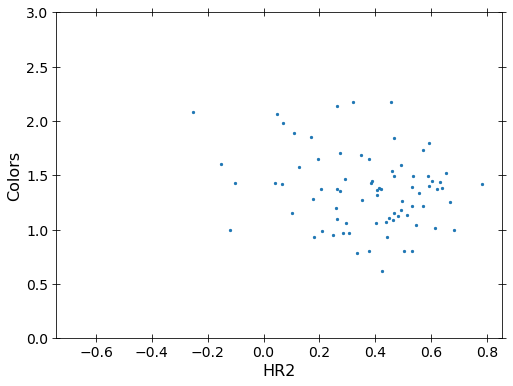

In [868]:
plt.xlabel('HR2')
plt.ylabel('Colors')
plt.ylim(0, 3)
plt.scatter(hr2_arr[2], color_arr[2], s=5)

In [327]:
sim_msp_spectra_norm_pn = spec_summary_msps['norm_specs'][0][0][good_mask]
sim_msp_spectra_norm_mos = spec_summary_msps['norm_specs'][1][0][
    np.logical_and(spec_summary_msps['spec_masks'][0][1],
                   spec_summary_msps['counts'][0][1][0] > 250)]
sim_msp_spectra_norm_acis = spec_summary_msps['norm_specs'][2][0][
    np.logical_and(spec_summary_msps['spec_masks'][0][2],
                   spec_summary_msps['counts'][0][2][0] > 250)]

In [346]:
0.1/(spec_summary_msps['ebins'][1][2][1] - spec_summary_msps['ebins'][1][2][0])

9.132420070197057

In [336]:
msp_spectra_norm_acis = ((spec_summary_msps['norm_specs'][2][1]
                              [good_mask])[
                                interested_msp_args_alldet[2]])[
                                    candidate_args_alldet[2]]

(5, 8)

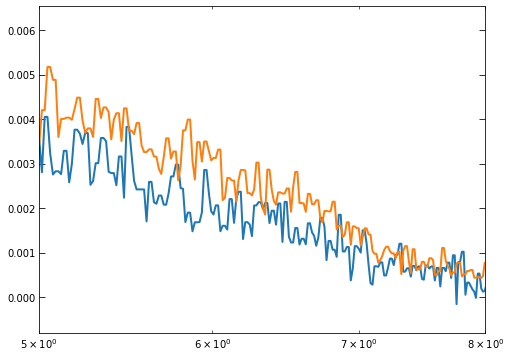

In [349]:
plt.plot(spec_summary_msps['ebins'][1][2][137:684],
         median_filter(np.mean(msp_spectra_norm_acis[hr2_arr[2] <= 0.3], axis=0), size=2))
plt.plot(spec_summary_msps['ebins'][1][2][137:684],
         median_filter(np.mean(msp_spectra_norm_acis[hr2_arr[2] > 0.3], axis=0), size=2))
plt.xscale('log')
plt.xlim(5, 8)

In [720]:
spec_summary_msps['specs'][0][0].shape

(20000, 4096)

In [692]:
print(np.where(spec_summary_msps['ebins'][0][0] >= 2)[0][0])
print(np.where(spec_summary_msps['ebins'][0][1] >= 2)[0][0])
print(np.where(spec_summary_msps['ebins'][0][2] >= 2)[0][0])

400
400
137


In [693]:
print(np.where(spec_summary_msps['ebins'][0][0] >= 4)[0][0])
print(np.where(spec_summary_msps['ebins'][0][1] >= 4)[0][0])
print(np.where(spec_summary_msps['ebins'][0][2] >= 4)[0][0])

800
800
274


In [695]:
print(np.where(spec_summary_msps['ebins'][0][0] >= 8)[0][0])
print(np.where(spec_summary_msps['ebins'][0][1] >= 8)[0][0])
print(np.where(spec_summary_msps['ebins'][0][2] >= 8)[0][0])

1600
1600
548


In [710]:
print(np.where(spec_summary_msps['ebins'][0][0] < 10)[0][-1])
print(np.where(spec_summary_msps['ebins'][0][1] < 10)[0][-1])
print(np.where(spec_summary_msps['ebins'][0][2] < 10)[0][-1])

1999
1999
684


In [717]:
netcounts_softband = []
netcounts_hardband = []
hr2_arr_all = []
norm_specs = [sim_msp_spectra_norm_pn, sim_msp_spectra_norm_mos,
              sim_msp_spectra_norm_acis]
for i, norm_spec in enumerate(norm_specs):
    if i == 2:
        netcount_soft = np.sum(norm_spec[:, 0:137], axis=1)
        netcount_hard = np.sum(norm_spec[:, 137:411], axis=1)
    else:
        netcount_soft = np.sum(norm_spec[:, 0:400], axis=1)
        netcount_hard = np.sum(norm_spec[:, 400:1200], axis=1)
    netcount_soft[netcount_soft < 0] = 0
    hr2_arr = (netcount_hard - netcount_soft)/(netcount_hard + netcount_soft)
    netcounts_softband.append(netcount_soft)
    netcounts_hardband.append(netcount_hard)
    hr2_arr.append(hr2)

(array([ 98., 366., 686., 612., 526., 478., 459., 465., 495., 185.]),
 array([-0.10868303,  0.00218527,  0.11305357,  0.22392188,  0.33479018,
         0.44565848,  0.55652679,  0.66739509,  0.77826339,  0.8891317 ,
         1.        ]),
 <BarContainer object of 10 artists>)

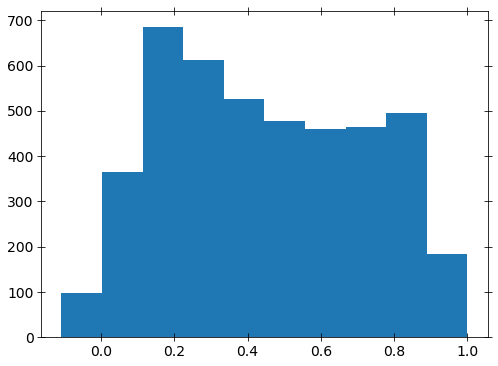

In [718]:
plt.hist(hr2)

## Constructing tables

In [82]:
import pandas as pd

In [83]:
def get_netcounts(src_num_list, det_num):
    net_counts = []
    for src_num in src_num_list:
        if det_num == 2:
            index = np.where(spec_summary_msps['src_nums'][1] == src_num)[0][0]
        else:
            index = np.where(spec_summary_msps['src_nums'][0] == src_num)[0][0]
        net_count = spec_summary_msps['counts'][0][det_num][1][index]
        net_counts.append(net_count)
    return np.array(net_counts)

In [84]:
pn_counts = get_netcounts(interested_msps_xmm, 0)
mos_counts = get_netcounts(interested_msps_xmm, 1)
acis_counts = get_netcounts(interested_msp_srcs_alldet[2], 2)

In [85]:
def get_colors(src_num_list, det_num):
    colors = []
    for src_num in src_num_list:
        if det_num == 2:
            refined_src_nums = spec_summary_msps['src_nums'][1][
                spec_summary_msps['spec_masks'][1][det_num]]
        else:
            refined_src_nums = spec_summary_msps['src_nums'][0][
                spec_summary_msps['spec_masks'][1][det_num]]
        index = np.where(refined_src_nums == src_num)[0]
        if len(index) > 0:
            color = obs_color_dict_arr[det_num]['colors'][index][0]
        else:
            color = ''
        colors.append(color)
    return np.array(colors)

In [86]:
pn_colors = get_colors(interested_msps_xmm, 0)
mos_colors = get_colors(interested_msps_xmm, 1)
acis_colors = get_colors(interested_msp_srcs_alldet[2], 2)

In [87]:
print(r'$6_{-3}^{10}$')

$6_{-3}^{10}$


In [88]:
def combine_xmm_tables(pn_table, mos_table, src_num_list):
    combined_table = []
    for src_num in src_num_list:
        index = np.where(interested_msp_srcs_alldet[0] == src_num)[0]
        if len(index) > 0:
            combined_table.append(pn_table[index[0]])
        else:
            index = np.where(interested_msp_srcs_alldet[1] == src_num)[0][0]
            combined_table.append(mos_table[index])
    return np.array(combined_table)

In [89]:
xmm_pl_fit_stats_table = combine_xmm_tables(pn_fit_stats_table_pl, mos_fit_stats_table_pl, interested_msps_xmm)
xmm_pl_g_fit_stats_table = combine_xmm_tables(pn_fit_stats_table_pl_g, mos_fit_stats_table_pl_g, interested_msps_xmm)
xmm_pl_g3_fit_stats_table = combine_xmm_tables(pn_fit_stats_table_pl_g2, mos_fit_stats_table_pl_g2, interested_msps_xmm)

1:80: E501 line too long (111 > 79 characters)
2:80: E501 line too long (117 > 79 characters)


In [90]:
xmm_pl_model_params_table = combine_xmm_tables(pn_model_params_table_pl, mos_model_params_table_pl, interested_msps_xmm)
xmm_pl_g_model_params_table = combine_xmm_tables(pn_model_params_table_pl_g, mos_model_params_table_pl_g, interested_msps_xmm)
xmm_pl_g3_model_params_table = combine_xmm_tables(pn_model_params_table_pl_g2, mos_model_params_table_pl_g2, interested_msps_xmm)

1:80: E501 line too long (120 > 79 characters)
2:80: E501 line too long (126 > 79 characters)


In [91]:
xmm_pl_model_params_table[0]

array(['201129702010014', '40.064168838973885', '24.580594765473297',
       '59.46819584183292', '0.9246639365348682', '0.20761962013263913',
       '1.7169056840585863', '0.3055019747447762', '0.22117857461376142',
       '0.48171075914198874'], dtype='<U32')

In [92]:
xmm_indices = []
for src_num in interested_msps_xmm:
    index_pn = np.where(interested_msp_srcs_alldet[0] == src_num)[0]

In [93]:
pn_indices = []
for src_num in interested_msps_xmm:
    index_my = np.where(interested_msp_srcs_alldet[0] == src_num)[0]
    if len(index_my) > 0:
        pn_indices.append(index_my[0])
    else:
        pn_indices.append(np.nan)

In [97]:
pn_indices[3]

nan

In [95]:
mos_indices = []
for src_num in interested_msps_xmm:
    index_my = np.where(interested_msp_srcs_alldet[1] == src_num)[0]
    if len(index_my) > 0:
        mos_indices.append(index_my[0])
    else:
        mos_indices.append(np.nan)

In [98]:
interested_msp_srcs_alldet[1][mos_indices[3]]

'202026708010061'

In [138]:
np.where(np.logical_and(~np.isnan(pn_indices), ~np.isnan(mos_indices)))

(array([  3,   5,   8,  11,  21,  27,  32,  35,  39,  40,  43,  51,  54,
         64,  68,  74,  76,  79,  84,  91,  94,  96, 100, 105, 106, 108,
        115, 120, 122, 123, 126, 128, 130, 137, 141, 145, 147, 149, 153,
        154, 162, 163, 168, 172, 180, 182, 201, 203, 207, 218, 219, 223,
        231, 233, 236, 244, 249, 250, 253, 258, 263, 264, 265]),)

In [149]:
pn_fit_stats_table_pl[pn_indices[5]]

['207234103010044', 2266.842375634099, -4.021812244509783, 50.0, 1842]

In [148]:
mos_fit_stats_table_pl[mos_indices[5]]

['207234103010044', 2266.842375634099, -4.021812244509783, 50.0, 1842]

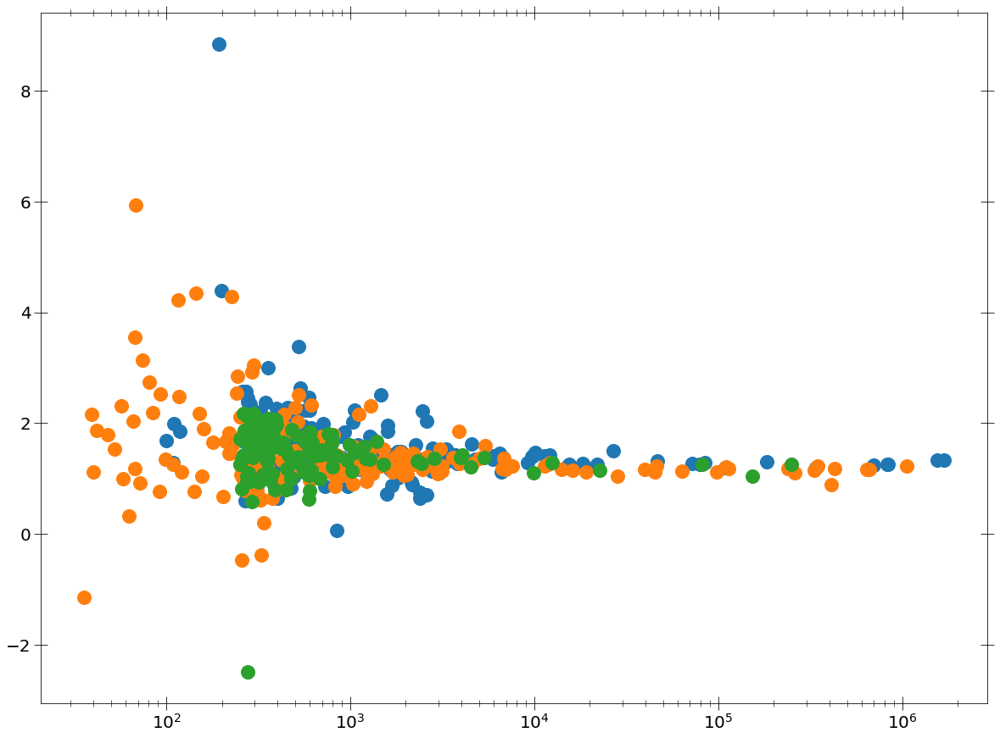

In [110]:
plt.scatter(pn_counts, pn_colors)
plt.scatter(mos_counts, mos_colors)
plt.scatter(acis_counts, acis_colors)
plt.xscale('log')

In [88]:
from astropy.table import Table
from astropy.table.pprint import conf
conf.max_lines = -1
conf.max_width = -1

In [89]:
Table(np.column_stack([interested_msps_xmm, pn_counts, mos_counts]))

col0,col1,col2
str32,str32,str32
207622503010010,0.0,260338.00351399818
201129704010056,294.6517654691121,39.05389726075383
206586001010073,0.0,429.331159172748
208861209010009,553.6794065557835,441.9934683768305
201129707010045,108.88090819793108,2194.314032455358
207234103010044,697.7421205630355,2708.677123052165
207234103010039,193.48756216007803,689.4994864562675
205049406010002,0.0,28122.74572076179
208624706010006,182106.79592806142,113492.41752644595


In [231]:
chandra_table = np.column_stack([
    interested_msp_srcs_alldet[2], acis_counts, acis_colors,
    acis_pl_model_params_table[:, 1],
    (acis_pl_model_params_table[:, 2].astype(float) -
     acis_pl_model_params_table[:, 1].astype(float)),
    (acis_pl_model_params_table[:, 3].astype(float) -
     acis_pl_model_params_table[:, 1].astype(float)),
    acis_pl_model_params_table[:, 4],
    (acis_pl_model_params_table[:, 5].astype(float) -
     acis_pl_model_params_table[:, 4].astype(float)),
    (acis_pl_model_params_table[:, 6].astype(float) -
     acis_pl_model_params_table[:, 4].astype(float)),
    acis_pl_model_params_table[:, 7],
    (acis_pl_model_params_table[:, 8].astype(float) -
     acis_pl_model_params_table[:, 7].astype(float)),
    (acis_pl_model_params_table[:, 9].astype(float) -
     acis_pl_model_params_table[:, 7].astype(float)),
    acis_pl_fit_stats_table[:, 1], acis_pl_fit_stats_table[:, -1],
    acis_pl_g_model_params_table[:, 4],
    (acis_pl_g_model_params_table[:, 5].astype(float) -
     acis_pl_g_model_params_table[:, 4].astype(float)),
    (acis_pl_g_model_params_table[:, 6].astype(float) -
     acis_pl_g_model_params_table[:, 4].astype(float)),
    acis_pl_g_model_params_table[:, 7],
    (acis_pl_g_model_params_table[:, 8].astype(float) -
     acis_pl_g_model_params_table[:, 7].astype(float)),
    (acis_pl_g_model_params_table[:, 9].astype(float) -
     acis_pl_g_model_params_table[:, 7].astype(float)),
    (acis_pl_g_fit_stats_table[:, 1].astype(float) -
     acis_pl_fit_stats_table[:, 1].astype(float)),
    acis_pl_g3_model_params_table[:, 4],
    (acis_pl_g3_model_params_table[:, 7].astype(float) -
     acis_pl_g3_model_params_table[:, 4].astype(float)),
    (acis_pl_g3_model_params_table[:, 8].astype(float) -
     acis_pl_g3_model_params_table[:, 4].astype(float)),
    acis_pl_g3_model_params_table[:, 5],
    (acis_pl_g3_model_params_table[:, 9].astype(float) -
     acis_pl_g3_model_params_table[:, 5].astype(float)),
    (acis_pl_g3_model_params_table[:, 10].astype(float) -
     acis_pl_g3_model_params_table[:, 5].astype(float)),
    acis_pl_g3_model_params_table[:, 6],
    (acis_pl_g3_model_params_table[:, 11].astype(float) -
     acis_pl_g3_model_params_table[:, 6].astype(float)),
    (acis_pl_g3_model_params_table[:, 12].astype(float) -
     acis_pl_g3_model_params_table[:, 6].astype(float)),
    (acis_pl_g3_fit_stats_table[:, 1].astype(float) -
     acis_pl_fit_stats_table[:, 1].astype(float)),])

In [99]:
xmm_pl_model_params_table

array([['201129702010014', '40.064168838973885', '24.580594765473297',
        ..., '0.3055019747447762', '0.22117857461376142',
        '0.48171075914198874'],
       ['206946401010004', '8.385994442235155', '5.206951655011025', ...,
        '1.8835661693422523', '1.6508003671006857', '2.173415838126594'],
       ['201032613010001', '7.274965938558672', '5.529984728935126', ...,
        '1.4726114502663952', '1.390964351597305', '1.5597211874733699'],
       ...,
       ['206556701010043', '0.1000000000000056', '0.0', ...,
        '0.033337441399740354', '0.02065111760798323',
        '0.05440169835583382'],
       ['208441011010009', '1.1627213582266562', '0.0', ...,
        '0.35797476442764836', '0.3106955665388768',
        '0.4123080494482446'],
       ['206735502010018', '3.264723650330524', '0.0', ...,
        '0.11133899587895077', '0.08875732427789625',
        '0.13837340296250747']], dtype='<U32')

In [207]:
xmm_table = np.column_stack([
    interested_msps_xmm, pn_counts, mos_counts, pn_colors, mos_colors,
    xmm_pl_model_params_table[:, 1],
    (xmm_pl_model_params_table[:, 2].astype(float) -
     xmm_pl_model_params_table[:, 1].astype(float)),
    (xmm_pl_model_params_table[:, 3].astype(float) -
     xmm_pl_model_params_table[:, 1].astype(float)),
    xmm_pl_model_params_table[:, 4],
    (xmm_pl_model_params_table[:, 5].astype(float) -
     xmm_pl_model_params_table[:, 4].astype(float)),
    (xmm_pl_model_params_table[:, 6].astype(float) -
     xmm_pl_model_params_table[:, 4].astype(float)),
    xmm_pl_model_params_table[:, 7],
    (xmm_pl_model_params_table[:, 8].astype(float) -
     xmm_pl_model_params_table[:, 7].astype(float)),
    (xmm_pl_model_params_table[:, 9].astype(float) -
     xmm_pl_model_params_table[:, 7].astype(float)),
    xmm_pl_fit_stats_table[:, 1], xmm_pl_fit_stats_table[:, -1],
    xmm_pl_g_model_params_table[:, 4],
    (xmm_pl_g_model_params_table[:, 5].astype(float) -
     xmm_pl_g_model_params_table[:, 4].astype(float)),
    (xmm_pl_g_model_params_table[:, 6].astype(float) -
     xmm_pl_g_model_params_table[:, 4].astype(float)),
    xmm_pl_g_model_params_table[:, 7],
    (xmm_pl_g_model_params_table[:, 8].astype(float) -
     xmm_pl_g_model_params_table[:, 7].astype(float)),
    (xmm_pl_g_model_params_table[:, 9].astype(float) -
     xmm_pl_g_model_params_table[:, 7].astype(float)),
    (xmm_pl_g_fit_stats_table[:, 1].astype(float) -
     xmm_pl_fit_stats_table[:, 1].astype(float)),
    xmm_pl_g3_model_params_table[:, 4],
    (xmm_pl_g3_model_params_table[:, 7].astype(float) -
     xmm_pl_g3_model_params_table[:, 4].astype(float)),
    (xmm_pl_g3_model_params_table[:, 8].astype(float) -
     xmm_pl_g3_model_params_table[:, 4].astype(float)),
    xmm_pl_g3_model_params_table[:, 5],
    (xmm_pl_g3_model_params_table[:, 9].astype(float) -
     xmm_pl_g3_model_params_table[:, 5].astype(float)),
    (xmm_pl_g3_model_params_table[:, 10].astype(float) -
     xmm_pl_g3_model_params_table[:, 5].astype(float)),
    xmm_pl_g3_model_params_table[:, 6],
    (xmm_pl_g3_model_params_table[:, 11].astype(float) -
     xmm_pl_g3_model_params_table[:, 6].astype(float)),
    (xmm_pl_g3_model_params_table[:, 12].astype(float) -
     xmm_pl_g3_model_params_table[:, 6].astype(float)),
    (xmm_pl_g3_fit_stats_table[:, 1].astype(float) -
     xmm_pl_fit_stats_table[:, 1].astype(float)),])

In [482]:
xmm_table = np.column_stack([
    interested_msps_xmm, pn_counts, mos_counts, pn_colors, mos_colors,
    xmm_pl_model_params_table[:, 1], xmm_pl_model_params_table[:, 2],
    xmm_pl_model_params_table[:, 3], xmm_pl_model_params_table[:, 4],
    xmm_pl_model_params_table[:, 5], xmm_pl_model_params_table[:, 6],
    xmm_pl_model_params_table[:, 7], xmm_pl_model_params_table[:, 8],
    xmm_pl_model_params_table[:, 9], xmm_pl_fit_stats_table[:, 1],
    xmm_pl_fit_stats_table[:, -1],
    xmm_pl_g_model_params_table[:, 4], xmm_pl_g_model_params_table[:, 5],
    xmm_pl_g_model_params_table[:, 6], xmm_pl_g_model_params_table[:, 7],
    xmm_pl_g_model_params_table[:, 8], xmm_pl_g_model_params_table[:, 9],
    xmm_pl_g_fit_stats_table[:, 1].astype(float) -
    xmm_pl_fit_stats_table[:, 1].astype(float),
    xmm_pl_g3_model_params_table[:, 4], xmm_pl_g3_model_params_table[:, 7],
    xmm_pl_g3_model_params_table[:, 8], xmm_pl_g3_model_params_table[:, 5],
    xmm_pl_g3_model_params_table[:, 9], xmm_pl_g3_model_params_table[:, 10],
    xmm_pl_g3_model_params_table[:, 6], xmm_pl_g3_model_params_table[:, 11],
    xmm_pl_g3_model_params_table[:, 12],
    xmm_pl_g3_fit_stats_table[:, 1].astype(float) -
    xmm_pl_fit_stats_table[:, 1].astype(float)])

In [483]:
xmm_pl_g_fit_stats_table[:, 1]

array(['2645.6994835249343', '665.8709792496267', '361.6106519081203',
       '806.8588720324649', '7892.610191047755', '2256.8480380351666',
       '2134.5217675805497', '1529.0949651740066', '6238.057958243411',
       '891.6020695667492', '746.7843445601804', '617.8092342542919',
       '1618.3668348925878', '438.8103055110049', '653.6459473821315',
       '340.5762254428715', '840.9294541723552', '1620.276308869459',
       '290.1392373172891', '903.017004971931', '1062.1425659901292',
       '3210.3445505668233', '1807.2598160175753', '849.1917804479247',
       '772.0375360958518', '1089.0170521927698', '348.7066621724425',
       '3140.3766945216103', '811.766976324075', '471.76582385536676',
       '1468.8139036751402', '818.1725485498528', '1719.4921057723082',
       '499.9877717445126', '595.6221375126892', '3572.8570396389878',
       '835.0503337393559', '1098.6254189219742', '460.6536680397199',
       '2222.9143468999464', '3201.7281280162906', '591.5703945945271',
     

In [212]:
xmm_pl_g_model_params_table[0]

array(['207622503010010', '35.596017788197436', '2.2327117855196046',
       '546.6436339802941', '6.100000000001684', '0.0',
       '6.108267188355522', '0.00018105563840288533',
       '0.00014832513658590837', '0.00021414976928106603'], dtype='<U32')

In [226]:
acis_pl_model_params_table = np.array(acis_model_params_table_pl)
acis_pl_g_model_params_table = np.array(acis_model_params_table_pl_g)
acis_pl_g3_model_params_table = np.array(acis_model_params_table_pl_g2)

In [227]:
acis_pl_fit_stats_table = np.array(acis_fit_stats_table_pl)
acis_pl_g_fit_stats_table = np.array(acis_fit_stats_table_pl_g)
acis_pl_g3_fit_stats_table = np.array(acis_fit_stats_table_pl_g2)

In [484]:
Table(xmm_table)

col0,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,col28,col29,col30,col31,col32
str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32
207622503010010,0.0,260338.00351399818,,1.1102147456631106,35.67857906270319,35.3454350973419,36.0160656830179,2.2190620148765636,2.189116470505265,2.2492900263022513,550.1834688943778,542.0157369848255,558.6504123265576,2730.9368388408425,1596,6.100000000001684,0.0,6.108267188355522,0.00018105563840288533,0.00014832513658590837,0.00021414976928106603,-85.23735531590819,5.237650619824747e-05,2.851977152628729e-05,7.652522536040157e-05,8.461881155357663e-20,0.8224962005991274,0.0,3.454770925283061e-20,0.8224962005991274,0.0,-13.232282676334307
201129704010056,294.6517654691121,39.05389726075383,0.6643177106250369,2.156554968512752,35.21642824819831,10.25602099943173,70.53522029840312,1.3898442722306277,0.0,3.1451885928534002,0.14208766295881559,0.07865781519087772,0.45956051800268805,668.6759549470187,865,6.156778872546067,0.0,6.458588561890856,3.4642313474981727e-07,8.624004564555823e-09,7.489997035646336e-07,-2.804975697392024,7.303444238356603e-08,0.0,4.15546883570518e-07,7.722793777771329e-18,0.0,1.6395642195470739e-07,1.500109388703975e-18,0.0,2.688399137763471e-07,-0.14954741439009922
206586001010073,0.0,429.331159172748,,1.3715557469613593,7.231667542469075,3.1999369849647326,11.889710856748481,1.0666141274839969,0.3951247950247223,1.8049403206321228,0.36491820802403674,0.30932093176136255,0.43282784987204886,363.6151018469035,429,6.69597583279664,0.0,0.0,1.2749333716836535e-06,0.0,3.0943744387713008e-06,-2.004449938783182,7.30134027258027e-07,0.0,2.0019674500756857e-06,9.918521087941685e-07,0.0,2.4872247690435282e-06,2.336197985941911e-15,0.0,1.1190757987990349e-06,-3.4207160477954517
208861209010009,553.6794065557835,441.9934683768305,1.145626680880362,1.3831140493320522,9.708432725870145,8.045253208542798,11.54928051490436,3.506293300079028e-07,0.0,0.06169761433149817,2.9200507936683366,2.69291225744623,3.1662075856816885,816.2763956598882,921,7.299999999999977,7.253661622633777,0.0,1.0125489352355616e-05,4.463300527808699e-06,1.6912327377722882e-05,-9.417523627423293,6.398613714306159e-07,0.0,3.872917558193697e-06,8.349587928062182e-07,0.0,4.322840891455717e-06,3.36190238588793e-06,0.0,7.586078108629214e-06,-2.5485737889099482
201129707010045,108.88090819793108,2194.314032455358,1.2858694889334072,1.4538025917976205,53.34319711887099,46.769468584906384,60.63843420305279,4.972097875014737,4.3734571684679935,5.621765188621917,15.327780856273613,9.105378613470494,27.90836987260386,7895.765969122641,1134,6.979866969892582,6.796402323609001,7.299673535088791,2.6029902036341723e-06,1.5981130542984717e-07,5.108074290622587e-06,-3.155778074886257,3.298695418551513e-07,0.0,2.217053499452842e-06,2.4373866708992243e-18,0.0,1.118223544336908e-06,1.8392702452992956e-06,1.0442206661456709e-07,3.6828142299412844e-06,-3.105686907357267
207234103010044,697.7421205630355,2708.677123052165,1.6084891830885892,1.3470285590106155,5.981636738195103,4.6183875409644415,7.4105178669944625,0.18171317778088739,0.0,0.3730742830679252,2.8001710969140774,2.6768123214322896,2.928120730053331,2266.8423756340817,1842,6.525699089980816,6.402460420979788,6.629681055064438,4.6978935204008615e-06,2.186726977700958e-06,7.430390489197147e-06,-9.994337598915081,2.4684955862046644e-06,6.514130016303281e-07,4.463172123880102e-06,2.19472368271888e-06,3.1277968508772095e-07,4.27827162316157e-06,4.906845662203037e-06,2.576449497930578e-06,7.467467351451785e-06,-20.305279190579768
207234103010039,193.48756216007803,689.4994864562675,8.843380333646277,1.3524711234285582,8.434340542714063,4.968365366298327,12.266974007396804,2.3431130638871456,1.6666884186979578,3.093146340240424,0.2654

In [235]:
acis_model_params_table_pl

[['2CXOJ174454.1-285841',
  8.296611124691674,
  4.199283000396269,
  13.073600983805179,
  0.5544722436927508,
  0.0,
  1.226483391974505,
  0.5907146270662572,
  0.5175474181294074,
  0.6732834380747194],
 ['2CXOJ174508.6-285652',
  26.527858789840458,
  11.49891700217168,
  49.70939325342043,
  1.7874020954159324,
  0.06471861721216854,
  4.148848710589748,
  0.04434379347879459,
  0.029687670775912507,
  0.16250425889768702],
 ['2CXOJ174508.7-290325',
  9.625715918498774,
  3.2161630605188494,
  18.0632887619145,
  1.0483346327578453,
  0.0,
  2.324050777728131,
  0.018877648010863314,
  0.015591366804861626,
  0.02466405434040105],
 ['2CXOJ174512.3-285901',
  3.1643613895027713,
  0.0,
  11.085530860450756,
  1.9826273875842662e-05,
  0.0,
  0.9268668479557348,
  0.017510524662329635,
  0.013916882923482463,
  0.02185232060659685],
 ['2CXOJ174513.0-290229',
  51.224982018227585,
  29.29579351030432,
  82.70105157809073,
  0.8913578687994118,
  0.0,
  2.5631584146204633,
  0.074933

In [317]:
xmm_table[:, 5].astype(float)

array([3.56785791e+01, 3.52164282e+01, 7.23166754e+00, 9.70843273e+00,
       5.33431971e+01, 5.98163674e+00, 8.43434054e+00, 7.84834497e+00,
       1.63047665e+01, 2.45163859e+01, 4.43476686e+00, 6.60140929e+00,
       8.06937645e+00, 8.38599444e+00, 2.43520672e+01, 1.66712365e+01,
       2.30307111e+01, 2.84223229e+01, 6.22970574e+00, 6.40905573e+00,
       5.70976765e+00, 8.73917279e+00, 8.23527117e+00, 5.90540548e+00,
       1.04090095e+01, 5.04024062e+00, 2.06933648e+01, 7.85663087e+00,
       4.55460691e+00, 3.40049822e+00, 4.74460727e+01, 3.00696839e+01,
       6.93018557e+00, 9.34426685e+00, 4.30434397e+01, 7.02420656e+00,
       4.31880568e+01, 5.68055940e+00, 5.46323296e+00, 9.12326173e+00,
       8.01389866e+00, 5.36293844e+00, 3.46965435e+01, 5.22166529e+01,
       7.02079473e+00, 1.79114760e+00, 6.35366954e+00, 5.68980612e+00,
       8.48029218e+00, 6.93760308e+00, 7.06469757e+00, 3.56777453e+01,
       4.08451978e+00, 5.25342653e+00, 8.65190665e+00, 1.16272136e+00,
      

In [472]:
def makeerr_arr(values, low_value, high_value, min_value=0.0, max_value=1.0):
    corr_lowvalue = low_value.copy()
    corr_highvalue = high_value.copy()
    for i, value in enumerate(values):
        if float(low_value[i]) == 0.0 or float(low_value[i]) >= float(value):
            corr_lowvalue[i] = str(min_value)
        if float(high_value[i]) == 0.0 or float(high_value[i]) <= float(value):
            corr_highvalue[i] = str(max_value)
    return corr_lowvalue, corr_highvalue

In [485]:
corr_lownh, corr_highnh = np.array(
    makeerr_arr(xmm_pl_model_params_table[:, 1],
                xmm_pl_model_params_table[:, 2],
                xmm_pl_model_params_table[:, 3], 0.10, 500.00))

In [486]:
corr_plindex_low, corr_plindex_high = np.array(
    makeerr_arr(xmm_pl_model_params_table[:, 4],
                xmm_pl_model_params_table[:, 5],
                xmm_pl_model_params_table[:, 6], 0.0, 10.00))

In [487]:
corr_plnorm_low, corr_plnorm_high = np.array(
    makeerr_arr(xmm_pl_model_params_table[:, 4],
                xmm_pl_model_params_table[:, 5],
                xmm_pl_model_params_table[:, 6], 0.0, 10**6))

In [488]:
corr_fepos_low, corr_fepos_high = np.array(
    makeerr_arr(xmm_pl_g_model_params_table[:, 4],
                xmm_pl_g_model_params_table[:, 5],
                xmm_pl_g_model_params_table[:, 6], 6.1, 7.3))

In [490]:
corr_fepos_low

array(['6.1', '6.1', '6.1', '7.253661622633777', '6.796402323609001',
       '6.402460420979788', '6.536063855648311', '6.1',
       '7.055813133615781', '6.1', '6.888891517630648',
       '6.334931058717694', '6.1', '6.749922329430278', '6.1', '6.1',
       '6.1', '6.244053502790891', '6.305194542419848', '6.1',
       '6.3548371392296215', '6.740907692041495', '6.424486189722204',
       '6.905535301804678', '6.1', '7.187615236039556', '6.1', '6.1',
       '6.304171578774871', '6.461833700846944', '6.399750999060703',
       '6.703262712818714', '6.857173869067835', '6.1', '6.1',
       '6.606687729351949', '6.23295064197992', '6.595682290342292',
       '6.926782598025679', '6.1', '6.750773323227466',
       '6.5043234229298506', '6.37395607046109', '6.790004581876084',
       '6.60856797242456', '6.1', '6.718346833923011',
       '6.592288098975828', '6.618526758293884', '6.665296649048671',
       '6.26702829832061', '6.1', '7.15179165289488', '6.41832248297579',
       '6.1573142

In [491]:
corr_fenorm_low, corr_fenorm_high = np.array(
    makeerr_arr(xmm_pl_g_model_params_table[:, 4],
                xmm_pl_g_model_params_table[:, 5],
                xmm_pl_g_model_params_table[:, 6], 0.0, 1.0))

In [492]:
corr_fenorm1_low, corr_fenorm1_high = np.array(
    makeerr_arr(xmm_pl_g3_model_params_table[:, 4],
                xmm_pl_g3_model_params_table[:, 7],
                xmm_pl_g3_model_params_table[:, 8], 0.0, 1.0))

In [493]:
corr_fenorm2_low, corr_fenorm2_high = np.array(
    makeerr_arr(xmm_pl_g3_model_params_table[:, 5],
                xmm_pl_g3_model_params_table[:, 9],
                xmm_pl_g3_model_params_table[:, 10], 0.0, 1.0))

In [494]:
corr_fenorm2_low, corr_fenorm2_high = np.array(
    makeerr_arr(xmm_pl_g3_model_params_table[:, 6],
                xmm_pl_g3_model_params_table[:, 11],
                xmm_pl_g3_model_params_table[:, 12], 0.0, 1.0))

In [100]:
delta_cstat_g1 = (xmm_pl_fit_stats_table[:, 1].astype(float) -
                  xmm_pl_g_fit_stats_table[:, 1].astype(float))

In [101]:
delta_cstat_g3 = (xmm_pl_fit_stats_table[:, 1].astype(float) -
                  xmm_pl_g3_fit_stats_table[:, 1].astype(float))

(array([ 1.,  0.,  0.,  0.,  0.,  0.,  3.,  0.,  1.,  1.,  1.,  1.,  1.,
         2.,  0.,  1.,  0.,  0.,  0., 72., 30., 35.,  9., 18.,  9., 10.,
         5.,  8.,  8.,  6.,  4.,  4.,  1.,  8.,  1.,  2.,  0.,  1.,  2.,
         0.,  3.,  2.,  1.,  1.,  0.,  1.,  1.,  0.,  2.,  0.,  0.,  3.,
         2.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  2.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([-41.43972417, -39.28848443, -37.13724469, -34.98600494,
        -32.8347652 , -30.68352546, -28.53228571, -26.38104597,
        -24.22980623, -22.07856648, -19.92732674, -17.776087  ,
        -15.62484725, -13.47360751, -11.32236777,  -9.17112803,
         -7.01988828,  -4.86864854,  -2.7174088 ,  -0.56616905,
          1.58507069,   3.73631043,   5.88755018,   8.03878992,
         10.19002966,  12.3412694 ,  14.49250915, 

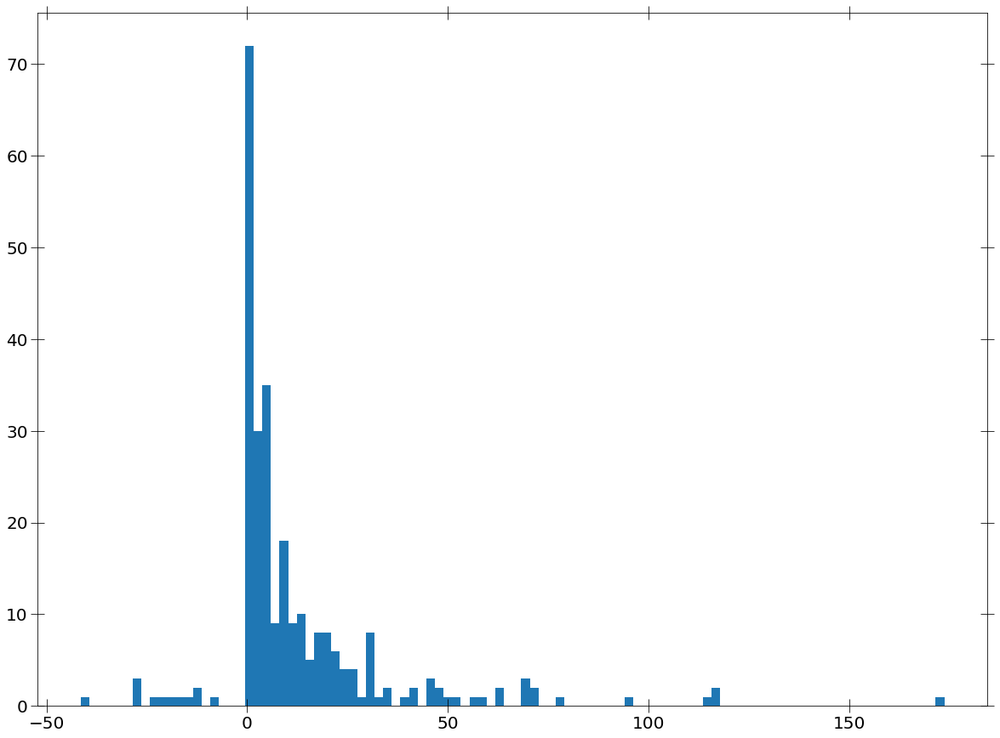

In [102]:
plt.hist(delta_cstat_g3, bins=100)

In [162]:
weird_srcs2 = np.where(np.logical_or(delta_cstat_g1 < -1, delta_cstat_g1 > 50))[0]

In [164]:
len(weird_srcs2)

14

In [133]:
np.sort(xmm_pl_fit_stats_table[:, 0][weird_srcs1])

array(['201113503010004', '201129702010029', '201129704010001',
       '201129704010010', '201129704010011', '201129704010040',
       '201129705010014', '201129705010043', '201129707010006',
       '201129721010009', '201129721010108', '201529201010017',
       '204024304010005', '205056701010004', '206043006010192',
       '206556701010012', '206904418010014', '206904418010045',
       '206946403010136', '207234103010007', '207234103010014',
       '207234103010016', '207234103010034', '207234103010035',
       '207234103010036', '207234103010038', '207234103010040',
       '207234103015026', '207234103015028', '207234104010012',
       '207234104010014', '207234104010017', '207234104010059',
       '207234105010007', '207234105010012', '207234105010017',
       '207234105010033', '207234105010036', '207234105010038',
       '207622503010010', '208441011010002', '208624706010010'],
      dtype='<U32')

In [134]:
xmm_pl_fit_stats_table[:, 0][weird_srcs1]

array(['206556701010012', '201129702010029', '201129707010006',
       '201129721010009', '207234104010059', '201129705010043',
       '207234103010040', '201129721010108', '207234105010012',
       '207234104010012', '207234105010007', '207234103015026',
       '201129704010010', '207234104010017', '201129704010040',
       '206946403010136', '207234105010038', '206904418010045',
       '201529201010017', '207234103010038', '201129704010011',
       '205056701010004', '201113503010004', '201129705010014',
       '204024304010005', '201129704010001', '207234104010014',
       '207234105010017', '208441011010002', '207234105010036',
       '207234103010007', '207234103010036', '207234103010034',
       '207234103010035', '207234103010016', '206043006010192',
       '207234105010033', '206904418010014', '207622503010010',
       '207234103010014', '208624706010010', '207234103015028'],
      dtype='<U32')

In [120]:
delta_cstat_g1[weird_srcs1]

array([-8.68067610e-04,  2.81206795e+01,  2.60235957e+01,  6.76836259e+01,
        4.97888319e+01,  2.15864350e+01,  2.30123980e+01,  6.49511295e+01,
        3.05663884e+01,  3.70706063e+01, -2.75712296e-03,  2.53924869e+01,
        3.58832778e+01,  2.42571661e+01,  2.02969384e+01,  2.41787765e+01,
        3.81246250e+01,  5.24048219e+01,  2.99860900e+01,  2.54315614e+01,
        2.03842304e+01,  4.03577760e+01,  2.20110614e+01,  2.26046561e+02,
        4.00075078e+01,  6.38376888e+01,  1.87964636e+02,  1.18102132e+02,
       -3.33503823e-03,  3.84233297e+01,  3.65101651e+01,  2.20546722e+01,
       -6.66443634e-06,  3.01762310e+01,  5.52641749e+01,  8.43546992e+01,
        8.12167599e+01,  8.99992721e+01,  2.11611373e+01,  2.67850738e+01,
        3.79132927e+01,  4.34041122e+01,  8.52373553e+01,  7.27679675e+01,
        4.39431419e+01, -6.79639063e-05, -1.64409809e-04,  5.56203829e+01])

In [115]:
np.where(delta_cstat_g1 < 0)

(array([  7,  97, 161, 176, 248, 258]),)

In [121]:
weird_srcs1

array([  7,  10,  29,  34,  41,  49,  51,  66,  69,  72,  97, 100, 101,
       114, 117, 118, 119, 120, 124, 130, 131, 133, 138, 144, 149, 153,
       155, 157, 161, 164, 165, 171, 176, 180, 185, 190, 191, 196, 197,
       211, 222, 224, 235, 237, 241, 248, 258, 262])

In [170]:
np.where(xmm_pl_fit_stats_table[:, 0] == '201129707010045')

(array([182]),)

In [171]:
xmm_pl_fit_stats_table[np.where(xmm_pl_fit_stats_table[:, 0] == '201129707010045')]

array([['201129707010045', '7895.765969122641', '-1.4463101505862166',
        '50.0', '1134']], dtype='<U32')

In [172]:
xmm_pl_g_fit_stats_table[np.where(xmm_pl_fit_stats_table[:, 0] == '201129707010045')]

array([['201129707010045', '7891.8960280235015', '-1.4465490502427034',
        '50.0', '1132']], dtype='<U32')

In [173]:
xmm_pl_g3_fit_stats_table[np.where(xmm_pl_fit_stats_table[:, 0] == '201129707010045')]

array([['201129707010045', '7892.660282215284', '-1.4469514023120824',
        '50.0', '1131']], dtype='<U32')

In [177]:
mos_counts[182]

2194.314032455358

In [166]:
np.sort(xmm_pl_fit_stats_table[:, 0][weird_srcs2])

array(['201129704010001', '201129705010014', '201129707010006',
       '204024304010005', '205056701010004', '206946403010136',
       '207234103010007', '207234103010014', '207234103010034',
       '207234103010035', '207234103010036', '207234103010040',
       '207234103015028', '207622503010010'], dtype='<U32')